# D213 Data Mining II Performance Assessment, Task \# 1

Submitted by William J Townsend, Student ID 003397146, for WGU's MSDA program

## Table of Contents
<ul>
<li><a href="#PartA1">A1: Research Question</a></li>
<li><a href="#PartA2">A2: Objectives and Goals of Analysis</a></li>
<li><a href="#PartA3">A3: Neutral Network Identification</a></li>
<li><a href="#PartB1">B1: Exploratory Data Analysis</a></li>
<li><a href="#PartB2">B2: Tokenization Process</a></li>
<li><a href="#PartB3">B3: Padding Process</a></li> 
<li><a href="#PartB4">B4: Sentiment Categories & Activation Function</a></li>
<li><a href="#PartB5">B5: Data Preparation Steps</a></li>
<li><a href="#PartB6">B6: Copy of Prepared Dataset</a></li>
<li><a href="#PartC1">C1: TensorFlow Model Summary</a></li>
<li><a href="#PartC2">C2: Layers & Parameters</a></li>
<li><a href="#PartC3">C3: Hyperparameter Justifications</a></li>
<li><a href="#PartD1">D1: Impact of Stopping Criteria</a></li>
<li><a href="#PartD2">D2: Training Visualizations</a></li>
<li><a href="#PartD3">D3: Fitness of Model</a></li>
<li><a href="#PartD4">D4: Trained Predictive Accuracy</a></li>
<li><a href="#PartE">E: Trained Network Code</a></li> 
<li><a href="#PartF">H: Functionality of Network</a></li> 
<li><a href="#PartG">G: Recommended Action</a></li>
<li><a href="#PartH">H: Reporting</a></li>
<li><a href="#PartI">I: Code References</a></li>
<li><a href="#PartJ">J: Source References</a></li>    
</ul>

<a id='PartA1'></a>
## A1: Research Question

For this project, I want to determine if a neural network can be used to accurately predict whether a user of the Steam digital game service would (or would not) recommend a game, based on the textual review that the user wrote in reviewing the game. 

<a id="#PartA2"></a>
## A2: Objectives and Goals of Analysis

Using a neutral network to recognize if a player has a positive (would recommend) or a negative (would not recommend) sentiment about the game based upon their written review is a rather complex process that uses Natural Language Processing techniques. I've written many reviews on Steam myself (at the time of this project, [I have published 58 reviews on the popular gaming platform)](https://steamcommunity.com/id/HasekBowsToMe/recommended/), so I'm aware that each review written requires a "thumbs up" (recommended) or a "thumbs down" (not recommended) to be submitted alongside the review text. This provides a "truth" value that can be used as a reference, to test against the prediction made by a model incorporating neural networks to analyze the submitted review texts. 

Being able to successfully perform this sentiment analysis is a stepping stone to other subsequent analyses, both big and small. These could include smaller analyses such as being able to parse other communications by users about these games (social media, for instance), determining common factors and words involved in reviews marked "funny", or even potentially levelling up some of this data into a recommendation engine. 

A recommendation engine in particular could be an interesting outgrowth of this sort of analysis, because rather than relying on a user's choice of recommending a game (or not) and recommending games of a similar genre or theme, the ability to examine a user's own sentiments about a game (or even across multiple games) could be extremely useful in this regard. For example, a user who consistently mentions "immersion" in the context of game reviews could indicate a higher-than-normal interest in immersive gameplay or immersive game worlds, and thus may be more interested in games that are reviewed by other users as being particularly immersive, rather than just being interested in games of similar genres. This is an especially important issue on Steam, because dozens of games are released on the service daily. While many of these are "shovelware" of various kinds, games which lack sufficient quality to distinguish themselves as being "worthwhile" to anyone but their creators, this is a legitimate problem for indie game development, as there are undeniably worthwhile games out there which simply drown in the ocean of other simultaneous releases, especially those with larger profiles. Such a service would be a long-term outgrowth of this project, but this sentiment analysis would form the first step in the creation of something like this. 

<a id="#PartA3"></a>
## A3: Neural Network Identification

Recurrent neural networks (RNNs) a a type of neural network which is commonly used for handling problems relating to text data and natural language processing [(Analytics Vidhya, CNN vs RNN vs ANN](https://www.analyticsvidhya.com/blog/2020/02/cnn-vs-rnn-vs-mlp-analyzing-3-types-of-neural-networks-in-deep-learning/). RNN has value in that it maintains a recurrent connection with itself, meaning that it is able to loop through sequential information captured in the input data, rather than only being able to forward information on without any context to what came before. This is important for text analysis because words that occur in a sequence lend context to the others. that follow. For example, in this particular project, the word "recommend" is likely going to be an important word in a review text. However, it would be fallacious to think that just because the word "recommend" appears in a review that this means the game was positively received, because this would ignore the properties of language that would *negate* a recommendation, such as "I can not recommend this game" (a negative review), or even context that would actually *negate the negation*, like "I can't recommend this game highly enough" (a positive review). Contest is absolutely vital to any sort of language processing, because that context is vital to our basic usage of that language. 

<a id="#PartB1"></a>
## B1: Exploratory Data Analysis

The raw dataset contains both user statistics which are not going to be used for this analysis, user reviews, and the game ID/game title pairings. The [dataset comes from Julian McAuley at the University of California - San Diego](https://cseweb.ucsd.edu/~jmcauley/datasets.html#steam_data), and I'm choosing to specifically use the smaller of the two available datasets (Version 1), because I'm performing this analysis on my cheap laptop from several years ago. A similar analysis on the *much* larger Version 2 dataset would require either much beefier hardware than I'm using, or more likely, a cloud computing engine would be needed to handle the volume of data and the complex operations to be performed. 

While Steam is an international platform, the data in this dataset is focused on Australian users of the platform. The original study [(Generating and personalizing bundle recommendations on Steam)](https://cseweb.ucsd.edu/~jmcauley/pdfs/sigir17.pdf)by Apurva Pathak, Kshitiz Gupta, Julian McAuley gathered the data by crawling users from the 'GameAus' community on Steam, which may not necessarily *only* include Australians, but rather anyone who chose to join the community, even if they are not themselves Australian. While Australians generally speak English, there are likely to be some slight distinctions in their use of British English rather than American English, such as using "favourite" instead of "favorite" or even terms such as "bloody" as an adverb ("A bloody good game!") instead of an adjective ("A bloody sock"). 

There is significant handling that needs to be done with this dataset, because of the manner in which it is stored as a series of textual dictionaries, often containing further nested dictionaries. I'll perform some basic exploratory data analysis as I prep the data, since there isn't really a way to explore it without preparing the data anyways, aside from reading through the raw dictionaries in a text editor (as I spent some significant amount of time doing). 

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import re
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.layers import Dense, Embedding, Flatten
from tensorflow.keras.models import Sequential
import nltk
import string
from nltk import word_tokenize, sent_tokenize
from nltk.corpus import stopwords
nltk.download('punkt')
nltk.download('stopwords')
pd.set_option("display.max_columns", None)

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\hasek\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\hasek\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [2]:
# Initialize Master Items Dictionary, a dictionary of Steam Item ID (key) to Steam Item Name (value)
master_items_dict = dict()
# Initialize counter for verbosity
i = 0
# Access the file of AU Steam Users to collect Item ID's and Item Names
with open('./Datasets/australian_users_items.json', 'r', encoding='utf8') as items_file:
    # File provides each line as a Python dictionary, with the "items" key (what we really want) being 
    # a LIST of OTHER DICTIONARIES. This is a terrible way to store data, but it's what we've got to work with. 
    # Iterate through each line and turn that line's data into a dictionary
    for line in items_file:
        line_dict = eval(line)
        # Get the list of dictionaries from the 'items' key in the dictionary for the current line
        list_of_items = line_dict['items']
        # Iterate counter and give processing updates (88,310 lines to get through)
        i += 1
        print(f"Handling line {i}... (Steam User ID: {line_dict['user_id']}, {line_dict['items_count']} items total)")
        # Iterate through the LIST of OTHER DICTIONARIES
        for item in list_of_items:
            # For each item (dictionary) in the list, read it as a string and then turn it into a temporary dictionary
            temp_dict = eval(str(item))
            # Save the values of interest (item ID and item name) as variables, cast item_ID as int (there are no leading zeros)
            temp_item_id = int(temp_dict['item_id'])
            temp_item_name = temp_dict['item_name']
            # Update the Master Items Dictionary with that item ID (key) and item name (value)
            master_items_dict.update({temp_item_id : temp_item_name})
    print("STEAM ITEM ID AND ITEM NAME PROCESSING COMPLETE!")

Handling line 1... (Steam User ID: 76561197970982479, 277 items total)
Handling line 2... (Steam User ID: js41637, 888 items total)
Handling line 3... (Steam User ID: evcentric, 137 items total)
Handling line 4... (Steam User ID: Riot-Punch, 328 items total)
Handling line 5... (Steam User ID: doctr, 541 items total)
Handling line 6... (Steam User ID: MinxIsBetterThanPotatoes, 371 items total)
Handling line 7... (Steam User ID: NitemarePK, 304 items total)
Handling line 8... (Steam User ID: themanwich, 258 items total)
Handling line 9... (Steam User ID: maplemage, 629 items total)
Handling line 10... (Steam User ID: Wackky, 0 items total)
Handling line 11... (Steam User ID: corrupted_soul, 115 items total)
Handling line 12... (Steam User ID: 76561198079601835, 0 items total)
Handling line 13... (Steam User ID: jorellpogi, 71 items total)
Handling line 14... (Steam User ID: cadmusthreepointoh, 253 items total)
Handling line 15... (Steam User ID: 76561198064823719, 55 items total)
Handlin

Handling line 153... (Steam User ID: 76561198073210139, 39 items total)
Handling line 154... (Steam User ID: Nozomikat, 108 items total)
Handling line 155... (Steam User ID: 76561198076933844, 33 items total)
Handling line 156... (Steam User ID: 76561198072186059, 57 items total)
Handling line 157... (Steam User ID: xfluttersx, 344 items total)
Handling line 158... (Steam User ID: 76561198068621601, 8 items total)
Handling line 159... (Steam User ID: 76561198056290589, 41 items total)
Handling line 160... (Steam User ID: thompyawesomeness, 0 items total)
Handling line 161... (Steam User ID: ii_voltage_ii, 456 items total)
Handling line 162... (Steam User ID: 76561198097762318, 22 items total)
Handling line 163... (Steam User ID: Hirukaz, 81 items total)
Handling line 164... (Steam User ID: StelerForYou, 68 items total)
Handling line 165... (Steam User ID: 76561198183396245, 24 items total)
Handling line 166... (Steam User ID: otteloo, 115 items total)
Handling line 167... (Steam User I

Handling line 291... (Steam User ID: OzfurAtlas, 125 items total)
Handling line 292... (Steam User ID: 76561198065593074, 111 items total)
Handling line 293... (Steam User ID: madmax64, 81 items total)
Handling line 294... (Steam User ID: 76561198044169764, 57 items total)
Handling line 295... (Steam User ID: euzi, 19 items total)
Handling line 296... (Steam User ID: 76561198074935997, 0 items total)
Handling line 297... (Steam User ID: 76561197961778802, 0 items total)
Handling line 298... (Steam User ID: lucasrash, 27 items total)
Handling line 299... (Steam User ID: 76561198016602703, 0 items total)
Handling line 300... (Steam User ID: 76561198082845362, 6 items total)
Handling line 301... (Steam User ID: 76561198087767019, 25 items total)
Handling line 302... (Steam User ID: thisissohardtomakeoneup, 15 items total)
Handling line 303... (Steam User ID: 76561198087010391, 7 items total)
Handling line 304... (Steam User ID: 76561198015747875, 0 items total)
Handling line 305... (Steam

Handling line 414... (Steam User ID: 76561198080881726, 43 items total)
Handling line 415... (Steam User ID: Thatishayden, 122 items total)
Handling line 416... (Steam User ID: 76561198033864626, 0 items total)
Handling line 417... (Steam User ID: Flabbernackle, 261 items total)
Handling line 418... (Steam User ID: diabeticfuck, 121 items total)
Handling line 419... (Steam User ID: magicalpony, 6 items total)
Handling line 420... (Steam User ID: 76561197962104795, 79 items total)
Handling line 421... (Steam User ID: 76561198054465623, 230 items total)
Handling line 422... (Steam User ID: 76561198074257942, 178 items total)
Handling line 423... (Steam User ID: aaropro, 36 items total)
Handling line 424... (Steam User ID: Aaron_ggf, 664 items total)
Handling line 425... (Steam User ID: 76561198074324939, 0 items total)
Handling line 426... (Steam User ID: abhorence, 0 items total)
Handling line 427... (Steam User ID: abiam, 46 items total)
Handling line 428... (Steam User ID: 76561198037

Handling line 536... (Steam User ID: 76561198057869849, 84 items total)
Handling line 537... (Steam User ID: 76561198058836921, 0 items total)
Handling line 538... (Steam User ID: lol_ursuchanoob, 160 items total)
Handling line 539... (Steam User ID: rhysf, 51 items total)
Handling line 540... (Steam User ID: 76561198098156489, 57 items total)
Handling line 541... (Steam User ID: AMLN, 0 items total)
Handling line 542... (Steam User ID: 76561198040021446, 57 items total)
Handling line 543... (Steam User ID: ShadowBall4011, 0 items total)
Handling line 544... (Steam User ID: 76561198035890730, 30 items total)
Handling line 545... (Steam User ID: AMV72, 1041 items total)
Handling line 546... (Steam User ID: 76561198069170979, 50 items total)
Handling line 547... (Steam User ID: 76561198085956238, 88 items total)
Handling line 548... (Steam User ID: 76561198132540690, 55 items total)
Handling line 549... (Steam User ID: 711armageddoncarmageddon, 96 items total)
Handling line 550... (Steam

Handling line 708... (Steam User ID: 76561198018950738, 138 items total)
Handling line 709... (Steam User ID: 76561197998761331, 0 items total)
Handling line 710... (Steam User ID: hamfritta, 168 items total)
Handling line 711... (Steam User ID: 76561198064579722, 54 items total)
Handling line 712... (Steam User ID: 76561198096750939, 0 items total)
Handling line 713... (Steam User ID: potatoskins, 72 items total)
Handling line 714... (Steam User ID: crispymemesmantheyremyfavourite, 97 items total)
Handling line 715... (Steam User ID: 76561198044593618, 41 items total)
Handling line 716... (Steam User ID: 76561198074409406, 57 items total)
Handling line 717... (Steam User ID: 76561198051433041, 0 items total)
Handling line 718... (Steam User ID: 76561198156282807, 0 items total)
Handling line 719... (Steam User ID: 76561198049617612, 102 items total)
Handling line 720... (Steam User ID: H-Alo, 86 items total)
Handling line 721... (Steam User ID: 76561198042365104, 0 items total)
Handli

Handling line 834... (Steam User ID: 76561197988976770, 46 items total)
Handling line 835... (Steam User ID: 76561198042728201, 0 items total)
Handling line 836... (Steam User ID: 76561198171166530, 15 items total)
Handling line 837... (Steam User ID: hbk1462, 75 items total)
Handling line 838... (Steam User ID: 76561198088724903, 0 items total)
Handling line 839... (Steam User ID: BurntBlizzardZ, 0 items total)
Handling line 840... (Steam User ID: blocks477, 0 items total)
Handling line 841... (Steam User ID: 76561198044500343, 81 items total)
Handling line 842... (Steam User ID: 76561198057521157, 88 items total)
Handling line 843... (Steam User ID: 76561198053766465, 73 items total)
Handling line 844... (Steam User ID: 76561198083368833, 82 items total)
Handling line 845... (Steam User ID: 76561198057389499, 0 items total)
Handling line 846... (Steam User ID: FHK, 104 items total)
Handling line 847... (Steam User ID: 76561198082282442, 22 items total)
Handling line 848... (Steam Use

Handling line 978... (Steam User ID: 1122305938, 177 items total)
Handling line 979... (Steam User ID: 76561198069050565, 69 items total)
Handling line 980... (Steam User ID: Cabey64, 0 items total)
Handling line 981... (Steam User ID: Cabjoy, 208 items total)
Handling line 982... (Steam User ID: 76561198082278758, 38 items total)
Handling line 983... (Steam User ID: 76561198053685392, 200 items total)
Handling line 984... (Steam User ID: Stormaggen, 93 items total)
Handling line 985... (Steam User ID: gusvu, 191 items total)
Handling line 986... (Steam User ID: 76561198059718900, 169 items total)
Handling line 987... (Steam User ID: Punixa, 112 items total)
Handling line 988... (Steam User ID: 76561198045679186, 112 items total)
Handling line 989... (Steam User ID: 76561198051084367, 92 items total)
Handling line 990... (Steam User ID: 76561198044402508, 93 items total)
Handling line 991... (Steam User ID: 76561198081987102, 74 items total)
Handling line 992... (Steam User ID: 7656119

Handling line 1106... (Steam User ID: 76561198056960847, 21 items total)
Handling line 1107... (Steam User ID: 76561198024006038, 119 items total)
Handling line 1108... (Steam User ID: chillifuzzball, 291 items total)
Handling line 1109... (Steam User ID: 76561197994523427, 10 items total)
Handling line 1110... (Steam User ID: 76561198052700471, 55 items total)
Handling line 1111... (Steam User ID: 76561198097450390, 104 items total)
Handling line 1112... (Steam User ID: 76561197981448997, 147 items total)
Handling line 1113... (Steam User ID: 76561198064984988, 242 items total)
Handling line 1114... (Steam User ID: 76561198061569624, 0 items total)
Handling line 1115... (Steam User ID: aerpub, 219 items total)
Handling line 1116... (Steam User ID: 76561198078733772, 13 items total)
Handling line 1117... (Steam User ID: 76561198061273070, 80 items total)
Handling line 1118... (Steam User ID: Isiswannabe, 100 items total)
Handling line 1119... (Steam User ID: SmeshDoge, 45 items total)


Handling line 1241... (Steam User ID: thunderfuckers, 38 items total)
Handling line 1242... (Steam User ID: 76561198135673978, 61 items total)
Handling line 1243... (Steam User ID: 76561198045148546, 229 items total)
Handling line 1244... (Steam User ID: 76561198077244610, 104 items total)
Handling line 1245... (Steam User ID: 76561198063850360, 26 items total)
Handling line 1246... (Steam User ID: 76561198069905942, 104 items total)
Handling line 1247... (Steam User ID: 76561198019273712, 27 items total)
Handling line 1248... (Steam User ID: 76561198080465715, 87 items total)
Handling line 1249... (Steam User ID: 76561198079372619, 33 items total)
Handling line 1250... (Steam User ID: 76561198029895140, 120 items total)
Handling line 1251... (Steam User ID: 76561198004738568, 114 items total)
Handling line 1252... (Steam User ID: 76561198087693951, 43 items total)
Handling line 1253... (Steam User ID: CrimsonStormFTW, 69 items total)
Handling line 1254... (Steam User ID: cripla66, 28 

Handling line 1390... (Steam User ID: 76561198030329440, 162 items total)
Handling line 1391... (Steam User ID: DeerHunter666, 12 items total)
Handling line 1392... (Steam User ID: Default456, 61 items total)
Handling line 1393... (Steam User ID: 76561198058166539, 24 items total)
Handling line 1394... (Steam User ID: 215251, 35 items total)
Handling line 1395... (Steam User ID: 76561198152193053, 34 items total)
Handling line 1396... (Steam User ID: shay181, 360 items total)
Handling line 1397... (Steam User ID: 76561198073817826, 88 items total)
Handling line 1398... (Steam User ID: degen97, 1233 items total)
Handling line 1399... (Steam User ID: 76561198091125007, 242 items total)
Handling line 1400... (Steam User ID: 76561197994831363, 220 items total)
Handling line 1401... (Steam User ID: Delph, 540 items total)
Handling line 1402... (Steam User ID: 76561198046378610, 0 items total)
Handling line 1403... (Steam User ID: deltalink21, 265 items total)
Handling line 1404... (Steam Us

Handling line 1531... (Steam User ID: diglekango, 99 items total)
Handling line 1532... (Steam User ID: 76561198060089846, 15 items total)
Handling line 1533... (Steam User ID: 76561198055370293, 122 items total)
Handling line 1534... (Steam User ID: duzim, 355 items total)
Handling line 1535... (Steam User ID: teemolololol, 75 items total)
Handling line 1536... (Steam User ID: 76561197995098683, 102 items total)
Handling line 1537... (Steam User ID: DropBear99, 56 items total)
Handling line 1538... (Steam User ID: 76561198045236669, 0 items total)
Handling line 1539... (Steam User ID: banjoabbyshelly, 0 items total)
Handling line 1540... (Steam User ID: GhandiSikh, 189 items total)
Handling line 1541... (Steam User ID: swscorpian, 248 items total)
Handling line 1542... (Steam User ID: 76561197983126861, 196 items total)
Handling line 1543... (Steam User ID: thecosplayermotherfucker, 15 items total)
Handling line 1544... (Steam User ID: durolan2535, 66 items total)
Handling line 1545..

Handling line 1707... (Steam User ID: 76561198170217862, 123 items total)
Handling line 1708... (Steam User ID: 76561198117877658, 0 items total)
Handling line 1709... (Steam User ID: Eryene, 48 items total)
Handling line 1710... (Steam User ID: 76561198073082088, 56 items total)
Handling line 1711... (Steam User ID: 76561198003183623, 0 items total)
Handling line 1712... (Steam User ID: 76561198061319237, 41 items total)
Handling line 1713... (Steam User ID: EternumHD, 66 items total)
Handling line 1714... (Steam User ID: 76561198013247974, 68 items total)
Handling line 1715... (Steam User ID: SpecialSomeone, 28 items total)
Handling line 1716... (Steam User ID: 76561198051572517, 14 items total)
Handling line 1717... (Steam User ID: 76561198069110140, 0 items total)
Handling line 1718... (Steam User ID: foodeater101, 61 items total)
Handling line 1719... (Steam User ID: nKife, 0 items total)
Handling line 1720... (Steam User ID: compuguy123, 39 items total)
Handling line 1721... (Ste

Handling line 1834... (Steam User ID: 76561198003855855, 142 items total)
Handling line 1835... (Steam User ID: OH_MY_GOSH, 83 items total)
Handling line 1836... (Steam User ID: masonlol07, 0 items total)
Handling line 1837... (Steam User ID: 76561198082157728, 282 items total)
Handling line 1838... (Steam User ID: 76561197964743311, 200 items total)
Handling line 1839... (Steam User ID: modtech, 100 items total)
Handling line 1840... (Steam User ID: 76561198050465428, 11 items total)
Handling line 1841... (Steam User ID: 76561198081668294, 3 items total)
Handling line 1842... (Steam User ID: Fliqi, 146 items total)
Handling line 1843... (Steam User ID: 76561198097602497, 13 items total)
Handling line 1844... (Steam User ID: adderz308, 82 items total)
Handling line 1845... (Steam User ID: BajanCanidian, 59 items total)
Handling line 1846... (Steam User ID: 76561198072077473, 6 items total)
Handling line 1847... (Steam User ID: LCOPFLUFLY, 141 items total)
Handling line 1848... (Steam U

Handling line 2014... (Steam User ID: 76561198072069909, 52 items total)
Handling line 2015... (Steam User ID: 76561198048230501, 157 items total)
Handling line 2016... (Steam User ID: Fishisaurus, 79 items total)
Handling line 2017... (Steam User ID: 76561198040814960, 113 items total)
Handling line 2018... (Steam User ID: 76561198054857692, 0 items total)
Handling line 2019... (Steam User ID: Gterrestrial, 43 items total)
Handling line 2020... (Steam User ID: 76561197961702279, 89 items total)
Handling line 2021... (Steam User ID: 76561198054819876, 9 items total)
Handling line 2022... (Steam User ID: 76561198073853424, 157 items total)
Handling line 2023... (Steam User ID: Turntaker, 38 items total)
Handling line 2024... (Steam User ID: interactiveazza, 0 items total)
Handling line 2025... (Steam User ID: silverpod, 0 items total)
Handling line 2026... (Steam User ID: 76561198052512374, 50 items total)
Handling line 2027... (Steam User ID: 76561198080592688, 242 items total)
Handlin

Handling line 2145... (Steam User ID: harrylolman, 83 items total)
Handling line 2146... (Steam User ID: hartwig1999, 27 items total)
Handling line 2147... (Steam User ID: Harv3yy, 30 items total)
Handling line 2148... (Steam User ID: 76561198046718131, 5 items total)
Handling line 2149... (Steam User ID: Rambo1061, 71 items total)
Handling line 2150... (Steam User ID: harvse, 291 items total)
Handling line 2151... (Steam User ID: corhodzic, 88 items total)
Handling line 2152... (Steam User ID: 76561198081750536, 21 items total)
Handling line 2153... (Steam User ID: theradhatter, 179 items total)
Handling line 2154... (Steam User ID: x1341, 122 items total)
Handling line 2155... (Steam User ID: hawaiianisswag, 41 items total)
Handling line 2156... (Steam User ID: 76561198061652444, 80 items total)
Handling line 2157... (Steam User ID: 76561198026769014, 158 items total)
Handling line 2158... (Steam User ID: 76561198066734993, 108 items total)
Handling line 2159... (Steam User ID: 76561

Handling line 2313... (Steam User ID: 76561198078158959, 19 items total)
Handling line 2314... (Steam User ID: Ichisino, 0 items total)
Handling line 2315... (Steam User ID: iChuckRice, 46 items total)
Handling line 2316... (Steam User ID: 76561198020321192, 112 items total)
Handling line 2317... (Steam User ID: 76561198075240912, 0 items total)
Handling line 2318... (Steam User ID: River__, 61 items total)
Handling line 2319... (Steam User ID: IDGam3r, 142 items total)
Handling line 2320... (Steam User ID: HonestlyIdontcares, 98 items total)
Handling line 2321... (Steam User ID: 76561198095214263, 63 items total)
Handling line 2322... (Steam User ID: FireInLatin, 141 items total)
Handling line 2323... (Steam User ID: IGotDahMunchies, 90 items total)
Handling line 2324... (Steam User ID: 76561198068085433, 0 items total)
Handling line 2325... (Steam User ID: iisthelaw, 0 items total)
Handling line 2326... (Steam User ID: nhancat, 50 items total)
Handling line 2327... (Steam User ID: 76

Handling line 2473... (Steam User ID: 76561198062268962, 0 items total)
Handling line 2474... (Steam User ID: 76561197998470425, 44 items total)
Handling line 2475... (Steam User ID: lilnobody, 151 items total)
Handling line 2476... (Steam User ID: 76561198062417966, 140 items total)
Handling line 2477... (Steam User ID: 76561198049438589, 130 items total)
Handling line 2478... (Steam User ID: 76561198037131489, 115 items total)
Handling line 2479... (Steam User ID: jeshusteammaster, 59 items total)
Handling line 2480... (Steam User ID: 76561198041845214, 93 items total)
Handling line 2481... (Steam User ID: 76561198060243686, 100 items total)
Handling line 2482... (Steam User ID: 76561198079495006, 15 items total)
Handling line 2483... (Steam User ID: punkgod03, 0 items total)
Handling line 2484... (Steam User ID: 76561198061688293, 0 items total)
Handling line 2485... (Steam User ID: 76561198052516862, 0 items total)
Handling line 2486... (Steam User ID: 76561198070101083, 0 items to

Handling line 2622... (Steam User ID: keino_, 120 items total)
Handling line 2623... (Steam User ID: 54Strat, 57 items total)
Handling line 2624... (Steam User ID: kemyyy, 138 items total)
Handling line 2625... (Steam User ID: getonmylevelfgt, 37 items total)
Handling line 2626... (Steam User ID: 76561198057306804, 34 items total)
Handling line 2627... (Steam User ID: 76561197991853420, 38 items total)
Handling line 2628... (Steam User ID: 765611979902442O1, 51 items total)
Handling line 2629... (Steam User ID: 76561198072587968, 51 items total)
Handling line 2630... (Steam User ID: kenny536, 356 items total)
Handling line 2631... (Steam User ID: dahoraheinfera, 18 items total)
Handling line 2632... (Steam User ID: 76561198008471714, 103 items total)
Handling line 2633... (Steam User ID: 76561198097795611, 141 items total)
Handling line 2634... (Steam User ID: 76561198066012786, 45 items total)
Handling line 2635... (Steam User ID: 76561198088808564, 117 items total)
Handling line 2636

Handling line 2765... (Steam User ID: lachie222, 61 items total)
Handling line 2766... (Steam User ID: 76561197976109742, 0 items total)
Handling line 2767... (Steam User ID: LachieLobster, 28 items total)
Handling line 2768... (Steam User ID: 76561198067018810, 14 items total)
Handling line 2769... (Steam User ID: thatonelonelyguy, 71 items total)
Handling line 2770... (Steam User ID: negao22cm, 0 items total)
Handling line 2771... (Steam User ID: 76561198073797364, 33 items total)
Handling line 2772... (Steam User ID: 76561198107719371, 4 items total)
Handling line 2773... (Steam User ID: laerte261, 205 items total)
Handling line 2774... (Steam User ID: 76561198087521033, 29 items total)
Handling line 2775... (Steam User ID: lainkelnuv, 67 items total)
Handling line 2776... (Steam User ID: gesbhsfbgufbyudguesvyfy, 0 items total)
Handling line 2777... (Steam User ID: MMR_Assasin, 54 items total)
Handling line 2778... (Steam User ID: 76561198044128785, 343 items total)
Handling line 27

Handling line 2891... (Steam User ID: logokas, 308 items total)
Handling line 2892... (Steam User ID: NotSniperMainMr, 27 items total)
Handling line 2893... (Steam User ID: DTSZ, 146 items total)
Handling line 2894... (Steam User ID: 76561198077541014, 40 items total)
Handling line 2895... (Steam User ID: 76561198053733586, 124 items total)
Handling line 2896... (Steam User ID: 76561198089480352, 41 items total)
Handling line 2897... (Steam User ID: 76561198065592346, 42 items total)
Handling line 2898... (Steam User ID: 76561198079102976, 67 items total)
Handling line 2899... (Steam User ID: 76561198085087697, 15 items total)
Handling line 2900... (Steam User ID: 76561198027695183, 72 items total)
Handling line 2901... (Steam User ID: scummyladsRus, 167 items total)
Handling line 2902... (Steam User ID: jdowd19, 144 items total)
Handling line 2903... (Steam User ID: DamonMurphy, 79 items total)
Handling line 2904... (Steam User ID: 76561198062039159, 164 items total)
Handling line 290

Handling line 3031... (Steam User ID: 76561198091339582, 75 items total)
Handling line 3032... (Steam User ID: MARVOA, 149 items total)
Handling line 3033... (Steam User ID: 76561198046240876, 24 items total)
Handling line 3034... (Steam User ID: 76561198079885795, 0 items total)
Handling line 3035... (Steam User ID: 76561197976915254, 97 items total)
Handling line 3036... (Steam User ID: masonplays2, 477 items total)
Handling line 3037... (Steam User ID: sparkadia, 122 items total)
Handling line 3038... (Steam User ID: cookie4me, 0 items total)
Handling line 3039... (Steam User ID: 76561198060407701, 23 items total)
Handling line 3040... (Steam User ID: 76561198149270453, 0 items total)
Handling line 3041... (Steam User ID: basicrepeateristhebestgun, 0 items total)
Handling line 3042... (Steam User ID: 76561198054667267, 103 items total)
Handling line 3043... (Steam User ID: 76561198055695334, 160 items total)
Handling line 3044... (Steam User ID: privatechristophe, 111 items total)
H

Handling line 3156... (Steam User ID: stealthysteve, 146 items total)
Handling line 3157... (Steam User ID: 76561197970773965, 23 items total)
Handling line 3158... (Steam User ID: Minenema, 22 items total)
Handling line 3159... (Steam User ID: 76561198045072415, 47 items total)
Handling line 3160... (Steam User ID: thesourceofthecode, 275 items total)
Handling line 3161... (Steam User ID: 76561198056677830, 39 items total)
Handling line 3162... (Steam User ID: 76561198061498069, 111 items total)
Handling line 3163... (Steam User ID: whiteisthenewblack, 29 items total)
Handling line 3164... (Steam User ID: saccharinity, 148 items total)
Handling line 3165... (Steam User ID: badlucksenpai, 78 items total)
Handling line 3166... (Steam User ID: 76561198080501293, 19 items total)
Handling line 3167... (Steam User ID: MUSTANGBOI, 104 items total)
Handling line 3168... (Steam User ID: 76561198070555593, 184 items total)
Handling line 3169... (Steam User ID: velarx, 108 items total)
Handling 

Handling line 3299... (Steam User ID: MrLunarFish, 177 items total)
Handling line 3300... (Steam User ID: mrmaveric, 164 items total)
Handling line 3301... (Steam User ID: 76561198066189878, 69 items total)
Handling line 3302... (Steam User ID: MrPickle255, 54 items total)
Handling line 3303... (Steam User ID: 76561198039986717, 38 items total)
Handling line 3304... (Steam User ID: 76561198058370635, 214 items total)
Handling line 3305... (Steam User ID: 76561197993929985, 491 items total)
Handling line 3306... (Steam User ID: killergrimes, 45 items total)
Handling line 3307... (Steam User ID: IsThatMRDerpy, 184 items total)
Handling line 3308... (Steam User ID: 76561198068239282, 133 items total)
Handling line 3309... (Steam User ID: 76561198092547722, 189 items total)
Handling line 3310... (Steam User ID: 76561198061207612, 85 items total)
Handling line 3311... (Steam User ID: 76561198025024573, 38 items total)
Handling line 3312... (Steam User ID: 76561198009050974, 0 items total)
H

Handling line 3445... (Steam User ID: nimrod123, 359 items total)
Handling line 3446... (Steam User ID: 76561198098624076, 175 items total)
Handling line 3447... (Steam User ID: wildninja111, 9 items total)
Handling line 3448... (Steam User ID: 76561198083867078, 45 items total)
Handling line 3449... (Steam User ID: 76561198076271594, 56 items total)
Handling line 3450... (Steam User ID: 76561198068168906, 0 items total)
Handling line 3451... (Steam User ID: 76561198055071003, 0 items total)
Handling line 3452... (Steam User ID: smuphiboio, 63 items total)
Handling line 3453... (Steam User ID: 76561198073471080, 58 items total)
Handling line 3454... (Steam User ID: NinjaZStarz, 80 items total)
Handling line 3455... (Steam User ID: 76561198156882880, 23 items total)
Handling line 3456... (Steam User ID: 76561198053780872, 99 items total)
Handling line 3457... (Steam User ID: 76561198045254790, 31 items total)
Handling line 3458... (Steam User ID: NippleFk, 96 items total)
Handling line 

Handling line 3609... (Steam User ID: 76561198075607621, 65 items total)
Handling line 3610... (Steam User ID: Cressidont, 288 items total)
Handling line 3611... (Steam User ID: 76561197996458179, 90 items total)
Handling line 3612... (Steam User ID: Dm_Dude, 43 items total)
Handling line 3613... (Steam User ID: davidjgriffith, 248 items total)
Handling line 3614... (Steam User ID: 76561198061413263, 0 items total)
Handling line 3615... (Steam User ID: PandaCorn666, 131 items total)
Handling line 3616... (Steam User ID: mebehayden, 151 items total)
Handling line 3617... (Steam User ID: Panx2, 19 items total)
Handling line 3618... (Steam User ID: 76561198057471883, 104 items total)
Handling line 3619... (Steam User ID: 76561198069603865, 29 items total)
Handling line 3620... (Steam User ID: FireArmPlays, 116 items total)
Handling line 3621... (Steam User ID: homer1234, 114 items total)
Handling line 3622... (Steam User ID: 76561198079333493, 53 items total)
Handling line 3623... (Steam 

Handling line 3778... (Steam User ID: 76561198093935386, 69 items total)
Handling line 3779... (Steam User ID: IJustRapedYourPotatoes, 77 items total)
Handling line 3780... (Steam User ID: 76561198046981980, 109 items total)
Handling line 3781... (Steam User ID: ultracraftier, 76 items total)
Handling line 3782... (Steam User ID: CJS1337s, 89 items total)
Handling line 3783... (Steam User ID: preavus, 600 items total)
Handling line 3784... (Steam User ID: Prathik, 0 items total)
Handling line 3785... (Steam User ID: Kiora21, 80 items total)
Handling line 3786... (Steam User ID: 76561198257410650, 21 items total)
Handling line 3787... (Steam User ID: 76561198084997039, 56 items total)
Handling line 3788... (Steam User ID: 76561198066636734, 153 items total)
Handling line 3789... (Steam User ID: 76561198102977568, 108 items total)
Handling line 3790... (Steam User ID: TheMightyWharu, 123 items total)
Handling line 3791... (Steam User ID: primalred, 23 items total)
Handling line 3792... (

Handling line 3899... (Steam User ID: rawrvixen, 4212 items total)
Handling line 3900... (Steam User ID: Rawrimaviking, 603 items total)
Handling line 3901... (Steam User ID: 76561198016740850, 189 items total)
Handling line 3902... (Steam User ID: 76561198083879520, 18 items total)
Handling line 3903... (Steam User ID: 76561198086194990, 17 items total)
Handling line 3904... (Steam User ID: 76561198049622786, 0 items total)
Handling line 3905... (Steam User ID: 76561197985247422, 104 items total)
Handling line 3906... (Steam User ID: 76561198075257303, 39 items total)
Handling line 3907... (Steam User ID: 76561198093077177, 46 items total)
Handling line 3908... (Steam User ID: 76561197981203305, 1525 items total)
Handling line 3909... (Steam User ID: 76561198031577478, 155 items total)
Handling line 3910... (Steam User ID: recklesspug, 64 items total)
Handling line 3911... (Steam User ID: 76561198059867666, 10 items total)
Handling line 3912... (Steam User ID: 76561197994893374, 21 it

Handling line 4025... (Steam User ID: 76561198075973825, 42 items total)
Handling line 4026... (Steam User ID: Rose2g, 135 items total)
Handling line 4027... (Steam User ID: rosencr4ntz, 55 items total)
Handling line 4028... (Steam User ID: 76561198308665434, 79 items total)
Handling line 4029... (Steam User ID: adli15, 26 items total)
Handling line 4030... (Steam User ID: 76561198050590067, 165 items total)
Handling line 4031... (Steam User ID: RowdyCS, 63 items total)
Handling line 4032... (Steam User ID: Celstia, 152 items total)
Handling line 4033... (Steam User ID: 76561198078909556, 157 items total)
Handling line 4034... (Steam User ID: 76561198046497819, 90 items total)
Handling line 4035... (Steam User ID: 76561198075332151, 34 items total)
Handling line 4036... (Steam User ID: 76561198054005754, 126 items total)
Handling line 4037... (Steam User ID: ScoutCounterAttack, 177 items total)
Handling line 4038... (Steam User ID: 76561198092310770, 279 items total)
Handling line 4039

Handling line 4172... (Steam User ID: RadicalLapis, 85 items total)
Handling line 4173... (Steam User ID: 76561198079627867, 93 items total)
Handling line 4174... (Steam User ID: SenorScrubtastic, 0 items total)
Handling line 4175... (Steam User ID: senpai_the_slutty, 173 items total)
Handling line 4176... (Steam User ID: 76561197991787618, 349 items total)
Handling line 4177... (Steam User ID: mad1167, 162 items total)
Handling line 4178... (Steam User ID: 76561198103169817, 0 items total)
Handling line 4179... (Steam User ID: 76561198078320166, 119 items total)
Handling line 4180... (Steam User ID: 76561198106488845, 46 items total)
Handling line 4181... (Steam User ID: 76561198013055159, 103 items total)
Handling line 4182... (Steam User ID: lolcakes_of_awesomeness, 97 items total)
Handling line 4183... (Steam User ID: 76561198061654030, 9 items total)
Handling line 4184... (Steam User ID: 76561198029428667, 97 items total)
Handling line 4185... (Steam User ID: 76561198019434222, 50

Handling line 4310... (Steam User ID: 76561198064584898, 148 items total)
Handling line 4311... (Steam User ID: SirTired, 161 items total)
Handling line 4312... (Steam User ID: 76561198049955966, 106 items total)
Handling line 4313... (Steam User ID: bfraserlikesgames, 51 items total)
Handling line 4314... (Steam User ID: corrawin, 61 items total)
Handling line 4315... (Steam User ID: 76561198071644316, 17 items total)
Handling line 4316... (Steam User ID: 76561198027306821, 138 items total)
Handling line 4317... (Steam User ID: 76561198035251445, 40 items total)
Handling line 4318... (Steam User ID: 76561198013296434, 136 items total)
Handling line 4319... (Steam User ID: 76561197964473354, 25 items total)
Handling line 4320... (Steam User ID: thewaysomething, 33 items total)
Handling line 4321... (Steam User ID: 76561198060469849, 87 items total)
Handling line 4322... (Steam User ID: chefmisery, 20 items total)
Handling line 4323... (Steam User ID: 76561198071631039, 48 items total)


Handling line 4464... (Steam User ID: cloudribero, 46 items total)
Handling line 4465... (Steam User ID: 76561198018601156, 114 items total)
Handling line 4466... (Steam User ID: FrostyByte, 71 items total)
Handling line 4467... (Steam User ID: ssbatt, 72 items total)
Handling line 4468... (Steam User ID: 76561198079019250, 20 items total)
Handling line 4469... (Steam User ID: 76561198039700455, 168 items total)
Handling line 4470... (Steam User ID: StaticStabler, 25 items total)
Handling line 4471... (Steam User ID: 76561198049623068, 67 items total)
Handling line 4472... (Steam User ID: 76561198069758889, 137 items total)
Handling line 4473... (Steam User ID: 76561198047232925, 72 items total)
Handling line 4474... (Steam User ID: 76561198092501578, 43 items total)
Handling line 4475... (Steam User ID: _codered66_, 72 items total)
Handling line 4476... (Steam User ID: 76561198057784033, 43 items total)
Handling line 4477... (Steam User ID: starblaster64, 130 items total)
Handling lin

Handling line 4582... (Steam User ID: frost27820, 110 items total)
Handling line 4583... (Steam User ID: dmorrell, 226 items total)
Handling line 4584... (Steam User ID: 76561198061950314, 30 items total)
Handling line 4585... (Steam User ID: 76561198070164022, 64 items total)
Handling line 4586... (Steam User ID: 76561198070346631, 98 items total)
Handling line 4587... (Steam User ID: zyxwvutsrqponm, 76 items total)
Handling line 4588... (Steam User ID: shazzkatradeoffers, 32 items total)
Handling line 4589... (Steam User ID: 76561197995164445, 471 items total)
Handling line 4590... (Steam User ID: 76561198074018233, 28 items total)
Handling line 4591... (Steam User ID: 76561198037836380, 0 items total)
Handling line 4592... (Steam User ID: 76561198002009906, 160 items total)
Handling line 4593... (Steam User ID: Synrik, 395 items total)
Handling line 4594... (Steam User ID: 76561198082528161, 16 items total)
Handling line 4595... (Steam User ID: Syrahl696, 163 items total)
Handling l

Handling line 4722... (Steam User ID: TheSuccIsGudd, 236 items total)
Handling line 4723... (Steam User ID: 76561198077542743, 7 items total)
Handling line 4724... (Steam User ID: 76561198070165627, 0 items total)
Handling line 4725... (Steam User ID: ChipsHandon, 52 items total)
Handling line 4726... (Steam User ID: 76561198064699136, 0 items total)
Handling line 4727... (Steam User ID: 76561197983811335, 97 items total)
Handling line 4728... (Steam User ID: 76561198054577621, 53 items total)
Handling line 4729... (Steam User ID: 76561198054416836, 66 items total)
Handling line 4730... (Steam User ID: 76561198080381514, 12 items total)
Handling line 4731... (Steam User ID: TheAntimatterPizzaCow, 39 items total)
Handling line 4732... (Steam User ID: 76561198072813477, 161 items total)
Handling line 4733... (Steam User ID: 76561198036779203, 0 items total)
Handling line 4734... (Steam User ID: muralsparky, 39 items total)
Handling line 4735... (Steam User ID: 76561198071943219, 50 items

Handling line 4897... (Steam User ID: 76561198078135823, 63 items total)
Handling line 4898... (Steam User ID: JIG0222, 4 items total)
Handling line 4899... (Steam User ID: tualmasok, 0 items total)
Handling line 4900... (Steam User ID: 76561198064859777, 56 items total)
Handling line 4901... (Steam User ID: 76561197996994845, 0 items total)
Handling line 4902... (Steam User ID: hoobiedoobie5657, 238 items total)
Handling line 4903... (Steam User ID: tuanos, 101 items total)
Handling line 4904... (Steam User ID: 76561198141809909, 43 items total)
Handling line 4905... (Steam User ID: babpls, 54 items total)
Handling line 4906... (Steam User ID: 76561198038836777, 77 items total)
Handling line 4907... (Steam User ID: KewlKatzz, 225 items total)
Handling line 4908... (Steam User ID: Serious_, 45 items total)
Handling line 4909... (Steam User ID: 76561198207778353, 0 items total)
Handling line 4910... (Steam User ID: FluffehTurtlex3, 61 items total)
Handling line 4911... (Steam User ID: 7

Handling line 5051... (Steam User ID: 76561198032422851, 67 items total)
Handling line 5052... (Steam User ID: 76561198116519349, 36 items total)
Handling line 5053... (Steam User ID: vrspanky, 52 items total)
Handling line 5054... (Steam User ID: vraxvrax, 150 items total)
Handling line 5055... (Steam User ID: Matthias18, 31 items total)
Handling line 5056... (Steam User ID: 76561198214166507, 17 items total)
Handling line 5057... (Steam User ID: Vunukiis, 241 items total)
Handling line 5058... (Steam User ID: 76561198008795992, 19 items total)
Handling line 5059... (Steam User ID: 76561198091229557, 16 items total)
Handling line 5060... (Steam User ID: -Thyme-, 43 items total)
Handling line 5061... (Steam User ID: 76561198031839921, 135 items total)
Handling line 5062... (Steam User ID: WaffyButt, 88 items total)
Handling line 5063... (Steam User ID: ellzorrr, 0 items total)
Handling line 5064... (Steam User ID: MikeHunt123, 116 items total)
Handling line 5065... (Steam User ID: 7656

Handling line 5184... (Steam User ID: 76561198085399133, 68 items total)
Handling line 5185... (Steam User ID: 76561198052190253, 81 items total)
Handling line 5186... (Steam User ID: SirStabby, 76 items total)
Handling line 5187... (Steam User ID: xDevilsMagiic, 174 items total)
Handling line 5188... (Steam User ID: Xecoix, 69 items total)
Handling line 5189... (Steam User ID: Xemmedi, 341 items total)
Handling line 5190... (Steam User ID: N0P3_56, 0 items total)
Handling line 5191... (Steam User ID: Zettarolf, 61 items total)
Handling line 5192... (Steam User ID: 76561198042018390, 79 items total)
Handling line 5193... (Steam User ID: Xenonfired, 11 items total)
Handling line 5194... (Steam User ID: revolvingelk, 80 items total)
Handling line 5195... (Steam User ID: 76561198068991610, 0 items total)
Handling line 5196... (Steam User ID: 76561198036878429, 172 items total)
Handling line 5197... (Steam User ID: 76561198049800808, 56 items total)
Handling line 5198... (Steam User ID: 48

Handling line 5361... (Steam User ID: 76561198035417415, 66 items total)
Handling line 5362... (Steam User ID: frankster576, 37 items total)
Handling line 5363... (Steam User ID: MapleB0y, 167 items total)
Handling line 5364... (Steam User ID: witcher01, 261 items total)
Handling line 5365... (Steam User ID: 76561198054272239, 72 items total)
Handling line 5366... (Steam User ID: 76561198044368614, 0 items total)
Handling line 5367... (Steam User ID: xXAussieRockXx, 74 items total)
Handling line 5368... (Steam User ID: Toe5, 46 items total)
Handling line 5369... (Steam User ID: LeafyIsGoneMaybe, 16 items total)
Handling line 5370... (Steam User ID: SWFTFries, 129 items total)
Handling line 5371... (Steam User ID: wade12wilson, 0 items total)
Handling line 5372... (Steam User ID: 76561198061404366, 52 items total)
Handling line 5373... (Steam User ID: 76561198091562392, 9 items total)
Handling line 5374... (Steam User ID: 76561198050776986, 93 items total)
Handling line 5375... (Steam U

Handling line 5480... (Steam User ID: 76561198004670188, 162 items total)
Handling line 5481... (Steam User ID: 2345254252312312, 0 items total)
Handling line 5482... (Steam User ID: EpsiloN22, 95 items total)
Handling line 5483... (Steam User ID: MetalDemonSlayer, 91 items total)
Handling line 5484... (Steam User ID: 76561198010519980, 0 items total)
Handling line 5485... (Steam User ID: swatx007, 17 items total)
Handling line 5486... (Steam User ID: 76561198091152936, 25 items total)
Handling line 5487... (Steam User ID: GravSpider, 81 items total)
Handling line 5488... (Steam User ID: mato__, 151 items total)
Handling line 5489... (Steam User ID: 76561198080889775, 115 items total)
Handling line 5490... (Steam User ID: 76561198048191274, 31 items total)
Handling line 5491... (Steam User ID: 76561198018561494, 104 items total)
Handling line 5492... (Steam User ID: 76561198053663133, 36 items total)
Handling line 5493... (Steam User ID: nathan3197, 76 items total)
Handling line 5494..

Handling line 5600... (Steam User ID: 76561198092980663, 12 items total)
Handling line 5601... (Steam User ID: 76561198092305052, 74 items total)
Handling line 5602... (Steam User ID: 76561198093185320, 11 items total)
Handling line 5603... (Steam User ID: bindisposerer, 125 items total)
Handling line 5604... (Steam User ID: 76561198055065409, 487 items total)
Handling line 5605... (Steam User ID: Guileh, 70 items total)
Handling line 5606... (Steam User ID: 76561198018736748, 232 items total)
Handling line 5607... (Steam User ID: 76561198018736748, 232 items total)
Handling line 5608... (Steam User ID: 76561198039469366, 0 items total)
Handling line 5609... (Steam User ID: 76561198071505477, 65 items total)
Handling line 5610... (Steam User ID: ihopethisurlhasnotbeentaken, 18 items total)
Handling line 5611... (Steam User ID: 76561198104999290, 52 items total)
Handling line 5612... (Steam User ID: l0rdimba, 0 items total)
Handling line 5613... (Steam User ID: cryosector, 58 items tota

Handling line 5760... (Steam User ID: LoveFayeForever, 61 items total)
Handling line 5761... (Steam User ID: paw_ftw, 14 items total)
Handling line 5762... (Steam User ID: Yomani, 184 items total)
Handling line 5763... (Steam User ID: 76561198086235655, 47 items total)
Handling line 5764... (Steam User ID: snowangelsdream, 238 items total)
Handling line 5765... (Steam User ID: 76561198075068290, 51 items total)
Handling line 5766... (Steam User ID: 76561198060150729, 33 items total)
Handling line 5767... (Steam User ID: 76561198066794851, 19 items total)
Handling line 5768... (Steam User ID: hobohomeless, 117 items total)
Handling line 5769... (Steam User ID: 76561198067209151, 35 items total)
Handling line 5770... (Steam User ID: mrsharkst, 89 items total)
Handling line 5771... (Steam User ID: XXXmemesnshitXXX, 22 items total)
Handling line 5772... (Steam User ID: 76561198056857968, 64 items total)
Handling line 5773... (Steam User ID: Memes2k16, 46 items total)
Handling line 5774... 

Handling line 5880... (Steam User ID: mrrockerz, 82 items total)
Handling line 5881... (Steam User ID: Howlapus, 130 items total)
Handling line 5882... (Steam User ID: 76561198008196073, 134 items total)
Handling line 5883... (Steam User ID: My_Immortal, 0 items total)
Handling line 5884... (Steam User ID: teachmehowtosoli, 88 items total)
Handling line 5885... (Steam User ID: Razzzzzzzzzzzzzzzzzzzzzz, 112 items total)
Handling line 5886... (Steam User ID: eddiedankmemes, 73 items total)
Handling line 5887... (Steam User ID: 76561198070839120, 33 items total)
Handling line 5888... (Steam User ID: 76561198046830679, 100 items total)
Handling line 5889... (Steam User ID: pleasedontvotefortrump, 0 items total)
Handling line 5890... (Steam User ID: Precisionist, 64 items total)
Handling line 5891... (Steam User ID: lmn8rx, 248 items total)
Handling line 5892... (Steam User ID: DieMadchenschanderin, 200 items total)
Handling line 5893... (Steam User ID: ChakaYourLaka, 18 items total)
Handli

Handling line 5997... (Steam User ID: tzarius, 358 items total)
Handling line 5998... (Steam User ID: 76561198072050238, 31 items total)
Handling line 5999... (Steam User ID: insenzato, 70 items total)
Handling line 6000... (Steam User ID: 76561198056894326, 23 items total)
Handling line 6001... (Steam User ID: keyigor, 24 items total)
Handling line 6002... (Steam User ID: HunterSLAYERR, 0 items total)
Handling line 6003... (Steam User ID: 76561198073094072, 0 items total)
Handling line 6004... (Steam User ID: EjWild, 82 items total)
Handling line 6005... (Steam User ID: secretmessage6969, 76 items total)
Handling line 6006... (Steam User ID: Cydran, 861 items total)
Handling line 6007... (Steam User ID: xx_cykablyat_xx, 65 items total)
Handling line 6008... (Steam User ID: H-3D, 61 items total)
Handling line 6009... (Steam User ID: wolop, 107 items total)
Handling line 6010... (Steam User ID: fattyahead, 72 items total)
Handling line 6011... (Steam User ID: 76561198064865352, 188 item

Handling line 6159... (Steam User ID: 76561198045746510, 11 items total)
Handling line 6160... (Steam User ID: 76561198073504291, 105 items total)
Handling line 6161... (Steam User ID: 76561198025732569, 75 items total)
Handling line 6162... (Steam User ID: 76561198009569147, 39 items total)
Handling line 6163... (Steam User ID: HighContrastPhotoOfSpagetti, 57 items total)
Handling line 6164... (Steam User ID: 111222333444555666888, 52 items total)
Handling line 6165... (Steam User ID: 76561198070319374, 101 items total)
Handling line 6166... (Steam User ID: Reaganomical, 290 items total)
Handling line 6167... (Steam User ID: 76561198045558535, 25 items total)
Handling line 6168... (Steam User ID: 111222333444555666888, 52 items total)
Handling line 6169... (Steam User ID: 76561198070319374, 101 items total)
Handling line 6170... (Steam User ID: Reaganomical, 290 items total)
Handling line 6171... (Steam User ID: 76561198045558535, 25 items total)
Handling line 6172... (Steam User ID: 

Handling line 6285... (Steam User ID: 76561198081487159, 31 items total)
Handling line 6286... (Steam User ID: MrJames7, 183 items total)
Handling line 6287... (Steam User ID: 76561198042321486, 10 items total)
Handling line 6288... (Steam User ID: MrRedo10, 102 items total)
Handling line 6289... (Steam User ID: availn, 63 items total)
Handling line 6290... (Steam User ID: kharmakazi, 133 items total)
Handling line 6291... (Steam User ID: 76561198007668640, 48 items total)
Handling line 6292... (Steam User ID: 76561198073061224, 28 items total)
Handling line 6293... (Steam User ID: A8bb07sh, 37 items total)
Handling line 6294... (Steam User ID: farley69lol, 122 items total)
Handling line 6295... (Steam User ID: 76561198035863799, 21 items total)
Handling line 6296... (Steam User ID: 76561198045684734, 137 items total)
Handling line 6297... (Steam User ID: BRoLance, 244 items total)
Handling line 6298... (Steam User ID: 76561198089787987, 14 items total)
Handling line 6299... (Steam Use

Handling line 6411... (Steam User ID: brandonalpha, 125 items total)
Handling line 6412... (Steam User ID: AcesCyraxGaming, 0 items total)
Handling line 6413... (Steam User ID: sarganis, 48 items total)
Handling line 6414... (Steam User ID: 76561198085825441, 55 items total)
Handling line 6415... (Steam User ID: 76561198011335606, 0 items total)
Handling line 6416... (Steam User ID: ActionMedic, 257 items total)
Handling line 6417... (Steam User ID: 76561198073772950, 0 items total)
Handling line 6418... (Steam User ID: 76561198203231843, 49 items total)
Handling line 6419... (Steam User ID: 76561197998875095, 62 items total)
Handling line 6420... (Steam User ID: Wuhooo, 36 items total)
Handling line 6421... (Steam User ID: 76561198067306981, 16 items total)
Handling line 6422... (Steam User ID: 76561198071378635, 59 items total)
Handling line 6423... (Steam User ID: 76561198071378635, 59 items total)
Handling line 6424... (Steam User ID: 76561198049787563, 17 items total)
Handling lin

Handling line 6551... (Steam User ID: alek117, 160 items total)
Handling line 6552... (Steam User ID: AeiouLmao, 131 items total)
Handling line 6553... (Steam User ID: SharkAlena, 400 items total)
Handling line 6554... (Steam User ID: 76561198041075816, 0 items total)
Handling line 6555... (Steam User ID: this_is_my_link, 113 items total)
Handling line 6556... (Steam User ID: IsAPervert, 105 items total)
Handling line 6557... (Steam User ID: 76561198106346859, 0 items total)
Handling line 6558... (Steam User ID: 76561198100050147, 73 items total)
Handling line 6559... (Steam User ID: 76561198032126834, 169 items total)
Handling line 6560... (Steam User ID: TrixieHimself, 58 items total)
Handling line 6561... (Steam User ID: 76561198067673843, 88 items total)
Handling line 6562... (Steam User ID: avdl, 68 items total)
Handling line 6563... (Steam User ID: 76561198051027094, 78 items total)
Handling line 6564... (Steam User ID: snakeyboy, 228 items total)
Handling line 6565... (Steam Use

Handling line 6694... (Steam User ID: ManiFoldKinesis, 304 items total)
Handling line 6695... (Steam User ID: 76561198081838836, 133 items total)
Handling line 6696... (Steam User ID: 76561198078732258, 0 items total)
Handling line 6697... (Steam User ID: Antecwarrior, 0 items total)
Handling line 6698... (Steam User ID: Anthoid, 65 items total)
Handling line 6699... (Steam User ID: Anthro93, 525 items total)
Handling line 6700... (Steam User ID: 76561198041362390, 286 items total)
Handling line 6701... (Steam User ID: ihatecoathangers, 57 items total)
Handling line 6702... (Steam User ID: 76561198066363324, 128 items total)
Handling line 6703... (Steam User ID: 76561198095210989, 93 items total)
Handling line 6704... (Steam User ID: sprocketw, 436 items total)
Handling line 6705... (Steam User ID: 76561198094780411, 150 items total)
Handling line 6706... (Steam User ID: 76561198101348559, 11 items total)
Handling line 6707... (Steam User ID: thegroovehaarp, 18 items total)
Handling li

Handling line 6825... (Steam User ID: 76561198049957147, 148 items total)
Handling line 6826... (Steam User ID: 76561198068125961, 33 items total)
Handling line 6827... (Steam User ID: 76561198090584628, 58 items total)
Handling line 6828... (Steam User ID: asixCSGO, 79 items total)
Handling line 6829... (Steam User ID: NovaL7, 41 items total)
Handling line 6830... (Steam User ID: 76561198090584628, 58 items total)
Handling line 6831... (Steam User ID: asixCSGO, 79 items total)
Handling line 6832... (Steam User ID: NovaL7, 41 items total)
Handling line 6833... (Steam User ID: 76561198063805272, 14 items total)
Handling line 6834... (Steam User ID: 76561198087889132, 10 items total)
Handling line 6835... (Steam User ID: 76561198067738015, 83 items total)
Handling line 6836... (Steam User ID: 76561198022883629, 0 items total)
Handling line 6837... (Steam User ID: NiceAhTNT, 132 items total)
Handling line 6838... (Steam User ID: 76561198125204824, 38 items total)
Handling line 6839... (St

Handling line 6947... (Steam User ID: Azorex, 84 items total)
Handling line 6948... (Steam User ID: 76561197996426598, 124 items total)
Handling line 6949... (Steam User ID: 15511551, 156 items total)
Handling line 6950... (Steam User ID: 76561198070869494, 236 items total)
Handling line 6951... (Steam User ID: 76561198048289927, 44 items total)
Handling line 6952... (Steam User ID: 76561198076484277, 36 items total)
Handling line 6953... (Steam User ID: 76561198052192702, 0 items total)
Handling line 6954... (Steam User ID: the_azure_dragon, 0 items total)
Handling line 6955... (Steam User ID: AzzA_OCE, 149 items total)
Handling line 6956... (Steam User ID: 76561198065322400, 158 items total)
Handling line 6957... (Steam User ID: 76561198031285814, 106 items total)
Handling line 6958... (Steam User ID: 76561198058570607, 57 items total)
Handling line 6959... (Steam User ID: 76561198022736341, 30 items total)
Handling line 6960... (Steam User ID: Fgtagger, 34 items total)
Handling line

Handling line 7100... (Steam User ID: Baysik, 132 items total)
Handling line 7101... (Steam User ID: 76561198036037520, 43 items total)
Handling line 7102... (Steam User ID: 76561198056570401, 110 items total)
Handling line 7103... (Steam User ID: 76561198123465149, 46 items total)
Handling line 7104... (Steam User ID: 76561197983367658, 2509 items total)
Handling line 7105... (Steam User ID: 76561198044591465, 0 items total)
Handling line 7106... (Steam User ID: 76561198076076634, 1 items total)
Handling line 7107... (Steam User ID: 76561198064104672, 75 items total)
Handling line 7108... (Steam User ID: 76561198033807930, 107 items total)
Handling line 7109... (Steam User ID: 76561198061650250, 94 items total)
Handling line 7110... (Steam User ID: 76561198009053218, 0 items total)
Handling line 7111... (Steam User ID: 76561198025880367, 89 items total)
Handling line 7112... (Steam User ID: Zamyzam, 173 items total)
Handling line 7113... (Steam User ID: BB_CORN, 230 items total)
Handl

Handling line 7277... (Steam User ID: BlackTheKing, 256 items total)
Handling line 7278... (Steam User ID: 76561198065603460, 225 items total)
Handling line 7279... (Steam User ID: tiwizo, 61 items total)
Handling line 7280... (Steam User ID: OurFlyGod, 27 items total)
Handling line 7281... (Steam User ID: FullMetalSans, 157 items total)
Handling line 7282... (Steam User ID: 76561198091133921, 36 items total)
Handling line 7283... (Steam User ID: noonzy, 257 items total)
Handling line 7284... (Steam User ID: JCarlito, 62 items total)
Handling line 7285... (Steam User ID: versedgaming, 285 items total)
Handling line 7286... (Steam User ID: 76561198053660497, 19 items total)
Handling line 7287... (Steam User ID: friendlyBlackm, 82 items total)
Handling line 7288... (Steam User ID: BlackadderV, 245 items total)
Handling line 7289... (Steam User ID: BlackadderV, 245 items total)
Handling line 7290... (Steam User ID: 76561198057419298, 59 items total)
Handling line 7291... (Steam User ID: 7

Handling line 7399... (Steam User ID: BlueDragonOfficial, 308 items total)
Handling line 7400... (Steam User ID: 76561198042163355, 366 items total)
Handling line 7401... (Steam User ID: lolface345, 25 items total)
Handling line 7402... (Steam User ID: BLueKangaRoO, 64 items total)
Handling line 7403... (Steam User ID: 76561198070187087, 0 items total)
Handling line 7404... (Steam User ID: blupear, 97 items total)
Handling line 7405... (Steam User ID: Tayloki, 28 items total)
Handling line 7406... (Steam User ID: 76561198101689269, 0 items total)
Handling line 7407... (Steam User ID: 76561198080194046, 103 items total)
Handling line 7408... (Steam User ID: 76561198085887372, 37 items total)
Handling line 7409... (Steam User ID: Bluewolf279, 108 items total)
Handling line 7410... (Steam User ID: bluey707, 56 items total)
Handling line 7411... (Steam User ID: TheOnlyBluey, 107 items total)
Handling line 7412... (Steam User ID: 76561198079018965, 231 items total)
Handling line 7413... (St

Handling line 7521... (Steam User ID: 76561198067186738, 62 items total)
Handling line 7522... (Steam User ID: 76561197970675875, 122 items total)
Handling line 7523... (Steam User ID: mcyungbeanie, 113 items total)
Handling line 7524... (Steam User ID: 76561198013960010, 31 items total)
Handling line 7525... (Steam User ID: GGFORLIFE, 31 items total)
Handling line 7526... (Steam User ID: 76561198032785116, 84 items total)
Handling line 7527... (Steam User ID: 76561198093847200, 44 items total)
Handling line 7528... (Steam User ID: 76561198069616193, 102 items total)
Handling line 7529... (Steam User ID: 76561198003775588, 83 items total)
Handling line 7530... (Steam User ID: 76561198121814642, 159 items total)
Handling line 7531... (Steam User ID: adman289, 231 items total)
Handling line 7532... (Steam User ID: gamername13, 97 items total)
Handling line 7533... (Steam User ID: hemphill, 63 items total)
Handling line 7534... (Steam User ID: BowdeyThomas, 9 items total)
Handling line 75

Handling line 7681... (Steam User ID: Burjo, 212 items total)
Handling line 7682... (Steam User ID: 76561197986144369, 344 items total)
Handling line 7683... (Steam User ID: epicnugg, 140 items total)
Handling line 7684... (Steam User ID: 76561198043712483, 67 items total)
Handling line 7685... (Steam User ID: 76561198092646500, 21 items total)
Handling line 7686... (Steam User ID: 76561198044711355, 23 items total)
Handling line 7687... (Steam User ID: 76561198123879774, 0 items total)
Handling line 7688... (Steam User ID: 76561198051103556, 85 items total)
Handling line 7689... (Steam User ID: lobbie, 155 items total)
Handling line 7690... (Steam User ID: thetrollinator, 0 items total)
Handling line 7691... (Steam User ID: 76561197977874419, 0 items total)
Handling line 7692... (Steam User ID: 76561198026959699, 58 items total)
Handling line 7693... (Steam User ID: 76561198019652792, 0 items total)
Handling line 7694... (Steam User ID: Hogia, 42 items total)
Handling line 7695... (St

Handling line 7845... (Steam User ID: lol_its_me, 47 items total)
Handling line 7846... (Steam User ID: 76561198069737496, 33 items total)
Handling line 7847... (Steam User ID: cartoonedlizard, 147 items total)
Handling line 7848... (Steam User ID: wcasagrande, 20 items total)
Handling line 7849... (Steam User ID: 76561198154576540, 9 items total)
Handling line 7850... (Steam User ID: 76561198154576540, 9 items total)
Handling line 7851... (Steam User ID: 76561198071755096, 102 items total)
Handling line 7852... (Steam User ID: Alysstro, 0 items total)
Handling line 7853... (Steam User ID: madprotester, 143 items total)
Handling line 7854... (Steam User ID: 76561198032651953, 302 items total)
Handling line 7855... (Steam User ID: tomas13a, 254 items total)
Handling line 7856... (Steam User ID: 76561197962441411, 30 items total)
Handling line 7857... (Steam User ID: 76561198044224232, 83 items total)
Handling line 7858... (Steam User ID: 76561198048292861, 140 items total)
Handling line

Handling line 8010... (Steam User ID: 76561197968205306, 73 items total)
Handling line 8011... (Steam User ID: Chopstar1, 86 items total)
Handling line 8012... (Steam User ID: 76561198047299161, 110 items total)
Handling line 8013... (Steam User ID: 76561198101090979, 0 items total)
Handling line 8014... (Steam User ID: 76561197971214543, 0 items total)
Handling line 8015... (Steam User ID: 76561198086351031, 100 items total)
Handling line 8016... (Steam User ID: CHOZN1, 151 items total)
Handling line 8017... (Steam User ID: 76561198050957747, 19 items total)
Handling line 8018... (Steam User ID: 76561198063765495, 59 items total)
Handling line 8019... (Steam User ID: DSvictory, 0 items total)
Handling line 8020... (Steam User ID: 76561198082658971, 21 items total)
Handling line 8021... (Steam User ID: barcafan835, 325 items total)
Handling line 8022... (Steam User ID: Chri-SEX-iled, 78 items total)
Handling line 8023... (Steam User ID: ChrispyCertifiedAustralian, 97 items total)
Handl

Handling line 8127... (Steam User ID: PotatoMan1, 226 items total)
Handling line 8128... (Steam User ID: 76561198063467860, 254 items total)
Handling line 8129... (Steam User ID: 76561198092261968, 6 items total)
Handling line 8130... (Steam User ID: 76561198060870618, 0 items total)
Handling line 8131... (Steam User ID: 76561198064914810, 33 items total)
Handling line 8132... (Steam User ID: 76561198090548578, 22 items total)
Handling line 8133... (Steam User ID: Triptych261, 110 items total)
Handling line 8134... (Steam User ID: 76561198090904895, 28 items total)
Handling line 8135... (Steam User ID: 76561198064877113, 0 items total)
Handling line 8136... (Steam User ID: 76561198035511780, 50 items total)
Handling line 8137... (Steam User ID: lpy1000, 271 items total)
Handling line 8138... (Steam User ID: wolfoshooter, 65 items total)
Handling line 8139... (Steam User ID: 76561197982665201, 155 items total)
Handling line 8140... (Steam User ID: 76561197997734651, 116 items total)
Han

Handling line 8260... (Steam User ID: 76561198057707533, 201 items total)
Handling line 8261... (Steam User ID: StrayEagle, 63 items total)
Handling line 8262... (Steam User ID: 76561198049043767, 0 items total)
Handling line 8263... (Steam User ID: HotDogKid47, 132 items total)
Handling line 8264... (Steam User ID: crashsg32hatesspam, 152 items total)
Handling line 8265... (Steam User ID: 76561198044739499, 73 items total)
Handling line 8266... (Steam User ID: master__cheese, 148 items total)
Handling line 8267... (Steam User ID: Crawfoot, 45 items total)
Handling line 8268... (Steam User ID: 76561198068831727, 211 items total)
Handling line 8269... (Steam User ID: note551, 51 items total)
Handling line 8270... (Steam User ID: 76561198093983570, 491 items total)
Handling line 8271... (Steam User ID: artem_zhigarev, 107 items total)
Handling line 8272... (Steam User ID: CrazyBones, 921 items total)
Handling line 8273... (Steam User ID: sidyo398, 111 items total)
Handling line 8274... (

Handling line 8383... (Steam User ID: mattyboom24, 57 items total)
Handling line 8384... (Steam User ID: 76561198044284093, 24 items total)
Handling line 8385... (Steam User ID: cybas101, 103 items total)
Handling line 8386... (Steam User ID: cyba_jam, 0 items total)
Handling line 8387... (Steam User ID: 76561198077828707, 69 items total)
Handling line 8388... (Steam User ID: xCyberJetx, 114 items total)
Handling line 8389... (Steam User ID: 76561197971771012, 62 items total)
Handling line 8390... (Steam User ID: 76561198200007842, 49 items total)
Handling line 8391... (Steam User ID: 76561198093733878, 12 items total)
Handling line 8392... (Steam User ID: 76561198084349110, 27 items total)
Handling line 8393... (Steam User ID: cykninja, 267 items total)
Handling line 8394... (Steam User ID: CheeZeIzLuv, 54 items total)
Handling line 8395... (Steam User ID: 76561198066602718, 25 items total)
Handling line 8396... (Steam User ID: 76561198071333155, 63 items total)
Handling line 8397... 

Handling line 8520... (Steam User ID: CalebForbes, 131 items total)
Handling line 8521... (Steam User ID: 76561198061215875, 120 items total)
Handling line 8522... (Steam User ID: Darienpls, 128 items total)
Handling line 8523... (Steam User ID: darkopps, 59 items total)
Handling line 8524... (Steam User ID: 76561198089191476, 30 items total)
Handling line 8525... (Steam User ID: hardtostopme, 557 items total)
Handling line 8526... (Steam User ID: 76561198048123785, 260 items total)
Handling line 8527... (Steam User ID: captainamerica9662, 108 items total)
Handling line 8528... (Steam User ID: arctic_vl, 35 items total)
Handling line 8529... (Steam User ID: 76561198048966483, 3 items total)
Handling line 8530... (Steam User ID: darhmonkey, 0 items total)
Handling line 8531... (Steam User ID: gftdfc, 132 items total)
Handling line 8532... (Steam User ID: Memfizz, 204 items total)
Handling line 8533... (Steam User ID: DarkDarsi, 198 items total)
Handling line 8534... (Steam User ID: 7656

Handling line 8676... (Steam User ID: decronus, 527 items total)
Handling line 8677... (Steam User ID: WarlordPro, 56 items total)
Handling line 8678... (Steam User ID: 76561198078706117, 8 items total)
Handling line 8679... (Steam User ID: 76561198045343707, 49 items total)
Handling line 8680... (Steam User ID: flyinghigherthanakite, 180 items total)
Handling line 8681... (Steam User ID: dpskipper, 16 items total)
Handling line 8682... (Steam User ID: 76561198048230553, 215 items total)
Handling line 8683... (Steam User ID: 76561198043580332, 66 items total)
Handling line 8684... (Steam User ID: 76561198028701687, 222 items total)
Handling line 8685... (Steam User ID: 76561198043151197, 0 items total)
Handling line 8686... (Steam User ID: 76561198038907084, 30 items total)
Handling line 8687... (Steam User ID: 76561198072325833, 0 items total)
Handling line 8688... (Steam User ID: SuicidalSpree, 87 items total)
Handling line 8689... (Steam User ID: 76561198029948569, 65 items total)
H

Handling line 8822... (Steam User ID: 76561198093468239, 81 items total)
Handling line 8823... (Steam User ID: Nicktacular, 0 items total)
Handling line 8824... (Steam User ID: 76561198100915105, 17 items total)
Handling line 8825... (Steam User ID: 76561198087058216, 0 items total)
Handling line 8826... (Steam User ID: 76561198037338234, 180 items total)
Handling line 8827... (Steam User ID: 76561198052782709, 37 items total)
Handling line 8828... (Steam User ID: 76561197980197205, 98 items total)
Handling line 8829... (Steam User ID: diegoxdel, 70 items total)
Handling line 8830... (Steam User ID: 76561198050768793, 41 items total)
Handling line 8831... (Steam User ID: 76561198011043023, 11 items total)
Handling line 8832... (Steam User ID: YumiHayashibiara, 56 items total)
Handling line 8833... (Steam User ID: digirice, 309 items total)
Handling line 8834... (Steam User ID: 76561198057178277, 401 items total)
Handling line 8835... (Steam User ID: 76561198007748710, 48 items total)
H

Handling line 8945... (Steam User ID: BlackApple22, 121 items total)
Handling line 8946... (Steam User ID: Ninjinius, 173 items total)
Handling line 8947... (Steam User ID: 76561198070174597, 64 items total)
Handling line 8948... (Steam User ID: LeedleLeedleLeedleLee, 0 items total)
Handling line 8949... (Steam User ID: Wumba, 99 items total)
Handling line 8950... (Steam User ID: dogmaster108, 77 items total)
Handling line 8951... (Steam User ID: deadapostle, 160 items total)
Handling line 8952... (Steam User ID: Enemyofthetroll, 93 items total)
Handling line 8953... (Steam User ID: 76561198073679136, 74 items total)
Handling line 8954... (Steam User ID: 878yasun999, 72 items total)
Handling line 8955... (Steam User ID: 76561198085538602, 180 items total)
Handling line 8956... (Steam User ID: apotatodealer, 72 items total)
Handling line 8957... (Steam User ID: 76561198056179329, 59 items total)
Handling line 8958... (Steam User ID: 76561198067336524, 64 items total)
Handling line 8959.

Handling line 9089... (Steam User ID: 76561198028843194, 165 items total)
Handling line 9090... (Steam User ID: 76561198106595462, 35 items total)
Handling line 9091... (Steam User ID: 76561198063432640, 153 items total)
Handling line 9092... (Steam User ID: 76561197961326538, 0 items total)
Handling line 9093... (Steam User ID: 76561198043636856, 190 items total)
Handling line 9094... (Steam User ID: Dramiken, 47 items total)
Handling line 9095... (Steam User ID: 76561198032260429, 33 items total)
Handling line 9096... (Steam User ID: 76561198074479756, 75 items total)
Handling line 9097... (Steam User ID: 76561198099625111, 2 items total)
Handling line 9098... (Steam User ID: dravenk, 124 items total)
Handling line 9099... (Steam User ID: Ctrl_Alt_Kaboom, 75 items total)
Handling line 9100... (Steam User ID: Draydian, 32 items total)
Handling line 9101... (Steam User ID: drazsyker, 407 items total)
Handling line 9102... (Steam User ID: dreadedfungus, 0 items total)
Handling line 9103

Handling line 9222... (Steam User ID: GremoryEagle, 39 items total)
Handling line 9223... (Steam User ID: 76561198064646436, 67 items total)
Handling line 9224... (Steam User ID: 76561198049800342, 0 items total)
Handling line 9225... (Steam User ID: 76561198051643300, 25 items total)
Handling line 9226... (Steam User ID: 76561198077167502, 14 items total)
Handling line 9227... (Steam User ID: 76561198025974375, 63 items total)
Handling line 9228... (Steam User ID: 76561198068580264, 0 items total)
Handling line 9229... (Steam User ID: 76561198044208957, 46 items total)
Handling line 9230... (Steam User ID: 76561198084685872, 58 items total)
Handling line 9231... (Steam User ID: 76561198075141837, 135 items total)
Handling line 9232... (Steam User ID: 76561198084882533, 98 items total)
Handling line 9233... (Steam User ID: 76561198103108238, 60 items total)
Handling line 9234... (Steam User ID: ineedacsgolobu, 78 items total)
Handling line 9235... (Steam User ID: 76561198039234753, 27 

Handling line 9349... (Steam User ID: Elkurr, 66 items total)
Handling line 9350... (Steam User ID: Ellaia, 115 items total)
Handling line 9351... (Steam User ID: 76561198066602189, 0 items total)
Handling line 9352... (Steam User ID: 76561198059400831, 31 items total)
Handling line 9353... (Steam User ID: 76561197973337386, 0 items total)
Handling line 9354... (Steam User ID: 76561198076357381, 54 items total)
Handling line 9355... (Steam User ID: 76561198082975705, 50 items total)
Handling line 9356... (Steam User ID: elrims, 141 items total)
Handling line 9357... (Steam User ID: 76561198018465863, 87 items total)
Handling line 9358... (Steam User ID: Elt0r, 155 items total)
Handling line 9359... (Steam User ID: theeternalstruggle, 90 items total)
Handling line 9360... (Steam User ID: marshythemarshmallowman, 108 items total)
Handling line 9361... (Steam User ID: Boracks, 24 items total)
Handling line 9362... (Steam User ID: 76561197960564189, 56 items total)
Handling line 9363... (S

Handling line 9477... (Steam User ID: 76561198000734300, 46 items total)
Handling line 9478... (Steam User ID: Tropic_Thunder_, 43 items total)
Handling line 9479... (Steam User ID: 76561198015083155, 0 items total)
Handling line 9480... (Steam User ID: Vanxe123, 96 items total)
Handling line 9481... (Steam User ID: Vanxe123, 96 items total)
Handling line 9482... (Steam User ID: EvenGonna, 349 items total)
Handling line 9483... (Steam User ID: Everae, 387 items total)
Handling line 9484... (Steam User ID: BitchIAmGod, 23 items total)
Handling line 9485... (Steam User ID: Alphawolf197, 87 items total)
Handling line 9486... (Steam User ID: 76561198065923342, 303 items total)
Handling line 9487... (Steam User ID: 76561198064838276, 108 items total)
Handling line 9488... (Steam User ID: 76561198062630600, 55 items total)
Handling line 9489... (Steam User ID: Eviloverlord1987BC, 429 items total)
Handling line 9490... (Steam User ID: 76561198044138699, 53 items total)
Handling line 9491... (

Handling line 9641... (Steam User ID: nene_oficial, 186 items total)
Handling line 9642... (Steam User ID: FalconsProfile, 8 items total)
Handling line 9643... (Steam User ID: 76561198047208774, 74 items total)
Handling line 9644... (Steam User ID: Thienloras, 68 items total)
Handling line 9645... (Steam User ID: 76561198064856398, 63 items total)
Handling line 9646... (Steam User ID: fearedwolf64, 156 items total)
Handling line 9647... (Steam User ID: fearofshorts, 899 items total)
Handling line 9648... (Steam User ID: 76561198041584262, 35 items total)
Handling line 9649... (Steam User ID: 76561198011735059, 249 items total)
Handling line 9650... (Steam User ID: Rushalike, 132 items total)
Handling line 9651... (Steam User ID: federige, 206 items total)
Handling line 9652... (Steam User ID: 76561198049506705, 0 items total)
Handling line 9653... (Steam User ID: Raxxum, 0 items total)
Handling line 9654... (Steam User ID: absolutelyzero, 30 items total)
Handling line 9655... (Steam Us

Handling line 9797... (Steam User ID: 76561198024527983, 162 items total)
Handling line 9798... (Steam User ID: 76561198073481329, 71 items total)
Handling line 9799... (Steam User ID: kilroy_maddog, 70 items total)
Handling line 9800... (Steam User ID: Flukii, 17 items total)
Handling line 9801... (Steam User ID: 76561198066632440, 91 items total)
Handling line 9802... (Steam User ID: FlutterBrave, 0 items total)
Handling line 9803... (Steam User ID: 76561198097080490, 59 items total)
Handling line 9804... (Steam User ID: 76561198046418559, 311 items total)
Handling line 9805... (Steam User ID: deleter46, 50 items total)
Handling line 9806... (Steam User ID: 76561197968594848, 13 items total)
Handling line 9807... (Steam User ID: FlyerGlitch, 279 items total)
Handling line 9808... (Steam User ID: heetesh, 0 items total)
Handling line 9809... (Steam User ID: mrflyingtortoise, 53 items total)
Handling line 9810... (Steam User ID: 76561198056607813, 16 items total)
Handling line 9811... 

Handling line 9957... (Steam User ID: ghostday, 340 items total)
Handling line 9958... (Steam User ID: Sickunt123, 61 items total)
Handling line 9959... (Steam User ID: venbeer, 83 items total)
Handling line 9960... (Steam User ID: Aclol0107, 33 items total)
Handling line 9961... (Steam User ID: 76561198015904026, 183 items total)
Handling line 9962... (Steam User ID: Adsa579, 168 items total)
Handling line 9963... (Steam User ID: silfe, 335 items total)
Handling line 9964... (Steam User ID: 76561198090768856, 0 items total)
Handling line 9965... (Steam User ID: 76561198045524996, 77 items total)
Handling line 9966... (Steam User ID: InwPaiyouknow, 138 items total)
Handling line 9967... (Steam User ID: 76561198097453013, 55 items total)
Handling line 9968... (Steam User ID: 76561198071101884, 38 items total)
Handling line 9969... (Steam User ID: 76561198052497676, 85 items total)
Handling line 9970... (Steam User ID: 76561198032422507, 132 items total)
Handling line 9971... (Steam User

Handling line 10106... (Steam User ID: Sugarcane, 87 items total)
Handling line 10107... (Steam User ID: generalbutface, 16 items total)
Handling line 10108... (Steam User ID: 76561198007277781, 155 items total)
Handling line 10109... (Steam User ID: 76561198033233200, 207 items total)
Handling line 10110... (Steam User ID: 76561198067872136, 177 items total)
Handling line 10111... (Steam User ID: GenericNerd, 345 items total)
Handling line 10112... (Steam User ID: 76561197969946076, 59 items total)
Handling line 10113... (Steam User ID: HourlyCookie, 311 items total)
Handling line 10114... (Steam User ID: 76561198001508595, 19 items total)
Handling line 10115... (Steam User ID: cheeley, 350 items total)
Handling line 10116... (Steam User ID: 76561198089660885, 61 items total)
Handling line 10117... (Steam User ID: 76561198096660852, 28 items total)
Handling line 10118... (Steam User ID: 76561198050723809, 11 items total)
Handling line 10119... (Steam User ID: 76561198022148624, 609 it

Handling line 10259... (Steam User ID: Khaooschannel, 228 items total)
Handling line 10260... (Steam User ID: DarkDwaler, 447 items total)
Handling line 10261... (Steam User ID: 76561198060905444, 47 items total)
Handling line 10262... (Steam User ID: nksjdbjkdhbdihyvib, 53 items total)
Handling line 10263... (Steam User ID: 76561198067724066, 0 items total)
Handling line 10264... (Steam User ID: 76561198062377616, 22 items total)
Handling line 10265... (Steam User ID: azza213, 541 items total)
Handling line 10266... (Steam User ID: bazz1911, 0 items total)
Handling line 10267... (Steam User ID: 76561198089229212, 8 items total)
Handling line 10268... (Steam User ID: saturnyplace, 145 items total)
Handling line 10269... (Steam User ID: lividos, 121 items total)
Handling line 10270... (Steam User ID: 76561198085686437, 71 items total)
Handling line 10271... (Steam User ID: 76561198048230501, 157 items total)
Handling line 10272... (Steam User ID: 76561198083941171, 44 items total)
Handl

Handling line 10377... (Steam User ID: 76561197997860947, 194 items total)
Handling line 10378... (Steam User ID: 76561197991992793, 25 items total)
Handling line 10379... (Steam User ID: 76561198025890227, 0 items total)
Handling line 10380... (Steam User ID: 76561198022915154, 287 items total)
Handling line 10381... (Steam User ID: Grimsolo, 256 items total)
Handling line 10382... (Steam User ID: 76561198085679048, 51 items total)
Handling line 10383... (Steam User ID: 76561198096869104, 56 items total)
Handling line 10384... (Steam User ID: 76561198070576961, 0 items total)
Handling line 10385... (Steam User ID: 76561198073846178, 77 items total)
Handling line 10386... (Steam User ID: gristy, 273 items total)
Handling line 10387... (Steam User ID: 76561198009848111, 24 items total)
Handling line 10388... (Steam User ID: 76561198038665169, 14 items total)
Handling line 10389... (Steam User ID: Veelee, 96 items total)
Handling line 10390... (Steam User ID: groggubus, 524 items total)


Handling line 10496... (Steam User ID: IamSytrix, 196 items total)
Handling line 10497... (Steam User ID: 76561198198021682, 76 items total)
Handling line 10498... (Steam User ID: DarkZeroZ, 122 items total)
Handling line 10499... (Steam User ID: 76561198051511620, 113 items total)
Handling line 10500... (Steam User ID: Cakeopan, 97 items total)
Handling line 10501... (Steam User ID: 76561198003528524, 58 items total)
Handling line 10502... (Steam User ID: Handy_Jam, 92 items total)
Handling line 10503... (Steam User ID: 76561198073062432, 12 items total)
Handling line 10504... (Steam User ID: Hango115, 77 items total)
Handling line 10505... (Steam User ID: OneTrueLegend, 114 items total)
Handling line 10506... (Steam User ID: 150230, 152 items total)
Handling line 10507... (Steam User ID: 76561198032602707, 41 items total)
Handling line 10508... (Steam User ID: myturtle, 273 items total)
Handling line 10509... (Steam User ID: 76561198053572129, 95 items total)
Handling line 10510... (

Handling line 10644... (Steam User ID: 76561198065370307, 0 items total)
Handling line 10645... (Steam User ID: umicornbl, 47 items total)
Handling line 10646... (Steam User ID: HeraldTimes, 104 items total)
Handling line 10647... (Steam User ID: 76561198027868237, 23 items total)
Handling line 10648... (Steam User ID: 76561198021622222, 124 items total)
Handling line 10649... (Steam User ID: 76561198077261748, 22 items total)
Handling line 10650... (Steam User ID: 76561197989837614, 186 items total)
Handling line 10651... (Steam User ID: SaladsByAinsley, 0 items total)
Handling line 10652... (Steam User ID: ze420blazeit, 55 items total)
Handling line 10653... (Steam User ID: heroash20, 359 items total)
Handling line 10654... (Steam User ID: 957528123, 82 items total)
Handling line 10655... (Steam User ID: 76561198096562087, 9 items total)
Handling line 10656... (Steam User ID: 76561197995484188, 163 items total)
Handling line 10657... (Steam User ID: HeroKasperZ, 44 items total)
Handl

Handling line 10784... (Steam User ID: HoneyBeeGames, 98 items total)
Handling line 10785... (Steam User ID: kibahz, 0 items total)
Handling line 10786... (Steam User ID: hterrormc, 120 items total)
Handling line 10787... (Steam User ID: HubDubs, 147 items total)
Handling line 10788... (Steam User ID: Deepadeep, 119 items total)
Handling line 10789... (Steam User ID: 76561198010709103, 11 items total)
Handling line 10790... (Steam User ID: 76561198043497735, 176 items total)
Handling line 10791... (Steam User ID: ju08ju09, 5 items total)
Handling line 10792... (Steam User ID: Kamiyamawashere, 51 items total)
Handling line 10793... (Steam User ID: HueziiE, 28 items total)
Handling line 10794... (Steam User ID: 76561198086732056, 91 items total)
Handling line 10795... (Steam User ID: 76561197961870051, 0 items total)
Handling line 10796... (Steam User ID: mokomokoman, 97 items total)
Handling line 10797... (Steam User ID: 76561198048742149, 30 items total)
Handling line 10798... (Steam U

Handling line 10955... (Steam User ID: 76561198120726751, 29 items total)
Handling line 10956... (Steam User ID: 76561197979325816, 22 items total)
Handling line 10957... (Steam User ID: JAYISLOL, 55 items total)
Handling line 10958... (Steam User ID: hinorei, 68 items total)
Handling line 10959... (Steam User ID: wingstickmaster777, 45 items total)
Handling line 10960... (Steam User ID: 76561198044625090, 127 items total)
Handling line 10961... (Steam User ID: a-nime, 112 items total)
Handling line 10962... (Steam User ID: 76561198060215100, 10 items total)
Handling line 10963... (Steam User ID: ice777, 90 items total)
Handling line 10964... (Steam User ID: MrIcebergMC, 19 items total)
Handling line 10965... (Steam User ID: dfsjfasdjfasjfakpenisbreathds, 0 items total)
Handling line 10966... (Steam User ID: 76561198063004799, 90 items total)
Handling line 10967... (Steam User ID: OfficialIcekraks, 94 items total)
Handling line 10968... (Steam User ID: 76561198013939867, 56 items total

Handling line 11101... (Steam User ID: quangcaol, 755 items total)
Handling line 11102... (Steam User ID: Anti_Sphere, 399 items total)
Handling line 11103... (Steam User ID: iotlek, 42 items total)
Handling line 11104... (Steam User ID: 76561198043916962, 0 items total)
Handling line 11105... (Steam User ID: iqu23, 286 items total)
Handling line 11106... (Steam User ID: rageblazesc, 44 items total)
Handling line 11107... (Steam User ID: iRandomist, 0 items total)
Handling line 11108... (Steam User ID: iraniangoldfish, 37 items total)
Handling line 11109... (Steam User ID: 76561198008302183, 163 items total)
Handling line 11110... (Steam User ID: 76561198091034264, 157 items total)
Handling line 11111... (Steam User ID: 76561198091034264, 157 items total)
Handling line 11112... (Steam User ID: 76561198066985093, 72 items total)
Handling line 11113... (Steam User ID: Chellyyyyyy, 296 items total)
Handling line 11114... (Steam User ID: 76561198066315878, 46 items total)
Handling line 111

Handling line 11220... (Steam User ID: 76561198028620391, 248 items total)
Handling line 11221... (Steam User ID: jadhoo, 6 items total)
Handling line 11222... (Steam User ID: 76561198066992387, 98 items total)
Handling line 11223... (Steam User ID: Jaegerix, 45 items total)
Handling line 11224... (Steam User ID: jafoolie, 147 items total)
Handling line 11225... (Steam User ID: 76561198022704114, 138 items total)
Handling line 11226... (Steam User ID: 76561198009729086, 120 items total)
Handling line 11227... (Steam User ID: Jagner, 25 items total)
Handling line 11228... (Steam User ID: 76561198073706553, 32 items total)
Handling line 11229... (Steam User ID: ProjectJagwire, 114 items total)
Handling line 11230... (Steam User ID: Kichia, 65 items total)
Handling line 11231... (Steam User ID: jahosaOCE, 93 items total)
Handling line 11232... (Steam User ID: jailyons, 81 items total)
Handling line 11233... (Steam User ID: 76561198066891354, 62 items total)
Handling line 11234... (Steam U

Handling line 11345... (Steam User ID: JDubb153, 154 items total)
Handling line 11346... (Steam User ID: nexus29, 0 items total)
Handling line 11347... (Steam User ID: theburst, 190 items total)
Handling line 11348... (Steam User ID: JeabjuialoHa, 131 items total)
Handling line 11349... (Steam User ID: Mattimus03, 44 items total)
Handling line 11350... (Steam User ID: 76561198081547100, 21 items total)
Handling line 11351... (Steam User ID: 76561198027585582, 0 items total)
Handling line 11352... (Steam User ID: huhhu, 24 items total)
Handling line 11353... (Steam User ID: 76561198009635371, 52 items total)
Handling line 11354... (Steam User ID: TheHolyJef, 35 items total)
Handling line 11355... (Steam User ID: 76561198046067001, 148 items total)
Handling line 11356... (Steam User ID: 76561198065446618, 42 items total)
Handling line 11357... (Steam User ID: 76561198085808870, 102 items total)
Handling line 11358... (Steam User ID: GeneralPinkie, 85 items total)
Handling line 11359... (

Handling line 11499... (Steam User ID: 76561198022404680, 185 items total)
Handling line 11500... (Steam User ID: johneliot1978, 440 items total)
Handling line 11501... (Steam User ID: 76561198051289283, 78 items total)
Handling line 11502... (Steam User ID: ItzABitRisky, 0 items total)
Handling line 11503... (Steam User ID: MR-mine-addiction, 0 items total)
Handling line 11504... (Steam User ID: 76561198056966702, 18 items total)
Handling line 11505... (Steam User ID: 76561197977991398, 39 items total)
Handling line 11506... (Steam User ID: trulywilin, 0 items total)
Handling line 11507... (Steam User ID: netherjack1, 0 items total)
Handling line 11508... (Steam User ID: Gamercube11, 80 items total)
Handling line 11509... (Steam User ID: 76561198062189433, 31 items total)
Handling line 11510... (Steam User ID: 76561197970532578, 322 items total)
Handling line 11511... (Steam User ID: FUS_RO_DAH7, 0 items total)
Handling line 11512... (Steam User ID: johntheasian, 264 items total)
Hand

Handling line 11650... (Steam User ID: Mr_Haus, 286 items total)
Handling line 11651... (Steam User ID: 76561198084529114, 9 items total)
Handling line 11652... (Steam User ID: 76561198101162214, 39 items total)
Handling line 11653... (Steam User ID: kage1996, 79 items total)
Handling line 11654... (Steam User ID: 76561198054143602, 70 items total)
Handling line 11655... (Steam User ID: -kainey9777, 69 items total)
Handling line 11656... (Steam User ID: Kairooss, 20 items total)
Handling line 11657... (Steam User ID: 76561198074567458, 290 items total)
Handling line 11658... (Steam User ID: 76561198057171925, 0 items total)
Handling line 11659... (Steam User ID: kaizan12, 246 items total)
Handling line 11660... (Steam User ID: 76561198070332712, 104 items total)
Handling line 11661... (Steam User ID: 76561198095405817, 21 items total)
Handling line 11662... (Steam User ID: 76561198073203293, 90 items total)
Handling line 11663... (Steam User ID: 76561198051025124, 83 items total)
Handl

Handling line 11777... (Steam User ID: lolyoutactical, 31 items total)
Handling line 11778... (Steam User ID: kennychan222, 110 items total)
Handling line 11779... (Steam User ID: kkekk, 0 items total)
Handling line 11780... (Steam User ID: 76561197993077385, 55 items total)
Handling line 11781... (Steam User ID: keoul, 163 items total)
Handling line 11782... (Steam User ID: kermik, 0 items total)
Handling line 11783... (Steam User ID: Kermit_Suicide, 82 items total)
Handling line 11784... (Steam User ID: 76561198078242573, 0 items total)
Handling line 11785... (Steam User ID: 76561198090575770, 38 items total)
Handling line 11786... (Steam User ID: 76561198074691340, 13 items total)
Handling line 11787... (Steam User ID: 76561198065442116, 25 items total)
Handling line 11788... (Steam User ID: decapitatedbob, 89 items total)
Handling line 11789... (Steam User ID: cazza8360, 23 items total)
Handling line 11790... (Steam User ID: 76561198092339855, 175 items total)
Handling line 11791..

Handling line 11931... (Steam User ID: kloonatic, 36 items total)
Handling line 11932... (Steam User ID: 76561198043416376, 68 items total)
Handling line 11933... (Steam User ID: seedy1, 0 items total)
Handling line 11934... (Steam User ID: 76561198034514777, 5 items total)
Handling line 11935... (Steam User ID: soupstore, 0 items total)
Handling line 11936... (Steam User ID: 76561198063160086, 69 items total)
Handling line 11937... (Steam User ID: 76561198089652308, 13 items total)
Handling line 11938... (Steam User ID: 76561198060941201, 34 items total)
Handling line 11939... (Steam User ID: 76561198074681015, 0 items total)
Handling line 11940... (Steam User ID: 739567275, 136 items total)
Handling line 11941... (Steam User ID: 76561197972662742, 0 items total)
Handling line 11942... (Steam User ID: 76561198067045126, 63 items total)
Handling line 11943... (Steam User ID: 76561198057970004, 52 items total)
Handling line 11944... (Steam User ID: knightnight00, 13 items total)
Handlin

Handling line 12072... (Steam User ID: cggamess123, 154 items total)
Handling line 12073... (Steam User ID: peterlouvel, 291 items total)
Handling line 12074... (Steam User ID: 76561198046930744, 133 items total)
Handling line 12075... (Steam User ID: 76561198064107236, 27 items total)
Handling line 12076... (Steam User ID: solarr_, 171 items total)
Handling line 12077... (Steam User ID: 76561198070350825, 33 items total)
Handling line 12078... (Steam User ID: llachlann, 111 items total)
Handling line 12079... (Steam User ID: 76561198077805024, 39 items total)
Handling line 12080... (Steam User ID: llachlann, 111 items total)
Handling line 12081... (Steam User ID: 76561198077805024, 39 items total)
Handling line 12082... (Steam User ID: LachieLobster, 28 items total)
Handling line 12083... (Steam User ID: 76561198078678112, 33 items total)
Handling line 12084... (Steam User ID: lachyS, 119 items total)
Handling line 12085... (Steam User ID: _lacks, 37 items total)
Handling line 12086..

Handling line 12270... (Steam User ID: ryanflyin13, 73 items total)
Handling line 12271... (Steam User ID: 76561198067596593, 60 items total)
Handling line 12272... (Steam User ID: 76561198082765998, 34 items total)
Handling line 12273... (Steam User ID: 76561198076052494, 26 items total)
Handling line 12274... (Steam User ID: 76561198015800979, 63 items total)
Handling line 12275... (Steam User ID: Aragorn54321, 58 items total)
Handling line 12276... (Steam User ID: 76561198043524540, 293 items total)
Handling line 12277... (Steam User ID: Lioot, 134 items total)
Handling line 12278... (Steam User ID: 76561198074499762, 19 items total)
Handling line 12279... (Steam User ID: Liquiddddddddd, 95 items total)
Handling line 12280... (Steam User ID: Furms, 82 items total)
Handling line 12281... (Steam User ID: 76561198055891388, 29 items total)
Handling line 12282... (Steam User ID: Hengoo, 33 items total)
Handling line 12283... (Steam User ID: 76561198027754654, 57 items total)
Handling li

Handling line 12431... (Steam User ID: lttf, 52 items total)
Handling line 12432... (Steam User ID: LtTwinkyDough, 335 items total)
Handling line 12433... (Steam User ID: 76561198082233716, 44 items total)
Handling line 12434... (Steam User ID: 76561198093130361, 6 items total)
Handling line 12435... (Steam User ID: Lubnut, 155 items total)
Handling line 12436... (Steam User ID: 76561198064967320, 125 items total)
Handling line 12437... (Steam User ID: Sshakabrahhh, 40 items total)
Handling line 12438... (Steam User ID: looneylunchbox, 25 items total)
Handling line 12439... (Steam User ID: 76561198071836905, 0 items total)
Handling line 12440... (Steam User ID: lukerocks01, 13 items total)
Handling line 12441... (Steam User ID: geeemu, 86 items total)
Handling line 12442... (Steam User ID: 76561197999259690, 173 items total)
Handling line 12443... (Steam User ID: senyarizui, 65 items total)
Handling line 12444... (Steam User ID: vinicius-Zed, 57 items total)
Handling line 12445... (Ste

Handling line 12588... (Steam User ID: 76561198074272902, 34 items total)
Handling line 12589... (Steam User ID: buckethat19027, 41 items total)
Handling line 12590... (Steam User ID: buckethat19027, 41 items total)
Handling line 12591... (Steam User ID: 76561198126411307, 88 items total)
Handling line 12592... (Steam User ID: 777777769, 96 items total)
Handling line 12593... (Steam User ID: injinius, 77 items total)
Handling line 12594... (Steam User ID: Mahiru_DG13TH, 26 items total)
Handling line 12595... (Steam User ID: 76561198060259445, 54 items total)
Handling line 12596... (Steam User ID: maibil8r, 0 items total)
Handling line 12597... (Steam User ID: 76561198058812958, 39 items total)
Handling line 12598... (Steam User ID: maika9, 135 items total)
Handling line 12599... (Steam User ID: 1452221660414, 140 items total)
Handling line 12600... (Steam User ID: 76561198078128803, 54 items total)
Handling line 12601... (Steam User ID: Majatek, 87 items total)
Handling line 12602... (

Handling line 12745... (Steam User ID: Lachie42, 141 items total)
Handling line 12746... (Steam User ID: 76561197990425199, 134 items total)
Handling line 12747... (Steam User ID: ggod14, 65 items total)
Handling line 12748... (Steam User ID: 76561198049109326, 34 items total)
Handling line 12749... (Steam User ID: 76561198058727529, 69 items total)
Handling line 12750... (Steam User ID: 76561198035232640, 64 items total)
Handling line 12751... (Steam User ID: 76561198066961032, 38 items total)
Handling line 12752... (Steam User ID: maxware, 15 items total)
Handling line 12753... (Steam User ID: Maxpayne143, 310 items total)
Handling line 12754... (Steam User ID: 76561198074786102, 39 items total)
Handling line 12755... (Steam User ID: maxyrogers, 1 items total)
Handling line 12756... (Steam User ID: 76561198062546042, 29 items total)
Handling line 12757... (Steam User ID: mayoihachikujibestsnail, 0 items total)
Handling line 12758... (Steam User ID: mayooonaise, 173 items total)
Handl

Handling line 12874... (Steam User ID: 76561198075590168, 32 items total)
Handling line 12875... (Steam User ID: 76561198044820000, 25 items total)
Handling line 12876... (Steam User ID: nathrel, 194 items total)
Handling line 12877... (Steam User ID: Merwer7, 110 items total)
Handling line 12878... (Steam User ID: 76561198082202828, 37 items total)
Handling line 12879... (Steam User ID: e-a-g-l-e-s_eagles, 55 items total)
Handling line 12880... (Steam User ID: 76561198013259049, 184 items total)
Handling line 12881... (Steam User ID: 76561198044788018, 61 items total)
Handling line 12882... (Steam User ID: Tony-Rabbot, 57 items total)
Handling line 12883... (Steam User ID: 76561198072362918, 114 items total)
Handling line 12884... (Steam User ID: 76561198271002791, 3 items total)
Handling line 12885... (Steam User ID: 76561198040571967, 33 items total)
Handling line 12886... (Steam User ID: 76561198089060061, 56 items total)
Handling line 12887... (Steam User ID: 76561198075581042, 16

Handling line 13006... (Steam User ID: niconiconii3, 28 items total)
Handling line 13007... (Steam User ID: iOAzureus, 73 items total)
Handling line 13008... (Steam User ID: mirki411, 54 items total)
Handling line 13009... (Steam User ID: 76561198086290000, 19 items total)
Handling line 13010... (Steam User ID: 76561198016217730, 0 items total)
Handling line 13011... (Steam User ID: 24532453, 134 items total)
Handling line 13012... (Steam User ID: Bunderama, 53 items total)
Handling line 13013... (Steam User ID: 76561198013908664, 172 items total)
Handling line 13014... (Steam User ID: 76561198037278513, 179 items total)
Handling line 13015... (Steam User ID: akaNoodleBox, 108 items total)
Handling line 13016... (Steam User ID: 76561198065168512, 0 items total)
Handling line 13017... (Steam User ID: MissSquischie, 92 items total)
Handling line 13018... (Steam User ID: 76561198063914266, 1 items total)
Handling line 13019... (Steam User ID: 76561198061858672, 47 items total)
Handling li

Handling line 13147... (Steam User ID: 76561198008783917, 963 items total)
Handling line 13148... (Steam User ID: MOwneZ, 108 items total)
Handling line 13149... (Steam User ID: hjkld, 200 items total)
Handling line 13150... (Steam User ID: Mozness, 0 items total)
Handling line 13151... (Steam User ID: mozzie-killer, 146 items total)
Handling line 13152... (Steam User ID: misterjr, 151 items total)
Handling line 13153... (Steam User ID: NaVinci, 57 items total)
Handling line 13154... (Steam User ID: 76561198050364144, 85 items total)
Handling line 13155... (Steam User ID: 76561198064438745, 102 items total)
Handling line 13156... (Steam User ID: theoretical_xp, 360 items total)
Handling line 13157... (Steam User ID: 76561198071159917, 146 items total)
Handling line 13158... (Steam User ID: tanderskaife, 439 items total)
Handling line 13159... (Steam User ID: ILYOTT, 0 items total)
Handling line 13160... (Steam User ID: xsandman326, 0 items total)
Handling line 13161... (Steam User ID: 

Handling line 13291... (Steam User ID: CreepercraftNZ, 128 items total)
Handling line 13292... (Steam User ID: 76561198050454962, 30 items total)
Handling line 13293... (Steam User ID: 76561198099492735, 8 items total)
Handling line 13294... (Steam User ID: Mtmnt, 0 items total)
Handling line 13295... (Steam User ID: mtmoss, 100 items total)
Handling line 13296... (Steam User ID: 76561198025024573, 38 items total)
Handling line 13297... (Steam User ID: 76561198036812588, 0 items total)
Handling line 13298... (Steam User ID: 76561197992371119, 16 items total)
Handling line 13299... (Steam User ID: 76561198030084558, 113 items total)
Handling line 13300... (Steam User ID: Muchs, 137 items total)
Handling line 13301... (Steam User ID: 76561197960877501, 0 items total)
Handling line 13302... (Steam User ID: mudcrabwarrior, 79 items total)
Handling line 13303... (Steam User ID: lljkmuddyfunster, 0 items total)
Handling line 13304... (Steam User ID: buffandnerfd, 67 items total)
Handling lin

Handling line 13455... (Steam User ID: natsudrgneel, 139 items total)
Handling line 13456... (Steam User ID: 76561198071109367, 61 items total)
Handling line 13457... (Steam User ID: knivesmakemefast, 90 items total)
Handling line 13458... (Steam User ID: 76561197989888449, 36 items total)
Handling line 13459... (Steam User ID: eduardo281, 92 items total)
Handling line 13460... (Steam User ID: Jayden2242, 432 items total)
Handling line 13461... (Steam User ID: 76561198051379013, 145 items total)
Handling line 13462... (Steam User ID: 76561198076124708, 7 items total)
Handling line 13463... (Steam User ID: Isestorm, 66 items total)
Handling line 13464... (Steam User ID: NavisTheNoob, 26 items total)
Handling line 13465... (Steam User ID: navish1, 115 items total)
Handling line 13466... (Steam User ID: CaptainMustanG, 0 items total)
Handling line 13467... (Steam User ID: Zewaffleman, 340 items total)
Handling line 13468... (Steam User ID: xXNaxoXx, 192 items total)
Handling line 13469...

Handling line 13587... (Steam User ID: 76561198067485186, 174 items total)
Handling line 13588... (Steam User ID: 76561198094304449, 63 items total)
Handling line 13589... (Steam User ID: DramaLlamaYoutube, 70 items total)
Handling line 13590... (Steam User ID: 76561198120107003, 0 items total)
Handling line 13591... (Steam User ID: gameoverk, 0 items total)
Handling line 13592... (Steam User ID: Illuminationz, 94 items total)
Handling line 13593... (Steam User ID: QuenchingAlarm1, 146 items total)
Handling line 13594... (Steam User ID: 76561198057178210, 21 items total)
Handling line 13595... (Steam User ID: 76561198046211315, 174 items total)
Handling line 13596... (Steam User ID: 76561198078497791, 0 items total)
Handling line 13597... (Steam User ID: 76561198068521607, 16 items total)
Handling line 13598... (Steam User ID: 76561198056336341, 59 items total)
Handling line 13599... (Steam User ID: AsunaSempaii, 20 items total)
Handling line 13600... (Steam User ID: 76561198070728917,

Handling line 13722... (Steam User ID: SenorcThePie, 196 items total)
Handling line 13723... (Steam User ID: 76561198066675436, 0 items total)
Handling line 13724... (Steam User ID: 76561198061905521, 36 items total)
Handling line 13725... (Steam User ID: 76561198024744929, 121 items total)
Handling line 13726... (Steam User ID: GilfSlayer, 27 items total)
Handling line 13727... (Steam User ID: 101676057, 29 items total)
Handling line 13728... (Steam User ID: 76561198059977575, 191 items total)
Handling line 13729... (Steam User ID: 76561198021354387, 73 items total)
Handling line 13730... (Steam User ID: 76561198064380004, 157 items total)
Handling line 13731... (Steam User ID: soggzillanator, 171 items total)
Handling line 13732... (Steam User ID: 76561198053918682, 93 items total)
Handling line 13733... (Steam User ID: Iskaroth, 366 items total)
Handling line 13734... (Steam User ID: TyRant_Ops, 45 items total)
Handling line 13735... (Steam User ID: 76561198071480873, 26 items total

Handling line 13891... (Steam User ID: 76561198023224187, 7 items total)
Handling line 13892... (Steam User ID: Omgicfan9, 93 items total)
Handling line 13893... (Steam User ID: OmGwTfLoLrOfLmFaO, 225 items total)
Handling line 13894... (Steam User ID: 76561198086699150, 45 items total)
Handling line 13895... (Steam User ID: Ominous_Noise, 166 items total)
Handling line 13896... (Steam User ID: 76561198004741574, 0 items total)
Handling line 13897... (Steam User ID: ommeeh, 0 items total)
Handling line 13898... (Steam User ID: 76561197972797551, 116 items total)
Handling line 13899... (Steam User ID: 76561198081926985, 66 items total)
Handling line 13900... (Steam User ID: omnigriffes, 205 items total)
Handling line 13901... (Steam User ID: omnixbro, 551 items total)
Handling line 13902... (Steam User ID: liverpool__61, 36 items total)
Handling line 13903... (Steam User ID: 76561198038983816, 63 items total)
Handling line 13904... (Steam User ID: One-EyedKing, 48 items total)
Handling 

Handling line 14038... (Steam User ID: palelord, 531 items total)
Handling line 14039... (Steam User ID: 76561198049713032, 83 items total)
Handling line 14040... (Steam User ID: Pallid-John, 0 items total)
Handling line 14041... (Steam User ID: Palony, 67 items total)
Handling line 14042... (Steam User ID: 76561198022004951, 133 items total)
Handling line 14043... (Steam User ID: 76561198042193560, 118 items total)
Handling line 14044... (Steam User ID: 76561198081411302, 0 items total)
Handling line 14045... (Steam User ID: ReidRoseau, 85 items total)
Handling line 14046... (Steam User ID: 76561198063677145, 27 items total)
Handling line 14047... (Steam User ID: 76561197968339195, 0 items total)
Handling line 14048... (Steam User ID: pandaaus, 180 items total)
Handling line 14049... (Steam User ID: MrShyPanda, 19 items total)
Handling line 14050... (Steam User ID: 76561198061051320, 0 items total)
Handling line 14051... (Steam User ID: 76561198061091780, 71 items total)
Handling line

Handling line 14209... (Steam User ID: Vixerose, 17 items total)
Handling line 14210... (Steam User ID: 76561198054473072, 11 items total)
Handling line 14211... (Steam User ID: therealphart, 130 items total)
Handling line 14212... (Steam User ID: Phasmore, 220 items total)
Handling line 14213... (Steam User ID: idiotcuz, 28 items total)
Handling line 14214... (Steam User ID: majorsilentderp, 469 items total)
Handling line 14215... (Steam User ID: 76561198079113109, 24 items total)
Handling line 14216... (Steam User ID: 76561198033720513, 39 items total)
Handling line 14217... (Steam User ID: 76561198043880297, 0 items total)
Handling line 14218... (Steam User ID: mulberrychief, 76 items total)
Handling line 14219... (Steam User ID: 76561198056545854, 90 items total)
Handling line 14220... (Steam User ID: sovannara23, 469 items total)
Handling line 14221... (Steam User ID: brzeski, 55 items total)
Handling line 14222... (Steam User ID: PhireBird, 104 items total)
Handling line 14223...

Handling line 14348... (Steam User ID: 76561198076864897, 0 items total)
Handling line 14349... (Steam User ID: ThePocketMedic, 238 items total)
Handling line 14350... (Steam User ID: 76561198042647341, 97 items total)
Handling line 14351... (Steam User ID: poedgirl, 221 items total)
Handling line 14352... (Steam User ID: nibbly, 149 items total)
Handling line 14353... (Steam User ID: nicesuit, 42 items total)
Handling line 14354... (Steam User ID: 76561198107631647, 40 items total)
Handling line 14355... (Steam User ID: pokepearl, 194 items total)
Handling line 14356... (Steam User ID: pokkles, 149 items total)
Handling line 14357... (Steam User ID: 76561198077251565, 41 items total)
Handling line 14358... (Steam User ID: 76561198023459870, 29 items total)
Handling line 14359... (Steam User ID: mentipede, 29 items total)
Handling line 14360... (Steam User ID: 76561198054793812, 168 items total)
Handling line 14361... (Steam User ID: DeadNiggaStorage, 0 items total)
Handling line 14362

Handling line 14473... (Steam User ID: ProxiiZ, 137 items total)
Handling line 14474... (Steam User ID: 76561198065338485, 226 items total)
Handling line 14475... (Steam User ID: 76561198070531244, 19 items total)
Handling line 14476... (Steam User ID: 76561198041379275, 18 items total)
Handling line 14477... (Steam User ID: 76561198061893332, 57 items total)
Handling line 14478... (Steam User ID: PsG_Wak, 133 items total)
Handling line 14479... (Steam User ID: 76561198137684973, 55 items total)
Handling line 14480... (Steam User ID: 76561198072474372, 0 items total)
Handling line 14481... (Steam User ID: Zbsilversurfer, 70 items total)
Handling line 14482... (Steam User ID: 76561198094182977, 97 items total)
Handling line 14483... (Steam User ID: 76561198014924388, 170 items total)
Handling line 14484... (Steam User ID: Lotse01, 19 items total)
Handling line 14485... (Steam User ID: 76561198060201321, 112 items total)
Handling line 14486... (Steam User ID: 76561198065835381, 53 items 

Handling line 14620... (Steam User ID: RaeiiiN, 85 items total)
Handling line 14621... (Steam User ID: 76561198044383480, 82 items total)
Handling line 14622... (Steam User ID: 76561198070922469, 29 items total)
Handling line 14623... (Steam User ID: 76561193740633138, 0 items total)
Handling line 14624... (Steam User ID: mrkredos, 147 items total)
Handling line 14625... (Steam User ID: 76561198015179413, 0 items total)
Handling line 14626... (Steam User ID: 76561198054506468, 16 items total)
Handling line 14627... (Steam User ID: 76561198106214198, 17 items total)
Handling line 14628... (Steam User ID: Steamkilla77, 31 items total)
Handling line 14629... (Steam User ID: 76561198062331003, 18 items total)
Handling line 14630... (Steam User ID: 76561198062331003, 18 items total)
Handling line 14631... (Steam User ID: 76561198001094629, 0 items total)
Handling line 14632... (Steam User ID: 76561198067461343, 0 items total)
Handling line 14633... (Steam User ID: 76561198069096021, 69 item

Handling line 14774... (Steam User ID: d4v3aus, 105 items total)
Handling line 14775... (Steam User ID: Reffic, 29 items total)
Handling line 14776... (Steam User ID: Mr_Meh_Illuminati, 0 items total)
Handling line 14777... (Steam User ID: ReflexSnipes, 107 items total)
Handling line 14778... (Steam User ID: madmanagold, 242 items total)
Handling line 14779... (Steam User ID: regemony, 397 items total)
Handling line 14780... (Steam User ID: Raegiii, 127 items total)
Handling line 14781... (Steam User ID: 156s6a32f15r, 0 items total)
Handling line 14782... (Steam User ID: registeredso, 99 items total)
Handling line 14783... (Steam User ID: matthewalejandro, 45 items total)
Handling line 14784... (Steam User ID: 76561198074862825, 133 items total)
Handling line 14785... (Steam User ID: chickenislife, 305 items total)
Handling line 14786... (Steam User ID: 76561198114917298, 96 items total)
Handling line 14787... (Steam User ID: 76561198057388235, 0 items total)
Handling line 14788... (St

Handling line 14899... (Steam User ID: 76561198079220344, 129 items total)
Handling line 14900... (Steam User ID: riley_who, 82 items total)
Handling line 14901... (Steam User ID: 76561197994075121, 0 items total)
Handling line 14902... (Steam User ID: rilmer, 306 items total)
Handling line 14903... (Steam User ID: torektornottorekt, 30 items total)
Handling line 14904... (Steam User ID: 76561198045353143, 147 items total)
Handling line 14905... (Steam User ID: amagamissisbest, 59 items total)
Handling line 14906... (Steam User ID: 76561198037571614, 27 items total)
Handling line 14907... (Steam User ID: 76561198010255595, 46 items total)
Handling line 14908... (Steam User ID: 76561198059862761, 79 items total)
Handling line 14909... (Steam User ID: whythefuckdoiloveclorox, 105 items total)
Handling line 14910... (Steam User ID: 76561198075539885, 36 items total)
Handling line 14911... (Steam User ID: Mr_Burns, 10 items total)
Handling line 14912... (Steam User ID: risenn4, 117 items t

Handling line 15054... (Steam User ID: ak_opt1, 40 items total)
Handling line 15055... (Steam User ID: rulthariuz, 116 items total)
Handling line 15056... (Steam User ID: RummyBum, 159 items total)
Handling line 15057... (Steam User ID: 76561198060278637, 52 items total)
Handling line 15058... (Steam User ID: 76561197991112320, 25 items total)
Handling line 15059... (Steam User ID: 76561198002170343, 50 items total)
Handling line 15060... (Steam User ID: Runir, 121 items total)
Handling line 15061... (Steam User ID: 76561198070677788, 38 items total)
Handling line 15062... (Steam User ID: russelmao, 152 items total)
Handling line 15063... (Steam User ID: thebrotherwhoatethecheese, 114 items total)
Handling line 15064... (Steam User ID: DatMelon, 43 items total)
Handling line 15065... (Steam User ID: pyros_blaze, 129 items total)
Handling line 15066... (Steam User ID: Opatysmile, 22 items total)
Handling line 15067... (Steam User ID: 76561198038863639, 86 items total)
Handling line 1506

Handling line 15211... (Steam User ID: 76561198067943684, 89 items total)
Handling line 15212... (Steam User ID: battlefrog, 674 items total)
Handling line 15213... (Steam User ID: 76561198101378692, 0 items total)
Handling line 15214... (Steam User ID: tetrisfan7001, 126 items total)
Handling line 15215... (Steam User ID: stksam, 157 items total)
Handling line 15216... (Steam User ID: Kyuok, 84 items total)
Handling line 15217... (Steam User ID: 76561198073838458, 0 items total)
Handling line 15218... (Steam User ID: Christopherbikie, 11 items total)
Handling line 15219... (Steam User ID: 76561198076078380, 161 items total)
Handling line 15220... (Steam User ID: splitdip, 0 items total)
Handling line 15221... (Steam User ID: Sashalew, 34 items total)
Handling line 15222... (Steam User ID: 76561198068452728, 80 items total)
Handling line 15223... (Steam User ID: p893629682, 104 items total)
Handling line 15224... (Steam User ID: 76561198053970171, 124 items total)
Handling line 15225..

Handling line 15331... (Steam User ID: seblyftw, 115 items total)
Handling line 15332... (Steam User ID: 76561198075427390, 866 items total)
Handling line 15333... (Steam User ID: 76561198174303610, 105 items total)
Handling line 15334... (Steam User ID: 76561198013518166, 39 items total)
Handling line 15335... (Steam User ID: _minks, 299 items total)
Handling line 15336... (Steam User ID: SeedyDog, 337 items total)
Handling line 15337... (Steam User ID: Gotenks7374, 91 items total)
Handling line 15338... (Steam User ID: 76561198097052079, 9 items total)
Handling line 15339... (Steam User ID: davo27, 44 items total)
Handling line 15340... (Steam User ID: 76561198065300159, 16 items total)
Handling line 15341... (Steam User ID: 76561198009432856, 12 items total)
Handling line 15342... (Steam User ID: Semi_numerical, 290 items total)
Handling line 15343... (Steam User ID: 76561198075036474, 17 items total)
Handling line 15344... (Steam User ID: AzaZog, 108 items total)
Handling line 1534

Handling line 15447... (Steam User ID: Shanks-From-The-Anime-Group, 220 items total)
Handling line 15448... (Steam User ID: 76561198000223279, 32 items total)
Handling line 15449... (Steam User ID: 76561198062053812, 39 items total)
Handling line 15450... (Steam User ID: shapes2004, 59 items total)
Handling line 15451... (Steam User ID: 76561197997742564, 40 items total)
Handling line 15452... (Steam User ID: 76561198065557906, 68 items total)
Handling line 15453... (Steam User ID: 76561198049796309, 98 items total)
Handling line 15454... (Steam User ID: Sharky101, 30 items total)
Handling line 15455... (Steam User ID: TheHomePage, 94 items total)
Handling line 15456... (Steam User ID: 76561198043087257, 192 items total)
Handling line 15457... (Steam User ID: 76561198027517536, 353 items total)
Handling line 15458... (Steam User ID: Shatteredflame, 121 items total)
Handling line 15459... (Steam User ID: theshaun, 579 items total)
Handling line 15460... (Steam User ID: gottabesaints, 21

Handling line 15588... (Steam User ID: 76561198044613254, 59 items total)
Handling line 15589... (Steam User ID: 76561198053080006, 34 items total)
Handling line 15590... (Steam User ID: simplzzz123, 110 items total)
Handling line 15591... (Steam User ID: 76561197967795942, 0 items total)
Handling line 15592... (Steam User ID: pannekoeken2, 371 items total)
Handling line 15593... (Steam User ID: 76561197966341514, 76 items total)
Handling line 15594... (Steam User ID: 76561198078518593, 0 items total)
Handling line 15595... (Steam User ID: 76561198017754022, 59 items total)
Handling line 15596... (Steam User ID: 76561198023774382, 128 items total)
Handling line 15597... (Steam User ID: 76561198037843606, 115 items total)
Handling line 15598... (Steam User ID: 76561198078965977, 53 items total)
Handling line 15599... (Steam User ID: 76561198078965977, 53 items total)
Handling line 15600... (Steam User ID: 76561198064706676, 7 items total)
Handling line 15601... (Steam User ID: 765611981

Handling line 15723... (Steam User ID: 76561198093944268, 44 items total)
Handling line 15724... (Steam User ID: 76561198101686893, 41 items total)
Handling line 15725... (Steam User ID: 76561198053791920, 197 items total)
Handling line 15726... (Steam User ID: Tom_scroy, 220 items total)
Handling line 15727... (Steam User ID: mjk0104, 544 items total)
Handling line 15728... (Steam User ID: 76561198091512618, 23 items total)
Handling line 15729... (Steam User ID: 76561198051302885, 145 items total)
Handling line 15730... (Steam User ID: BicepsAreGoneJustLikeSkins, 108 items total)
Handling line 15731... (Steam User ID: 76561198039230370, 154 items total)
Handling line 15732... (Steam User ID: 76561198063361120, 27 items total)
Handling line 15733... (Steam User ID: sledgen, 156 items total)
Handling line 15734... (Steam User ID: 76561198058919153, 212 items total)
Handling line 15735... (Steam User ID: jim619dx, 182 items total)
Handling line 15736... (Steam User ID: turtwig9000, 60 it

Handling line 15861... (Steam User ID: russell44422, 280 items total)
Handling line 15862... (Steam User ID: 76561198067433884, 29 items total)
Handling line 15863... (Steam User ID: dude492, 116 items total)
Handling line 15864... (Steam User ID: burne6338, 177 items total)
Handling line 15865... (Steam User ID: 76561197986820079, 0 items total)
Handling line 15866... (Steam User ID: wes132, 32 items total)
Handling line 15867... (Steam User ID: 76561198064486084, 140 items total)
Handling line 15868... (Steam User ID: Solgath, 223 items total)
Handling line 15869... (Steam User ID: 76561198050633232, 33 items total)
Handling line 15870... (Steam User ID: 76561198075806576, 75 items total)
Handling line 15871... (Steam User ID: phewrius, 304 items total)
Handling line 15872... (Steam User ID: 76561198078679059, 203 items total)
Handling line 15873... (Steam User ID: hyper-lethal, 67 items total)
Handling line 15874... (Steam User ID: SomeAussieGamer, 135 items total)
Handling line 158

Handling line 16012... (Steam User ID: 76561198217352432, 17 items total)
Handling line 16013... (Steam User ID: 76561198079518166, 0 items total)
Handling line 16014... (Steam User ID: synthfag, 44 items total)
Handling line 16015... (Steam User ID: sprayer1706, 138 items total)
Handling line 16016... (Steam User ID: 76561198068639827, 147 items total)
Handling line 16017... (Steam User ID: 1337666133766613376661337, 113 items total)
Handling line 16018... (Steam User ID: FullMental, 92 items total)
Handling line 16019... (Steam User ID: 76561198071486849, 0 items total)
Handling line 16020... (Steam User ID: 76561198070355643, 45 items total)
Handling line 16021... (Steam User ID: 76561198078735648, 30 items total)
Handling line 16022... (Steam User ID: spudcake, 89 items total)
Handling line 16023... (Steam User ID: 76561198018725452, 308 items total)
Handling line 16024... (Steam User ID: SpuffyG, 0 items total)
Handling line 16025... (Steam User ID: spunkus, 26 items total)
Handli

Handling line 16139... (Steam User ID: miomoekyun, 0 items total)
Handling line 16140... (Steam User ID: 76561198046735880, 0 items total)
Handling line 16141... (Steam User ID: stotes, 0 items total)
Handling line 16142... (Steam User ID: stozzly, 0 items total)
Handling line 16143... (Steam User ID: Str1ke4, 158 items total)
Handling line 16144... (Steam User ID: 76561198020443622, 45 items total)
Handling line 16145... (Steam User ID: stratosgamingg, 140 items total)
Handling line 16146... (Steam User ID: Stra7x, 121 items total)
Handling line 16147... (Steam User ID: 76561198052789805, 7 items total)
Handling line 16148... (Steam User ID: sadsent10el, 83 items total)
Handling line 16149... (Steam User ID: 76561198072673203, 0 items total)
Handling line 16150... (Steam User ID: 76561197995207437, 29 items total)
Handling line 16151... (Steam User ID: JoshuaWill, 94 items total)
Handling line 16152... (Steam User ID: strayjohn, 651 items total)
Handling line 16153... (Steam User ID: 

Handling line 16261... (Steam User ID: Saull, 37 items total)
Handling line 16262... (Steam User ID: Saull, 37 items total)
Handling line 16263... (Steam User ID: penishaha69, 0 items total)
Handling line 16264... (Steam User ID: 76561198029596731, 80 items total)
Handling line 16265... (Steam User ID: 76561198042209455, 110 items total)
Handling line 16266... (Steam User ID: Diamond_Frost, 121 items total)
Handling line 16267... (Steam User ID: Gamerman246, 127 items total)
Handling line 16268... (Steam User ID: icerockker, 235 items total)
Handling line 16269... (Steam User ID: tigeroamer, 74 items total)
Handling line 16270... (Steam User ID: hnnnggg, 0 items total)
Handling line 16271... (Steam User ID: GGgreengobbler, 108 items total)
Handling line 16272... (Steam User ID: 76561198061230765, 0 items total)
Handling line 16273... (Steam User ID: vingthor4516, 180 items total)
Handling line 16274... (Steam User ID: 76561198051156176, 32 items total)
Handling line 16275... (Steam Use

Handling line 16397... (Steam User ID: taronzzz, 228 items total)
Handling line 16398... (Steam User ID: 76561198057451875, 78 items total)
Handling line 16399... (Steam User ID: Tarvo69, 226 items total)
Handling line 16400... (Steam User ID: TashaisHot, 30 items total)
Handling line 16401... (Steam User ID: 76561198057347106, 51 items total)
Handling line 16402... (Steam User ID: DonaldTrumpBubbles, 67 items total)
Handling line 16403... (Steam User ID: 76561198073028726, 182 items total)
Handling line 16404... (Steam User ID: Sloth--, 114 items total)
Handling line 16405... (Steam User ID: 76561198007573338, 59 items total)
Handling line 16406... (Steam User ID: youseeitnowgetout, 5 items total)
Handling line 16407... (Steam User ID: enginemaniac314, 140 items total)
Handling line 16408... (Steam User ID: since-00, 30 items total)
Handling line 16409... (Steam User ID: Tavman1997, 22 items total)
Handling line 16410... (Steam User ID: 76561198090881058, 54 items total)
Handling line

Handling line 16527... (Steam User ID: 76561198074136650, 98 items total)
Handling line 16528... (Steam User ID: TheKatakiuchi, 256 items total)
Handling line 16529... (Steam User ID: 76561198054224756, 57 items total)
Handling line 16530... (Steam User ID: likeashpee, 0 items total)
Handling line 16531... (Steam User ID: strander01, 192 items total)
Handling line 16532... (Steam User ID: 76561198072319266, 40 items total)
Handling line 16533... (Steam User ID: STRFKR69, 0 items total)
Handling line 16534... (Steam User ID: 76561198069132107, 57 items total)
Handling line 16535... (Steam User ID: 76561198074225023, 106 items total)
Handling line 16536... (Steam User ID: tjmulls, 0 items total)
Handling line 16537... (Steam User ID: sdfesdfes, 179 items total)
Handling line 16538... (Steam User ID: gamerxxx21, 143 items total)
Handling line 16539... (Steam User ID: 76561198006902093, 20 items total)
Handling line 16540... (Steam User ID: blindhitman, 159 items total)
Handling line 16541

Handling line 16674... (Steam User ID: TheRongGuy, 34 items total)
Handling line 16675... (Steam User ID: 76561198026784391, 121 items total)
Handling line 16676... (Steam User ID: 76561198089664538, 30 items total)
Handling line 16677... (Steam User ID: 76561198041344258, 95 items total)
Handling line 16678... (Steam User ID: slimyshadysmother, 20 items total)
Handling line 16679... (Steam User ID: pilini22, 0 items total)
Handling line 16680... (Steam User ID: TheSuccIsGudd, 236 items total)
Handling line 16681... (Steam User ID: TheOneSlug, 146 items total)
Handling line 16682... (Steam User ID: XZAGR, 0 items total)
Handling line 16683... (Steam User ID: Smeegan, 313 items total)
Handling line 16684... (Steam User ID: psychoticallyhappy, 66 items total)
Handling line 16685... (Steam User ID: 76561198051772381, 35 items total)
Handling line 16686... (Steam User ID: 76561198107170877, 77 items total)
Handling line 16687... (Steam User ID: TheStealthyKitten, 65 items total)
Handling l

Handling line 16836... (Steam User ID: 76561198025342248, 1543 items total)
Handling line 16837... (Steam User ID: 76561198068667319, 42 items total)
Handling line 16838... (Steam User ID: tsunamaki, 79 items total)
Handling line 16839... (Steam User ID: 76561198089638239, 1 items total)
Handling line 16840... (Steam User ID: shifter55, 154 items total)
Handling line 16841... (Steam User ID: 76561198057449004, 121 items total)
Handling line 16842... (Steam User ID: 76561198066879288, 56 items total)
Handling line 16843... (Steam User ID: taddat10, 97 items total)
Handling line 16844... (Steam User ID: code_maikel, 138 items total)
Handling line 16845... (Steam User ID: 76561198053759501, 111 items total)
Handling line 16846... (Steam User ID: 76561198077113035, 109 items total)
Handling line 16847... (Steam User ID: 76561198048247974, 140 items total)
Handling line 16848... (Steam User ID: thomi6108, 130 items total)
Handling line 16849... (Steam User ID: 76561198079927632, 77 items to

Handling line 16975... (Steam User ID: TomThehTmoT, 366 items total)
Handling line 16976... (Steam User ID: TomYoko, 0 items total)
Handling line 16977... (Steam User ID: captinw, 93 items total)
Handling line 16978... (Steam User ID: tablethinge, 0 items total)
Handling line 16979... (Steam User ID: 76561198061413310, 97 items total)
Handling line 16980... (Steam User ID: 76561197986593531, 34 items total)
Handling line 16981... (Steam User ID: 76561198010900889, 0 items total)
Handling line 16982... (Steam User ID: 76561198009520504, 78 items total)
Handling line 16983... (Steam User ID: 76561198060651600, 0 items total)
Handling line 16984... (Steam User ID: GayTom, 100 items total)
Handling line 16985... (Steam User ID: 76561198011498200, 35 items total)
Handling line 16986... (Steam User ID: tombin8tor, 0 items total)
Handling line 16987... (Steam User ID: Tombstone0121, 0 items total)
Handling line 16988... (Steam User ID: 76561198097341253, 40 items total)
Handling line 16989...

Handling line 17101... (Steam User ID: 76561198076039282, 152 items total)
Handling line 17102... (Steam User ID: 76561198011801373, 5 items total)
Handling line 17103... (Steam User ID: TrogdorIII, 69 items total)
Handling line 17104... (Steam User ID: 76561198064530082, 11 items total)
Handling line 17105... (Steam User ID: yureeddis, 64 items total)
Handling line 17106... (Steam User ID: 76561197970528598, 68 items total)
Handling line 17107... (Steam User ID: overlordoverlord, 62 items total)
Handling line 17108... (Steam User ID: Trolong, 0 items total)
Handling line 17109... (Steam User ID: 76561198086753810, 60 items total)
Handling line 17110... (Steam User ID: 76561197971325744, 92 items total)
Handling line 17111... (Steam User ID: 76561198081823141, 9 items total)
Handling line 17112... (Steam User ID: TroySama, 42 items total)
Handling line 17113... (Steam User ID: wonglepong, 0 items total)
Handling line 17114... (Steam User ID: stewysdsdsdsadasdgsadf, 56 items total)
Hand

Handling line 17232... (Steam User ID: lyngamer, 245 items total)
Handling line 17233... (Steam User ID: 42654264, 24 items total)
Handling line 17234... (Steam User ID: Uetzal, 47 items total)
Handling line 17235... (Steam User ID: uglybutinteresting, 63 items total)
Handling line 17236... (Steam User ID: 76561198073662464, 86 items total)
Handling line 17237... (Steam User ID: dedlydwagon, 15 items total)
Handling line 17238... (Steam User ID: jeffthekiller4, 13 items total)
Handling line 17239... (Steam User ID: TheUltimateNetwork, 76 items total)
Handling line 17240... (Steam User ID: UltimateSgaming, 371 items total)
Handling line 17241... (Steam User ID: UltimateKleenex, 80 items total)
Handling line 17242... (Steam User ID: 76561198052938668, 39 items total)
Handling line 17243... (Steam User ID: Ultrablue2258, 121 items total)
Handling line 17244... (Steam User ID: MiklbUrgr, 71 items total)
Handling line 17245... (Steam User ID: 76561198006649466, 118 items total)
Handling lin

Handling line 17377... (Steam User ID: 76561198072496287, 84 items total)
Handling line 17378... (Steam User ID: 76561198062101719, 7 items total)
Handling line 17379... (Steam User ID: 76561198038217554, 31 items total)
Handling line 17380... (Steam User ID: 76561198075735259, 51 items total)
Handling line 17381... (Steam User ID: 76561198066004879, 81 items total)
Handling line 17382... (Steam User ID: 76561198087507270, 61 items total)
Handling line 17383... (Steam User ID: 76561198055649986, 69 items total)
Handling line 17384... (Steam User ID: vengerfire, 103 items total)
Handling line 17385... (Steam User ID: 76561198065732499, 47 items total)
Handling line 17386... (Steam User ID: 76561198059429616, 0 items total)
Handling line 17387... (Steam User ID: visforveni, 53 items total)
Handling line 17388... (Steam User ID: AkivaraRyuzaki, 307 items total)
Handling line 17389... (Steam User ID: 76561198060661173, 95 items total)
Handling line 17390... (Steam User ID: 7656119808463866

Handling line 17513... (Steam User ID: 76561198079527201, 62 items total)
Handling line 17514... (Steam User ID: 76561198078205345, 45 items total)
Handling line 17515... (Steam User ID: 76561198050611118, 128 items total)
Handling line 17516... (Steam User ID: Foxxy346, 103 items total)
Handling line 17517... (Steam User ID: petrifiedCryogenist, 117 items total)
Handling line 17518... (Steam User ID: 76561198062239284, 48 items total)
Handling line 17519... (Steam User ID: WardPearce, 100 items total)
Handling line 17520... (Steam User ID: SirMicrowavee, 137 items total)
Handling line 17521... (Steam User ID: warhouser, 0 items total)
Handling line 17522... (Steam User ID: 76561198068465194, 60 items total)
Handling line 17523... (Steam User ID: WarpedTech, 145 items total)
Handling line 17524... (Steam User ID: 76561198079662648, 153 items total)
Handling line 17525... (Steam User ID: 76561198082127836, 79 items total)
Handling line 17526... (Steam User ID: 76561198090070020, 70 item

Handling line 17681... (Steam User ID: 76561198050232885, 90 items total)
Handling line 17682... (Steam User ID: tesreat, 70 items total)
Handling line 17683... (Steam User ID: 76561198069488221, 57 items total)
Handling line 17684... (Steam User ID: 76561198073317146, 34 items total)
Handling line 17685... (Steam User ID: Instrumentality, 49 items total)
Handling line 17686... (Steam User ID: 76561198090672407, 0 items total)
Handling line 17687... (Steam User ID: SikHTN, 76 items total)
Handling line 17688... (Steam User ID: ReloyJenkins, 469 items total)
Handling line 17689... (Steam User ID: ReloyJenkins, 469 items total)
Handling line 17690... (Steam User ID: Wizardkoer, 45 items total)
Handling line 17691... (Steam User ID: 76561198086100927, 143 items total)
Handling line 17692... (Steam User ID: 76561197971366625, 387 items total)
Handling line 17693... (Steam User ID: 76561198052190360, 131 items total)
Handling line 17694... (Steam User ID: 76561198029997863, 154 items total)

Handling line 17831... (Steam User ID: 76561198076474887, 88 items total)
Handling line 17832... (Steam User ID: 76561198072796882, 42 items total)
Handling line 17833... (Steam User ID: 76561198110607508, 75 items total)
Handling line 17834... (Steam User ID: xpg237, 157 items total)
Handling line 17835... (Steam User ID: 76561198059442985, 30 items total)
Handling line 17836... (Steam User ID: 76561198006266182, 82 items total)
Handling line 17837... (Steam User ID: predatoratwar, 0 items total)
Handling line 17838... (Steam User ID: leherplederp, 70 items total)
Handling line 17839... (Steam User ID: 76561198063928869, 116 items total)
Handling line 17840... (Steam User ID: xthunder8irdx, 27 items total)
Handling line 17841... (Steam User ID: Xtr3m3AU, 176 items total)
Handling line 17842... (Steam User ID: Crimesomprince, 62 items total)
Handling line 17843... (Steam User ID: Xtremor, 29 items total)
Handling line 17844... (Steam User ID: 76561198013600577, 966 items total)
Handlin

Handling line 17981... (Steam User ID: 76561198082566561, 109 items total)
Handling line 17982... (Steam User ID: 76561198072332727, 38 items total)
Handling line 17983... (Steam User ID: 76561198027849204, 167 items total)
Handling line 17984... (Steam User ID: 76561198131296449, 46 items total)
Handling line 17985... (Steam User ID: 76561198078586370, 0 items total)
Handling line 17986... (Steam User ID: 76561198059865927, 59 items total)
Handling line 17987... (Steam User ID: ESHAYDOGS, 53 items total)
Handling line 17988... (Steam User ID: Blarst, 150 items total)
Handling line 17989... (Steam User ID: 76561198065782495, 37 items total)
Handling line 17990... (Steam User ID: 76561198090194786, 60 items total)
Handling line 17991... (Steam User ID: 76561198086364332, 39 items total)
Handling line 17992... (Steam User ID: yourselfau, 83 items total)
Handling line 17993... (Steam User ID: 76561198027331790, 238 items total)
Handling line 17994... (Steam User ID: 76561198050558419, 0 i

Handling line 18120... (Steam User ID: ZieSorX, 133 items total)
Handling line 18121... (Steam User ID: Z_Monster, 122 items total)
Handling line 18122... (Steam User ID: KNGZigg, 183 items total)
Handling line 18123... (Steam User ID: 76561198029267514, 30 items total)
Handling line 18124... (Steam User ID: zimbalor, 0 items total)
Handling line 18125... (Steam User ID: Csgo4Dayz, 18 items total)
Handling line 18126... (Steam User ID: 76561198038780818, 7 items total)
Handling line 18127... (Steam User ID: Zippedthought, 285 items total)
Handling line 18128... (Steam User ID: 76561198081644389, 90 items total)
Handling line 18129... (Steam User ID: 76561198059985139, 25 items total)
Handling line 18130... (Steam User ID: zjarvis777, 0 items total)
Handling line 18131... (Steam User ID: superasian, 0 items total)
Handling line 18132... (Steam User ID: Znex, 63 items total)
Handling line 18133... (Steam User ID: Zodrodo, 190 items total)
Handling line 18134... (Steam User ID: zodiac5367

Handling line 18243... (Steam User ID: mordredinhafofs, 54 items total)
Handling line 18244... (Steam User ID: 76561198121764922, 93 items total)
Handling line 18245... (Steam User ID: Lunafyr, 77 items total)
Handling line 18246... (Steam User ID: 76561198081635947, 0 items total)
Handling line 18247... (Steam User ID: conordarley1998, 415 items total)
Handling line 18248... (Steam User ID: conordarley1998, 415 items total)
Handling line 18249... (Steam User ID: 76561198064587166, 159 items total)
Handling line 18250... (Steam User ID: 76561197969180389, 34 items total)
Handling line 18251... (Steam User ID: duffyfunk, 184 items total)
Handling line 18252... (Steam User ID: Jojibu, 186 items total)
Handling line 18253... (Steam User ID: 76561198089610857, 87 items total)
Handling line 18254... (Steam User ID: 76561198044431171, 39 items total)
Handling line 18255... (Steam User ID: ciclaspa, 89 items total)
Handling line 18256... (Steam User ID: 76561197990290762, 120 items total)
Han

Handling line 18379... (Steam User ID: claicorx, 199 items total)
Handling line 18380... (Steam User ID: 76561198105121441, 8 items total)
Handling line 18381... (Steam User ID: 76561198096927676, 32 items total)
Handling line 18382... (Steam User ID: 82897172842109498141289, 86 items total)
Handling line 18383... (Steam User ID: 76561198213789371, 17 items total)
Handling line 18384... (Steam User ID: 76561198112871140, 0 items total)
Handling line 18385... (Steam User ID: 76561197998489891, 90 items total)
Handling line 18386... (Steam User ID: 76561198085125302, 77 items total)
Handling line 18387... (Steam User ID: 76561198041743322, 62 items total)
Handling line 18388... (Steam User ID: DomJBrash, 0 items total)
Handling line 18389... (Steam User ID: 76561198060647143, 66 items total)
Handling line 18390... (Steam User ID: 76561198060108106, 191 items total)
Handling line 18391... (Steam User ID: 76561198087841867, 18 items total)
Handling line 18392... (Steam User ID: TheIvanloco

Handling line 18499... (Steam User ID: 76561198073529590, 42 items total)
Handling line 18500... (Steam User ID: diabloxfade, 0 items total)
Handling line 18501... (Steam User ID: 76561198062889343, 18 items total)
Handling line 18502... (Steam User ID: 76561198072861775, 33 items total)
Handling line 18503... (Steam User ID: xequiem, 60 items total)
Handling line 18504... (Steam User ID: DolanDuk, 139 items total)
Handling line 18505... (Steam User ID: 76561197999590227, 5 items total)
Handling line 18506... (Steam User ID: The_Eyepatch, 199 items total)
Handling line 18507... (Steam User ID: SMALDIKARINI, 23 items total)
Handling line 18508... (Steam User ID: Richo931, 0 items total)
Handling line 18509... (Steam User ID: 76561198073201686, 128 items total)
Handling line 18510... (Steam User ID: Timmeh99, 105 items total)
Handling line 18511... (Steam User ID: dependancy, 1204 items total)
Handling line 18512... (Steam User ID: SWAPQKL, 19 items total)
Handling line 18513... (Steam U

Handling line 18651... (Steam User ID: Frayl, 108 items total)
Handling line 18652... (Steam User ID: 76561198086687010, 0 items total)
Handling line 18653... (Steam User ID: macintosh1122, 0 items total)
Handling line 18654... (Steam User ID: 76561198067254358, 31 items total)
Handling line 18655... (Steam User ID: Fuzz_Melon, 127 items total)
Handling line 18656... (Steam User ID: Teoh1189, 5 items total)
Handling line 18657... (Steam User ID: 76561198069095558, 31 items total)
Handling line 18658... (Steam User ID: mrgeneric, 204 items total)
Handling line 18659... (Steam User ID: 76561198068045175, 196 items total)
Handling line 18660... (Steam User ID: 76561198033056372, 0 items total)
Handling line 18661... (Steam User ID: 76561198113098273, 15 items total)
Handling line 18662... (Steam User ID: 76561198055894293, 54 items total)
Handling line 18663... (Steam User ID: 76561198101837991, 0 items total)
Handling line 18664... (Steam User ID: 76561198036019260, 141 items total)
Hand

Handling line 18768... (Steam User ID: 76561198061354183, 88 items total)
Handling line 18769... (Steam User ID: skillydongdongdeng, 0 items total)
Handling line 18770... (Steam User ID: NaukaD, 276 items total)
Handling line 18771... (Steam User ID: 76561197997698322, 0 items total)
Handling line 18772... (Steam User ID: Necrosc, 328 items total)
Handling line 18773... (Steam User ID: 76561198062195004, 0 items total)
Handling line 18774... (Steam User ID: jadziatuvok, 823 items total)
Handling line 18775... (Steam User ID: 76561198063988983, 24 items total)
Handling line 18776... (Steam User ID: shez13, 668 items total)
Handling line 18777... (Steam User ID: NinjaAssasin420, 209 items total)
Handling line 18778... (Steam User ID: 76561198029305404, 363 items total)
Handling line 18779... (Steam User ID: 986754, 158 items total)
Handling line 18780... (Steam User ID: leombre, 0 items total)
Handling line 18781... (Steam User ID: fruity8, 56 items total)
Handling line 18782... (Steam U

Handling line 18887... (Steam User ID: 76561198053961513, 30 items total)
Handling line 18888... (Steam User ID: 76561198091177127, 342 items total)
Handling line 18889... (Steam User ID: 76561198038746958, 54 items total)
Handling line 18890... (Steam User ID: 76561197962463188, 0 items total)
Handling line 18891... (Steam User ID: snipergod31, 0 items total)
Handling line 18892... (Steam User ID: 76561198066139078, 15 items total)
Handling line 18893... (Steam User ID: TangyProfileLink, 13 items total)
Handling line 18894... (Steam User ID: TechEACS, 47 items total)
Handling line 18895... (Steam User ID: TechnoRoadie, 454 items total)
Handling line 18896... (Steam User ID: 76561198057547310, 168 items total)
Handling line 18897... (Steam User ID: 76561198053382774, 84 items total)
Handling line 18898... (Steam User ID: 76561197970575847, 0 items total)
Handling line 18899... (Steam User ID: 76561198067662523, 111 items total)
Handling line 18900... (Steam User ID: TrenchWalker, 0 ite

Handling line 19056... (Steam User ID: thugnificent, 6700 items total)
Handling line 19057... (Steam User ID: 76561198076120449, 27 items total)
Handling line 19058... (Steam User ID: bluelite45, 229 items total)
Handling line 19059... (Steam User ID: PonPonPony, 49 items total)
Handling line 19060... (Steam User ID: 76561197994676333, 50 items total)
Handling line 19061... (Steam User ID: DogeWithDaSwegAndDew, 53 items total)
Handling line 19062... (Steam User ID: shinomegami, 1576 items total)
Handling line 19063... (Steam User ID: 76561198080439635, 28 items total)
Handling line 19064... (Steam User ID: Predator_XD, 111 items total)
Handling line 19065... (Steam User ID: 76561198017796622, 0 items total)
Handling line 19066... (Steam User ID: TBDZN, 60 items total)
Handling line 19067... (Steam User ID: boss30883, 133 items total)
Handling line 19068... (Steam User ID: 76561198016270907, 282 items total)
Handling line 19069... (Steam User ID: DevkingODSTK, 160 items total)
Handling 

Handling line 19200... (Steam User ID: 76561198067617363, 45 items total)
Handling line 19201... (Steam User ID: 76561198092402772, 68 items total)
Handling line 19202... (Steam User ID: 76561198091447148, 64 items total)
Handling line 19203... (Steam User ID: BonusZx, 52 items total)
Handling line 19204... (Steam User ID: 76561198093944702, 53 items total)
Handling line 19205... (Steam User ID: ghost-loli, 75 items total)
Handling line 19206... (Steam User ID: 76561198073620268, 126 items total)
Handling line 19207... (Steam User ID: famouse4, 0 items total)
Handling line 19208... (Steam User ID: 76561198090694948, 78 items total)
Handling line 19209... (Steam User ID: 76561198096041049, 30 items total)
Handling line 19210... (Steam User ID: YoloMoe, 12 items total)
Handling line 19211... (Steam User ID: TURTLESYEA, 133 items total)
Handling line 19212... (Steam User ID: 76561198018613178, 80 items total)
Handling line 19213... (Steam User ID: C0UNT3R_KilL, 54 items total)
Handling li

Handling line 19334... (Steam User ID: 76561198016760269, 0 items total)
Handling line 19335... (Steam User ID: 76561198092276689, 46 items total)
Handling line 19336... (Steam User ID: do_it_for_my_nigga_harambe, 107 items total)
Handling line 19337... (Steam User ID: 76561198079033916, 22 items total)
Handling line 19338... (Steam User ID: 76561198083109598, 71 items total)
Handling line 19339... (Steam User ID: 76561198088199048, 0 items total)
Handling line 19340... (Steam User ID: NormanD9819, 37 items total)
Handling line 19341... (Steam User ID: chickenzrulz, 101 items total)
Handling line 19342... (Steam User ID: 76561198068113267, 24 items total)
Handling line 19343... (Steam User ID: DeCkArDkAiN, 0 items total)
Handling line 19344... (Steam User ID: 76561198066320895, 110 items total)
Handling line 19345... (Steam User ID: 76561198056450930, 25 items total)
Handling line 19346... (Steam User ID: 76561198070895041, 0 items total)
Handling line 19347... (Steam User ID: bantiacm

Handling line 19462... (Steam User ID: 76561198051328814, 100 items total)
Handling line 19463... (Steam User ID: Kyercon, 107 items total)
Handling line 19464... (Steam User ID: 76561198070075585, 31 items total)
Handling line 19465... (Steam User ID: 76561198047543048, 29 items total)
Handling line 19466... (Steam User ID: 76561198065164382, 114 items total)
Handling line 19467... (Steam User ID: 76561198010280507, 57 items total)
Handling line 19468... (Steam User ID: 76561198088681253, 0 items total)
Handling line 19469... (Steam User ID: aussiebloke_, 47 items total)
Handling line 19470... (Steam User ID: ghostbrfxrx, 0 items total)
Handling line 19471... (Steam User ID: ghostbrfxrx, 0 items total)
Handling line 19472... (Steam User ID: sofiadefigueiredo, 7 items total)
Handling line 19473... (Steam User ID: 76561198096324713, 61 items total)
Handling line 19474... (Steam User ID: 76561198056857968, 64 items total)
Handling line 19475... (Steam User ID: damo4lyf, 168 items total)


Handling line 19585... (Steam User ID: TooManyDankMemes, 137 items total)
Handling line 19586... (Steam User ID: EzPzHaveFun, 55 items total)
Handling line 19587... (Steam User ID: 76561198072889555, 0 items total)
Handling line 19588... (Steam User ID: 76561198068125971, 67 items total)
Handling line 19589... (Steam User ID: 76561198088658300, 4 items total)
Handling line 19590... (Steam User ID: HewloThere, 351 items total)
Handling line 19591... (Steam User ID: chrizzleyau, 113 items total)
Handling line 19592... (Steam User ID: synCHROniced, 56 items total)
Handling line 19593... (Steam User ID: 76561198090848023, 12 items total)
Handling line 19594... (Steam User ID: 76561198104538793, 21 items total)
Handling line 19595... (Steam User ID: 76561198054088781, 23 items total)
Handling line 19596... (Steam User ID: RenQofficial, 149 items total)
Handling line 19597... (Steam User ID: EliteJohnnyElite, 31 items total)
Handling line 19598... (Steam User ID: sickawithabigdicka, 61 items

Handling line 19742... (Steam User ID: Halstrom, 71 items total)
Handling line 19743... (Steam User ID: 76561198086924547, 84 items total)
Handling line 19744... (Steam User ID: 76561198085858556, 68 items total)
Handling line 19745... (Steam User ID: nuclearjimmeh, 92 items total)
Handling line 19746... (Steam User ID: 76561198094338408, 33 items total)
Handling line 19747... (Steam User ID: MooKana, 146 items total)
Handling line 19748... (Steam User ID: ehrenthor, 61 items total)
Handling line 19749... (Steam User ID: izanamiau, 84 items total)
Handling line 19750... (Steam User ID: 420NigelGaming420, 48 items total)
Handling line 19751... (Steam User ID: maximumride94, 42 items total)
Handling line 19752... (Steam User ID: DoubleScissors, 62 items total)
Handling line 19753... (Steam User ID: 76561198085553012, 23 items total)
Handling line 19754... (Steam User ID: cmgr0927, 60 items total)
Handling line 19755... (Steam User ID: LyfeCookie, 51 items total)
Handling line 19756... (S

Handling line 19867... (Steam User ID: 76561198083958460, 13 items total)
Handling line 19868... (Steam User ID: TemisiaST, 86 items total)
Handling line 19869... (Steam User ID: 76561198079324079, 11 items total)
Handling line 19870... (Steam User ID: lsleon, 110 items total)
Handling line 19871... (Steam User ID: 76561198082543743, 405 items total)
Handling line 19872... (Steam User ID: jimmy135790000, 24 items total)
Handling line 19873... (Steam User ID: 76561198177239722, 8 items total)
Handling line 19874... (Steam User ID: 76561198065069608, 21 items total)
Handling line 19875... (Steam User ID: 76561198062210635, 4 items total)
Handling line 19876... (Steam User ID: ninja12749, 91 items total)
Handling line 19877... (Steam User ID: 76561198005065523, 33 items total)
Handling line 19878... (Steam User ID: 76561198043920464, 199 items total)
Handling line 19879... (Steam User ID: 76561198043920464, 199 items total)
Handling line 19880... (Steam User ID: 76561198090315264, 15 item

Handling line 20006... (Steam User ID: 76561198165711232, 39 items total)
Handling line 20007... (Steam User ID: 76561198059631818, 0 items total)
Handling line 20008... (Steam User ID: 76561198073310502, 11 items total)
Handling line 20009... (Steam User ID: relesprit, 104 items total)
Handling line 20010... (Steam User ID: 76561198061355538, 5 items total)
Handling line 20011... (Steam User ID: 76561198189527421, 5 items total)
Handling line 20012... (Steam User ID: 76561198061404309, 17 items total)
Handling line 20013... (Steam User ID: 76561198085732847, 14 items total)
Handling line 20014... (Steam User ID: DeathnoteM, 21 items total)
Handling line 20015... (Steam User ID: pokamonblack, 48 items total)
Handling line 20016... (Steam User ID: ohmjung, 69 items total)
Handling line 20017... (Steam User ID: MoneyMaster55, 65 items total)
Handling line 20018... (Steam User ID: 76561198098316646, 87 items total)
Handling line 20019... (Steam User ID: 76561198045155762, 101 items total)

Handling line 20151... (Steam User ID: 76561198052851877, 188 items total)
Handling line 20152... (Steam User ID: 76561198084167938, 45 items total)
Handling line 20153... (Steam User ID: 76561198076293018, 0 items total)
Handling line 20154... (Steam User ID: Diwan1412, 22 items total)
Handling line 20155... (Steam User ID: 76561198085926724, 14 items total)
Handling line 20156... (Steam User ID: 76561198086630428, 34 items total)
Handling line 20157... (Steam User ID: 76561197973723668, 85 items total)
Handling line 20158... (Steam User ID: _contagious_, 0 items total)
Handling line 20159... (Steam User ID: 76561198102087487, 50 items total)
Handling line 20160... (Steam User ID: 76561198065708357, 65 items total)
Handling line 20161... (Steam User ID: 76561198091893738, 21 items total)
Handling line 20162... (Steam User ID: 360j1mmy, 314 items total)
Handling line 20163... (Steam User ID: 76561198065137415, 71 items total)
Handling line 20164... (Steam User ID: 76561198071543022, 38

Handling line 20281... (Steam User ID: chagold, 90 items total)
Handling line 20282... (Steam User ID: 76561198033292201, 27 items total)
Handling line 20283... (Steam User ID: 76561198091121325, 6 items total)
Handling line 20284... (Steam User ID: 76561198077176838, 9 items total)
Handling line 20285... (Steam User ID: redfaction38, 31 items total)
Handling line 20286... (Steam User ID: Caltank1, 16 items total)
Handling line 20287... (Steam User ID: Caltank1, 16 items total)
Handling line 20288... (Steam User ID: 76561198084842871, 38 items total)
Handling line 20289... (Steam User ID: 76561198001765632, 0 items total)
Handling line 20290... (Steam User ID: 76561198058002184, 46 items total)
Handling line 20291... (Steam User ID: Sangy, 73 items total)
Handling line 20292... (Steam User ID: 76561198091266752, 99 items total)
Handling line 20293... (Steam User ID: 76561197960468120, 25 items total)
Handling line 20294... (Steam User ID: 76561198045264326, 105 items total)
Handling li

Handling line 20450... (Steam User ID: 76561198079298522, 82 items total)
Handling line 20451... (Steam User ID: 76561198008943528, 77 items total)
Handling line 20452... (Steam User ID: 76561198066301304, 156 items total)
Handling line 20453... (Steam User ID: 76561198046019433, 7 items total)
Handling line 20454... (Steam User ID: L4M1NAS, 74 items total)
Handling line 20455... (Steam User ID: vyyyy, 87 items total)
Handling line 20456... (Steam User ID: thisnotmysteamprofile, 4 items total)
Handling line 20457... (Steam User ID: 1850172512752815, 28 items total)
Handling line 20458... (Steam User ID: ughineedanurl, 52 items total)
Handling line 20459... (Steam User ID: 76561198040530624, 13 items total)
Handling line 20460... (Steam User ID: 76561198060777210, 22 items total)
Handling line 20461... (Steam User ID: 5LuG, 23 items total)
Handling line 20462... (Steam User ID: 76561197999247702, 45 items total)
Handling line 20463... (Steam User ID: 5yearoldrexrex111, 122 items total)


Handling line 20574... (Steam User ID: 76561198271751334, 24 items total)
Handling line 20575... (Steam User ID: tzytzy, 57 items total)
Handling line 20576... (Steam User ID: 76561198044297571, 18 items total)
Handling line 20577... (Steam User ID: 76561198001699914, 0 items total)
Handling line 20578... (Steam User ID: 76561198096433372, 50 items total)
Handling line 20579... (Steam User ID: FrankWalker, 85 items total)
Handling line 20580... (Steam User ID: 76561198184605614, 9 items total)
Handling line 20581... (Steam User ID: InSAnE7331, 50 items total)
Handling line 20582... (Steam User ID: KentuckyFriedSpy, 429 items total)
Handling line 20583... (Steam User ID: MisterProts, 28 items total)
Handling line 20584... (Steam User ID: 76561198020829624, 85 items total)
Handling line 20585... (Steam User ID: K33mstar, 238 items total)
Handling line 20586... (Steam User ID: Nazaleuto, 27 items total)
Handling line 20587... (Steam User ID: 76561198064613705, 35 items total)
Handling lin

Handling line 20721... (Steam User ID: carmeloaiello84, 306 items total)
Handling line 20722... (Steam User ID: 76561198050114578, 90 items total)
Handling line 20723... (Steam User ID: 76561198085850946, 7 items total)
Handling line 20724... (Steam User ID: digitalmoore, 60 items total)
Handling line 20725... (Steam User ID: ablejo, 103 items total)
Handling line 20726... (Steam User ID: 76561198079368052, 92 items total)
Handling line 20727... (Steam User ID: Niext, 15 items total)
Handling line 20728... (Steam User ID: 76561197992869136, 13 items total)
Handling line 20729... (Steam User ID: 76561198047973884, 127 items total)
Handling line 20730... (Steam User ID: the_abomination, 159 items total)
Handling line 20731... (Steam User ID: 76561198076162832, 47 items total)
Handling line 20732... (Steam User ID: Spacedotjaypeg, 0 items total)
Handling line 20733... (Steam User ID: 76561198064634796, 69 items total)
Handling line 20734... (Steam User ID: 76561197969868617, 87 items tota

Handling line 20854... (Steam User ID: Adster1426, 65 items total)
Handling line 20855... (Steam User ID: iamkidw25, 389 items total)
Handling line 20856... (Steam User ID: ImOska, 0 items total)
Handling line 20857... (Steam User ID: FUCKINO, 214 items total)
Handling line 20858... (Steam User ID: AdventureBen, 63 items total)
Handling line 20859... (Steam User ID: 76561198084499039, 41 items total)
Handling line 20860... (Steam User ID: adzzzboo, 245 items total)
Handling line 20861... (Steam User ID: 76561198055360118, 186 items total)
Handling line 20862... (Steam User ID: 76561198084066458, 79 items total)
Handling line 20863... (Steam User ID: aeirsoul, 57 items total)
Handling line 20864... (Steam User ID: 76561198100209722, 17 items total)
Handling line 20865... (Steam User ID: 76561198071049558, 29 items total)
Handling line 20866... (Steam User ID: aeonyx, 0 items total)
Handling line 20867... (Steam User ID: ae0nplux, 136 items total)
Handling line 20868... (Steam User ID: a

Handling line 20989... (Steam User ID: Akaeii, 520 items total)
Handling line 20990... (Steam User ID: 76561197961943091, 0 items total)
Handling line 20991... (Steam User ID: 76561198099946560, 68 items total)
Handling line 20992... (Steam User ID: assassswag8976543, 0 items total)
Handling line 20993... (Steam User ID: 76561198064615299, 0 items total)
Handling line 20994... (Steam User ID: 76561198050564862, 32 items total)
Handling line 20995... (Steam User ID: 76561198084919445, 20 items total)
Handling line 20996... (Steam User ID: Asdfas861, 29 items total)
Handling line 20997... (Steam User ID: akkadia, 85 items total)
Handling line 20998... (Steam User ID: AkkarinDarkmoor, 0 items total)
Handling line 20999... (Steam User ID: akks55, 45 items total)
Handling line 21000... (Steam User ID: 76561198053801348, 9 items total)
Handling line 21001... (Steam User ID: akkadia, 85 items total)
Handling line 21002... (Steam User ID: AkkarinDarkmoor, 0 items total)
Handling line 21003... 

Handling line 21175... (Steam User ID: ELBIRDO, 173 items total)
Handling line 21176... (Steam User ID: alvabur, 312 items total)
Handling line 21177... (Steam User ID: 76561198083800638, 13 items total)
Handling line 21178... (Steam User ID: JVAM, 120 items total)
Handling line 21179... (Steam User ID: 76561198020484861, 48 items total)
Handling line 21180... (Steam User ID: 76561198034282512, 0 items total)
Handling line 21181... (Steam User ID: AlwaysL216, 89 items total)
Handling line 21182... (Steam User ID: 2Degrees, 82 items total)
Handling line 21183... (Steam User ID: 11010011011, 140 items total)
Handling line 21184... (Steam User ID: Alzucard, 136 items total)
Handling line 21185... (Steam User ID: 76561198058787085, 104 items total)
Handling line 21186... (Steam User ID: 76561198098425963, 41 items total)
Handling line 21187... (Steam User ID: 76561198082435870, 43 items total)
Handling line 21188... (Steam User ID: 76561198079610836, 26 items total)
Handling line 21189... 

Handling line 21301... (Steam User ID: sgtrobi, 0 items total)
Handling line 21302... (Steam User ID: universal_soldier, 107 items total)
Handling line 21303... (Steam User ID: drmysterious, 44 items total)
Handling line 21304... (Steam User ID: 76561197985797191, 2287 items total)
Handling line 21305... (Steam User ID: runawayfetus1, 60 items total)
Handling line 21306... (Steam User ID: 76561198034713957, 0 items total)
Handling line 21307... (Steam User ID: 76561198034713957, 0 items total)
Handling line 21308... (Steam User ID: 76561198024697324, 101 items total)
Handling line 21309... (Steam User ID: 76561198089828906, 16 items total)
Handling line 21310... (Steam User ID: AngryBurmese, 53 items total)
Handling line 21311... (Steam User ID: 76561198052418438, 67 items total)
Handling line 21312... (Steam User ID: 76561198060065895, 0 items total)
Handling line 21313... (Steam User ID: angryfood2794, 322 items total)
Handling line 21314... (Steam User ID: 76561198055344737, 57 item

Handling line 21423... (Steam User ID: 76561198062115677, 37 items total)
Handling line 21424... (Steam User ID: apietox, 231 items total)
Handling line 21425... (Steam User ID: theapocalixto, 56 items total)
Handling line 21426... (Steam User ID: 76561198042712670, 0 items total)
Handling line 21427... (Steam User ID: srjjdoborel, 106 items total)
Handling line 21428... (Steam User ID: whafam, 37 items total)
Handling line 21429... (Steam User ID: AppealingSoap, 16 items total)
Handling line 21430... (Steam User ID: 76561198020895359, 117 items total)
Handling line 21431... (Steam User ID: 76561198178738043, 27 items total)
Handling line 21432... (Steam User ID: 76561198074898069, 21 items total)
Handling line 21433... (Steam User ID: applicious, 111 items total)
Handling line 21434... (Steam User ID: 76561198064704330, 76 items total)
Handling line 21435... (Steam User ID: 76561198041317838, 152 items total)
Handling line 21436... (Steam User ID: 76561198066460933, 0 items total)
Han

Handling line 21547... (Steam User ID: 76561198036138459, 76 items total)
Handling line 21548... (Steam User ID: 76561198061373470, 54 items total)
Handling line 21549... (Steam User ID: QuorthonValhalla1, 126 items total)
Handling line 21550... (Steam User ID: 76561197997844118, 300 items total)
Handling line 21551... (Steam User ID: LOLATROLL, 34 items total)
Handling line 21552... (Steam User ID: Arthadonis, 452 items total)
Handling line 21553... (Steam User ID: arthmortal, 45 items total)
Handling line 21554... (Steam User ID: arthurvien, 11 items total)
Handling line 21555... (Steam User ID: arthur-dent, 26 items total)
Handling line 21556... (Steam User ID: 76561198090423756, 13 items total)
Handling line 21557... (Steam User ID: arthurofficial, 7 items total)
Handling line 21558... (Steam User ID: 76561198047193875, 0 items total)
Handling line 21559... (Steam User ID: SovietLobster, 38 items total)
Handling line 21560... (Steam User ID: mpicanloscoquitos, 112 items total)
Hand

Handling line 21666... (Steam User ID: 76561198006455664, 43 items total)
Handling line 21667... (Steam User ID: 76561198072415259, 18 items total)
Handling line 21668... (Steam User ID: 76561198071576223, 12 items total)
Handling line 21669... (Steam User ID: 76561198022370487, 128 items total)
Handling line 21670... (Steam User ID: 76561198088410602, 27 items total)
Handling line 21671... (Steam User ID: richbags12, 709 items total)
Handling line 21672... (Steam User ID: Ataskuri, 322 items total)
Handling line 21673... (Steam User ID: 76561198068082545, 20 items total)
Handling line 21674... (Steam User ID: 76561198078987650, 17 items total)
Handling line 21675... (Steam User ID: athena8987, 86 items total)
Handling line 21676... (Steam User ID: 76561198098145127, 15 items total)
Handling line 21677... (Steam User ID: 76561198067743578, 0 items total)
Handling line 21678... (Steam User ID: 91828382991, 58 items total)
Handling line 21679... (Steam User ID: rnldcris51, 59 items total

Handling line 21789... (Steam User ID: G1ngerN1nja, 59 items total)
Handling line 21790... (Steam User ID: aosifdjn, 0 items total)
Handling line 21791... (Steam User ID: beno3004, 158 items total)
Handling line 21792... (Steam User ID: 76561198073727117, 55 items total)
Handling line 21793... (Steam User ID: 76561198063857275, 0 items total)
Handling line 21794... (Steam User ID: 76561198070497067, 131 items total)
Handling line 21795... (Steam User ID: 76561198103683624, 0 items total)
Handling line 21796... (Steam User ID: Awesomeman204, 135 items total)
Handling line 21797... (Steam User ID: AwsomeZ10, 36 items total)
Handling line 21798... (Steam User ID: Awesomised, 106 items total)
Handling line 21799... (Steam User ID: awestom, 224 items total)
Handling line 21800... (Steam User ID: 76561198061780141, 87 items total)
Handling line 21801... (Steam User ID: 76561198085767270, 12 items total)
Handling line 21802... (Steam User ID: 76561198088900187, 10 items total)
Handling line 2

Handling line 21908... (Steam User ID: BloodyTauren, 25 items total)
Handling line 21909... (Steam User ID: 76561198056660934, 0 items total)
Handling line 21910... (Steam User ID: 76561198044209433, 10 items total)
Handling line 21911... (Steam User ID: dataxpunged, 56 items total)
Handling line 21912... (Steam User ID: 76561198077966593, 20 items total)
Handling line 21913... (Steam User ID: 76561198041857144, 195 items total)
Handling line 21914... (Steam User ID: 76561198012105980, 0 items total)
Handling line 21915... (Steam User ID: 1994dbc, 207 items total)
Handling line 21916... (Steam User ID: backwardscancan, 231 items total)
Handling line 21917... (Steam User ID: 76561197998346129, 0 items total)
Handling line 21918... (Steam User ID: baconnisbae, 40 items total)
Handling line 21919... (Steam User ID: baconnisbae, 40 items total)
Handling line 21920... (Steam User ID: 76561198039875701, 0 items total)
Handling line 21921... (Steam User ID: 76561198071162808, 89 items total)


Handling line 22050... (Steam User ID: MarioBrother, 79 items total)
Handling line 22051... (Steam User ID: 76561198079424784, 33 items total)
Handling line 22052... (Steam User ID: ninjaroy, 46 items total)
Handling line 22053... (Steam User ID: 76561198063086447, 2 items total)
Handling line 22054... (Steam User ID: baranaka, 179 items total)
Handling line 22055... (Steam User ID: baratus93, 0 items total)
Handling line 22056... (Steam User ID: 76561198082590498, 75 items total)
Handling line 22057... (Steam User ID: barcodereader, 195 items total)
Handling line 22058... (Steam User ID: Barcoo, 90 items total)
Handling line 22059... (Steam User ID: bardicsteam, 248 items total)
Handling line 22060... (Steam User ID: Extortia, 231 items total)
Handling line 22061... (Steam User ID: Llamadyl, 35 items total)
Handling line 22062... (Steam User ID: 76561198036741581, 63 items total)
Handling line 22063... (Steam User ID: 76561197969727244, 0 items total)
Handling line 22064... (Steam Use

Handling line 22168... (Steam User ID: 76561198016719594, 44 items total)
Handling line 22169... (Steam User ID: 76561198012600826, 3 items total)
Handling line 22170... (Steam User ID: 76561198038055981, 45 items total)
Handling line 22171... (Steam User ID: 76561198267779591, 38 items total)
Handling line 22172... (Steam User ID: bwf1998, 84 items total)
Handling line 22173... (Steam User ID: 76561198128670473, 45 items total)
Handling line 22174... (Steam User ID: 76561198088531324, 20 items total)
Handling line 22175... (Steam User ID: 76561198076158922, 0 items total)
Handling line 22176... (Steam User ID: bearprey, 61 items total)
Handling line 22177... (Steam User ID: 76561198062733233, 83 items total)
Handling line 22178... (Steam User ID: 76561198086314194, 34 items total)
Handling line 22179... (Steam User ID: bearorca, 0 items total)
Handling line 22180... (Steam User ID: 76561198068717523, 113 items total)
Handling line 22181... (Steam User ID: 76561198080482186, 0 items to

Handling line 22294... (Steam User ID: 76561198082034427, 39 items total)
Handling line 22295... (Steam User ID: gamingtonemsi, 18 items total)
Handling line 22296... (Steam User ID: Bernyo, 0 items total)
Handling line 22297... (Steam User ID: Berron0, 87 items total)
Handling line 22298... (Steam User ID: 76561198055651045, 55 items total)
Handling line 22299... (Steam User ID: 76561198090464330, 69 items total)
Handling line 22300... (Steam User ID: 76561198066206421, 0 items total)
Handling line 22301... (Steam User ID: 76561198073761454, 0 items total)
Handling line 22302... (Steam User ID: 76561198069634527, 49 items total)
Handling line 22303... (Steam User ID: 76561198081124003, 68 items total)
Handling line 22304... (Steam User ID: llamaemperor, 38 items total)
Handling line 22305... (Steam User ID: deredera, 81 items total)
Handling line 22306... (Steam User ID: BestPlatypusOCE, 235 items total)
Handling line 22307... (Steam User ID: 76561198096892433, 5 items total)
Handling

Handling line 22447... (Steam User ID: DemonPieOfTheNight, 452 items total)
Handling line 22448... (Steam User ID: 76561198076812814, 0 items total)
Handling line 22449... (Steam User ID: gamanoel, 144 items total)
Handling line 22450... (Steam User ID: 76561198067030123, 9 items total)
Handling line 22451... (Steam User ID: raptr-9300a370, 126 items total)
Handling line 22452... (Steam User ID: 0nlyb0nes, 22 items total)
Handling line 22453... (Steam User ID: 76561198083219915, 44 items total)
Handling line 22454... (Steam User ID: biscutbeck, 92 items total)
Handling line 22455... (Steam User ID: 76561198068004298, 55 items total)
Handling line 22456... (Steam User ID: 76561198001370817, 33 items total)
Handling line 22457... (Steam User ID: 76561198002208961, 0 items total)
Handling line 22458... (Steam User ID: 76561198006808790, 38 items total)
Handling line 22459... (Steam User ID: adammay98, 104 items total)
Handling line 22460... (Steam User ID: aquaticscrub, 0 items total)
Han

Handling line 22606... (Steam User ID: 76561198087138099, 24 items total)
Handling line 22607... (Steam User ID: bloatedasian, 0 items total)
Handling line 22608... (Steam User ID: DBR727, 67 items total)
Handling line 22609... (Steam User ID: 89891754, 38 items total)
Handling line 22610... (Steam User ID: 76561198045582822, 0 items total)
Handling line 22611... (Steam User ID: shuffbot, 147 items total)
Handling line 22612... (Steam User ID: Blakethesex, 538 items total)
Handling line 22613... (Steam User ID: 76561198081240093, 47 items total)
Handling line 22614... (Steam User ID: 76561198063718484, 52 items total)
Handling line 22615... (Steam User ID: 76561198030632735, 78 items total)
Handling line 22616... (Steam User ID: 76561198064843587, 95 items total)
Handling line 22617... (Steam User ID: 76561198044304032, 109 items total)
Handling line 22618... (Steam User ID: 76561198038372798, 61 items total)
Handling line 22619... (Steam User ID: Killerbadboys, 74 items total)
Handlin

Handling line 22752... (Steam User ID: Bogus88, 167 items total)
Handling line 22753... (Steam User ID: lookmeintheeyelikeaman, 22 items total)
Handling line 22754... (Steam User ID: 76561198050503163, 88 items total)
Handling line 22755... (Steam User ID: boilednerves, 0 items total)
Handling line 22756... (Steam User ID: 76561198045823563, 54 items total)
Handling line 22757... (Steam User ID: 76561198085841458, 13 items total)
Handling line 22758... (Steam User ID: 76561198062510835, 60 items total)
Handling line 22759... (Steam User ID: 76561198067834093, 28 items total)
Handling line 22760... (Steam User ID: TrueHeckle, 6 items total)
Handling line 22761... (Steam User ID: 76561198081844077, 22 items total)
Handling line 22762... (Steam User ID: 76561198039772924, 153 items total)
Handling line 22763... (Steam User ID: Bolloe_Inc, 710 items total)
Handling line 22764... (Steam User ID: 76561198055722652, 85 items total)
Handling line 22765... (Steam User ID: 76561198065820599, 15 

Handling line 22872... (Steam User ID: zukhulemtho, 31 items total)
Handling line 22873... (Steam User ID: 76561198063440009, 294 items total)
Handling line 22874... (Steam User ID: Lobohg-, 42 items total)
Handling line 22875... (Steam User ID: 76561198128744844, 10 items total)
Handling line 22876... (Steam User ID: rockit112, 47 items total)
Handling line 22877... (Steam User ID: 76561198108286351, 54 items total)
Handling line 22878... (Steam User ID: 76561198069814992, 40 items total)
Handling line 22879... (Steam User ID: MrrScrub, 0 items total)
Handling line 22880... (Steam User ID: ViperV, 0 items total)
Handling line 22881... (Steam User ID: 76561198033529106, 66 items total)
Handling line 22882... (Steam User ID: 76561198078619300, 9 items total)
Handling line 22883... (Steam User ID: 76561198067170849, 12 items total)
Handling line 22884... (Steam User ID: 76561198044669410, 0 items total)
Handling line 22885... (Steam User ID: nsplayerMusic, 182 items total)
Handling line 

Handling line 22995... (Steam User ID: imacatseeulr, 57 items total)
Handling line 22996... (Steam User ID: 76561198085327867, 65 items total)
Handling line 22997... (Steam User ID: brittishsnow, 297 items total)
Handling line 22998... (Steam User ID: donlyn, 191 items total)
Handling line 22999... (Steam User ID: 76561198071995252, 0 items total)
Handling line 23000... (Steam User ID: bakastrider, 362 items total)
Handling line 23001... (Steam User ID: 76561198105449371, 24 items total)
Handling line 23002... (Steam User ID: 76561198097627658, 20 items total)
Handling line 23003... (Steam User ID: MyloXylotoMeh, 40 items total)
Handling line 23004... (Steam User ID: maul115, 0 items total)
Handling line 23005... (Steam User ID: 76561198006541747, 126 items total)
Handling line 23006... (Steam User ID: Brock106, 1017 items total)
Handling line 23007... (Steam User ID: 76561198070272633, 12 items total)
Handling line 23008... (Steam User ID: 76561198054489191, 33 items total)
Handling l

Handling line 23111... (Steam User ID: BuckysButthol, 83 items total)
Handling line 23112... (Steam User ID: 76561198059943583, 8 items total)
Handling line 23113... (Steam User ID: 76561198085635425, 24 items total)
Handling line 23114... (Steam User ID: budgiesmuggler, 73 items total)
Handling line 23115... (Steam User ID: 76561198045481360, 42 items total)
Handling line 23116... (Steam User ID: 76561198058550517, 116 items total)
Handling line 23117... (Steam User ID: 76561198081891604, 78 items total)
Handling line 23118... (Steam User ID: 76561198044706489, 56 items total)
Handling line 23119... (Steam User ID: BuffyMan, 63 items total)
Handling line 23120... (Steam User ID: 76561198002972612, 2 items total)
Handling line 23121... (Steam User ID: FreemanSt, 18 items total)
Handling line 23122... (Steam User ID: bugdot, 62 items total)
Handling line 23123... (Steam User ID: bugeejump, 0 items total)
Handling line 23124... (Steam User ID: buggy_die, 95 items total)
Handling line 231

Handling line 23238... (Steam User ID: SirSloth_, 86 items total)
Handling line 23239... (Steam User ID: 76561198054693932, 82 items total)
Handling line 23240... (Steam User ID: 76561198091456656, 9 items total)
Handling line 23241... (Steam User ID: c0nt4g10n, 113 items total)
Handling line 23242... (Steam User ID: Sandwhichone, 0 items total)
Handling line 23243... (Steam User ID: 76561198066060682, 0 items total)
Handling line 23244... (Steam User ID: derds30, 68 items total)
Handling line 23245... (Steam User ID: 76561198061730301, 33 items total)
Handling line 23246... (Steam User ID: C1C3R0, 83 items total)
Handling line 23247... (Steam User ID: 76561198087237984, 22 items total)
Handling line 23248... (Steam User ID: Gaaaaary, 213 items total)
Handling line 23249... (Steam User ID: 76561198034936405, 43 items total)
Handling line 23250... (Steam User ID: 76561198076244142, 40 items total)
Handling line 23251... (Steam User ID: caaake, 315 items total)
Handling line 23252... (St

Handling line 23369... (Steam User ID: 200px-spy-taunt-laugh, 18 items total)
Handling line 23370... (Steam User ID: capLoqi, 21 items total)
Handling line 23371... (Steam User ID: 76561198065450217, 96 items total)
Handling line 23372... (Steam User ID: capopen, 43 items total)
Handling line 23373... (Steam User ID: jordanwech111, 69 items total)
Handling line 23374... (Steam User ID: spotto666, 40 items total)
Handling line 23375... (Steam User ID: 76561198063804314, 25 items total)
Handling line 23376... (Steam User ID: 76561198069475151, 13 items total)
Handling line 23377... (Steam User ID: 76561198033827663, 139 items total)
Handling line 23378... (Steam User ID: dafreakyman, 7 items total)
Handling line 23379... (Steam User ID: levianarch, 0 items total)
Handling line 23380... (Steam User ID: 76561198070361113, 79 items total)
Handling line 23381... (Steam User ID: 76561198077811662, 136 items total)
Handling line 23382... (Steam User ID: hollykryten, 755 items total)
Handling l

Handling line 23515... (Steam User ID: C4V3M4N, 144 items total)
Handling line 23516... (Steam User ID: 76561198020673067, 39 items total)
Handling line 23517... (Steam User ID: 76561198044535320, 167 items total)
Handling line 23518... (Steam User ID: 76561198031668524, 43 items total)
Handling line 23519... (Steam User ID: Cazfs, 17 items total)
Handling line 23520... (Steam User ID: 76561198036434198, 134 items total)
Handling line 23521... (Steam User ID: 76561198061582371, 85 items total)
Handling line 23522... (Steam User ID: 76561198047525835, 0 items total)
Handling line 23523... (Steam User ID: chris98981, 0 items total)
Handling line 23524... (Steam User ID: christianbrutals, 83 items total)
Handling line 23525... (Steam User ID: 76561198075234235, 0 items total)
Handling line 23526... (Steam User ID: ghostccamm, 51 items total)
Handling line 23527... (Steam User ID: ccartoon, 50 items total)
Handling line 23528... (Steam User ID: ultrame3, 15 items total)
Handling line 23529

Handling line 23635... (Steam User ID: 76561198100282394, 90 items total)
Handling line 23636... (Steam User ID: 76561198042765234, 81 items total)
Handling line 23637... (Steam User ID: kabumzdcs, 43 items total)
Handling line 23638... (Steam User ID: 76561198074196617, 78 items total)
Handling line 23639... (Steam User ID: MewTwocjl, 166 items total)
Handling line 23640... (Steam User ID: 47332585890115903727, 0 items total)
Handling line 23641... (Steam User ID: 739749287981, 38 items total)
Handling line 23642... (Steam User ID: 76561198010336981, 259 items total)
Handling line 23643... (Steam User ID: 76561198082934888, 25 items total)
Handling line 23644... (Steam User ID: 76561198063527718, 8 items total)
Handling line 23645... (Steam User ID: cheapknucklebuster, 63 items total)
Handling line 23646... (Steam User ID: cheatguy, 104 items total)
Handling line 23647... (Steam User ID: checkm80, 42 items total)
Handling line 23648... (Steam User ID: cowpat666, 0 items total)
Handlin

Handling line 23768... (Steam User ID: 76561198043399187, 190 items total)
Handling line 23769... (Steam User ID: uglybuttfaced, 188 items total)
Handling line 23770... (Steam User ID: 76561198014157929, 0 items total)
Handling line 23771... (Steam User ID: 76561198158450025, 68 items total)
Handling line 23772... (Steam User ID: 76561198026332069, 0 items total)
Handling line 23773... (Steam User ID: 76561198064995800, 82 items total)
Handling line 23774... (Steam User ID: 76561198084782208, 37 items total)
Handling line 23775... (Steam User ID: 76561198082517427, 29 items total)
Handling line 23776... (Steam User ID: 76561198065030040, 0 items total)
Handling line 23777... (Steam User ID: ParaChymp, 122 items total)
Handling line 23778... (Steam User ID: 76561198044011957, 46 items total)
Handling line 23779... (Steam User ID: 76561198043408346, 59 items total)
Handling line 23780... (Steam User ID: chineseman8, 96 items total)
Handling line 23781... (Steam User ID: XxPORNHUBxX, 21 i

Handling line 23902... (Steam User ID: 76561198058865870, 41 items total)
Handling line 23903... (Steam User ID: 76561198045735974, 0 items total)
Handling line 23904... (Steam User ID: chyeazz, 55 items total)
Handling line 23905... (Steam User ID: johnhoward101, 225 items total)
Handling line 23906... (Steam User ID: funkymeme, 156 items total)
Handling line 23907... (Steam User ID: 76561198069460570, 13 items total)
Handling line 23908... (Steam User ID: 76561198086606934, 14 items total)
Handling line 23909... (Steam User ID: 76561197981872729, 28 items total)
Handling line 23910... (Steam User ID: Cignatius, 0 items total)
Handling line 23911... (Steam User ID: Cinderella-man, 138 items total)
Handling line 23912... (Steam User ID: 76561198040869262, 200 items total)
Handling line 23913... (Steam User ID: 76561198072929556, 131 items total)
Handling line 23914... (Steam User ID: circleflavor, 294 items total)
Handling line 23915... (Steam User ID: 76561198082936942, 36 items total

Handling line 24051... (Steam User ID: 76561198091710192, 34 items total)
Handling line 24052... (Steam User ID: illogik01, 248 items total)
Handling line 24053... (Steam User ID: notcoralee, 111 items total)
Handling line 24054... (Steam User ID: cococrzy, 53 items total)
Handling line 24055... (Steam User ID: 76561198017747531, 0 items total)
Handling line 24056... (Steam User ID: Aurthuras, 69 items total)
Handling line 24057... (Steam User ID: 76561198007570632, 0 items total)
Handling line 24058... (Steam User ID: CoconutParty, 303 items total)
Handling line 24059... (Steam User ID: tailchaser, 0 items total)
Handling line 24060... (Steam User ID: codytomisic, 20 items total)
Handling line 24061... (Steam User ID: codytomisic, 20 items total)
Handling line 24062... (Steam User ID: darkn64, 405 items total)
Handling line 24063... (Steam User ID: x-code-x, 70 items total)
Handling line 24064... (Steam User ID: 76561198083156238, 41 items total)
Handling line 24065... (Steam User ID:

Handling line 24214... (Steam User ID: 76561197978421438, 197 items total)
Handling line 24215... (Steam User ID: 76561198076246541, 0 items total)
Handling line 24216... (Steam User ID: 76561197966713982, 44 items total)
Handling line 24217... (Steam User ID: 76561198016212878, 34 items total)
Handling line 24218... (Steam User ID: tomdabomb115, 30 items total)
Handling line 24219... (Steam User ID: 76561198073039208, 0 items total)
Handling line 24220... (Steam User ID: 76561198054484032, 38 items total)
Handling line 24221... (Steam User ID: coolbroo, 21 items total)
Handling line 24222... (Steam User ID: Rattyson, 60 items total)
Handling line 24223... (Steam User ID: cooldbzsaiyan, 116 items total)
Handling line 24224... (Steam User ID: coolderaj, 515 items total)
Handling line 24225... (Steam User ID: 76561198079211507, 56 items total)
Handling line 24226... (Steam User ID: 76561198037396227, 105 items total)
Handling line 24227... (Steam User ID: iamjewishandpoorsogivememoney, 1

Handling line 24332... (Steam User ID: crackjiver, 93 items total)
Handling line 24333... (Steam User ID: Crackleking76, 210 items total)
Handling line 24334... (Steam User ID: 121478, 129 items total)
Handling line 24335... (Steam User ID: 150010792, 113 items total)
Handling line 24336... (Steam User ID: Crailik, 68 items total)
Handling line 24337... (Steam User ID: crappycrap, 118 items total)
Handling line 24338... (Steam User ID: _Wings_, 0 items total)
Handling line 24339... (Steam User ID: 76561198025475753, 76 items total)
Handling line 24340... (Steam User ID: 76561198099510144, 2 items total)
Handling line 24341... (Steam User ID: Crashersupreme, 24 items total)
Handling line 24342... (Steam User ID: 76561198054523123, 4 items total)
Handling line 24343... (Steam User ID: crayfishh, 116 items total)
Handling line 24344... (Steam User ID: jonahvansluijs, 22 items total)
Handling line 24345... (Steam User ID: homieknight99, 44 items total)
Handling line 24346... (Steam User ID

Handling line 24485... (Steam User ID: 76561198044157510, 30 items total)
Handling line 24486... (Steam User ID: cupcake5870, 41 items total)
Handling line 24487... (Steam User ID: 76561198086085936, 19 items total)
Handling line 24488... (Steam User ID: 76561198089125974, 78 items total)
Handling line 24489... (Steam User ID: CupMan77, 50 items total)
Handling line 24490... (Steam User ID: 76561198098816605, 90 items total)
Handling line 24491... (Steam User ID: curlboy, 25 items total)
Handling line 24492... (Steam User ID: 76561198126504979, 18 items total)
Handling line 24493... (Steam User ID: curlybob619, 137 items total)
Handling line 24494... (Steam User ID: 76561198072941115, 31 items total)
Handling line 24495... (Steam User ID: 76561198045849118, 34 items total)
Handling line 24496... (Steam User ID: 76561198083505483, 30 items total)
Handling line 24497... (Steam User ID: 76561198095207804, 26 items total)
Handling line 24498... (Steam User ID: 76561198011210463, 31 items t

Handling line 24678... (Steam User ID: 76561198035716480, 0 items total)
Handling line 24679... (Steam User ID: 76561198058336480, 15 items total)
Handling line 24680... (Steam User ID: 76561198078533689, 27 items total)
Handling line 24681... (Steam User ID: 76561197995961425, 77 items total)
Handling line 24682... (Steam User ID: 76561198069618446, 192 items total)
Handling line 24683... (Steam User ID: DancingIpod, 0 items total)
Handling line 24684... (Steam User ID: 76561198056483646, 4 items total)
Handling line 24685... (Steam User ID: dandeloinz, 39 items total)
Handling line 24686... (Steam User ID: 76561198031646652, 58 items total)
Handling line 24687... (Steam User ID: djacko, 104 items total)
Handling line 24688... (Steam User ID: zamy88, 35 items total)
Handling line 24689... (Steam User ID: 76561198091611417, 25 items total)
Handling line 24690... (Steam User ID: 76561198045842788, 6 items total)
Handling line 24691... (Steam User ID: DangerousHydra, 181 items total)
Han

Handling line 24861... (Steam User ID: 76561198049711406, 114 items total)
Handling line 24862... (Steam User ID: 76561198091885821, 173 items total)
Handling line 24863... (Steam User ID: 76561198043022568, 396 items total)
Handling line 24864... (Steam User ID: 76561198044998257, 20 items total)
Handling line 24865... (Steam User ID: Aragnum, 648 items total)
Handling line 24866... (Steam User ID: blablabla174, 54 items total)
Handling line 24867... (Steam User ID: DarthVaderRidingCharizard, 86 items total)
Handling line 24868... (Steam User ID: 76561198062298425, 59 items total)
Handling line 24869... (Steam User ID: 76561197970749131, 0 items total)
Handling line 24870... (Steam User ID: gege4496, 125 items total)
Handling line 24871... (Steam User ID: 76561197976984468, 196 items total)
Handling line 24872... (Steam User ID: 76561198055305917, 52 items total)
Handling line 24873... (Steam User ID: 76561198077036791, 72 items total)
Handling line 24874... (Steam User ID: Darvenom, 

Handling line 24977... (Steam User ID: 76561197971119511, 1595 items total)
Handling line 24978... (Steam User ID: 76561198071095454, 57 items total)
Handling line 24979... (Steam User ID: dead_triton, 299 items total)
Handling line 24980... (Steam User ID: 76561198076352288, 12 items total)
Handling line 24981... (Steam User ID: 76561198060347123, 43 items total)
Handling line 24982... (Steam User ID: 76561198045191921, 86 items total)
Handling line 24983... (Steam User ID: 76561198075865539, 109 items total)
Handling line 24984... (Steam User ID: deadlyUK, 88 items total)
Handling line 24985... (Steam User ID: DeadlyLankan, 60 items total)
Handling line 24986... (Steam User ID: 76561198079603178, 87 items total)
Handling line 24987... (Steam User ID: 76561198061839715, 63 items total)
Handling line 24988... (Steam User ID: DeadNinja006, 45 items total)
Handling line 24989... (Steam User ID: 76561198059736433, 61 items total)
Handling line 24990... (Steam User ID: 76561198026023759, 5

Handling line 25164... (Steam User ID: 76561198063016498, 154 items total)
Handling line 25165... (Steam User ID: 76561198073847075, 20 items total)
Handling line 25166... (Steam User ID: 76561198072388210, 40 items total)
Handling line 25167... (Steam User ID: 76561198035682303, 105 items total)
Handling line 25168... (Steam User ID: xspira2, 0 items total)
Handling line 25169... (Steam User ID: 76561198052117413, 47 items total)
Handling line 25170... (Steam User ID: 76561198074727993, 125 items total)
Handling line 25171... (Steam User ID: 76561197991633595, 176 items total)
Handling line 25172... (Steam User ID: derplaymc, 55 items total)
Handling line 25173... (Steam User ID: derpdrake, 8 items total)
Handling line 25174... (Steam User ID: DerpLord_, 76 items total)
Handling line 25175... (Steam User ID: 76561198089531798, 135 items total)
Handling line 25176... (Steam User ID: 76561198063991519, 78 items total)
Handling line 25177... (Steam User ID: 76561198069139035, 39 items to

Handling line 25296... (Steam User ID: 76561198046563641, 56 items total)
Handling line 25297... (Steam User ID: dickycabeza, 0 items total)
Handling line 25298... (Steam User ID: 76561198051628503, 0 items total)
Handling line 25299... (Steam User ID: 9Han, 32 items total)
Handling line 25300... (Steam User ID: awesomaster, 90 items total)
Handling line 25301... (Steam User ID: obliviouscrunch, 93 items total)
Handling line 25302... (Steam User ID: flashv2, 9 items total)
Handling line 25303... (Steam User ID: 76561198079582022, 104 items total)
Handling line 25304... (Steam User ID: Diddoms, 71 items total)
Handling line 25305... (Steam User ID: 76561198144337166, 47 items total)
Handling line 25306... (Steam User ID: subtlememe, 125 items total)
Handling line 25307... (Steam User ID: 76561198072192831, 21 items total)
Handling line 25308... (Steam User ID: 76561198075606013, 50 items total)
Handling line 25309... (Steam User ID: 76561198106325217, 30 items total)
Handling line 25310

Handling line 25423... (Steam User ID: ggoldy, 51 items total)
Handling line 25424... (Steam User ID: 76561198061747245, 9 items total)
Handling line 25425... (Steam User ID: divinitus1, 54 items total)
Handling line 25426... (Steam User ID: 76561198023788999, 112 items total)
Handling line 25427... (Steam User ID: WAIIIII, 54 items total)
Handling line 25428... (Steam User ID: 76561198060415634, 53 items total)
Handling line 25429... (Steam User ID: 76561198068311909, 22 items total)
Handling line 25430... (Steam User ID: kristenumbc, 0 items total)
Handling line 25431... (Steam User ID: dixsonific, 67 items total)
Handling line 25432... (Steam User ID: Dizzy1812, 0 items total)
Handling line 25433... (Steam User ID: 76561198070161580, 18 items total)
Handling line 25434... (Steam User ID: 76561198081774093, 0 items total)
Handling line 25435... (Steam User ID: 76561197991634316, 27 items total)
Handling line 25436... (Steam User ID: thanhngdt, 42 items total)
Handling line 25437... (

Handling line 25555... (Steam User ID: 76561198017795877, 115 items total)
Handling line 25556... (Steam User ID: 76561198061532309, 32 items total)
Handling line 25557... (Steam User ID: Domos111, 12 items total)
Handling line 25558... (Steam User ID: Domzsa52, 52 items total)
Handling line 25559... (Steam User ID: 76561198065312262, 113 items total)
Handling line 25560... (Steam User ID: 76561198029769925, 87 items total)
Handling line 25561... (Steam User ID: rinpoche, 30 items total)
Handling line 25562... (Steam User ID: 76561198059689405, 11 items total)
Handling line 25563... (Steam User ID: 76561198067583655, 34 items total)
Handling line 25564... (Steam User ID: 76561198089101981, 62 items total)
Handling line 25565... (Steam User ID: belieberybieber, 0 items total)
Handling line 25566... (Steam User ID: LikeVM, 35 items total)
Handling line 25567... (Steam User ID: wongahy, 0 items total)
Handling line 25568... (Steam User ID: TheThunderboy, 29 items total)
Handling line 2556

Handling line 25701... (Steam User ID: DrSlamwitch, 142 items total)
Handling line 25702... (Steam User ID: 76561198085059824, 0 items total)
Handling line 25703... (Steam User ID: 0071945, 373 items total)
Handling line 25704... (Steam User ID: timmayc123, 116 items total)
Handling line 25705... (Steam User ID: 76561198086765032, 28 items total)
Handling line 25706... (Steam User ID: WagglyBump, 0 items total)
Handling line 25707... (Steam User ID: 76561197973530158, 21 items total)
Handling line 25708... (Steam User ID: thedoctorfantastic, 89 items total)
Handling line 25709... (Steam User ID: PorkyPorker, 182 items total)
Handling line 25710... (Steam User ID: 76561198059327458, 3 items total)
Handling line 25711... (Steam User ID: 76561198012220646, 107 items total)
Handling line 25712... (Steam User ID: durolan2535, 66 items total)
Handling line 25713... (Steam User ID: 76561198054087953, 57 items total)
Handling line 25714... (Steam User ID: 76561197971534022, 139 items total)
Ha

Handling line 25857... (Steam User ID: Vexos12, 83 items total)
Handling line 25858... (Steam User ID: 76561198069698647, 82 items total)
Handling line 25859... (Steam User ID: 76561198071970196, 104 items total)
Handling line 25860... (Steam User ID: 76561198056716664, 53 items total)
Handling line 25861... (Steam User ID: 76561198044496533, 102 items total)
Handling line 25862... (Steam User ID: 154930493, 38 items total)
Handling line 25863... (Steam User ID: 76561198092511587, 0 items total)
Handling line 25864... (Steam User ID: woody17, 176 items total)
Handling line 25865... (Steam User ID: drvadgers, 123 items total)
Handling line 25866... (Steam User ID: DrWilis, 490 items total)
Handling line 25867... (Steam User ID: 76561198068753732, 11 items total)
Handling line 25868... (Steam User ID: DrZorff, 49 items total)
Handling line 25869... (Steam User ID: Dr_Cephalopod, 0 items total)
Handling line 25870... (Steam User ID: 76561198084597589, 18 items total)
Handling line 25871..

Handling line 26027... (Steam User ID: masturbationandselfpity, 115 items total)
Handling line 26028... (Steam User ID: sicklygamer, 103 items total)
Handling line 26029... (Steam User ID: 76561198060225022, 11 items total)
Handling line 26030... (Steam User ID: 76561198017721347, 30 items total)
Handling line 26031... (Steam User ID: 76561198041843564, 241 items total)
Handling line 26032... (Steam User ID: 76561198072036158, 21 items total)
Handling line 26033... (Steam User ID: 76561198019545489, 0 items total)
Handling line 26034... (Steam User ID: 76561198048936153, 78 items total)
Handling line 26035... (Steam User ID: earthminer1, 0 items total)
Handling line 26036... (Steam User ID: EastMud, 341 items total)
Handling line 26037... (Steam User ID: 76561198002171489, 20 items total)
Handling line 26038... (Steam User ID: 76561198070427399, 15 items total)
Handling line 26039... (Steam User ID: 00810cccyyykkk, 7 items total)
Handling line 26040... (Steam User ID: Doctorsicknote, 3

Handling line 26149... (Steam User ID: dondopls, 127 items total)
Handling line 26150... (Steam User ID: elNiggle, 104 items total)
Handling line 26151... (Steam User ID: 76561198085214044, 41 items total)
Handling line 26152... (Steam User ID: SenorDog, 64 items total)
Handling line 26153... (Steam User ID: memesaretoodankmydood, 54 items total)
Handling line 26154... (Steam User ID: exdddddddddd, 53 items total)
Handling line 26155... (Steam User ID: 76561198075819257, 52 items total)
Handling line 26156... (Steam User ID: 76561198084008606, 59 items total)
Handling line 26157... (Steam User ID: 76561198084466412, 62 items total)
Handling line 26158... (Steam User ID: 76561198050768603, 37 items total)
Handling line 26159... (Steam User ID: 76561198058193058, 15 items total)
Handling line 26160... (Steam User ID: 76561198010339484, 0 items total)
Handling line 26161... (Steam User ID: 76561198073976875, 63 items total)
Handling line 26162... (Steam User ID: Loppingpops, 24 items tota

Handling line 26291... (Steam User ID: entempto, 34 items total)
Handling line 26292... (Steam User ID: 76561198035820906, 0 items total)
Handling line 26293... (Steam User ID: breakleaf, 50 items total)
Handling line 26294... (Steam User ID: entirionn, 246 items total)
Handling line 26295... (Steam User ID: emersyn, 78 items total)
Handling line 26296... (Steam User ID: EnviroReal, 0 items total)
Handling line 26297... (Steam User ID: 76561198072628860, 61 items total)
Handling line 26298... (Steam User ID: JaredTan, 0 items total)
Handling line 26299... (Steam User ID: EnvyMan35, 27 items total)
Handling line 26300... (Steam User ID: Eomo, 335 items total)
Handling line 26301... (Steam User ID: 76561198054024205, 95 items total)
Handling line 26302... (Steam User ID: dinglenips12, 0 items total)
Handling line 26303... (Steam User ID: _Esdeath_, 78 items total)
Handling line 26304... (Steam User ID: Ep1cbunny, 79 items total)
Handling line 26305... (Steam User ID: gorejessx3, 0 items 

Handling line 26448... (Steam User ID: pirucloud, 53 items total)
Handling line 26449... (Steam User ID: MarkoUbi, 89 items total)
Handling line 26450... (Steam User ID: evomachine, 0 items total)
Handling line 26451... (Steam User ID: evydder, 243 items total)
Handling line 26452... (Steam User ID: 76561198098272763, 0 items total)
Handling line 26453... (Steam User ID: rascalewez, 148 items total)
Handling line 26454... (Steam User ID: 76561198276571851, 31 items total)
Handling line 26455... (Steam User ID: 76561198079031371, 48 items total)
Handling line 26456... (Steam User ID: 76561198058056499, 45 items total)
Handling line 26457... (Steam User ID: n0thingirl, 365 items total)
Handling line 26458... (Steam User ID: Exactrawr, 80 items total)
Handling line 26459... (Steam User ID: 76561198035107243, 58 items total)
Handling line 26460... (Steam User ID: 76561198066126045, 74 items total)
Handling line 26461... (Steam User ID: Exayne11, 76 items total)
Handling line 26462... (Stea

Handling line 26596... (Steam User ID: 76561198010775702, 90 items total)
Handling line 26597... (Steam User ID: 76561198078392578, 48 items total)
Handling line 26598... (Steam User ID: FakerAU, 25 items total)
Handling line 26599... (Steam User ID: Fake_Messiah26, 33 items total)
Handling line 26600... (Steam User ID: 76561198084722297, 26 items total)
Handling line 26601... (Steam User ID: 76561197990340581, 51 items total)
Handling line 26602... (Steam User ID: 76561198066976901, 146 items total)
Handling line 26603... (Steam User ID: 76561198075498127, 30 items total)
Handling line 26604... (Steam User ID: CptBonnie, 0 items total)
Handling line 26605... (Steam User ID: 76561198089010454, 13 items total)
Handling line 26606... (Steam User ID: 76561198049842567, 30 items total)
Handling line 26607... (Steam User ID: 76561198052048224, 8 items total)
Handling line 26608... (Steam User ID: jmkammerss, 58 items total)
Handling line 26609... (Steam User ID: 76561198063709432, 132 items

Handling line 26746... (Steam User ID: 76561198071366544, 74 items total)
Handling line 26747... (Steam User ID: 76561198320203651, 10 items total)
Handling line 26748... (Steam User ID: 76561198092544981, 15 items total)
Handling line 26749... (Steam User ID: 76561198093084365, 35 items total)
Handling line 26750... (Steam User ID: 76561198079116873, 25 items total)
Handling line 26751... (Steam User ID: 76561198064163195, 192 items total)
Handling line 26752... (Steam User ID: 76561198047700643, 141 items total)
Handling line 26753... (Steam User ID: HaramDingo, 311 items total)
Handling line 26754... (Steam User ID: iLickBalls, 25 items total)
Handling line 26755... (Steam User ID: 76561198003761750, 0 items total)
Handling line 26756... (Steam User ID: feraldog, 603 items total)
Handling line 26757... (Steam User ID: 76561198056339600, 469 items total)
Handling line 26758... (Steam User ID: 76561198077746772, 87 items total)
Handling line 26759... (Steam User ID: fereleth, 874 item

Handling line 26923... (Steam User ID: Flaming_ninja, 77 items total)
Handling line 26924... (Steam User ID: 76561198120738010, 97 items total)
Handling line 26925... (Steam User ID: DimensionCrew, 0 items total)
Handling line 26926... (Steam User ID: 76561198091056900, 43 items total)
Handling line 26927... (Steam User ID: FlamingRanga, 36 items total)
Handling line 26928... (Steam User ID: 76561198084143665, 6 items total)
Handling line 26929... (Steam User ID: 76561198090653664, 14 items total)
Handling line 26930... (Steam User ID: damianzmd, 0 items total)
Handling line 26931... (Steam User ID: noscopes4jesus, 86 items total)
Handling line 26932... (Steam User ID: ThirtySixSermons, 72 items total)
Handling line 26933... (Steam User ID: 76561198074595408, 38 items total)
Handling line 26934... (Steam User ID: micko, 45 items total)
Handling line 26935... (Steam User ID: Ploreon, 56 items total)
Handling line 26936... (Steam User ID: neonmotiontv, 157 items total)
Handling line 2693

Handling line 27072... (Steam User ID: FORTHMINGUTH, 141 items total)
Handling line 27073... (Steam User ID: ghoules, 168 items total)
Handling line 27074... (Steam User ID: 76561198025037215, 78 items total)
Handling line 27075... (Steam User ID: 76561198042705696, 191 items total)
Handling line 27076... (Steam User ID: 76561198044488273, 0 items total)
Handling line 27077... (Steam User ID: astromazzy, 178 items total)
Handling line 27078... (Steam User ID: 76561198090008726, 10 items total)
Handling line 27079... (Steam User ID: 76561198074799770, 17 items total)
Handling line 27080... (Steam User ID: 76561197991899190, 0 items total)
Handling line 27081... (Steam User ID: kappamillionswag, 39 items total)
Handling line 27082... (Steam User ID: akaFG, 45 items total)
Handling line 27083... (Steam User ID: 76561198072429924, 137 items total)
Handling line 27084... (Steam User ID: 76561198070949279, 149 items total)
Handling line 27085... (Steam User ID: Fox_soldier, 35 items total)
H

Handling line 27214... (Steam User ID: 76561198045839412, 29 items total)
Handling line 27215... (Steam User ID: FroskTotallyNotAWeeb, 63 items total)
Handling line 27216... (Steam User ID: 76561197969663913, 27 items total)
Handling line 27217... (Steam User ID: SUHWFUOIBWFYUWBVFGUWF, 47 items total)
Handling line 27218... (Steam User ID: 76561198083585931, 34 items total)
Handling line 27219... (Steam User ID: 76561198077799578, 0 items total)
Handling line 27220... (Steam User ID: 76561198070519342, 14 items total)
Handling line 27221... (Steam User ID: 76561198047811403, 47 items total)
Handling line 27222... (Steam User ID: 76561198051388952, 27 items total)
Handling line 27223... (Steam User ID: 76561198048760288, 124 items total)
Handling line 27224... (Steam User ID: frostyassnow, 64 items total)
Handling line 27225... (Steam User ID: ImWinKo, 139 items total)
Handling line 27226... (Steam User ID: housekeepingxdxd, 21 items total)
Handling line 27227... (Steam User ID: NinjAu,

Handling line 27337... (Steam User ID: 76561198068253109, 54 items total)
Handling line 27338... (Steam User ID: 76561198002489516, 0 items total)
Handling line 27339... (Steam User ID: fwal, 54 items total)
Handling line 27340... (Steam User ID: 76561198083477915, 32 items total)
Handling line 27341... (Steam User ID: 76561198137527067, 50 items total)
Handling line 27342... (Steam User ID: Jellofacey, 167 items total)
Handling line 27343... (Steam User ID: 76561198091827375, 16 items total)
Handling line 27344... (Steam User ID: gullivergumba, 0 items total)
Handling line 27345... (Steam User ID: 76561198084234298, 194 items total)
Handling line 27346... (Steam User ID: 76561198058913415, 32 items total)
Handling line 27347... (Steam User ID: mudgarbs, 240 items total)
Handling line 27348... (Steam User ID: 76561198057169256, 0 items total)
Handling line 27349... (Steam User ID: land-of-ramon, 0 items total)
Handling line 27350... (Steam User ID: 76561198079316065, 29 items total)
Ha

Handling line 27472... (Steam User ID: 76561198074330509, 19 items total)
Handling line 27473... (Steam User ID: GasRG, 131 items total)
Handling line 27474... (Steam User ID: 76561197970479060, 0 items total)
Handling line 27475... (Steam User ID: YoshGamer4624, 23 items total)
Handling line 27476... (Steam User ID: 76561198073108663, 0 items total)
Handling line 27477... (Steam User ID: 76561198080352190, 44 items total)
Handling line 27478... (Steam User ID: GatoGlant, 66 items total)
Handling line 27479... (Steam User ID: 76561198086934889, 85 items total)
Handling line 27480... (Steam User ID: RealGatt, 155 items total)
Handling line 27481... (Steam User ID: 76561198092194365, 30 items total)
Handling line 27482... (Steam User ID: 76561198144193597, 26 items total)
Handling line 27483... (Steam User ID: 76561198065705580, 85 items total)
Handling line 27484... (Steam User ID: rgauthams, 0 items total)
Handling line 27485... (Steam User ID: GavCCH, 35 items total)
Handling line 274

Handling line 27592... (Steam User ID: GermanSoviet, 153 items total)
Handling line 27593... (Steam User ID: 76561198076232842, 0 items total)
Handling line 27594... (Steam User ID: elgazzito, 22 items total)
Handling line 27595... (Steam User ID: 1136579070, 82 items total)
Handling line 27596... (Steam User ID: ragingrexify, 60 items total)
Handling line 27597... (Steam User ID: butwhythough, 103 items total)
Handling line 27598... (Steam User ID: alanisanoob1k, 15 items total)
Handling line 27599... (Steam User ID: 76561198066121929, 24 items total)
Handling line 27600... (Steam User ID: 76561198097086406, 33 items total)
Handling line 27601... (Steam User ID: 76561198096045214, 46 items total)
Handling line 27602... (Steam User ID: 76561197976709476, 0 items total)
Handling line 27603... (Steam User ID: win555_win555, 97 items total)
Handling line 27604... (Steam User ID: 76561198100013289, 12 items total)
Handling line 27605... (Steam User ID: 76561198039570047, 0 items total)
Han

Handling line 27758... (Steam User ID: GlzmoGamer, 172 items total)
Handling line 27759... (Steam User ID: marchic, 0 items total)
Handling line 27760... (Steam User ID: Mangoboy2k1, 25 items total)
Handling line 27761... (Steam User ID: dignitasgMp, 115 items total)
Handling line 27762... (Steam User ID: 76561198084267209, 120 items total)
Handling line 27763... (Steam User ID: 76561198080466065, 114 items total)
Handling line 27764... (Steam User ID: 76561198063871989, 84 items total)
Handling line 27765... (Steam User ID: 76561198067053329, 150 items total)
Handling line 27766... (Steam User ID: veezuu01, 15 items total)
Handling line 27767... (Steam User ID: ewanerr, 0 items total)
Handling line 27768... (Steam User ID: brendenaus2759, 18 items total)
Handling line 27769... (Steam User ID: 76561198065695402, 197 items total)
Handling line 27770... (Steam User ID: 76561198048358239, 42 items total)
Handling line 27771... (Steam User ID: 76561198010436866, 157 items total)
Handling l

Handling line 27892... (Steam User ID: 76561198062358633, 45 items total)
Handling line 27893... (Steam User ID: GotAnyDew, 11 items total)
Handling line 27894... (Steam User ID: 4234213234124, 20 items total)
Handling line 27895... (Steam User ID: 76561198004789479, 38 items total)
Handling line 27896... (Steam User ID: beeza90, 10 items total)
Handling line 27897... (Steam User ID: mlywrrn, 56 items total)
Handling line 27898... (Steam User ID: didlilgirls, 80 items total)
Handling line 27899... (Steam User ID: 76561198073321136, 37 items total)
Handling line 27900... (Steam User ID: 76561198056482229, 39 items total)
Handling line 27901... (Steam User ID: 76561198078377030, 29 items total)
Handling line 27902... (Steam User ID: iareafaggot, 23 items total)
Handling line 27903... (Steam User ID: Gottheart, 642 items total)
Handling line 27904... (Steam User ID: inwardheelflip, 50 items total)
Handling line 27905... (Steam User ID: 76561198121562788, 0 items total)
Handling line 27906

Handling line 28036... (Steam User ID: GroovyGromp, 109 items total)
Handling line 28037... (Steam User ID: GrossWolf, 117 items total)
Handling line 28038... (Steam User ID: GrossWolf, 117 items total)
Handling line 28039... (Steam User ID: 76561198050821732, 58 items total)
Handling line 28040... (Steam User ID: 76561198072880562, 9 items total)
Handling line 28041... (Steam User ID: 76561198067119402, 41 items total)
Handling line 28042... (Steam User ID: 76561198247205402, 36 items total)
Handling line 28043... (Steam User ID: 76561198051505542, 37 items total)
Handling line 28044... (Steam User ID: 76561198068715272, 129 items total)
Handling line 28045... (Steam User ID: devildinosaur, 109 items total)
Handling line 28046... (Steam User ID: grumpher, 165 items total)
Handling line 28047... (Steam User ID: 76561198092268302, 38 items total)
Handling line 28048... (Steam User ID: persure, 413 items total)
Handling line 28049... (Steam User ID: 76561198072378985, 33 items total)
Han

Handling line 28165... (Steam User ID: gypseytails, 118 items total)
Handling line 28166... (Steam User ID: 76561198101827787, 6 items total)
Handling line 28167... (Steam User ID: 76561198072671438, 12 items total)
Handling line 28168... (Steam User ID: 76561198095680935, 42 items total)
Handling line 28169... (Steam User ID: mgz08, 0 items total)
Handling line 28170... (Steam User ID: 76561198050757560, 0 items total)
Handling line 28171... (Steam User ID: harekicker, 99 items total)
Handling line 28172... (Steam User ID: Hazm8, 149 items total)
Handling line 28173... (Steam User ID: savageh, 30 items total)
Handling line 28174... (Steam User ID: 76561198075761442, 59 items total)
Handling line 28175... (Steam User ID: hugolfc91, 12 items total)
Handling line 28176... (Steam User ID: HMPatu, 0 items total)
Handling line 28177... (Steam User ID: 76561198005223393, 15 items total)
Handling line 28178... (Steam User ID: reaperofsouls6482, 125 items total)
Handling line 28179... (Steam U

Handling line 28321... (Steam User ID: danny065, 54 items total)
Handling line 28322... (Steam User ID: 76561198059187930, 178 items total)
Handling line 28323... (Steam User ID: 76561198069760373, 27 items total)
Handling line 28324... (Steam User ID: 76561198073975826, 24 items total)
Handling line 28325... (Steam User ID: 76561198077109500, 29 items total)
Handling line 28326... (Steam User ID: 76561198079770857, 49 items total)
Handling line 28327... (Steam User ID: 76561198079915605, 14 items total)
Handling line 28328... (Steam User ID: 76561198087812880, 12 items total)
Handling line 28329... (Steam User ID: 76561198089206435, 33 items total)
Handling line 28330... (Steam User ID: snukeysnuke, 43 items total)
Handling line 28331... (Steam User ID: 76561198096223608, 16 items total)
Handling line 28332... (Steam User ID: 76561198096653607, 30 items total)
Handling line 28333... (Steam User ID: harambetheking, 24 items total)
Handling line 28334... (Steam User ID: 7656119815230847

Handling line 28446... (Steam User ID: HazardousRusty, 131 items total)
Handling line 28447... (Steam User ID: 76561198017438119, 27 items total)
Handling line 28448... (Steam User ID: hazegaminghd2014, 53 items total)
Handling line 28449... (Steam User ID: HaZeFaMe, 23 items total)
Handling line 28450... (Steam User ID: Hazgrid, 114 items total)
Handling line 28451... (Steam User ID: chilledcatmang, 38 items total)
Handling line 28452... (Steam User ID: hazz2468, 83 items total)
Handling line 28453... (Steam User ID: ImRussell, 11 items total)
Handling line 28454... (Steam User ID: bigHAZZApreb, 34 items total)
Handling line 28455... (Steam User ID: Hazz901, 0 items total)
Handling line 28456... (Steam User ID: 76561197982685987, 128 items total)
Handling line 28457... (Steam User ID: 76561198079033308, 0 items total)
Handling line 28458... (Steam User ID: hazzakopter, 125 items total)
Handling line 28459... (Steam User ID: 76561198046874254, 194 items total)
Handling line 28460... (S

Handling line 28568... (Steam User ID: henrezy, 62 items total)
Handling line 28569... (Steam User ID: henrikingi, 57 items total)
Handling line 28570... (Steam User ID: sepegarobixocome, 12 items total)
Handling line 28571... (Steam User ID: 76561198053067832, 70 items total)
Handling line 28572... (Steam User ID: 76561198024973613, 23 items total)
Handling line 28573... (Steam User ID: mattywai, 21 items total)
Handling line 28574... (Steam User ID: 76561198047779266, 117 items total)
Handling line 28575... (Steam User ID: 76561198097355777, 26 items total)
Handling line 28576... (Steam User ID: 76561198084762125, 82 items total)
Handling line 28577... (Steam User ID: 76561198106882938, 23 items total)
Handling line 28578... (Steam User ID: 76561198087042943, 40 items total)
Handling line 28579... (Steam User ID: 76561198071861296, 0 items total)
Handling line 28580... (Steam User ID: henzo800, 38 items total)
Handling line 28581... (Steam User ID: 76561198080629939, 10 items total)


Handling line 28708... (Steam User ID: HItzzzy, 141 items total)
Handling line 28709... (Steam User ID: 76561198073942528, 18 items total)
Handling line 28710... (Steam User ID: 76561198147842602, 0 items total)
Handling line 28711... (Steam User ID: 76561198090658129, 78 items total)
Handling line 28712... (Steam User ID: 76561198027034446, 149 items total)
Handling line 28713... (Steam User ID: hjp18, 178 items total)
Handling line 28714... (Steam User ID: crazyman3476, 38 items total)
Handling line 28715... (Steam User ID: xwang, 0 items total)
Handling line 28716... (Steam User ID: 76561198093169429, 6 items total)
Handling line 28717... (Steam User ID: 76561198081099676, 18 items total)
Handling line 28718... (Steam User ID: 76561198040131278, 0 items total)
Handling line 28719... (Steam User ID: wangxihua9999, 73 items total)
Handling line 28720... (Steam User ID: 76561198073884094, 7 items total)
Handling line 28721... (Steam User ID: 76561198034888931, 138 items total)
Handling

Handling line 28841... (Steam User ID: Hasas1n, 2502 items total)
Handling line 28842... (Steam User ID: 76561198064031649, 24 items total)
Handling line 28843... (Steam User ID: hsh399, 0 items total)
Handling line 28844... (Steam User ID: jaamesn, 0 items total)
Handling line 28845... (Steam User ID: 76561198088045830, 37 items total)
Handling line 28846... (Steam User ID: arzardpavlou, 12 items total)
Handling line 28847... (Steam User ID: 76561198077806551, 182 items total)
Handling line 28848... (Steam User ID: trustfull, 25 items total)
Handling line 28849... (Steam User ID: 76561198069989472, 60 items total)
Handling line 28850... (Steam User ID: hubzee, 110 items total)
Handling line 28851... (Steam User ID: TriggerHappyCat, 103 items total)
Handling line 28852... (Steam User ID: 76561198082895207, 46 items total)
Handling line 28853... (Steam User ID: 76561198071399737, 0 items total)
Handling line 28854... (Steam User ID: 76561198052282061, 27 items total)
Handling line 28855

Handling line 28978... (Steam User ID: 76561198008725628, 136 items total)
Handling line 28979... (Steam User ID: 76561198087594857, 16 items total)
Handling line 28980... (Steam User ID: 76561197963090949, 24 items total)
Handling line 28981... (Steam User ID: danielbook, 0 items total)
Handling line 28982... (Steam User ID: BR1NK227, 36 items total)
Handling line 28983... (Steam User ID: 76561198143474268, 0 items total)
Handling line 28984... (Steam User ID: iloveeeboobs, 0 items total)
Handling line 28985... (Steam User ID: 76561198052787436, 30 items total)
Handling line 28986... (Steam User ID: 76561198087914969, 43 items total)
Handling line 28987... (Steam User ID: mulamine, 49 items total)
Handling line 28988... (Steam User ID: 76561198061105670, 62 items total)
Handling line 28989... (Steam User ID: iamgassy, 72 items total)
Handling line 28990... (Steam User ID: 76561198082751450, 20 items total)
Handling line 28991... (Steam User ID: 76561198088140468, 95 items total)
Handl

Handling line 29130... (Steam User ID: 76561198008895770, 163 items total)
Handling line 29131... (Steam User ID: siriwatkung, 20 items total)
Handling line 29132... (Steam User ID: JustIcey, 66 items total)
Handling line 29133... (Steam User ID: ICe_maN_Tom, 9 items total)
Handling line 29134... (Steam User ID: 76561198081963796, 303 items total)
Handling line 29135... (Steam User ID: 76561198081589412, 29 items total)
Handling line 29136... (Steam User ID: 76561198056331727, 0 items total)
Handling line 29137... (Steam User ID: iconicsociopath, 38 items total)
Handling line 29138... (Steam User ID: 76561198075902422, 77 items total)
Handling line 29139... (Steam User ID: 76561197968307794, 270 items total)
Handling line 29140... (Steam User ID: 007james_bond, 178 items total)
Handling line 29141... (Steam User ID: 76561198064885449, 104 items total)
Handling line 29142... (Steam User ID: 76561198078762693, 0 items total)
Handling line 29143... (Steam User ID: 76561198034986953, 0 ite

Handling line 29270... (Steam User ID: 76561198024701418, 76 items total)
Handling line 29271... (Steam User ID: industrialhz, 182 items total)
Handling line 29272... (Steam User ID: 76561197992272514, 284 items total)
Handling line 29273... (Steam User ID: 76561198044756744, 190 items total)
Handling line 29274... (Steam User ID: Inescapable_1, 68 items total)
Handling line 29275... (Steam User ID: 76561198073679642, 22 items total)
Handling line 29276... (Steam User ID: 76561198068420640, 151 items total)
Handling line 29277... (Steam User ID: inFctd, 43 items total)
Handling line 29278... (Steam User ID: 76561198085456898, 36 items total)
Handling line 29279... (Steam User ID: InferNAAAL, 38 items total)
Handling line 29280... (Steam User ID: 76561198045444761, 156 items total)
Handling line 29281... (Steam User ID: 76561198083994610, 22 items total)
Handling line 29282... (Steam User ID: INFERNOpineapple, 71 items total)
Handling line 29283... (Steam User ID: infin15, 117 items tot

Handling line 29398... (Steam User ID: 76561198078313841, 24 items total)
Handling line 29399... (Steam User ID: IsaqueGS, 19 items total)
Handling line 29400... (Steam User ID: 935462400, 51 items total)
Handling line 29401... (Steam User ID: Ishanu, 73 items total)
Handling line 29402... (Steam User ID: lizard_boy, 70 items total)
Handling line 29403... (Steam User ID: 76561198169110982, 23 items total)
Handling line 29404... (Steam User ID: kandyness, 109 items total)
Handling line 29405... (Steam User ID: 76561198070552548, 77 items total)
Handling line 29406... (Steam User ID: 76561198017709385, 197 items total)
Handling line 29407... (Steam User ID: 76561198090556420, 0 items total)
Handling line 29408... (Steam User ID: 76561198059998386, 21 items total)
Handling line 29409... (Steam User ID: 76561198051566291, 23 items total)
Handling line 29410... (Steam User ID: 76561198086701102, 41 items total)
Handling line 29411... (Steam User ID: shovelbison, 0 items total)
Handling line

Handling line 29519... (Steam User ID: ChickenDinnerImAWinner, 84 items total)
Handling line 29520... (Steam User ID: JPWN3D, 58 items total)
Handling line 29521... (Steam User ID: 76561198057067237, 61 items total)
Handling line 29522... (Steam User ID: j-hizzy, 107 items total)
Handling line 29523... (Steam User ID: 76561198028666719, 210 items total)
Handling line 29524... (Steam User ID: 76561198073058186, 0 items total)
Handling line 29525... (Steam User ID: 76561198071060304, 147 items total)
Handling line 29526... (Steam User ID: 76561198040946765, 92 items total)
Handling line 29527... (Steam User ID: 76561198041553031, 117 items total)
Handling line 29528... (Steam User ID: tkjohn, 145 items total)
Handling line 29529... (Steam User ID: 76561198054867132, 5 items total)
Handling line 29530... (Steam User ID: 76561198084470651, 0 items total)
Handling line 29531... (Steam User ID: 76561198064928676, 133 items total)
Handling line 29532... (Steam User ID: 76561197963584284, 31 i

Handling line 29644... (Steam User ID: jajuny, 74 items total)
Handling line 29645... (Steam User ID: CBSE, 96 items total)
Handling line 29646... (Steam User ID: IIITheDoctorIII, 47 items total)
Handling line 29647... (Steam User ID: fukdat, 39 items total)
Handling line 29648... (Steam User ID: Jakerobbo, 44 items total)
Handling line 29649... (Steam User ID: Cibsy, 53 items total)
Handling line 29650... (Steam User ID: 76561198057589931, 45 items total)
Handling line 29651... (Steam User ID: Jakeanator360, 0 items total)
Handling line 29652... (Steam User ID: legendary_jake, 0 items total)
Handling line 29653... (Steam User ID: jake5434, 0 items total)
Handling line 29654... (Steam User ID: ja1d, 89 items total)
Handling line 29655... (Steam User ID: MaZexExtr3me, 40 items total)
Handling line 29656... (Steam User ID: 76561198028659191, 32 items total)
Handling line 29657... (Steam User ID: 76561198136186637, 166 items total)
Handling line 29658... (Steam User ID: 76561198075975295,

Handling line 29767... (Steam User ID: 76561197966586458, 69 items total)
Handling line 29768... (Steam User ID: 76561198078965223, 23 items total)
Handling line 29769... (Steam User ID: 76561198083084460, 20 items total)
Handling line 29770... (Steam User ID: jayceaua, 119 items total)
Handling line 29771... (Steam User ID: 76561198075154448, 14 items total)
Handling line 29772... (Steam User ID: jayced, 121 items total)
Handling line 29773... (Steam User ID: 76561198071576881, 0 items total)
Handling line 29774... (Steam User ID: JaydenDesu, 26 items total)
Handling line 29775... (Steam User ID: 76561198077104326, 30 items total)
Handling line 29776... (Steam User ID: JaydenAndrewOsborne, 112 items total)
Handling line 29777... (Steam User ID: JaydenLoon3y, 21 items total)
Handling line 29778... (Steam User ID: 76561198073322372, 222 items total)
Handling line 29779... (Steam User ID: 76561198040581921, 11 items total)
Handling line 29780... (Steam User ID: 76561198043396651, 0 items

Handling line 29894... (Steam User ID: Johnnyshotmymother, 41 items total)
Handling line 29895... (Steam User ID: jessicax0, 95 items total)
Handling line 29896... (Steam User ID: 76561198038715881, 49 items total)
Handling line 29897... (Steam User ID: moist0413, 64 items total)
Handling line 29898... (Steam User ID: 76561198099289520, 36 items total)
Handling line 29899... (Steam User ID: sirjec, 20 items total)
Handling line 29900... (Steam User ID: JesseKayfabe, 97 items total)
Handling line 29901... (Steam User ID: Jessica_Steamrep_, 3 items total)
Handling line 29902... (Steam User ID: jessjenius, 19 items total)
Handling line 29903... (Steam User ID: 76561198024164591, 0 items total)
Handling line 29904... (Steam User ID: jes7erhead, 118 items total)
Handling line 29905... (Steam User ID: 76561198045028162, 11 items total)
Handling line 29906... (Steam User ID: jestimon, 45 items total)
Handling line 29907... (Steam User ID: Nova-6, 103 items total)
Handling line 29908... (Steam

Handling line 30010... (Steam User ID: 76561198078051841, 99 items total)
Handling line 30011... (Steam User ID: jittegameking, 52 items total)
Handling line 30012... (Steam User ID: jiumohoo, 1951 items total)
Handling line 30013... (Steam User ID: jixit, 0 items total)
Handling line 30014... (Steam User ID: 76561198066049729, 55 items total)
Handling line 30015... (Steam User ID: moojc, 0 items total)
Handling line 30016... (Steam User ID: superglab, 183 items total)
Handling line 30017... (Steam User ID: 76561198075670260, 2 items total)
Handling line 30018... (Steam User ID: 76561198008763113, 18 items total)
Handling line 30019... (Steam User ID: 76561198053993548, 0 items total)
Handling line 30020... (Steam User ID: 76561198088052883, 15 items total)
Handling line 30021... (Steam User ID: chris_9123456, 39 items total)
Handling line 30022... (Steam User ID: djjaydo, 0 items total)
Handling line 30023... (Steam User ID: 76561198094132116, 71 items total)
Handling line 30024... (S

Handling line 30179... (Steam User ID: 76561198074752073, 64 items total)
Handling line 30180... (Steam User ID: 76561198081458578, 26 items total)
Handling line 30181... (Steam User ID: 76561198001032055, 221 items total)
Handling line 30182... (Steam User ID: 76561198094009584, 43 items total)
Handling line 30183... (Steam User ID: josehobold, 0 items total)
Handling line 30184... (Steam User ID: 76561198078499100, 0 items total)
Handling line 30185... (Steam User ID: 76561198047482214, 42 items total)
Handling line 30186... (Steam User ID: 76561198037389341, 44 items total)
Handling line 30187... (Steam User ID: saddestboy2002, 143 items total)
Handling line 30188... (Steam User ID: JosephCl, 148 items total)
Handling line 30189... (Steam User ID: 76561198076235306, 39 items total)
Handling line 30190... (Steam User ID: 76561198009790944, 112 items total)
Handling line 30191... (Steam User ID: 76561198027513206, 8 items total)
Handling line 30192... (Steam User ID: dengissanu, 106 i

Handling line 30306... (Steam User ID: JukeboxGuy_, 252 items total)
Handling line 30307... (Steam User ID: 76561198089719383, 83 items total)
Handling line 30308... (Steam User ID: jules47, 195 items total)
Handling line 30309... (Steam User ID: 76561198050861063, 187 items total)
Handling line 30310... (Steam User ID: julezdafool, 128 items total)
Handling line 30311... (Steam User ID: julez225, 47 items total)
Handling line 30312... (Steam User ID: angrymanxl, 0 items total)
Handling line 30313... (Steam User ID: 76561198026825704, 52 items total)
Handling line 30314... (Steam User ID: 76561198028352562, 4 items total)
Handling line 30315... (Steam User ID: 76561198084096162, 13 items total)
Handling line 30316... (Steam User ID: 76561198096326508, 92 items total)
Handling line 30317... (Steam User ID: 76561198046368457, 0 items total)
Handling line 30318... (Steam User ID: Jumaneves, 80 items total)
Handling line 30319... (Steam User ID: 76561198100375719, 35 items total)
Handling 

Handling line 30480... (Steam User ID: Evil-Potato, 88 items total)
Handling line 30481... (Steam User ID: 76561198067097666, 55 items total)
Handling line 30482... (Steam User ID: Kingbbq1, 95 items total)
Handling line 30483... (Steam User ID: HEYYEYAAEYAAAEYAEYA, 67 items total)
Handling line 30484... (Steam User ID: 76561198011892907, 0 items total)
Handling line 30485... (Steam User ID: dontsaykill, 0 items total)
Handling line 30486... (Steam User ID: dontsaykill, 0 items total)
Handling line 30487... (Steam User ID: 76561198062950848, 24 items total)
Handling line 30488... (Steam User ID: 76561198011218089, 389 items total)
Handling line 30489... (Steam User ID: 76561198091833491, 31 items total)
Handling line 30490... (Steam User ID: 76561198091630990, 56 items total)
Handling line 30491... (Steam User ID: kapoorno, 57 items total)
Handling line 30492... (Steam User ID: harumbe911, 101 items total)
Handling line 30493... (Steam User ID: 76561198090487357, 27 items total)
Handli

Handling line 30651... (Steam User ID: Kerrowe, 37 items total)
Handling line 30652... (Steam User ID: 76561198030141048, 81 items total)
Handling line 30653... (Steam User ID: thedreamtime, 225 items total)
Handling line 30654... (Steam User ID: derkapapertank, 74 items total)
Handling line 30655... (Steam User ID: Kertis333, 21 items total)
Handling line 30656... (Steam User ID: 76561198076544836, 0 items total)
Handling line 30657... (Steam User ID: JJ_El_Americ4no, 0 items total)
Handling line 30658... (Steam User ID: 76561198065658625, 8 items total)
Handling line 30659... (Steam User ID: 76561197969792821, 71 items total)
Handling line 30660... (Steam User ID: 76561198047317224, 25 items total)
Handling line 30661... (Steam User ID: 76561198091024013, 77 items total)
Handling line 30662... (Steam User ID: VinyFire, 246 items total)
Handling line 30663... (Steam User ID: manjadordosparanaue, 35 items total)
Handling line 30664... (Steam User ID: 76561198018909445, 38 items total)


Handling line 30777... (Steam User ID: 76561198065706518, 296 items total)
Handling line 30778... (Steam User ID: 76561197972609650, 140 items total)
Handling line 30779... (Steam User ID: kon-games, 74 items total)
Handling line 30780... (Steam User ID: KillomboSnake, 45 items total)
Handling line 30781... (Steam User ID: hnlocks, 160 items total)
Handling line 30782... (Steam User ID: crackerfacee, 27 items total)
Handling line 30783... (Steam User ID: 76561198065606471, 14 items total)
Handling line 30784... (Steam User ID: josh13199, 304 items total)
Handling line 30785... (Steam User ID: 76561198027784860, 72 items total)
Handling line 30786... (Steam User ID: 249758, 181 items total)
Handling line 30787... (Steam User ID: 76561198046318585, 62 items total)
Handling line 30788... (Steam User ID: kimbnm023, 138 items total)
Handling line 30789... (Steam User ID: kimilicious, 0 items total)
Handling line 30790... (Steam User ID: 76561198031530462, 22 items total)
Handling line 30791

Handling line 30896... (Steam User ID: 76561198055579125, 96 items total)
Handling line 30897... (Steam User ID: KLAUDEZ15, 28 items total)
Handling line 30898... (Steam User ID: 76561198005781441, 53 items total)
Handling line 30899... (Steam User ID: 97184, 0 items total)
Handling line 30900... (Steam User ID: 76561198095339783, 0 items total)
Handling line 30901... (Steam User ID: Reilly_Sebastian_Moore, 48 items total)
Handling line 30902... (Steam User ID: 76561198048617325, 0 items total)
Handling line 30903... (Steam User ID: 76561198111531052, 401 items total)
Handling line 30904... (Steam User ID: 76561198065432608, 0 items total)
Handling line 30905... (Steam User ID: 76561198062763711, 11 items total)
Handling line 30906... (Steam User ID: 76561198059501863, 116 items total)
Handling line 30907... (Steam User ID: 76561198079356660, 109 items total)
Handling line 30908... (Steam User ID: 76561198026807252, 95 items total)
Handling line 30909... (Steam User ID: kluiez, 269 ite

Handling line 31073... (Steam User ID: 76561198031328620, 80 items total)
Handling line 31074... (Steam User ID: 76561198000568847, 94 items total)
Handling line 31075... (Steam User ID: 76561198034311233, 123 items total)
Handling line 31076... (Steam User ID: xKrypt0, 333 items total)
Handling line 31077... (Steam User ID: 76561198047962982, 38 items total)
Handling line 31078... (Steam User ID: whazzuup, 67 items total)
Handling line 31079... (Steam User ID: Kryskk, 191 items total)
Handling line 31080... (Steam User ID: krystleee, 0 items total)
Handling line 31081... (Steam User ID: Kryztyan, 10 items total)
Handling line 31082... (Steam User ID: 76561198042967219, 8 items total)
Handling line 31083... (Steam User ID: Spaikee, 39 items total)
Handling line 31084... (Steam User ID: kshaunish, 32 items total)
Handling line 31085... (Steam User ID: KSMRazer, 168 items total)
Handling line 31086... (Steam User ID: ironicall, 0 items total)
Handling line 31087... (Steam User ID: 765611

Handling line 31209... (Steam User ID: Fran14, 96 items total)
Handling line 31210... (Steam User ID: LaSusanaPelotudo, 146 items total)
Handling line 31211... (Steam User ID: ayelamar, 37 items total)
Handling line 31212... (Steam User ID: 76561198019159115, 0 items total)
Handling line 31213... (Steam User ID: 76561198013785384, 114 items total)
Handling line 31214... (Steam User ID: Labyrinth29, 0 items total)
Handling line 31215... (Steam User ID: lachd1223, 130 items total)
Handling line 31216... (Steam User ID: 76561198138193812, 41 items total)
Handling line 31217... (Steam User ID: 76561198083439187, 205 items total)
Handling line 31218... (Steam User ID: 76561197988726778, 24 items total)
Handling line 31219... (Steam User ID: 76561198013170444, 204 items total)
Handling line 31220... (Steam User ID: 76561198090800960, 4 items total)
Handling line 31221... (Steam User ID: Lacuspop, 415 items total)
Handling line 31222... (Steam User ID: 76561198036511313, 102 items total)
Hand

Handling line 31363... (Steam User ID: 76561198028582148, 325 items total)
Handling line 31364... (Steam User ID: 76561198088625712, 0 items total)
Handling line 31365... (Steam User ID: Lee2255, 66 items total)
Handling line 31366... (Steam User ID: 76561198069513927, 56 items total)
Handling line 31367... (Steam User ID: 76561198072314428, 3 items total)
Handling line 31368... (Steam User ID: 76561198040530124, 0 items total)
Handling line 31369... (Steam User ID: LeEddie, 66 items total)
Handling line 31370... (Steam User ID: 76561198061297794, 32 items total)
Handling line 31371... (Steam User ID: 76561198055798730, 48 items total)
Handling line 31372... (Steam User ID: 76561198031662654, 25 items total)
Handling line 31373... (Steam User ID: Leesy89, 65 items total)
Handling line 31374... (Steam User ID: 76561198009815377, 20 items total)
Handling line 31375... (Steam User ID: 76561198063353310, 36 items total)
Handling line 31376... (Steam User ID: 76561198051377210, 132 items to

Handling line 31503... (Steam User ID: Hamticipation, 117 items total)
Handling line 31504... (Steam User ID: 76561198070696104, 0 items total)
Handling line 31505... (Steam User ID: everybodylovesrayman, 79 items total)
Handling line 31506... (Steam User ID: manda8888, 21 items total)
Handling line 31507... (Steam User ID: lgera78, 18 items total)
Handling line 31508... (Steam User ID: AUDAClTY, 81 items total)
Handling line 31509... (Steam User ID: 76561197967621845, 76 items total)
Handling line 31510... (Steam User ID: 76561198090530209, 0 items total)
Handling line 31511... (Steam User ID: 76561198030498775, 130 items total)
Handling line 31512... (Steam User ID: liamConnolly, 39 items total)
Handling line 31513... (Steam User ID: DeadCyngus, 398 items total)
Handling line 31514... (Steam User ID: liammcb, 328 items total)
Handling line 31515... (Steam User ID: 76561198089305675, 0 items total)
Handling line 31516... (Steam User ID: 76561198071432694, 71 items total)
Handling line

Handling line 31635... (Steam User ID: BIGBuster, 366 items total)
Handling line 31636... (Steam User ID: shwiggityshwam, 57 items total)
Handling line 31637... (Steam User ID: 76561198062880848, 82 items total)
Handling line 31638... (Steam User ID: 76561198044299666, 147 items total)
Handling line 31639... (Steam User ID: 76561198098399688, 157 items total)
Handling line 31640... (Steam User ID: 76561198018766159, 0 items total)
Handling line 31641... (Steam User ID: 76561198061088152, 18 items total)
Handling line 31642... (Steam User ID: 76561198086424692, 14 items total)
Handling line 31643... (Steam User ID: 76561198066505187, 29 items total)
Handling line 31644... (Steam User ID: 76561198017290377, 120 items total)
Handling line 31645... (Steam User ID: 76561198060972753, 108 items total)
Handling line 31646... (Steam User ID: 76561198085645865, 56 items total)
Handling line 31647... (Steam User ID: litzzer, 100 items total)
Handling line 31648... (Steam User ID: 765611980851642

Handling line 31780... (Steam User ID: 76561198083320323, 8 items total)
Handling line 31781... (Steam User ID: CiggyAzalea, 21 items total)
Handling line 31782... (Steam User ID: eugeniolopstar, 81 items total)
Handling line 31783... (Steam User ID: 76561198060372725, 94 items total)
Handling line 31784... (Steam User ID: LordAkimoto, 237 items total)
Handling line 31785... (Steam User ID: 76561198064441059, 98 items total)
Handling line 31786... (Steam User ID: 76561198036953566, 0 items total)
Handling line 31787... (Steam User ID: 76561198050007292, 12 items total)
Handling line 31788... (Steam User ID: 76561198081308485, 47 items total)
Handling line 31789... (Steam User ID: doctor_who93, 141 items total)
Handling line 31790... (Steam User ID: LordOfTrueEvil666, 0 items total)
Handling line 31791... (Steam User ID: 76561198097927244, 16 items total)
Handling line 31792... (Steam User ID: EEETZ, 28 items total)
Handling line 31793... (Steam User ID: lordgraville, 285 items total)
H

Handling line 31931... (Steam User ID: Lukkee, 80 items total)
Handling line 31932... (Steam User ID: Iamrocker12, 69 items total)
Handling line 31933... (Steam User ID: luke-immortal, 166 items total)
Handling line 31934... (Steam User ID: 76561198041581610, 95 items total)
Handling line 31935... (Steam User ID: 76561198128903137, 53 items total)
Handling line 31936... (Steam User ID: Lukestaaaa, 53 items total)
Handling line 31937... (Steam User ID: 76561198019823540, 240 items total)
Handling line 31938... (Steam User ID: 76561198036536018, 134 items total)
Handling line 31939... (Steam User ID: Lycogen, 80 items total)
Handling line 31940... (Steam User ID: 76561197991872030, 18 items total)
Handling line 31941... (Steam User ID: luke_2700k, 47 items total)
Handling line 31942... (Steam User ID: lukrative, 74 items total)
Handling line 31943... (Steam User ID: 76561198087716285, 0 items total)
Handling line 31944... (Steam User ID: aporradotimevoltou, 114 items total)
Handling line

Handling line 32090... (Steam User ID: MadameMcThunder, 252 items total)
Handling line 32091... (Steam User ID: subhav, 9 items total)
Handling line 32092... (Steam User ID: 76561198078718591, 106 items total)
Handling line 32093... (Steam User ID: 76561198031875405, 61 items total)
Handling line 32094... (Steam User ID: 76561198014302982, 26 items total)
Handling line 32095... (Steam User ID: 76561198000837860, 0 items total)
Handling line 32096... (Steam User ID: 76561198036902336, 34 items total)
Handling line 32097... (Steam User ID: 76561198077118760, 400 items total)
Handling line 32098... (Steam User ID: ZakGod09, 57 items total)
Handling line 32099... (Steam User ID: 76561198101282102, 59 items total)
Handling line 32100... (Steam User ID: 76561198032345624, 0 items total)
Handling line 32101... (Steam User ID: 76561197972262758, 0 items total)
Handling line 32102... (Steam User ID: maddogreilly999, 230 items total)
Handling line 32103... (Steam User ID: MaddyS99, 88 items tota

Handling line 32252... (Steam User ID: MantisTobogganThe2nd, 274 items total)
Handling line 32253... (Steam User ID: 76561198023519729, 87 items total)
Handling line 32254... (Steam User ID: 76561198066889774, 48 items total)
Handling line 32255... (Steam User ID: manuelpr039, 472 items total)
Handling line 32256... (Steam User ID: 5901, 65 items total)
Handling line 32257... (Steam User ID: damdylionisking, 102 items total)
Handling line 32258... (Steam User ID: Man-for-the-win1, 211 items total)
Handling line 32259... (Steam User ID: 76561198043094077, 10 items total)
Handling line 32260... (Steam User ID: 76561198069813208, 10 items total)
Handling line 32261... (Steam User ID: MarcusRD, 55 items total)
Handling line 32262... (Steam User ID: Wanderfully, 0 items total)
Handling line 32263... (Steam User ID: 76561198079559702, 23 items total)
Handling line 32264... (Steam User ID: pt_ultra, 360 items total)
Handling line 32265... (Steam User ID: mapachenegro, 79 items total)
Handling

Handling line 32419... (Steam User ID: MatheuSnow, 260 items total)
Handling line 32420... (Steam User ID: 76561198076520641, 2 items total)
Handling line 32421... (Steam User ID: 76561198090363136, 8 items total)
Handling line 32422... (Steam User ID: clawbot44, 157 items total)
Handling line 32423... (Steam User ID: 76561198051237921, 16 items total)
Handling line 32424... (Steam User ID: 76561198090363136, 8 items total)
Handling line 32425... (Steam User ID: clawbot44, 157 items total)
Handling line 32426... (Steam User ID: 76561198051237921, 16 items total)
Handling line 32427... (Steam User ID: xmatiias, 1340 items total)
Handling line 32428... (Steam User ID: 76561198097994087, 36 items total)
Handling line 32429... (Steam User ID: 76561198088166694, 12 items total)
Handling line 32430... (Steam User ID: matocake, 66 items total)
Handling line 32431... (Steam User ID: 76561198046800609, 94 items total)
Handling line 32432... (Steam User ID: 76561198059298985, 98 items total)
Han

Handling line 32574... (Steam User ID: mda7, 2691 items total)
Handling line 32575... (Steam User ID: 76561198096773297, 0 items total)
Handling line 32576... (Steam User ID: 76561198006995218, 185 items total)
Handling line 32577... (Steam User ID: 76561198090361008, 0 items total)
Handling line 32578... (Steam User ID: 76561198094071895, 0 items total)
Handling line 32579... (Steam User ID: CyranAnn, 0 items total)
Handling line 32580... (Steam User ID: fuer_dre, 52 items total)
Handling line 32581... (Steam User ID: 76561198085895722, 5 items total)
Handling line 32582... (Steam User ID: 76561198059117528, 0 items total)
Handling line 32583... (Steam User ID: 76561198072119751, 149 items total)
Handling line 32584... (Steam User ID: Mealmightyme, 0 items total)
Handling line 32585... (Steam User ID: 76561198081013798, 153 items total)
Handling line 32586... (Steam User ID: 76561198025505068, 25 items total)
Handling line 32587... (Steam User ID: 76561198066639517, 46 items total)
Ha

Handling line 32691... (Steam User ID: theguywithnobrain, 71 items total)
Handling line 32692... (Steam User ID: 76561198084762860, 11 items total)
Handling line 32693... (Steam User ID: AAAAAAAAlAAAAAAAAAA, 75 items total)
Handling line 32694... (Steam User ID: 76561198072646570, 64 items total)
Handling line 32695... (Steam User ID: 76561198063849448, 94 items total)
Handling line 32696... (Steam User ID: 76561198082479861, 33 items total)
Handling line 32697... (Steam User ID: 76561198074681434, 6 items total)
Handling line 32698... (Steam User ID: 76561198021455475, 37 items total)
Handling line 32699... (Steam User ID: h00py, 25 items total)
Handling line 32700... (Steam User ID: 76561198044026724, 139 items total)
Handling line 32701... (Steam User ID: 76561198090892466, 20 items total)
Handling line 32702... (Steam User ID: ShadicTripleSeven, 0 items total)
Handling line 32703... (Steam User ID: arashk1996, 282 items total)
Handling line 32704... (Steam User ID: 7656119807478818

Handling line 32841... (Steam User ID: segadorsevero, 89 items total)
Handling line 32842... (Steam User ID: 76561198009008282, 31 items total)
Handling line 32843... (Steam User ID: ppetrelli, 26 items total)
Handling line 32844... (Steam User ID: 76561198078389003, 68 items total)
Handling line 32845... (Steam User ID: 76561198043802780, 69 items total)
Handling line 32846... (Steam User ID: 76561198039235160, 0 items total)
Handling line 32847... (Steam User ID: MikeGrimmers, 141 items total)
Handling line 32848... (Steam User ID: ToothedCube, 161 items total)
Handling line 32849... (Steam User ID: 76561198090495592, 22 items total)
Handling line 32850... (Steam User ID: 76561198034862830, 62 items total)
Handling line 32851... (Steam User ID: 76561198113793286, 40 items total)
Handling line 32852... (Steam User ID: 76561198088402422, 23 items total)
Handling line 32853... (Steam User ID: mikey_one, 7 items total)
Handling line 32854... (Steam User ID: KommandantK, 0 items total)
Ha

Handling line 32980... (Steam User ID: 535346456636, 83 items total)
Handling line 32981... (Steam User ID: Mistr_Munchkin, 45 items total)
Handling line 32982... (Steam User ID: 76561198068529848, 25 items total)
Handling line 32983... (Steam User ID: markereiei, 75 items total)
Handling line 32984... (Steam User ID: 76561198039742603, 109 items total)
Handling line 32985... (Steam User ID: 76561198050464512, 0 items total)
Handling line 32986... (Steam User ID: 76561198080286101, 0 items total)
Handling line 32987... (Steam User ID: 76561198048813790, 72 items total)
Handling line 32988... (Steam User ID: 76561198067887998, 71 items total)
Handling line 32989... (Steam User ID: 76561198048230743, 0 items total)
Handling line 32990... (Steam User ID: 76561198046928224, 23 items total)
Handling line 32991... (Steam User ID: completefuckwit, 244 items total)
Handling line 32992... (Steam User ID: motchbox, 123 items total)
Handling line 32993... (Steam User ID: mitchythom, 62 items tota

Handling line 33151... (Steam User ID: mooserodah, 376 items total)
Handling line 33152... (Steam User ID: 76561198050563088, 95 items total)
Handling line 33153... (Steam User ID: 76561198069447979, 5 items total)
Handling line 33154... (Steam User ID: 76561197990623720, 0 items total)
Handling line 33155... (Steam User ID: Moozyyladox, 27 items total)
Handling line 33156... (Steam User ID: 76561198077072857, 24 items total)
Handling line 33157... (Steam User ID: 76561198061738634, 61 items total)
Handling line 33158... (Steam User ID: 76561198070732059, 35 items total)
Handling line 33159... (Steam User ID: 76561197966936422, 135 items total)
Handling line 33160... (Steam User ID: mygrandsonnathan, 63 items total)
Handling line 33161... (Steam User ID: 76561198076317307, 36 items total)
Handling line 33162... (Steam User ID: Mordoc23, 41 items total)
Handling line 33163... (Steam User ID: morescca, 340 items total)
Handling line 33164... (Steam User ID: Obamastar, 222 items total)
Ha

Handling line 33305... (Steam User ID: leslam, 160 items total)
Handling line 33306... (Steam User ID: 76561198063393217, 69 items total)
Handling line 33307... (Steam User ID: Sanger2010, 184 items total)
Handling line 33308... (Steam User ID: 76561198008532637, 63 items total)
Handling line 33309... (Steam User ID: 76561198181103730, 23 items total)
Handling line 33310... (Steam User ID: CDTLEGO, 138 items total)
Handling line 33311... (Steam User ID: 76561198040646260, 0 items total)
Handling line 33312... (Steam User ID: PenguinsOP, 97 items total)
Handling line 33313... (Steam User ID: 76561198045622845, 20 items total)
Handling line 33314... (Steam User ID: 76561198075323605, 54 items total)
Handling line 33315... (Steam User ID: amritGAMING, 13 items total)
Handling line 33316... (Steam User ID: TheYokoTime, 36 items total)
Handling line 33317... (Steam User ID: 76561198065060865, 0 items total)
Handling line 33318... (Steam User ID: ral69, 29 items total)
Handling line 33319...

Handling line 33432... (Steam User ID: 76561198040538927, 79 items total)
Handling line 33433... (Steam User ID: 76561198045090814, 59 items total)
Handling line 33434... (Steam User ID: zacharydonnelly, 192 items total)
Handling line 33435... (Steam User ID: 76561198030812975, 24 items total)
Handling line 33436... (Steam User ID: 76561198066699330, 91 items total)
Handling line 33437... (Steam User ID: MrExecutionerQQ, 28 items total)
Handling line 33438... (Steam User ID: mrfamous4420, 0 items total)
Handling line 33439... (Steam User ID: 76561198149450367, 22 items total)
Handling line 33440... (Steam User ID: 76561198043561333, 125 items total)
Handling line 33441... (Steam User ID: 76561198008425128, 182 items total)
Handling line 33442... (Steam User ID: 76561198064676811, 52 items total)
Handling line 33443... (Steam User ID: 76561198054550867, 36 items total)
Handling line 33444... (Steam User ID: 76561198033510439, 19 items total)
Handling line 33445... (Steam User ID: 765611

Handling line 33566... (Steam User ID: 76561198169191097, 120 items total)
Handling line 33567... (Steam User ID: 76561198065602930, 27 items total)
Handling line 33568... (Steam User ID: muritheburitto, 62 items total)
Handling line 33569... (Steam User ID: Murkeeeee, 68 items total)
Handling line 33570... (Steam User ID: 76561198040854956, 58 items total)
Handling line 33571... (Steam User ID: 76561198073325596, 100 items total)
Handling line 33572... (Steam User ID: Speed_Dealing_Poosy_Slayer, 15 items total)
Handling line 33573... (Steam User ID: equinox97, 69 items total)
Handling line 33574... (Steam User ID: 76561197983046427, 0 items total)
Handling line 33575... (Steam User ID: wutdalol, 25 items total)
Handling line 33576... (Steam User ID: spadesace007, 13 items total)
Handling line 33577... (Steam User ID: 76561198054274870, 0 items total)
Handling line 33578... (Steam User ID: themushroomcloud, 42 items total)
Handling line 33579... (Steam User ID: mUsiCAN, 0 items total)


Handling line 33698... (Steam User ID: supersneaklord, 59 items total)
Handling line 33699... (Steam User ID: supersneaklord, 59 items total)
Handling line 33700... (Steam User ID: 76561198080697574, 158 items total)
Handling line 33701... (Steam User ID: 76561198080820085, 113 items total)
Handling line 33702... (Steam User ID: 76561198089699297, 0 items total)
Handling line 33703... (Steam User ID: Nanananaaa, 92 items total)
Handling line 33704... (Steam User ID: gon76816, 5 items total)
Handling line 33705... (Steam User ID: 76561198092215337, 36 items total)
Handling line 33706... (Steam User ID: kennygetsu, 148 items total)
Handling line 33707... (Steam User ID: Angrypotato1, 75 items total)
Handling line 33708... (Steam User ID: 76561198059715439, 0 items total)
Handling line 33709... (Steam User ID: 76561198087452489, 11 items total)
Handling line 33710... (Steam User ID: 76561198044998451, 66 items total)
Handling line 33711... (Steam User ID: 76561198051372466, 203 items tota

Handling line 33852... (Steam User ID: 76561198097082352, 120 items total)
Handling line 33853... (Steam User ID: 76561197994733323, 90 items total)
Handling line 33854... (Steam User ID: 76561198038563395, 0 items total)
Handling line 33855... (Steam User ID: 76561198092473154, 23 items total)
Handling line 33856... (Steam User ID: 76561198076870188, 24 items total)
Handling line 33857... (Steam User ID: perestroikafeelings, 57 items total)
Handling line 33858... (Steam User ID: nemes_memes, 61 items total)
Handling line 33859... (Steam User ID: 76561198021613555, 42 items total)
Handling line 33860... (Steam User ID: 76561198002924013, 49 items total)
Handling line 33861... (Steam User ID: billman17, 20 items total)
Handling line 33862... (Steam User ID: Nemoa49, 173 items total)
Handling line 33863... (Steam User ID: pharonmix, 121 items total)
Handling line 33864... (Steam User ID: NeoGhostExcalibur, 1574 items total)
Handling line 33865... (Steam User ID: 76561198054042598, 7 item

Handling line 34020... (Steam User ID: Dracaerys, 429 items total)
Handling line 34021... (Steam User ID: 76561198051241471, 59 items total)
Handling line 34022... (Steam User ID: 76561198133697056, 12 items total)
Handling line 34023... (Steam User ID: 76561198070944017, 22 items total)
Handling line 34024... (Steam User ID: 76561198028066195, 38 items total)
Handling line 34025... (Steam User ID: 76561198103561722, 48 items total)
Handling line 34026... (Steam User ID: nightfink, 255 items total)
Handling line 34027... (Steam User ID: 76561198043177767, 93 items total)
Handling line 34028... (Steam User ID: 76561198023475537, 254 items total)
Handling line 34029... (Steam User ID: 76561198051802732, 0 items total)
Handling line 34030... (Steam User ID: 76561198050466309, 86 items total)
Handling line 34031... (Steam User ID: 76561198050176597, 0 items total)
Handling line 34032... (Steam User ID: NightlyHealer32YT, 0 items total)
Handling line 34033... (Steam User ID: jakerrfyrer, 17

Handling line 34174... (Steam User ID: 76561198061875140, 257 items total)
Handling line 34175... (Steam User ID: Bisonate, 42 items total)
Handling line 34176... (Steam User ID: 76561198096049723, 57 items total)
Handling line 34177... (Steam User ID: zandado, 107 items total)
Handling line 34178... (Steam User ID: 76561198090668383, 116 items total)
Handling line 34179... (Steam User ID: Nogtail, 28 items total)
Handling line 34180... (Steam User ID: Iamhurdlz, 97 items total)
Handling line 34181... (Steam User ID: 76561198026960889, 303 items total)
Handling line 34182... (Steam User ID: EternalLemon, 38 items total)
Handling line 34183... (Steam User ID: 76561198062545305, 71 items total)
Handling line 34184... (Steam User ID: 76561198065324354, 103 items total)
Handling line 34185... (Steam User ID: 76561198051757620, 51 items total)
Handling line 34186... (Steam User ID: 76561197971071859, 152 items total)
Handling line 34187... (Steam User ID: 22109203, 98 items total)
Handling 

Handling line 34298... (Steam User ID: 76561198064543494, 0 items total)
Handling line 34299... (Steam User ID: robertstevenson, 201 items total)
Handling line 34300... (Steam User ID: stanlyski, 105 items total)
Handling line 34301... (Steam User ID: 76561198058989485, 60 items total)
Handling line 34302... (Steam User ID: 76561198012852825, 141 items total)
Handling line 34303... (Steam User ID: 76561198040055640, 51 items total)
Handling line 34304... (Steam User ID: 76561198042019624, 66 items total)
Handling line 34305... (Steam User ID: SuperNovaDeath, 57 items total)
Handling line 34306... (Steam User ID: 76561197982301727, 20 items total)
Handling line 34307... (Steam User ID: ThatComedian, 32 items total)
Handling line 34308... (Steam User ID: Novabeam23, 345 items total)
Handling line 34309... (Steam User ID: 76561198096360038, 52 items total)
Handling line 34310... (Steam User ID: 76561198026239418, 221 items total)
Handling line 34311... (Steam User ID: 76561198096360038, 5

Handling line 34425... (Steam User ID: 76561198095307531, 66 items total)
Handling line 34426... (Steam User ID: 76561198053182811, 6 items total)
Handling line 34427... (Steam User ID: OBLONGGAMING, 40 items total)
Handling line 34428... (Steam User ID: 76561198194717606, 54 items total)
Handling line 34429... (Steam User ID: 76561198063508195, 7 items total)
Handling line 34430... (Steam User ID: 76561198101793746, 16 items total)
Handling line 34431... (Steam User ID: 76561198035991809, 168 items total)
Handling line 34432... (Steam User ID: hauser878, 0 items total)
Handling line 34433... (Steam User ID: 76561198028364868, 112 items total)
Handling line 34434... (Steam User ID: totallynotsianide, 205 items total)
Handling line 34435... (Steam User ID: 76561198067744969, 6 items total)
Handling line 34436... (Steam User ID: 76561198054681718, 98 items total)
Handling line 34437... (Steam User ID: Pretz, 141 items total)
Handling line 34438... (Steam User ID: 76561198068811770, 2 ite

Handling line 34545... (Steam User ID: OmniHorizon, 95 items total)
Handling line 34546... (Steam User ID: uwillnevergetthesucc, 136 items total)
Handling line 34547... (Steam User ID: 76561198028170317, 112 items total)
Handling line 34548... (Steam User ID: 76561198033774425, 82 items total)
Handling line 34549... (Steam User ID: 76561198088503713, 0 items total)
Handling line 34550... (Steam User ID: 76561198064526566, 44 items total)
Handling line 34551... (Steam User ID: 76561198090929593, 11 items total)
Handling line 34552... (Steam User ID: idwithautism, 117 items total)
Handling line 34553... (Steam User ID: 76561198001285630, 0 items total)
Handling line 34554... (Steam User ID: 76561198015507999, 48 items total)
Handling line 34555... (Steam User ID: 76561198045395155, 81 items total)
Handling line 34556... (Steam User ID: ervindancho, 0 items total)
Handling line 34557... (Steam User ID: SUCCCKIE, 63 items total)
Handling line 34558... (Steam User ID: OneHundredvz, 87 items

Handling line 34672... (Steam User ID: 76561198062264528, 71 items total)
Handling line 34673... (Steam User ID: 76561198037773256, 35 items total)
Handling line 34674... (Steam User ID: 76561198117645959, 20 items total)
Handling line 34675... (Steam User ID: memeroos, 37 items total)
Handling line 34676... (Steam User ID: 76561198057369211, 122 items total)
Handling line 34677... (Steam User ID: 76561198059367116, 16 items total)
Handling line 34678... (Steam User ID: 76561198096321461, 55 items total)
Handling line 34679... (Steam User ID: 76561198097902569, 0 items total)
Handling line 34680... (Steam User ID: needlemouse1276, 16 items total)
Handling line 34681... (Steam User ID: 76561198045172473, 76 items total)
Handling line 34682... (Steam User ID: 76561198084246673, 260 items total)
Handling line 34683... (Steam User ID: AlienMan180, 36 items total)
Handling line 34684... (Steam User ID: 76561198072740393, 17 items total)
Handling line 34685... (Steam User ID: Overwhelmer, 32

Handling line 34845... (Steam User ID: papqaq, 82 items total)
Handling line 34846... (Steam User ID: 76561198068167039, 202 items total)
Handling line 34847... (Steam User ID: SpiderZombie, 125 items total)
Handling line 34848... (Steam User ID: 76561198005926332, 92 items total)
Handling line 34849... (Steam User ID: symetricaldeath, 87 items total)
Handling line 34850... (Steam User ID: nuttinbutkills, 81 items total)
Handling line 34851... (Steam User ID: 76561197965264721, 24 items total)
Handling line 34852... (Steam User ID: 76561198043171648, 77 items total)
Handling line 34853... (Steam User ID: 76561198062998915, 14 items total)
Handling line 34854... (Steam User ID: Slamosis, 21 items total)
Handling line 34855... (Steam User ID: parallaxprofile, 38 items total)
Handling line 34856... (Steam User ID: ushishishi, 9 items total)
Handling line 34857... (Steam User ID: 76561198075433735, 1 items total)
Handling line 34858... (Steam User ID: 76561198060678959, 147 items total)
Ha

Handling line 34973... (Steam User ID: croniczambie, 0 items total)
Handling line 34974... (Steam User ID: 76561198058833525, 64 items total)
Handling line 34975... (Steam User ID: 76561198001963605, 0 items total)
Handling line 34976... (Steam User ID: 76561198030945145, 28 items total)
Handling line 34977... (Steam User ID: Pendekar, 0 items total)
Handling line 34978... (Steam User ID: 76561198060903936, 41 items total)
Handling line 34979... (Steam User ID: Rebound780, 223 items total)
Handling line 34980... (Steam User ID: chinnap4t, 203 items total)
Handling line 34981... (Steam User ID: 2233dog15, 17 items total)
Handling line 34982... (Steam User ID: 76561198079900879, 40 items total)
Handling line 34983... (Steam User ID: penguinexpert1, 17 items total)
Handling line 34984... (Steam User ID: penguinereno, 51 items total)
Handling line 34985... (Steam User ID: 76561198139709541, 0 items total)
Handling line 34986... (Steam User ID: 76561198046285228, 79 items total)
Handling li

Handling line 35099... (Steam User ID: xxxoffryf, 46 items total)
Handling line 35100... (Steam User ID: 76561198046730438, 122 items total)
Handling line 35101... (Steam User ID: PhoenixAnimus, 218 items total)
Handling line 35102... (Steam User ID: 76561198013713398, 29 items total)
Handling line 35103... (Steam User ID: jkliou1, 209 items total)
Handling line 35104... (Steam User ID: notphoog, 51 items total)
Handling line 35105... (Steam User ID: Monkey-SaiyaJiN, 98 items total)
Handling line 35106... (Steam User ID: 76561198133815821, 56 items total)
Handling line 35107... (Steam User ID: RandomCracker, 96 items total)
Handling line 35108... (Steam User ID: awesomewatermelon, 125 items total)
Handling line 35109... (Steam User ID: 76561198075485979, 68 items total)
Handling line 35110... (Steam User ID: phuzzy, 106 items total)
Handling line 35111... (Steam User ID: Phoenixx3, 129 items total)
Handling line 35112... (Steam User ID: minuites, 0 items total)
Handling line 35113... (

Handling line 35243... (Steam User ID: pickaxekritz, 63 items total)
Handling line 35244... (Steam User ID: 76561198074049634, 6 items total)
Handling line 35245... (Steam User ID: 76561198063128416, 70 items total)
Handling line 35246... (Steam User ID: pkonfire, 57 items total)
Handling line 35247... (Steam User ID: 76561198031079533, 206 items total)
Handling line 35248... (Steam User ID: Sykes_17, 205 items total)
Handling line 35249... (Steam User ID: gimmedepussyplsboss, 16 items total)
Handling line 35250... (Steam User ID: 76561198075830284, 0 items total)
Handling line 35251... (Steam User ID: gommbamario, 162 items total)
Handling line 35252... (Steam User ID: 76561198093970444, 109 items total)
Handling line 35253... (Steam User ID: plainxd, 43 items total)
Handling line 35254... (Steam User ID: 76561198087119538, 40 items total)
Handling line 35255... (Steam User ID: plasmakat, 93 items total)
Handling line 35256... (Steam User ID: 76561198049969087, 39 items total)
Handlin

Handling line 35407... (Steam User ID: aganic, 68 items total)
Handling line 35408... (Steam User ID: 76561198054829066, 16 items total)
Handling line 35409... (Steam User ID: 76561198064771376, 16 items total)
Handling line 35410... (Steam User ID: thingthinglim, 22 items total)
Handling line 35411... (Steam User ID: 76561198046138768, 407 items total)
Handling line 35412... (Steam User ID: 76561198072867464, 40 items total)
Handling line 35413... (Steam User ID: 76561198025606416, 0 items total)
Handling line 35414... (Steam User ID: TSEpsilon, 87 items total)
Handling line 35415... (Steam User ID: pacobi, 40 items total)
Handling line 35416... (Steam User ID: easiername5, 20 items total)
Handling line 35417... (Steam User ID: PortHashbrown, 302 items total)
Handling line 35418... (Steam User ID: fussyfusfis, 45 items total)
Handling line 35419... (Steam User ID: 76561198048312212, 56 items total)
Handling line 35420... (Steam User ID: portello, 259 items total)
Handling line 35421..

Handling line 35538... (Steam User ID: 76561198075577878, 12 items total)
Handling line 35539... (Steam User ID: 76561198025489159, 64 items total)
Handling line 35540... (Steam User ID: 76561198037386663, 145 items total)
Handling line 35541... (Steam User ID: pokemontrainerred, 115 items total)
Handling line 35542... (Steam User ID: TheAmityPrincess, 145 items total)
Handling line 35543... (Steam User ID: 76561198014296734, 0 items total)
Handling line 35544... (Steam User ID: Alts0ba, 34 items total)
Handling line 35545... (Steam User ID: 76561198072864781, 69 items total)
Handling line 35546... (Steam User ID: garuda_i, 39 items total)
Handling line 35547... (Steam User ID: 76561198078221158, 0 items total)
Handling line 35548... (Steam User ID: 76561198064474936, 0 items total)
Handling line 35549... (Steam User ID: principol, 161 items total)
Handling line 35550... (Steam User ID: 76561198044836056, 36 items total)
Handling line 35551... (Steam User ID: Podrigo, 198 items total)


Handling line 35665... (Steam User ID: 76561198064484479, 336 items total)
Handling line 35666... (Steam User ID: 76561198090487980, 28 items total)
Handling line 35667... (Steam User ID: 76561198075885881, 81 items total)
Handling line 35668... (Steam User ID: 76561198036264411, 33 items total)
Handling line 35669... (Steam User ID: hortiiculture, 110 items total)
Handling line 35670... (Steam User ID: 76561198069636321, 39 items total)
Handling line 35671... (Steam User ID: 76561198042306943, 101 items total)
Handling line 35672... (Steam User ID: vKingAU, 0 items total)
Handling line 35673... (Steam User ID: 76561198027862440, 61 items total)
Handling line 35674... (Steam User ID: AapplezZ, 74 items total)
Handling line 35675... (Steam User ID: JPONG1010, 67 items total)
Handling line 35676... (Steam User ID: paulooluap4, 52 items total)
Handling line 35677... (Steam User ID: 76561198036128019, 73 items total)
Handling line 35678... (Steam User ID: dontcopythisprofilelink, 71 items 

Handling line 35808... (Steam User ID: thatguy2017, 78 items total)
Handling line 35809... (Steam User ID: 38174962156174513, 25 items total)
Handling line 35810... (Steam User ID: Quintosprime, 53 items total)
Handling line 35811... (Steam User ID: 76561198044023173, 94 items total)
Handling line 35812... (Steam User ID: 76561198065312112, 106 items total)
Handling line 35813... (Steam User ID: 76561198048753249, 64 items total)
Handling line 35814... (Steam User ID: 76561198071800555, 0 items total)
Handling line 35815... (Steam User ID: 76561198063076399, 46 items total)
Handling line 35816... (Steam User ID: 76561198116795860, 33 items total)
Handling line 35817... (Steam User ID: 76561198042411824, 125 items total)
Handling line 35818... (Steam User ID: 76561198073662183, 5 items total)
Handling line 35819... (Steam User ID: 76561198069857551, 26 items total)
Handling line 35820... (Steam User ID: qwazyoxyphi, 143 items total)
Handling line 35821... (Steam User ID: Qwazil, 121 ite

Handling line 35960... (Steam User ID: 76561198056753419, 51 items total)
Handling line 35961... (Steam User ID: therandomfox, 111 items total)
Handling line 35962... (Steam User ID: 76561198068570173, 43 items total)
Handling line 35963... (Steam User ID: 76561198045516933, 116 items total)
Handling line 35964... (Steam User ID: randommexican33, 34 items total)
Handling line 35965... (Steam User ID: 76561198067170568, 141 items total)
Handling line 35966... (Steam User ID: 76561197970628382, 70 items total)
Handling line 35967... (Steam User ID: 76561198023980091, 46 items total)
Handling line 35968... (Steam User ID: 76561198055317606, 86 items total)
Handling line 35969... (Steam User ID: randy86, 13 items total)
Handling line 35970... (Steam User ID: RangaJesus, 196 items total)
Handling line 35971... (Steam User ID: 76561198046314521, 246 items total)
Handling line 35972... (Steam User ID: 76561198065787409, 0 items total)
Handling line 35973... (Steam User ID: 76561197997746811, 

Handling line 36096... (Steam User ID: 76561198070336929, 52 items total)
Handling line 36097... (Steam User ID: 76561198072800467, 218 items total)
Handling line 36098... (Steam User ID: 76561198046079277, 0 items total)
Handling line 36099... (Steam User ID: 76561198041434496, 34 items total)
Handling line 36100... (Steam User ID: 76561198049492995, 38 items total)
Handling line 36101... (Steam User ID: StuffsAndStuffs, 44 items total)
Handling line 36102... (Steam User ID: 76561198098505482, 21 items total)
Handling line 36103... (Steam User ID: knightsplinter, 24 items total)
Handling line 36104... (Steam User ID: 76561198063648921, 105 items total)
Handling line 36105... (Steam User ID: 76561198056283194, 3 items total)
Handling line 36106... (Steam User ID: 76561198065230810, 0 items total)
Handling line 36107... (Steam User ID: 76561198048229547, 348 items total)
Handling line 36108... (Steam User ID: OfficialTonyAbbott, 137 items total)
Handling line 36109... (Steam User ID: 76

Handling line 36233... (Steam User ID: ruanvg001, 131 items total)
Handling line 36234... (Steam User ID: TheGigityMan, 82 items total)
Handling line 36235... (Steam User ID: 76561198058334724, 56 items total)
Handling line 36236... (Steam User ID: Ratchetxrc, 88 items total)
Handling line 36237... (Steam User ID: 76561198045900106, 238 items total)
Handling line 36238... (Steam User ID: 76561198027488037, 53 items total)
Handling line 36239... (Steam User ID: rncajg, 104 items total)
Handling line 36240... (Steam User ID: X03-Suits, 141 items total)
Handling line 36241... (Steam User ID: 76561197990782367, 307 items total)
Handling line 36242... (Steam User ID: 76561198052203624, 0 items total)
Handling line 36243... (Steam User ID: 76561198069105347, 114 items total)
Handling line 36244... (Steam User ID: 76561197998725968, 0 items total)
Handling line 36245... (Steam User ID: 76561198048741857, 56 items total)
Handling line 36246... (Steam User ID: 76561198071250016, 10 items total)

Handling line 36388... (Steam User ID: to_vipgo, 95 items total)
Handling line 36389... (Steam User ID: 76561197980074567, 38 items total)
Handling line 36390... (Steam User ID: inw019777, 84 items total)
Handling line 36391... (Steam User ID: bakayagi, 23 items total)
Handling line 36392... (Steam User ID: 76561198083384599, 30 items total)
Handling line 36393... (Steam User ID: 76561198088486552, 0 items total)
Handling line 36394... (Steam User ID: 76561198073343567, 39 items total)
Handling line 36395... (Steam User ID: SmahinPingaz, 131 items total)
Handling line 36396... (Steam User ID: Ra1sin, 120 items total)
Handling line 36397... (Steam User ID: 76561198026011691, 0 items total)
Handling line 36398... (Steam User ID: VashChi, 101 items total)
Handling line 36399... (Steam User ID: rjruckee, 191 items total)
Handling line 36400... (Steam User ID: raquja, 0 items total)
Handling line 36401... (Steam User ID: rubensjr, 29 items total)
Handling line 36402... (Steam User ID: 76561

Handling line 36510... (Steam User ID: allo121, 15 items total)
Handling line 36511... (Steam User ID: 76561198078863833, 102 items total)
Handling line 36512... (Steam User ID: RomanPenguin, 52 items total)
Handling line 36513... (Steam User ID: 76561198054797715, 46 items total)
Handling line 36514... (Steam User ID: 76561197977016255, 76 items total)
Handling line 36515... (Steam User ID: remi_, 85 items total)
Handling line 36516... (Steam User ID: 76561198085896622, 106 items total)
Handling line 36517... (Steam User ID: 76561198049772592, 11 items total)
Handling line 36518... (Steam User ID: enticeprofile, 23 items total)
Handling line 36519... (Steam User ID: deant, 110 items total)
Handling line 36520... (Steam User ID: 76561198018301514, 109 items total)
Handling line 36521... (Steam User ID: Jaust37, 161 items total)
Handling line 36522... (Steam User ID: 76561198087185539, 81 items total)
Handling line 36523... (Steam User ID: Ronald_D_D, 106 items total)
Handling line 3652

Handling line 36633... (Steam User ID: 76561198076682264, 149 items total)
Handling line 36634... (Steam User ID: 76561198077479738, 132 items total)
Handling line 36635... (Steam User ID: 6435677448, 43 items total)
Handling line 36636... (Steam User ID: 76561198070407514, 22 items total)
Handling line 36637... (Steam User ID: Runeraider, 173 items total)
Handling line 36638... (Steam User ID: 76561198065937116, 32 items total)
Handling line 36639... (Steam User ID: spanks169, 350 items total)
Handling line 36640... (Steam User ID: 76561198064383260, 197 items total)
Handling line 36641... (Steam User ID: 76561198085692317, 36 items total)
Handling line 36642... (Steam User ID: cswildcowman246, 15 items total)
Handling line 36643... (Steam User ID: Baotranslayer, 43 items total)
Handling line 36644... (Steam User ID: 76561198096340779, 0 items total)
Handling line 36645... (Steam User ID: 76561198054295986, 78 items total)
Handling line 36646... (Steam User ID: jbineli, 53 items total

Handling line 36761... (Steam User ID: dutchcone, 181 items total)
Handling line 36762... (Steam User ID: 76561198022829165, 61 items total)
Handling line 36763... (Steam User ID: Saccaro, 56 items total)
Handling line 36764... (Steam User ID: 76561198073395792, 0 items total)
Handling line 36765... (Steam User ID: 76561198045743392, 20 items total)
Handling line 36766... (Steam User ID: fac3bragAxenAdraswucAt5uhucHaCed, 66 items total)
Handling line 36767... (Steam User ID: DrWho, 157 items total)
Handling line 36768... (Steam User ID: Sacobite, 238 items total)
Handling line 36769... (Steam User ID: 76561198062000997, 25 items total)
Handling line 36770... (Steam User ID: 76561198018565257, 0 items total)
Handling line 36771... (Steam User ID: 76561198056873118, 0 items total)
Handling line 36772... (Steam User ID: 76561198063368177, 112 items total)
Handling line 36773... (Steam User ID: 76561198068637775, 0 items total)
Handling line 36774... (Steam User ID: dezdezdezdez, 54 items 

Handling line 36951... (Steam User ID: 76561198089793989, 35 items total)
Handling line 36952... (Steam User ID: 76561198077605147, 0 items total)
Handling line 36953... (Steam User ID: Sarrby, 0 items total)
Handling line 36954... (Steam User ID: lunakitty, 0 items total)
Handling line 36955... (Steam User ID: scarecrw, 10 items total)
Handling line 36956... (Steam User ID: FifthExclamation, 177 items total)
Handling line 36957... (Steam User ID: 76561198051842635, 75 items total)
Handling line 36958... (Steam User ID: 76561198076565522, 0 items total)
Handling line 36959... (Steam User ID: 76561198059451329, 22 items total)
Handling line 36960... (Steam User ID: 76561198053240343, 157 items total)
Handling line 36961... (Steam User ID: 76561198018920889, 28 items total)
Handling line 36962... (Steam User ID: 76561198064636400, 130 items total)
Handling line 36963... (Steam User ID: 76561198082930752, 0 items total)
Handling line 36964... (Steam User ID: 76561197981957582, 37 items to

Handling line 37070... (Steam User ID: NO555, 155 items total)
Handling line 37071... (Steam User ID: senna_22, 31 items total)
Handling line 37072... (Steam User ID: 76561198019568583, 183 items total)
Handling line 37073... (Steam User ID: 76561198006665068, 0 items total)
Handling line 37074... (Steam User ID: totueros, 498 items total)
Handling line 37075... (Steam User ID: 76561198106579453, 8 items total)
Handling line 37076... (Steam User ID: Scienceongames, 0 items total)
Handling line 37077... (Steam User ID: 76561198059380637, 64 items total)
Handling line 37078... (Steam User ID: scise, 144 items total)
Handling line 37079... (Steam User ID: 76561198018601890, 0 items total)
Handling line 37080... (Steam User ID: 76561198096849171, 18 items total)
Handling line 37081... (Steam User ID: snowpow, 131 items total)
Handling line 37082... (Steam User ID: 76561198056024842, 131 items total)
Handling line 37083... (Steam User ID: 76561198089377220, 30 items total)
Handling line 370

Handling line 37187... (Steam User ID: raptorsea, 22 items total)
Handling line 37188... (Steam User ID: 76561198119129604, 10 items total)
Handling line 37189... (Steam User ID: 76561198096072666, 25 items total)
Handling line 37190... (Steam User ID: exeon2000, 29 items total)
Handling line 37191... (Steam User ID: sea_storm, 24 items total)
Handling line 37192... (Steam User ID: 76561198061632434, 59 items total)
Handling line 37193... (Steam User ID: 76561198044195156, 13 items total)
Handling line 37194... (Steam User ID: 76561198035547493, 46 items total)
Handling line 37195... (Steam User ID: YourNormalAverageGuy, 40 items total)
Handling line 37196... (Steam User ID: 76561198091120667, 19 items total)
Handling line 37197... (Steam User ID: 76561198069408519, 19 items total)
Handling line 37198... (Steam User ID: 76561198080633010, 0 items total)
Handling line 37199... (Steam User ID: 76561198024316193, 0 items total)
Handling line 37200... (Steam User ID: 76561198062267901, 86 

Handling line 37333... (Steam User ID: Jac95501, 178 items total)
Handling line 37334... (Steam User ID: 76561198078650370, 8 items total)
Handling line 37335... (Steam User ID: 76561198074146732, 61 items total)
Handling line 37336... (Steam User ID: SgtKimble, 586 items total)
Handling line 37337... (Steam User ID: 76561197990431621, 36 items total)
Handling line 37338... (Steam User ID: karnier001, 0 items total)
Handling line 37339... (Steam User ID: 76561198057228629, 0 items total)
Handling line 37340... (Steam User ID: 76561198079646247, 89 items total)
Handling line 37341... (Steam User ID: 76561198042220493, 16 items total)
Handling line 37342... (Steam User ID: 76561198036227838, 46 items total)
Handling line 37343... (Steam User ID: 76561197970980211, 0 items total)
Handling line 37344... (Steam User ID: 76561198095997286, 36 items total)
Handling line 37345... (Steam User ID: 76561198073226219, 77 items total)
Handling line 37346... (Steam User ID: 76561198051887485, 48 ite

Handling line 37465... (Steam User ID: 76561198089547341, 30 items total)
Handling line 37466... (Steam User ID: 76561198059679568, 37 items total)
Handling line 37467... (Steam User ID: bignath3, 0 items total)
Handling line 37468... (Steam User ID: 76561198060652713, 35 items total)
Handling line 37469... (Steam User ID: 76561198057582654, 13 items total)
Handling line 37470... (Steam User ID: 76561198083963688, 133 items total)
Handling line 37471... (Steam User ID: 76561198066562968, 21 items total)
Handling line 37472... (Steam User ID: 5spooky420me, 24 items total)
Handling line 37473... (Steam User ID: 76561198043662245, 137 items total)
Handling line 37474... (Steam User ID: 76561198057397326, 47 items total)
Handling line 37475... (Steam User ID: gamingintothefuture, 72 items total)
Handling line 37476... (Steam User ID: 76561198055694434, 29 items total)
Handling line 37477... (Steam User ID: 76561198064758696, 19 items total)
Handling line 37478... (Steam User ID: Shechoxxfu

Handling line 37642... (Steam User ID: blackwood208, 182 items total)
Handling line 37643... (Steam User ID: 76561198089351211, 109 items total)
Handling line 37644... (Steam User ID: 76561198060327709, 0 items total)
Handling line 37645... (Steam User ID: 76561198089985176, 12 items total)
Handling line 37646... (Steam User ID: DanteNewlandIsBae, 0 items total)
Handling line 37647... (Steam User ID: dan_u_al, 12 items total)
Handling line 37648... (Steam User ID: shobzenf, 68 items total)
Handling line 37649... (Steam User ID: 76561198071041736, 182 items total)
Handling line 37650... (Steam User ID: ALEXKHIANBREWER, 69 items total)
Handling line 37651... (Steam User ID: roujibarangzi, 41 items total)
Handling line 37652... (Steam User ID: 76561198045449905, 43 items total)
Handling line 37653... (Steam User ID: 76561198069472808, 245 items total)
Handling line 37654... (Steam User ID: Firery2084, 68 items total)
Handling line 37655... (Steam User ID: Simipoo, 152 items total)
Handlin

Handling line 37774... (Steam User ID: sith_squirrel, 314 items total)
Handling line 37775... (Steam User ID: unLimitieDx, 141 items total)
Handling line 37776... (Steam User ID: mitchdew, 173 items total)
Handling line 37777... (Steam User ID: 1233zaazen, 33 items total)
Handling line 37778... (Steam User ID: randomURLhere-_-, 51 items total)
Handling line 37779... (Steam User ID: Grimthor02, 10 items total)
Handling line 37780... (Steam User ID: 2364786499, 49 items total)
Handling line 37781... (Steam User ID: dabcentral, 17 items total)
Handling line 37782... (Steam User ID: 76561197979796744, 131 items total)
Handling line 37783... (Steam User ID: 76561198065819328, 45 items total)
Handling line 37784... (Steam User ID: 76561198061456944, 206 items total)
Handling line 37785... (Steam User ID: 76561198080920377, 20 items total)
Handling line 37786... (Steam User ID: oddso, 114 items total)
Handling line 37787... (Steam User ID: skaarh, 274 items total)
Handling line 37788... (Stea

Handling line 37892... (Steam User ID: Skytorn, 453 items total)
Handling line 37893... (Steam User ID: 76561198060235413, 8 items total)
Handling line 37894... (Steam User ID: skywalker7412, 31 items total)
Handling line 37895... (Steam User ID: Skywynn, 79 items total)
Handling line 37896... (Steam User ID: urahomo, 115 items total)
Handling line 37897... (Steam User ID: 76561198072872572, 0 items total)
Handling line 37898... (Steam User ID: lagachplays, 134 items total)
Handling line 37899... (Steam User ID: linuxslacker, 730 items total)
Handling line 37900... (Steam User ID: 76561197960959436, 136 items total)
Handling line 37901... (Steam User ID: 76561198072277092, 75 items total)
Handling line 37902... (Steam User ID: 76561198068563516, 5 items total)
Handling line 37903... (Steam User ID: 76561198075034526, 0 items total)
Handling line 37904... (Steam User ID: aliaswabbit, 44 items total)
Handling line 37905... (Steam User ID: slaing, 52 items total)
Handling line 37906... (S

Handling line 38017... (Steam User ID: smesty, 117 items total)
Handling line 38018... (Steam User ID: 76561198087557357, 7 items total)
Handling line 38019... (Steam User ID: snowmanmatt, 72 items total)
Handling line 38020... (Steam User ID: 76561198036168976, 236 items total)
Handling line 38021... (Steam User ID: ubi5, 0 items total)
Handling line 38022... (Steam User ID: penetrationmonster, 53 items total)
Handling line 38023... (Steam User ID: 317733235, 58 items total)
Handling line 38024... (Steam User ID: 76561198044810588, 111 items total)
Handling line 38025... (Steam User ID: 76561198046707445, 0 items total)
Handling line 38026... (Steam User ID: SMILE_111, 15 items total)
Handling line 38027... (Steam User ID: 76561198033683827, 0 items total)
Handling line 38028... (Steam User ID: Imposs1bru, 130 items total)
Handling line 38029... (Steam User ID: tomyyyyyyyyyyyyyyyyy, 29 items total)
Handling line 38030... (Steam User ID: Smithschipz, 119 items total)
Handling line 3803

Handling line 38163... (Steam User ID: soapking, 72 items total)
Handling line 38164... (Steam User ID: zimbabweeeeeeee, 19 items total)
Handling line 38165... (Steam User ID: 76561198070207982, 36 items total)
Handling line 38166... (Steam User ID: 76561197976763710, 0 items total)
Handling line 38167... (Steam User ID: 76561198071867962, 0 items total)
Handling line 38168... (Steam User ID: SodaLicious, 152 items total)
Handling line 38169... (Steam User ID: 76561198045520311, 89 items total)
Handling line 38170... (Steam User ID: 76561198028921473, 0 items total)
Handling line 38171... (Steam User ID: justsodathings, 70 items total)
Handling line 38172... (Steam User ID: 76561197988269234, 0 items total)
Handling line 38173... (Steam User ID: 76561198074419128, 58 items total)
Handling line 38174... (Steam User ID: SGGTV, 17 items total)
Handling line 38175... (Steam User ID: 76561198104830424, 16 items total)
Handling line 38176... (Steam User ID: OfficialTristam, 2 items total)
Ha

Handling line 38304... (Steam User ID: 76561198031252045, 62 items total)
Handling line 38305... (Steam User ID: sparcoima, 21 items total)
Handling line 38306... (Steam User ID: spaceking, 234 items total)
Handling line 38307... (Steam User ID: SpaceDragon6, 99 items total)
Handling line 38308... (Steam User ID: 76561198020838594, 19 items total)
Handling line 38309... (Steam User ID: 76561198062853201, 40 items total)
Handling line 38310... (Steam User ID: 76561198045061169, 124 items total)
Handling line 38311... (Steam User ID: 1859082899, 17 items total)
Handling line 38312... (Steam User ID: taokakamaraca, 67 items total)
Handling line 38313... (Steam User ID: hedged, 375 items total)
Handling line 38314... (Steam User ID: 76561198007321782, 94 items total)
Handling line 38315... (Steam User ID: 76561198026780542, 55 items total)
Handling line 38316... (Steam User ID: 76561198093921031, 46 items total)
Handling line 38317... (Steam User ID: 76561198077507817, 131 items total)
Han

Handling line 38431... (Steam User ID: 76561198003447788, 135 items total)
Handling line 38432... (Steam User ID: 76561198023287837, 232 items total)
Handling line 38433... (Steam User ID: 76561198071135409, 35 items total)
Handling line 38434... (Steam User ID: 76561198024033615, 26 items total)
Handling line 38435... (Steam User ID: Spinafex87, 0 items total)
Handling line 38436... (Steam User ID: 76561198027062576, 16 items total)
Handling line 38437... (Steam User ID: spinefarm, 2730 items total)
Handling line 38438... (Steam User ID: 76561198066255046, 46 items total)
Handling line 38439... (Steam User ID: caino2246, 414 items total)
Handling line 38440... (Steam User ID: 76561198064563804, 77 items total)
Handling line 38441... (Steam User ID: awakenedspirit, 145 items total)
Handling line 38442... (Steam User ID: 76561198088785660, 75 items total)
Handling line 38443... (Steam User ID: spittyboy, 100 items total)
Handling line 38444... (Steam User ID: 76561198022505404, 142 item

Handling line 38608... (Steam User ID: ABuErQi, 512 items total)
Handling line 38609... (Steam User ID: 76561198072500543, 8 items total)
Handling line 38610... (Steam User ID: Stazza19, 0 items total)
Handling line 38611... (Steam User ID: 76561198065391655, 78 items total)
Handling line 38612... (Steam User ID: 76561197977301184, 130 items total)
Handling line 38613... (Steam User ID: M1LkyW4y, 14 items total)
Handling line 38614... (Steam User ID: 76561198033923352, 286 items total)
Handling line 38615... (Steam User ID: 76561197973647504, 74 items total)
Handling line 38616... (Steam User ID: 76561198059902957, 31 items total)
Handling line 38617... (Steam User ID: 76561198046514215, 86 items total)
Handling line 38618... (Steam User ID: 76561198039237769, 148 items total)
Handling line 38619... (Steam User ID: lord_of_the_dark, 0 items total)
Handling line 38620... (Steam User ID: 76561197989634859, 0 items total)
Handling line 38621... (Steam User ID: 76561198062412699, 133 items

Handling line 38751... (Steam User ID: StryderEpic, 53 items total)
Handling line 38752... (Steam User ID: 76561197976983151, 93 items total)
Handling line 38753... (Steam User ID: 38y685ie4e89r78, 13 items total)
Handling line 38754... (Steam User ID: 76561198054411288, 32 items total)
Handling line 38755... (Steam User ID: strzelec, 211 items total)
Handling line 38756... (Steam User ID: 76561198041975265, 61 items total)
Handling line 38757... (Steam User ID: 76561198031334982, 160 items total)
Handling line 38758... (Steam User ID: SpineMusician, 209 items total)
Handling line 38759... (Steam User ID: 76561198053182488, 117 items total)
Handling line 38760... (Steam User ID: Dwazza740, 113 items total)
Handling line 38761... (Steam User ID: stuboblake, 101 items total)
Handling line 38762... (Steam User ID: 76561198032262029, 40 items total)
Handling line 38763... (Steam User ID: stuman85, 711 items total)
Handling line 38764... (Steam User ID: loosemoose1, 121 items total)
Handlin

Handling line 38925... (Steam User ID: EthanDaCookie, 126 items total)
Handling line 38926... (Steam User ID: Suspicious, 79 items total)
Handling line 38927... (Steam User ID: 76561198036542582, 89 items total)
Handling line 38928... (Steam User ID: 76561198037521938, 17 items total)
Handling line 38929... (Steam User ID: 76561198063013209, 27 items total)
Handling line 38930... (Steam User ID: poo122, 27 items total)
Handling line 38931... (Steam User ID: Svades, 59 items total)
Handling line 38932... (Steam User ID: timecard, 161 items total)
Handling line 38933... (Steam User ID: 76561198051978330, 42 items total)
Handling line 38934... (Steam User ID: 76561197961663345, 27 items total)
Handling line 38935... (Steam User ID: TheSaltiestFuckInThisEarth, 125 items total)
Handling line 38936... (Steam User ID: 76561198030972339, 29 items total)
Handling line 38937... (Steam User ID: steaphanventer, 0 items total)
Handling line 38938... (Steam User ID: WalterDesigns, 19 items total)
Ha

Handling line 39062... (Steam User ID: taheiro, 64 items total)
Handling line 39063... (Steam User ID: Tahimaka, 324 items total)
Handling line 39064... (Steam User ID: taiego, 71 items total)
Handling line 39065... (Steam User ID: 12131sfadag, 0 items total)
Handling line 39066... (Steam User ID: taikyn2003, 200 items total)
Handling line 39067... (Steam User ID: echo125, 205 items total)
Handling line 39068... (Steam User ID: 76561198006989985, 37 items total)
Handling line 39069... (Steam User ID: 76561198071275274, 116 items total)
Handling line 39070... (Steam User ID: 76561198048925150, 57 items total)
Handling line 39071... (Steam User ID: 76561198095502419, 12 items total)
Handling line 39072... (Steam User ID: 76561198069400306, 116 items total)
Handling line 39073... (Steam User ID: 76561198045872243, 26 items total)
Handling line 39074... (Steam User ID: TAIWINZ, 52 items total)
Handling line 39075... (Steam User ID: hetblyatcyka, 60 items total)
Handling line 39076... (Stea

Handling line 39194... (Steam User ID: 76561198009389816, 104 items total)
Handling line 39195... (Steam User ID: 76561198104187258, 64 items total)
Handling line 39196... (Steam User ID: 76561198090353231, 56 items total)
Handling line 39197... (Steam User ID: 76561197994196557, 214 items total)
Handling line 39198... (Steam User ID: 76561198060786724, 59 items total)
Handling line 39199... (Steam User ID: 76561198088463711, 64 items total)
Handling line 39200... (Steam User ID: majestictee, 0 items total)
Handling line 39201... (Steam User ID: tabish97, 3 items total)
Handling line 39202... (Steam User ID: 76561198007670817, 179 items total)
Handling line 39203... (Steam User ID: pokkamon11, 0 items total)
Handling line 39204... (Steam User ID: TeeJayPow, 100 items total)
Handling line 39205... (Steam User ID: 76561198071570970, 0 items total)
Handling line 39206... (Steam User ID: 76561198106187214, 8 items total)
Handling line 39207... (Steam User ID: yunkshark, 10 items total)
Han

Handling line 39360... (Steam User ID: 76561198096765144, 49 items total)
Handling line 39361... (Steam User ID: ThatRussianMerc, 41 items total)
Handling line 39362... (Steam User ID: 76561198071786753, 51 items total)
Handling line 39363... (Steam User ID: thatsonehardcorejayX, 206 items total)
Handling line 39364... (Steam User ID: 76561198081380404, 21 items total)
Handling line 39365... (Steam User ID: 76561197992498182, 0 items total)
Handling line 39366... (Steam User ID: 76561198014136515, 224 items total)
Handling line 39367... (Steam User ID: 76561198091028106, 6 items total)
Handling line 39368... (Steam User ID: Stonkle, 99 items total)
Handling line 39369... (Steam User ID: Dr-Medic, 0 items total)
Handling line 39370... (Steam User ID: Coh2lover, 200 items total)
Handling line 39371... (Steam User ID: 76561198041624506, 232 items total)
Handling line 39372... (Steam User ID: 76561198063645161, 156 items total)
Handling line 39373... (Steam User ID: theacid, 0 items total)

Handling line 39474... (Steam User ID: 76561198058571233, 202 items total)
Handling line 39475... (Steam User ID: 76561198055784664, 74 items total)
Handling line 39476... (Steam User ID: 1626466724893520, 64 items total)
Handling line 39477... (Steam User ID: 76561198053108491, 0 items total)
Handling line 39478... (Steam User ID: 76561198072077374, 40 items total)
Handling line 39479... (Steam User ID: 76561198021362879, 19 items total)
Handling line 39480... (Steam User ID: 76561198066102324, 17 items total)
Handling line 39481... (Steam User ID: SpudLord, 186 items total)
Handling line 39482... (Steam User ID: vendus13, 166 items total)
Handling line 39483... (Steam User ID: SICKMAN1234, 64 items total)
Handling line 39484... (Steam User ID: zenpj, 644 items total)
Handling line 39485... (Steam User ID: 76561198060316826, 35 items total)
Handling line 39486... (Steam User ID: 76561198077662008, 89 items total)
Handling line 39487... (Steam User ID: 58254410, 170 items total)
Handli

Handling line 39616... (Steam User ID: 76561198077272642, 11 items total)
Handling line 39617... (Steam User ID: Lux_Crownguard, 130 items total)
Handling line 39618... (Steam User ID: 76561198077770049, 68 items total)
Handling line 39619... (Steam User ID: 76561198039082446, 0 items total)
Handling line 39620... (Steam User ID: 76561198023121610, 27 items total)
Handling line 39621... (Steam User ID: dangerteam001, 38 items total)
Handling line 39622... (Steam User ID: 76561198060732612, 27 items total)
Handling line 39623... (Steam User ID: saltyman4, 33 items total)
Handling line 39624... (Steam User ID: 76561198091682568, 340 items total)
Handling line 39625... (Steam User ID: 76561198091389346, 39 items total)
Handling line 39626... (Steam User ID: TideiPod, 65 items total)
Handling line 39627... (Steam User ID: 76561198053737000, 0 items total)
Handling line 39628... (Steam User ID: AkenoIsWaifu, 68 items total)
Handling line 39629... (Steam User ID: 76561198083200551, 63 items 

Handling line 39742... (Steam User ID: Conan83, 20 items total)
Handling line 39743... (Steam User ID: 76561198045993916, 66 items total)
Handling line 39744... (Steam User ID: 76561198052407987, 43 items total)
Handling line 39745... (Steam User ID: TheFazza, 378 items total)
Handling line 39746... (Steam User ID: inferno4633766, 48 items total)
Handling line 39747... (Steam User ID: JuanSmeef, 0 items total)
Handling line 39748... (Steam User ID: 76561198049534442, 29 items total)
Handling line 39749... (Steam User ID: tyro6, 43 items total)
Handling line 39750... (Steam User ID: 76561198041579842, 0 items total)
Handling line 39751... (Steam User ID: 76561198094671541, 0 items total)
Handling line 39752... (Steam User ID: 76561198059054285, 52 items total)
Handling line 39753... (Steam User ID: 76561198181994963, 73 items total)
Handling line 39754... (Steam User ID: 76561198043666543, 76 items total)
Handling line 39755... (Steam User ID: 76561198067805761, 0 items total)
Handling 

Handling line 39898... (Steam User ID: 76561198068451208, 22 items total)
Handling line 39899... (Steam User ID: 76561198075347821, 41 items total)
Handling line 39900... (Steam User ID: TheYiyant, 143 items total)
Handling line 39901... (Steam User ID: 76561198056748700, 14 items total)
Handling line 39902... (Steam User ID: 76561198079369230, 41 items total)
Handling line 39903... (Steam User ID: 76561197968167449, 225 items total)
Handling line 39904... (Steam User ID: The_8Bit_Ninja, 103 items total)
Handling line 39905... (Steam User ID: The_aussnadian, 28 items total)
Handling line 39906... (Steam User ID: 76561198066011588, 115 items total)
Handling line 39907... (Steam User ID: thebiomonophite, 89 items total)
Handling line 39908... (Steam User ID: THE_COOL_KID, 68 items total)
Handling line 39909... (Steam User ID: the_darkone105, 5 items total)
Handling line 39910... (Steam User ID: 76561198050897440, 0 items total)
Handling line 39911... (Steam User ID: sashthedude, 92 items

Handling line 40063... (Steam User ID: 76561198007767871, 58 items total)
Handling line 40064... (Steam User ID: 76561198095876828, 25 items total)
Handling line 40065... (Steam User ID: tinyacb706, 220 items total)
Handling line 40066... (Steam User ID: tinypiemaster, 0 items total)
Handling line 40067... (Steam User ID: 76561198058138015, 62 items total)
Handling line 40068... (Steam User ID: tionaobabaca, 22 items total)
Handling line 40069... (Steam User ID: 76561198056739286, 0 items total)
Handling line 40070... (Steam User ID: fabriloler, 129 items total)
Handling line 40071... (Steam User ID: 76561198056773077, 36 items total)
Handling line 40072... (Steam User ID: 76561198085734937, 42 items total)
Handling line 40073... (Steam User ID: 76561198018771717, 39 items total)
Handling line 40074... (Steam User ID: dieskull1000, 70 items total)
Handling line 40075... (Steam User ID: tiraluisfantasma, 42 items total)
Handling line 40076... (Steam User ID: c4pc, 27 items total)
Handli

Handling line 40214... (Steam User ID: 76561198042246940, 23 items total)
Handling line 40215... (Steam User ID: standupforrealaction, 39 items total)
Handling line 40216... (Steam User ID: 76561198093847443, 293 items total)
Handling line 40217... (Steam User ID: 76561198040721798, 89 items total)
Handling line 40218... (Steam User ID: 76561198057412551, 11 items total)
Handling line 40219... (Steam User ID: 76561198050691628, 56 items total)
Handling line 40220... (Steam User ID: 76561198075136835, 22 items total)
Handling line 40221... (Steam User ID: 76561198044614353, 0 items total)
Handling line 40222... (Steam User ID: tonyjrss, 42 items total)
Handling line 40223... (Steam User ID: TonyTheStoneGiant, 35 items total)
Handling line 40224... (Steam User ID: 76561198044232962, 12 items total)
Handling line 40225... (Steam User ID: sushiyslayer, 13 items total)
Handling line 40226... (Steam User ID: 76561197963613344, 29 items total)
Handling line 40227... (Steam User ID: 7656119813

Handling line 40366... (Steam User ID: Itsxave, 155 items total)
Handling line 40367... (Steam User ID: 76561198094414013, 89 items total)
Handling line 40368... (Steam User ID: 76561198081973813, 24 items total)
Handling line 40369... (Steam User ID: Cascadezz, 149 items total)
Handling line 40370... (Steam User ID: 76561198004239988, 62 items total)
Handling line 40371... (Steam User ID: 76561198072914728, 47 items total)
Handling line 40372... (Steam User ID: 76561197960572371, 29 items total)
Handling line 40373... (Steam User ID: 76561198063035640, 15 items total)
Handling line 40374... (Steam User ID: 76561198089224045, 4 items total)
Handling line 40375... (Steam User ID: trioskosmos, 99 items total)
Handling line 40376... (Steam User ID: triote50, 29 items total)
Handling line 40377... (Steam User ID: 76561198063959101, 75 items total)
Handling line 40378... (Steam User ID: 76561198077813843, 28 items total)
Handling line 40379... (Steam User ID: 76561198084578995, 0 items tota

Handling line 40506... (Steam User ID: 76561198101020908, 192 items total)
Handling line 40507... (Steam User ID: 76561198106278660, 19 items total)
Handling line 40508... (Steam User ID: shelb95, 553 items total)
Handling line 40509... (Steam User ID: 76561198074029434, 17 items total)
Handling line 40510... (Steam User ID: Nope342, 0 items total)
Handling line 40511... (Steam User ID: 76561198051719220, 78 items total)
Handling line 40512... (Steam User ID: 76561198045713243, 225 items total)
Handling line 40513... (Steam User ID: 76561198049480521, 27 items total)
Handling line 40514... (Steam User ID: 76561198053146032, 9 items total)
Handling line 40515... (Steam User ID: 76561198036228708, 22 items total)
Handling line 40516... (Steam User ID: 76561198062517461, 10 items total)
Handling line 40517... (Steam User ID: 76561198056906420, 113 items total)
Handling line 40518... (Steam User ID: TorTlew, 111 items total)
Handling line 40519... (Steam User ID: 76561198071058225, 34 item

Handling line 40672... (Steam User ID: 76561198056568461, 117 items total)
Handling line 40673... (Steam User ID: Dyconiveg, 182 items total)
Handling line 40674... (Steam User ID: 76561198069938853, 26 items total)
Handling line 40675... (Steam User ID: Unfittedstorm, 84 items total)
Handling line 40676... (Steam User ID: 76561198069821156, 34 items total)
Handling line 40677... (Steam User ID: 76561198068256010, 0 items total)
Handling line 40678... (Steam User ID: legohair, 260 items total)
Handling line 40679... (Steam User ID: ujeangamer, 116 items total)
Handling line 40680... (Steam User ID: 76561198079787386, 41 items total)
Handling line 40681... (Steam User ID: 76561198049707704, 149 items total)
Handling line 40682... (Steam User ID: 76561198058362985, 59 items total)
Handling line 40683... (Steam User ID: halfroastedunircornmeat, 78 items total)
Handling line 40684... (Steam User ID: yuggal, 115 items total)
Handling line 40685... (Steam User ID: 76561198104371040, 5 items 

Handling line 40802... (Steam User ID: Vanillabun, 173 items total)
Handling line 40803... (Steam User ID: 76561198059052337, 54 items total)
Handling line 40804... (Steam User ID: 76561198078320001, 34 items total)
Handling line 40805... (Steam User ID: VanMasK, 17 items total)
Handling line 40806... (Steam User ID: 76561198089613655, 5 items total)
Handling line 40807... (Steam User ID: Mystic256, 124 items total)
Handling line 40808... (Steam User ID: Vanzapro, 27 items total)
Handling line 40809... (Steam User ID: 76561198105529304, 14 items total)
Handling line 40810... (Steam User ID: 76561198212645815, 1 items total)
Handling line 40811... (Steam User ID: magneboar, 85 items total)
Handling line 40812... (Steam User ID: 76561197962071692, 0 items total)
Handling line 40813... (Steam User ID: mmati07, 144 items total)
Handling line 40814... (Steam User ID: 76561197990224899, 0 items total)
Handling line 40815... (Steam User ID: varzeki, 427 items total)
Handling line 40816... (St

Handling line 40931... (Steam User ID: 76561198092195295, 36 items total)
Handling line 40932... (Steam User ID: 76561198020179863, 34 items total)
Handling line 40933... (Steam User ID: 76561198021625925, 89 items total)
Handling line 40934... (Steam User ID: 76561198053277456, 89 items total)
Handling line 40935... (Steam User ID: TheOneAndOnlyVinylScratch, 74 items total)
Handling line 40936... (Steam User ID: nexusthedarkpegasus, 184 items total)
Handling line 40937... (Steam User ID: Vinylion, 41 items total)
Handling line 40938... (Steam User ID: 76561198063047267, 84 items total)
Handling line 40939... (Steam User ID: 76561198011704673, 68 items total)
Handling line 40940... (Steam User ID: 76561198041240133, 0 items total)
Handling line 40941... (Steam User ID: 76561198041740894, 0 items total)
Handling line 40942... (Steam User ID: 76561198069802390, 2 items total)
Handling line 40943... (Steam User ID: 76561197964753680, 766 items total)
Handling line 40944... (Steam User ID:

Handling line 41067... (Steam User ID: Doodlemuncher, 55 items total)
Handling line 41068... (Steam User ID: 76561198078751822, 69 items total)
Handling line 41069... (Steam User ID: Wackoon, 64 items total)
Handling line 41070... (Steam User ID: pimta, 56 items total)
Handling line 41071... (Steam User ID: 76561198038743710, 172 items total)
Handling line 41072... (Steam User ID: waddledum, 0 items total)
Handling line 41073... (Steam User ID: wadvani, 66 items total)
Handling line 41074... (Steam User ID: AWEBPAGE, 0 items total)
Handling line 41075... (Steam User ID: 76561198087242891, 60 items total)
Handling line 41076... (Steam User ID: batwaffle, 67 items total)
Handling line 41077... (Steam User ID: wafzaf, 61 items total)
Handling line 41078... (Steam User ID: 76561198056189619, 45 items total)
Handling line 41079... (Steam User ID: WAHninja, 0 items total)
Handling line 41080... (Steam User ID: skinarena49, 120 items total)
Handling line 41081... (Steam User ID: 7656119807479

Handling line 41184... (Steam User ID: 76561198058972456, 167 items total)
Handling line 41185... (Steam User ID: 76561198056968272, 0 items total)
Handling line 41186... (Steam User ID: LIFESTEALNUNU, 138 items total)
Handling line 41187... (Steam User ID: weairyNick, 359 items total)
Handling line 41188... (Steam User ID: 76561198027489447, 67 items total)
Handling line 41189... (Steam User ID: 76561198010281039, 0 items total)
Handling line 41190... (Steam User ID: 76561198063290496, 155 items total)
Handling line 41191... (Steam User ID: 76561198055874777, 9 items total)
Handling line 41192... (Steam User ID: Weaselbeast, 46 items total)
Handling line 41193... (Steam User ID: GossipWeasel, 45 items total)
Handling line 41194... (Steam User ID: jameswebbie, 141 items total)
Handling line 41195... (Steam User ID: 76561198064990411, 58 items total)
Handling line 41196... (Steam User ID: jkkjkkk, 0 items total)
Handling line 41197... (Steam User ID: 76561197976931725, 11 items total)
H

Handling line 41307... (Steam User ID: 76561198001869429, 25 items total)
Handling line 41308... (Steam User ID: CosmicPepe, 75 items total)
Handling line 41309... (Steam User ID: 76561198092627689, 19 items total)
Handling line 41310... (Steam User ID: OverLurd, 29 items total)
Handling line 41311... (Steam User ID: wholegamer, 115 items total)
Handling line 41312... (Steam User ID: whoopass13579, 19 items total)
Handling line 41313... (Steam User ID: 76561198080973222, 49 items total)
Handling line 41314... (Steam User ID: 76561197985537360, 0 items total)
Handling line 41315... (Steam User ID: sogogamer, 327 items total)
Handling line 41316... (Steam User ID: 76561198062861561, 25 items total)
Handling line 41317... (Steam User ID: LeZoidberg, 1304 items total)
Handling line 41318... (Steam User ID: 76561198080481352, 15 items total)
Handling line 41319... (Steam User ID: 76561197973242812, 38 items total)
Handling line 41320... (Steam User ID: 76561198107407942, 7 items total)
Hand

Handling line 41476... (Steam User ID: 76561198035790591, 85 items total)
Handling line 41477... (Steam User ID: 76561198055751533, 27 items total)
Handling line 41478... (Steam User ID: DankTFWorld, 36 items total)
Handling line 41479... (Steam User ID: 76561197962080059, 16 items total)
Handling line 41480... (Steam User ID: WootzYyer, 215 items total)
Handling line 41481... (Steam User ID: mynameisalexandimcool, 45 items total)
Handling line 41482... (Steam User ID: StefanOoi, 57 items total)
Handling line 41483... (Steam User ID: Epicownage234, 59 items total)
Handling line 41484... (Steam User ID: Paladin69, 56 items total)
Handling line 41485... (Steam User ID: 76561198067446481, 305 items total)
Handling line 41486... (Steam User ID: 76561197985568915, 79 items total)
Handling line 41487... (Steam User ID: 76561198044832375, 27 items total)
Handling line 41488... (Steam User ID: techman0706, 152 items total)
Handling line 41489... (Steam User ID: reddpill, 0 items total)
Handlin

Handling line 41604... (Steam User ID: xingxing000, 68 items total)
Handling line 41605... (Steam User ID: xinyo, 2161 items total)
Handling line 41606... (Steam User ID: 76561198046096722, 99 items total)
Handling line 41607... (Steam User ID: cretanarcher, 55 items total)
Handling line 41608... (Steam User ID: xisengan, 20 items total)
Handling line 41609... (Steam User ID: 76561198067596502, 0 items total)
Handling line 41610... (Steam User ID: HoxtonBreakOutNet, 66 items total)
Handling line 41611... (Steam User ID: spaztix2000, 102 items total)
Handling line 41612... (Steam User ID: qwertysmosh, 29 items total)
Handling line 41613... (Steam User ID: 76561198073582784, 16 items total)
Handling line 41614... (Steam User ID: xlaiyn, 95 items total)
Handling line 41615... (Steam User ID: smdemb, 45 items total)
Handling line 41616... (Steam User ID: 76561198081266820, 3 items total)
Handling line 41617... (Steam User ID: xlGhoul, 0 items total)
Handling line 41618... (Steam User ID: x

Handling line 41755... (Steam User ID: 76561198092030342, 29 items total)
Handling line 41756... (Steam User ID: 76561198071121389, 0 items total)
Handling line 41757... (Steam User ID: YakuzaLeader, 242 items total)
Handling line 41758... (Steam User ID: 76561198077483628, 14 items total)
Handling line 41759... (Steam User ID: 76561198066214102, 102 items total)
Handling line 41760... (Steam User ID: 76561198146632502, 14 items total)
Handling line 41761... (Steam User ID: 76561198024894178, 584 items total)
Handling line 41762... (Steam User ID: 76561198066279729, 329 items total)
Handling line 41763... (Steam User ID: caizeryan, 415 items total)
Handling line 41764... (Steam User ID: inacioy, 71 items total)
Handling line 41765... (Steam User ID: tudaptrai2, 35 items total)
Handling line 41766... (Steam User ID: 76561198042111289, 67 items total)
Handling line 41767... (Steam User ID: 76561198095651919, 59 items total)
Handling line 41768... (Steam User ID: 76561198074721641, 44 ite

Handling line 41930... (Steam User ID: 373848099, 99 items total)
Handling line 41931... (Steam User ID: 76561197988260247, 49 items total)
Handling line 41932... (Steam User ID: LEMONLIAM13, 171 items total)
Handling line 41933... (Steam User ID: ytterbiumdioxide, 122 items total)
Handling line 41934... (Steam User ID: Thedcgamer, 170 items total)
Handling line 41935... (Steam User ID: 76561198078397741, 28 items total)
Handling line 41936... (Steam User ID: 76561198012455565, 283 items total)
Handling line 41937... (Steam User ID: Yugikun, 144 items total)
Handling line 41938... (Steam User ID: GG_Avis, 11 items total)
Handling line 41939... (Steam User ID: jietzaii, 0 items total)
Handling line 41940... (Steam User ID: 76561198096821494, 47 items total)
Handling line 41941... (Steam User ID: 76561198084176260, 42 items total)
Handling line 41942... (Steam User ID: Malware-Paladin, 64 items total)
Handling line 41943... (Steam User ID: inevitablebeetdeathoftheuniverse, 181 items tota

Handling line 42070... (Steam User ID: Zejus, 61 items total)
Handling line 42071... (Steam User ID: 76561198071182149, 117 items total)
Handling line 42072... (Steam User ID: zeke1132, 23 items total)
Handling line 42073... (Steam User ID: 76561198098839681, 107 items total)
Handling line 42074... (Steam User ID: 76561198052845748, 81 items total)
Handling line 42075... (Steam User ID: thabogg, 353 items total)
Handling line 42076... (Steam User ID: Dara999, 28 items total)
Handling line 42077... (Steam User ID: Zelousssyy, 18 items total)
Handling line 42078... (Steam User ID: 76561198066819743, 0 items total)
Handling line 42079... (Steam User ID: ZEM42, 265 items total)
Handling line 42080... (Steam User ID: 76561198051443520, 44 items total)
Handling line 42081... (Steam User ID: omniphagous, 252 items total)
Handling line 42082... (Steam User ID: xiaojian1234, 57 items total)
Handling line 42083... (Steam User ID: 76561197972452208, 137 items total)
Handling line 42084... (Steam 

Handling line 42223... (Steam User ID: 76561198018596082, 124 items total)
Handling line 42224... (Steam User ID: zowskimelon, 56 items total)
Handling line 42225... (Steam User ID: diegoroc, 157 items total)
Handling line 42226... (Steam User ID: 76561198072835870, 15 items total)
Handling line 42227... (Steam User ID: zraicis, 0 items total)
Handling line 42228... (Steam User ID: Zrkom3, 153 items total)
Handling line 42229... (Steam User ID: Zroady, 39 items total)
Handling line 42230... (Steam User ID: maszk333, 57 items total)
Handling line 42231... (Steam User ID: 76561198096745769, 53 items total)
Handling line 42232... (Steam User ID: 76561198042297860, 159 items total)
Handling line 42233... (Steam User ID: 76561197996591729, 53 items total)
Handling line 42234... (Steam User ID: slipperypoet, 174 items total)
Handling line 42235... (Steam User ID: zucchin1, 234 items total)
Handling line 42236... (Steam User ID: Zugwars, 84 items total)
Handling line 42237... (Steam User ID: 

Handling line 42347... (Steam User ID: 76561198023600852, 30 items total)
Handling line 42348... (Steam User ID: 76561197968819806, 75 items total)
Handling line 42349... (Steam User ID: rokrslayr, 33 items total)
Handling line 42350... (Steam User ID: 76561198031269589, 23 items total)
Handling line 42351... (Steam User ID: 76561198074001845, 17 items total)
Handling line 42352... (Steam User ID: 76561198077463084, 23 items total)
Handling line 42353... (Steam User ID: PenguinAKandreas, 113 items total)
Handling line 42354... (Steam User ID: 76561198096133548, 25 items total)
Handling line 42355... (Steam User ID: YourPsycologicalGLaDOS, 32 items total)
Handling line 42356... (Steam User ID: Isix, 0 items total)
Handling line 42357... (Steam User ID: ToioT, 66 items total)
Handling line 42358... (Steam User ID: 76561198059923613, 53 items total)
Handling line 42359... (Steam User ID: CommanderPineApple, 172 items total)
Handling line 42360... (Steam User ID: 76561197990979375, 0 items

Handling line 42508... (Steam User ID: 76561198011312704, 40 items total)
Handling line 42509... (Steam User ID: Mikeythewalrus, 155 items total)
Handling line 42510... (Steam User ID: GXFighter, 29 items total)
Handling line 42511... (Steam User ID: 76561198084879419, 54 items total)
Handling line 42512... (Steam User ID: 76561197997427274, 68 items total)
Handling line 42513... (Steam User ID: 76561198019298308, 82 items total)
Handling line 42514... (Steam User ID: 76561198045315305, 12 items total)
Handling line 42515... (Steam User ID: tgspy312, 51 items total)
Handling line 42516... (Steam User ID: 76561198075978225, 21 items total)
Handling line 42517... (Steam User ID: 76561198069905737, 108 items total)
Handling line 42518... (Steam User ID: michaelpfuzz, 71 items total)
Handling line 42519... (Steam User ID: 76561198065674607, 12 items total)
Handling line 42520... (Steam User ID: ronhimself, 54 items total)
Handling line 42521... (Steam User ID: MPTIcePT, 80 items total)
Han

Handling line 42670... (Steam User ID: sialiangkuang, 47 items total)
Handling line 42671... (Steam User ID: 76561198095317629, 39 items total)
Handling line 42672... (Steam User ID: Tullyc, 117 items total)
Handling line 42673... (Steam User ID: 76561198083576017, 49 items total)
Handling line 42674... (Steam User ID: 76561198084295858, 26 items total)
Handling line 42675... (Steam User ID: 76561198091555688, 22 items total)
Handling line 42676... (Steam User ID: submissiongun, 39 items total)
Handling line 42677... (Steam User ID: 76561198023557190, 146 items total)
Handling line 42678... (Steam User ID: 76561198038515329, 44 items total)
Handling line 42679... (Steam User ID: 76561197963530842, 23 items total)
Handling line 42680... (Steam User ID: Lukacoura, 73 items total)
Handling line 42681... (Steam User ID: colinquess, 106 items total)
Handling line 42682... (Steam User ID: 76561198051821743, 98 items total)
Handling line 42683... (Steam User ID: vexhd3, 58 items total)
Handli

Handling line 42798... (Steam User ID: 76561198031117927, 164 items total)
Handling line 42799... (Steam User ID: 76561198037696460, 202 items total)
Handling line 42800... (Steam User ID: 76561198053972331, 46 items total)
Handling line 42801... (Steam User ID: 76561198078501130, 46 items total)
Handling line 42802... (Steam User ID: fuckingjonathan, 26 items total)
Handling line 42803... (Steam User ID: 76561198086001231, 22 items total)
Handling line 42804... (Steam User ID: 76561198054812327, 53 items total)
Handling line 42805... (Steam User ID: DF2, 127 items total)
Handling line 42806... (Steam User ID: 76561198134722647, 0 items total)
Handling line 42807... (Steam User ID: aetheling, 360 items total)
Handling line 42808... (Steam User ID: 76561198038644750, 67 items total)
Handling line 42809... (Steam User ID: 76561198087958329, 21 items total)
Handling line 42810... (Steam User ID: 76561198062164783, 112 items total)
Handling line 42811... (Steam User ID: obscenedagger, 103 

Handling line 42994... (Steam User ID: ant1th3s1s, 481 items total)
Handling line 42995... (Steam User ID: 76561197961567943, 74 items total)
Handling line 42996... (Steam User ID: fuckofplease, 216 items total)
Handling line 42997... (Steam User ID: kitarei, 0 items total)
Handling line 42998... (Steam User ID: DT-Santa, 46 items total)
Handling line 42999... (Steam User ID: cybercitizen, 12 items total)
Handling line 43000... (Steam User ID: 76561197961612098, 32 items total)
Handling line 43001... (Steam User ID: pipechang, 102 items total)
Handling line 43002... (Steam User ID: 76561197961637426, 101 items total)
Handling line 43003... (Steam User ID: 76561197961642489, 0 items total)
Handling line 43004... (Steam User ID: cashout_skins_csgo_cameron, 18 items total)
Handling line 43005... (Steam User ID: moderndisco, 0 items total)
Handling line 43006... (Steam User ID: 76561197961670751, 0 items total)
Handling line 43007... (Steam User ID: 76561197961739219, 46 items total)
Handl

Handling line 43157... (Steam User ID: vidospace, 77 items total)
Handling line 43158... (Steam User ID: congcac, 0 items total)
Handling line 43159... (Steam User ID: 76561197965751752, 0 items total)
Handling line 43160... (Steam User ID: loco72, 0 items total)
Handling line 43161... (Steam User ID: kuhnerz, 75 items total)
Handling line 43162... (Steam User ID: 76561197965808182, 61 items total)
Handling line 43163... (Steam User ID: Write-0ff, 517 items total)
Handling line 43164... (Steam User ID: 76561197965833962, 32 items total)
Handling line 43165... (Steam User ID: 76561197965847365, 0 items total)
Handling line 43166... (Steam User ID: 76561197965847529, 12 items total)
Handling line 43167... (Steam User ID: bazag, 0 items total)
Handling line 43168... (Steam User ID: B3NJ3, 0 items total)
Handling line 43169... (Steam User ID: 76561197965864079, 0 items total)
Handling line 43170... (Steam User ID: NerfNerd2, 19 items total)
Handling line 43171... (Steam User ID: 7656119796

Handling line 43279... (Steam User ID: 76561197968942250, 51 items total)
Handling line 43280... (Steam User ID: sneak4919, 224 items total)
Handling line 43281... (Steam User ID: 76561197968986231, 47 items total)
Handling line 43282... (Steam User ID: 76561197968995739, 34 items total)
Handling line 43283... (Steam User ID: mrsidekick, 33 items total)
Handling line 43284... (Steam User ID: graeh, 82 items total)
Handling line 43285... (Steam User ID: himmathand, 0 items total)
Handling line 43286... (Steam User ID: 76561197969099222, 51 items total)
Handling line 43287... (Steam User ID: 76561197969120330, 0 items total)
Handling line 43288... (Steam User ID: SuNNZ, 143 items total)
Handling line 43289... (Steam User ID: 76561197969208352, 19 items total)
Handling line 43290... (Steam User ID: levman, 42 items total)
Handling line 43291... (Steam User ID: 76561197969309317, 115 items total)
Handling line 43292... (Steam User ID: 76561197969314107, 176 items total)
Handling line 43293

Handling line 43400... (Steam User ID: 76561197971050940, 32 items total)
Handling line 43401... (Steam User ID: 76561197971076881, 74 items total)
Handling line 43402... (Steam User ID: 76561197971077683, 63 items total)
Handling line 43403... (Steam User ID: 76561197971080641, 0 items total)
Handling line 43404... (Steam User ID: clagkent, 148 items total)
Handling line 43405... (Steam User ID: 76561197971085631, 9 items total)
Handling line 43406... (Steam User ID: 76561197971097974, 41 items total)
Handling line 43407... (Steam User ID: veritronx, 376 items total)
Handling line 43408... (Steam User ID: mitchell531, 90 items total)
Handling line 43409... (Steam User ID: 76561197971149785, 6 items total)
Handling line 43410... (Steam User ID: 76561197971157949, 78 items total)
Handling line 43411... (Steam User ID: moriarti, 0 items total)
Handling line 43412... (Steam User ID: sledski, 86 items total)
Handling line 43413... (Steam User ID: 76561197971177170, 0 items total)
Handling 

Handling line 43531... (Steam User ID: 76561197973805396, 33 items total)
Handling line 43532... (Steam User ID: 76561197973809612, 10 items total)
Handling line 43533... (Steam User ID: 76561197973812297, 12 items total)
Handling line 43534... (Steam User ID: 76561197973987952, 74 items total)
Handling line 43535... (Steam User ID: 76561197974025903, 52 items total)
Handling line 43536... (Steam User ID: 76561197974036386, 104 items total)
Handling line 43537... (Steam User ID: 76561197974046485, 20 items total)
Handling line 43538... (Steam User ID: 76561197974077859, 158 items total)
Handling line 43539... (Steam User ID: 76561197974112321, 0 items total)
Handling line 43540... (Steam User ID: 123curssin123, 52 items total)
Handling line 43541... (Steam User ID: Mickman, 34 items total)
Handling line 43542... (Steam User ID: 76561197974144141, 74 items total)
Handling line 43543... (Steam User ID: 76561197974152366, 0 items total)
Handling line 43544... (Steam User ID: 7656119797416

Handling line 43676... (Steam User ID: 76561197976834608, 152 items total)
Handling line 43677... (Steam User ID: 76561197976844137, 0 items total)
Handling line 43678... (Steam User ID: 76561197976921600, 11 items total)
Handling line 43679... (Steam User ID: 76561197976937690, 43 items total)
Handling line 43680... (Steam User ID: 76561197976939762, 109 items total)
Handling line 43681... (Steam User ID: bigchetti, 26 items total)
Handling line 43682... (Steam User ID: moz83, 0 items total)
Handling line 43683... (Steam User ID: kqtninja, 0 items total)
Handling line 43684... (Steam User ID: 76561197977001272, 81 items total)
Handling line 43685... (Steam User ID: dayze, 24 items total)
Handling line 43686... (Steam User ID: sillyBillY, 0 items total)
Handling line 43687... (Steam User ID: Joop86au, 379 items total)
Handling line 43688... (Steam User ID: 76561197977039440, 83 items total)
Handling line 43689... (Steam User ID: 76561197977046979, 0 items total)
Handling line 43690... 

Handling line 43813... (Steam User ID: melor, 144 items total)
Handling line 43814... (Steam User ID: compache, 52 items total)
Handling line 43815... (Steam User ID: 76561197980304746, 0 items total)
Handling line 43816... (Steam User ID: 76561197980336697, 0 items total)
Handling line 43817... (Steam User ID: triso, 53 items total)
Handling line 43818... (Steam User ID: 76561197980450404, 5 items total)
Handling line 43819... (Steam User ID: 76561197980499742, 33 items total)
Handling line 43820... (Steam User ID: lan-k1, 158 items total)
Handling line 43821... (Steam User ID: 76561197980540633, 24 items total)
Handling line 43822... (Steam User ID: wandlustn, 45 items total)
Handling line 43823... (Steam User ID: steamgurad, 12 items total)
Handling line 43824... (Steam User ID: x45, 0 items total)
Handling line 43825... (Steam User ID: 76561197980714285, 0 items total)
Handling line 43826... (Steam User ID: zakeyy, 0 items total)
Handling line 43827... (Steam User ID: 7656119798074

Handling line 43939... (Steam User ID: 76561197983359562, 57 items total)
Handling line 43940... (Steam User ID: 76561197983362791, 13 items total)
Handling line 43941... (Steam User ID: 76561197983368096, 33 items total)
Handling line 43942... (Steam User ID: 76561197983402043, 93 items total)
Handling line 43943... (Steam User ID: greassyy, 37 items total)
Handling line 43944... (Steam User ID: 76561197983426224, 6 items total)
Handling line 43945... (Steam User ID: 76561193688520497, 57 items total)
Handling line 43946... (Steam User ID: 76561197983535612, 0 items total)
Handling line 43947... (Steam User ID: gRimski, 238 items total)
Handling line 43948... (Steam User ID: Hoopzenatorz, 36 items total)
Handling line 43949... (Steam User ID: drsaw, 81 items total)
Handling line 43950... (Steam User ID: Sbeeezyy, 0 items total)
Handling line 43951... (Steam User ID: pheeno570, 22 items total)
Handling line 43952... (Steam User ID: reowmeowmeow, 36 items total)
Handling line 43953... (

Handling line 44085... (Steam User ID: K_I_Z_A, 230 items total)
Handling line 44086... (Steam User ID: ytvdycvr7, 35 items total)
Handling line 44087... (Steam User ID: ZuRbii, 0 items total)
Handling line 44088... (Steam User ID: zayzayem, 62 items total)
Handling line 44089... (Steam User ID: snapjob, 114 items total)
Handling line 44090... (Steam User ID: 76561197987627104, 390 items total)
Handling line 44091... (Steam User ID: octoisdabest, 41 items total)
Handling line 44092... (Steam User ID: 76561197987749852, 0 items total)
Handling line 44093... (Steam User ID: timothysyn, 10 items total)
Handling line 44094... (Steam User ID: 76561197987786431, 33 items total)
Handling line 44095... (Steam User ID: 76561197987789166, 5 items total)
Handling line 44096... (Steam User ID: 76561197987813141, 2 items total)
Handling line 44097... (Steam User ID: kaede, 89 items total)
Handling line 44098... (Steam User ID: avoinov, 6 items total)
Handling line 44099... (Steam User ID: 765611979

Handling line 44209... (Steam User ID: 76561197990238870, 4 items total)
Handling line 44210... (Steam User ID: 76561197990253181, 3 items total)
Handling line 44211... (Steam User ID: 76561197990267442, 22 items total)
Handling line 44212... (Steam User ID: 76561197990276100, 17 items total)
Handling line 44213... (Steam User ID: 76561197990278791, 114 items total)
Handling line 44214... (Steam User ID: 76561197990360779, 18 items total)
Handling line 44215... (Steam User ID: 76561197990369242, 21 items total)
Handling line 44216... (Steam User ID: 76561197990380061, 44 items total)
Handling line 44217... (Steam User ID: 76561197990380575, 53 items total)
Handling line 44218... (Steam User ID: 76561197990430463, 54 items total)
Handling line 44219... (Steam User ID: 76561197990455578, 0 items total)
Handling line 44220... (Steam User ID: mrchibai, 37 items total)
Handling line 44221... (Steam User ID: 25061841, 15 items total)
Handling line 44222... (Steam User ID: 76561197990486655, 

Handling line 44357... (Steam User ID: shadem, 58 items total)
Handling line 44358... (Steam User ID: 76561197992466945, 0 items total)
Handling line 44359... (Steam User ID: 76561197992492007, 69 items total)
Handling line 44360... (Steam User ID: 76561197992492147, 25 items total)
Handling line 44361... (Steam User ID: 76561197992493966, 5 items total)
Handling line 44362... (Steam User ID: TunaCanoe, 54 items total)
Handling line 44363... (Steam User ID: 76561197992512079, 58 items total)
Handling line 44364... (Steam User ID: latool, 0 items total)
Handling line 44365... (Steam User ID: NubsVic, 0 items total)
Handling line 44366... (Steam User ID: forry_g, 23 items total)
Handling line 44367... (Steam User ID: emily_jayne96, 8 items total)
Handling line 44368... (Steam User ID: Sonicearth, 12 items total)
Handling line 44369... (Steam User ID: 76561197992572054, 6 items total)
Handling line 44370... (Steam User ID: 76561197992576872, 7 items total)
Handling line 44371... (Steam Us

Handling line 44475... (Steam User ID: 76561197993733268, 54 items total)
Handling line 44476... (Steam User ID: 76561197993744906, 44 items total)
Handling line 44477... (Steam User ID: penwise, 41 items total)
Handling line 44478... (Steam User ID: fitemeisis, 100 items total)
Handling line 44479... (Steam User ID: 76561197993749182, 0 items total)
Handling line 44480... (Steam User ID: 76561197993759720, 165 items total)
Handling line 44481... (Steam User ID: juleshb, 133 items total)
Handling line 44482... (Steam User ID: 76561197993792794, 72 items total)
Handling line 44483... (Steam User ID: d00mschild, 35 items total)
Handling line 44484... (Steam User ID: xplicit666, 120 items total)
Handling line 44485... (Steam User ID: pooknuckle, 83 items total)
Handling line 44486... (Steam User ID: 76561197993866403, 0 items total)
Handling line 44487... (Steam User ID: jehzhouse, 114 items total)
Handling line 44488... (Steam User ID: 76561197993896367, 110 items total)
Handling line 44

Handling line 44641... (Steam User ID: meshed, 46 items total)
Handling line 44642... (Steam User ID: 76561197995809405, 71 items total)
Handling line 44643... (Steam User ID: 76561197995831366, 19 items total)
Handling line 44644... (Steam User ID: 76561197995851481, 0 items total)
Handling line 44645... (Steam User ID: 76561197995878499, 68 items total)
Handling line 44646... (Steam User ID: 76561197995919102, 28 items total)
Handling line 44647... (Steam User ID: couchstyle, 286 items total)
Handling line 44648... (Steam User ID: aserdzcxewrwxzcaswe, 0 items total)
Handling line 44649... (Steam User ID: 76561197995937107, 40 items total)
Handling line 44650... (Steam User ID: mrjingles1, 44 items total)
Handling line 44651... (Steam User ID: 76561197995958796, 38 items total)
Handling line 44652... (Steam User ID: youfoundthecake, 111 items total)
Handling line 44653... (Steam User ID: 76561197995983681, 76 items total)
Handling line 44654... (Steam User ID: endlesstrail, 189 items 

Handling line 44801... (Steam User ID: L3L3L3L, 82 items total)
Handling line 44802... (Steam User ID: kapapes, 182 items total)
Handling line 44803... (Steam User ID: boxxxxxx, 48 items total)
Handling line 44804... (Steam User ID: Taxisi, 156 items total)
Handling line 44805... (Steam User ID: stunningpest, 38 items total)
Handling line 44806... (Steam User ID: 76561197998076493, 0 items total)
Handling line 44807... (Steam User ID: 76561197998076852, 296 items total)
Handling line 44808... (Steam User ID: 76561197998080504, 45 items total)
Handling line 44809... (Steam User ID: 76561197998094508, 49 items total)
Handling line 44810... (Steam User ID: itzkkay, 55 items total)
Handling line 44811... (Steam User ID: 76561197998122882, 0 items total)
Handling line 44812... (Steam User ID: spontaneouscompbustion, 33 items total)
Handling line 44813... (Steam User ID: Uncle_touchy, 17 items total)
Handling line 44814... (Steam User ID: hammerheadieaglethrust, 80 items total)
Handling line

Handling line 44968... (Steam User ID: 76561197999698891, 57 items total)
Handling line 44969... (Steam User ID: seorasonsteam, 38 items total)
Handling line 44970... (Steam User ID: 76561197999715656, 20 items total)
Handling line 44971... (Steam User ID: 76561197999717907, 354 items total)
Handling line 44972... (Steam User ID: qisforBAWS-AHHh, 197 items total)
Handling line 44973... (Steam User ID: xxio, 28 items total)
Handling line 44974... (Steam User ID: 76561197999761824, 85 items total)
Handling line 44975... (Steam User ID: 76561197999775723, 115 items total)
Handling line 44976... (Steam User ID: kafei0328, 10 items total)
Handling line 44977... (Steam User ID: Low_Key_13, 249 items total)
Handling line 44978... (Steam User ID: rickenbackertron, 47 items total)
Handling line 44979... (Steam User ID: 76561197999803888, 40 items total)
Handling line 44980... (Steam User ID: 76561197999804654, 54 items total)
Handling line 44981... (Steam User ID: 76561197999811316, 1 items tot

Handling line 45105... (Steam User ID: 76561198001324869, 133 items total)
Handling line 45106... (Steam User ID: 76561198001339088, 122 items total)
Handling line 45107... (Steam User ID: 76561198001344142, 33 items total)
Handling line 45108... (Steam User ID: 76561198001346295, 110 items total)
Handling line 45109... (Steam User ID: dmckean, 5 items total)
Handling line 45110... (Steam User ID: 76561198001365357, 54 items total)
Handling line 45111... (Steam User ID: jimmeh_e, 33 items total)
Handling line 45112... (Steam User ID: BigAls, 35 items total)
Handling line 45113... (Steam User ID: Hek-Tik, 25 items total)
Handling line 45114... (Steam User ID: ryanzprofile, 80 items total)
Handling line 45115... (Steam User ID: oweis1, 18 items total)
Handling line 45116... (Steam User ID: 76561198001414876, 95 items total)
Handling line 45117... (Steam User ID: 76561198001465775, 74 items total)
Handling line 45118... (Steam User ID: 76561198001466114, 9 items total)
Handling line 45119

Handling line 45302... (Steam User ID: sjma, 131 items total)
Handling line 45303... (Steam User ID: balgier, 0 items total)
Handling line 45304... (Steam User ID: 76561198003702006, 142 items total)
Handling line 45305... (Steam User ID: 76561198003703531, 8 items total)
Handling line 45306... (Steam User ID: 76561198003735361, 68 items total)
Handling line 45307... (Steam User ID: MirriX, 18 items total)
Handling line 45308... (Steam User ID: mammothboot, 34 items total)
Handling line 45309... (Steam User ID: 76561198003778730, 45 items total)
Handling line 45310... (Steam User ID: 76561198003785824, 0 items total)
Handling line 45311... (Steam User ID: 76561198003823905, 1 items total)
Handling line 45312... (Steam User ID: 76561198003840071, 57 items total)
Handling line 45313... (Steam User ID: 76561198003847442, 17 items total)
Handling line 45314... (Steam User ID: 76561198003870089, 23 items total)
Handling line 45315... (Steam User ID: Xandraba, 214 items total)
Handling line 

Handling line 45481... (Steam User ID: 76561198005708745, 68 items total)
Handling line 45482... (Steam User ID: 76561198005722312, 36 items total)
Handling line 45483... (Steam User ID: 76561198005722316, 30 items total)
Handling line 45484... (Steam User ID: 76561198005722342, 35 items total)
Handling line 45485... (Steam User ID: 76561198005722348, 34 items total)
Handling line 45486... (Steam User ID: 76561198005722388, 36 items total)
Handling line 45487... (Steam User ID: 76561198005741469, 8 items total)
Handling line 45488... (Steam User ID: 76561198005780151, 45 items total)
Handling line 45489... (Steam User ID: Spyrold, 73 items total)
Handling line 45490... (Steam User ID: winccc, 35 items total)
Handling line 45491... (Steam User ID: 76561198005819638, 133 items total)
Handling line 45492... (Steam User ID: 76561198005826776, 0 items total)
Handling line 45493... (Steam User ID: Greggs_place, 8 items total)
Handling line 45494... (Steam User ID: 76561198005885543, 7 items 

Handling line 45645... (Steam User ID: 76561198007514530, 78 items total)
Handling line 45646... (Steam User ID: dominatorx1999, 0 items total)
Handling line 45647... (Steam User ID: 76561198007542499, 76 items total)
Handling line 45648... (Steam User ID: 76561198007547571, 8 items total)
Handling line 45649... (Steam User ID: edwardza, 3 items total)
Handling line 45650... (Steam User ID: entari, 0 items total)
Handling line 45651... (Steam User ID: 76561198007587759, 126 items total)
Handling line 45652... (Steam User ID: 76561198007589969, 0 items total)
Handling line 45653... (Steam User ID: 76561198007625498, 122 items total)
Handling line 45654... (Steam User ID: 76561198007633361, 0 items total)
Handling line 45655... (Steam User ID: bullmilk, 16 items total)
Handling line 45656... (Steam User ID: theudon, 55 items total)
Handling line 45657... (Steam User ID: 76561198007671345, 0 items total)
Handling line 45658... (Steam User ID: rabid1, 1 items total)
Handling line 45659... 

Handling line 45813... (Steam User ID: 76561198009227229, 0 items total)
Handling line 45814... (Steam User ID: 76561198009233850, 14 items total)
Handling line 45815... (Steam User ID: 76561198009237406, 0 items total)
Handling line 45816... (Steam User ID: boar_, 107 items total)
Handling line 45817... (Steam User ID: 76561198009267004, 0 items total)
Handling line 45818... (Steam User ID: 76561198009267400, 0 items total)
Handling line 45819... (Steam User ID: 76561198009273500, 39 items total)
Handling line 45820... (Steam User ID: 76561198009276739, 14 items total)
Handling line 45821... (Steam User ID: 76561198009280425, 21 items total)
Handling line 45822... (Steam User ID: 76561198009281015, 46 items total)
Handling line 45823... (Steam User ID: 76561198009281413, 0 items total)
Handling line 45824... (Steam User ID: utychfcjhgcv, 37 items total)
Handling line 45825... (Steam User ID: 21d12cd, 0 items total)
Handling line 45826... (Steam User ID: KKKrazy, 0 items total)
Handlin

Handling line 45942... (Steam User ID: weinerballs, 176 items total)
Handling line 45943... (Steam User ID: 76561198010495167, 0 items total)
Handling line 45944... (Steam User ID: 76561198010516110, 20 items total)
Handling line 45945... (Steam User ID: nightdoktor, 160 items total)
Handling line 45946... (Steam User ID: beaulim, 21 items total)
Handling line 45947... (Steam User ID: danshans69, 13 items total)
Handling line 45948... (Steam User ID: 76561198010554887, 62 items total)
Handling line 45949... (Steam User ID: 76561198010561100, 41 items total)
Handling line 45950... (Steam User ID: 76561198010565152, 3 items total)
Handling line 45951... (Steam User ID: 76561198010579748, 92 items total)
Handling line 45952... (Steam User ID: Sloppylewy, 322 items total)
Handling line 45953... (Steam User ID: corkymania, 9 items total)
Handling line 45954... (Steam User ID: 76561198010609967, 84 items total)
Handling line 45955... (Steam User ID: 76561198010611819, 4 items total)
Handling

Handling line 46112... (Steam User ID: turtlefury, 174 items total)
Handling line 46113... (Steam User ID: plebfromspace, 30 items total)
Handling line 46114... (Steam User ID: 76561198012196599, 24 items total)
Handling line 46115... (Steam User ID: 76561198012216645, 24 items total)
Handling line 46116... (Steam User ID: turbomike135, 234 items total)
Handling line 46117... (Steam User ID: enchantress82, 97 items total)
Handling line 46118... (Steam User ID: 76561198012233803, 58 items total)
Handling line 46119... (Steam User ID: 76561198012246561, 64 items total)
Handling line 46120... (Steam User ID: 76561198012248606, 0 items total)
Handling line 46121... (Steam User ID: moorey12, 0 items total)
Handling line 46122... (Steam User ID: NeverfailGaming, 13 items total)
Handling line 46123... (Steam User ID: 76561198012254289, 11 items total)
Handling line 46124... (Steam User ID: muzocan, 19 items total)
Handling line 46125... (Steam User ID: 76561198012305005, 7 items total)
Handli

Handling line 46282... (Steam User ID: 76561198014194779, 14 items total)
Handling line 46283... (Steam User ID: midori-rose, 40 items total)
Handling line 46284... (Steam User ID: 76561198014215286, 2 items total)
Handling line 46285... (Steam User ID: 42978717, 217 items total)
Handling line 46286... (Steam User ID: mcinally95, 138 items total)
Handling line 46287... (Steam User ID: Kingmoo107, 75 items total)
Handling line 46288... (Steam User ID: 92omb, 18 items total)
Handling line 46289... (Steam User ID: freddie4240, 0 items total)
Handling line 46290... (Steam User ID: 76561198014298108, 0 items total)
Handling line 46291... (Steam User ID: 76561198014300427, 2 items total)
Handling line 46292... (Steam User ID: BarryBoganus, 0 items total)
Handling line 46293... (Steam User ID: 76561198014306929, 126 items total)
Handling line 46294... (Steam User ID: 76561198014327542, 19 items total)
Handling line 46295... (Steam User ID: 76561198014341399, 16 items total)
Handling line 4629

Handling line 46476... (Steam User ID: 76561198016074853, 11 items total)
Handling line 46477... (Steam User ID: braddlesdakiwi, 8 items total)
Handling line 46478... (Steam User ID: Peyton_Eve, 132 items total)
Handling line 46479... (Steam User ID: 76561198016099887, 12 items total)
Handling line 46480... (Steam User ID: rayvanuto, 110 items total)
Handling line 46481... (Steam User ID: erinoliver, 0 items total)
Handling line 46482... (Steam User ID: myysticbear, 26 items total)
Handling line 46483... (Steam User ID: 76561198016192007, 76 items total)
Handling line 46484... (Steam User ID: 76561198016217224, 0 items total)
Handling line 46485... (Steam User ID: 76561198016258133, 24 items total)
Handling line 46486... (Steam User ID: TwoFifthsRetarded, 323 items total)
Handling line 46487... (Steam User ID: 76561198016281543, 11 items total)
Handling line 46488... (Steam User ID: The_Carl88, 0 items total)
Handling line 46489... (Steam User ID: 76561198016284981, 5 items total)
Hand

Handling line 46636... (Steam User ID: 76561198017950800, 464 items total)
Handling line 46637... (Steam User ID: TheCitizenAboutTown, 67 items total)
Handling line 46638... (Steam User ID: N8A, 76 items total)
Handling line 46639... (Steam User ID: 76561198017971797, 0 items total)
Handling line 46640... (Steam User ID: 76561198017971897, 21 items total)
Handling line 46641... (Steam User ID: isaacluntungan, 32 items total)
Handling line 46642... (Steam User ID: 76561198017974429, 0 items total)
Handling line 46643... (Steam User ID: XlX420BlazeitXIX, 78 items total)
Handling line 46644... (Steam User ID: 76561198018018496, 20 items total)
Handling line 46645... (Steam User ID: butseckz, 11 items total)
Handling line 46646... (Steam User ID: 76561198018024046, 22 items total)
Handling line 46647... (Steam User ID: 76561198018056552, 2 items total)
Handling line 46648... (Steam User ID: 76561198018060334, 0 items total)
Handling line 46649... (Steam User ID: 76561198018060983, 101 item

Handling line 46779... (Steam User ID: 76561198019025564, 19 items total)
Handling line 46780... (Steam User ID: fire020, 14 items total)
Handling line 46781... (Steam User ID: 76561198019028070, 0 items total)
Handling line 46782... (Steam User ID: leafshinobi, 205 items total)
Handling line 46783... (Steam User ID: redpillgaming, 559 items total)
Handling line 46784... (Steam User ID: 76561198019055467, 0 items total)
Handling line 46785... (Steam User ID: 6667779, 0 items total)
Handling line 46786... (Steam User ID: 76561198019069802, 39 items total)
Handling line 46787... (Steam User ID: xAdaptation, 57 items total)
Handling line 46788... (Steam User ID: Mystiiez, 32 items total)
Handling line 46789... (Steam User ID: 76561198019099096, 182 items total)
Handling line 46790... (Steam User ID: 76561198019153174, 98 items total)
Handling line 46791... (Steam User ID: ThisMightBeALongURLInTheEnd, 18 items total)
Handling line 46792... (Steam User ID: bnyboy, 10 items total)
Handling l

Handling line 46951... (Steam User ID: 76561198020848355, 0 items total)
Handling line 46952... (Steam User ID: TheEvilestMonkey, 124 items total)
Handling line 46953... (Steam User ID: 76561198020874980, 38 items total)
Handling line 46954... (Steam User ID: soansbitch, 61 items total)
Handling line 46955... (Steam User ID: hlindsay96, 28 items total)
Handling line 46956... (Steam User ID: 76561198020898459, 7 items total)
Handling line 46957... (Steam User ID: 76561198020898807, 13 items total)
Handling line 46958... (Steam User ID: LINGCHOW, 30 items total)
Handling line 46959... (Steam User ID: 76561198020900755, 27 items total)
Handling line 46960... (Steam User ID: randomnes, 246 items total)
Handling line 46961... (Steam User ID: 76561198020937602, 0 items total)
Handling line 46962... (Steam User ID: gangstapimpplaya, 1361 items total)
Handling line 46963... (Steam User ID: 76561198020978624, 50 items total)
Handling line 46964... (Steam User ID: 76561198021013554, 32 items tot

Handling line 47122... (Steam User ID: cytosin3, 117 items total)
Handling line 47123... (Steam User ID: 76561198022757742, 4 items total)
Handling line 47124... (Steam User ID: 76561198022758190, 121 items total)
Handling line 47125... (Steam User ID: 76561198022763700, 5 items total)
Handling line 47126... (Steam User ID: larrythelawnmower, 241 items total)
Handling line 47127... (Steam User ID: Derp421, 6 items total)
Handling line 47128... (Steam User ID: 76561198022850467, 1 items total)
Handling line 47129... (Steam User ID: porich, 56 items total)
Handling line 47130... (Steam User ID: 76561198022858185, 38 items total)
Handling line 47131... (Steam User ID: DoLLaRzz, 41 items total)
Handling line 47132... (Steam User ID: raegmoar, 0 items total)
Handling line 47133... (Steam User ID: chunklover35, 45 items total)
Handling line 47134... (Steam User ID: 76561198022918599, 30 items total)
Handling line 47135... (Steam User ID: mytesticlelolol, 69 items total)
Handling line 47136..

Handling line 47316... (Steam User ID: 76561198024699041, 44 items total)
Handling line 47317... (Steam User ID: TheGreatFluffy, 0 items total)
Handling line 47318... (Steam User ID: 76561198024701911, 0 items total)
Handling line 47319... (Steam User ID: AFatDwarf, 303 items total)
Handling line 47320... (Steam User ID: helllodadi, 45 items total)
Handling line 47321... (Steam User ID: 76561198024730826, 43 items total)
Handling line 47322... (Steam User ID: Ghostrecon1997, 130 items total)
Handling line 47323... (Steam User ID: Qu073, 97 items total)
Handling line 47324... (Steam User ID: 76561198024769814, 25 items total)
Handling line 47325... (Steam User ID: 76561198024776356, 95 items total)
Handling line 47326... (Steam User ID: Fuzeskii, 32 items total)
Handling line 47327... (Steam User ID: 76561198024781529, 47 items total)
Handling line 47328... (Steam User ID: 76561198024783626, 18 items total)
Handling line 47329... (Steam User ID: Mattrix4078, 58 items total)
Handling lin

Handling line 47445... (Steam User ID: thirdhandharpy, 147 items total)
Handling line 47446... (Steam User ID: huydinh282, 15 items total)
Handling line 47447... (Steam User ID: 76561198025532655, 2 items total)
Handling line 47448... (Steam User ID: 76561198025535279, 0 items total)
Handling line 47449... (Steam User ID: alpha75, 0 items total)
Handling line 47450... (Steam User ID: 76561198025536429, 87 items total)
Handling line 47451... (Steam User ID: 128463821947, 10 items total)
Handling line 47452... (Steam User ID: 76561198025580231, 0 items total)
Handling line 47453... (Steam User ID: ashy17, 166 items total)
Handling line 47454... (Steam User ID: 76561198025595207, 0 items total)
Handling line 47455... (Steam User ID: 76561198025598113, 17 items total)
Handling line 47456... (Steam User ID: 76561198025602934, 134 items total)
Handling line 47457... (Steam User ID: 76561198025611796, 19 items total)
Handling line 47458... (Steam User ID: 76561198025617086, 71 items total)
Ha

Handling line 47653... (Steam User ID: Pranxta, 135 items total)
Handling line 47654... (Steam User ID: 76561198026669576, 16 items total)
Handling line 47655... (Steam User ID: mD_, 45 items total)
Handling line 47656... (Steam User ID: donwagon, 5 items total)
Handling line 47657... (Steam User ID: 76561198026679739, 0 items total)
Handling line 47658... (Steam User ID: 76561198026680769, 0 items total)
Handling line 47659... (Steam User ID: lth159856, 73 items total)
Handling line 47660... (Steam User ID: bombboy136, 61 items total)
Handling line 47661... (Steam User ID: 76561198026711628, 13 items total)
Handling line 47662... (Steam User ID: 76561198026711748, 15 items total)
Handling line 47663... (Steam User ID: 76561198026714747, 56 items total)
Handling line 47664... (Steam User ID: bwss101, 118 items total)
Handling line 47665... (Steam User ID: 76561198026725405, 8 items total)
Handling line 47666... (Steam User ID: 76561198026736114, 6 items total)
Handling line 47667... (S

Handling line 47795... (Steam User ID: 76561198027405352, 101 items total)
Handling line 47796... (Steam User ID: 76561198027406388, 0 items total)
Handling line 47797... (Steam User ID: 76561198027410137, 24 items total)
Handling line 47798... (Steam User ID: 76561198027410682, 29 items total)
Handling line 47799... (Steam User ID: woodzythegreat, 123 items total)
Handling line 47800... (Steam User ID: 76561198027424895, 7 items total)
Handling line 47801... (Steam User ID: mel0n, 0 items total)
Handling line 47802... (Steam User ID: 76561198027441370, 140 items total)
Handling line 47803... (Steam User ID: cullwar, 11 items total)
Handling line 47804... (Steam User ID: gonzobear, 148 items total)
Handling line 47805... (Steam User ID: storm_is_epic, 125 items total)
Handling line 47806... (Steam User ID: 76561198027451083, 47 items total)
Handling line 47807... (Steam User ID: gndprivate, 0 items total)
Handling line 47808... (Steam User ID: 76561198027461579, 4 items total)
Handling

Handling line 47911... (Steam User ID: 76561198028030617, 32 items total)
Handling line 47912... (Steam User ID: 76561198028032869, 55 items total)
Handling line 47913... (Steam User ID: 76561198028033073, 0 items total)
Handling line 47914... (Steam User ID: scooters, 6 items total)
Handling line 47915... (Steam User ID: 76561198028043861, 61 items total)
Handling line 47916... (Steam User ID: 76561198028057022, 2 items total)
Handling line 47917... (Steam User ID: 76561198028058499, 71 items total)
Handling line 47918... (Steam User ID: 76561198028061256, 1 items total)
Handling line 47919... (Steam User ID: 76561198028063200, 66 items total)
Handling line 47920... (Steam User ID: 76561198028065850, 9 items total)
Handling line 47921... (Steam User ID: havocado, 40 items total)
Handling line 47922... (Steam User ID: 76561198028076751, 10 items total)
Handling line 47923... (Steam User ID: 76561198028082728, 95 items total)
Handling line 47924... (Steam User ID: 76561198028099062, 2 i

Handling line 48090... (Steam User ID: 76561198029057887, 7 items total)
Handling line 48091... (Steam User ID: 76561198029064257, 126 items total)
Handling line 48092... (Steam User ID: 76561198029065719, 10 items total)
Handling line 48093... (Steam User ID: 76561198029070723, 13 items total)
Handling line 48094... (Steam User ID: itsnotdrew, 215 items total)
Handling line 48095... (Steam User ID: 76561198029081782, 0 items total)
Handling line 48096... (Steam User ID: bjnoob, 300 items total)
Handling line 48097... (Steam User ID: EgyptianQuicksand, 0 items total)
Handling line 48098... (Steam User ID: Infamon, 47 items total)
Handling line 48099... (Steam User ID: 76561198029112159, 8 items total)
Handling line 48100... (Steam User ID: imHermy, 539 items total)
Handling line 48101... (Steam User ID: timychann, 211 items total)
Handling line 48102... (Steam User ID: imig4, 0 items total)
Handling line 48103... (Steam User ID: 76561198029142949, 14 items total)
Handling line 48104...

Handling line 48256... (Steam User ID: 76561198030350231, 93 items total)
Handling line 48257... (Steam User ID: rolypandah, 24 items total)
Handling line 48258... (Steam User ID: 76561198030420652, 33 items total)
Handling line 48259... (Steam User ID: 76561198030424264, 0 items total)
Handling line 48260... (Steam User ID: iltby, 59 items total)
Handling line 48261... (Steam User ID: 76561198030425138, 87 items total)
Handling line 48262... (Steam User ID: ch33kyt1g3r, 34 items total)
Handling line 48263... (Steam User ID: 76561198030425747, 0 items total)
Handling line 48264... (Steam User ID: 76561198030428856, 0 items total)
Handling line 48265... (Steam User ID: falcolad, 38 items total)
Handling line 48266... (Steam User ID: 76561198030429550, 21 items total)
Handling line 48267... (Steam User ID: 76561198030429949, 3 items total)
Handling line 48268... (Steam User ID: mfn_lee, 36 items total)
Handling line 48269... (Steam User ID: 76561198030462531, 55 items total)
Handling lin

Handling line 48425... (Steam User ID: 76561198031754045, 42 items total)
Handling line 48426... (Steam User ID: baraobzg, 2 items total)
Handling line 48427... (Steam User ID: GemGem1997, 0 items total)
Handling line 48428... (Steam User ID: 76561198031763272, 0 items total)
Handling line 48429... (Steam User ID: 76561198031763656, 0 items total)
Handling line 48430... (Steam User ID: EvenChance, 306 items total)
Handling line 48431... (Steam User ID: 76561198031797788, 0 items total)
Handling line 48432... (Steam User ID: 76561198031798372, 36 items total)
Handling line 48433... (Steam User ID: Reapz18, 0 items total)
Handling line 48434... (Steam User ID: Bashmygash, 103 items total)
Handling line 48435... (Steam User ID: 76561198031803656, 15 items total)
Handling line 48436... (Steam User ID: 76561198031835930, 0 items total)
Handling line 48437... (Steam User ID: drclockface, 143 items total)
Handling line 48438... (Steam User ID: 76561198031869152, 39 items total)
Handling line 

Handling line 48578... (Steam User ID: 76561198032755027, 52 items total)
Handling line 48579... (Steam User ID: No_Life_Source, 0 items total)
Handling line 48580... (Steam User ID: megapanHD, 50 items total)
Handling line 48581... (Steam User ID: RustlingInTheWind, 156 items total)
Handling line 48582... (Steam User ID: hanemaayer, 41 items total)
Handling line 48583... (Steam User ID: 76561198032793817, 75 items total)
Handling line 48584... (Steam User ID: 76561198032795390, 38 items total)
Handling line 48585... (Steam User ID: 76561198032797171, 42 items total)
Handling line 48586... (Steam User ID: HatOfBlack, 0 items total)
Handling line 48587... (Steam User ID: 76561198032827426, 0 items total)
Handling line 48588... (Steam User ID: 76561198032837176, 0 items total)
Handling line 48589... (Steam User ID: 76561198032837913, 0 items total)
Handling line 48590... (Steam User ID: ImTheNiggerayyyyyyyyyyyyyy, 75 items total)
Handling line 48591... (Steam User ID: mrmeatshield101, 90

Handling line 48735... (Steam User ID: xxxdoublexxx, 59 items total)
Handling line 48736... (Steam User ID: 76561198033934564, 13 items total)
Handling line 48737... (Steam User ID: 76561198033943041, 0 items total)
Handling line 48738... (Steam User ID: burntmuffins, 64 items total)
Handling line 48739... (Steam User ID: 76561198033947879, 80 items total)
Handling line 48740... (Steam User ID: 76561198033949211, 40 items total)
Handling line 48741... (Steam User ID: 76561198033950167, 123 items total)
Handling line 48742... (Steam User ID: 76561198033978048, 10 items total)
Handling line 48743... (Steam User ID: 76561198033989381, 22 items total)
Handling line 48744... (Steam User ID: 76561198034027094, 53 items total)
Handling line 48745... (Steam User ID: 76561198034028380, 12 items total)
Handling line 48746... (Steam User ID: OfftheWall, 27 items total)
Handling line 48747... (Steam User ID: 2311985201258745633313, 37 items total)
Handling line 48748... (Steam User ID: 76561198034

Handling line 48896... (Steam User ID: albinoob, 139 items total)
Handling line 48897... (Steam User ID: 76561198035060264, 57 items total)
Handling line 48898... (Steam User ID: 76561198035061569, 29 items total)
Handling line 48899... (Steam User ID: 76561198035062661, 0 items total)
Handling line 48900... (Steam User ID: 76561198035064733, 17 items total)
Handling line 48901... (Steam User ID: 76561198035093845, 146 items total)
Handling line 48902... (Steam User ID: pono666, 165 items total)
Handling line 48903... (Steam User ID: 76561198035096802, 9 items total)
Handling line 48904... (Steam User ID: 76561198035096973, 60 items total)
Handling line 48905... (Steam User ID: 76561198035098318, 3 items total)
Handling line 48906... (Steam User ID: FREEGUWOP, 8 items total)
Handling line 48907... (Steam User ID: 76561198035099677, 16 items total)
Handling line 48908... (Steam User ID: 76561198035132445, 2 items total)
Handling line 48909... (Steam User ID: 76561198035134946, 24 items 

Handling line 49020... (Steam User ID: 76561198035594384, 69 items total)
Handling line 49021... (Steam User ID: 76561198035594470, 35 items total)
Handling line 49022... (Steam User ID: 76561198035594652, 3 items total)
Handling line 49023... (Steam User ID: 76561198035595624, 106 items total)
Handling line 49024... (Steam User ID: 76561198035595907, 163 items total)
Handling line 49025... (Steam User ID: LockyM619, 0 items total)
Handling line 49026... (Steam User ID: 76561198035597932, 170 items total)
Handling line 49027... (Steam User ID: wags123, 110 items total)
Handling line 49028... (Steam User ID: 76561198035599374, 63 items total)
Handling line 49029... (Steam User ID: 76561198035606307, 16 items total)
Handling line 49030... (Steam User ID: 76561198035606542, 421 items total)
Handling line 49031... (Steam User ID: 76561198035618771, 43 items total)
Handling line 49032... (Steam User ID: d4erf, 1 items total)
Handling line 49033... (Steam User ID: 76561198035637884, 25 items

Handling line 49153... (Steam User ID: 76561198036256289, 52 items total)
Handling line 49154... (Steam User ID: 76561198036273792, 31 items total)
Handling line 49155... (Steam User ID: 76561198036285730, 22 items total)
Handling line 49156... (Steam User ID: 76561198036285768, 37 items total)
Handling line 49157... (Steam User ID: 76561198036293096, 112 items total)
Handling line 49158... (Steam User ID: 76561198036295512, 97 items total)
Handling line 49159... (Steam User ID: 76561198036297711, 85 items total)
Handling line 49160... (Steam User ID: 76561198036300533, 17 items total)
Handling line 49161... (Steam User ID: 76561198036305038, 112 items total)
Handling line 49162... (Steam User ID: 76561198036305975, 0 items total)
Handling line 49163... (Steam User ID: 76561198036307411, 0 items total)
Handling line 49164... (Steam User ID: 76561198036310549, 0 items total)
Handling line 49165... (Steam User ID: 76561198036311033, 158 items total)
Handling line 49166... (Steam User ID:

Handling line 49269... (Steam User ID: Josh-TheeCreator, 18 items total)
Handling line 49270... (Steam User ID: Clark6913, 0 items total)
Handling line 49271... (Steam User ID: 76561198036930429, 12 items total)
Handling line 49272... (Steam User ID: 76561198036934637, 199 items total)
Handling line 49273... (Steam User ID: 76561198036936301, 24 items total)
Handling line 49274... (Steam User ID: 76561198036953206, 61 items total)
Handling line 49275... (Steam User ID: Katvos, 47 items total)
Handling line 49276... (Steam User ID: 76561198036960208, 3 items total)
Handling line 49277... (Steam User ID: 76561198036966753, 41 items total)
Handling line 49278... (Steam User ID: tomtoth, 252 items total)
Handling line 49279... (Steam User ID: EpiphanyJ, 38 items total)
Handling line 49280... (Steam User ID: 76561198036984861, 7 items total)
Handling line 49281... (Steam User ID: 76561198036999882, 0 items total)
Handling line 49282... (Steam User ID: 76561198037000282, 26 items total)
Hand

Handling line 49412... (Steam User ID: 76561198037701378, 92 items total)
Handling line 49413... (Steam User ID: 76561198037702671, 193 items total)
Handling line 49414... (Steam User ID: 76561198037705135, 7 items total)
Handling line 49415... (Steam User ID: Darkyellowz, 348 items total)
Handling line 49416... (Steam User ID: Ebthor, 241 items total)
Handling line 49417... (Steam User ID: bohemianknight, 62 items total)
Handling line 49418... (Steam User ID: 76561198037737176, 9 items total)
Handling line 49419... (Steam User ID: Alpha4344, 184 items total)
Handling line 49420... (Steam User ID: felipe_gamer, 32 items total)
Handling line 49421... (Steam User ID: 76561198037780634, 11 items total)
Handling line 49422... (Steam User ID: 76561198037781850, 0 items total)
Handling line 49423... (Steam User ID: 76561198037786986, 2 items total)
Handling line 49424... (Steam User ID: banheistrep, 15 items total)
Handling line 49425... (Steam User ID: 76561198037796465, 4 items total)
Hand

Handling line 49594... (Steam User ID: 76561198038692032, 70 items total)
Handling line 49595... (Steam User ID: JarryBush, 17 items total)
Handling line 49596... (Steam User ID: 76561198038707252, 29 items total)
Handling line 49597... (Steam User ID: 76561198038708917, 106 items total)
Handling line 49598... (Steam User ID: 76561198038718303, 77 items total)
Handling line 49599... (Steam User ID: yellowwasabi, 153 items total)
Handling line 49600... (Steam User ID: 76561198038758372, 220 items total)
Handling line 49601... (Steam User ID: 76561198038758914, 69 items total)
Handling line 49602... (Steam User ID: 76561198038762341, 2 items total)
Handling line 49603... (Steam User ID: 76561198038762356, 296 items total)
Handling line 49604... (Steam User ID: LeatherLionel, 78 items total)
Handling line 49605... (Steam User ID: Brickulous, 72 items total)
Handling line 49606... (Steam User ID: 76561198038765877, 28 items total)
Handling line 49607... (Steam User ID: 76561198038768759, 2

Handling line 49762... (Steam User ID: shuttah627, 156 items total)
Handling line 49763... (Steam User ID: 76561198039607922, 32 items total)
Handling line 49764... (Steam User ID: 76561198039612956, 1 items total)
Handling line 49765... (Steam User ID: 76561198039613316, 98 items total)
Handling line 49766... (Steam User ID: Tutu_LaRoux, 201 items total)
Handling line 49767... (Steam User ID: 76561198039616786, 9 items total)
Handling line 49768... (Steam User ID: 76561198039625772, 9 items total)
Handling line 49769... (Steam User ID: 76561198039630063, 54 items total)
Handling line 49770... (Steam User ID: NoKidsAllowed, 33 items total)
Handling line 49771... (Steam User ID: 76561198039653316, 0 items total)
Handling line 49772... (Steam User ID: halcyondreams, 116 items total)
Handling line 49773... (Steam User ID: 76561198039667687, 161 items total)
Handling line 49774... (Steam User ID: 76561198039668365, 51 items total)
Handling line 49775... (Steam User ID: gillaz, 31 items tot

Handling line 49894... (Steam User ID: 76561198040195593, 102 items total)
Handling line 49895... (Steam User ID: 76561198040195629, 16 items total)
Handling line 49896... (Steam User ID: Timcool123, 42 items total)
Handling line 49897... (Steam User ID: peachmanxd, 194 items total)
Handling line 49898... (Steam User ID: 76561198040197777, 19 items total)
Handling line 49899... (Steam User ID: ecupcakes, 93 items total)
Handling line 49900... (Steam User ID: 76561198040223674, 26 items total)
Handling line 49901... (Steam User ID: arabemiratess, 126 items total)
Handling line 49902... (Steam User ID: 76561198040233149, 16 items total)
Handling line 49903... (Steam User ID: 76561198040236658, 77 items total)
Handling line 49904... (Steam User ID: 76561198040238223, 93 items total)
Handling line 49905... (Steam User ID: 76561198040259612, 0 items total)
Handling line 49906... (Steam User ID: 76561198040262464, 12 items total)
Handling line 49907... (Steam User ID: 76561198040262958, 6 it

Handling line 50079... (Steam User ID: Damnniggaz, 103 items total)
Handling line 50080... (Steam User ID: swanson90, 0 items total)
Handling line 50081... (Steam User ID: dawdawdawdawd, 6 items total)
Handling line 50082... (Steam User ID: 76561198040865950, 41 items total)
Handling line 50083... (Steam User ID: 76561198040869712, 0 items total)
Handling line 50084... (Steam User ID: 76561198040871128, 76 items total)
Handling line 50085... (Steam User ID: 76561198040871574, 24 items total)
Handling line 50086... (Steam User ID: 76561198040872590, 94 items total)
Handling line 50087... (Steam User ID: 76561198040874418, 17 items total)
Handling line 50088... (Steam User ID: plokinub, 76 items total)
Handling line 50089... (Steam User ID: 76561198040881217, 63 items total)
Handling line 50090... (Steam User ID: amazingoatmeal, 127 items total)
Handling line 50091... (Steam User ID: 76561198040885980, 27 items total)
Handling line 50092... (Steam User ID: 76561198040889595, 32 items tot

Handling line 50224... (Steam User ID: 76561198041228916, 97 items total)
Handling line 50225... (Steam User ID: TheChad29, 70 items total)
Handling line 50226... (Steam User ID: 76561198041229398, 61 items total)
Handling line 50227... (Steam User ID: 76561198041233344, 407 items total)
Handling line 50228... (Steam User ID: 76561198041234984, 23 items total)
Handling line 50229... (Steam User ID: 76561198041236811, 211 items total)
Handling line 50230... (Steam User ID: 76561198041238040, 2 items total)
Handling line 50231... (Steam User ID: Genesen, 41 items total)
Handling line 50232... (Steam User ID: ActuallyBonobo, 0 items total)
Handling line 50233... (Steam User ID: 76561198041244743, 10 items total)
Handling line 50234... (Steam User ID: lolnu, 63 items total)
Handling line 50235... (Steam User ID: 76561198041245745, 0 items total)
Handling line 50236... (Steam User ID: 76561198041248079, 65 items total)
Handling line 50237... (Steam User ID: 76561198041249725, 17 items total

Handling line 50381... (Steam User ID: 76561198041794247, 127 items total)
Handling line 50382... (Steam User ID: 76561198041805408, 6 items total)
Handling line 50383... (Steam User ID: 76561198041811251, 244 items total)
Handling line 50384... (Steam User ID: crysis049, 178 items total)
Handling line 50385... (Steam User ID: fullysick101, 48 items total)
Handling line 50386... (Steam User ID: 76561198041814610, 33 items total)
Handling line 50387... (Steam User ID: 76561198041815803, 196 items total)
Handling line 50388... (Steam User ID: 76561198041815998, 60 items total)
Handling line 50389... (Steam User ID: 76561198041818423, 13 items total)
Handling line 50390... (Steam User ID: driftinWITHIN, 18 items total)
Handling line 50391... (Steam User ID: 76561198041823743, 100 items total)
Handling line 50392... (Steam User ID: 76561198041824667, 57 items total)
Handling line 50393... (Steam User ID: 76561198041826091, 2 items total)
Handling line 50394... (Steam User ID: 7656119804182

Handling line 50531... (Steam User ID: 76561198042225887, 134 items total)
Handling line 50532... (Steam User ID: 76561198042229626, 32 items total)
Handling line 50533... (Steam User ID: 76561198042233284, 50 items total)
Handling line 50534... (Steam User ID: 76561198042234088, 61 items total)
Handling line 50535... (Steam User ID: 76561198042234798, 0 items total)
Handling line 50536... (Steam User ID: 76561198042235022, 68 items total)
Handling line 50537... (Steam User ID: 76561198042235584, 32 items total)
Handling line 50538... (Steam User ID: ImperialKirito, 7 items total)
Handling line 50539... (Steam User ID: 76561198042236284, 1 items total)
Handling line 50540... (Steam User ID: nespup, 92 items total)
Handling line 50541... (Steam User ID: 76561198042242286, 9 items total)
Handling line 50542... (Steam User ID: 76561198042244428, 21 items total)
Handling line 50543... (Steam User ID: 76561198042245296, 9 items total)
Handling line 50544... (Steam User ID: 76561198042249176

Handling line 50646... (Steam User ID: spaceman178, 29 items total)
Handling line 50647... (Steam User ID: 76561198042516560, 10 items total)
Handling line 50648... (Steam User ID: 76561198042518125, 94 items total)
Handling line 50649... (Steam User ID: GirlGamurrr, 62 items total)
Handling line 50650... (Steam User ID: 76561198042519863, 15 items total)
Handling line 50651... (Steam User ID: 76561198042520511, 0 items total)
Handling line 50652... (Steam User ID: 76561198042520893, 31 items total)
Handling line 50653... (Steam User ID: aaliyahsp, 22 items total)
Handling line 50654... (Steam User ID: 76561198042524167, 12 items total)
Handling line 50655... (Steam User ID: 76561198042525613, 1 items total)
Handling line 50656... (Steam User ID: 76561198042529195, 33 items total)
Handling line 50657... (Steam User ID: 76561198042541826, 83 items total)
Handling line 50658... (Steam User ID: 76561198042543418, 35 items total)
Handling line 50659... (Steam User ID: asdf555, 0 items tota

Handling line 50762... (Steam User ID: boobies99, 51 items total)
Handling line 50763... (Steam User ID: 76561198042806332, 9 items total)
Handling line 50764... (Steam User ID: 76561198042806566, 14 items total)
Handling line 50765... (Steam User ID: 76561198042806618, 185 items total)
Handling line 50766... (Steam User ID: 76561198042807944, 23 items total)
Handling line 50767... (Steam User ID: 76561198042817487, 30 items total)
Handling line 50768... (Steam User ID: mysticalmysteries, 56 items total)
Handling line 50769... (Steam User ID: 76561198042821557, 36 items total)
Handling line 50770... (Steam User ID: 76561198042823769, 14 items total)
Handling line 50771... (Steam User ID: theoriginalgutsyou, 42 items total)
Handling line 50772... (Steam User ID: 76561198042825435, 4 items total)
Handling line 50773... (Steam User ID: 76561198042826127, 25 items total)
Handling line 50774... (Steam User ID: 76561198042826455, 28 items total)
Handling line 50775... (Steam User ID: Harry_M

Handling line 50927... (Steam User ID: 76561198043342307, 8 items total)
Handling line 50928... (Steam User ID: hhheckle, 57 items total)
Handling line 50929... (Steam User ID: otaku_jasos, 28 items total)
Handling line 50930... (Steam User ID: happypeasant, 38 items total)
Handling line 50931... (Steam User ID: 76561198043346367, 7 items total)
Handling line 50932... (Steam User ID: 76561198043348043, 6 items total)
Handling line 50933... (Steam User ID: 76561198043351079, 96 items total)
Handling line 50934... (Steam User ID: 76561198043352371, 0 items total)
Handling line 50935... (Steam User ID: 76561198043359326, 3 items total)
Handling line 50936... (Steam User ID: 76561198043364260, 8 items total)
Handling line 50937... (Steam User ID: 76561198043369072, 13 items total)
Handling line 50938... (Steam User ID: 76561198043370658, 0 items total)
Handling line 50939... (Steam User ID: Sergedelux2, 9 items total)
Handling line 50940... (Steam User ID: 76561198043372432, 57 items total

Handling line 51119... (Steam User ID: 76561198043801310, 58 items total)
Handling line 51120... (Steam User ID: 76561198043801507, 58 items total)
Handling line 51121... (Steam User ID: cheung089, 1 items total)
Handling line 51122... (Steam User ID: FreezyFluff, 28 items total)
Handling line 51123... (Steam User ID: 76561198043803126, 31 items total)
Handling line 51124... (Steam User ID: iberious, 198 items total)
Handling line 51125... (Steam User ID: 76561198043805792, 13 items total)
Handling line 51126... (Steam User ID: 76561198043805921, 1 items total)
Handling line 51127... (Steam User ID: 76561198043807734, 10 items total)
Handling line 51128... (Steam User ID: South393, 57 items total)
Handling line 51129... (Steam User ID: 76561198043808324, 2 items total)
Handling line 51130... (Steam User ID: 76561198043809073, 4 items total)
Handling line 51131... (Steam User ID: 76561198043809920, 136 items total)
Handling line 51132... (Steam User ID: 76561198043811581, 2 items total)

Handling line 51254... (Steam User ID: 76561198043953779, 13 items total)
Handling line 51255... (Steam User ID: 76561198043955404, 17 items total)
Handling line 51256... (Steam User ID: 76561198043958807, 35 items total)
Handling line 51257... (Steam User ID: 76561198043959357, 2 items total)
Handling line 51258... (Steam User ID: 76561198043961228, 9 items total)
Handling line 51259... (Steam User ID: 76561198043963978, 83 items total)
Handling line 51260... (Steam User ID: 76561198043976818, 24 items total)
Handling line 51261... (Steam User ID: 76561198043979986, 16 items total)
Handling line 51262... (Steam User ID: Airtay, 258 items total)
Handling line 51263... (Steam User ID: 76561198043990307, 1 items total)
Handling line 51264... (Steam User ID: Nessies_Nine_Iron, 20 items total)
Handling line 51265... (Steam User ID: 76561198043991681, 81 items total)
Handling line 51266... (Steam User ID: Gatty, 42 items total)
Handling line 51267... (Steam User ID: I_Is_Spider, 44 items to

Handling line 51502... (Steam User ID: Kerosanak, 284 items total)
Handling line 51503... (Steam User ID: 76561198044345823, 26 items total)
Handling line 51504... (Steam User ID: 76561198044347379, 0 items total)
Handling line 51505... (Steam User ID: 76561198044348103, 75 items total)
Handling line 51506... (Steam User ID: 76561198044348843, 15 items total)
Handling line 51507... (Steam User ID: 76561198044350885, 14 items total)
Handling line 51508... (Steam User ID: 76561198044351595, 1 items total)
Handling line 51509... (Steam User ID: 76561198044351737, 30 items total)
Handling line 51510... (Steam User ID: slydo33, 47 items total)
Handling line 51511... (Steam User ID: 76561198044352749, 0 items total)
Handling line 51512... (Steam User ID: 76561198044355323, 11 items total)
Handling line 51513... (Steam User ID: Zeuske1111, 24 items total)
Handling line 51514... (Steam User ID: xingfu07, 2 items total)
Handling line 51515... (Steam User ID: mynamej3ff, 23 items total)
Handling

Handling line 51646... (Steam User ID: 76561198044567141, 42 items total)
Handling line 51647... (Steam User ID: vinwf, 34 items total)
Handling line 51648... (Steam User ID: yeoldcrohn, 163 items total)
Handling line 51649... (Steam User ID: 76561198044573175, 0 items total)
Handling line 51650... (Steam User ID: 76561198044573565, 25 items total)
Handling line 51651... (Steam User ID: 76561198044573947, 5 items total)
Handling line 51652... (Steam User ID: 76561198044574089, 38 items total)
Handling line 51653... (Steam User ID: 76561198044574835, 0 items total)
Handling line 51654... (Steam User ID: JonStrom, 83 items total)
Handling line 51655... (Steam User ID: brydenralph, 6 items total)
Handling line 51656... (Steam User ID: vKudi, 0 items total)
Handling line 51657... (Steam User ID: 76561198044576761, 4 items total)
Handling line 51658... (Steam User ID: 76561198044577661, 0 items total)
Handling line 51659... (Steam User ID: 76561198044578205, 135 items total)
Handling line 5

Handling line 51863... (Steam User ID: 76561198044987819, 109 items total)
Handling line 51864... (Steam User ID: 76561198044989220, 77 items total)
Handling line 51865... (Steam User ID: repeatdc1, 1 items total)
Handling line 51866... (Steam User ID: 76561198044996755, 56 items total)
Handling line 51867... (Steam User ID: 76561198045000512, 2 items total)
Handling line 51868... (Steam User ID: 76561198045000673, 7 items total)
Handling line 51869... (Steam User ID: ziqan, 48 items total)
Handling line 51870... (Steam User ID: 76561198045002205, 0 items total)
Handling line 51871... (Steam User ID: 76561198045012377, 56 items total)
Handling line 51872... (Steam User ID: 76561198045021010, 0 items total)
Handling line 51873... (Steam User ID: rupertcow, 58 items total)
Handling line 51874... (Steam User ID: YepItsTiho, 71 items total)
Handling line 51875... (Steam User ID: 76561198045027590, 8 items total)
Handling line 51876... (Steam User ID: 76561198045031842, 15 items total)
Hand

Handling line 51980... (Steam User ID: illidan50, 26 items total)
Handling line 51981... (Steam User ID: 76561198045242863, 28 items total)
Handling line 51982... (Steam User ID: 76561198045245673, 0 items total)
Handling line 51983... (Steam User ID: JacenSolo, 19 items total)
Handling line 51984... (Steam User ID: strayadard, 111 items total)
Handling line 51985... (Steam User ID: 76561198045252567, 0 items total)
Handling line 51986... (Steam User ID: l3wis992, 70 items total)
Handling line 51987... (Steam User ID: nnnnnnnnnnnnnnnnnnnnb, 44 items total)
Handling line 51988... (Steam User ID: 76561198045260059, 3 items total)
Handling line 51989... (Steam User ID: smachs, 22 items total)
Handling line 51990... (Steam User ID: 76561198045262828, 5 items total)
Handling line 51991... (Steam User ID: 76561198045264541, 4 items total)
Handling line 51992... (Steam User ID: 76561198045265276, 8 items total)
Handling line 51993... (Steam User ID: 76561198045265894, 27 items total)
Handling

Handling line 52101... (Steam User ID: mr_j_ghostly, 93 items total)
Handling line 52102... (Steam User ID: 76561198045469160, 0 items total)
Handling line 52103... (Steam User ID: 76561198045470177, 25 items total)
Handling line 52104... (Steam User ID: 76561198045470636, 31 items total)
Handling line 52105... (Steam User ID: WORLDWRESTLINGENTERTAINMENT, 41 items total)
Handling line 52106... (Steam User ID: 76561198045475924, 66 items total)
Handling line 52107... (Steam User ID: 76561198045476394, 6 items total)
Handling line 52108... (Steam User ID: 76561198045477018, 118 items total)
Handling line 52109... (Steam User ID: plokimer, 38 items total)
Handling line 52110... (Steam User ID: alacpt, 40 items total)
Handling line 52111... (Steam User ID: 76561198045497695, 23 items total)
Handling line 52112... (Steam User ID: 76561198045499059, 0 items total)
Handling line 52113... (Steam User ID: 76561198045500653, 37 items total)
Handling line 52114... (Steam User ID: 7656119804550170

Handling line 52341... (Steam User ID: Trythion, 64 items total)
Handling line 52342... (Steam User ID: 76561198045868551, 5 items total)
Handling line 52343... (Steam User ID: 76561198045876227, 16 items total)
Handling line 52344... (Steam User ID: 76561198045876979, 27 items total)
Handling line 52345... (Steam User ID: 76561198045877315, 0 items total)
Handling line 52346... (Steam User ID: 76561198045877997, 8 items total)
Handling line 52347... (Steam User ID: 76561198045879279, 0 items total)
Handling line 52348... (Steam User ID: sandyrah, 141 items total)
Handling line 52349... (Steam User ID: 76561198045880901, 0 items total)
Handling line 52350... (Steam User ID: k1ps, 121 items total)
Handling line 52351... (Steam User ID: picworthe, 82 items total)
Handling line 52352... (Steam User ID: 76561198045882569, 5 items total)
Handling line 52353... (Steam User ID: 76561198045887024, 0 items total)
Handling line 52354... (Steam User ID: 76561198045891077, 112 items total)
Handlin

Handling line 52459... (Steam User ID: de_edwardo, 47 items total)
Handling line 52460... (Steam User ID: omoldroyd, 38 items total)
Handling line 52461... (Steam User ID: 76561198046132400, 6 items total)
Handling line 52462... (Steam User ID: 76561198046135918, 15 items total)
Handling line 52463... (Steam User ID: 76561198046136758, 7 items total)
Handling line 52464... (Steam User ID: 76561198046139808, 18 items total)
Handling line 52465... (Steam User ID: infected_, 14 items total)
Handling line 52466... (Steam User ID: 76561198046145274, 0 items total)
Handling line 52467... (Steam User ID: 76561198046149089, 14 items total)
Handling line 52468... (Steam User ID: jamo314, 129 items total)
Handling line 52469... (Steam User ID: minifishlot, 8 items total)
Handling line 52470... (Steam User ID: 76561198046156403, 0 items total)
Handling line 52471... (Steam User ID: Schlongbergsachs, 36 items total)
Handling line 52472... (Steam User ID: 76561198046160559, 49 items total)
Handling

Handling line 52608... (Steam User ID: trashboi, 87 items total)
Handling line 52609... (Steam User ID: swagerlikeyou, 26 items total)
Handling line 52610... (Steam User ID: 76561198046435104, 20 items total)
Handling line 52611... (Steam User ID: 76561198046436774, 188 items total)
Handling line 52612... (Steam User ID: 76561198046439948, 0 items total)
Handling line 52613... (Steam User ID: 76561198046443403, 13 items total)
Handling line 52614... (Steam User ID: 76561198046448529, 17 items total)
Handling line 52615... (Steam User ID: 76561198046449417, 0 items total)
Handling line 52616... (Steam User ID: 76561198046450257, 20 items total)
Handling line 52617... (Steam User ID: 76561198046451277, 0 items total)
Handling line 52618... (Steam User ID: 76561198046452383, 17 items total)
Handling line 52619... (Steam User ID: 76561198046452489, 15 items total)
Handling line 52620... (Steam User ID: 76561198046452581, 29 items total)
Handling line 52621... (Steam User ID: 76561198046453

Handling line 52749... (Steam User ID: 76561198046764181, 6 items total)
Handling line 52750... (Steam User ID: Thebob35, 17 items total)
Handling line 52751... (Steam User ID: 76561198046766817, 95 items total)
Handling line 52752... (Steam User ID: 76561198046767905, 179 items total)
Handling line 52753... (Steam User ID: GiitGudM8, 109 items total)
Handling line 52754... (Steam User ID: ch4reon, 33 items total)
Handling line 52755... (Steam User ID: mahoubutts, 5 items total)
Handling line 52756... (Steam User ID: liambull, 420 items total)
Handling line 52757... (Steam User ID: 76561198046783634, 4 items total)
Handling line 52758... (Steam User ID: 76561198046784788, 0 items total)
Handling line 52759... (Steam User ID: 76561198046784878, 10 items total)
Handling line 52760... (Steam User ID: 76561198046785554, 3 items total)
Handling line 52761... (Steam User ID: Yerok, 394 items total)
Handling line 52762... (Steam User ID: saalazar, 74 items total)
Handling line 52763... (Steam

Handling line 52972... (Steam User ID: LoveStage, 1192 items total)
Handling line 52973... (Steam User ID: we4twerywrturutyu, 1 items total)
Handling line 52974... (Steam User ID: kingbev996, 17 items total)
Handling line 52975... (Steam User ID: gamer4life145, 0 items total)
Handling line 52976... (Steam User ID: 76561198047360089, 41 items total)
Handling line 52977... (Steam User ID: 76561198047360521, 34 items total)
Handling line 52978... (Steam User ID: 76561198047362035, 29 items total)
Handling line 52979... (Steam User ID: jaymit20, 15 items total)
Handling line 52980... (Steam User ID: Swee7, 9 items total)
Handling line 52981... (Steam User ID: 76561198047366171, 37 items total)
Handling line 52982... (Steam User ID: 76561198047372745, 0 items total)
Handling line 52983... (Steam User ID: 76561198047373668, 3 items total)
Handling line 52984... (Steam User ID: Ized1, 86 items total)
Handling line 52985... (Steam User ID: 76561198047376676, 0 items total)
Handling line 52986.

Handling line 53096... (Steam User ID: meagus4, 86 items total)
Handling line 53097... (Steam User ID: 76561198047650788, 0 items total)
Handling line 53098... (Steam User ID: 76561198047651036, 20 items total)
Handling line 53099... (Steam User ID: bawky, 77 items total)
Handling line 53100... (Steam User ID: 76561198047652022, 73 items total)
Handling line 53101... (Steam User ID: 76561198047652641, 30 items total)
Handling line 53102... (Steam User ID: callmewildebeest, 138 items total)
Handling line 53103... (Steam User ID: biggestscrublordoce, 12 items total)
Handling line 53104... (Steam User ID: 76561198047660815, 2 items total)
Handling line 53105... (Steam User ID: 76561198047666453, 247 items total)
Handling line 53106... (Steam User ID: 76561198047672489, 80 items total)
Handling line 53107... (Steam User ID: 76561198047679159, 140 items total)
Handling line 53108... (Steam User ID: 76561198047680361, 35 items total)
Handling line 53109... (Steam User ID: 76561198047682009, 

Handling line 53234... (Steam User ID: 76561198047988388, 12 items total)
Handling line 53235... (Steam User ID: 76561198047991989, 61 items total)
Handling line 53236... (Steam User ID: 76561198047993885, 5 items total)
Handling line 53237... (Steam User ID: hughloscher, 84 items total)
Handling line 53238... (Steam User ID: 76561198047995781, 13 items total)
Handling line 53239... (Steam User ID: 76561198047999729, 6 items total)
Handling line 53240... (Steam User ID: 76561198048000567, 9 items total)
Handling line 53241... (Steam User ID: 76561198048002231, 216 items total)
Handling line 53242... (Steam User ID: SargentSwords, 87 items total)
Handling line 53243... (Steam User ID: 76561198048004455, 0 items total)
Handling line 53244... (Steam User ID: jye366, 43 items total)
Handling line 53245... (Steam User ID: 76561198048008094, 9 items total)
Handling line 53246... (Steam User ID: yeeart, 22 items total)
Handling line 53247... (Steam User ID: Orhanbozbay, 0 items total)
Handlin

Handling line 53372... (Steam User ID: MurderTimeFunTime, 157 items total)
Handling line 53373... (Steam User ID: pingy_, 40 items total)
Handling line 53374... (Steam User ID: 76561198048368674, 0 items total)
Handling line 53375... (Steam User ID: 76561198048369310, 109 items total)
Handling line 53376... (Steam User ID: Trunqz, 67 items total)
Handling line 53377... (Steam User ID: 76561198048395763, 68 items total)
Handling line 53378... (Steam User ID: 76561198048396795, 72 items total)
Handling line 53379... (Steam User ID: 76561198048400593, 1 items total)
Handling line 53380... (Steam User ID: 76561198048403406, 21 items total)
Handling line 53381... (Steam User ID: EliteUzar, 10 items total)
Handling line 53382... (Steam User ID: 76561198048411611, 0 items total)
Handling line 53383... (Steam User ID: honeey, 9 items total)
Handling line 53384... (Steam User ID: 76561198048414145, 83 items total)
Handling line 53385... (Steam User ID: rjenkins187, 0 items total)
Handling line 

Handling line 53511... (Steam User ID: zordbot, 89 items total)
Handling line 53512... (Steam User ID: 76561198048713444, 29 items total)
Handling line 53513... (Steam User ID: 76561198048713880, 120 items total)
Handling line 53514... (Steam User ID: alvincso, 0 items total)
Handling line 53515... (Steam User ID: 76561198048715162, 20 items total)
Handling line 53516... (Steam User ID: 76561198048739595, 48 items total)
Handling line 53517... (Steam User ID: 76561198048742559, 9 items total)
Handling line 53518... (Steam User ID: 76561198048742639, 12 items total)
Handling line 53519... (Steam User ID: 76561198048746179, 46 items total)
Handling line 53520... (Steam User ID: 76561198048748031, 0 items total)
Handling line 53521... (Steam User ID: poopiehat, 91 items total)
Handling line 53522... (Steam User ID: 76561198048749210, 53 items total)
Handling line 53523... (Steam User ID: 76561198048750619, 12 items total)
Handling line 53524... (Steam User ID: NotJamie, 100 items total)
H

Handling line 53796... (Steam User ID: Gidsquid, 44 items total)
Handling line 53797... (Steam User ID: WiseBaldOne, 184 items total)
Handling line 53798... (Steam User ID: 76561198049558661, 25 items total)
Handling line 53799... (Steam User ID: 76561198049558719, 1 items total)
Handling line 53800... (Steam User ID: 76561198049560535, 25 items total)
Handling line 53801... (Steam User ID: 76561198049562510, 10 items total)
Handling line 53802... (Steam User ID: 1800FkMyVajj, 7 items total)
Handling line 53803... (Steam User ID: 76561198049564207, 4 items total)
Handling line 53804... (Steam User ID: BR4D_ZERO, 39 items total)
Handling line 53805... (Steam User ID: tetsuoblivio, 10 items total)
Handling line 53806... (Steam User ID: grugster1, 12 items total)
Handling line 53807... (Steam User ID: 76561198049567611, 38 items total)
Handling line 53808... (Steam User ID: 76561198049568038, 0 items total)
Handling line 53809... (Steam User ID: 76561198049569080, 1 items total)
Handling 

Handling line 54010... (Steam User ID: swipesword, 98 items total)
Handling line 54011... (Steam User ID: 76561198049995375, 0 items total)
Handling line 54012... (Steam User ID: jqinnewsteam, 205 items total)
Handling line 54013... (Steam User ID: panda_annie, 22 items total)
Handling line 54014... (Steam User ID: 76561198050002045, 1 items total)
Handling line 54015... (Steam User ID: finaldaarte, 7 items total)
Handling line 54016... (Steam User ID: ghmheld, 23 items total)
Handling line 54017... (Steam User ID: colinjetlichen, 6 items total)
Handling line 54018... (Steam User ID: 76561198050009700, 8 items total)
Handling line 54019... (Steam User ID: 76561198050010300, 75 items total)
Handling line 54020... (Steam User ID: 76561198050011140, 21 items total)
Handling line 54021... (Steam User ID: 76561198050011724, 1 items total)
Handling line 54022... (Steam User ID: KevenIsagaycunt, 154 items total)
Handling line 54023... (Steam User ID: 76561198050012972, 33 items total)
Handlin

Handling line 54165... (Steam User ID: MATTBOT12, 91 items total)
Handling line 54166... (Steam User ID: 76561198050315422, 0 items total)
Handling line 54167... (Steam User ID: 76561198050316158, 11 items total)
Handling line 54168... (Steam User ID: 76561198050320958, 85 items total)
Handling line 54169... (Steam User ID: thissteamurlisnotinuse, 13 items total)
Handling line 54170... (Steam User ID: 76561198050341646, 0 items total)
Handling line 54171... (Steam User ID: Nutino, 0 items total)
Handling line 54172... (Steam User ID: 76561198050345655, 5 items total)
Handling line 54173... (Steam User ID: 76561198050346046, 5 items total)
Handling line 54174... (Steam User ID: 76561198050350707, 8 items total)
Handling line 54175... (Steam User ID: Raza-Hassan, 44 items total)
Handling line 54176... (Steam User ID: 76561198050351207, 24 items total)
Handling line 54177... (Steam User ID: fuckmittromney, 3 items total)
Handling line 54178... (Steam User ID: AqwBlaze, 29 items total)
Han

Handling line 54377... (Steam User ID: 76561198050829360, 1 items total)
Handling line 54378... (Steam User ID: 76561198050851429, 0 items total)
Handling line 54379... (Steam User ID: ShakuganAng, 0 items total)
Handling line 54380... (Steam User ID: 76561198050854825, 115 items total)
Handling line 54381... (Steam User ID: 76561198050859045, 0 items total)
Handling line 54382... (Steam User ID: IamJunu, 165 items total)
Handling line 54383... (Steam User ID: omgsteambruz, 229 items total)
Handling line 54384... (Steam User ID: tommysiu, 35 items total)
Handling line 54385... (Steam User ID: 76561198050865946, 21 items total)
Handling line 54386... (Steam User ID: jaydo2000, 47 items total)
Handling line 54387... (Steam User ID: androidwins, 26 items total)
Handling line 54388... (Steam User ID: 76561198050868479, 0 items total)
Handling line 54389... (Steam User ID: 76561198050868982, 22 items total)
Handling line 54390... (Steam User ID: 76561198050870368, 10 items total)
Handling l

Handling line 54511... (Steam User ID: 76561198051314258, 40 items total)
Handling line 54512... (Steam User ID: 76561198051317151, 15 items total)
Handling line 54513... (Steam User ID: 76561198051317854, 48 items total)
Handling line 54514... (Steam User ID: 76561198051319106, 13 items total)
Handling line 54515... (Steam User ID: kci66, 38 items total)
Handling line 54516... (Steam User ID: 76561198051320164, 28 items total)
Handling line 54517... (Steam User ID: 76561198051323168, 14 items total)
Handling line 54518... (Steam User ID: YUIO977KL, 0 items total)
Handling line 54519... (Steam User ID: THEROCKBOXIFY, 0 items total)
Handling line 54520... (Steam User ID: kozdee, 9 items total)
Handling line 54521... (Steam User ID: 76561198051324960, 1 items total)
Handling line 54522... (Steam User ID: 76561198051326200, 20 items total)
Handling line 54523... (Steam User ID: rabbidscool, 468 items total)
Handling line 54524... (Steam User ID: 76561198051352493, 79 items total)
Handling

Handling line 54634... (Steam User ID: 76561198051664548, 69 items total)
Handling line 54635... (Steam User ID: 76561198051667509, 23 items total)
Handling line 54636... (Steam User ID: 76561198051678539, 0 items total)
Handling line 54637... (Steam User ID: 76561198051679659, 15 items total)
Handling line 54638... (Steam User ID: 76561198051696022, 140 items total)
Handling line 54639... (Steam User ID: marshmallow1919, 40 items total)
Handling line 54640... (Steam User ID: derajnb, 3 items total)
Handling line 54641... (Steam User ID: 76561198051704925, 9 items total)
Handling line 54642... (Steam User ID: CyanAlpha, 107 items total)
Handling line 54643... (Steam User ID: meehan7670, 0 items total)
Handling line 54644... (Steam User ID: 76561198051705797, 2 items total)
Handling line 54645... (Steam User ID: 76561198051706097, 6 items total)
Handling line 54646... (Steam User ID: 76561198051708813, 38 items total)
Handling line 54647... (Steam User ID: 76561198051712306, 42 items to

Handling line 54803... (Steam User ID: 76561198052170204, 30 items total)
Handling line 54804... (Steam User ID: Varnikmar, 8 items total)
Handling line 54805... (Steam User ID: 76561198052176517, 11 items total)
Handling line 54806... (Steam User ID: 76561198052176573, 7 items total)
Handling line 54807... (Steam User ID: 76561198052176639, 31 items total)
Handling line 54808... (Steam User ID: 76561198052176859, 11 items total)
Handling line 54809... (Steam User ID: 76561198052178159, 0 items total)
Handling line 54810... (Steam User ID: 76561198052182763, 334 items total)
Handling line 54811... (Steam User ID: 76561198052184230, 10 items total)
Handling line 54812... (Steam User ID: 76561198052185483, 13 items total)
Handling line 54813... (Steam User ID: sciell, 69 items total)
Handling line 54814... (Steam User ID: 76561198052186991, 26 items total)
Handling line 54815... (Steam User ID: 76561198052187823, 16 items total)
Handling line 54816... (Steam User ID: 76561198052188592, 6

Handling line 54940... (Steam User ID: 76561198052644020, 1 items total)
Handling line 54941... (Steam User ID: dazzzles, 17 items total)
Handling line 54942... (Steam User ID: 76561198052658688, 0 items total)
Handling line 54943... (Steam User ID: lordofallchaos, 0 items total)
Handling line 54944... (Steam User ID: BradS_23, 146 items total)
Handling line 54945... (Steam User ID: dalekcaan7, 22 items total)
Handling line 54946... (Steam User ID: ashirt, 55 items total)
Handling line 54947... (Steam User ID: 76561198052663232, 9 items total)
Handling line 54948... (Steam User ID: 76561198052664134, 16 items total)
Handling line 54949... (Steam User ID: 76561198052665512, 9 items total)
Handling line 54950... (Steam User ID: 76561198052666922, 28 items total)
Handling line 54951... (Steam User ID: pootheman, 16 items total)
Handling line 54952... (Steam User ID: 76561198052670796, 0 items total)
Handling line 54953... (Steam User ID: exelfish, 14 items total)
Handling line 54954... (S

Handling line 55081... (Steam User ID: 76561198053000561, 52 items total)
Handling line 55082... (Steam User ID: 76561198053000966, 0 items total)
Handling line 55083... (Steam User ID: 76561198053001132, 3 items total)
Handling line 55084... (Steam User ID: 76561198053002916, 0 items total)
Handling line 55085... (Steam User ID: 76561198053003895, 10 items total)
Handling line 55086... (Steam User ID: 76561198053006711, 78 items total)
Handling line 55087... (Steam User ID: 76561198053007932, 90 items total)
Handling line 55088... (Steam User ID: 76561198053008884, 1 items total)
Handling line 55089... (Steam User ID: BasedGaben, 61 items total)
Handling line 55090... (Steam User ID: 76561198053012662, 21 items total)
Handling line 55091... (Steam User ID: BoKing, 80 items total)
Handling line 55092... (Steam User ID: WEREMEMBERTHEFREEMAN, 21 items total)
Handling line 55093... (Steam User ID: 76561198053041347, 0 items total)
Handling line 55094... (Steam User ID: splittydev, 58 item

Handling line 55297... (Steam User ID: 76561198053671712, 50 items total)
Handling line 55298... (Steam User ID: 76561198053674664, 0 items total)
Handling line 55299... (Steam User ID: 76561198053676404, 62 items total)
Handling line 55300... (Steam User ID: 76561198053679384, 103 items total)
Handling line 55301... (Steam User ID: 76561198053680788, 0 items total)
Handling line 55302... (Steam User ID: 76561198053683288, 20 items total)
Handling line 55303... (Steam User ID: Rogue_VIiking, 0 items total)
Handling line 55304... (Steam User ID: 76561198053684850, 8 items total)
Handling line 55305... (Steam User ID: joannaleecurtis, 0 items total)
Handling line 55306... (Steam User ID: fracler, 153 items total)
Handling line 55307... (Steam User ID: lukjon, 6 items total)
Handling line 55308... (Steam User ID: narkly, 78 items total)
Handling line 55309... (Steam User ID: fedalto, 56 items total)
Handling line 55310... (Steam User ID: 76561198053702041, 23 items total)
Handling line 55

Handling line 55429... (Steam User ID: 76561198053993296, 22 items total)
Handling line 55430... (Steam User ID: 76561198053993764, 20 items total)
Handling line 55431... (Steam User ID: 76561198053994537, 51 items total)
Handling line 55432... (Steam User ID: 76561198054000628, 0 items total)
Handling line 55433... (Steam User ID: 76561198054009234, 7 items total)
Handling line 55434... (Steam User ID: 76561198054016657, 1 items total)
Handling line 55435... (Steam User ID: 76561198054017853, 41 items total)
Handling line 55436... (Steam User ID: 76561198054019431, 21 items total)
Handling line 55437... (Steam User ID: 76561198054021117, 12 items total)
Handling line 55438... (Steam User ID: 76561198054024572, 11 items total)
Handling line 55439... (Steam User ID: 76561198054027097, 133 items total)
Handling line 55440... (Steam User ID: 76561198054027355, 12 items total)
Handling line 55441... (Steam User ID: 76561198054027510, 31 items total)
Handling line 55442... (Steam User ID: m

Handling line 55568... (Steam User ID: 76561198054342097, 31 items total)
Handling line 55569... (Steam User ID: GoatethBoy, 39 items total)
Handling line 55570... (Steam User ID: Geraldzgg, 72 items total)
Handling line 55571... (Steam User ID: 76561198054345972, 0 items total)
Handling line 55572... (Steam User ID: v1ncent_2102, 0 items total)
Handling line 55573... (Steam User ID: 76561198054350316, 80 items total)
Handling line 55574... (Steam User ID: 76561198054353308, 12 items total)
Handling line 55575... (Steam User ID: noobsniperxd, 17 items total)
Handling line 55576... (Steam User ID: RJ3100, 0 items total)
Handling line 55577... (Steam User ID: 76561198054358444, 10 items total)
Handling line 55578... (Steam User ID: tf2trade_AGvOs9VDCIflv1P6aIvB, 14 items total)
Handling line 55579... (Steam User ID: 76561198054365897, 14 items total)
Handling line 55580... (Steam User ID: 76561198054372218, 6 items total)
Handling line 55581... (Steam User ID: 76561198054377567, 30 items

Handling line 55685... (Steam User ID: 76561198054646129, 24 items total)
Handling line 55686... (Steam User ID: 76561198054648523, 11 items total)
Handling line 55687... (Steam User ID: CryssWolf, 112 items total)
Handling line 55688... (Steam User ID: 76561198054654207, 5 items total)
Handling line 55689... (Steam User ID: 76561198054654341, 8 items total)
Handling line 55690... (Steam User ID: 76561198054659839, 53 items total)
Handling line 55691... (Steam User ID: 76561198054664392, 26 items total)
Handling line 55692... (Steam User ID: charlielafo, 38 items total)
Handling line 55693... (Steam User ID: 76561198054666055, 1 items total)
Handling line 55694... (Steam User ID: in-hearts-wake, 83 items total)
Handling line 55695... (Steam User ID: 76561198054669742, 0 items total)
Handling line 55696... (Steam User ID: 76561198054670241, 10 items total)
Handling line 55697... (Steam User ID: 76561198054675427, 0 items total)
Handling line 55698... (Steam User ID: 76561198054675869, 4

Handling line 55846... (Steam User ID: 76561198055002414, 62 items total)
Handling line 55847... (Steam User ID: joeyv101, 0 items total)
Handling line 55848... (Steam User ID: sickkunt007, 0 items total)
Handling line 55849... (Steam User ID: 76561198055010187, 102 items total)
Handling line 55850... (Steam User ID: 76561198055014664, 37 items total)
Handling line 55851... (Steam User ID: lilypapa, 21 items total)
Handling line 55852... (Steam User ID: 76561198055023618, 2 items total)
Handling line 55853... (Steam User ID: 76561198055025198, 5 items total)
Handling line 55854... (Steam User ID: eddiegoco, 26 items total)
Handling line 55855... (Steam User ID: 76561198055028694, 12 items total)
Handling line 55856... (Steam User ID: 76561198055029946, 0 items total)
Handling line 55857... (Steam User ID: 76561198055030552, 0 items total)
Handling line 55858... (Steam User ID: 76561198055050624, 0 items total)
Handling line 55859... (Steam User ID: blackomega63, 53 items total)
Handlin

Handling line 56107... (Steam User ID: 76561198055768864, 49 items total)
Handling line 56108... (Steam User ID: redfacedpyro, 133 items total)
Handling line 56109... (Steam User ID: 76561198055770382, 8 items total)
Handling line 56110... (Steam User ID: bigfatbrendon, 0 items total)
Handling line 56111... (Steam User ID: 76561198055775177, 17 items total)
Handling line 56112... (Steam User ID: 76561198055775427, 217 items total)
Handling line 56113... (Steam User ID: ronijolirocks, 16 items total)
Handling line 56114... (Steam User ID: 76561198055782295, 2 items total)
Handling line 56115... (Steam User ID: 76561198055783857, 36 items total)
Handling line 56116... (Steam User ID: rory15619, 4 items total)
Handling line 56117... (Steam User ID: 76561198055786959, 19 items total)
Handling line 56118... (Steam User ID: blackieb, 21 items total)
Handling line 56119... (Steam User ID: 76561198055789935, 33 items total)
Handling line 56120... (Steam User ID: 76561198055790197, 20 items tot

Handling line 56254... (Steam User ID: Keelzy, 15 items total)
Handling line 56255... (Steam User ID: joshyjoe, 4 items total)
Handling line 56256... (Steam User ID: 76561198056262253, 12 items total)
Handling line 56257... (Steam User ID: 76561198056262369, 4 items total)
Handling line 56258... (Steam User ID: 76561198056265547, 0 items total)
Handling line 56259... (Steam User ID: 76561198056265766, 42 items total)
Handling line 56260... (Steam User ID: 76561198056266229, 0 items total)
Handling line 56261... (Steam User ID: 76561198056269279, 47 items total)
Handling line 56262... (Steam User ID: 76561198056271215, 172 items total)
Handling line 56263... (Steam User ID: 76561198056271955, 50 items total)
Handling line 56264... (Steam User ID: redblockpowered, 16 items total)
Handling line 56265... (Steam User ID: optomisticprime007, 73 items total)
Handling line 56266... (Steam User ID: peacekeeper84, 59 items total)
Handling line 56267... (Steam User ID: ScottyG555, 67 items total)

Handling line 56456... (Steam User ID: 76561198056746416, 9 items total)
Handling line 56457... (Steam User ID: 76561198056748771, 47 items total)
Handling line 56458... (Steam User ID: 76561198056751268, 11 items total)
Handling line 56459... (Steam User ID: 76561198056753474, 92 items total)
Handling line 56460... (Steam User ID: 76561198056758154, 25 items total)
Handling line 56461... (Steam User ID: 76561198056758628, 0 items total)
Handling line 56462... (Steam User ID: _CaptainTaco, 28 items total)
Handling line 56463... (Steam User ID: 76561198056761417, 7 items total)
Handling line 56464... (Steam User ID: 76561198056762771, 80 items total)
Handling line 56465... (Steam User ID: 76561198056763607, 42 items total)
Handling line 56466... (Steam User ID: channyboyy, 87 items total)
Handling line 56467... (Steam User ID: GingerNinjaa, 42 items total)
Handling line 56468... (Steam User ID: justtheruth, 0 items total)
Handling line 56469... (Steam User ID: 76561198056768672, 15 item

Handling line 56633... (Steam User ID: 76561198057107866, 47 items total)
Handling line 56634... (Steam User ID: 76561198057108226, 15 items total)
Handling line 56635... (Steam User ID: xplossivve, 5 items total)
Handling line 56636... (Steam User ID: 76561198057110929, 126 items total)
Handling line 56637... (Steam User ID: 76561198057111829, 30 items total)
Handling line 56638... (Steam User ID: JugglerShang, 155 items total)
Handling line 56639... (Steam User ID: 76561198057120056, 57 items total)
Handling line 56640... (Steam User ID: 76561198057122719, 9 items total)
Handling line 56641... (Steam User ID: 76561198057130520, 7 items total)
Handling line 56642... (Steam User ID: 76561198057131245, 1 items total)
Handling line 56643... (Steam User ID: oicomovaivoce, 1 items total)
Handling line 56644... (Steam User ID: 76561198057136533, 39 items total)
Handling line 56645... (Steam User ID: FriendshipwithJake, 38 items total)
Handling line 56646... (Steam User ID: 76561198057145254

Handling line 56807... (Steam User ID: 76561198057475687, 80 items total)
Handling line 56808... (Steam User ID: 76561198057478138, 8 items total)
Handling line 56809... (Steam User ID: 76561198057483313, 12 items total)
Handling line 56810... (Steam User ID: 76561198057483950, 3 items total)
Handling line 56811... (Steam User ID: 76561198057484102, 0 items total)
Handling line 56812... (Steam User ID: 76561198057485722, 34 items total)
Handling line 56813... (Steam User ID: TheAwkawardHorse, 37 items total)
Handling line 56814... (Steam User ID: 76561198057491717, 15 items total)
Handling line 56815... (Steam User ID: 76561198057493847, 12 items total)
Handling line 56816... (Steam User ID: 76561198057495014, 17 items total)
Handling line 56817... (Steam User ID: computerqwerty, 0 items total)
Handling line 56818... (Steam User ID: AirHerc, 0 items total)
Handling line 56819... (Steam User ID: Torusuke, 39 items total)
Handling line 56820... (Steam User ID: 76561198057504014, 0 items 

Handling line 57007... (Steam User ID: 76561198057877555, 71 items total)
Handling line 57008... (Steam User ID: 76561198057879086, 47 items total)
Handling line 57009... (Steam User ID: 76561198057883789, 0 items total)
Handling line 57010... (Steam User ID: 4567891010, 0 items total)
Handling line 57011... (Steam User ID: sheep_almighty, 0 items total)
Handling line 57012... (Steam User ID: 76561198057901930, 0 items total)
Handling line 57013... (Steam User ID: zeroleven, 10 items total)
Handling line 57014... (Steam User ID: 76561198057908433, 0 items total)
Handling line 57015... (Steam User ID: zzbrunozz, 29 items total)
Handling line 57016... (Steam User ID: 76561198057912676, 0 items total)
Handling line 57017... (Steam User ID: 76561198057913572, 0 items total)
Handling line 57018... (Steam User ID: 76561198057916608, 46 items total)
Handling line 57019... (Steam User ID: 76561198057922567, 350 items total)
Handling line 57020... (Steam User ID: sthedarkblaze, 29 items total)


Handling line 57178... (Steam User ID: 76561198058290344, 93 items total)
Handling line 57179... (Steam User ID: fallingaus, 10 items total)
Handling line 57180... (Steam User ID: boxhead1998, 63 items total)
Handling line 57181... (Steam User ID: Bearhass, 10 items total)
Handling line 57182... (Steam User ID: 76561198058303184, 109 items total)
Handling line 57183... (Steam User ID: roid008, 1 items total)
Handling line 57184... (Steam User ID: 76561198058306677, 11 items total)
Handling line 57185... (Steam User ID: 76561198058306764, 43 items total)
Handling line 57186... (Steam User ID: biswop, 533 items total)
Handling line 57187... (Steam User ID: viksajjdk, 46 items total)
Handling line 57188... (Steam User ID: 76561198058315872, 0 items total)
Handling line 57189... (Steam User ID: 76561198058316026, 1 items total)
Handling line 57190... (Steam User ID: 76561198058317439, 5 items total)
Handling line 57191... (Steam User ID: 76561198058319935, 14 items total)
Handling line 571

Handling line 57394... (Steam User ID: williamfu, 237 items total)
Handling line 57395... (Steam User ID: 76561198058735641, 3 items total)
Handling line 57396... (Steam User ID: 76561198058739807, 2 items total)
Handling line 57397... (Steam User ID: 76561198058740996, 9 items total)
Handling line 57398... (Steam User ID: 76561198058743127, 24 items total)
Handling line 57399... (Steam User ID: Carterman, 4 items total)
Handling line 57400... (Steam User ID: SuperNinjasInTopHats, 86 items total)
Handling line 57401... (Steam User ID: 76561198058746108, 2 items total)
Handling line 57402... (Steam User ID: will23456765435, 31 items total)
Handling line 57403... (Steam User ID: 76561198058747893, 20 items total)
Handling line 57404... (Steam User ID: 76561198058748577, 0 items total)
Handling line 57405... (Steam User ID: 76561198058751654, 4 items total)
Handling line 57406... (Steam User ID: 76561198058752946, 0 items total)
Handling line 57407... (Steam User ID: 76561198058753243, 11

Handling line 57613... (Steam User ID: kxllett, 15 items total)
Handling line 57614... (Steam User ID: 76561198059150850, 36 items total)
Handling line 57615... (Steam User ID: 76561198059151195, 3 items total)
Handling line 57616... (Steam User ID: 76561198059153144, 4 items total)
Handling line 57617... (Steam User ID: 76561198059155415, 7 items total)
Handling line 57618... (Steam User ID: multishotgaming, 91 items total)
Handling line 57619... (Steam User ID: 76561198059159791, 12 items total)
Handling line 57620... (Steam User ID: LightningBunnny, 15 items total)
Handling line 57621... (Steam User ID: 76561198059162347, 38 items total)
Handling line 57622... (Steam User ID: 76561198059164115, 27 items total)
Handling line 57623... (Steam User ID: 76561198059170773, 46 items total)
Handling line 57624... (Steam User ID: 76561198059170935, 8 items total)
Handling line 57625... (Steam User ID: justinsteliosrodman, 0 items total)
Handling line 57626... (Steam User ID: 7656119805917982

Handling line 57802... (Steam User ID: 76561198059491411, 159 items total)
Handling line 57803... (Steam User ID: 76561198059492226, 1 items total)
Handling line 57804... (Steam User ID: 76561198059495101, 2 items total)
Handling line 57805... (Steam User ID: 76561198059497024, 153 items total)
Handling line 57806... (Steam User ID: 76561198059498298, 4 items total)
Handling line 57807... (Steam User ID: 76561198059499974, 17 items total)
Handling line 57808... (Steam User ID: 76561198059500982, 9 items total)
Handling line 57809... (Steam User ID: 76561198059503314, 0 items total)
Handling line 57810... (Steam User ID: 76561198059505021, 0 items total)
Handling line 57811... (Steam User ID: ThatDenbyyKid, 24 items total)
Handling line 57812... (Steam User ID: 76561198059507801, 0 items total)
Handling line 57813... (Steam User ID: 76561198059507966, 8 items total)
Handling line 57814... (Steam User ID: 76561198059509522, 11 items total)
Handling line 57815... (Steam User ID: 765611980

Handling line 57985... (Steam User ID: 76561198059749431, 56 items total)
Handling line 57986... (Steam User ID: 76561198059749717, 0 items total)
Handling line 57987... (Steam User ID: TastyZombie, 56 items total)
Handling line 57988... (Steam User ID: pooupyourasshole, 25 items total)
Handling line 57989... (Steam User ID: 76561198059755420, 9 items total)
Handling line 57990... (Steam User ID: 76561198059755994, 3 items total)
Handling line 57991... (Steam User ID: 76561198059756020, 0 items total)
Handling line 57992... (Steam User ID: HUNTERJOKERSRG, 23 items total)
Handling line 57993... (Steam User ID: 76561198059760620, 5 items total)
Handling line 57994... (Steam User ID: 76561198059761853, 10 items total)
Handling line 57995... (Steam User ID: raashaas, 75 items total)
Handling line 57996... (Steam User ID: 76561198059772300, 8 items total)
Handling line 57997... (Steam User ID: 76561198059776775, 37 items total)
Handling line 57998... (Steam User ID: 76561198059776900, 16 it

Handling line 58185... (Steam User ID: dgdan, 52 items total)
Handling line 58186... (Steam User ID: 76561198060109583, 6 items total)
Handling line 58187... (Steam User ID: 76561198060113318, 1 items total)
Handling line 58188... (Steam User ID: ProfMeowington, 85 items total)
Handling line 58189... (Steam User ID: 76561198060117824, 0 items total)
Handling line 58190... (Steam User ID: 76561198060119117, 14 items total)
Handling line 58191... (Steam User ID: 76561198060121547, 28 items total)
Handling line 58192... (Steam User ID: 76561198060122451, 1 items total)
Handling line 58193... (Steam User ID: 76561198060124346, 32 items total)
Handling line 58194... (Steam User ID: 76561198060126333, 80 items total)
Handling line 58195... (Steam User ID: 76561198060127892, 54 items total)
Handling line 58196... (Steam User ID: 76561198060128944, 64 items total)
Handling line 58197... (Steam User ID: 76561198060131012, 1 items total)
Handling line 58198... (Steam User ID: rigggy, 158 items t

Handling line 58400... (Steam User ID: 76561198060513602, 92 items total)
Handling line 58401... (Steam User ID: 76561198060514753, 1 items total)
Handling line 58402... (Steam User ID: 76561198060519772, 48 items total)
Handling line 58403... (Steam User ID: symbolised, 12 items total)
Handling line 58404... (Steam User ID: elwnnokawaii, 51 items total)
Handling line 58405... (Steam User ID: 76561198060521018, 1 items total)
Handling line 58406... (Steam User ID: 76561198060521424, 13 items total)
Handling line 58407... (Steam User ID: neffmonkey, 25 items total)
Handling line 58408... (Steam User ID: 76561198060522823, 1 items total)
Handling line 58409... (Steam User ID: 76561198060525133, 6 items total)
Handling line 58410... (Steam User ID: 76561198060525506, 0 items total)
Handling line 58411... (Steam User ID: 76561198060526242, 5 items total)
Handling line 58412... (Steam User ID: 76561198060527029, 1 items total)
Handling line 58413... (Steam User ID: 76561198060530315, 9 item

Handling line 58694... (Steam User ID: Cupcake53Creations, 67 items total)
Handling line 58695... (Steam User ID: 76561198061072707, 7 items total)
Handling line 58696... (Steam User ID: 76561198061074775, 12 items total)
Handling line 58697... (Steam User ID: 76561198061078144, 43 items total)
Handling line 58698... (Steam User ID: 76561198061079117, 0 items total)
Handling line 58699... (Steam User ID: 76561198061079566, 22 items total)
Handling line 58700... (Steam User ID: 76561198061081871, 0 items total)
Handling line 58701... (Steam User ID: 76561198061082609, 33 items total)
Handling line 58702... (Steam User ID: Ghasly08, 0 items total)
Handling line 58703... (Steam User ID: jamellisf, 22 items total)
Handling line 58704... (Steam User ID: 76561198061085561, 0 items total)
Handling line 58705... (Steam User ID: 76561198061087204, 32 items total)
Handling line 58706... (Steam User ID: 76561198061089000, 20 items total)
Handling line 58707... (Steam User ID: jacobissick, 100 ite

Handling line 58839... (Steam User ID: 76561198061318542, 92 items total)
Handling line 58840... (Steam User ID: 76561198061320611, 34 items total)
Handling line 58841... (Steam User ID: 76561198061321385, 9 items total)
Handling line 58842... (Steam User ID: 76561198061325624, 1 items total)
Handling line 58843... (Steam User ID: 76561198061326863, 0 items total)
Handling line 58844... (Steam User ID: quanz27, 0 items total)
Handling line 58845... (Steam User ID: 76561198061330192, 0 items total)
Handling line 58846... (Steam User ID: 76561198061333981, 17 items total)
Handling line 58847... (Steam User ID: 76561198061334989, 27 items total)
Handling line 58848... (Steam User ID: 76561198061335644, 0 items total)
Handling line 58849... (Steam User ID: 76561198061336178, 1 items total)
Handling line 58850... (Steam User ID: tomatotamot, 11 items total)
Handling line 58851... (Steam User ID: 76561198061340833, 11 items total)
Handling line 58852... (Steam User ID: 76561198061341162, 9 i

Handling line 59146... (Steam User ID: Pingazpingaz, 101 items total)
Handling line 59147... (Steam User ID: 76561198061795639, 0 items total)
Handling line 59148... (Steam User ID: 76561198061798576, 17 items total)
Handling line 59149... (Steam User ID: 76561198061801096, 5 items total)
Handling line 59150... (Steam User ID: 76561198061802742, 0 items total)
Handling line 59151... (Steam User ID: 76561198061804339, 6 items total)
Handling line 59152... (Steam User ID: 76561198061805590, 0 items total)
Handling line 59153... (Steam User ID: 76561198061805947, 0 items total)
Handling line 59154... (Steam User ID: 76561198061806516, 20 items total)
Handling line 59155... (Steam User ID: 76561198061807844, 1 items total)
Handling line 59156... (Steam User ID: 76561198061809107, 0 items total)
Handling line 59157... (Steam User ID: 76561198061809989, 16 items total)
Handling line 59158... (Steam User ID: 76561198061812497, 7 items total)
Handling line 59159... (Steam User ID: 765611980618

Handling line 59277... (Steam User ID: 76561198061979790, 10 items total)
Handling line 59278... (Steam User ID: 76561198061980365, 7 items total)
Handling line 59279... (Steam User ID: 76561198061980653, 74 items total)
Handling line 59280... (Steam User ID: DoYouHaveSweg, 17 items total)
Handling line 59281... (Steam User ID: 76561198061983503, 67 items total)
Handling line 59282... (Steam User ID: 76561198061984034, 0 items total)
Handling line 59283... (Steam User ID: 76561198061985171, 18 items total)
Handling line 59284... (Steam User ID: 76561198061986132, 8 items total)
Handling line 59285... (Steam User ID: JeromeBroz, 68 items total)
Handling line 59286... (Steam User ID: 76561198061990647, 3 items total)
Handling line 59287... (Steam User ID: 76561198061993757, 16 items total)
Handling line 59288... (Steam User ID: 76561198061994195, 1 items total)
Handling line 59289... (Steam User ID: 76561198061995365, 11 items total)
Handling line 59290... (Steam User ID: FantahStick, 12

Handling line 59423... (Steam User ID: Tra_Psykonic, 11 items total)
Handling line 59424... (Steam User ID: MysteriousToast, 31 items total)
Handling line 59425... (Steam User ID: 76561198062235170, 68 items total)
Handling line 59426... (Steam User ID: 76561198062238127, 71 items total)
Handling line 59427... (Steam User ID: 76561198062238249, 131 items total)
Handling line 59428... (Steam User ID: 76561198062241538, 7 items total)
Handling line 59429... (Steam User ID: Cuntforyou, 9 items total)
Handling line 59430... (Steam User ID: 76561198062243218, 25 items total)
Handling line 59431... (Steam User ID: icedsoulfx, 22 items total)
Handling line 59432... (Steam User ID: 76561198062248628, 4 items total)
Handling line 59433... (Steam User ID: 76561198062252663, 0 items total)
Handling line 59434... (Steam User ID: 76561198062253611, 32 items total)
Handling line 59435... (Steam User ID: 76561198062253975, 0 items total)
Handling line 59436... (Steam User ID: GrantChoo, 6 items total

Handling line 59600... (Steam User ID: 76561198062524133, 74 items total)
Handling line 59601... (Steam User ID: 76561198062529480, 3 items total)
Handling line 59602... (Steam User ID: 76561198062530275, 23 items total)
Handling line 59603... (Steam User ID: 76561198062531703, 0 items total)
Handling line 59604... (Steam User ID: 76561198062532238, 0 items total)
Handling line 59605... (Steam User ID: serotf2, 23 items total)
Handling line 59606... (Steam User ID: 76561198062536690, 30 items total)
Handling line 59607... (Steam User ID: 76561198062536781, 19 items total)
Handling line 59608... (Steam User ID: 76561198062537712, 2 items total)
Handling line 59609... (Steam User ID: 76561198062539075, 2 items total)
Handling line 59610... (Steam User ID: ferraristeam, 40 items total)
Handling line 59611... (Steam User ID: 76561198062541218, 1 items total)
Handling line 59612... (Steam User ID: 76561198062541343, 0 items total)
Handling line 59613... (Steam User ID: atymoe, 0 items total

Handling line 59789... (Steam User ID: 76561198062866816, 33 items total)
Handling line 59790... (Steam User ID: Lawbreakertv, 1 items total)
Handling line 59791... (Steam User ID: 76561198062875749, 0 items total)
Handling line 59792... (Steam User ID: bloodlineseeker, 75 items total)
Handling line 59793... (Steam User ID: 76561198062883645, 185 items total)
Handling line 59794... (Steam User ID: 76561198062884389, 146 items total)
Handling line 59795... (Steam User ID: 76561198062887277, 4 items total)
Handling line 59796... (Steam User ID: 76561198062897892, 33 items total)
Handling line 59797... (Steam User ID: 76561198062900902, 6 items total)
Handling line 59798... (Steam User ID: 76561198062901456, 29 items total)
Handling line 59799... (Steam User ID: 76561198062901659, 1 items total)
Handling line 59800... (Steam User ID: JoemartBlowmart, 6 items total)
Handling line 59801... (Steam User ID: 76561198062907185, 9 items total)
Handling line 59802... (Steam User ID: 7656119806290

Handling line 59911... (Steam User ID: Drhismario123, 64 items total)
Handling line 59912... (Steam User ID: springdotexe, 80 items total)
Handling line 59913... (Steam User ID: 76561198063091672, 0 items total)
Handling line 59914... (Steam User ID: 76561198063092622, 5 items total)
Handling line 59915... (Steam User ID: 76561198063094674, 0 items total)
Handling line 59916... (Steam User ID: 76561198063095855, 5 items total)
Handling line 59917... (Steam User ID: 76561198063096529, 15 items total)
Handling line 59918... (Steam User ID: 76561198063101745, 55 items total)
Handling line 59919... (Steam User ID: Cloudeeeeeeee, 8 items total)
Handling line 59920... (Steam User ID: 76561198063102026, 17 items total)
Handling line 59921... (Steam User ID: 76561198063105127, 0 items total)
Handling line 59922... (Steam User ID: 76561198063105146, 168 items total)
Handling line 59923... (Steam User ID: 76561198063105532, 22 items total)
Handling line 59924... (Steam User ID: 76561198063105726

Handling line 60108... (Steam User ID: BizDongXO, 65 items total)
Handling line 60109... (Steam User ID: 76561198063404104, 11 items total)
Handling line 60110... (Steam User ID: ExpensiveKezza, 47 items total)
Handling line 60111... (Steam User ID: rugcer, 108 items total)
Handling line 60112... (Steam User ID: 76561198063407949, 32 items total)
Handling line 60113... (Steam User ID: steamarestones, 33 items total)
Handling line 60114... (Steam User ID: 76561198063408460, 0 items total)
Handling line 60115... (Steam User ID: 76561198063412889, 57 items total)
Handling line 60116... (Steam User ID: cocacoala, 19 items total)
Handling line 60117... (Steam User ID: 76561198063413171, 23 items total)
Handling line 60118... (Steam User ID: hiker555, 0 items total)
Handling line 60119... (Steam User ID: 76561198063416582, 80 items total)
Handling line 60120... (Steam User ID: 76561198063416894, 3 items total)
Handling line 60121... (Steam User ID: 76561198063417888, 7 items total)
Handling 

Handling line 60274... (Steam User ID: Cyrogenics, 41 items total)
Handling line 60275... (Steam User ID: 76561198063628532, 7 items total)
Handling line 60276... (Steam User ID: 76561198063629000, 2 items total)
Handling line 60277... (Steam User ID: 76561198063629012, 46 items total)
Handling line 60278... (Steam User ID: 76561198063629033, 30 items total)
Handling line 60279... (Steam User ID: 76561198063633856, 0 items total)
Handling line 60280... (Steam User ID: 76561198063636277, 73 items total)
Handling line 60281... (Steam User ID: 76561198063637437, 52 items total)
Handling line 60282... (Steam User ID: notyoulol, 85 items total)
Handling line 60283... (Steam User ID: 76561198063638361, 61 items total)
Handling line 60284... (Steam User ID: 76561198063638507, 0 items total)
Handling line 60285... (Steam User ID: 76561198063640742, 38 items total)
Handling line 60286... (Steam User ID: 76561198063642749, 19 items total)
Handling line 60287... (Steam User ID: 76561198063644981,

Handling line 60420... (Steam User ID: VGHSBRIAND, 49 items total)
Handling line 60421... (Steam User ID: mysterysideman, 0 items total)
Handling line 60422... (Steam User ID: 76561198063908732, 12 items total)
Handling line 60423... (Steam User ID: ahappybear, 29 items total)
Handling line 60424... (Steam User ID: 76561198063911255, 25 items total)
Handling line 60425... (Steam User ID: 76561198063911992, 19 items total)
Handling line 60426... (Steam User ID: 76561198063912174, 30 items total)
Handling line 60427... (Steam User ID: tujtfrthdrgr, 25 items total)
Handling line 60428... (Steam User ID: yungfighter, 8 items total)
Handling line 60429... (Steam User ID: 76561198063913734, 0 items total)
Handling line 60430... (Steam User ID: 76561198063914589, 4 items total)
Handling line 60431... (Steam User ID: 76561198063914919, 0 items total)
Handling line 60432... (Steam User ID: 76561198063916616, 0 items total)
Handling line 60433... (Steam User ID: 76561198063917071, 30 items total

Handling line 60589... (Steam User ID: 76561198064199011, 47 items total)
Handling line 60590... (Steam User ID: 76561198064199404, 17 items total)
Handling line 60591... (Steam User ID: pacrft, 7 items total)
Handling line 60592... (Steam User ID: 76561198064199830, 9 items total)
Handling line 60593... (Steam User ID: 76561198064201370, 12 items total)
Handling line 60594... (Steam User ID: 76561198064201919, 7 items total)
Handling line 60595... (Steam User ID: 76561198064201971, 27 items total)
Handling line 60596... (Steam User ID: 76561198064202035, 75 items total)
Handling line 60597... (Steam User ID: Commontor05, 0 items total)
Handling line 60598... (Steam User ID: PatheticGamers, 147 items total)
Handling line 60599... (Steam User ID: 76561198064203876, 1 items total)
Handling line 60600... (Steam User ID: 76561198064204554, 0 items total)
Handling line 60601... (Steam User ID: Sekekai, 62 items total)
Handling line 60602... (Steam User ID: 76561198064205088, 0 items total)


Handling line 60745... (Steam User ID: 76561198064466654, 63 items total)
Handling line 60746... (Steam User ID: 76561198064466851, 1 items total)
Handling line 60747... (Steam User ID: 76561198064468415, 75 items total)
Handling line 60748... (Steam User ID: 76561198064468430, 30 items total)
Handling line 60749... (Steam User ID: coejc, 711 items total)
Handling line 60750... (Steam User ID: ItsMatt-SP, 106 items total)
Handling line 60751... (Steam User ID: 76561198064474398, 22 items total)
Handling line 60752... (Steam User ID: 76561198064478372, 0 items total)
Handling line 60753... (Steam User ID: 76561198064478431, 4 items total)
Handling line 60754... (Steam User ID: minecrft, 6 items total)
Handling line 60755... (Steam User ID: 76561198064480735, 2 items total)
Handling line 60756... (Steam User ID: 76561198064482861, 0 items total)
Handling line 60757... (Steam User ID: 76561198064483142, 12 items total)
Handling line 60758... (Steam User ID: 76561198064483221, 31 items tot

Handling line 60903... (Steam User ID: 76561198064723833, 304 items total)
Handling line 60904... (Steam User ID: 76561198064724491, 315 items total)
Handling line 60905... (Steam User ID: 76561198064725462, 0 items total)
Handling line 60906... (Steam User ID: 76561198064725978, 19 items total)
Handling line 60907... (Steam User ID: 76561198064726530, 2 items total)
Handling line 60908... (Steam User ID: ddgt98, 7 items total)
Handling line 60909... (Steam User ID: 76561198064732597, 0 items total)
Handling line 60910... (Steam User ID: squeerall, 48 items total)
Handling line 60911... (Steam User ID: 76561198064736279, 0 items total)
Handling line 60912... (Steam User ID: 76561198064738245, 0 items total)
Handling line 60913... (Steam User ID: 76561198064739023, 1 items total)
Handling line 60914... (Steam User ID: 76561198064739584, 3 items total)
Handling line 60915... (Steam User ID: 76561198064739738, 30 items total)
Handling line 60916... (Steam User ID: 76561198064739844, 1 ite

Handling line 61049... (Steam User ID: 76561198064948275, 164 items total)
Handling line 61050... (Steam User ID: SkungIThrasher1, 47 items total)
Handling line 61051... (Steam User ID: 76561198064949735, 2 items total)
Handling line 61052... (Steam User ID: E3E3E3, 0 items total)
Handling line 61053... (Steam User ID: villmxrn, 34 items total)
Handling line 61054... (Steam User ID: 76561198064952977, 25 items total)
Handling line 61055... (Steam User ID: 76561198064953533, 53 items total)
Handling line 61056... (Steam User ID: 76561198064954221, 2 items total)
Handling line 61057... (Steam User ID: Thisurlhasmadgainstobesoswole, 33 items total)
Handling line 61058... (Steam User ID: Kaneisafaggot, 77 items total)
Handling line 61059... (Steam User ID: 76561198064956899, 35 items total)
Handling line 61060... (Steam User ID: 76561198064958579, 5 items total)
Handling line 61061... (Steam User ID: 76561198064958901, 1 items total)
Handling line 61062... (Steam User ID: 76561198064959445

Handling line 61275... (Steam User ID: 76561198065230677, 21 items total)
Handling line 61276... (Steam User ID: 76561198065230831, 2 items total)
Handling line 61277... (Steam User ID: 76561198065231119, 0 items total)
Handling line 61278... (Steam User ID: traviantrav, 170 items total)
Handling line 61279... (Steam User ID: 76561198065231767, 8 items total)
Handling line 61280... (Steam User ID: 76561198065232847, 39 items total)
Handling line 61281... (Steam User ID: 76561198065233748, 7 items total)
Handling line 61282... (Steam User ID: 0827777, 11 items total)
Handling line 61283... (Steam User ID: 76561198065240515, 0 items total)
Handling line 61284... (Steam User ID: 76561198065242835, 20 items total)
Handling line 61285... (Steam User ID: masterofmildew, 13 items total)
Handling line 61286... (Steam User ID: 76561198065244073, 0 items total)
Handling line 61287... (Steam User ID: 76561198065250382, 77 items total)
Handling line 61288... (Steam User ID: cunninggorilla, 119 ite

Handling line 61435... (Steam User ID: 76561198065426720, 102 items total)
Handling line 61436... (Steam User ID: 76561198065426722, 0 items total)
Handling line 61437... (Steam User ID: 76561198065427146, 50 items total)
Handling line 61438... (Steam User ID: 76561198065427296, 35 items total)
Handling line 61439... (Steam User ID: gamersnz404, 91 items total)
Handling line 61440... (Steam User ID: walterpinkmanmethmeth, 1 items total)
Handling line 61441... (Steam User ID: 76561198065429967, 20 items total)
Handling line 61442... (Steam User ID: 76561198065430195, 0 items total)
Handling line 61443... (Steam User ID: 76561198065430945, 2 items total)
Handling line 61444... (Steam User ID: 76561198065431659, 0 items total)
Handling line 61445... (Steam User ID: 76561198065432658, 1 items total)
Handling line 61446... (Steam User ID: 76561198065434388, 4 items total)
Handling line 61447... (Steam User ID: 76561198065435343, 0 items total)
Handling line 61448... (Steam User ID: 76561198

Handling line 61664... (Steam User ID: butterflynife, 33 items total)
Handling line 61665... (Steam User ID: 76561198065725429, 0 items total)
Handling line 61666... (Steam User ID: Minburra, 54 items total)
Handling line 61667... (Steam User ID: 76561198065726114, 47 items total)
Handling line 61668... (Steam User ID: table_, 33 items total)
Handling line 61669... (Steam User ID: 76561198065729239, 49 items total)
Handling line 61670... (Steam User ID: 735102120, 9 items total)
Handling line 61671... (Steam User ID: 76561198065731671, 9 items total)
Handling line 61672... (Steam User ID: 76561198065732065, 0 items total)
Handling line 61673... (Steam User ID: 76561198065735765, 10 items total)
Handling line 61674... (Steam User ID: 76561198065737772, 18 items total)
Handling line 61675... (Steam User ID: 76561198065743925, 11 items total)
Handling line 61676... (Steam User ID: 76561198065744700, 1 items total)
Handling line 61677... (Steam User ID: 76561198065746928, 18 items total)
H

Handling line 61899... (Steam User ID: ponkypine, 55 items total)
Handling line 61900... (Steam User ID: 76561198066000417, 4 items total)
Handling line 61901... (Steam User ID: 76561198066001096, 0 items total)
Handling line 61902... (Steam User ID: aktw7, 0 items total)
Handling line 61903... (Steam User ID: 76561198066003829, 26 items total)
Handling line 61904... (Steam User ID: 2222224444555985, 35 items total)
Handling line 61905... (Steam User ID: 76561198066006381, 19 items total)
Handling line 61906... (Steam User ID: 76561198066006427, 0 items total)
Handling line 61907... (Steam User ID: 76561198066009519, 0 items total)
Handling line 61908... (Steam User ID: se7en-pounds, 21 items total)
Handling line 61909... (Steam User ID: 76561198066011845, 0 items total)
Handling line 61910... (Steam User ID: 76561198066014662, 14 items total)
Handling line 61911... (Steam User ID: zzeee, 47 items total)
Handling line 61912... (Steam User ID: dr_evilcat, 339 items total)
Handling line 

Handling line 62042... (Steam User ID: 76561198066202731, 12 items total)
Handling line 62043... (Steam User ID: Toothless_Agression, 62 items total)
Handling line 62044... (Steam User ID: 76561198066204973, 0 items total)
Handling line 62045... (Steam User ID: 76561198066206341, 53 items total)
Handling line 62046... (Steam User ID: 76561198066207186, 0 items total)
Handling line 62047... (Steam User ID: 76561198066212009, 0 items total)
Handling line 62048... (Steam User ID: coil71, 150 items total)
Handling line 62049... (Steam User ID: RJXJunk, 2 items total)
Handling line 62050... (Steam User ID: 76561198066215607, 3 items total)
Handling line 62051... (Steam User ID: 76561198066215699, 134 items total)
Handling line 62052... (Steam User ID: idiancurryisgoodforyou, 0 items total)
Handling line 62053... (Steam User ID: 76561198066220020, 2 items total)
Handling line 62054... (Steam User ID: 76561198066221404, 7 items total)
Handling line 62055... (Steam User ID: 76561198066223042, 

Handling line 62269... (Steam User ID: 76561198066455935, 22 items total)
Handling line 62270... (Steam User ID: 76561198066456827, 0 items total)
Handling line 62271... (Steam User ID: 76561198066457597, 0 items total)
Handling line 62272... (Steam User ID: 76561198066458593, 31 items total)
Handling line 62273... (Steam User ID: 76561198066458827, 11 items total)
Handling line 62274... (Steam User ID: 76561198066459223, 53 items total)
Handling line 62275... (Steam User ID: 76561198066462181, 3 items total)
Handling line 62276... (Steam User ID: 76561198066463390, 1 items total)
Handling line 62277... (Steam User ID: DementedSwag, 25 items total)
Handling line 62278... (Steam User ID: 76561198066465067, 1 items total)
Handling line 62279... (Steam User ID: 76561198066465600, 2 items total)
Handling line 62280... (Steam User ID: 76561198066467349, 56 items total)
Handling line 62281... (Steam User ID: 76561198066469553, 0 items total)
Handling line 62282... (Steam User ID: 76561198066

Handling line 62517... (Steam User ID: daisyw, 23 items total)
Handling line 62518... (Steam User ID: drmaggie, 3 items total)
Handling line 62519... (Steam User ID: 76561198066765546, 0 items total)
Handling line 62520... (Steam User ID: 76561198066767034, 0 items total)
Handling line 62521... (Steam User ID: 76561198066767338, 2 items total)
Handling line 62522... (Steam User ID: s3ba5t13n, 0 items total)
Handling line 62523... (Steam User ID: 76561198066767984, 1 items total)
Handling line 62524... (Steam User ID: 76561198066768552, 1 items total)
Handling line 62525... (Steam User ID: 76561198066772381, 0 items total)
Handling line 62526... (Steam User ID: 76561198066773236, 0 items total)
Handling line 62527... (Steam User ID: 76561198066773491, 0 items total)
Handling line 62528... (Steam User ID: 76561198066773501, 0 items total)
Handling line 62529... (Steam User ID: 76561198066774340, 0 items total)
Handling line 62530... (Steam User ID: 76561198066774368, 0 items total)
Handl

Handling line 62730... (Steam User ID: 76561198066991903, 11 items total)
Handling line 62731... (Steam User ID: NiggaZuca, 40 items total)
Handling line 62732... (Steam User ID: 76561198066994012, 0 items total)
Handling line 62733... (Steam User ID: ghchycfgftyghj, 4 items total)
Handling line 62734... (Steam User ID: 76561198066995276, 28 items total)
Handling line 62735... (Steam User ID: lookyourdead, 0 items total)
Handling line 62736... (Steam User ID: 76561198066997329, 0 items total)
Handling line 62737... (Steam User ID: McMullet, 41 items total)
Handling line 62738... (Steam User ID: 76561198066999448, 0 items total)
Handling line 62739... (Steam User ID: 76561198067003051, 3 items total)
Handling line 62740... (Steam User ID: xdstrange, 34 items total)
Handling line 62741... (Steam User ID: 76561198067005842, 0 items total)
Handling line 62742... (Steam User ID: yaboyjustin, 7 items total)
Handling line 62743... (Steam User ID: 76561198067010207, 1 items total)
Handling lin

Handling line 62956... (Steam User ID: 76561198067262677, 40 items total)
Handling line 62957... (Steam User ID: 76561198067262700, 7 items total)
Handling line 62958... (Steam User ID: 76561198067265084, 0 items total)
Handling line 62959... (Steam User ID: 76561198067266515, 66 items total)
Handling line 62960... (Steam User ID: 76561198067267610, 1 items total)
Handling line 62961... (Steam User ID: 76561198067268418, 68 items total)
Handling line 62962... (Steam User ID: Ku4eR, 35 items total)
Handling line 62963... (Steam User ID: 76561198067270454, 0 items total)
Handling line 62964... (Steam User ID: dynamoburrito, 56 items total)
Handling line 62965... (Steam User ID: 76561198067270979, 1 items total)
Handling line 62966... (Steam User ID: GoAwayLeaveMeAlone, 22 items total)
Handling line 62967... (Steam User ID: 76561198067273302, 46 items total)
Handling line 62968... (Steam User ID: patrickkd1, 83 items total)
Handling line 62969... (Steam User ID: 76561198067274652, 2 items

Handling line 63132... (Steam User ID: 76561198067515585, 23 items total)
Handling line 63133... (Steam User ID: Pavilionv2, 50 items total)
Handling line 63134... (Steam User ID: svolmanis, 37 items total)
Handling line 63135... (Steam User ID: 76561198067518878, 38 items total)
Handling line 63136... (Steam User ID: 76561198067519201, 33 items total)
Handling line 63137... (Steam User ID: 76561198067519547, 3 items total)
Handling line 63138... (Steam User ID: 76561198067520527, 0 items total)
Handling line 63139... (Steam User ID: 76561198067522455, 0 items total)
Handling line 63140... (Steam User ID: xMsPanda, 0 items total)
Handling line 63141... (Steam User ID: 76561198067527418, 2 items total)
Handling line 63142... (Steam User ID: devanirnalda, 16 items total)
Handling line 63143... (Steam User ID: BuTcHiouroshi, 1 items total)
Handling line 63144... (Steam User ID: 76561198067529811, 0 items total)
Handling line 63145... (Steam User ID: 76561198067531117, 1 items total)
Handl

Handling line 63351... (Steam User ID: crozob, 24 items total)
Handling line 63352... (Steam User ID: 76561198067758512, 2 items total)
Handling line 63353... (Steam User ID: 76561198067760102, 0 items total)
Handling line 63354... (Steam User ID: 76561198067763233, 0 items total)
Handling line 63355... (Steam User ID: hanna143hanna, 2 items total)
Handling line 63356... (Steam User ID: Lanocra, 74 items total)
Handling line 63357... (Steam User ID: 76561198067768816, 0 items total)
Handling line 63358... (Steam User ID: 76561198067770664, 2 items total)
Handling line 63359... (Steam User ID: 76561198067771693, 39 items total)
Handling line 63360... (Steam User ID: 76561198067771967, 26 items total)
Handling line 63361... (Steam User ID: 76561198067773109, 11 items total)
Handling line 63362... (Steam User ID: 76561198067773982, 0 items total)
Handling line 63363... (Steam User ID: 76561198067774287, 53 items total)
Handling line 63364... (Steam User ID: 76561198067776787, 21 items tot

Handling line 63546... (Steam User ID: 76561198068002501, 114 items total)
Handling line 63547... (Steam User ID: 76561198068003441, 5 items total)
Handling line 63548... (Steam User ID: 76561198068004070, 13 items total)
Handling line 63549... (Steam User ID: 76561198068004397, 0 items total)
Handling line 63550... (Steam User ID: cheunghinx, 0 items total)
Handling line 63551... (Steam User ID: 76561198068005508, 45 items total)
Handling line 63552... (Steam User ID: 76561198068005709, 5 items total)
Handling line 63553... (Steam User ID: 76561198068006106, 21 items total)
Handling line 63554... (Steam User ID: thosewhocamebefore, 1 items total)
Handling line 63555... (Steam User ID: 76561198068007886, 124 items total)
Handling line 63556... (Steam User ID: Shellington, 0 items total)
Handling line 63557... (Steam User ID: 76561198068010211, 0 items total)
Handling line 63558... (Steam User ID: 76561198068010284, 29 items total)
Handling line 63559... (Steam User ID: 7656119806801150

Handling line 63790... (Steam User ID: 76561198068232371, 47 items total)
Handling line 63791... (Steam User ID: eeades2, 2 items total)
Handling line 63792... (Steam User ID: 76561198068233165, 0 items total)
Handling line 63793... (Steam User ID: 76561198068233289, 0 items total)
Handling line 63794... (Steam User ID: 76561198068234547, 0 items total)
Handling line 63795... (Steam User ID: 76561198068234646, 84 items total)
Handling line 63796... (Steam User ID: 76561198068235445, 7 items total)
Handling line 63797... (Steam User ID: AuxoWasTaken, 34 items total)
Handling line 63798... (Steam User ID: 76561198068236546, 117 items total)
Handling line 63799... (Steam User ID: 76561198068236783, 2 items total)
Handling line 63800... (Steam User ID: xjosh1234, 45 items total)
Handling line 63801... (Steam User ID: 76561198068238591, 0 items total)
Handling line 63802... (Steam User ID: 76561198068242211, 45 items total)
Handling line 63803... (Steam User ID: 76561198068243231, 3 items t

Handling line 64006... (Steam User ID: 76561198068504305, 10 items total)
Handling line 64007... (Steam User ID: 76561198068504715, 9 items total)
Handling line 64008... (Steam User ID: euodeioavault, 100 items total)
Handling line 64009... (Steam User ID: 76561198068506683, 4 items total)
Handling line 64010... (Steam User ID: 76561198068507282, 0 items total)
Handling line 64011... (Steam User ID: 76561198068507620, 0 items total)
Handling line 64012... (Steam User ID: 76561198068509471, 0 items total)
Handling line 64013... (Steam User ID: 76561198068510274, 0 items total)
Handling line 64014... (Steam User ID: 76561198068511324, 0 items total)
Handling line 64015... (Steam User ID: therealScottDisick, 57 items total)
Handling line 64016... (Steam User ID: 76561198068511776, 0 items total)
Handling line 64017... (Steam User ID: 76561198068512033, 36 items total)
Handling line 64018... (Steam User ID: 76561198068512179, 18 items total)
Handling line 64019... (Steam User ID: orchidtem

Handling line 64260... (Steam User ID: bibz121, 120 items total)
Handling line 64261... (Steam User ID: 58291756, 1 items total)
Handling line 64262... (Steam User ID: 76561198068744583, 25 items total)
Handling line 64263... (Steam User ID: 76561198068744840, 5 items total)
Handling line 64264... (Steam User ID: ChaosTheApple, 0 items total)
Handling line 64265... (Steam User ID: 76561198068747650, 38 items total)
Handling line 64266... (Steam User ID: 76561198068749705, 1 items total)
Handling line 64267... (Steam User ID: 76561198068749807, 0 items total)
Handling line 64268... (Steam User ID: ipoyyy, 10 items total)
Handling line 64269... (Steam User ID: 76561198068752160, 0 items total)
Handling line 64270... (Steam User ID: 76561198068753151, 0 items total)
Handling line 64271... (Steam User ID: 76561198068755389, 19 items total)
Handling line 64272... (Steam User ID: 76561198068756102, 6 items total)
Handling line 64273... (Steam User ID: chamberslr, 82 items total)
Handling lin

Handling line 64572... (Steam User ID: 76561198069076906, 87 items total)
Handling line 64573... (Steam User ID: 76561198069077711, 27 items total)
Handling line 64574... (Steam User ID: 76561198069078918, 0 items total)
Handling line 64575... (Steam User ID: 76561198069079521, 0 items total)
Handling line 64576... (Steam User ID: 76561198069079582, 40 items total)
Handling line 64577... (Steam User ID: 76561198069080239, 0 items total)
Handling line 64578... (Steam User ID: 76561198069080290, 2 items total)
Handling line 64579... (Steam User ID: 76561198069081557, 0 items total)
Handling line 64580... (Steam User ID: 76561198069081783, 0 items total)
Handling line 64581... (Steam User ID: DAG5TER127, 62 items total)
Handling line 64582... (Steam User ID: Thedankestofm8s, 9 items total)
Handling line 64583... (Steam User ID: 76561198069082931, 8 items total)
Handling line 64584... (Steam User ID: 76561198069083075, 42 items total)
Handling line 64585... (Steam User ID: 7656119806908423

Handling line 64857... (Steam User ID: 76561198069386778, 19 items total)
Handling line 64858... (Steam User ID: 76561198069386796, 21 items total)
Handling line 64859... (Steam User ID: 76561198069389279, 28 items total)
Handling line 64860... (Steam User ID: 76561198069390116, 0 items total)
Handling line 64861... (Steam User ID: 76561198069391898, 0 items total)
Handling line 64862... (Steam User ID: 76561198069393581, 0 items total)
Handling line 64863... (Steam User ID: 76561198069394050, 10 items total)
Handling line 64864... (Steam User ID: 76561198069394218, 3 items total)
Handling line 64865... (Steam User ID: Morjalicious, 113 items total)
Handling line 64866... (Steam User ID: Bedjoe, 0 items total)
Handling line 64867... (Steam User ID: 76561198069398872, 8 items total)
Handling line 64868... (Steam User ID: YoMrSnuffles, 80 items total)
Handling line 64869... (Steam User ID: 76561198069399322, 22 items total)
Handling line 64870... (Steam User ID: 76561198069399406, 2 item

Handling line 65133... (Steam User ID: Segilee, 101 items total)
Handling line 65134... (Steam User ID: 76561198069613475, 0 items total)
Handling line 65135... (Steam User ID: 76561198069613864, 1 items total)
Handling line 65136... (Steam User ID: 76561198069613919, 1 items total)
Handling line 65137... (Steam User ID: 76561198069614009, 45 items total)
Handling line 65138... (Steam User ID: 76561198069614044, 0 items total)
Handling line 65139... (Steam User ID: 76561198069614338, 124 items total)
Handling line 65140... (Steam User ID: 76561198069614355, 6 items total)
Handling line 65141... (Steam User ID: 76561198069614399, 1 items total)
Handling line 65142... (Steam User ID: CaptainOzone, 0 items total)
Handling line 65143... (Steam User ID: 76561198069614820, 0 items total)
Handling line 65144... (Steam User ID: 76561198069614836, 0 items total)
Handling line 65145... (Steam User ID: 76561198069614892, 0 items total)
Handling line 65146... (Steam User ID: 76561198069615457, 28 

Handling line 65411... (Steam User ID: 76561198069896338, 38 items total)
Handling line 65412... (Steam User ID: darthdan97, 125 items total)
Handling line 65413... (Steam User ID: 76561198069897568, 0 items total)
Handling line 65414... (Steam User ID: 76561198069897638, 0 items total)
Handling line 65415... (Steam User ID: 76561198069898028, 0 items total)
Handling line 65416... (Steam User ID: 76561198069898048, 27 items total)
Handling line 65417... (Steam User ID: 76561198069898606, 0 items total)
Handling line 65418... (Steam User ID: 76561198069899634, 0 items total)
Handling line 65419... (Steam User ID: 76561198069900438, 0 items total)
Handling line 65420... (Steam User ID: sillybanana, 5 items total)
Handling line 65421... (Steam User ID: 76561198069901936, 85 items total)
Handling line 65422... (Steam User ID: 76561198069902636, 35 items total)
Handling line 65423... (Steam User ID: 76561198069902871, 2 items total)
Handling line 65424... (Steam User ID: 76561198069903112, 

Handling line 65662... (Steam User ID: 76561198070144566, 7 items total)
Handling line 65663... (Steam User ID: 76561198070145506, 0 items total)
Handling line 65664... (Steam User ID: 76561198070146192, 0 items total)
Handling line 65665... (Steam User ID: 76561198070148386, 0 items total)
Handling line 65666... (Steam User ID: 76561198070148858, 12 items total)
Handling line 65667... (Steam User ID: animators-lives, 0 items total)
Handling line 65668... (Steam User ID: 76561198070149705, 0 items total)
Handling line 65669... (Steam User ID: 76561198070150547, 7 items total)
Handling line 65670... (Steam User ID: azn169, 0 items total)
Handling line 65671... (Steam User ID: 76561198070151766, 6 items total)
Handling line 65672... (Steam User ID: 76561198070151837, 2 items total)
Handling line 65673... (Steam User ID: 76561198070152061, 19 items total)
Handling line 65674... (Steam User ID: 76561198070153004, 0 items total)
Handling line 65675... (Steam User ID: Mutza, 0 items total)
H

Handling line 65984... (Steam User ID: 76561198070438317, 21 items total)
Handling line 65985... (Steam User ID: 76561198070441895, 0 items total)
Handling line 65986... (Steam User ID: 76561198070441971, 2 items total)
Handling line 65987... (Steam User ID: WOLFCL4N, 28 items total)
Handling line 65988... (Steam User ID: 76561198070443207, 0 items total)
Handling line 65989... (Steam User ID: Uvirays, 0 items total)
Handling line 65990... (Steam User ID: kalkerup, 12 items total)
Handling line 65991... (Steam User ID: 76561198070450889, 0 items total)
Handling line 65992... (Steam User ID: dkdakter, 0 items total)
Handling line 65993... (Steam User ID: 76561198070462216, 0 items total)
Handling line 65994... (Steam User ID: 76561198070465598, 1 items total)
Handling line 65995... (Steam User ID: warriorkuts, 30 items total)
Handling line 65996... (Steam User ID: 76561198070471087, 19 items total)
Handling line 65997... (Steam User ID: 76561198070472398, 34 items total)
Handling line 6

Handling line 66250... (Steam User ID: hanifyassin, 29 items total)
Handling line 66251... (Steam User ID: 76561198070727392, 5 items total)
Handling line 66252... (Steam User ID: Porrito, 38 items total)
Handling line 66253... (Steam User ID: vortixia, 114 items total)
Handling line 66254... (Steam User ID: 76561198070728991, 0 items total)
Handling line 66255... (Steam User ID: 76561198070730321, 3 items total)
Handling line 66256... (Steam User ID: 76561198070731035, 18 items total)
Handling line 66257... (Steam User ID: 76561198070731661, 10 items total)
Handling line 66258... (Steam User ID: 76561198070732121, 12 items total)
Handling line 66259... (Steam User ID: 76561198070735293, 0 items total)
Handling line 66260... (Steam User ID: 76561198070735417, 21 items total)
Handling line 66261... (Steam User ID: 76561198070736222, 30 items total)
Handling line 66262... (Steam User ID: softwaffle, 37 items total)
Handling line 66263... (Steam User ID: 76561198070736521, 0 items total)


Handling line 66470... (Steam User ID: 76561198070962040, 58 items total)
Handling line 66471... (Steam User ID: 76561198070962281, 0 items total)
Handling line 66472... (Steam User ID: 76561198070963419, 0 items total)
Handling line 66473... (Steam User ID: 76561198070963862, 0 items total)
Handling line 66474... (Steam User ID: rearae, 0 items total)
Handling line 66475... (Steam User ID: 76561198070966282, 1 items total)
Handling line 66476... (Steam User ID: 76561198070966308, 0 items total)
Handling line 66477... (Steam User ID: 76561198070966816, 0 items total)
Handling line 66478... (Steam User ID: 76561198070972978, 1 items total)
Handling line 66479... (Steam User ID: 76561198070976879, 16 items total)
Handling line 66480... (Steam User ID: ONEZZZZ, 7 items total)
Handling line 66481... (Steam User ID: 76561198070980475, 4 items total)
Handling line 66482... (Steam User ID: 76561198070980567, 1 items total)
Handling line 66483... (Steam User ID: 76561198070981171, 1 items tota

Handling line 66709... (Steam User ID: 76561198071178481, 93 items total)
Handling line 66710... (Steam User ID: 76561198071179380, 0 items total)
Handling line 66711... (Steam User ID: 76561198071179681, 11 items total)
Handling line 66712... (Steam User ID: 76561198071179788, 0 items total)
Handling line 66713... (Steam User ID: 76561198071180512, 19 items total)
Handling line 66714... (Steam User ID: 76561198071181093, 0 items total)
Handling line 66715... (Steam User ID: xebas20, 26 items total)
Handling line 66716... (Steam User ID: 76561198071181486, 22 items total)
Handling line 66717... (Steam User ID: 76561198071182208, 0 items total)
Handling line 66718... (Steam User ID: 76561198071182292, 8 items total)
Handling line 66719... (Steam User ID: 76561198071182508, 0 items total)
Handling line 66720... (Steam User ID: kamiwapax, 59 items total)
Handling line 66721... (Steam User ID: 76561198071182810, 1 items total)
Handling line 66722... (Steam User ID: 76561198071184098, 15 it

Handling line 67080... (Steam User ID: lulznotwar, 51 items total)
Handling line 67081... (Steam User ID: 76561198071524352, 0 items total)
Handling line 67082... (Steam User ID: 76561198071529095, 7 items total)
Handling line 67083... (Steam User ID: 76561198071530255, 0 items total)
Handling line 67084... (Steam User ID: 76561198071531413, 1 items total)
Handling line 67085... (Steam User ID: lucapro3, 2 items total)
Handling line 67086... (Steam User ID: WhatGuyGaming, 5 items total)
Handling line 67087... (Steam User ID: 76561198071533643, 0 items total)
Handling line 67088... (Steam User ID: 76561198071534780, 18 items total)
Handling line 67089... (Steam User ID: 76561198071535386, 0 items total)
Handling line 67090... (Steam User ID: 76561198071535497, 0 items total)
Handling line 67091... (Steam User ID: FlexxyBoy, 0 items total)
Handling line 67092... (Steam User ID: puntduck, 43 items total)
Handling line 67093... (Steam User ID: 76561198071537846, 1 items total)
Handling lin

Handling line 67365... (Steam User ID: ScarfySniper, 64 items total)
Handling line 67366... (Steam User ID: teebteeb, 19 items total)
Handling line 67367... (Steam User ID: 76561198071797638, 0 items total)
Handling line 67368... (Steam User ID: 76561198071798566, 6 items total)
Handling line 67369... (Steam User ID: 76561198071799826, 6 items total)
Handling line 67370... (Steam User ID: 76561198071800421, 0 items total)
Handling line 67371... (Steam User ID: 76561198071801063, 0 items total)
Handling line 67372... (Steam User ID: yuansu, 177 items total)
Handling line 67373... (Steam User ID: purpleninja00, 81 items total)
Handling line 67374... (Steam User ID: 76561198071801270, 1 items total)
Handling line 67375... (Steam User ID: 76561198071802302, 5 items total)
Handling line 67376... (Steam User ID: 76561198071803058, 0 items total)
Handling line 67377... (Steam User ID: 76561198071803817, 0 items total)
Handling line 67378... (Steam User ID: 76561198071804533, 1 items total)
Ha

Handling line 67604... (Steam User ID: catsarebomb, 17 items total)
Handling line 67605... (Steam User ID: 76561198071997846, 1 items total)
Handling line 67606... (Steam User ID: 76561198071998563, 12 items total)
Handling line 67607... (Steam User ID: 76561198072000779, 0 items total)
Handling line 67608... (Steam User ID: 76561198072001433, 2 items total)
Handling line 67609... (Steam User ID: 76561198072001674, 1 items total)
Handling line 67610... (Steam User ID: MrSquash, 66 items total)
Handling line 67611... (Steam User ID: EnthusiasmNeeded, 39 items total)
Handling line 67612... (Steam User ID: hpdm3, 6 items total)
Handling line 67613... (Steam User ID: luciahumada, 16 items total)
Handling line 67614... (Steam User ID: 76561198072011915, 1 items total)
Handling line 67615... (Steam User ID: 76561198072014553, 1 items total)
Handling line 67616... (Steam User ID: 76561198072020105, 0 items total)
Handling line 67617... (Steam User ID: sittinglyra, 3 items total)
Handling line

Handling line 67882... (Steam User ID: 76561198072261709, 0 items total)
Handling line 67883... (Steam User ID: 76561198072262066, 0 items total)
Handling line 67884... (Steam User ID: 76561198072262923, 0 items total)
Handling line 67885... (Steam User ID: 76561198072263024, 2 items total)
Handling line 67886... (Steam User ID: 76561198072263518, 0 items total)
Handling line 67887... (Steam User ID: 76561198072263812, 12 items total)
Handling line 67888... (Steam User ID: 76561198072263858, 116 items total)
Handling line 67889... (Steam User ID: 76561198072264386, 9 items total)
Handling line 67890... (Steam User ID: 76561198072264623, 5 items total)
Handling line 67891... (Steam User ID: 76561198072265305, 94 items total)
Handling line 67892... (Steam User ID: jukuju, 40 items total)
Handling line 67893... (Steam User ID: 76561198057, 3 items total)
Handling line 67894... (Steam User ID: 76561198072269248, 25 items total)
Handling line 67895... (Steam User ID: 76561198072270460, 0 it

Handling line 68128... (Steam User ID: 76561198072473008, 75 items total)
Handling line 68129... (Steam User ID: 76561198072473627, 2 items total)
Handling line 68130... (Steam User ID: 76561198072474198, 25 items total)
Handling line 68131... (Steam User ID: 76561198072474924, 16 items total)
Handling line 68132... (Steam User ID: 76561198072475111, 2 items total)
Handling line 68133... (Steam User ID: 76561198072475732, 2 items total)
Handling line 68134... (Steam User ID: soloqhero, 53 items total)
Handling line 68135... (Steam User ID: 76561198072476507, 31 items total)
Handling line 68136... (Steam User ID: AWEOSMEMAN, 6 items total)
Handling line 68137... (Steam User ID: 76561198072479056, 0 items total)
Handling line 68138... (Steam User ID: 76561198072481477, 0 items total)
Handling line 68139... (Steam User ID: 76561198072482809, 1 items total)
Handling line 68140... (Steam User ID: 76561198072485204, 0 items total)
Handling line 68141... (Steam User ID: 76561198072485993, 0 i

Handling line 68395... (Steam User ID: 76561198072706321, 54 items total)
Handling line 68396... (Steam User ID: 76561198072706344, 0 items total)
Handling line 68397... (Steam User ID: 76561198072706839, 107 items total)
Handling line 68398... (Steam User ID: v3ngeance94, 0 items total)
Handling line 68399... (Steam User ID: benemmett, 6 items total)
Handling line 68400... (Steam User ID: 76561198072712437, 0 items total)
Handling line 68401... (Steam User ID: 76561198072712568, 64 items total)
Handling line 68402... (Steam User ID: Appoll, 27 items total)
Handling line 68403... (Steam User ID: 76561198072714728, 0 items total)
Handling line 68404... (Steam User ID: 76561198072716168, 14 items total)
Handling line 68405... (Steam User ID: 76561198072716283, 78 items total)
Handling line 68406... (Steam User ID: WhipDip, 62 items total)
Handling line 68407... (Steam User ID: 76561198072719197, 3 items total)
Handling line 68408... (Steam User ID: 76561198072719240, 0 items total)
Handl

Handling line 68602... (Steam User ID: 76561198072873401, 18 items total)
Handling line 68603... (Steam User ID: 76561198072874511, 20 items total)
Handling line 68604... (Steam User ID: 76561198072875193, 2 items total)
Handling line 68605... (Steam User ID: 76561198072876405, 27 items total)
Handling line 68606... (Steam User ID: 76561198072878780, 14 items total)
Handling line 68607... (Steam User ID: 76561198072878847, 0 items total)
Handling line 68608... (Steam User ID: 76561198072878849, 29 items total)
Handling line 68609... (Steam User ID: 76561198072879106, 0 items total)
Handling line 68610... (Steam User ID: 76561198072879268, 0 items total)
Handling line 68611... (Steam User ID: 76561198072879850, 0 items total)
Handling line 68612... (Steam User ID: 76561198072880084, 0 items total)
Handling line 68613... (Steam User ID: GamerAngel311, 60 items total)
Handling line 68614... (Steam User ID: dakiller7177, 166 items total)
Handling line 68615... (Steam User ID: 7656119807288

Handling line 68873... (Steam User ID: 76561198073147939, 13 items total)
Handling line 68874... (Steam User ID: 76561198073148711, 0 items total)
Handling line 68875... (Steam User ID: furtsan, 50 items total)
Handling line 68876... (Steam User ID: 76561198073152355, 6 items total)
Handling line 68877... (Steam User ID: 76561198073152634, 2 items total)
Handling line 68878... (Steam User ID: 76561198073153378, 1 items total)
Handling line 68879... (Steam User ID: -_________________________-, 0 items total)
Handling line 68880... (Steam User ID: 76561198073156912, 0 items total)
Handling line 68881... (Steam User ID: 76561198073157639, 0 items total)
Handling line 68882... (Steam User ID: 76561198073158427, 0 items total)
Handling line 68883... (Steam User ID: 76561198073160556, 0 items total)
Handling line 68884... (Steam User ID: MineRender000, 35 items total)
Handling line 68885... (Steam User ID: acespy, 9 items total)
Handling line 68886... (Steam User ID: 76561198073165152, 10 it

Handling line 69124... (Steam User ID: 76561198073412607, 53 items total)
Handling line 69125... (Steam User ID: 76561198073413366, 12 items total)
Handling line 69126... (Steam User ID: 76561198073413380, 63 items total)
Handling line 69127... (Steam User ID: 76561198073413789, 0 items total)
Handling line 69128... (Steam User ID: 76561198073413855, 0 items total)
Handling line 69129... (Steam User ID: 76561198073414123, 0 items total)
Handling line 69130... (Steam User ID: 76561198073414242, 11 items total)
Handling line 69131... (Steam User ID: 76561198073414306, 15 items total)
Handling line 69132... (Steam User ID: 76561198073414974, 0 items total)
Handling line 69133... (Steam User ID: Jimmyhello, 17 items total)
Handling line 69134... (Steam User ID: 76561198073417621, 26 items total)
Handling line 69135... (Steam User ID: phite_me, 75 items total)
Handling line 69136... (Steam User ID: 05zhehan, 16 items total)
Handling line 69137... (Steam User ID: 76561198073420053, 0 items t

Handling line 69346... (Steam User ID: 76561198073624418, 22 items total)
Handling line 69347... (Steam User ID: Themfgamer, 279 items total)
Handling line 69348... (Steam User ID: 76561198073631877, 39 items total)
Handling line 69349... (Steam User ID: _itsbf3_, 45 items total)
Handling line 69350... (Steam User ID: 76561198073632039, 5 items total)
Handling line 69351... (Steam User ID: gangnamgoat, 36 items total)
Handling line 69352... (Steam User ID: 76561198073632816, 0 items total)
Handling line 69353... (Steam User ID: 76561198073634242, 7 items total)
Handling line 69354... (Steam User ID: gabrielkons, 12 items total)
Handling line 69355... (Steam User ID: Skudz, 101 items total)
Handling line 69356... (Steam User ID: 76561198073636660, 10 items total)
Handling line 69357... (Steam User ID: 76561198073637363, 3 items total)
Handling line 69358... (Steam User ID: 76561198073638107, 18 items total)
Handling line 69359... (Steam User ID: 76561198073638549, 22 items total)
Handli

Handling line 69586... (Steam User ID: 76561198073890727, 13 items total)
Handling line 69587... (Steam User ID: _xXO-Rainbowdash-OXx_, 0 items total)
Handling line 69588... (Steam User ID: 76561198073893075, 0 items total)
Handling line 69589... (Steam User ID: droppingskids, 39 items total)
Handling line 69590... (Steam User ID: 76561198073899610, 71 items total)
Handling line 69591... (Steam User ID: 76561198073899830, 36 items total)
Handling line 69592... (Steam User ID: 76561198073901665, 0 items total)
Handling line 69593... (Steam User ID: 76561198073903886, 13 items total)
Handling line 69594... (Steam User ID: Zappztar, 6 items total)
Handling line 69595... (Steam User ID: 76561198073905189, 70 items total)
Handling line 69596... (Steam User ID: 76561198073905338, 0 items total)
Handling line 69597... (Steam User ID: 76561198073906030, 0 items total)
Handling line 69598... (Steam User ID: 76561198073906484, 16 items total)
Handling line 69599... (Steam User ID: 76561198073906

Handling line 69810... (Steam User ID: snitzel98, 20 items total)
Handling line 69811... (Steam User ID: 76561198074176323, 0 items total)
Handling line 69812... (Steam User ID: 76561198074178254, 35 items total)
Handling line 69813... (Steam User ID: 76561198074180931, 0 items total)
Handling line 69814... (Steam User ID: 76561198074182744, 0 items total)
Handling line 69815... (Steam User ID: 76561198074185082, 67 items total)
Handling line 69816... (Steam User ID: KiCkAssMaNiAs, 2 items total)
Handling line 69817... (Steam User ID: 76561198074187168, 0 items total)
Handling line 69818... (Steam User ID: 76561198074187331, 0 items total)
Handling line 69819... (Steam User ID: 76561198074188083, 1 items total)
Handling line 69820... (Steam User ID: 76561198074189426, 6 items total)
Handling line 69821... (Steam User ID: totalclutch, 27 items total)
Handling line 69822... (Steam User ID: 76561198074191866, 7 items total)
Handling line 69823... (Steam User ID: 76561198074196330, 0 items

Handling line 70070... (Steam User ID: 76561198074553210, 25 items total)
Handling line 70071... (Steam User ID: 76561198074553384, 22 items total)
Handling line 70072... (Steam User ID: 76561198074555080, 0 items total)
Handling line 70073... (Steam User ID: 76561198074555185, 2 items total)
Handling line 70074... (Steam User ID: cardiacodin, 186 items total)
Handling line 70075... (Steam User ID: 76561198074560507, 9 items total)
Handling line 70076... (Steam User ID: 76561198074566673, 33 items total)
Handling line 70077... (Steam User ID: 76561198074567333, 1 items total)
Handling line 70078... (Steam User ID: 76561198074567815, 14 items total)
Handling line 70079... (Steam User ID: DemiGodSonic, 22 items total)
Handling line 70080... (Steam User ID: 76561198074568698, 0 items total)
Handling line 70081... (Steam User ID: 76561198074568987, 0 items total)
Handling line 70082... (Steam User ID: 76561198074571470, 3 items total)
Handling line 70083... (Steam User ID: Stercessusretdna

Handling line 70276... (Steam User ID: thecommunistbear, 722 items total)
Handling line 70277... (Steam User ID: 76561198074812661, 7 items total)
Handling line 70278... (Steam User ID: 76561198074815696, 0 items total)
Handling line 70279... (Steam User ID: 76561198074815743, 19 items total)
Handling line 70280... (Steam User ID: 76561198074815875, 4 items total)
Handling line 70281... (Steam User ID: 76561198074822440, 114 items total)
Handling line 70282... (Steam User ID: 76561198074825022, 0 items total)
Handling line 70283... (Steam User ID: 76561198074825854, 0 items total)
Handling line 70284... (Steam User ID: killer_sole, 0 items total)
Handling line 70285... (Steam User ID: 76561198074829614, 12 items total)
Handling line 70286... (Steam User ID: 76561198074830310, 4 items total)
Handling line 70287... (Steam User ID: KatyWho, 51 items total)
Handling line 70288... (Steam User ID: 76561198074833475, 0 items total)
Handling line 70289... (Steam User ID: 76561198074842695, 0 i

Handling line 70458... (Steam User ID: fukhole, 76 items total)
Handling line 70459... (Steam User ID: 76561198075055102, 0 items total)
Handling line 70460... (Steam User ID: pichu_denny, 49 items total)
Handling line 70461... (Steam User ID: 76561198075056281, 51 items total)
Handling line 70462... (Steam User ID: 76561198075056522, 2 items total)
Handling line 70463... (Steam User ID: 76561198075056687, 8 items total)
Handling line 70464... (Steam User ID: 76561198075056756, 0 items total)
Handling line 70465... (Steam User ID: 76561198075056910, 17 items total)
Handling line 70466... (Steam User ID: 76561198075059535, 1 items total)
Handling line 70467... (Steam User ID: FreeSteamgamesOffers, 0 items total)
Handling line 70468... (Steam User ID: jennieeeX, 1 items total)
Handling line 70469... (Steam User ID: 76561198075060685, 24 items total)
Handling line 70470... (Steam User ID: DEATHLEES, 6 items total)
Handling line 70471... (Steam User ID: 76561198075061965, 0 items total)
Ha

Handling line 70633... (Steam User ID: ilopkj, 34 items total)
Handling line 70634... (Steam User ID: 76561198075315235, 3 items total)
Handling line 70635... (Steam User ID: 76561198075315245, 11 items total)
Handling line 70636... (Steam User ID: 76561198075315290, 1 items total)
Handling line 70637... (Steam User ID: Keira-Meen, 0 items total)
Handling line 70638... (Steam User ID: 76561198075320603, 51 items total)
Handling line 70639... (Steam User ID: 76561198075320605, 12 items total)
Handling line 70640... (Steam User ID: My_mouse_is_GONE, 0 items total)
Handling line 70641... (Steam User ID: 76561198075321926, 3 items total)
Handling line 70642... (Steam User ID: coopster44, 48 items total)
Handling line 70643... (Steam User ID: Sicklane, 72 items total)
Handling line 70644... (Steam User ID: 76561198075332126, 2 items total)
Handling line 70645... (Steam User ID: 76561198075332197, 0 items total)
Handling line 70646... (Steam User ID: 76561198075333092, 25 items total)
Handli

Handling line 70845... (Steam User ID: DJEXO, 56 items total)
Handling line 70846... (Steam User ID: 76561198075614910, 0 items total)
Handling line 70847... (Steam User ID: 76561198075615171, 4 items total)
Handling line 70848... (Steam User ID: 76561198075615304, 0 items total)
Handling line 70849... (Steam User ID: 76561198075616448, 1 items total)
Handling line 70850... (Steam User ID: cheese611, 83 items total)
Handling line 70851... (Steam User ID: IamTheSillyDog, 0 items total)
Handling line 70852... (Steam User ID: 76561198075623093, 95 items total)
Handling line 70853... (Steam User ID: rory2612, 3 items total)
Handling line 70854... (Steam User ID: 76561198075627761, 25 items total)
Handling line 70855... (Steam User ID: 76561198075629405, 0 items total)
Handling line 70856... (Steam User ID: 76561198075631670, 0 items total)
Handling line 70857... (Steam User ID: 76561198075637372, 1 items total)
Handling line 70858... (Steam User ID: 76561198075645561, 0 items total)
Handli

Handling line 70995... (Steam User ID: deeceknees, 71 items total)
Handling line 70996... (Steam User ID: 76561198075886652, 1 items total)
Handling line 70997... (Steam User ID: 76561198075886943, 9 items total)
Handling line 70998... (Steam User ID: 76561198075887102, 0 items total)
Handling line 70999... (Steam User ID: fmnnfasfkl, 53 items total)
Handling line 71000... (Steam User ID: 76561198075889625, 0 items total)
Handling line 71001... (Steam User ID: 76561198075890337, 0 items total)
Handling line 71002... (Steam User ID: 76561198075892247, 0 items total)
Handling line 71003... (Steam User ID: ted019, 0 items total)
Handling line 71004... (Steam User ID: thCAW7MN5Q, 0 items total)
Handling line 71005... (Steam User ID: JustinQ7, 210 items total)
Handling line 71006... (Steam User ID: 76561198075896177, 0 items total)
Handling line 71007... (Steam User ID: 76561198075897032, 2 items total)
Handling line 71008... (Steam User ID: 76561198075901994, 4 items total)
Handling line 7

Handling line 71135... (Steam User ID: 76561198076067912, 8 items total)
Handling line 71136... (Steam User ID: 76561198076068709, 21 items total)
Handling line 71137... (Steam User ID: 76561198076072214, 34 items total)
Handling line 71138... (Steam User ID: 76561198076073896, 13 items total)
Handling line 71139... (Steam User ID: 76561198076074041, 3 items total)
Handling line 71140... (Steam User ID: 76561198076076325, 6 items total)
Handling line 71141... (Steam User ID: El_Gucho_26, 0 items total)
Handling line 71142... (Steam User ID: 76561198076078345, 2 items total)
Handling line 71143... (Steam User ID: parryflame, 17 items total)
Handling line 71144... (Steam User ID: 76561198076080667, 2 items total)
Handling line 71145... (Steam User ID: vectorgam3r, 0 items total)
Handling line 71146... (Steam User ID: 76561198076089625, 16 items total)
Handling line 71147... (Steam User ID: 76561198076093030, 1 items total)
Handling line 71148... (Steam User ID: Im_riding_on_a_pink_cloud,

Handling line 71281... (Steam User ID: potato94050, 56 items total)
Handling line 71282... (Steam User ID: 76561198076292042, 0 items total)
Handling line 71283... (Steam User ID: 76561198076295886, 53 items total)
Handling line 71284... (Steam User ID: 76561198076297904, 13 items total)
Handling line 71285... (Steam User ID: 76561198076299728, 3 items total)
Handling line 71286... (Steam User ID: 76561198076300553, 6 items total)
Handling line 71287... (Steam User ID: 76561198076302782, 5 items total)
Handling line 71288... (Steam User ID: 76561198076302972, 15 items total)
Handling line 71289... (Steam User ID: Allenwoohoo, 5 items total)
Handling line 71290... (Steam User ID: ImChick3n, 1 items total)
Handling line 71291... (Steam User ID: 76561198076308136, 0 items total)
Handling line 71292... (Steam User ID: 76561198076308195, 1 items total)
Handling line 71293... (Steam User ID: 76561198076308642, 119 items total)
Handling line 71294... (Steam User ID: bananamara, 0 items total)

Handling line 71458... (Steam User ID: Damnjo, 17 items total)
Handling line 71459... (Steam User ID: 76561198076601240, 2 items total)
Handling line 71460... (Steam User ID: 76561198076601759, 77 items total)
Handling line 71461... (Steam User ID: 76561198076603484, 0 items total)
Handling line 71462... (Steam User ID: 76561198076605984, 4 items total)
Handling line 71463... (Steam User ID: 76561198076608048, 13 items total)
Handling line 71464... (Steam User ID: 76561198076609212, 11 items total)
Handling line 71465... (Steam User ID: 76561198076611102, 17 items total)
Handling line 71466... (Steam User ID: lgeass, 29 items total)
Handling line 71467... (Steam User ID: 76561198076613522, 2 items total)
Handling line 71468... (Steam User ID: 76561198076614639, 10 items total)
Handling line 71469... (Steam User ID: 76561198076614992, 1 items total)
Handling line 71470... (Steam User ID: 76561198076615694, 1 items total)
Handling line 71471... (Steam User ID: 76561198076616182, 7 items 

Handling line 71589... (Steam User ID: 76561198076821065, 25 items total)
Handling line 71590... (Steam User ID: 76561198076822397, 5 items total)
Handling line 71591... (Steam User ID: 76561198076822919, 0 items total)
Handling line 71592... (Steam User ID: 76561198076826772, 4 items total)
Handling line 71593... (Steam User ID: 76561198076829564, 0 items total)
Handling line 71594... (Steam User ID: 76561198076829618, 2 items total)
Handling line 71595... (Steam User ID: 76561198076831074, 0 items total)
Handling line 71596... (Steam User ID: 76561198076834379, 16 items total)
Handling line 71597... (Steam User ID: richy12879, 0 items total)
Handling line 71598... (Steam User ID: 76561198076837541, 2 items total)
Handling line 71599... (Steam User ID: Strain-Dreading-steak, 272 items total)
Handling line 71600... (Steam User ID: 76561198076839739, 3 items total)
Handling line 71601... (Steam User ID: 76561198076841564, 0 items total)
Handling line 71602... (Steam User ID: 76561198076

Handling line 71765... (Steam User ID: le_vigilante, 22 items total)
Handling line 71766... (Steam User ID: 76561198077264249, 12 items total)
Handling line 71767... (Steam User ID: 76561198077264792, 61 items total)
Handling line 71768... (Steam User ID: Nebula122, 12 items total)
Handling line 71769... (Steam User ID: 76561198077265164, 0 items total)
Handling line 71770... (Steam User ID: 76561198077265194, 149 items total)
Handling line 71771... (Steam User ID: 76561198077265365, 38 items total)
Handling line 71772... (Steam User ID: 76561198077266691, 17 items total)
Handling line 71773... (Steam User ID: 76561198077267153, 0 items total)
Handling line 71774... (Steam User ID: 76561198077267224, 23 items total)
Handling line 71775... (Steam User ID: 76561198077267757, 0 items total)
Handling line 71776... (Steam User ID: 76561198077267953, 47 items total)
Handling line 71777... (Steam User ID: 76561198077268329, 4 items total)
Handling line 71778... (Steam User ID: 765611980772692

Handling line 71959... (Steam User ID: arodriguezhd, 108 items total)
Handling line 71960... (Steam User ID: 76561198077583455, 358 items total)
Handling line 71961... (Steam User ID: 76561198077584877, 69 items total)
Handling line 71962... (Steam User ID: I-360-No-Scoped-JFK, 22 items total)
Handling line 71963... (Steam User ID: 76561198077585387, 9 items total)
Handling line 71964... (Steam User ID: TheillegalD, 125 items total)
Handling line 71965... (Steam User ID: luis50122, 10 items total)
Handling line 71966... (Steam User ID: 76561198077586784, 0 items total)
Handling line 71967... (Steam User ID: 76561198077587121, 0 items total)
Handling line 71968... (Steam User ID: 76561198077587289, 72 items total)
Handling line 71969... (Steam User ID: 76561198077587986, 10 items total)
Handling line 71970... (Steam User ID: SoumiKim, 65 items total)
Handling line 71971... (Steam User ID: 76561198077590093, 27 items total)
Handling line 71972... (Steam User ID: Megastealth137, 26 items 

Handling line 72076... (Steam User ID: 76561198077738952, 59 items total)
Handling line 72077... (Steam User ID: 76561198077742360, 20 items total)
Handling line 72078... (Steam User ID: magically, 49 items total)
Handling line 72079... (Steam User ID: 76561198077746001, 0 items total)
Handling line 72080... (Steam User ID: 76561198077747451, 16 items total)
Handling line 72081... (Steam User ID: 76561198077747569, 24 items total)
Handling line 72082... (Steam User ID: 76561198077748222, 0 items total)
Handling line 72083... (Steam User ID: letroluv, 0 items total)
Handling line 72084... (Steam User ID: 76561198077762687, 21 items total)
Handling line 72085... (Steam User ID: Guillermo_Meza, 35 items total)
Handling line 72086... (Steam User ID: 76561198077765212, 17 items total)
Handling line 72087... (Steam User ID: fitemedickhead, 32 items total)
Handling line 72088... (Steam User ID: banteringnoscope, 0 items total)
Handling line 72089... (Steam User ID: 76561198077779129, 21 items

Handling line 72281... (Steam User ID: 76561198078072918, 75 items total)
Handling line 72282... (Steam User ID: 76561198078073340, 24 items total)
Handling line 72283... (Steam User ID: 76561198078073381, 64 items total)
Handling line 72284... (Steam User ID: 76561198078074467, 40 items total)
Handling line 72285... (Steam User ID: 76561198078075115, 12 items total)
Handling line 72286... (Steam User ID: 76561198078075121, 7 items total)
Handling line 72287... (Steam User ID: 76561198078075160, 2 items total)
Handling line 72288... (Steam User ID: 76561198078075634, 19 items total)
Handling line 72289... (Steam User ID: 76561198078076075, 0 items total)
Handling line 72290... (Steam User ID: 76561198078076443, 4 items total)
Handling line 72291... (Steam User ID: 76561198078076576, 7 items total)
Handling line 72292... (Steam User ID: 76561198078077340, 59 items total)
Handling line 72293... (Steam User ID: pooldeadlol, 5 items total)
Handling line 72294... (Steam User ID: 76561198078

Handling line 72551... (Steam User ID: 76561198078535339, 41 items total)
Handling line 72552... (Steam User ID: 76561198078545746, 0 items total)
Handling line 72553... (Steam User ID: 76561198078546874, 0 items total)
Handling line 72554... (Steam User ID: 76561198078549047, 3 items total)
Handling line 72555... (Steam User ID: DivineWaterCrackers, 9 items total)
Handling line 72556... (Steam User ID: 76561198078552000, 22 items total)
Handling line 72557... (Steam User ID: 76561198078553414, 0 items total)
Handling line 72558... (Steam User ID: 76561198078557312, 5 items total)
Handling line 72559... (Steam User ID: 76561198078563350, 0 items total)
Handling line 72560... (Steam User ID: Uberpedsmario, 42 items total)
Handling line 72561... (Steam User ID: mrslime2011_batman, 42 items total)
Handling line 72562... (Steam User ID: 76561198078565295, 1 items total)
Handling line 72563... (Steam User ID: 76561198078568242, 14 items total)
Handling line 72564... (Steam User ID: 76561198

Handling line 72721... (Steam User ID: whatzehak, 4 items total)
Handling line 72722... (Steam User ID: 76561198078832453, 23 items total)
Handling line 72723... (Steam User ID: 76561198078832664, 19 items total)
Handling line 72724... (Steam User ID: 76561198078834138, 1 items total)
Handling line 72725... (Steam User ID: 76561198078834223, 24 items total)
Handling line 72726... (Steam User ID: louisdavie123, 32 items total)
Handling line 72727... (Steam User ID: 75791513, 28 items total)
Handling line 72728... (Steam User ID: 76561198078836873, 17 items total)
Handling line 72729... (Steam User ID: 76561198078840520, 53 items total)
Handling line 72730... (Steam User ID: 76561198078841344, 0 items total)
Handling line 72731... (Steam User ID: 76561198078842710, 0 items total)
Handling line 72732... (Steam User ID: 76561198078843911, 40 items total)
Handling line 72733... (Steam User ID: 76561198078844086, 14 items total)
Handling line 72734... (Steam User ID: 76561198078848432, 0 ite

Handling line 72922... (Steam User ID: 76561198079228100, 43 items total)
Handling line 72923... (Steam User ID: 76561198079233000, 5 items total)
Handling line 72924... (Steam User ID: 76561198079233065, 5 items total)
Handling line 72925... (Steam User ID: 76561198079236227, 33 items total)
Handling line 72926... (Steam User ID: Kaaokin, 36 items total)
Handling line 72927... (Steam User ID: 76561198079237545, 1 items total)
Handling line 72928... (Steam User ID: 76561198079238451, 23 items total)
Handling line 72929... (Steam User ID: hotterthanfriction, 54 items total)
Handling line 72930... (Steam User ID: mlg99axo, 0 items total)
Handling line 72931... (Steam User ID: 76561198079240069, 2 items total)
Handling line 72932... (Steam User ID: 76561198079240799, 1 items total)
Handling line 72933... (Steam User ID: 76561198079243516, 6 items total)
Handling line 72934... (Steam User ID: 76561198079244127, 0 items total)
Handling line 72935... (Steam User ID: 76561198079245307, 23 ite

Handling line 73039... (Steam User ID: Malaysia3420, 81 items total)
Handling line 73040... (Steam User ID: LukeIsFukinAwesome, 20 items total)
Handling line 73041... (Steam User ID: 76561198079355573, 1 items total)
Handling line 73042... (Steam User ID: 76561198079355713, 136 items total)
Handling line 73043... (Steam User ID: EnviousPvP, 52 items total)
Handling line 73044... (Steam User ID: 76561198079357946, 25 items total)
Handling line 73045... (Steam User ID: Ratmanic, 45 items total)
Handling line 73046... (Steam User ID: 76561198079358158, 9 items total)
Handling line 73047... (Steam User ID: mistowl, 35 items total)
Handling line 73048... (Steam User ID: 76561198079358276, 28 items total)
Handling line 73049... (Steam User ID: 76561198079358745, 87 items total)
Handling line 73050... (Steam User ID: 76561198079359338, 57 items total)
Handling line 73051... (Steam User ID: 76561198079359418, 22 items total)
Handling line 73052... (Steam User ID: 76561198079359511, 3 items tot

Handling line 73238... (Steam User ID: jamdoughnut58, 66 items total)
Handling line 73239... (Steam User ID: 76561198079663499, 4 items total)
Handling line 73240... (Steam User ID: 76561198079666382, 0 items total)
Handling line 73241... (Steam User ID: pono55, 19 items total)
Handling line 73242... (Steam User ID: AnalPound, 0 items total)
Handling line 73243... (Steam User ID: 76561198079670513, 3 items total)
Handling line 73244... (Steam User ID: 76561198079670866, 3 items total)
Handling line 73245... (Steam User ID: Kelecck, 1 items total)
Handling line 73246... (Steam User ID: 76561198079671293, 40 items total)
Handling line 73247... (Steam User ID: datprofiledoe, 26 items total)
Handling line 73248... (Steam User ID: 76561198079672921, 0 items total)
Handling line 73249... (Steam User ID: 76561198079673206, 72 items total)
Handling line 73250... (Steam User ID: 76561198079674334, 1 items total)
Handling line 73251... (Steam User ID: JackHiggsy, 15 items total)
Handling line 73

Handling line 73419... (Steam User ID: Runes76, 8 items total)
Handling line 73420... (Steam User ID: 76561198080048154, 1 items total)
Handling line 73421... (Steam User ID: 76561198080050648, 42 items total)
Handling line 73422... (Steam User ID: donkeysss, 6 items total)
Handling line 73423... (Steam User ID: GCoser, 118 items total)
Handling line 73424... (Steam User ID: 76561198080057659, 39 items total)
Handling line 73425... (Steam User ID: 76561198080057659, 39 items total)
Handling line 73426... (Steam User ID: 76561198080060101, 45 items total)
Handling line 73427... (Steam User ID: 76561198080061752, 0 items total)
Handling line 73428... (Steam User ID: LowGraphic, 6 items total)
Handling line 73429... (Steam User ID: 76561198080062005, 0 items total)
Handling line 73430... (Steam User ID: 76561198080062064, 15 items total)
Handling line 73431... (Steam User ID: DarkTwisters, 1 items total)
Handling line 73432... (Steam User ID: 76561198080067187, 1 items total)
Handling lin

Handling line 73551... (Steam User ID: 76561198080307028, 62 items total)
Handling line 73552... (Steam User ID: 76561198080309274, 11 items total)
Handling line 73553... (Steam User ID: 76561198080310357, 0 items total)
Handling line 73554... (Steam User ID: kira2738, 3 items total)
Handling line 73555... (Steam User ID: 76561198080312318, 16 items total)
Handling line 73556... (Steam User ID: 76561198080317444, 9 items total)
Handling line 73557... (Steam User ID: 76561198080318179, 27 items total)
Handling line 73558... (Steam User ID: 76561198080319899, 61 items total)
Handling line 73559... (Steam User ID: 76561198080322738, 14 items total)
Handling line 73560... (Steam User ID: dude420, 0 items total)
Handling line 73561... (Steam User ID: dantheorginal, 86 items total)
Handling line 73562... (Steam User ID: 76561198080324558, 54 items total)
Handling line 73563... (Steam User ID: BrGamer123, 9 items total)
Handling line 73564... (Steam User ID: bossman1999, 0 items total)
Handli

Handling line 73673... (Steam User ID: deanbear12, 19 items total)
Handling line 73674... (Steam User ID: 76561198080547072, 18 items total)
Handling line 73675... (Steam User ID: Darkspeed00, 7 items total)
Handling line 73676... (Steam User ID: 76561198080551326, 22 items total)
Handling line 73677... (Steam User ID: 76561198080553674, 28 items total)
Handling line 73678... (Steam User ID: 76561198080553711, 78 items total)
Handling line 73679... (Steam User ID: 76561198080554465, 1 items total)
Handling line 73680... (Steam User ID: 76561198080557858, 0 items total)
Handling line 73681... (Steam User ID: 76561198080560730, 10 items total)
Handling line 73682... (Steam User ID: 76561198080566079, 79 items total)
Handling line 73683... (Steam User ID: 76561198080569649, 3 items total)
Handling line 73684... (Steam User ID: 76561198080572366, 22 items total)
Handling line 73685... (Steam User ID: 76561198080572567, 27 items total)
Handling line 73686... (Steam User ID: Scott752, 105 it

Handling line 73848... (Steam User ID: dzweck, 74 items total)
Handling line 73849... (Steam User ID: dentedeanzol, 3 items total)
Handling line 73850... (Steam User ID: 76561198080859928, 1 items total)
Handling line 73851... (Steam User ID: 76561198080860207, 9 items total)
Handling line 73852... (Steam User ID: 76561198080861151, 55 items total)
Handling line 73853... (Steam User ID: ben10forever, 3 items total)
Handling line 73854... (Steam User ID: hey_behind_you, 0 items total)
Handling line 73855... (Steam User ID: 76561198080863747, 11 items total)
Handling line 73856... (Steam User ID: 76561198080866455, 5 items total)
Handling line 73857... (Steam User ID: arthurjudok, 69 items total)
Handling line 73858... (Steam User ID: Amotinus, 85 items total)
Handling line 73859... (Steam User ID: 76561198080875724, 6 items total)
Handling line 73860... (Steam User ID: 76561198080882352, 4 items total)
Handling line 73861... (Steam User ID: b-ry, 33 items total)
Handling line 73862... (

Handling line 74021... (Steam User ID: 76561198081088872, 62 items total)
Handling line 74022... (Steam User ID: 76561198081089713, 6 items total)
Handling line 74023... (Steam User ID: 76561198081089957, 14 items total)
Handling line 74024... (Steam User ID: natab, 103 items total)
Handling line 74025... (Steam User ID: PixieFeet, 39 items total)
Handling line 74026... (Steam User ID: luismpaulo, 14 items total)
Handling line 74027... (Steam User ID: Obviousness, 8 items total)
Handling line 74028... (Steam User ID: 76561198081095447, 0 items total)
Handling line 74029... (Steam User ID: 76561198081096096, 20 items total)
Handling line 74030... (Steam User ID: Tastycat, 0 items total)
Handling line 74031... (Steam User ID: 76561198081098135, 37 items total)
Handling line 74032... (Steam User ID: argcross, 20 items total)
Handling line 74033... (Steam User ID: titivalente, 24 items total)
Handling line 74034... (Steam User ID: 76561198081105008, 4 items total)
Handling line 74035... (S

Handling line 74185... (Steam User ID: 76561198081368428, 12 items total)
Handling line 74186... (Steam User ID: 76561198081376474, 13 items total)
Handling line 74187... (Steam User ID: thebtwj, 17 items total)
Handling line 74188... (Steam User ID: bigmanharris, 0 items total)
Handling line 74189... (Steam User ID: 76561198081379795, 79 items total)
Handling line 74190... (Steam User ID: 76561198081381968, 7 items total)
Handling line 74191... (Steam User ID: LachlanV1998, 0 items total)
Handling line 74192... (Steam User ID: 76561198081385281, 0 items total)
Handling line 74193... (Steam User ID: ldkfa, 30 items total)
Handling line 74194... (Steam User ID: 76561198081387228, 4 items total)
Handling line 74195... (Steam User ID: 76561198081388398, 6 items total)
Handling line 74196... (Steam User ID: 76561198081389218, 0 items total)
Handling line 74197... (Steam User ID: 76561198081396327, 0 items total)
Handling line 74198... (Steam User ID: 76561198081402482, 144 items total)
Han

Handling line 74412... (Steam User ID: 76561198081718945, 28 items total)
Handling line 74413... (Steam User ID: 76561198081720048, 1 items total)
Handling line 74414... (Steam User ID: 76561198081720239, 33 items total)
Handling line 74415... (Steam User ID: troll_physics, 15 items total)
Handling line 74416... (Steam User ID: 76561198081724522, 18 items total)
Handling line 74417... (Steam User ID: 76561198081724977, 8 items total)
Handling line 74418... (Steam User ID: 76561198081725011, 17 items total)
Handling line 74419... (Steam User ID: 76561198081728912, 34 items total)
Handling line 74420... (Steam User ID: 76561198081729214, 1 items total)
Handling line 74421... (Steam User ID: crazedunicorn15, 31 items total)
Handling line 74422... (Steam User ID: 76561198081730420, 19 items total)
Handling line 74423... (Steam User ID: 76561198081732085, 60 items total)
Handling line 74424... (Steam User ID: 76561198081735690, 35 items total)
Handling line 74425... (Steam User ID: tiwundie

Handling line 74620... (Steam User ID: Gazta, 25 items total)
Handling line 74621... (Steam User ID: 76561198082043151, 1 items total)
Handling line 74622... (Steam User ID: Kichencode, 0 items total)
Handling line 74623... (Steam User ID: 76561198082048572, 4 items total)
Handling line 74624... (Steam User ID: 76561198082049301, 92 items total)
Handling line 74625... (Steam User ID: CavaleiroNegroxd, 42 items total)
Handling line 74626... (Steam User ID: mateusclaudio, 24 items total)
Handling line 74627... (Steam User ID: Davis_Man, 28 items total)
Handling line 74628... (Steam User ID: 76561198082058668, 9 items total)
Handling line 74629... (Steam User ID: 76561198082060577, 74 items total)
Handling line 74630... (Steam User ID: 76561198082061467, 0 items total)
Handling line 74631... (Steam User ID: ridame, 1 items total)
Handling line 74632... (Steam User ID: 76561198082062904, 2 items total)
Handling line 74633... (Steam User ID: 76561198082063805, 21 items total)
Handling line 

Handling line 74840... (Steam User ID: 76561198082397281, 3 items total)
Handling line 74841... (Steam User ID: 76561198082397421, 25 items total)
Handling line 74842... (Steam User ID: bulbextor, 81 items total)
Handling line 74843... (Steam User ID: 76561198082398459, 1 items total)
Handling line 74844... (Steam User ID: 76561198082398653, 60 items total)
Handling line 74845... (Steam User ID: 76561198082399594, 6 items total)
Handling line 74846... (Steam User ID: 76561198082401613, 0 items total)
Handling line 74847... (Steam User ID: 76561198082405227, 0 items total)
Handling line 74848... (Steam User ID: 76561198082405893, 49 items total)
Handling line 74849... (Steam User ID: 76561198082407058, 25 items total)
Handling line 74850... (Steam User ID: AncientSilverback, 22 items total)
Handling line 74851... (Steam User ID: crazyshockbrain, 77 items total)
Handling line 74852... (Steam User ID: algustojaniski, 2 items total)
Handling line 74853... (Steam User ID: 76561198082409379,

Handling line 75094... (Steam User ID: RedGVM, 22 items total)
Handling line 75095... (Steam User ID: 76561198082845747, 17 items total)
Handling line 75096... (Steam User ID: 76561198082846176, 5 items total)
Handling line 75097... (Steam User ID: 76561198082847677, 109 items total)
Handling line 75098... (Steam User ID: 76561198082851097, 0 items total)
Handling line 75099... (Steam User ID: 76561198082852082, 31 items total)
Handling line 75100... (Steam User ID: 76561198082853885, 26 items total)
Handling line 75101... (Steam User ID: 76561198082857051, 36 items total)
Handling line 75102... (Steam User ID: 76561198082857639, 1 items total)
Handling line 75103... (Steam User ID: 76561198082857885, 0 items total)
Handling line 75104... (Steam User ID: 76561198082858628, 36 items total)
Handling line 75105... (Steam User ID: 76561198082862215, 0 items total)
Handling line 75106... (Steam User ID: 76561198082862785, 0 items total)
Handling line 75107... (Steam User ID: 765611980828635

Handling line 75335... (Steam User ID: 76561198083234049, 13 items total)
Handling line 75336... (Steam User ID: 76561198083237611, 0 items total)
Handling line 75337... (Steam User ID: 76561198083237802, 0 items total)
Handling line 75338... (Steam User ID: 76561198083238535, 0 items total)
Handling line 75339... (Steam User ID: angusoriginal, 46 items total)
Handling line 75340... (Steam User ID: 76561198083241979, 0 items total)
Handling line 75341... (Steam User ID: 76561198083244664, 17 items total)
Handling line 75342... (Steam User ID: 76561198083244705, 33 items total)
Handling line 75343... (Steam User ID: 76561198083244952, 13 items total)
Handling line 75344... (Steam User ID: 76561198083248843, 9 items total)
Handling line 75345... (Steam User ID: Kingpotatoo, 100 items total)
Handling line 75346... (Steam User ID: 76561198083249923, 2 items total)
Handling line 75347... (Steam User ID: MikuChanDesu, 55 items total)
Handling line 75348... (Steam User ID: 76561198083253036, 

Handling line 75562... (Steam User ID: 76561198083640655, 43 items total)
Handling line 75563... (Steam User ID: 76561198083645514, 0 items total)
Handling line 75564... (Steam User ID: 76561198083646473, 0 items total)
Handling line 75565... (Steam User ID: 76561198083648424, 1 items total)
Handling line 75566... (Steam User ID: SolidCygnus, 11 items total)
Handling line 75567... (Steam User ID: 76561198083653273, 24 items total)
Handling line 75568... (Steam User ID: 76561198083656678, 22 items total)
Handling line 75569... (Steam User ID: 76561198083661155, 0 items total)
Handling line 75570... (Steam User ID: joshdcsbnian, 137 items total)
Handling line 75571... (Steam User ID: 76561198083674299, 81 items total)
Handling line 75572... (Steam User ID: 76561198083677057, 97 items total)
Handling line 75573... (Steam User ID: 76561198083684638, 27 items total)
Handling line 75574... (Steam User ID: TesticularTaco, 52 items total)
Handling line 75575... (Steam User ID: 7656119808368602

Handling line 75726... (Steam User ID: 76561198083925034, 40 items total)
Handling line 75727... (Steam User ID: 76561198083926138, 8 items total)
Handling line 75728... (Steam User ID: 76561198083926781, 0 items total)
Handling line 75729... (Steam User ID: 76561198083929533, 0 items total)
Handling line 75730... (Steam User ID: 76561198083932991, 30 items total)
Handling line 75731... (Steam User ID: 76561198083936050, 0 items total)
Handling line 75732... (Steam User ID: viniciusgamer19, 16 items total)
Handling line 75733... (Steam User ID: 76561198083939480, 13 items total)
Handling line 75734... (Steam User ID: 76561198083941506, 5 items total)
Handling line 75735... (Steam User ID: 76561198083943093, 1 items total)
Handling line 75736... (Steam User ID: 76561198083946026, 0 items total)
Handling line 75737... (Steam User ID: 76561198083946478, 3 items total)
Handling line 75738... (Steam User ID: 76561198083948870, 18 items total)
Handling line 75739... (Steam User ID: RATbitchs

Handling line 75932... (Steam User ID: 76561198084291760, 39 items total)
Handling line 75933... (Steam User ID: 76561198084294149, 0 items total)
Handling line 75934... (Steam User ID: 76561198084294278, 44 items total)
Handling line 75935... (Steam User ID: 76561198084295600, 0 items total)
Handling line 75936... (Steam User ID: 76561198084298158, 1 items total)
Handling line 75937... (Steam User ID: rihandem, 19 items total)
Handling line 75938... (Steam User ID: 76561198084303907, 13 items total)
Handling line 75939... (Steam User ID: Davidlloyd1, 18 items total)
Handling line 75940... (Steam User ID: savage1br, 55 items total)
Handling line 75941... (Steam User ID: 76561198084308413, 0 items total)
Handling line 75942... (Steam User ID: ramjamslam, 134 items total)
Handling line 75943... (Steam User ID: 76561198084314270, 8 items total)
Handling line 75944... (Steam User ID: 76561198084314649, 49 items total)
Handling line 75945... (Steam User ID: 76561198084316296, 4 items total)

Handling line 76122... (Steam User ID: xeoeon, 105 items total)
Handling line 76123... (Steam User ID: 76561198084621253, 0 items total)
Handling line 76124... (Steam User ID: 76561198084621501, 0 items total)
Handling line 76125... (Steam User ID: Voqze, 2 items total)
Handling line 76126... (Steam User ID: Shapry, 5 items total)
Handling line 76127... (Steam User ID: 76561198084626403, 1 items total)
Handling line 76128... (Steam User ID: 76561198084626733, 2 items total)
Handling line 76129... (Steam User ID: 76561198084626857, 30 items total)
Handling line 76130... (Steam User ID: 76561198084627442, 1 items total)
Handling line 76131... (Steam User ID: 76561198084627567, 54 items total)
Handling line 76132... (Steam User ID: 76561198084627747, 9 items total)
Handling line 76133... (Steam User ID: 76561198084628673, 1 items total)
Handling line 76134... (Steam User ID: 76561198084629275, 3 items total)
Handling line 76135... (Steam User ID: 76561198084630356, 1 items total)
Handling

Handling line 76369... (Steam User ID: 76561198085046390, 0 items total)
Handling line 76370... (Steam User ID: 76561198085047339, 2 items total)
Handling line 76371... (Steam User ID: whenducksattack92, 335 items total)
Handling line 76372... (Steam User ID: 76561198085049882, 0 items total)
Handling line 76373... (Steam User ID: 76561198085050651, 81 items total)
Handling line 76374... (Steam User ID: 76561198085051750, 69 items total)
Handling line 76375... (Steam User ID: 76561198085053647, 5 items total)
Handling line 76376... (Steam User ID: Crapgasm, 73 items total)
Handling line 76377... (Steam User ID: 76561198085055471, 66 items total)
Handling line 76378... (Steam User ID: 76561198085056890, 14 items total)
Handling line 76379... (Steam User ID: 76561198085057162, 9 items total)
Handling line 76380... (Steam User ID: 76561198085057414, 67 items total)
Handling line 76381... (Steam User ID: 76561198085061732, 13 items total)
Handling line 76382... (Steam User ID: 765611980850

Handling line 76612... (Steam User ID: 76561198085409190, 3 items total)
Handling line 76613... (Steam User ID: 76561198085411705, 1 items total)
Handling line 76614... (Steam User ID: Minters, 0 items total)
Handling line 76615... (Steam User ID: 76561198085415630, 4 items total)
Handling line 76616... (Steam User ID: 76561198085416163, 6 items total)
Handling line 76617... (Steam User ID: 76561198085416283, 0 items total)
Handling line 76618... (Steam User ID: 76561198085418034, 10 items total)
Handling line 76619... (Steam User ID: 76561198085419556, 0 items total)
Handling line 76620... (Steam User ID: 76561198085419659, 32 items total)
Handling line 76621... (Steam User ID: 76561198085422481, 40 items total)
Handling line 76622... (Steam User ID: 76561198085426039, 1 items total)
Handling line 76623... (Steam User ID: 76561198085427673, 6 items total)
Handling line 76624... (Steam User ID: 76561198085431407, 13 items total)
Handling line 76625... (Steam User ID: 76561198085440463,

Handling line 76883... (Steam User ID: 76561198085856078, 2 items total)
Handling line 76884... (Steam User ID: 76561198085859096, 45 items total)
Handling line 76885... (Steam User ID: 76561198085859318, 16 items total)
Handling line 76886... (Steam User ID: KuroKenki, 11 items total)
Handling line 76887... (Steam User ID: StumblingAxe, 34 items total)
Handling line 76888... (Steam User ID: 76561198085867671, 61 items total)
Handling line 76889... (Steam User ID: 76561198085869975, 13 items total)
Handling line 76890... (Steam User ID: Azzakimbo2, 7 items total)
Handling line 76891... (Steam User ID: 76561198085874442, 2 items total)
Handling line 76892... (Steam User ID: 76561198085876790, 6 items total)
Handling line 76893... (Steam User ID: 76561198085877239, 7 items total)
Handling line 76894... (Steam User ID: 76561198085878301, 21 items total)
Handling line 76895... (Steam User ID: 76561198085878594, 30 items total)
Handling line 76896... (Steam User ID: 76561198085881700, 8 ite

Handling line 77179... (Steam User ID: 76561198086348735, 6 items total)
Handling line 77180... (Steam User ID: darknessdriver, 17 items total)
Handling line 77181... (Steam User ID: 76561198086351553, 0 items total)
Handling line 77182... (Steam User ID: 76561198086353284, 14 items total)
Handling line 77183... (Steam User ID: treeman83, 38 items total)
Handling line 77184... (Steam User ID: infernalkarnage, 10 items total)
Handling line 77185... (Steam User ID: 76561198086362660, 2 items total)
Handling line 77186... (Steam User ID: 76561198086364007, 0 items total)
Handling line 77187... (Steam User ID: 76561198086366967, 1 items total)
Handling line 77188... (Steam User ID: 76561198086367064, 1 items total)
Handling line 77189... (Steam User ID: 76561198086369883, 37 items total)
Handling line 77190... (Steam User ID: earthtapestry22, 27 items total)
Handling line 77191... (Steam User ID: MainDead, 1 items total)
Handling line 77192... (Steam User ID: 76561198086373219, 3 items tot

Handling line 77439... (Steam User ID: 76561198086809632, 11 items total)
Handling line 77440... (Steam User ID: 76561198086810858, 0 items total)
Handling line 77441... (Steam User ID: 76561198086812913, 4 items total)
Handling line 77442... (Steam User ID: 76561198086818347, 18 items total)
Handling line 77443... (Steam User ID: dfgsdfgsdg, 52 items total)
Handling line 77444... (Steam User ID: 76561198086821707, 3 items total)
Handling line 77445... (Steam User ID: 76561198086821754, 12 items total)
Handling line 77446... (Steam User ID: HudsonJacobs, 0 items total)
Handling line 77447... (Steam User ID: 76561198086824118, 3 items total)
Handling line 77448... (Steam User ID: 76561198086826126, 1 items total)
Handling line 77449... (Steam User ID: 76561198086826173, 25 items total)
Handling line 77450... (Steam User ID: _CHOCOLATE_, 51 items total)
Handling line 77451... (Steam User ID: 76561198086827250, 8 items total)
Handling line 77452... (Steam User ID: DemLumpsDoe, 12 items to

Handling line 77816... (Steam User ID: 76561198087466439, 53 items total)
Handling line 77817... (Steam User ID: 76561198087467134, 33 items total)
Handling line 77818... (Steam User ID: 76561198087467217, 2 items total)
Handling line 77819... (Steam User ID: gillalistair, 1 items total)
Handling line 77820... (Steam User ID: 76561198087469566, 0 items total)
Handling line 77821... (Steam User ID: 76561198087472102, 12 items total)
Handling line 77822... (Steam User ID: 76561198087473102, 3 items total)
Handling line 77823... (Steam User ID: 76561198087473691, 14 items total)
Handling line 77824... (Steam User ID: amierulsyawal, 0 items total)
Handling line 77825... (Steam User ID: 76561198087476351, 0 items total)
Handling line 77826... (Steam User ID: Ashtver, 159 items total)
Handling line 77827... (Steam User ID: 76561198087484124, 2 items total)
Handling line 77828... (Steam User ID: 76561198087485498, 16 items total)
Handling line 77829... (Steam User ID: paraizkewl, 50 items tot

Handling line 78085... (Steam User ID: 76561198087956654, 39 items total)
Handling line 78086... (Steam User ID: 76561198087957421, 76 items total)
Handling line 78087... (Steam User ID: 76561198087961430, 2 items total)
Handling line 78088... (Steam User ID: 76561198087961735, 0 items total)
Handling line 78089... (Steam User ID: 76561198087961923, 4 items total)
Handling line 78090... (Steam User ID: 76561198087964333, 6 items total)
Handling line 78091... (Steam User ID: 76561198087965132, 2 items total)
Handling line 78092... (Steam User ID: CookieMonsterPC, 11 items total)
Handling line 78093... (Steam User ID: Lembladez, 55 items total)
Handling line 78094... (Steam User ID: 76561198087972584, 0 items total)
Handling line 78095... (Steam User ID: 76561198087974558, 13 items total)
Handling line 78096... (Steam User ID: 76561198087977444, 2 items total)
Handling line 78097... (Steam User ID: CharryBear, 0 items total)
Handling line 78098... (Steam User ID: 76561198087977919, 6 ite

Handling line 78326... (Steam User ID: hawk-101, 104 items total)
Handling line 78327... (Steam User ID: BloodsGuts, 8 items total)
Handling line 78328... (Steam User ID: 76561198088390828, 19 items total)
Handling line 78329... (Steam User ID: 76561198088391518, 43 items total)
Handling line 78330... (Steam User ID: 76561198088393376, 0 items total)
Handling line 78331... (Steam User ID: 76561198088394689, 4 items total)
Handling line 78332... (Steam User ID: 76561198088395903, 0 items total)
Handling line 78333... (Steam User ID: 76561198088398024, 1 items total)
Handling line 78334... (Steam User ID: 76561198088398717, 3 items total)
Handling line 78335... (Steam User ID: 76561198088398955, 0 items total)
Handling line 78336... (Steam User ID: 76561198088399234, 0 items total)
Handling line 78337... (Steam User ID: 76561198088399476, 19 items total)
Handling line 78338... (Steam User ID: 76561198088399502, 0 items total)
Handling line 78339... (Steam User ID: niggastolemybikr, 26 it

Handling line 78583... (Steam User ID: 76561198088810638, 25 items total)
Handling line 78584... (Steam User ID: 76561198088812094, 0 items total)
Handling line 78585... (Steam User ID: 76561198088813779, 90 items total)
Handling line 78586... (Steam User ID: 76561198088814202, 9 items total)
Handling line 78587... (Steam User ID: 76561198088815533, 0 items total)
Handling line 78588... (Steam User ID: N3RR, 1 items total)
Handling line 78589... (Steam User ID: 76561198088823171, 1 items total)
Handling line 78590... (Steam User ID: 76561198088823447, 8 items total)
Handling line 78591... (Steam User ID: 76561198088826604, 52 items total)
Handling line 78592... (Steam User ID: Fordssy, 14 items total)
Handling line 78593... (Steam User ID: onlybloody, 16 items total)
Handling line 78594... (Steam User ID: 76561198088830380, 37 items total)
Handling line 78595... (Steam User ID: 76561198088830824, 1 items total)
Handling line 78596... (Steam User ID: 76561198088836483, 0 items total)
Ha

Handling line 78835... (Steam User ID: 76561198089218611, 73 items total)
Handling line 78836... (Steam User ID: ToothlessnRuthless, 7 items total)
Handling line 78837... (Steam User ID: 76561198089222425, 23 items total)
Handling line 78838... (Steam User ID: boricuadude, 9 items total)
Handling line 78839... (Steam User ID: 76561198089224083, 32 items total)
Handling line 78840... (Steam User ID: 76561198089229741, 0 items total)
Handling line 78841... (Steam User ID: 76561198089237429, 12 items total)
Handling line 78842... (Steam User ID: 76561198089239323, 56 items total)
Handling line 78843... (Steam User ID: 76561198089239748, 1 items total)
Handling line 78844... (Steam User ID: 76561198089241366, 9 items total)
Handling line 78845... (Steam User ID: 76561198089241750, 11 items total)
Handling line 78846... (Steam User ID: 76561198089242816, 2 items total)
Handling line 78847... (Steam User ID: 76561198089243087, 11 items total)
Handling line 78848... (Steam User ID: genuinejaz

Handling line 79097... (Steam User ID: 76561198089596935, 93 items total)
Handling line 79098... (Steam User ID: djnewell01, 18 items total)
Handling line 79099... (Steam User ID: 76561198089599562, 0 items total)
Handling line 79100... (Steam User ID: 76561198089599780, 0 items total)
Handling line 79101... (Steam User ID: 76561198089601435, 7 items total)
Handling line 79102... (Steam User ID: Yognouhthoneydew, 7 items total)
Handling line 79103... (Steam User ID: 76561198089602967, 0 items total)
Handling line 79104... (Steam User ID: 76561198089604944, 15 items total)
Handling line 79105... (Steam User ID: chais04, 1 items total)
Handling line 79106... (Steam User ID: 76561198089609660, 1 items total)
Handling line 79107... (Steam User ID: 76561198089609822, 5 items total)
Handling line 79108... (Steam User ID: 76561198089611525, 0 items total)
Handling line 79109... (Steam User ID: 76561198089612850, 1 items total)
Handling line 79110... (Steam User ID: 76561198089613325, 27 items

Handling line 79357... (Steam User ID: 76561198089961145, 30 items total)
Handling line 79358... (Steam User ID: 76561198089961469, 0 items total)
Handling line 79359... (Steam User ID: ffgvbngtrdtghtrd, 4 items total)
Handling line 79360... (Steam User ID: 76561198089961597, 3 items total)
Handling line 79361... (Steam User ID: 76561198089963067, 0 items total)
Handling line 79362... (Steam User ID: 76561198089963859, 0 items total)
Handling line 79363... (Steam User ID: 76561198089965006, 9 items total)
Handling line 79364... (Steam User ID: 76561198089967385, 39 items total)
Handling line 79365... (Steam User ID: 76561198089968576, 1 items total)
Handling line 79366... (Steam User ID: 76561198089975462, 0 items total)
Handling line 79367... (Steam User ID: 76561198089975682, 2 items total)
Handling line 79368... (Steam User ID: 76561198089978112, 1 items total)
Handling line 79369... (Steam User ID: FreshDi, 106 items total)
Handling line 79370... (Steam User ID: 76561198089979695, 

Handling line 79663... (Steam User ID: gabriellf96, 39 items total)
Handling line 79664... (Steam User ID: 76561198090502308, 29 items total)
Handling line 79665... (Steam User ID: 76561198090502908, 13 items total)
Handling line 79666... (Steam User ID: 76561198090505632, 78 items total)
Handling line 79667... (Steam User ID: 76561198090509902, 0 items total)
Handling line 79668... (Steam User ID: 76561198090510596, 10 items total)
Handling line 79669... (Steam User ID: 76561198090510882, 43 items total)
Handling line 79670... (Steam User ID: RazorSpark, 101 items total)
Handling line 79671... (Steam User ID: 76561198090516622, 0 items total)
Handling line 79672... (Steam User ID: SatiricLord, 49 items total)
Handling line 79673... (Steam User ID: GomuArg, 152 items total)
Handling line 79674... (Steam User ID: 76561198090522557, 6 items total)
Handling line 79675... (Steam User ID: 76561198090523899, 1 items total)
Handling line 79676... (Steam User ID: 76561198090524021, 0 items tot

Handling line 79933... (Steam User ID: bwilliamsmx, 59 items total)
Handling line 79934... (Steam User ID: 76561198090960934, 4 items total)
Handling line 79935... (Steam User ID: 76561198090961654, 1 items total)
Handling line 79936... (Steam User ID: 76561198090962572, 0 items total)
Handling line 79937... (Steam User ID: 76561198090965280, 0 items total)
Handling line 79938... (Steam User ID: baramos2011, 2 items total)
Handling line 79939... (Steam User ID: PakSixxx, 4 items total)
Handling line 79940... (Steam User ID: TDSOfficial, 45 items total)
Handling line 79941... (Steam User ID: NuggeTIINnJa, 37 items total)
Handling line 79942... (Steam User ID: 76561198090976251, 4 items total)
Handling line 79943... (Steam User ID: 76561198090976634, 0 items total)
Handling line 79944... (Steam User ID: luckbucky, 9 items total)
Handling line 79945... (Steam User ID: 76561198090981369, 11 items total)
Handling line 79946... (Steam User ID: 76561198090981590, 1 items total)
Handling line 

Handling line 80307... (Steam User ID: 76561198091526396, 3 items total)
Handling line 80308... (Steam User ID: 76561198091527900, 13 items total)
Handling line 80309... (Steam User ID: 76561198091528305, 5 items total)
Handling line 80310... (Steam User ID: 76561198091529855, 8 items total)
Handling line 80311... (Steam User ID: 76561198091531339, 0 items total)
Handling line 80312... (Steam User ID: 76561198091533004, 1 items total)
Handling line 80313... (Steam User ID: 76561198091535815, 0 items total)
Handling line 80314... (Steam User ID: shaizerzzz, 43 items total)
Handling line 80315... (Steam User ID: 76561198091539175, 1 items total)
Handling line 80316... (Steam User ID: 76561198091541208, 25 items total)
Handling line 80317... (Steam User ID: 76561198091542985, 5 items total)
Handling line 80318... (Steam User ID: 76561198091544150, 59 items total)
Handling line 80319... (Steam User ID: PLANETBOOM97, 0 items total)
Handling line 80320... (Steam User ID: mcjack943, 110 items

Handling line 80587... (Steam User ID: BNCFan, 173 items total)
Handling line 80588... (Steam User ID: 76561198091914102, 3 items total)
Handling line 80589... (Steam User ID: 76561198091916055, 5 items total)
Handling line 80590... (Steam User ID: imr1bbit, 0 items total)
Handling line 80591... (Steam User ID: 76561198091917113, 79 items total)
Handling line 80592... (Steam User ID: 76561198091917590, 1 items total)
Handling line 80593... (Steam User ID: 76561198091920136, 2 items total)
Handling line 80594... (Steam User ID: ItsMeJelly, 1 items total)
Handling line 80595... (Steam User ID: MAWSAUCE, 0 items total)
Handling line 80596... (Steam User ID: fletchthegamer, 17 items total)
Handling line 80597... (Steam User ID: 76561198091925380, 54 items total)
Handling line 80598... (Steam User ID: 76561198091925813, 0 items total)
Handling line 80599... (Steam User ID: 76561198091926245, 0 items total)
Handling line 80600... (Steam User ID: 76561198091927690, 3 items total)
Handling lin

Handling line 80890... (Steam User ID: 76561198092358231, 33 items total)
Handling line 80891... (Steam User ID: Rileyclaw, 1 items total)
Handling line 80892... (Steam User ID: 76561198092358431, 0 items total)
Handling line 80893... (Steam User ID: 76561198092360939, 0 items total)
Handling line 80894... (Steam User ID: mufeenman, 0 items total)
Handling line 80895... (Steam User ID: 76561198092363101, 0 items total)
Handling line 80896... (Steam User ID: 76561198092364620, 0 items total)
Handling line 80897... (Steam User ID: 76561198092364689, 0 items total)
Handling line 80898... (Steam User ID: durtle3, 16 items total)
Handling line 80899... (Steam User ID: 76561198092367764, 0 items total)
Handling line 80900... (Steam User ID: jet_Mate, 23 items total)
Handling line 80901... (Steam User ID: bryscream, 72 items total)
Handling line 80902... (Steam User ID: 76561198092373010, 90 items total)
Handling line 80903... (Steam User ID: 76561198092374007, 94 items total)
Handling line 8

Handling line 81037... (Steam User ID: Famycom, 0 items total)
Handling line 81038... (Steam User ID: 76561198092611084, 36 items total)
Handling line 81039... (Steam User ID: SadHon127Steam, 48 items total)
Handling line 81040... (Steam User ID: 76561198092611594, 0 items total)
Handling line 81041... (Steam User ID: ragingsniper, 3 items total)
Handling line 81042... (Steam User ID: 76561198092612583, 18 items total)
Handling line 81043... (Steam User ID: FYH95, 0 items total)
Handling line 81044... (Steam User ID: 76561198092615813, 0 items total)
Handling line 81045... (Steam User ID: mrhoneybadger, 14 items total)
Handling line 81046... (Steam User ID: 76561198092620513, 1 items total)
Handling line 81047... (Steam User ID: 76561198092621022, 0 items total)
Handling line 81048... (Steam User ID: 76561198092622378, 0 items total)
Handling line 81049... (Steam User ID: werkimew, 52 items total)
Handling line 81050... (Steam User ID: 76561198092623837, 51 items total)
Handling line 8

Handling line 81361... (Steam User ID: NotForPikachu, 1081 items total)
Handling line 81362... (Steam User ID: 76561198093265422, 0 items total)
Handling line 81363... (Steam User ID: 76561198093265444, 0 items total)
Handling line 81364... (Steam User ID: 76561198093265892, 43 items total)
Handling line 81365... (Steam User ID: 76561198093266033, 45 items total)
Handling line 81366... (Steam User ID: Redmass98, 28 items total)
Handling line 81367... (Steam User ID: 76561198093267391, 0 items total)
Handling line 81368... (Steam User ID: 76561198093267405, 0 items total)
Handling line 81369... (Steam User ID: zebbycolter, 2 items total)
Handling line 81370... (Steam User ID: 76561198093269320, 7 items total)
Handling line 81371... (Steam User ID: 76561198093269346, 0 items total)
Handling line 81372... (Steam User ID: 76561198093269575, 34 items total)
Handling line 81373... (Steam User ID: 76561198093269733, 0 items total)
Handling line 81374... (Steam User ID: 76561198093271154, 21 i

Handling line 81642... (Steam User ID: flybox346789, 25 items total)
Handling line 81643... (Steam User ID: 76561198093731273, 1 items total)
Handling line 81644... (Steam User ID: 76561198093731379, 0 items total)
Handling line 81645... (Steam User ID: 76561198093732887, 5 items total)
Handling line 81646... (Steam User ID: 76561198093734142, 30 items total)
Handling line 81647... (Steam User ID: 76561198093736412, 20 items total)
Handling line 81648... (Steam User ID: 76561198093737741, 77 items total)
Handling line 81649... (Steam User ID: 76561198093739334, 19 items total)
Handling line 81650... (Steam User ID: AirborneCupcake, 28 items total)
Handling line 81651... (Steam User ID: 76561198093741798, 15 items total)
Handling line 81652... (Steam User ID: ad4mxw, 0 items total)
Handling line 81653... (Steam User ID: 76561198093744222, 0 items total)
Handling line 81654... (Steam User ID: exoticminecrafter, 3 items total)
Handling line 81655... (Steam User ID: 76561198093745904, 0 it

Handling line 81933... (Steam User ID: 76561198094253473, 54 items total)
Handling line 81934... (Steam User ID: 76561198094254038, 0 items total)
Handling line 81935... (Steam User ID: 76561198094255298, 9 items total)
Handling line 81936... (Steam User ID: 76561198094257896, 6 items total)
Handling line 81937... (Steam User ID: 76561198094262101, 0 items total)
Handling line 81938... (Steam User ID: 76561198094263237, 17 items total)
Handling line 81939... (Steam User ID: 76561198094264148, 0 items total)
Handling line 81940... (Steam User ID: 5465456456, 0 items total)
Handling line 81941... (Steam User ID: 4735736754, 16 items total)
Handling line 81942... (Steam User ID: 76561198094269231, 62 items total)
Handling line 81943... (Steam User ID: 76561198094269777, 0 items total)
Handling line 81944... (Steam User ID: 76561198094271442, 0 items total)
Handling line 81945... (Steam User ID: 76561198094272201, 0 items total)
Handling line 81946... (Steam User ID: 76561198094273913, 14 

Handling line 82220... (Steam User ID: 76561198094860487, 55 items total)
Handling line 82221... (Steam User ID: 76561198094860495, 11 items total)
Handling line 82222... (Steam User ID: lowkeytryhard, 9 items total)
Handling line 82223... (Steam User ID: hi_sg, 0 items total)
Handling line 82224... (Steam User ID: 76561198094867768, 2 items total)
Handling line 82225... (Steam User ID: 76561198094871177, 1 items total)
Handling line 82226... (Steam User ID: 76561198094876852, 1 items total)
Handling line 82227... (Steam User ID: 76561198094879524, 0 items total)
Handling line 82228... (Steam User ID: 76561198094879738, 13 items total)
Handling line 82229... (Steam User ID: 76561198094880107, 0 items total)
Handling line 82230... (Steam User ID: 76561198094882379, 1 items total)
Handling line 82231... (Steam User ID: tannickkean, 2 items total)
Handling line 82232... (Steam User ID: danielhoang2212, 0 items total)
Handling line 82233... (Steam User ID: 76561198094892725, 0 items total)

Handling line 82564... (Steam User ID: Binnzy99, 17 items total)
Handling line 82565... (Steam User ID: Zall_Rusty, 7 items total)
Handling line 82566... (Steam User ID: 3218998529, 2 items total)
Handling line 82567... (Steam User ID: 76561198095494508, 120 items total)
Handling line 82568... (Steam User ID: 76561198095494678, 32 items total)
Handling line 82569... (Steam User ID: 76561198095494939, 20 items total)
Handling line 82570... (Steam User ID: touchpol, 3 items total)
Handling line 82571... (Steam User ID: Twerking49, 92 items total)
Handling line 82572... (Steam User ID: 76561198095501661, 1 items total)
Handling line 82573... (Steam User ID: 76561198095501983, 1 items total)
Handling line 82574... (Steam User ID: 76561198095508125, 31 items total)
Handling line 82575... (Steam User ID: 76561198095508818, 1 items total)
Handling line 82576... (Steam User ID: 76561198095508855, 0 items total)
Handling line 82577... (Steam User ID: 76561198095508886, 1 items total)
Handling l

Handling line 82898... (Steam User ID: VictoryIsThievery, 98 items total)
Handling line 82899... (Steam User ID: 76561198096058574, 0 items total)
Handling line 82900... (Steam User ID: 76561198096059368, 29 items total)
Handling line 82901... (Steam User ID: 76561198096059424, 7 items total)
Handling line 82902... (Steam User ID: mtt94, 0 items total)
Handling line 82903... (Steam User ID: djturntable505, 21 items total)
Handling line 82904... (Steam User ID: 76561198096063186, 0 items total)
Handling line 82905... (Steam User ID: 16PALEFANS, 0 items total)
Handling line 82906... (Steam User ID: 76561198096064417, 0 items total)
Handling line 82907... (Steam User ID: 76561198096067171, 2 items total)
Handling line 82908... (Steam User ID: Driiftee, 0 items total)
Handling line 82909... (Steam User ID: 76561198096071859, 3 items total)
Handling line 82910... (Steam User ID: superwine, 101 items total)
Handling line 82911... (Steam User ID: 76561198096073477, 0 items total)
Handling lin

Handling line 83230... (Steam User ID: 76561198096745528, 3 items total)
Handling line 83231... (Steam User ID: jamasladejare18, 3 items total)
Handling line 83232... (Steam User ID: 76561198096745568, 2 items total)
Handling line 83233... (Steam User ID: 76561198096745990, 14 items total)
Handling line 83234... (Steam User ID: supercaptainova, 7 items total)
Handling line 83235... (Steam User ID: 76561198096746725, 0 items total)
Handling line 83236... (Steam User ID: 124681, 3 items total)
Handling line 83237... (Steam User ID: 76561198096747989, 0 items total)
Handling line 83238... (Steam User ID: 76561198096750797, 19 items total)
Handling line 83239... (Steam User ID: Pwndaren, 84 items total)
Handling line 83240... (Steam User ID: 76561198096752004, 0 items total)
Handling line 83241... (Steam User ID: davitson, 0 items total)
Handling line 83242... (Steam User ID: 76561198096755253, 0 items total)
Handling line 83243... (Steam User ID: 76561198096755376, 31 items total)
Handlin

Handling line 83522... (Steam User ID: ultimategamerbr101, 51 items total)
Handling line 83523... (Steam User ID: 76561198097400182, 6 items total)
Handling line 83524... (Steam User ID: 76561198097404867, 2 items total)
Handling line 83525... (Steam User ID: 76561198097408489, 0 items total)
Handling line 83526... (Steam User ID: 76561198097414250, 2 items total)
Handling line 83527... (Steam User ID: Lobocraft, 0 items total)
Handling line 83528... (Steam User ID: AdoptedChicken, 3 items total)
Handling line 83529... (Steam User ID: 76561198097424040, 3 items total)
Handling line 83530... (Steam User ID: 76561198097433658, 8 items total)
Handling line 83531... (Steam User ID: 76561198097433696, 6 items total)
Handling line 83532... (Steam User ID: 76561198097437188, 0 items total)
Handling line 83533... (Steam User ID: boxofcrits, 41 items total)
Handling line 83534... (Steam User ID: 76561198097440897, 8 items total)
Handling line 83535... (Steam User ID: 76561198097441370, 4 items 

Handling line 83868... (Steam User ID: 76561198098187248, 8 items total)
Handling line 83869... (Steam User ID: 76561198098189754, 0 items total)
Handling line 83870... (Steam User ID: 76561198098191257, 2 items total)
Handling line 83871... (Steam User ID: 76561198098191480, 14 items total)
Handling line 83872... (Steam User ID: swag-iwnl-, 60 items total)
Handling line 83873... (Steam User ID: 76561198098195295, 1 items total)
Handling line 83874... (Steam User ID: 76561198098196757, 10 items total)
Handling line 83875... (Steam User ID: 76561198098197281, 3 items total)
Handling line 83876... (Steam User ID: 76561198098203238, 19 items total)
Handling line 83877... (Steam User ID: 76561198098203674, 19 items total)
Handling line 83878... (Steam User ID: 76561198098211858, 1 items total)
Handling line 83879... (Steam User ID: 76561198098215525, 0 items total)
Handling line 83880... (Steam User ID: 76561198098220237, 1 items total)
Handling line 83881... (Steam User ID: 76561198098223

Handling line 84102... (Steam User ID: zerzang, 120 items total)
Handling line 84103... (Steam User ID: 76561198098850127, 1 items total)
Handling line 84104... (Steam User ID: gamedude, 1 items total)
Handling line 84105... (Steam User ID: waffle-bot, 1 items total)
Handling line 84106... (Steam User ID: Hsjsnegaksve, 17 items total)
Handling line 84107... (Steam User ID: 76561198098858914, 0 items total)
Handling line 84108... (Steam User ID: dealerjoe, 6 items total)
Handling line 84109... (Steam User ID: 76561198098859880, 2 items total)
Handling line 84110... (Steam User ID: 76561198098860442, 6 items total)
Handling line 84111... (Steam User ID: 76561198098864179, 14 items total)
Handling line 84112... (Steam User ID: raphaeleishot, 16 items total)
Handling line 84113... (Steam User ID: 76561198098865135, 3 items total)
Handling line 84114... (Steam User ID: 76561198098866434, 21 items total)
Handling line 84115... (Steam User ID: 76561198098868066, 1 items total)
Handling line 8

Handling line 84426... (Steam User ID: 174gamecuman700kngkakak, 159 items total)
Handling line 84427... (Steam User ID: 76561198099896297, 6 items total)
Handling line 84428... (Steam User ID: 76561198099898025, 0 items total)
Handling line 84429... (Steam User ID: 76561198099900914, 0 items total)
Handling line 84430... (Steam User ID: 76561198099901080, 0 items total)
Handling line 84431... (Steam User ID: 76561198099902604, 0 items total)
Handling line 84432... (Steam User ID: 76561198099904089, 3 items total)
Handling line 84433... (Steam User ID: 76561198099905142, 31 items total)
Handling line 84434... (Steam User ID: 76561198099908361, 0 items total)
Handling line 84435... (Steam User ID: 76561198099912052, 1 items total)
Handling line 84436... (Steam User ID: 76561198099923052, 3 items total)
Handling line 84437... (Steam User ID: lenSen, 1 items total)
Handling line 84438... (Steam User ID: 76561198099926386, 6 items total)
Handling line 84439... (Steam User ID: 76561198099932

Handling line 84770... (Steam User ID: 76561198101062314, 6 items total)
Handling line 84771... (Steam User ID: stuzz911, 1 items total)
Handling line 84772... (Steam User ID: 76561198101076160, 28 items total)
Handling line 84773... (Steam User ID: 76561198101079862, 0 items total)
Handling line 84774... (Steam User ID: 76561198101082014, 63 items total)
Handling line 84775... (Steam User ID: 76561198101084820, 0 items total)
Handling line 84776... (Steam User ID: 76561198101087781, 8 items total)
Handling line 84777... (Steam User ID: IronicPear, 20 items total)
Handling line 84778... (Steam User ID: 76561198101090833, 0 items total)
Handling line 84779... (Steam User ID: s0mbr3r0, 161 items total)
Handling line 84780... (Steam User ID: 76561198101095267, 1 items total)
Handling line 84781... (Steam User ID: 76561198101097826, 0 items total)
Handling line 84782... (Steam User ID: 76561198101099343, 4 items total)
Handling line 84783... (Steam User ID: 76561198101101733, 59 items tota

Handling line 85041... (Steam User ID: joshtopolous, 23 items total)
Handling line 85042... (Steam User ID: 76561198102026274, 0 items total)
Handling line 85043... (Steam User ID: Hacker400, 43 items total)
Handling line 85044... (Steam User ID: 76561198102034699, 0 items total)
Handling line 85045... (Steam User ID: Unexplosion, 0 items total)
Handling line 85046... (Steam User ID: nohomoatallmyfriends, 0 items total)
Handling line 85047... (Steam User ID: 76561198102044822, 1 items total)
Handling line 85048... (Steam User ID: 76561198102046798, 0 items total)
Handling line 85049... (Steam User ID: 76561198102047301, 11 items total)
Handling line 85050... (Steam User ID: 76561198102051966, 0 items total)
Handling line 85051... (Steam User ID: sadguy64, 155 items total)
Handling line 85052... (Steam User ID: victorphan2002, 15 items total)
Handling line 85053... (Steam User ID: 76561198102058863, 0 items total)
Handling line 85054... (Steam User ID: 76561198102061238, 20 items total)

Handling line 85358... (Steam User ID: 76561198103599236, 26 items total)
Handling line 85359... (Steam User ID: 76561198103604599, 0 items total)
Handling line 85360... (Steam User ID: 76561198103608780, 9 items total)
Handling line 85361... (Steam User ID: ygorlolz, 15 items total)
Handling line 85362... (Steam User ID: 76561198103640075, 4 items total)
Handling line 85363... (Steam User ID: 76561198103647722, 0 items total)
Handling line 85364... (Steam User ID: 76561198103648410, 0 items total)
Handling line 85365... (Steam User ID: 76561198103649700, 46 items total)
Handling line 85366... (Steam User ID: 76561198103654208, 1 items total)
Handling line 85367... (Steam User ID: 76561198103660656, 0 items total)
Handling line 85368... (Steam User ID: 76561198103665385, 0 items total)
Handling line 85369... (Steam User ID: 76561198103667651, 3 items total)
Handling line 85370... (Steam User ID: adamdacheeseburger139146, 9 items total)
Handling line 85371... (Steam User ID: 76561198103

Handling line 85775... (Steam User ID: 76561198106062264, 6 items total)
Handling line 85776... (Steam User ID: adamshukri, 26 items total)
Handling line 85777... (Steam User ID: 76561198106063618, 11 items total)
Handling line 85778... (Steam User ID: 76561198106064105, 3 items total)
Handling line 85779... (Steam User ID: 76561198106064430, 1 items total)
Handling line 85780... (Steam User ID: 76561198106065627, 0 items total)
Handling line 85781... (Steam User ID: 76561198106066422, 0 items total)
Handling line 85782... (Steam User ID: 76561198106068855, 50 items total)
Handling line 85783... (Steam User ID: 76561198106072994, 32 items total)
Handling line 85784... (Steam User ID: 76561198106073209, 38 items total)
Handling line 85785... (Steam User ID: 76561198106073934, 33 items total)
Handling line 85786... (Steam User ID: 76561198106076102, 5 items total)
Handling line 85787... (Steam User ID: 76561198106076299, 15 items total)
Handling line 85788... (Steam User ID: 765611981060

Handling line 86064... (Steam User ID: 76561198107511793, 0 items total)
Handling line 86065... (Steam User ID: 76561198107515697, 14 items total)
Handling line 86066... (Steam User ID: 76561198107524749, 3 items total)
Handling line 86067... (Steam User ID: 76561198107541673, 3 items total)
Handling line 86068... (Steam User ID: 76561198107546793, 0 items total)
Handling line 86069... (Steam User ID: chinaforeveryoung, 7 items total)
Handling line 86070... (Steam User ID: 76561198107562423, 37 items total)
Handling line 86071... (Steam User ID: 76561198107566051, 0 items total)
Handling line 86072... (Steam User ID: 76561198107567492, 46 items total)
Handling line 86073... (Steam User ID: 76561198107569676, 1 items total)
Handling line 86074... (Steam User ID: 76561198107584329, 0 items total)
Handling line 86075... (Steam User ID: 76561198107589763, 0 items total)
Handling line 86076... (Steam User ID: 76561198107591845, 1 items total)
Handling line 86077... (Steam User ID: CowofPowe

Handling line 86398... (Steam User ID: 76561198113629102, 12 items total)
Handling line 86399... (Steam User ID: 76561198113754365, 4 items total)
Handling line 86400... (Steam User ID: 76561198113756991, 0 items total)
Handling line 86401... (Steam User ID: 76561198113767906, 0 items total)
Handling line 86402... (Steam User ID: --ace--, 44 items total)
Handling line 86403... (Steam User ID: MrZankkio, 0 items total)
Handling line 86404... (Steam User ID: Th3C00ki3Monst3r, 64 items total)
Handling line 86405... (Steam User ID: 76561198113909610, 70 items total)
Handling line 86406... (Steam User ID: ItsMeJelly1998, 19 items total)
Handling line 86407... (Steam User ID: 76561198113987769, 0 items total)
Handling line 86408... (Steam User ID: 76561198114005368, 34 items total)
Handling line 86409... (Steam User ID: 76561198114009734, 1 items total)
Handling line 86410... (Steam User ID: wfxkyrah, 5 items total)
Handling line 86411... (Steam User ID: wutangfun, 30 items total)
Handling l

Handling line 86575... (Steam User ID: 76561198119452104, 80 items total)
Handling line 86576... (Steam User ID: 76561198119457604, 63 items total)
Handling line 86577... (Steam User ID: Guppychan, 81 items total)
Handling line 86578... (Steam User ID: 76561198119476746, 31 items total)
Handling line 86579... (Steam User ID: 76561198119479562, 33 items total)
Handling line 86580... (Steam User ID: 51252151215512, 74 items total)
Handling line 86581... (Steam User ID: R4V3N_15_H3R3, 57 items total)
Handling line 86582... (Steam User ID: 76561198119519583, 2 items total)
Handling line 86583... (Steam User ID: 76561198119556935, 0 items total)
Handling line 86584... (Steam User ID: 76561198119567947, 132 items total)
Handling line 86585... (Steam User ID: CaptainTeemo0nDuty, 787 items total)
Handling line 86586... (Steam User ID: hahayoung, 8 items total)
Handling line 86587... (Steam User ID: 76561198119688861, 13 items total)
Handling line 86588... (Steam User ID: 76561198119779640, 37 

Handling line 86706... (Steam User ID: 76561198123286381, 41 items total)
Handling line 86707... (Steam User ID: thermomixgermany, 21 items total)
Handling line 86708... (Steam User ID: ilickdogbums, 320 items total)
Handling line 86709... (Steam User ID: gopata95, 5 items total)
Handling line 86710... (Steam User ID: 76561198123519486, 87 items total)
Handling line 86711... (Steam User ID: Th3_WaTch3rz, 29 items total)
Handling line 86712... (Steam User ID: 76561198123630038, 0 items total)
Handling line 86713... (Steam User ID: 76561198123641125, 16 items total)
Handling line 86714... (Steam User ID: 76561198123682508, 4 items total)
Handling line 86715... (Steam User ID: 76561198123712523, 33 items total)
Handling line 86716... (Steam User ID: SoltanRoseberg, 33 items total)
Handling line 86717... (Steam User ID: 76561198123795656, 7 items total)
Handling line 86718... (Steam User ID: 76561198123818534, 16 items total)
Handling line 86719... (Steam User ID: 76561198123847681, 12 ite

Handling line 86833... (Steam User ID: 76561198128295561, 163 items total)
Handling line 86834... (Steam User ID: OldCreeper, 10 items total)
Handling line 86835... (Steam User ID: LaD3, 5 items total)
Handling line 86836... (Steam User ID: Dr_Mund3, 2 items total)
Handling line 86837... (Steam User ID: TheOfficialMickey, 0 items total)
Handling line 86838... (Steam User ID: 76561198128534052, 0 items total)
Handling line 86839... (Steam User ID: 76561198128552668, 17 items total)
Handling line 86840... (Steam User ID: 76561198128591695, 51 items total)
Handling line 86841... (Steam User ID: ibones677, 17 items total)
Handling line 86842... (Steam User ID: TheWatchcat, 30 items total)
Handling line 86843... (Steam User ID: elizabethkat, 0 items total)
Handling line 86844... (Steam User ID: 76561198128775395, 1 items total)
Handling line 86845... (Steam User ID: 76561198128784084, 0 items total)
Handling line 86846... (Steam User ID: joelbowerman, 0 items total)
Handling line 86847... (

Handling line 87132... (Steam User ID: 76561198140607750, 171 items total)
Handling line 87133... (Steam User ID: SKELETRONPRIMEISOP, 8 items total)
Handling line 87134... (Steam User ID: crothersgames, 3 items total)
Handling line 87135... (Steam User ID: 76561198140948389, 23 items total)
Handling line 87136... (Steam User ID: 76561198140985236, 37 items total)
Handling line 87137... (Steam User ID: 76561198141079508, 71 items total)
Handling line 87138... (Steam User ID: 76561198141287825, 2 items total)
Handling line 87139... (Steam User ID: 76561198141352940, 77 items total)
Handling line 87140... (Steam User ID: 76561198141383050, 0 items total)
Handling line 87141... (Steam User ID: blackdmulisha, 44 items total)
Handling line 87142... (Steam User ID: 76561198141448517, 50 items total)
Handling line 87143... (Steam User ID: rell1k, 1 items total)
Handling line 87144... (Steam User ID: 76561198141525565, 11 items total)
Handling line 87145... (Steam User ID: 76561198141526102, 10

Handling line 87326... (Steam User ID: 76561198150432649, 28 items total)
Handling line 87327... (Steam User ID: 76561198150489019, 5 items total)
Handling line 87328... (Steam User ID: 76561198150508689, 26 items total)
Handling line 87329... (Steam User ID: ivanyao88, 9 items total)
Handling line 87330... (Steam User ID: 76561198150605293, 26 items total)
Handling line 87331... (Steam User ID: 76561198150683989, 10 items total)
Handling line 87332... (Steam User ID: luke_sammut17, 8 items total)
Handling line 87333... (Steam User ID: 76561198151106215, 8 items total)
Handling line 87334... (Steam User ID: 76561198151109622, 2 items total)
Handling line 87335... (Steam User ID: 76561198151169635, 0 items total)
Handling line 87336... (Steam User ID: 76561198151204890, 0 items total)
Handling line 87337... (Steam User ID: 76561198151363945, 23 items total)
Handling line 87338... (Steam User ID: NotLikeThisssssss, 202 items total)
Handling line 87339... (Steam User ID: me2118, 8 items t

Handling line 87479... (Steam User ID: Simplykicks, 6 items total)
Handling line 87480... (Steam User ID: 76561198159608373, 0 items total)
Handling line 87481... (Steam User ID: 76561198159922957, 13 items total)
Handling line 87482... (Steam User ID: 76561198159944599, 3 items total)
Handling line 87483... (Steam User ID: HateMee, 2 items total)
Handling line 87484... (Steam User ID: 101013483181348, 7 items total)
Handling line 87485... (Steam User ID: 76561198160216102, 33 items total)
Handling line 87486... (Steam User ID: th1SMydReaM, 1 items total)
Handling line 87487... (Steam User ID: csgocashoutandboosting, 7 items total)
Handling line 87488... (Steam User ID: 76561198160384129, 1 items total)
Handling line 87489... (Steam User ID: qsmxtrickz, 13 items total)
Handling line 87490... (Steam User ID: reglone, 24 items total)
Handling line 87491... (Steam User ID: grmd2, 0 items total)
Handling line 87492... (Steam User ID: hardplaytrick, 1 items total)
Handling line 87493... (St

Handling line 87686... (Steam User ID: maddydufall, 18 items total)
Handling line 87687... (Steam User ID: 76561198177161602, 2 items total)
Handling line 87688... (Steam User ID: 76561198177168627, 7 items total)
Handling line 87689... (Steam User ID: maccless, 26 items total)
Handling line 87690... (Steam User ID: 76561198177603501, 9 items total)
Handling line 87691... (Steam User ID: 76561198177917449, 11 items total)
Handling line 87692... (Steam User ID: MakinItRain, 29 items total)
Handling line 87693... (Steam User ID: badxbox, 134 items total)
Handling line 87694... (Steam User ID: Bradz, 0 items total)
Handling line 87695... (Steam User ID: HughMyFriend, 15 items total)
Handling line 87696... (Steam User ID: Dropitlikeasquat, 0 items total)
Handling line 87697... (Steam User ID: wearance_skai, 1 items total)
Handling line 87698... (Steam User ID: 76561198178801430, 4 items total)
Handling line 87699... (Steam User ID: DuckM80, 3 items total)
Handling line 87700... (Steam User

Handling line 87869... (Steam User ID: 76561198203712395, 8 items total)
Handling line 87870... (Steam User ID: 76561198203947177, 49 items total)
Handling line 87871... (Steam User ID: solarstormstudio, 0 items total)
Handling line 87872... (Steam User ID: celebrexISGO, 11 items total)
Handling line 87873... (Steam User ID: 5465498461316546549849498, 0 items total)
Handling line 87874... (Steam User ID: 76561198204448251, 11 items total)
Handling line 87875... (Steam User ID: BBiiiirr, 3 items total)
Handling line 87876... (Steam User ID: 76561198204520288, 0 items total)
Handling line 87877... (Steam User ID: NeddyBoi, 8 items total)
Handling line 87878... (Steam User ID: ashspaceguy, 0 items total)
Handling line 87879... (Steam User ID: 76561198204590520, 9 items total)
Handling line 87880... (Steam User ID: brandonthebishop, 12 items total)
Handling line 87881... (Steam User ID: 76561198204883343, 16 items total)
Handling line 87882... (Steam User ID: Gamer0009, 0 items total)
Hand

Handling line 88184... (Steam User ID: exaqtion, 16 items total)
Handling line 88185... (Steam User ID: FlexMcCrunch, 1 items total)
Handling line 88186... (Steam User ID: 76561198273175540, 0 items total)
Handling line 88187... (Steam User ID: TeriBeri3, 1 items total)
Handling line 88188... (Steam User ID: hyronical, 9 items total)
Handling line 88189... (Steam User ID: 76561198273508956, 15 items total)
Handling line 88190... (Steam User ID: AdolfoWyattJr, 1 items total)
Handling line 88191... (Steam User ID: 76561198274063583, 5 items total)
Handling line 88192... (Steam User ID: 76561198274796616, 0 items total)
Handling line 88193... (Steam User ID: unknownaccount000004, 3 items total)
Handling line 88194... (Steam User ID: 76561198275195731, 0 items total)
Handling line 88195... (Steam User ID: Dustin99_plays, 5 items total)
Handling line 88196... (Steam User ID: 76561198277317124, 27 items total)
Handling line 88197... (Steam User ID: 76561198277602337, 64 items total)
Handling

Handling line 88306... (Steam User ID: 76561198323066619, 22 items total)
Handling line 88307... (Steam User ID: 76561198326700687, 177 items total)
Handling line 88308... (Steam User ID: XxLaughingJackClown77xX, 0 items total)
Handling line 88309... (Steam User ID: 76561198329548331, 7 items total)
Handling line 88310... (Steam User ID: edward_tremethick, 0 items total)
STEAM ITEM ID AND ITEM NAME PROCESSING COMPLETE!


In [3]:
# Verify the master items dictionary turned out as expected
print(f"The dataset accounts for {len(master_items_dict)} combinations of item ID and item title.")
master_items_dict

The dataset accounts for 10978 combinations of item ID and item title.


{10: 'Counter-Strike',
 20: 'Team Fortress Classic',
 30: 'Day of Defeat',
 40: 'Deathmatch Classic',
 50: 'Half-Life: Opposing Force',
 60: 'Ricochet',
 70: 'Half-Life',
 130: 'Half-Life: Blue Shift',
 300: 'Day of Defeat: Source',
 240: 'Counter-Strike: Source',
 3830: 'Psychonauts',
 2630: 'Call of Duty 2',
 3900: "Sid Meier's Civilization IV",
 34440: "Sid Meier's Civilization IV",
 3920: "Sid Meier's Pirates!",
 6400: 'Joint Task Force',
 6910: 'Deus Ex: Game of the Year Edition',
 7670: 'BioShock',
 409710: 'BioShock Remastered',
 220: 'Half-Life 2',
 320: 'Half-Life 2: Deathmatch',
 340: 'Half-Life 2: Lost Coast',
 360: 'Half-Life Deathmatch: Source',
 380: 'Half-Life 2: Episode One',
 400: 'Portal',
 420: 'Half-Life 2: Episode Two',
 9340: 'Company of Heroes: Opposing Fronts',
 228200: 'Company of Heroes (New Steam Version)',
 11450: 'Overlord',
 7940: 'Call of Duty 4: Modern Warfare',
 4700: 'Medieval II: Total War',
 12900: 'Audiosurf',
 13250: 'Unreal Gold',
 16100: 'Virtual

In [4]:
# WE NEED TO DETERMINE THE MAXIMUM NUMBER OF REVIEWS BY A STEAM USER
# Initialize counter for verbosity
i = 0
# Initialize variable for maximum number of reviews
max_num_reviews = 0
# Access the file of AU Steam Users to collect user reviews
with open('./Datasets/australian_user_reviews.json', 'r', encoding='utf8') as reviews_file:
    # Iterate through each line and turn that line's data into a dictionary
    for line in reviews_file:
        line_dict = eval(line)
        # Get the list of dictionaries from the 'reviews' key in the dictionary for the current line
        list_of_reviews = line_dict['reviews']
        # Iterate counter and give processing updates (25,799 lines to get through)
        i += 1
        print(f"Handling line {i}... (Steam User ID: {line_dict['user_id']}, {len(list_of_reviews)} reviews total)")
        # Check if current user's number of reviews is more than the current maximum observed
        if max_num_reviews < len(list_of_reviews):
            # If a new maximum number of reviews is found, notify and set max_num_reviews to that number
            print(f"New top reviewer! Prior high of {max_num_reviews} replaced by {len(list_of_reviews)}.")
            max_num_reviews = len(list_of_reviews)
    print(f"The most number of reviews submitted by a Steam User in this dataset was {max_num_reviews}")

Handling line 1... (Steam User ID: 76561197970982479, 3 reviews total)
New top reviewer! Prior high of 0 replaced by 3.
Handling line 2... (Steam User ID: js41637, 3 reviews total)
Handling line 3... (Steam User ID: evcentric, 6 reviews total)
New top reviewer! Prior high of 3 replaced by 6.
Handling line 4... (Steam User ID: doctr, 6 reviews total)
Handling line 5... (Steam User ID: maplemage, 4 reviews total)
Handling line 6... (Steam User ID: Wackky, 5 reviews total)
Handling line 7... (Steam User ID: 76561198079601835, 1 reviews total)
Handling line 8... (Steam User ID: MeaTCompany, 1 reviews total)
Handling line 9... (Steam User ID: 76561198089393905, 2 reviews total)
Handling line 10... (Steam User ID: 76561198156664158, 1 reviews total)
Handling line 11... (Steam User ID: 76561198077246154, 2 reviews total)
Handling line 12... (Steam User ID: WeiEDKrSat, 1 reviews total)
Handling line 13... (Steam User ID: thequeenpanda, 1 reviews total)
Handling line 14... (Steam User ID: death

Handling line 301... (Steam User ID: 76561198069560699, 4 reviews total)
Handling line 302... (Steam User ID: 76561198099625419, 5 reviews total)
Handling line 303... (Steam User ID: 76561198084032274, 2 reviews total)
Handling line 304... (Steam User ID: Angrovar, 2 reviews total)
Handling line 305... (Steam User ID: AngryAinsley, 4 reviews total)
Handling line 306... (Steam User ID: uradumbtit, 2 reviews total)
Handling line 307... (Steam User ID: 76561198037038784, 1 reviews total)
Handling line 308... (Steam User ID: IKillNoobsFirst, 1 reviews total)
Handling line 309... (Steam User ID: 76561198037888300, 1 reviews total)
Handling line 310... (Steam User ID: 1234865654, 1 reviews total)
Handling line 311... (Steam User ID: 76561198040925596, 1 reviews total)
Handling line 312... (Steam User ID: 76561198084123358, 1 reviews total)
Handling line 313... (Steam User ID: Apachehavoc, 1 reviews total)
Handling line 314... (Steam User ID: ApexNZ, 5 reviews total)
Handling line 315... (Ste

Handling line 617... (Steam User ID: 76561198049614185, 9 reviews total)
Handling line 618... (Steam User ID: 76561198046958203, 8 reviews total)
Handling line 619... (Steam User ID: UnseenEvangelist, 1 reviews total)
Handling line 620... (Steam User ID: jichaelcoaching, 1 reviews total)
Handling line 621... (Steam User ID: CompoBlue, 1 reviews total)
Handling line 622... (Steam User ID: MT-101, 1 reviews total)
Handling line 623... (Steam User ID: 76561198172099661, 3 reviews total)
Handling line 624... (Steam User ID: ConjuredMadness, 3 reviews total)
Handling line 625... (Steam User ID: cookieblade, 1 reviews total)
Handling line 626... (Steam User ID: coolslayer666, 1 reviews total)
Handling line 627... (Steam User ID: cheese_is_illuminati, 1 reviews total)
Handling line 628... (Steam User ID: 76561198042756236, 2 reviews total)
Handling line 629... (Steam User ID: ndrss, 4 reviews total)
Handling line 630... (Steam User ID: 76561198081677554, 2 reviews total)
Handling line 631... 

Handling line 1052... (Steam User ID: halofreak61, 4 reviews total)
Handling line 1053... (Steam User ID: HamThePanMan, 1 reviews total)
Handling line 1054... (Steam User ID: 76561198043275956, 2 reviews total)
Handling line 1055... (Steam User ID: hand0fcthulhu, 5 reviews total)
Handling line 1056... (Steam User ID: 76561198065866954, 1 reviews total)
Handling line 1057... (Steam User ID: supersushi987, 2 reviews total)
Handling line 1058... (Steam User ID: sopramudar, 1 reviews total)
Handling line 1059... (Steam User ID: 76561198080881484, 4 reviews total)
Handling line 1060... (Steam User ID: 76561198038572397, 1 reviews total)
Handling line 1061... (Steam User ID: 76561198081776244, 1 reviews total)
Handling line 1062... (Steam User ID: 76561198081114534, 2 reviews total)
Handling line 1063... (Steam User ID: 76561198077993857, 2 reviews total)
Handling line 1064... (Steam User ID: OfficialRagey, 4 reviews total)
Handling line 1065... (Steam User ID: TittyDestroyer, 1 reviews tota

Handling line 1580... (Steam User ID: savegamereview, 5 reviews total)
Handling line 1581... (Steam User ID: 76561198064705030, 5 reviews total)
Handling line 1582... (Steam User ID: 76561198042022468, 1 reviews total)
Handling line 1583... (Steam User ID: D3athytrap, 3 reviews total)
Handling line 1584... (Steam User ID: 76561198054912482, 1 reviews total)
Handling line 1585... (Steam User ID: stealthysteve, 3 reviews total)
Handling line 1586... (Steam User ID: thesourceofthecode, 9 reviews total)
Handling line 1587... (Steam User ID: 76561198056677830, 1 reviews total)
Handling line 1588... (Steam User ID: whiteisthenewblack, 1 reviews total)
Handling line 1589... (Steam User ID: saccharinity, 5 reviews total)
Handling line 1590... (Steam User ID: badlucksenpai, 1 reviews total)
Handling line 1591... (Steam User ID: MUSTANGBOI, 3 reviews total)
Handling line 1592... (Steam User ID: SwinburnCyphenMisslemike, 6 reviews total)
Handling line 1593... (Steam User ID: modsmaps, 9 reviews t

Handling line 1960... (Steam User ID: 76561198024531364, 2 reviews total)
Handling line 1961... (Steam User ID: raviyn, 1 reviews total)
Handling line 1962... (Steam User ID: Dyllz, 1 reviews total)
Handling line 1963... (Steam User ID: ravenmusicaus, 2 reviews total)
Handling line 1964... (Steam User ID: Ravironio, 1 reviews total)
Handling line 1965... (Steam User ID: Rawrimaviking, 1 reviews total)
Handling line 1966... (Steam User ID: 76561198075257303, 1 reviews total)
Handling line 1967... (Steam User ID: 76561197981203305, 5 reviews total)
Handling line 1968... (Steam User ID: recklesspug, 1 reviews total)
Handling line 1969... (Steam User ID: 76561198059867666, 1 reviews total)
Handling line 1970... (Steam User ID: kmcca138, 1 reviews total)
Handling line 1971... (Steam User ID: 76561198151925003, 2 reviews total)
Handling line 1972... (Steam User ID: 76561198057594218, 2 reviews total)
Handling line 1973... (Steam User ID: 76561198075983645, 5 reviews total)
Handling line 1974

Handling line 2675... (Steam User ID: TheAussieMozzie, 5 reviews total)
Handling line 2676... (Steam User ID: depressionbear, 1 reviews total)
Handling line 2677... (Steam User ID: piguzhu, 1 reviews total)
Handling line 2678... (Steam User ID: yirosboy, 1 reviews total)
Handling line 2679... (Steam User ID: AdonSinky, 5 reviews total)
Handling line 2680... (Steam User ID: 76561198097470405, 7 reviews total)
Handling line 2681... (Steam User ID: yolofaceguy, 2 reviews total)
Handling line 2682... (Steam User ID: yoshi_bilby, 4 reviews total)
Handling line 2683... (Steam User ID: smartypants3473, 1 reviews total)
Handling line 2684... (Steam User ID: 76561198114969651, 8 reviews total)
Handling line 2685... (Steam User ID: YOSKIO, 1 reviews total)
Handling line 2686... (Steam User ID: KawaiiAntman, 2 reviews total)
Handling line 2687... (Steam User ID: 76561198061547085, 4 reviews total)
Handling line 2688... (Steam User ID: togekiss906, 2 reviews total)
Handling line 2689... (Steam Use

Handling line 3076... (Steam User ID: piepai, 1 reviews total)
Handling line 3077... (Steam User ID: 76561198218523079, 1 reviews total)
Handling line 3078... (Steam User ID: ninja0123, 1 reviews total)
Handling line 3079... (Steam User ID: 76561198063617154, 1 reviews total)
Handling line 3080... (Steam User ID: 76561198057953245, 1 reviews total)
Handling line 3081... (Steam User ID: 76561198036780547, 1 reviews total)
Handling line 3082... (Steam User ID: 76561198076240240, 2 reviews total)
Handling line 3083... (Steam User ID: 12312312332123, 3 reviews total)
Handling line 3084... (Steam User ID: 76561198047630659, 1 reviews total)
Handling line 3085... (Steam User ID: HeadShootPlay, 1 reviews total)
Handling line 3086... (Steam User ID: 76561198101401653, 3 reviews total)
Handling line 3087... (Steam User ID: DeathInTheAfternoon, 2 reviews total)
Handling line 3088... (Steam User ID: 76561198016066771, 2 reviews total)
Handling line 3089... (Steam User ID: Keemstarisgoat, 2 review

Handling line 3951... (Steam User ID: michaelbruce, 3 reviews total)
Handling line 3952... (Steam User ID: 76561198064609857, 1 reviews total)
Handling line 3953... (Steam User ID: 76561198076069088, 4 reviews total)
Handling line 3954... (Steam User ID: 76561198072556585, 1 reviews total)
Handling line 3955... (Steam User ID: cmuir37, 0 reviews total)
Handling line 3956... (Steam User ID: Slayer-Bld, 1 reviews total)
Handling line 3957... (Steam User ID: 76561198085107888, 1 reviews total)
Handling line 3958... (Steam User ID: splonkeydonkey, 1 reviews total)
Handling line 3959... (Steam User ID: 76561198047185717, 2 reviews total)
Handling line 3960... (Steam User ID: codedj, 1 reviews total)
Handling line 3961... (Steam User ID: 76561198041444919, 1 reviews total)
Handling line 3962... (Steam User ID: 76561198019443690, 1 reviews total)
Handling line 3963... (Steam User ID: 76561198053175659, 1 reviews total)
Handling line 3964... (Steam User ID: stingingroger, 1 reviews total)
Hand

Handling line 4310... (Steam User ID: SassyLemon, 6 reviews total)
Handling line 4311... (Steam User ID: MattBowles, 9 reviews total)
Handling line 4312... (Steam User ID: Discoflw, 4 reviews total)
Handling line 4313... (Steam User ID: 76561198046311245, 1 reviews total)
Handling line 4314... (Steam User ID: 76561198086936067, 1 reviews total)
Handling line 4315... (Steam User ID: DisturbedDope23, 1 reviews total)
Handling line 4316... (Steam User ID: 291129112911291129112911, 1 reviews total)
Handling line 4317... (Steam User ID: 20041213, 3 reviews total)
Handling line 4318... (Steam User ID: Dividolp, 1 reviews total)
Handling line 4319... (Steam User ID: 76561198070343396, 1 reviews total)
Handling line 4320... (Steam User ID: patrik3029, 1 reviews total)
Handling line 4321... (Steam User ID: DjSingularity, 1 reviews total)
Handling line 4322... (Steam User ID: 76561198097976037, 2 reviews total)
Handling line 4323... (Steam User ID: djnemonic, 3 reviews total)
Handling line 4324.

Handling line 5025... (Steam User ID: IamSytrix, 8 reviews total)
Handling line 5026... (Steam User ID: 76561198198021682, 1 reviews total)
Handling line 5027... (Steam User ID: DarkZeroZ, 1 reviews total)
Handling line 5028... (Steam User ID: Cakeopan, 2 reviews total)
Handling line 5029... (Steam User ID: Hango115, 5 reviews total)
Handling line 5030... (Steam User ID: 76561198062092163, 2 reviews total)
Handling line 5031... (Steam User ID: 76561198027750275, 3 reviews total)
Handling line 5032... (Steam User ID: ejthesnakehunter, 1 reviews total)
Handling line 5033... (Steam User ID: 76561198057263232, 2 reviews total)
Handling line 5034... (Steam User ID: tresneaky, 4 reviews total)
Handling line 5035... (Steam User ID: 76561198077260594, 1 reviews total)
Handling line 5036... (Steam User ID: 76561198004924076, 3 reviews total)
Handling line 5037... (Steam User ID: 76561198054607863, 1 reviews total)
Handling line 5038... (Steam User ID: magnetsbitch, 9 reviews total)
Handling lin

Handling line 5629... (Steam User ID: 76561198060355872, 3 reviews total)
Handling line 5630... (Steam User ID: 76561198004245030, 1 reviews total)
Handling line 5631... (Steam User ID: 76561198034215738, 1 reviews total)
Handling line 5632... (Steam User ID: EphisXD, 1 reviews total)
Handling line 5633... (Steam User ID: kisss256, 1 reviews total)
Handling line 5634... (Steam User ID: kitchenappliancewow, 3 reviews total)
Handling line 5635... (Steam User ID: kittenwithmittens, 1 reviews total)
Handling line 5636... (Steam User ID: 76561198068660878, 4 reviews total)
Handling line 5637... (Steam User ID: 76561198065171294, 1 reviews total)
Handling line 5638... (Steam User ID: 76561198068160202, 1 reviews total)
Handling line 5639... (Steam User ID: coronelcross, 1 reviews total)
Handling line 5640... (Steam User ID: 76561198051831438, 5 reviews total)
Handling line 5641... (Steam User ID: 76561198005477736, 5 reviews total)
Handling line 5642... (Steam User ID: Kizu-kun, 1 reviews to

Handling line 6307... (Steam User ID: NaigHikariYami, 3 reviews total)
Handling line 6308... (Steam User ID: RealAdam, 1 reviews total)
Handling line 6309... (Steam User ID: 76561197961051810, 1 reviews total)
Handling line 6310... (Steam User ID: 76561198012258242, 1 reviews total)
Handling line 6311... (Steam User ID: NanoPi, 10 reviews total)
Handling line 6312... (Steam User ID: 76561198052909583, 2 reviews total)
Handling line 6313... (Steam User ID: Napalm_, 2 reviews total)
Handling line 6314... (Steam User ID: 76561198014177534, 1 reviews total)
Handling line 6315... (Steam User ID: Naranjita3560, 4 reviews total)
Handling line 6316... (Steam User ID: 76561198066254470, 8 reviews total)
Handling line 6317... (Steam User ID: narrth, 1 reviews total)
Handling line 6318... (Steam User ID: 76561198021849809, 1 reviews total)
Handling line 6319... (Steam User ID: diSEMBOWELMENTAU, 1 reviews total)
Handling line 6320... (Steam User ID: BleedingClear, 3 reviews total)
Handling line 63

Handling line 6992... (Steam User ID: TheFatScout, 3 reviews total)
Handling line 6993... (Steam User ID: 76561198095937802, 1 reviews total)
Handling line 6994... (Steam User ID: 76561198086316431, 1 reviews total)
Handling line 6995... (Steam User ID: rokudoan, 3 reviews total)
Handling line 6996... (Steam User ID: roman90009, 5 reviews total)
Handling line 6997... (Steam User ID: 76561198091491495, 1 reviews total)
Handling line 6998... (Steam User ID: romro, 1 reviews total)
Handling line 6999... (Steam User ID: romro, 1 reviews total)
Handling line 7000... (Steam User ID: 76561198068105663, 2 reviews total)
Handling line 7001... (Steam User ID: 76561198077517025, 1 reviews total)
Handling line 7002... (Steam User ID: rompompastomp, 1 reviews total)
Handling line 7003... (Steam User ID: Nadarrus, 1 reviews total)
Handling line 7004... (Steam User ID: 76561198051672637, 1 reviews total)
Handling line 7005... (Steam User ID: 76561198087310986, 3 reviews total)
Handling line 7006... (

Handling line 7471... (Steam User ID: 76561198060184028, 1 reviews total)
Handling line 7472... (Steam User ID: thedongsmasher, 1 reviews total)
Handling line 7473... (Steam User ID: mrstacks, 1 reviews total)
Handling line 7474... (Steam User ID: StudioClod, 7 reviews total)
Handling line 7475... (Steam User ID: Stagdage, 3 reviews total)
Handling line 7476... (Steam User ID: stagman231, 2 reviews total)
Handling line 7477... (Steam User ID: 76561198065240425, 1 reviews total)
Handling line 7478... (Steam User ID: staleath, 1 reviews total)
Handling line 7479... (Steam User ID: 76561198057573332, 1 reviews total)
Handling line 7480... (Steam User ID: Jpladeira, 3 reviews total)
Handling line 7481... (Steam User ID: starturner, 1 reviews total)
Handling line 7482... (Steam User ID: 76561198061268926, 1 reviews total)
Handling line 7483... (Steam User ID: 76561198040994679, 2 reviews total)
Handling line 7484... (Steam User ID: 1234148932401, 7 reviews total)
Handling line 7485... (Stea

Handling line 8085... (Steam User ID: geroucien, 8 reviews total)
Handling line 8086... (Steam User ID: thombelcar, 7 reviews total)
Handling line 8087... (Steam User ID: jesus-cristo, 2 reviews total)
Handling line 8088... (Steam User ID: 76561198065746586, 2 reviews total)
Handling line 8089... (Steam User ID: 76561198050727619, 1 reviews total)
Handling line 8090... (Steam User ID: 76561198094345587, 2 reviews total)
Handling line 8091... (Steam User ID: blackviper8881, 1 reviews total)
Handling line 8092... (Steam User ID: 76561198072822539, 1 reviews total)
Handling line 8093... (Steam User ID: 76561198097466813, 1 reviews total)
Handling line 8094... (Steam User ID: 76561198043642424, 1 reviews total)
Handling line 8095... (Steam User ID: recoilcomaero, 4 reviews total)
Handling line 8096... (Steam User ID: 76561198038573915, 1 reviews total)
Handling line 8097... (Steam User ID: FoxAndVixen, 1 reviews total)
Handling line 8098... (Steam User ID: 76561198084406709, 2 reviews tota

Handling line 8417... (Steam User ID: KNGZigg, 9 reviews total)
Handling line 8418... (Steam User ID: zimbalor, 2 reviews total)
Handling line 8419... (Steam User ID: Zippedthought, 1 reviews total)
Handling line 8420... (Steam User ID: Zodrodo, 3 reviews total)
Handling line 8421... (Steam User ID: zodiac5367, 1 reviews total)
Handling line 8422... (Steam User ID: 76561197990997704, 2 reviews total)
Handling line 8423... (Steam User ID: 76561198064281993, 1 reviews total)
Handling line 8424... (Steam User ID: 76561198076271617, 9 reviews total)
Handling line 8425... (Steam User ID: zomgieee, 7 reviews total)
Handling line 8426... (Steam User ID: ZONEcold, 6 reviews total)
Handling line 8427... (Steam User ID: MyZan1ty, 7 reviews total)
Handling line 8428... (Steam User ID: zoom-the-flash, 1 reviews total)
Handling line 8429... (Steam User ID: ZoomZoom0, 2 reviews total)
Handling line 8430... (Steam User ID: -Zovix-, 1 reviews total)
Handling line 8431... (Steam User ID: JyizerHD, 5 re

Handling line 9447... (Steam User ID: incubussteam, 2 reviews total)
Handling line 9448... (Steam User ID: 76561198077853581, 1 reviews total)
Handling line 9449... (Steam User ID: 76561198160316683, 3 reviews total)
Handling line 9450... (Steam User ID: bhim_a_saurus, 8 reviews total)
Handling line 9451... (Steam User ID: cypher_1, 1 reviews total)
Handling line 9452... (Steam User ID: GameBrak, 2 reviews total)
Handling line 9453... (Steam User ID: 76561198077576855, 1 reviews total)
Handling line 9454... (Steam User ID: 76561198027354973, 1 reviews total)
Handling line 9455... (Steam User ID: senhorrenao, 1 reviews total)
Handling line 9456... (Steam User ID: inxayers, 1 reviews total)
Handling line 9457... (Steam User ID: DMbug, 1 reviews total)
Handling line 9458... (Steam User ID: sanicissped, 7 reviews total)
Handling line 9459... (Steam User ID: 76561198037160160, 2 reviews total)
Handling line 9460... (Steam User ID: sprinter2002, 1 reviews total)
Handling line 9461... (Steam 

Handling line 9756... (Steam User ID: anata-no-lucy, 2 reviews total)
Handling line 9757... (Steam User ID: Gondolas, 1 reviews total)
Handling line 9758... (Steam User ID: 76561198108045528, 2 reviews total)
Handling line 9759... (Steam User ID: Andalel, 1 reviews total)
Handling line 9760... (Steam User ID: thedevilinsidebr, 4 reviews total)
Handling line 9761... (Steam User ID: 76561198108034200, 5 reviews total)
Handling line 9762... (Steam User ID: shitmelnbonsays, 2 reviews total)
Handling line 9763... (Steam User ID: shitmelnbonsays, 2 reviews total)
Handling line 9764... (Steam User ID: dankafiinet, 7 reviews total)
Handling line 9765... (Steam User ID: Sir_Javier, 1 reviews total)
Handling line 9766... (Steam User ID: 76561198087192695, 1 reviews total)
Handling line 9767... (Steam User ID: 76561198057901632, 1 reviews total)
Handling line 9768... (Steam User ID: 76561198066274616, 1 reviews total)
Handling line 9769... (Steam User ID: 76561198064063056, 2 reviews total)
Handl

Handling line 10598... (Steam User ID: CaptainAwesomeSK, 4 reviews total)
Handling line 10599... (Steam User ID: 76561198073297020, 1 reviews total)
Handling line 10600... (Steam User ID: 76561198072298293, 2 reviews total)
Handling line 10601... (Steam User ID: captaingameful, 3 reviews total)
Handling line 10602... (Steam User ID: 76561198087330199, 1 reviews total)
Handling line 10603... (Steam User ID: 76561198088932660, 2 reviews total)
Handling line 10604... (Steam User ID: 76561198064174266, 1 reviews total)
Handling line 10605... (Steam User ID: 76561198158121551, 2 reviews total)
Handling line 10606... (Steam User ID: pikachu_69, 1 reviews total)
Handling line 10607... (Steam User ID: 76561198079009167, 2 reviews total)
Handling line 10608... (Steam User ID: 76561198067662729, 1 reviews total)
Handling line 10609... (Steam User ID: 76561198081534878, 6 reviews total)
Handling line 10610... (Steam User ID: 76561198045759657, 1 reviews total)
Handling line 10611... (Steam User I

Handling line 10933... (Steam User ID: ANUUCHEEKIBREEKIUVDAMKI, 7 reviews total)
Handling line 10934... (Steam User ID: KyrSpeedy, 3 reviews total)
Handling line 10935... (Steam User ID: 76561198072436582, 5 reviews total)
Handling line 10936... (Steam User ID: cozzakill, 1 reviews total)
Handling line 10937... (Steam User ID: Cyber_Z0, 2 reviews total)
Handling line 10938... (Steam User ID: 76561198090542837, 2 reviews total)
Handling line 10939... (Steam User ID: 76561198057130438, 2 reviews total)
Handling line 10940... (Steam User ID: CptDeadfire, 2 reviews total)
Handling line 10941... (Steam User ID: 76561198059789255, 2 reviews total)
Handling line 10942... (Steam User ID: 76561198185380522, 1 reviews total)
Handling line 10943... (Steam User ID: Crackleking76, 9 reviews total)
Handling line 10944... (Steam User ID: 150010792, 2 reviews total)
Handling line 10945... (Steam User ID: Crailik, 3 reviews total)
Handling line 10946... (Steam User ID: crappycrap, 2 reviews total)
Hand

Handling line 11797... (Steam User ID: EternalDerpness, 1 reviews total)
Handling line 11798... (Steam User ID: L4N7Y8postalcode, 1 reviews total)
Handling line 11799... (Steam User ID: 76561198030662162, 3 reviews total)
Handling line 11800... (Steam User ID: ethanbro, 4 reviews total)
Handling line 11801... (Steam User ID: ethanol10, 7 reviews total)
Handling line 11802... (Steam User ID: reddoesstuff, 1 reviews total)
Handling line 11803... (Steam User ID: 76561198055706765, 1 reviews total)
Handling line 11804... (Steam User ID: TheAlphaTerran, 6 reviews total)
Handling line 11805... (Steam User ID: Ettannis, 1 reviews total)
Handling line 11806... (Steam User ID: 76561198086134318, 1 reviews total)
Handling line 11807... (Steam User ID: EucHellscythe, 6 reviews total)
Handling line 11808... (Steam User ID: EucHellscythe, 6 reviews total)
Handling line 11809... (Steam User ID: 76561198035871783, 1 reviews total)
Handling line 11810... (Steam User ID: adowhal, 4 reviews total)
Handl

Handling line 12213... (Steam User ID: 76561198102093684, 7 reviews total)
Handling line 12214... (Steam User ID: 76561198040794037, 2 reviews total)
Handling line 12215... (Steam User ID: gamingftw123, 4 reviews total)
Handling line 12216... (Steam User ID: 76561198003160177, 1 reviews total)
Handling line 12217... (Steam User ID: bhajina, 3 reviews total)
Handling line 12218... (Steam User ID: 76561198054397103, 6 reviews total)
Handling line 12219... (Steam User ID: BlahBlooBleeBlahBloo, 2 reviews total)
Handling line 12220... (Steam User ID: gangstacool, 1 reviews total)
Handling line 12221... (Steam User ID: 76561198064258570, 2 reviews total)
Handling line 12222... (Steam User ID: 76561198070506735, 1 reviews total)
Handling line 12223... (Steam User ID: decnics, 5 reviews total)
Handling line 12224... (Steam User ID: gantaknows, 1 reviews total)
Handling line 12225... (Steam User ID: 76561198159513738, 1 reviews total)
Handling line 12226... (Steam User ID: Quazziemodo, 6 review

Handling line 12927... (Steam User ID: infin15, 5 reviews total)
Handling line 12928... (Steam User ID: 76561197974875094, 4 reviews total)
Handling line 12929... (Steam User ID: ThatLevelOfMastery, 4 reviews total)
Handling line 12930... (Steam User ID: 66d, 2 reviews total)
Handling line 12931... (Steam User ID: InfyIsCool, 2 reviews total)
Handling line 12932... (Steam User ID: gamerkung1, 5 reviews total)
Handling line 12933... (Steam User ID: 76561198043474528, 1 reviews total)
Handling line 12934... (Steam User ID: 76561198049088443, 1 reviews total)
Handling line 12935... (Steam User ID: thadz, 3 reviews total)
Handling line 12936... (Steam User ID: INKSE7EN, 1 reviews total)
Handling line 12937... (Steam User ID: inmater, 2 reviews total)
Handling line 12938... (Steam User ID: 76561198111311213, 1 reviews total)
Handling line 12939... (Steam User ID: 76561197985389455, 4 reviews total)
Handling line 12940... (Steam User ID: innocentguy, 4 reviews total)
Handling line 12941... (

Handling line 13541... (Steam User ID: manuelitotd, 1 reviews total)
Handling line 13542... (Steam User ID: akene45, 1 reviews total)
Handling line 13543... (Steam User ID: 76561198035860222, 3 reviews total)
Handling line 13544... (Steam User ID: 76561198040770224, 2 reviews total)
Handling line 13545... (Steam User ID: 76561198101819064, 1 reviews total)
Handling line 13546... (Steam User ID: 76561198077109688, 1 reviews total)
Handling line 13547... (Steam User ID: 76561198127318540, 1 reviews total)
Handling line 13548... (Steam User ID: 76561198016232690, 6 reviews total)
Handling line 13549... (Steam User ID: kingnoob29, 2 reviews total)
Handling line 13550... (Steam User ID: 76561198046980586, 3 reviews total)
Handling line 13551... (Steam User ID: KingRogue, 1 reviews total)
Handling line 13552... (Steam User ID: noone37363627, 1 reviews total)
Handling line 13553... (Steam User ID: 76561198094656452, 2 reviews total)
Handling line 13554... (Steam User ID: King_Canis, 1 reviews

Handling line 14682... (Steam User ID: n00bmobile, 7 reviews total)
Handling line 14683... (Steam User ID: xychome, 7 reviews total)
Handling line 14684... (Steam User ID: 76561198048227297, 6 reviews total)
Handling line 14685... (Steam User ID: Sickojosh, 1 reviews total)
Handling line 14686... (Steam User ID: 76561198058986434, 5 reviews total)
Handling line 14687... (Steam User ID: NakinhaXapa, 1 reviews total)
Handling line 14688... (Steam User ID: 76561198083502691, 1 reviews total)
Handling line 14689... (Steam User ID: 76561198079931414, 2 reviews total)
Handling line 14690... (Steam User ID: 76561198061777322, 1 reviews total)
Handling line 14691... (Steam User ID: 76561198040305315, 2 reviews total)
Handling line 14692... (Steam User ID: supersneaklord, 1 reviews total)
Handling line 14693... (Steam User ID: supersneaklord, 1 reviews total)
Handling line 14694... (Steam User ID: 76561198080697574, 6 reviews total)
Handling line 14695... (Steam User ID: 76561198089699297, 1 re

Handling line 15289... (Steam User ID: 76561198073062456, 2 reviews total)
Handling line 15290... (Steam User ID: 76561198066919836, 1 reviews total)
Handling line 15291... (Steam User ID: candycornvampirism, 5 reviews total)
Handling line 15292... (Steam User ID: Friendly_Hoovey, 3 reviews total)
Handling line 15293... (Steam User ID: ThisMexicunt, 1 reviews total)
Handling line 15294... (Steam User ID: 76561198047937193, 1 reviews total)
Handling line 15295... (Steam User ID: 76561198022745261, 1 reviews total)
Handling line 15296... (Steam User ID: 76561198045242807, 1 reviews total)
Handling line 15297... (Steam User ID: nexoses, 1 reviews total)
Handling line 15298... (Steam User ID: stirlingsilverfilms, 10 reviews total)
Handling line 15299... (Steam User ID: souedu, 4 reviews total)
Handling line 15300... (Steam User ID: Pink_Gib, 6 reviews total)
Handling line 15301... (Steam User ID: 76561198047950481, 2 reviews total)
Handling line 15302... (Steam User ID: 76561198039483841, 

Handling line 16267... (Steam User ID: 76561198046856533, 2 reviews total)
Handling line 16268... (Steam User ID: 76561198053730286, 4 reviews total)
Handling line 16269... (Steam User ID: 76561198080345478, 10 reviews total)
Handling line 16270... (Steam User ID: SuchMisfortuneMan, 6 reviews total)
Handling line 16271... (Steam User ID: GsinA, 2 reviews total)
Handling line 16272... (Steam User ID: flamingnx9, 2 reviews total)
Handling line 16273... (Steam User ID: jmatcott, 4 reviews total)
Handling line 16274... (Steam User ID: cooky1997, 4 reviews total)
Handling line 16275... (Steam User ID: 76561198101449768, 2 reviews total)
Handling line 16276... (Steam User ID: 76561198087279731, 1 reviews total)
Handling line 16277... (Steam User ID: SirHolyCow, 9 reviews total)
Handling line 16278... (Steam User ID: 76561198037968477, 2 reviews total)
Handling line 16279... (Steam User ID: CITIZENOFYORK, 1 reviews total)
Handling line 16280... (Steam User ID: 76561198107917480, 1 reviews tot

Handling line 17158... (Steam User ID: 76561198073964669, 1 reviews total)
Handling line 17159... (Steam User ID: theuberboss, 4 reviews total)
Handling line 17160... (Steam User ID: thevalleykids, 7 reviews total)
Handling line 17161... (Steam User ID: thewanderhha, 1 reviews total)
Handling line 17162... (Steam User ID: TheWarpyro, 1 reviews total)
Handling line 17163... (Steam User ID: 76561198060618380, 3 reviews total)
Handling line 17164... (Steam User ID: ThePurpleGibusMan, 3 reviews total)
Handling line 17165... (Steam User ID: 76561198067118096, 1 reviews total)
Handling line 17166... (Steam User ID: tomtuker, 3 reviews total)
Handling line 17167... (Steam User ID: TheYiyant, 5 reviews total)
Handling line 17168... (Steam User ID: 76561197968167449, 5 reviews total)
Handling line 17169... (Steam User ID: 76561198066011588, 2 reviews total)
Handling line 17170... (Steam User ID: the_darkone105, 1 reviews total)
Handling line 17171... (Steam User ID: sashthedude, 1 reviews total

Handling line 18058... (Steam User ID: imzinnx, 3 reviews total)
Handling line 18059... (Steam User ID: 76561198058742898, 4 reviews total)
Handling line 18060... (Steam User ID: 76561198043979877, 2 reviews total)
Handling line 18061... (Steam User ID: 76561198018684159, 1 reviews total)
Handling line 18062... (Steam User ID: guysthethermaldrillgetit, 2 reviews total)
Handling line 18063... (Steam User ID: Zacmanmerl, 1 reviews total)
Handling line 18064... (Steam User ID: zombi_anon, 5 reviews total)
Handling line 18065... (Steam User ID: zombieskiler6969, 2 reviews total)
Handling line 18066... (Steam User ID: zomgclan, 1 reviews total)
Handling line 18067... (Steam User ID: 76561197970723780, 2 reviews total)
Handling line 18068... (Steam User ID: 76561198063661942, 2 reviews total)
Handling line 18069... (Steam User ID: 76561198088701303, 1 reviews total)
Handling line 18070... (Steam User ID: 76561198061805148, 1 reviews total)
Handling line 18071... (Steam User ID: 7656119816283

Handling line 19166... (Steam User ID: elements616, 1 reviews total)
Handling line 19167... (Steam User ID: 1jamesn4, 2 reviews total)
Handling line 19168... (Steam User ID: armadajc, 1 reviews total)
Handling line 19169... (Steam User ID: meglonoth, 7 reviews total)
Handling line 19170... (Steam User ID: NitrosYT, 1 reviews total)
Handling line 19171... (Steam User ID: Devilishero, 1 reviews total)
Handling line 19172... (Steam User ID: 76561198028590391, 3 reviews total)
Handling line 19173... (Steam User ID: 76561198028621147, 1 reviews total)
Handling line 19174... (Steam User ID: 76561198028647230, 1 reviews total)
Handling line 19175... (Steam User ID: 76561198028653952, 1 reviews total)
Handling line 19176... (Steam User ID: 76561198028727445, 1 reviews total)
Handling line 19177... (Steam User ID: 76561198028923845, 1 reviews total)
Handling line 19178... (Steam User ID: popo2k, 1 reviews total)
Handling line 19179... (Steam User ID: 76561198028982486, 3 reviews total)
Handling

Handling line 19871... (Steam User ID: Nightxlash, 1 reviews total)
Handling line 19872... (Steam User ID: 76561198044574089, 2 reviews total)
Handling line 19873... (Steam User ID: 76561198044578205, 1 reviews total)
Handling line 19874... (Steam User ID: Kiwianim, 1 reviews total)
Handling line 19875... (Steam User ID: 76561198044593988, 1 reviews total)
Handling line 19876... (Steam User ID: 76561198044602692, 1 reviews total)
Handling line 19877... (Steam User ID: 76561198044603144, 1 reviews total)
Handling line 19878... (Steam User ID: 76561198044618156, 1 reviews total)
Handling line 19879... (Steam User ID: ElvisDetonandos, 3 reviews total)
Handling line 19880... (Steam User ID: ForcedMeMees, 3 reviews total)
Handling line 19881... (Steam User ID: 76561198044634932, 1 reviews total)
Handling line 19882... (Steam User ID: alpal88, 4 reviews total)
Handling line 19883... (Steam User ID: kotorlord44, 2 reviews total)
Handling line 19884... (Steam User ID: GhostMusic, 5 reviews tot

Handling line 20957... (Steam User ID: 76561198058927850, 1 reviews total)
Handling line 20958... (Steam User ID: Sly_Elf, 6 reviews total)
Handling line 20959... (Steam User ID: gocie, 4 reviews total)
Handling line 20960... (Steam User ID: 76561198058948596, 1 reviews total)
Handling line 20961... (Steam User ID: 76561198058959249, 1 reviews total)
Handling line 20962... (Steam User ID: skully21, 1 reviews total)
Handling line 20963... (Steam User ID: cookysguest, 1 reviews total)
Handling line 20964... (Steam User ID: 76561198058974541, 1 reviews total)
Handling line 20965... (Steam User ID: 76561198059015861, 2 reviews total)
Handling line 20966... (Steam User ID: Arshar, 3 reviews total)
Handling line 20967... (Steam User ID: 76561198059051888, 2 reviews total)
Handling line 20968... (Steam User ID: Bloodsmoonify, 1 reviews total)
Handling line 20969... (Steam User ID: 76561198059055293, 1 reviews total)
Handling line 20970... (Steam User ID: captainploot, 6 reviews total)
Handlin

Handling line 21769... (Steam User ID: 76561198067127217, 6 reviews total)
Handling line 21770... (Steam User ID: Ackkracck, 1 reviews total)
Handling line 21771... (Steam User ID: bail420, 1 reviews total)
Handling line 21772... (Steam User ID: Teamfortress2016, 1 reviews total)
Handling line 21773... (Steam User ID: drvengele, 1 reviews total)
Handling line 21774... (Steam User ID: Mattosization, 1 reviews total)
Handling line 21775... (Steam User ID: thatevilgenius, 1 reviews total)
Handling line 21776... (Steam User ID: 76561198067194883, 2 reviews total)
Handling line 21777... (Steam User ID: 76561198067200849, 1 reviews total)
Handling line 21778... (Steam User ID: 76561198067201254, 1 reviews total)
Handling line 21779... (Steam User ID: NakeeySon, 1 reviews total)
Handling line 21780... (Steam User ID: 76561198067237953, 3 reviews total)
Handling line 21781... (Steam User ID: 76561198067255082, 2 reviews total)
Handling line 21782... (Steam User ID: 76561198067260542, 1 reviews

Handling line 23171... (Steam User ID: 76561198079649290, 5 reviews total)
Handling line 23172... (Steam User ID: 76561198079651914, 1 reviews total)
Handling line 23173... (Steam User ID: pono55, 1 reviews total)
Handling line 23174... (Steam User ID: datprofiledoe, 3 reviews total)
Handling line 23175... (Steam User ID: 76561198079682941, 1 reviews total)
Handling line 23176... (Steam User ID: 76561198079717344, 1 reviews total)
Handling line 23177... (Steam User ID: 76561198079757651, 1 reviews total)
Handling line 23178... (Steam User ID: dhystroyer, 1 reviews total)
Handling line 23179... (Steam User ID: willymon, 2 reviews total)
Handling line 23180... (Steam User ID: 76561198079783937, 2 reviews total)
Handling line 23181... (Steam User ID: dratini147, 2 reviews total)
Handling line 23182... (Steam User ID: N00BK1LL3R, 1 reviews total)
Handling line 23183... (Steam User ID: bojovnici, 1 reviews total)
Handling line 23184... (Steam User ID: 76561198079797122, 1 reviews total)
Han

Handling line 23917... (Steam User ID: JoshCheetah, 2 reviews total)
Handling line 23918... (Steam User ID: 76561198087527685, 1 reviews total)
Handling line 23919... (Steam User ID: michael_karl2009, 1 reviews total)
Handling line 23920... (Steam User ID: 76561198087534380, 1 reviews total)
Handling line 23921... (Steam User ID: 76561198087540888, 1 reviews total)
Handling line 23922... (Steam User ID: bryanURU, 3 reviews total)
Handling line 23923... (Steam User ID: putisspencerhere, 5 reviews total)
Handling line 23924... (Steam User ID: Dacstar763, 3 reviews total)
Handling line 23925... (Steam User ID: XFLAREMANXISAWESOME, 1 reviews total)
Handling line 23926... (Steam User ID: 76561198087574887, 1 reviews total)
Handling line 23927... (Steam User ID: 76561198087586057, 1 reviews total)
Handling line 23928... (Steam User ID: 76561198087590205, 1 reviews total)
Handling line 23929... (Steam User ID: 76561198087630045, 2 reviews total)
Handling line 23930... (Steam User ID: 76561198

Handling line 25136... (Steam User ID: OttomansRinSpace, 7 reviews total)
Handling line 25137... (Steam User ID: 76561198106964437, 1 reviews total)
Handling line 25138... (Steam User ID: agentphil, 1 reviews total)
Handling line 25139... (Steam User ID: 76561198106982330, 6 reviews total)
Handling line 25140... (Steam User ID: supercheesetoaster, 5 reviews total)
Handling line 25141... (Steam User ID: 76561198107009450, 1 reviews total)
Handling line 25142... (Steam User ID: 76561198107034938, 1 reviews total)
Handling line 25143... (Steam User ID: 76561198107078809, 1 reviews total)
Handling line 25144... (Steam User ID: 0854029092, 1 reviews total)
Handling line 25145... (Steam User ID: 76561198107092168, 1 reviews total)
Handling line 25146... (Steam User ID: 76561198107119704, 1 reviews total)
Handling line 25147... (Steam User ID: 76561198107121855, 1 reviews total)
Handling line 25148... (Steam User ID: 76561198107123149, 1 reviews total)
Handling line 25149... (Steam User ID: 7

In [5]:
# Set names of columns for dataframe, accounting for up to 10 reviews (maximum observed) for each user
# Gather user id and for each review, the title of the game, how many users found the review funny, how many found it helpful,
# How many found it not helpful, if the user recommended the game (a binary choice), and the review text
df_columns = ['user_id', 'rev1_title', 'rev1_funny', 'rev1_help', 'rev1_nohelp', 'rev1_recommend', 'rev1_text'
, 'rev2_title', 'rev2_funny', 'rev2_help', 'rev2_nohelp', 'rev2_recommend', 'rev2_text'
, 'rev3_title', 'rev3_funny', 'rev3_help', 'rev3_nohelp', 'rev3_recommend', 'rev3_text'
, 'rev4_title', 'rev4_funny', 'rev4_help', 'rev4_nohelp', 'rev4_recommend', 'rev4_text'
, 'rev5_title', 'rev5_funny', 'rev5_help', 'rev5_nohelp', 'rev5_recommend', 'rev5_text'
, 'rev6_title', 'rev6_funny', 'rev6_help', 'rev6_nohelp', 'rev6_recommend', 'rev6_text'
, 'rev7_title', 'rev7_funny', 'rev7_help', 'rev7_nohelp', 'rev7_recommend', 'rev7_text'
, 'rev8_title', 'rev8_funny', 'rev8_help', 'rev8_nohelp', 'rev8_recommend', 'rev8_text'
, 'rev9_title', 'rev9_funny', 'rev9_help', 'rev9_nohelp', 'rev9_recommend', 'rev9_text'
, 'rev10_title', 'rev10_funny', 'rev10_help', 'rev10_nohelp', 'rev10_recommend', 'rev10_text']
# Generate dataframe
reviews_df = pd.DataFrame(columns=df_columns)
reviews_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 0 entries
Data columns (total 61 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   user_id          0 non-null      object
 1   rev1_title       0 non-null      object
 2   rev1_funny       0 non-null      object
 3   rev1_help        0 non-null      object
 4   rev1_nohelp      0 non-null      object
 5   rev1_recommend   0 non-null      object
 6   rev1_text        0 non-null      object
 7   rev2_title       0 non-null      object
 8   rev2_funny       0 non-null      object
 9   rev2_help        0 non-null      object
 10  rev2_nohelp      0 non-null      object
 11  rev2_recommend   0 non-null      object
 12  rev2_text        0 non-null      object
 13  rev3_title       0 non-null      object
 14  rev3_funny       0 non-null      object
 15  rev3_help        0 non-null      object
 16  rev3_nohelp      0 non-null      object
 17  rev3_recommend   0 non-null      object
 18  rev3_te

In [6]:
# Initialize counter for verbosity
i = 0
# Access the file of AU Steam Users to collect user reviews
with open('./Datasets/australian_user_reviews.json', 'r', encoding='utf8') as reviews_file:
    # File provides each line as a Python dictionary, with the "reviews" key (what we really want) being 
    # a LIST of OTHER DICTIONARIES. This is a terrible way to store data, but it's what we've got to work with. 
    # Iterate through each line and turn that line's data into a dictionary
    for line in reviews_file:
        line_dict = eval(line)
        # Get the list of dictionaries from the 'reviews' key in the dictionary for the current line
        list_of_reviews = line_dict['reviews']
        # Initialize list to store results in
        list_of_results = []
        # Store User_ID in list of results
        list_of_results.append(line_dict['user_id'])
        # Iterate counter and give processing updates (25,799 lines to get through)
        i += 1
        print(f"Handling line {i}... (Steam User ID: {list_of_results[0]}, {len(list_of_reviews)} reviews total)")
         # Iterate through the LIST of OTHER DICTIONARIES
        for review in list_of_reviews:
            # For each review (dictionary) in the list, read it as a string and then turn it into a temporary dictionary
            temp_dict = eval(str(review))
            # Save the values of interest as variables, cast item_ID as int (there are no leading zeros)
            temp_item_id = int(temp_dict['item_id'])
            temp_recommend = temp_dict['recommend']
            temp_text = temp_dict['review']
            # The dataset censors profanity with a series of hearts, we're going to replace those with asterisks
            temp_text = temp_text.replace("♥", "*")
            # These variables require special handling to get the desired data. Set to 0, then use RegEx to find a replacement
            temp_funny = 0
            temp_helpful = 0
            temp_not_helpful = 0
            # Use RegEx to find the first digit(s) in the 'funny' key, then try to use that value to update temp_funny
            funny_check = re.search(r"\d+", temp_dict['funny'])
            try: 
                temp_funny = int(funny_check.group())
            except: 
                pass
            # 'helpful' key has a placeholder string if helpful AND not-helpful are both 0. Check if that placeholder is absent
            if temp_dict['helpful'] != "No ratings yet":
                # Use RegEx to find the first digits in the 'helpful' key, then try to use that value to update temp_helpful
                helpful_check = re.search(r"\d+", temp_dict['helpful'])
                try: 
                    temp_helpful = int(helpful_check.group())
                except: 
                    pass
                # "total polled for helpfulness" count is buried in the string after a hard-required starting set of digits. 
                # I.E. "0 out of 5 people found this helpful"
                # Find everything AFTER the starting digits, and store it as a stem of the original string
                helpful_stem = re.search(r"\D+.+", temp_dict['helpful'])
                # Find the remaining digits to get the total submissions for helpful/not helpful, then store that as total_polled
                total_check = re.search(r"\d+", helpful_stem.group())
                try: 
                    total_polled = int(total_check.group())
                except:
                    total_polled = 0
                # Number users finding a review not helpful equals total polled - number who found it helpful
                temp_not_helpful = total_polled - temp_helpful
            # Append all of the values of interest to the list of results
            list_of_results.extend([temp_item_id, temp_funny, temp_helpful, temp_not_helpful, temp_recommend, temp_text])
        # The Dataframe is 61 columns long, so the lists that we will append to the dataframe have to be padded to 61 values
        while len(list_of_results) < 61:
            list_of_results.append(np.nan)
        reviews_df.loc[len(reviews_df)] = list_of_results

Handling line 1... (Steam User ID: 76561197970982479, 3 reviews total)
Handling line 2... (Steam User ID: js41637, 3 reviews total)
Handling line 3... (Steam User ID: evcentric, 6 reviews total)
Handling line 4... (Steam User ID: doctr, 6 reviews total)
Handling line 5... (Steam User ID: maplemage, 4 reviews total)
Handling line 6... (Steam User ID: Wackky, 5 reviews total)
Handling line 7... (Steam User ID: 76561198079601835, 1 reviews total)
Handling line 8... (Steam User ID: MeaTCompany, 1 reviews total)
Handling line 9... (Steam User ID: 76561198089393905, 2 reviews total)
Handling line 10... (Steam User ID: 76561198156664158, 1 reviews total)
Handling line 11... (Steam User ID: 76561198077246154, 2 reviews total)
Handling line 12... (Steam User ID: WeiEDKrSat, 1 reviews total)
Handling line 13... (Steam User ID: thequeenpanda, 1 reviews total)


C:\Users\hasek\AppData\Local\Temp\ipykernel_4584\93850606.py:64: FutureWarning: Behavior when concatenating bool-dtype and numeric-dtype arrays is deprecated; in a future version these will cast to object dtype (instead of coercing bools to numeric values). To retain the old behavior, explicitly cast bool-dtype arrays to numeric dtype.
  reviews_df.loc[len(reviews_df)] = list_of_results
C:\Users\hasek\AppData\Local\Temp\ipykernel_4584\93850606.py:64: FutureWarning: Behavior when concatenating bool-dtype and numeric-dtype arrays is deprecated; in a future version these will cast to object dtype (instead of coercing bools to numeric values). To retain the old behavior, explicitly cast bool-dtype arrays to numeric dtype.
  reviews_df.loc[len(reviews_df)] = list_of_results


Handling line 14... (Steam User ID: death-hunter, 3 reviews total)
Handling line 15... (Steam User ID: DJKamBer, 6 reviews total)
Handling line 16... (Steam User ID: Rainbow-Dashie, 3 reviews total)
Handling line 17... (Steam User ID: 76561198043472122, 1 reviews total)
Handling line 18... (Steam User ID: MarbleShrine, 1 reviews total)
Handling line 19... (Steam User ID: PPanther, 1 reviews total)
Handling line 20... (Steam User ID: devvonst, 3 reviews total)
Handling line 21... (Steam User ID: Fr0stedLine, 1 reviews total)
Handling line 22... (Steam User ID: starkillershadow553, 3 reviews total)
Handling line 23... (Steam User ID: 76561198058373434, 1 reviews total)
Handling line 24... (Steam User ID: 76561198048353577, 3 reviews total)
Handling line 25... (Steam User ID: 76561198066046412, 2 reviews total)
Handling line 26... (Steam User ID: tru_mu_, 1 reviews total)
Handling line 27... (Steam User ID: 76561198070565427, 5 reviews total)
Handling line 28... (Steam User ID: SavageEeEe

C:\Users\hasek\AppData\Local\Temp\ipykernel_4584\93850606.py:64: FutureWarning: Behavior when concatenating bool-dtype and numeric-dtype arrays is deprecated; in a future version these will cast to object dtype (instead of coercing bools to numeric values). To retain the old behavior, explicitly cast bool-dtype arrays to numeric dtype.
  reviews_df.loc[len(reviews_df)] = list_of_results


Handling line 52... (Steam User ID: UTNerd24, 6 reviews total)
Handling line 53... (Steam User ID: sandwiches1, 1 reviews total)
Handling line 54... (Steam User ID: 76561198138053270, 1 reviews total)
Handling line 55... (Steam User ID: lucaswerg, 2 reviews total)
Handling line 56... (Steam User ID: Life-Of-Blu, 2 reviews total)
Handling line 57... (Steam User ID: CaptianAutismo, 1 reviews total)
Handling line 58... (Steam User ID: 76561198075895633, 1 reviews total)
Handling line 59... (Steam User ID: TheDropix101, 1 reviews total)
Handling line 60... (Steam User ID: kube134, 1 reviews total)
Handling line 61... (Steam User ID: iamthekingofbrowntown, 4 reviews total)
Handling line 62... (Steam User ID: MainScout, 1 reviews total)
Handling line 63... (Steam User ID: gdxsd, 0 reviews total)
Handling line 64... (Steam User ID: yookobz, 2 reviews total)
Handling line 65... (Steam User ID: Posiblydead, 3 reviews total)
Handling line 66... (Steam User ID: Mossy_Gaming, 1 reviews total)
Hand

C:\Users\hasek\AppData\Local\Temp\ipykernel_4584\93850606.py:64: FutureWarning: Behavior when concatenating bool-dtype and numeric-dtype arrays is deprecated; in a future version these will cast to object dtype (instead of coercing bools to numeric values). To retain the old behavior, explicitly cast bool-dtype arrays to numeric dtype.
  reviews_df.loc[len(reviews_df)] = list_of_results


Handling line 71... (Steam User ID: 76561198030567998, 5 reviews total)
Handling line 72... (Steam User ID: 76561198010674657, 2 reviews total)
Handling line 73... (Steam User ID: Coldaniel, 3 reviews total)
Handling line 74... (Steam User ID: therealmorty, 2 reviews total)
Handling line 75... (Steam User ID: Berserklejerker, 1 reviews total)
Handling line 76... (Steam User ID: 76561198061730629, 1 reviews total)
Handling line 77... (Steam User ID: YoHuNz, 2 reviews total)
Handling line 78... (Steam User ID: possessioniskey, 3 reviews total)
Handling line 79... (Steam User ID: 76561198093112529, 1 reviews total)
Handling line 80... (Steam User ID: 76561198060447950, 1 reviews total)
Handling line 81... (Steam User ID: whiteofwolfing, 1 reviews total)
Handling line 82... (Steam User ID: sergarino, 1 reviews total)
Handling line 83... (Steam User ID: 76561198081962345, 2 reviews total)
Handling line 84... (Steam User ID: 76561198094224872, 0 reviews total)
Handling line 85... (Steam User

Handling line 192... (Steam User ID: pikawuu2, 2 reviews total)
Handling line 193... (Steam User ID: Sammeh00, 1 reviews total)
Handling line 194... (Steam User ID: Michaelele, 4 reviews total)
Handling line 195... (Steam User ID: 76561198045754869, 1 reviews total)
Handling line 196... (Steam User ID: 76561198076098774, 1 reviews total)
Handling line 197... (Steam User ID: 76561198103253374, 1 reviews total)
Handling line 198... (Steam User ID: 76561198048417105, 4 reviews total)
Handling line 199... (Steam User ID: 76561198090842891, 1 reviews total)
Handling line 200... (Steam User ID: 76561198055767971, 1 reviews total)
Handling line 201... (Steam User ID: 76561197998052647, 1 reviews total)
Handling line 202... (Steam User ID: adohya343, 1 reviews total)
Handling line 203... (Steam User ID: 76561198145436942, 1 reviews total)
Handling line 204... (Steam User ID: jjas01, 10 reviews total)
Handling line 205... (Steam User ID: 3xotic26, 4 reviews total)
Handling line 206... (Steam Us

Handling line 322... (Steam User ID: XABLAUziitu, 4 reviews total)
Handling line 323... (Steam User ID: 76561198012909706, 1 reviews total)
Handling line 324... (Steam User ID: dragonchief, 1 reviews total)
Handling line 325... (Steam User ID: 76561198040530605, 8 reviews total)
Handling line 326... (Steam User ID: 76561197974500703, 10 reviews total)
Handling line 327... (Steam User ID: 76561198047185525, 3 reviews total)
Handling line 328... (Steam User ID: sweep6060, 1 reviews total)
Handling line 329... (Steam User ID: bilyitu, 2 reviews total)
Handling line 330... (Steam User ID: 76561198021244661, 1 reviews total)
Handling line 331... (Steam User ID: 76561198088538797, 1 reviews total)
Handling line 332... (Steam User ID: deployablearchnagel, 1 reviews total)
Handling line 333... (Steam User ID: rotflmaoman, 1 reviews total)
Handling line 334... (Steam User ID: armouredmarshmallow, 10 reviews total)
Handling line 335... (Steam User ID: 76561198020928326, 1 reviews total)
Handling

Handling line 450... (Steam User ID: 13lazer, 1 reviews total)
Handling line 451... (Steam User ID: 76561198044344399, 1 reviews total)
Handling line 452... (Steam User ID: 76561197999613236, 4 reviews total)
Handling line 453... (Steam User ID: RespekPlox, 1 reviews total)
Handling line 454... (Steam User ID: 76561198062288797, 2 reviews total)
Handling line 455... (Steam User ID: bobseagull, 7 reviews total)
Handling line 456... (Steam User ID: bokkkbokkk, 1 reviews total)
Handling line 457... (Steam User ID: bokkkbokkk, 1 reviews total)
Handling line 458... (Steam User ID: Bonesdontrattlethem, 1 reviews total)
Handling line 459... (Steam User ID: 76561198062403736, 2 reviews total)
Handling line 460... (Steam User ID: 76561198073642113, 3 reviews total)
Handling line 461... (Steam User ID: 76561198211433640, 2 reviews total)
Handling line 462... (Steam User ID: ilyjoepoe, 1 reviews total)
Handling line 463... (Steam User ID: Mantrouminati, 1 reviews total)
Handling line 464... (Stea

Handling line 570... (Steam User ID: cheetahpocalypse, 3 reviews total)
Handling line 571... (Steam User ID: Axzothrift, 1 reviews total)
Handling line 572... (Steam User ID: 76561198283109848, 1 reviews total)
Handling line 573... (Steam User ID: Chermoil, 1 reviews total)
Handling line 574... (Steam User ID: harharharharhar, 1 reviews total)
Handling line 575... (Steam User ID: chicken_tonight, 10 reviews total)
Handling line 576... (Steam User ID: chidvd, 8 reviews total)
Handling line 577... (Steam User ID: 76561198056960847, 2 reviews total)
Handling line 578... (Steam User ID: 76561198052700471, 1 reviews total)
Handling line 579... (Steam User ID: 76561198097450390, 4 reviews total)
Handling line 580... (Steam User ID: 76561197981448997, 1 reviews total)
Handling line 581... (Steam User ID: aerpub, 2 reviews total)
Handling line 582... (Steam User ID: 76561198078733772, 1 reviews total)
Handling line 583... (Steam User ID: 76561198061273070, 1 reviews total)
Handling line 584...

Handling line 691... (Steam User ID: Dante69123, 4 reviews total)
Handling line 692... (Steam User ID: Dantress, 1 reviews total)
Handling line 693... (Steam User ID: 76561198079220364, 2 reviews total)
Handling line 694... (Steam User ID: DareTheSeal, 3 reviews total)
Handling line 695... (Steam User ID: blackcheeze, 4 reviews total)
Handling line 696... (Steam User ID: 6dighero, 2 reviews total)
Handling line 697... (Steam User ID: DarkDragonForce, 1 reviews total)
Handling line 698... (Steam User ID: 76561198044594262, 2 reviews total)
Handling line 699... (Steam User ID: 76561198136941803, 1 reviews total)
Handling line 700... (Steam User ID: 76561198021814659, 4 reviews total)
Handling line 701... (Steam User ID: 76561198078913614, 2 reviews total)
Handling line 702... (Steam User ID: BOBROSSJPEGEXE, 4 reviews total)
Handling line 703... (Steam User ID: blablabla174, 3 reviews total)
Handling line 704... (Steam User ID: fatppl, 1 reviews total)
Handling line 705... (Steam User ID:

Handling line 817... (Steam User ID: 76561198165512984, 4 reviews total)
Handling line 818... (Steam User ID: mrenigmate, 1 reviews total)
Handling line 819... (Steam User ID: vitoprofile, 6 reviews total)
Handling line 820... (Steam User ID: Axe603, 1 reviews total)
Handling line 821... (Steam User ID: 76561198057119793, 2 reviews total)
Handling line 822... (Steam User ID: 76561198090724989, 1 reviews total)
Handling line 823... (Steam User ID: JamesDurham23JubileeRd, 7 reviews total)
Handling line 824... (Steam User ID: Congo-Jack, 1 reviews total)
Handling line 825... (Steam User ID: 76561198018159202, 1 reviews total)
Handling line 826... (Steam User ID: 76561198080980901, 3 reviews total)
Handling line 827... (Steam User ID: 76561198066955730, 7 reviews total)
Handling line 828... (Steam User ID: 76561198056288026, 1 reviews total)
Handling line 829... (Steam User ID: dyslexicdew, 1 reviews total)
Handling line 830... (Steam User ID: Dysloyal, 1 reviews total)
Handling line 831..

Handling line 936... (Steam User ID: 76561198081848896, 1 reviews total)
Handling line 937... (Steam User ID: 76561198124526584, 2 reviews total)
Handling line 938... (Steam User ID: 76561198044471846, 2 reviews total)
Handling line 939... (Steam User ID: FORTHMINGUTH, 2 reviews total)
Handling line 940... (Steam User ID: TruBru, 2 reviews total)
Handling line 941... (Steam User ID: 76561198007165405, 2 reviews total)
Handling line 942... (Steam User ID: tyrone266, 1 reviews total)
Handling line 943... (Steam User ID: Frankaloons, 5 reviews total)
Handling line 944... (Steam User ID: jach5270, 3 reviews total)
Handling line 945... (Steam User ID: 76561197995338574, 5 reviews total)
Handling line 946... (Steam User ID: 76561198094830975, 1 reviews total)
Handling line 947... (Steam User ID: joshj23, 1 reviews total)
Handling line 948... (Steam User ID: 76561198066916378, 5 reviews total)
Handling line 949... (Steam User ID: idsoftwaresquake, 7 reviews total)
Handling line 950... (Steam 

Handling line 1056... (Steam User ID: 76561198065866954, 1 reviews total)
Handling line 1057... (Steam User ID: supersushi987, 2 reviews total)
Handling line 1058... (Steam User ID: sopramudar, 1 reviews total)
Handling line 1059... (Steam User ID: 76561198080881484, 4 reviews total)
Handling line 1060... (Steam User ID: 76561198038572397, 1 reviews total)
Handling line 1061... (Steam User ID: 76561198081776244, 1 reviews total)
Handling line 1062... (Steam User ID: 76561198081114534, 2 reviews total)
Handling line 1063... (Steam User ID: 76561198077993857, 2 reviews total)
Handling line 1064... (Steam User ID: OfficialRagey, 4 reviews total)
Handling line 1065... (Steam User ID: TittyDestroyer, 1 reviews total)
Handling line 1066... (Steam User ID: xxxkennySopxxx, 6 reviews total)
Handling line 1067... (Steam User ID: 76561198083095219, 1 reviews total)
Handling line 1068... (Steam User ID: HAramabeeHarrrisssooon, 3 reviews total)
Handling line 1069... (Steam User ID: DANKESTMEMEMACHI

Handling line 1178... (Steam User ID: marster1618, 3 reviews total)
Handling line 1179... (Steam User ID: Illuminutter, 4 reviews total)
Handling line 1180... (Steam User ID: CancerCure, 1 reviews total)
Handling line 1181... (Steam User ID: 76561198055499125, 1 reviews total)
Handling line 1182... (Steam User ID: ImSeriouss, 6 reviews total)
Handling line 1183... (Steam User ID: ImSeriouss, 6 reviews total)
Handling line 1184... (Steam User ID: 76561198066760486, 1 reviews total)
Handling line 1185... (Steam User ID: 76561198223442840, 3 reviews total)
Handling line 1186... (Steam User ID: dugec01, 1 reviews total)
Handling line 1187... (Steam User ID: staecrh, 2 reviews total)
Handling line 1188... (Steam User ID: infamouscharles, 2 reviews total)
Handling line 1189... (Steam User ID: Infinitespeed, 3 reviews total)
Handling line 1190... (Steam User ID: 76561198095297673, 1 reviews total)
Handling line 1191... (Steam User ID: 76561198088860621, 6 reviews total)
Handling line 1192... 

Handling line 1301... (Steam User ID: KSAC, 2 reviews total)
Handling line 1302... (Steam User ID: 76561198065764432, 3 reviews total)
Handling line 1303... (Steam User ID: 76561198075749223, 3 reviews total)
Handling line 1304... (Steam User ID: keino_, 2 reviews total)
Handling line 1305... (Steam User ID: 54Strat, 3 reviews total)
Handling line 1306... (Steam User ID: 765611979902442O1, 4 reviews total)
Handling line 1307... (Steam User ID: kenny536, 1 reviews total)
Handling line 1308... (Steam User ID: 76561198097795611, 2 reviews total)
Handling line 1309... (Steam User ID: 76561198066012786, 1 reviews total)
Handling line 1310... (Steam User ID: 76561198088808564, 2 reviews total)
Handling line 1311... (Steam User ID: Delicous_Cookies, 4 reviews total)
Handling line 1312... (Steam User ID: 76561198057958244, 2 reviews total)
Handling line 1313... (Steam User ID: 76561198105473254, 1 reviews total)
Handling line 1314... (Steam User ID: usaidwotnow, 9 reviews total)
Handling line 

Handling line 1427... (Steam User ID: 76561198051769570, 1 reviews total)
Handling line 1428... (Steam User ID: gigantowang, 3 reviews total)
Handling line 1429... (Steam User ID: Lickidactyl, 10 reviews total)
Handling line 1430... (Steam User ID: lightfrog94, 1 reviews total)
Handling line 1431... (Steam User ID: lihaloil, 1 reviews total)
Handling line 1432... (Steam User ID: 76561198058575754, 1 reviews total)
Handling line 1433... (Steam User ID: ziass, 2 reviews total)
Handling line 1434... (Steam User ID: 76561198073368645, 1 reviews total)
Handling line 1435... (Steam User ID: chicken_nuke21, 2 reviews total)
Handling line 1436... (Steam User ID: linksupersayan, 5 reviews total)
Handling line 1437... (Steam User ID: LinnieLin, 8 reviews total)
Handling line 1438... (Steam User ID: LionBrito, 2 reviews total)
Handling line 1439... (Steam User ID: 76561198046807777, 2 reviews total)
Handling line 1440... (Steam User ID: dietrich1998, 2 reviews total)
Handling line 1441... (Steam 

Handling line 1547... (Steam User ID: TheDeadlyBandit, 2 reviews total)
Handling line 1548... (Steam User ID: mchlvllmyr, 3 reviews total)
Handling line 1549... (Steam User ID: GoodbyeFriend, 5 reviews total)
Handling line 1550... (Steam User ID: pretentiouswutangratz, 5 reviews total)
Handling line 1551... (Steam User ID: madcow2234, 2 reviews total)
Handling line 1552... (Steam User ID: 76561198078992889, 1 reviews total)
Handling line 1553... (Steam User ID: 76561198077092391, 6 reviews total)
Handling line 1554... (Steam User ID: meeeedie, 8 reviews total)
Handling line 1555... (Steam User ID: harrydelmege, 1 reviews total)
Handling line 1556... (Steam User ID: tehbluscoot, 5 reviews total)
Handling line 1557... (Steam User ID: 76561198079405465, 1 reviews total)
Handling line 1558... (Steam User ID: 76561198027620293, 4 reviews total)
Handling line 1559... (Steam User ID: 76561198018456402, 2 reviews total)
Handling line 1560... (Steam User ID: Mega_guycraft, 10 reviews total)
Han

Handling line 1672... (Steam User ID: 76561198092005436, 3 reviews total)
Handling line 1673... (Steam User ID: MungySpap, 3 reviews total)
Handling line 1674... (Steam User ID: TheDetailedMovieTDM, 5 reviews total)
Handling line 1675... (Steam User ID: 76561198004054009, 1 reviews total)
Handling line 1676... (Steam User ID: error404olofmeister, 1 reviews total)
Handling line 1677... (Steam User ID: mwanan, 6 reviews total)
Handling line 1678... (Steam User ID: archiegaming, 1 reviews total)
Handling line 1679... (Steam User ID: 15832789427, 2 reviews total)
Handling line 1680... (Steam User ID: Mystic_Fire, 9 reviews total)
Handling line 1681... (Steam User ID: troll678, 1 reviews total)
Handling line 1682... (Steam User ID: 76561198007041072, 4 reviews total)
Handling line 1683... (Steam User ID: nutinme, 1 reviews total)
Handling line 1684... (Steam User ID: 76561198295350017, 1 reviews total)
Handling line 1685... (Steam User ID: OMGitsaBIKDeek, 1 reviews total)
Handling line 1686

Handling line 1789... (Steam User ID: omzo, 4 reviews total)
Handling line 1790... (Steam User ID: 76561198055688142, 1 reviews total)
Handling line 1791... (Steam User ID: 76561198043559223, 1 reviews total)
Handling line 1792... (Steam User ID: OperationNovember, 1 reviews total)
Handling line 1793... (Steam User ID: erenberry, 1 reviews total)
Handling line 1794... (Steam User ID: CF6A32, 1 reviews total)
Handling line 1795... (Steam User ID: OfamosoJOTACE, 2 reviews total)
Handling line 1796... (Steam User ID: 76561198098346223, 3 reviews total)
Handling line 1797... (Steam User ID: lp-orth, 1 reviews total)
Handling line 1798... (Steam User ID: TGU-Leader, 1 reviews total)
Handling line 1799... (Steam User ID: GuiCreed368, 2 reviews total)
Handling line 1800... (Steam User ID: Opchilly, 1 reviews total)
Handling line 1801... (Steam User ID: 76561198068439794, 2 reviews total)
Handling line 1802... (Steam User ID: PootisPoot, 2 reviews total)
Handling line 1803... (Steam User ID: 7

Handling line 1914... (Steam User ID: 76561198102977568, 3 reviews total)
Handling line 1915... (Steam User ID: TheMightyWharu, 2 reviews total)
Handling line 1916... (Steam User ID: sameinator, 1 reviews total)
Handling line 1917... (Steam User ID: BasqueOG, 2 reviews total)
Handling line 1918... (Steam User ID: ProLove, 1 reviews total)
Handling line 1919... (Steam User ID: nerohellgate, 1 reviews total)
Handling line 1920... (Steam User ID: perverthentai, 1 reviews total)
Handling line 1921... (Steam User ID: sakataalan, 2 reviews total)
Handling line 1922... (Steam User ID: 76561198065265998, 3 reviews total)
Handling line 1923... (Steam User ID: 76561198051318970, 1 reviews total)
Handling line 1924... (Steam User ID: 76561198014987915, 1 reviews total)
Handling line 1925... (Steam User ID: Hot2DGrill, 1 reviews total)
Handling line 1926... (Steam User ID: 76561198063159016, 4 reviews total)
Handling line 1927... (Steam User ID: murdadar, 3 reviews total)
Handling line 1928... (St

Handling line 2045... (Steam User ID: frogmcvape, 2 reviews total)
Handling line 2046... (Steam User ID: SakifX9, 10 reviews total)
Handling line 2047... (Steam User ID: 76561198051644906, 4 reviews total)
Handling line 2048... (Steam User ID: Hispania, 1 reviews total)
Handling line 2049... (Steam User ID: 76561198071873679, 1 reviews total)
Handling line 2050... (Steam User ID: icphoton, 1 reviews total)
Handling line 2051... (Steam User ID: SaltySpittoon, 2 reviews total)
Handling line 2052... (Steam User ID: 76561198132392635, 7 reviews total)
Handling line 2053... (Steam User ID: 76561198048139650, 1 reviews total)
Handling line 2054... (Steam User ID: 76561198137804149, 1 reviews total)
Handling line 2055... (Steam User ID: 76561198058241886, 2 reviews total)
Handling line 2056... (Steam User ID: Sam_Slade, 6 reviews total)
Handling line 2057... (Steam User ID: samham1, 6 reviews total)
Handling line 2058... (Steam User ID: bumpy213, 1 reviews total)
Handling line 2059... (Steam 

Handling line 2165... (Steam User ID: 76561198064584898, 1 reviews total)
Handling line 2166... (Steam User ID: SirTired, 1 reviews total)
Handling line 2167... (Steam User ID: bfraserlikesgames, 2 reviews total)
Handling line 2168... (Steam User ID: 76561198071644316, 1 reviews total)
Handling line 2169... (Steam User ID: 76561198013296434, 1 reviews total)
Handling line 2170... (Steam User ID: chefmisery, 2 reviews total)
Handling line 2171... (Steam User ID: 76561198071631039, 1 reviews total)
Handling line 2172... (Steam User ID: skotavus, 1 reviews total)
Handling line 2173... (Steam User ID: SoOutOfLuck, 2 reviews total)
Handling line 2174... (Steam User ID: 76561198085601351, 2 reviews total)
Handling line 2175... (Steam User ID: sky_track, 9 reviews total)
Handling line 2176... (Steam User ID: skylord30, 2 reviews total)
Handling line 2177... (Steam User ID: 76561198062091405, 1 reviews total)
Handling line 2178... (Steam User ID: 76561198075234879, 1 reviews total)
Handling li

Handling line 2296... (Steam User ID: 76561198085112694, 2 reviews total)
Handling line 2297... (Steam User ID: superduperjack, 2 reviews total)
Handling line 2298... (Steam User ID: 76561198096417535, 5 reviews total)
Handling line 2299... (Steam User ID: superyoshiegg, 4 reviews total)
Handling line 2300... (Steam User ID: sugoisukhoi, 1 reviews total)
Handling line 2301... (Steam User ID: 76561198075313412, 2 reviews total)
Handling line 2302... (Steam User ID: SVB128, 3 reviews total)
Handling line 2303... (Steam User ID: mostmlgpro420blazeitsteamprofile, 6 reviews total)
Handling line 2304... (Steam User ID: frost27820, 9 reviews total)
Handling line 2305... (Steam User ID: 76561198061950314, 1 reviews total)
Handling line 2306... (Steam User ID: 76561198070164022, 1 reviews total)
Handling line 2307... (Steam User ID: 76561198070346631, 7 reviews total)
Handling line 2308... (Steam User ID: Syrahl696, 1 reviews total)
Handling line 2309... (Steam User ID: syrith, 1 reviews total)

Handling line 2413... (Steam User ID: 76561198056212336, 6 reviews total)
Handling line 2414... (Steam User ID: 76561198093077688, 1 reviews total)
Handling line 2415... (Steam User ID: 76561198067124717, 1 reviews total)
Handling line 2416... (Steam User ID: Raltexe, 2 reviews total)
Handling line 2417... (Steam User ID: meiasvivarinapodeconfiar, 8 reviews total)
Handling line 2418... (Steam User ID: timot_lambo, 2 reviews total)
Handling line 2419... (Steam User ID: 76561198037662316, 1 reviews total)
Handling line 2420... (Steam User ID: 76561198091514051, 2 reviews total)
Handling line 2421... (Steam User ID: ironhorse612, 6 reviews total)
Handling line 2422... (Steam User ID: chicken_steak, 2 reviews total)
Handling line 2423... (Steam User ID: 76561198037509696, 3 reviews total)
Handling line 2424... (Steam User ID: TiviTed, 1 reviews total)
Handling line 2425... (Steam User ID: WildernessJulyan, 1 reviews total)
Handling line 2426... (Steam User ID: 76561198086431129, 1 reviews 

Handling line 2532... (Steam User ID: freehats, 7 reviews total)
Handling line 2533... (Steam User ID: Imij000, 2 reviews total)
Handling line 2534... (Steam User ID: aafaqvirk, 2 reviews total)
Handling line 2535... (Steam User ID: tinfoilcat, 3 reviews total)
Handling line 2536... (Steam User ID: stverbal, 10 reviews total)
Handling line 2537... (Steam User ID: veroxAU, 1 reviews total)
Handling line 2538... (Steam User ID: Vexest, 1 reviews total)
Handling line 2539... (Steam User ID: 76561198005066500, 1 reviews total)
Handling line 2540... (Steam User ID: 76561198037519056, 1 reviews total)
Handling line 2541... (Steam User ID: 76561198056094672, 1 reviews total)
Handling line 2542... (Steam User ID: 76561198061207064, 2 reviews total)
Handling line 2543... (Steam User ID: 76561198067193543, 5 reviews total)
Handling line 2544... (Steam User ID: 76561198081367066, 4 reviews total)
Handling line 2545... (Steam User ID: 76561198055915124, 1 reviews total)
Handling line 2546... (Stea

Handling line 2652... (Steam User ID: 76561198100578926, 1 reviews total)
Handling line 2653... (Steam User ID: 76561198110711150, 2 reviews total)
Handling line 2654... (Steam User ID: 76561198090595012, 3 reviews total)
Handling line 2655... (Steam User ID: RATmasterfy, 1 reviews total)
Handling line 2656... (Steam User ID: UltraPonies, 1 reviews total)
Handling line 2657... (Steam User ID: 76561198047115423, 2 reviews total)
Handling line 2658... (Steam User ID: Hizamo, 4 reviews total)
Handling line 2659... (Steam User ID: Goatlicious, 1 reviews total)
Handling line 2660... (Steam User ID: reina_san, 3 reviews total)
Handling line 2661... (Steam User ID: MilfHunterXFuckTightTeenPussy, 1 reviews total)
Handling line 2662... (Steam User ID: TeamCursb11d, 1 reviews total)
Handling line 2663... (Steam User ID: 76561198082864529, 2 reviews total)
Handling line 2664... (Steam User ID: syates, 2 reviews total)
Handling line 2665... (Steam User ID: UchihaFernando, 1 reviews total)
Handling

Handling line 2770... (Steam User ID: Meticrift, 2 reviews total)
Handling line 2771... (Steam User ID: 76561198070899741, 2 reviews total)
Handling line 2772... (Steam User ID: Velocity_, 3 reviews total)
Handling line 2773... (Steam User ID: 76561198050396303, 7 reviews total)
Handling line 2774... (Steam User ID: 76561198027122657, 2 reviews total)
Handling line 2775... (Steam User ID: 76561198017205526, 5 reviews total)
Handling line 2776... (Steam User ID: 76561198064710856, 2 reviews total)
Handling line 2777... (Steam User ID: 76561198064157979, 2 reviews total)
Handling line 2778... (Steam User ID: 2345254252312312, 9 reviews total)
Handling line 2779... (Steam User ID: EpsiloN22, 6 reviews total)
Handling line 2780... (Steam User ID: 76561198091152936, 1 reviews total)
Handling line 2781... (Steam User ID: GravSpider, 1 reviews total)
Handling line 2782... (Steam User ID: 76561198080889775, 1 reviews total)
Handling line 2783... (Steam User ID: 76561198048191274, 1 reviews tot

Handling line 2890... (Steam User ID: 76561198097453305, 2 reviews total)
Handling line 2891... (Steam User ID: 76561198022316167, 4 reviews total)
Handling line 2892... (Steam User ID: 76561198094193531, 4 reviews total)
Handling line 2893... (Steam User ID: 76561198061042318, 1 reviews total)
Handling line 2894... (Steam User ID: 76561198089961001, 3 reviews total)
Handling line 2895... (Steam User ID: AESTHETICSVAPORWAVE, 9 reviews total)
Handling line 2896... (Steam User ID: chinsteam, 2 reviews total)
Handling line 2897... (Steam User ID: DaPohtehtoPuncake, 2 reviews total)
Handling line 2898... (Steam User ID: Uve-Seen_Nothing, 8 reviews total)
Handling line 2899... (Steam User ID: 76561198077793852, 2 reviews total)
Handling line 2900... (Steam User ID: ReconG, 1 reviews total)
Handling line 2901... (Steam User ID: 76561198021482710, 2 reviews total)
Handling line 2902... (Steam User ID: Arpek, 1 reviews total)
Handling line 2903... (Steam User ID: CSMisBeast, 1 reviews total)
H

Handling line 3016... (Steam User ID: hermannwolffen25, 5 reviews total)
Handling line 3017... (Steam User ID: 76561198098482126, 4 reviews total)
Handling line 3018... (Steam User ID: 76561198032376223, 1 reviews total)
Handling line 3019... (Steam User ID: 76561198059286499, 4 reviews total)
Handling line 3020... (Steam User ID: PotatoSaun, 3 reviews total)
Handling line 3021... (Steam User ID: stevenw-s, 1 reviews total)
Handling line 3022... (Steam User ID: Videogamedunderly, 3 reviews total)
Handling line 3023... (Steam User ID: 76561198066698645, 1 reviews total)
Handling line 3024... (Steam User ID: Mrbrightside_kent, 4 reviews total)
Handling line 3025... (Steam User ID: finnzag1, 1 reviews total)
Handling line 3026... (Steam User ID: snakrobotza3, 5 reviews total)
Handling line 3027... (Steam User ID: ANIMEPUSSY, 3 reviews total)
Handling line 3028... (Steam User ID: Jupacka, 1 reviews total)
Handling line 3029... (Steam User ID: 76561198048088970, 3 reviews total)
Handling li

Handling line 3133... (Steam User ID: 76561198025732569, 1 reviews total)
Handling line 3134... (Steam User ID: 111222333444555666888, 7 reviews total)
Handling line 3135... (Steam User ID: 111222333444555666888, 7 reviews total)
Handling line 3136... (Steam User ID: 76561198077032945, 4 reviews total)
Handling line 3137... (Steam User ID: haza856, 1 reviews total)
Handling line 3138... (Steam User ID: LASSO133, 7 reviews total)
Handling line 3139... (Steam User ID: 76561198062537635, 4 reviews total)
Handling line 3140... (Steam User ID: 10Degree, 5 reviews total)
Handling line 3141... (Steam User ID: Fishfacecupcake, 2 reviews total)
Handling line 3142... (Steam User ID: IVisbetter, 1 reviews total)
Handling line 3143... (Steam User ID: Andydds, 3 reviews total)
Handling line 3144... (Steam User ID: 76561198090150367, 1 reviews total)
Handling line 3145... (Steam User ID: 11XGX, 2 reviews total)
Handling line 3146... (Steam User ID: 76561198066067219, 2 reviews total)
Handling line 3

Handling line 3257... (Steam User ID: superaero, 6 reviews total)
Handling line 3258... (Steam User ID: 76561198066566937, 1 reviews total)
Handling line 3259... (Steam User ID: 76561198058251735, 1 reviews total)
Handling line 3260... (Steam User ID: 76561198044353999, 2 reviews total)
Handling line 3261... (Steam User ID: VolatileChaos, 2 reviews total)
Handling line 3262... (Steam User ID: 76561198073418523, 1 reviews total)
Handling line 3263... (Steam User ID: Xyphien, 6 reviews total)
Handling line 3264... (Steam User ID: CIAagentP, 1 reviews total)
Handling line 3265... (Steam User ID: 76561198035136096, 1 reviews total)
Handling line 3266... (Steam User ID: ApexAgera, 4 reviews total)
Handling line 3267... (Steam User ID: zealva, 3 reviews total)
Handling line 3268... (Steam User ID: Agnt007, 7 reviews total)
Handling line 3269... (Steam User ID: 76561198006537919, 1 reviews total)
Handling line 3270... (Steam User ID: zixwot, 3 reviews total)
Handling line 3271... (Steam User 

Handling line 3385... (Steam User ID: 95MAY, 6 reviews total)
Handling line 3386... (Steam User ID: 76561198018152628, 2 reviews total)
Handling line 3387... (Steam User ID: 76561198047183855, 1 reviews total)
Handling line 3388... (Steam User ID: 76561198084109041, 5 reviews total)
Handling line 3389... (Steam User ID: argentinasaurus, 2 reviews total)
Handling line 3390... (Steam User ID: AriakWolf, 9 reviews total)
Handling line 3391... (Steam User ID: teeethem, 2 reviews total)
Handling line 3392... (Steam User ID: 76561198005820284, 1 reviews total)
Handling line 3393... (Steam User ID: 76561197989615671, 1 reviews total)
Handling line 3394... (Steam User ID: Archanoid, 1 reviews total)
Handling line 3395... (Steam User ID: 76561197965640732, 6 reviews total)
Handling line 3396... (Steam User ID: rotflmaoman, 1 reviews total)
Handling line 3397... (Steam User ID: NoOneYouLike, 9 reviews total)
Handling line 3398... (Steam User ID: Arimitage_Shanks, 1 reviews total)
Handling line 3

Handling line 3512... (Steam User ID: 76561198069160320, 8 reviews total)
Handling line 3513... (Steam User ID: WhenWeWereYoungggg, 2 reviews total)
Handling line 3514... (Steam User ID: 76561198036037520, 3 reviews total)
Handling line 3515... (Steam User ID: 76561198056570401, 2 reviews total)
Handling line 3516... (Steam User ID: 76561198123465149, 1 reviews total)
Handling line 3517... (Steam User ID: 76561198076076634, 1 reviews total)
Handling line 3518... (Steam User ID: 76561198061650250, 1 reviews total)
Handling line 3519... (Steam User ID: 76561198009053218, 1 reviews total)
Handling line 3520... (Steam User ID: Zamyzam, 1 reviews total)
Handling line 3521... (Steam User ID: BB_CORN, 3 reviews total)
Handling line 3522... (Steam User ID: GoodOldJacob, 8 reviews total)
Handling line 3523... (Steam User ID: YourOwnMax, 7 reviews total)
Handling line 3524... (Steam User ID: swaggggggg, 7 reviews total)
Handling line 3525... (Steam User ID: 76561198057926017, 3 reviews total)
Ha

Handling line 3628... (Steam User ID: BeyondBlitz, 5 reviews total)
Handling line 3629... (Steam User ID: 76561198088724903, 1 reviews total)
Handling line 3630... (Steam User ID: 76561198077518891, 1 reviews total)
Handling line 3631... (Steam User ID: Blood_and_Bone, 8 reviews total)
Handling line 3632... (Steam User ID: Bloodknight132, 3 reviews total)
Handling line 3633... (Steam User ID: empoleous, 1 reviews total)
Handling line 3634... (Steam User ID: bloodspilla, 6 reviews total)
Handling line 3635... (Steam User ID: bloodtank, 1 reviews total)
Handling line 3636... (Steam User ID: bloodyjak, 6 reviews total)
Handling line 3637... (Steam User ID: chargae, 1 reviews total)
Handling line 3638... (Steam User ID: blue76gaming, 2 reviews total)
Handling line 3639... (Steam User ID: BACONNOMNOM, 2 reviews total)
Handling line 3640... (Steam User ID: ClaireBunny, 1 reviews total)
Handling line 3641... (Steam User ID: sw00dd00d, 1 reviews total)
Handling line 3642... (Steam User ID: 765

Handling line 3748... (Steam User ID: brsajo, 1 reviews total)
Handling line 3749... (Steam User ID: xtomx_freedom, 7 reviews total)
Handling line 3750... (Steam User ID: 76561198041149604, 2 reviews total)
Handling line 3751... (Steam User ID: 76561198028042361, 1 reviews total)
Handling line 3752... (Steam User ID: bryan4085, 4 reviews total)
Handling line 3753... (Steam User ID: 76561198052831153, 9 reviews total)
Handling line 3754... (Steam User ID: 76561198060429887, 4 reviews total)
Handling line 3755... (Steam User ID: btz2020, 2 reviews total)
Handling line 3756... (Steam User ID: 76561198079705633, 6 reviews total)
Handling line 3757... (Steam User ID: 76561198085144241, 1 reviews total)
Handling line 3758... (Steam User ID: 76561198069465728, 2 reviews total)
Handling line 3759... (Steam User ID: budgiethesmuggler, 3 reviews total)
Handling line 3760... (Steam User ID: 76561198081938549, 1 reviews total)
Handling line 3761... (Steam User ID: budniak1, 1 reviews total)
Handli

Handling line 3873... (Steam User ID: ClickOnThisLinkToAddMe, 3 reviews total)
Handling line 3874... (Steam User ID: Chinnigan, 4 reviews total)
Handling line 3875... (Steam User ID: dannysfatass, 10 reviews total)
Handling line 3876... (Steam User ID: jbbuena, 2 reviews total)
Handling line 3877... (Steam User ID: 76561198072431907, 1 reviews total)
Handling line 3878... (Steam User ID: Ch3nst3r, 1 reviews total)
Handling line 3879... (Steam User ID: 76561198087135044, 3 reviews total)
Handling line 3880... (Steam User ID: 10101010101010109, 1 reviews total)
Handling line 3881... (Steam User ID: thepedrochamp, 2 reviews total)
Handling line 3882... (Steam User ID: auschandler, 7 reviews total)
Handling line 3883... (Steam User ID: changingmags, 1 reviews total)
Handling line 3884... (Steam User ID: 76561198026886919, 1 reviews total)
Handling line 3885... (Steam User ID: ChaoticRampage, 1 reviews total)
Handling line 3886... (Steam User ID: 76561198054761819, 1 reviews total)
Handling

Handling line 3997... (Steam User ID: 76561198075584298, 3 reviews total)
Handling line 3998... (Steam User ID: coollord, 2 reviews total)
Handling line 3999... (Steam User ID: zombiehackerbrah, 2 reviews total)
Handling line 4000... (Steam User ID: 76561198142398530, 3 reviews total)
Handling line 4001... (Steam User ID: essex666, 1 reviews total)
Handling line 4002... (Steam User ID: 76561198146831507, 2 reviews total)
Handling line 4003... (Steam User ID: aaronaaronaaron, 3 reviews total)
Handling line 4004... (Steam User ID: 76561198038904573, 1 reviews total)
Handling line 4005... (Steam User ID: coregetsscores, 1 reviews total)
Handling line 4006... (Steam User ID: 76561198098364705, 1 reviews total)
Handling line 4007... (Steam User ID: CornBeard, 7 reviews total)
Handling line 4008... (Steam User ID: PintoProAlto, 8 reviews total)
Handling line 4009... (Steam User ID: 76561198061187428, 7 reviews total)
Handling line 4010... (Steam User ID: Corporal_Punishment, 2 reviews total)

Handling line 4125... (Steam User ID: CreepyHuman, 1 reviews total)
Handling line 4126... (Steam User ID: itsdandytime, 8 reviews total)
Handling line 4127... (Steam User ID: 76561198057762473, 3 reviews total)
Handling line 4128... (Steam User ID: 76561198070549039, 1 reviews total)
Handling line 4129... (Steam User ID: 76561198026203679, 1 reviews total)
Handling line 4130... (Steam User ID: 76561198089650922, 1 reviews total)
Handling line 4131... (Steam User ID: 76561198024978857, 2 reviews total)
Handling line 4132... (Steam User ID: greedylilshit, 1 reviews total)
Handling line 4133... (Steam User ID: rainbowexplosian, 9 reviews total)
Handling line 4134... (Steam User ID: 76561198049669948, 1 reviews total)
Handling line 4135... (Steam User ID: Alpha_m0use, 1 reviews total)
Handling line 4136... (Steam User ID: 76561198072343532, 3 reviews total)
Handling line 4137... (Steam User ID: 76561198047633346, 6 reviews total)
Handling line 4138... (Steam User ID: Dantress, 1 reviews to

Handling line 4255... (Steam User ID: Dessicrater, 1 reviews total)
Handling line 4256... (Steam User ID: alicemurphynudes, 1 reviews total)
Handling line 4257... (Steam User ID: 76561198126500843, 1 reviews total)
Handling line 4258... (Steam User ID: 76561198097638512, 2 reviews total)
Handling line 4259... (Steam User ID: DethInvictus, 1 reviews total)
Handling line 4260... (Steam User ID: 317984739321, 3 reviews total)
Handling line 4261... (Steam User ID: eel_deuce, 1 reviews total)
Handling line 4262... (Steam User ID: 76561198064109096, 1 reviews total)
Handling line 4263... (Steam User ID: Deus_VuIt, 10 reviews total)
Handling line 4264... (Steam User ID: 76561198081440969, 7 reviews total)
Handling line 4265... (Steam User ID: Devilmoo11, 3 reviews total)
Handling line 4266... (Steam User ID: devoid, 1 reviews total)
Handling line 4267... (Steam User ID: 4563453467436754656677, 1 reviews total)
Handling line 4268... (Steam User ID: DewyHQ, 1 reviews total)
Handling line 4269..

Handling line 4374... (Steam User ID: haritharsyadcp, 5 reviews total)
Handling line 4375... (Steam User ID: DaBiff, 2 reviews total)
Handling line 4376... (Steam User ID: nolosing, 1 reviews total)
Handling line 4377... (Steam User ID: dougamer, 2 reviews total)
Handling line 4378... (Steam User ID: DovaMeal, 1 reviews total)
Handling line 4379... (Steam User ID: 76561198058547096, 2 reviews total)
Handling line 4380... (Steam User ID: Droleee, 8 reviews total)
Handling line 4381... (Steam User ID: Dozza_The_Wozza, 7 reviews total)
Handling line 4382... (Steam User ID: DefNotPeter, 5 reviews total)
Handling line 4383... (Steam User ID: 76561197965208032, 2 reviews total)
Handling line 4384... (Steam User ID: tallme22, 1 reviews total)
Handling line 4385... (Steam User ID: Dr_Cannibalism, 1 reviews total)
Handling line 4386... (Steam User ID: 76561198045349941, 1 reviews total)
Handling line 4387... (Steam User ID: green_fox12, 1 reviews total)
Handling line 4388... (Steam User ID: 765

Handling line 4494... (Steam User ID: edyac, 1 reviews total)
Handling line 4495... (Steam User ID: Eehee, 9 reviews total)
Handling line 4496... (Steam User ID: 76561198047746970, 2 reviews total)
Handling line 4497... (Steam User ID: assassintorteachip, 1 reviews total)
Handling line 4498... (Steam User ID: 76561198038228033, 3 reviews total)
Handling line 4499... (Steam User ID: 76561198038840599, 6 reviews total)
Handling line 4500... (Steam User ID: 76561198060423795, 3 reviews total)
Handling line 4501... (Steam User ID: senpiflesh, 6 reviews total)
Handling line 4502... (Steam User ID: Ehryus, 5 reviews total)
Handling line 4503... (Steam User ID: eiberg10, 4 reviews total)
Handling line 4504... (Steam User ID: eiglow, 6 reviews total)
Handling line 4505... (Steam User ID: nano11ful, 3 reviews total)
Handling line 4506... (Steam User ID: BankBunk, 2 reviews total)
Handling line 4507... (Steam User ID: SuccForCancer, 1 reviews total)
Handling line 4508... (Steam User ID: 56474355

Handling line 4620... (Steam User ID: gaynurds, 1 reviews total)
Handling line 4621... (Steam User ID: faffandtheworldfaffswithyou, 6 reviews total)
Handling line 4622... (Steam User ID: 76561198066295384, 1 reviews total)
Handling line 4623... (Steam User ID: 76561198091572560, 3 reviews total)
Handling line 4624... (Steam User ID: fab032, 3 reviews total)
Handling line 4625... (Steam User ID: feechdoingwork, 1 reviews total)
Handling line 4626... (Steam User ID: minecraftmodder, 1 reviews total)
Handling line 4627... (Steam User ID: LucasArthur, 7 reviews total)
Handling line 4628... (Steam User ID: 76561198098358388, 3 reviews total)
Handling line 4629... (Steam User ID: dogrider, 4 reviews total)
Handling line 4630... (Steam User ID: 76561198060177221, 10 reviews total)
Handling line 4631... (Steam User ID: breadedaustralia, 9 reviews total)
Handling line 4632... (Steam User ID: digitalgateway777, 1 reviews total)
Handling line 4633... (Steam User ID: faaipdg, 2 reviews total)
Hand

Handling line 4737... (Steam User ID: Connorispurple, 1 reviews total)
Handling line 4738... (Steam User ID: FloppyMop, 1 reviews total)
Handling line 4739... (Steam User ID: 76561198061775209, 1 reviews total)
Handling line 4740... (Steam User ID: JimmyNaar, 2 reviews total)
Handling line 4741... (Steam User ID: 76561198024527983, 3 reviews total)
Handling line 4742... (Steam User ID: FlutterBrave, 6 reviews total)
Handling line 4743... (Steam User ID: 76561198046418559, 2 reviews total)
Handling line 4744... (Steam User ID: heetesh, 3 reviews total)
Handling line 4745... (Steam User ID: 76561198088743596, 3 reviews total)
Handling line 4746... (Steam User ID: 76561198055135811, 1 reviews total)
Handling line 4747... (Steam User ID: foe99FTW, 3 reviews total)
Handling line 4748... (Steam User ID: fhmmr, 2 reviews total)
Handling line 4749... (Steam User ID: 76561198069934081, 1 reviews total)
Handling line 4750... (Steam User ID: 76561198147471031, 6 reviews total)
Handling line 4751.

Handling line 4864... (Steam User ID: gedehamsen08, 2 reviews total)
Handling line 4865... (Steam User ID: 76561198036950468, 1 reviews total)
Handling line 4866... (Steam User ID: Gee3332, 5 reviews total)
Handling line 4867... (Steam User ID: godberry, 6 reviews total)
Handling line 4868... (Steam User ID: shumting, 2 reviews total)
Handling line 4869... (Steam User ID: fakesmg4, 7 reviews total)
Handling line 4870... (Steam User ID: generalbutface, 1 reviews total)
Handling line 4871... (Steam User ID: HourlyCookie, 2 reviews total)
Handling line 4872... (Steam User ID: 76561198001508595, 1 reviews total)
Handling line 4873... (Steam User ID: cheeley, 1 reviews total)
Handling line 4874... (Steam User ID: geodoomcraft, 1 reviews total)
Handling line 4875... (Steam User ID: geoskio, 2 reviews total)
Handling line 4876... (Steam User ID: 76561198086545438, 1 reviews total)
Handling line 4877... (Steam User ID: 76561198049424642, 2 reviews total)
Handling line 4878... (Steam User ID: 7

Handling line 4991... (Steam User ID: imsodonionringsrightnow, 10 reviews total)
Handling line 4992... (Steam User ID: 76561197993705839, 1 reviews total)
Handling line 4993... (Steam User ID: Sir_Incognito, 2 reviews total)
Handling line 4994... (Steam User ID: 76561198060502143, 3 reviews total)
Handling line 4995... (Steam User ID: Terenator, 2 reviews total)
Handling line 4996... (Steam User ID: GAKMAKMAK, 1 reviews total)
Handling line 4997... (Steam User ID: 76561198076519474, 1 reviews total)
Handling line 4998... (Steam User ID: GUN5_0N_WH33L5, 1 reviews total)
Handling line 4999... (Steam User ID: Playerize, 8 reviews total)
Handling line 5000... (Steam User ID: Kurtz70, 3 reviews total)
Handling line 5001... (Steam User ID: GuruHumdyMumdy, 3 reviews total)
Handling line 5002... (Steam User ID: angusstew, 1 reviews total)
Handling line 5003... (Steam User ID: 76561198064858128, 1 reviews total)
Handling line 5004... (Steam User ID: 76561198009887832, 1 reviews total)
Handling 

Handling line 5116... (Steam User ID: mrawesome99128, 6 reviews total)
Handling line 5117... (Steam User ID: 76561198053843099, 1 reviews total)
Handling line 5118... (Steam User ID: 76561198053617943, 4 reviews total)
Handling line 5119... (Steam User ID: 76561198005778772, 1 reviews total)
Handling line 5120... (Steam User ID: 76561198085881404, 1 reviews total)
Handling line 5121... (Steam User ID: holgast, 7 reviews total)
Handling line 5122... (Steam User ID: holastickboy, 2 reviews total)
Handling line 5123... (Steam User ID: holty07, 7 reviews total)
Handling line 5124... (Steam User ID: CorraNinetySix, 1 reviews total)
Handling line 5125... (Steam User ID: 76561198061557762, 1 reviews total)
Handling line 5126... (Steam User ID: 76561198073499940, 3 reviews total)
Handling line 5127... (Steam User ID: 76561198046997957, 1 reviews total)
Handling line 5128... (Steam User ID: jarryd187, 2 reviews total)
Handling line 5129... (Steam User ID: 76561197999260941, 2 reviews total)
Han

Handling line 5240... (Steam User ID: 76561198071488355, 1 reviews total)
Handling line 5241... (Steam User ID: 76561198080731084, 1 reviews total)
Handling line 5242... (Steam User ID: ifrit723, 3 reviews total)
Handling line 5243... (Steam User ID: 76561198054132619, 1 reviews total)
Handling line 5244... (Steam User ID: Alexander2539, 2 reviews total)
Handling line 5245... (Steam User ID: IgniteAU, 3 reviews total)
Handling line 5246... (Steam User ID: 76561198006537147, 2 reviews total)
Handling line 5247... (Steam User ID: ihaveduff, 2 reviews total)
Handling line 5248... (Steam User ID: nightwingrocks, 1 reviews total)
Handling line 5249... (Steam User ID: 07824, 2 reviews total)
Handling line 5250... (Steam User ID: 76561198067989394, 1 reviews total)
Handling line 5251... (Steam User ID: 05041129, 3 reviews total)
Handling line 5252... (Steam User ID: macey_moo, 5 reviews total)
Handling line 5253... (Steam User ID: fortas9806, 2 reviews total)
Handling line 5254... (Steam User

Handling line 5360... (Steam User ID: 76561198149938292, 1 reviews total)
Handling line 5361... (Steam User ID: JambiGaming, 1 reviews total)
Handling line 5362... (Steam User ID: 76561198036657265, 4 reviews total)
Handling line 5363... (Steam User ID: freerunners, 1 reviews total)
Handling line 5364... (Steam User ID: james815, 1 reviews total)
Handling line 5365... (Steam User ID: Bigzy, 4 reviews total)
Handling line 5366... (Steam User ID: 76561198064549825, 1 reviews total)
Handling line 5367... (Steam User ID: JamesTB, 5 reviews total)
Handling line 5368... (Steam User ID: 76561198027305355, 4 reviews total)
Handling line 5369... (Steam User ID: 76561198077361630, 1 reviews total)
Handling line 5370... (Steam User ID: JAMIEX1988, 2 reviews total)
Handling line 5371... (Steam User ID: Pootis_Mann, 1 reviews total)
Handling line 5372... (Steam User ID: 76561198034070122, 4 reviews total)
Handling line 5373... (Steam User ID: japologamingYT, 1 reviews total)
Handling line 5374... (

Handling line 5485... (Steam User ID: Joshua12345195, 6 reviews total)
Handling line 5486... (Steam User ID: Joshycraft, 6 reviews total)
Handling line 5487... (Steam User ID: joeshoer, 1 reviews total)
Handling line 5488... (Steam User ID: 76561198009674974, 1 reviews total)
Handling line 5489... (Steam User ID: 76561198044736260, 1 reviews total)
Handling line 5490... (Steam User ID: JrRocket000, 2 reviews total)
Handling line 5491... (Steam User ID: JsaKim, 2 reviews total)
Handling line 5492... (Steam User ID: 76561198064975700, 5 reviews total)
Handling line 5493... (Steam User ID: jswins, 1 reviews total)
Handling line 5494... (Steam User ID: RichmondDaGamer, 1 reviews total)
Handling line 5495... (Steam User ID: H4unted_P3n, 1 reviews total)
Handling line 5496... (Steam User ID: diegoenoisfunksumare, 8 reviews total)
Handling line 5497... (Steam User ID: 76561198078765185, 3 reviews total)
Handling line 5498... (Steam User ID: rfgrgdrgrg, 1 reviews total)
Handling line 5499... (

Handling line 5603... (Steam User ID: Brain_muncher, 2 reviews total)
Handling line 5604... (Steam User ID: supremelordpie, 1 reviews total)
Handling line 5605... (Steam User ID: 76561198066651573, 3 reviews total)
Handling line 5606... (Steam User ID: 76561198065491382, 1 reviews total)
Handling line 5607... (Steam User ID: 76561198081168628, 1 reviews total)
Handling line 5608... (Steam User ID: kineticvine, 4 reviews total)
Handling line 5609... (Steam User ID: 76561198080605900, 1 reviews total)
Handling line 5610... (Steam User ID: 76561198036510673, 1 reviews total)
Handling line 5611... (Steam User ID: GetSchwiftyInHere, 3 reviews total)
Handling line 5612... (Steam User ID: 76561198004448633, 1 reviews total)
Handling line 5613... (Steam User ID: KingofGoats, 1 reviews total)
Handling line 5614... (Steam User ID: 76561198024507582, 1 reviews total)
Handling line 5615... (Steam User ID: Emarques, 1 reviews total)
Handling line 5616... (Steam User ID: 76561197978703788, 1 reviews

Handling line 5732... (Steam User ID: LcsAngelo, 2 reviews total)
Handling line 5733... (Steam User ID: expert_spy, 7 reviews total)
Handling line 5734... (Steam User ID: bistroalafaucon, 2 reviews total)
Handling line 5735... (Steam User ID: 76561198040148259, 1 reviews total)
Handling line 5736... (Steam User ID: changyung9999, 3 reviews total)
Handling line 5737... (Steam User ID: GeneralDarmon, 4 reviews total)
Handling line 5738... (Steam User ID: 76561198063004695, 1 reviews total)
Handling line 5739... (Steam User ID: 76561198078378127, 1 reviews total)
Handling line 5740... (Steam User ID: PuzziDestroyer, 5 reviews total)
Handling line 5741... (Steam User ID: lefty25, 2 reviews total)
Handling line 5742... (Steam User ID: Flappyflap, 4 reviews total)
Handling line 5743... (Steam User ID: 19372250, 1 reviews total)
Handling line 5744... (Steam User ID: legendary799, 2 reviews total)
Handling line 5745... (Steam User ID: CsGoWildGlock, 1 reviews total)
Handling line 5746... (Stea

Handling line 5854... (Steam User ID: low-rain, 1 reviews total)
Handling line 5855... (Steam User ID: FiLoBoI, 1 reviews total)
Handling line 5856... (Steam User ID: zeroblade, 1 reviews total)
Handling line 5857... (Steam User ID: lsith777, 1 reviews total)
Handling line 5858... (Steam User ID: 76561198028697751, 1 reviews total)
Handling line 5859... (Steam User ID: MonstercatFTW, 1 reviews total)
Handling line 5860... (Steam User ID: 76561198021437758, 4 reviews total)
Handling line 5861... (Steam User ID: lttf, 1 reviews total)
Handling line 5862... (Steam User ID: LtTwinkyDough, 1 reviews total)
Handling line 5863... (Steam User ID: Lubnut, 9 reviews total)
Handling line 5864... (Steam User ID: 76561198064967320, 5 reviews total)
Handling line 5865... (Steam User ID: geeemu, 1 reviews total)
Handling line 5866... (Steam User ID: 42241, 1 reviews total)
Handling line 5867... (Steam User ID: JewONOff, 2 reviews total)
Handling line 5868... (Steam User ID: 76561198046109277, 6 revie

Handling line 5984... (Steam User ID: mashimai, 1 reviews total)
Handling line 5985... (Steam User ID: mashimai, 1 reviews total)
Handling line 5986... (Steam User ID: KC-ItJustWorks, 1 reviews total)
Handling line 5987... (Steam User ID: aboynamedsue, 1 reviews total)
Handling line 5988... (Steam User ID: 1v08, 1 reviews total)
Handling line 5989... (Steam User ID: 76561198089669021, 1 reviews total)
Handling line 5990... (Steam User ID: Shakezula_The_Mic_Rulla, 2 reviews total)
Handling line 5991... (Steam User ID: powerconverters, 1 reviews total)
Handling line 5992... (Steam User ID: MasterGible, 1 reviews total)
Handling line 5993... (Steam User ID: 76561198072339171, 2 reviews total)
Handling line 5994... (Steam User ID: MateoPhoenix, 1 reviews total)
Handling line 5995... (Steam User ID: 76561198087574900, 1 reviews total)
Handling line 5996... (Steam User ID: mateushom, 2 reviews total)
Handling line 5997... (Steam User ID: heyitsmath, 1 reviews total)
Handling line 5998... (St

Handling line 6106... (Steam User ID: mikeyg74, 3 reviews total)
Handling line 6107... (Steam User ID: MiklePikle, 1 reviews total)
Handling line 6108... (Steam User ID: stopstalkingmypagefuckers, 1 reviews total)
Handling line 6109... (Steam User ID: Milkshakes-, 4 reviews total)
Handling line 6110... (Steam User ID: 76561198083542505, 1 reviews total)
Handling line 6111... (Steam User ID: 76561198116545160, 1 reviews total)
Handling line 6112... (Steam User ID: anthMC, 4 reviews total)
Handling line 6113... (Steam User ID: 76561198092574945, 1 reviews total)
Handling line 6114... (Steam User ID: 76561198078718666, 4 reviews total)
Handling line 6115... (Steam User ID: 76561198019938571, 3 reviews total)
Handling line 6116... (Steam User ID: TheMinerlaxx, 1 reviews total)
Handling line 6117... (Steam User ID: mingoko, 1 reviews total)
Handling line 6118... (Steam User ID: 76561198066306064, 1 reviews total)
Handling line 6119... (Steam User ID: 76561198092735015, 3 reviews total)
Hand

Handling line 6224... (Steam User ID: cc2015, 4 reviews total)
Handling line 6225... (Steam User ID: 76561198105743297, 1 reviews total)
Handling line 6226... (Steam User ID: 76561198090300952, 2 reviews total)
Handling line 6227... (Steam User ID: NOTHING_BUT_STAR_WARS, 2 reviews total)
Handling line 6228... (Steam User ID: mresprofile, 3 reviews total)
Handling line 6229... (Steam User ID: 76561198098553595, 1 reviews total)
Handling line 6230... (Steam User ID: MrMilitary, 1 reviews total)
Handling line 6231... (Steam User ID: Unskillful_killer, 1 reviews total)
Handling line 6232... (Steam User ID: 76561198088930910, 1 reviews total)
Handling line 6233... (Steam User ID: 279519365, 1 reviews total)
Handling line 6234... (Steam User ID: MrAH2010, 1 reviews total)
Handling line 6235... (Steam User ID: MrAle, 1 reviews total)
Handling line 6236... (Steam User ID: cliffxd, 1 reviews total)
Handling line 6237... (Steam User ID: ItalianFoddConsumerGaming, 2 reviews total)
Handling line 6

Handling line 6344... (Steam User ID: Nemuaus, 2 reviews total)
Handling line 6345... (Steam User ID: 76561198088027331, 1 reviews total)
Handling line 6346... (Steam User ID: TheOneTurino, 4 reviews total)
Handling line 6347... (Steam User ID: Glitchhog, 1 reviews total)
Handling line 6348... (Steam User ID: 200220006, 1 reviews total)
Handling line 6349... (Steam User ID: chloejacobsx, 1 reviews total)
Handling line 6350... (Steam User ID: bunnycarrots, 3 reviews total)
Handling line 6351... (Steam User ID: 76561198131841535, 1 reviews total)
Handling line 6352... (Steam User ID: thetimegoesfastxd77, 5 reviews total)
Handling line 6353... (Steam User ID: 76561197972017423, 2 reviews total)
Handling line 6354... (Steam User ID: 76561198019970090, 2 reviews total)
Handling line 6355... (Steam User ID: 76561198049511816, 1 reviews total)
Handling line 6356... (Steam User ID: rickharrisonpawnshop, 6 reviews total)
Handling line 6357... (Steam User ID: Newboy65, 6 reviews total)
Handling 

Handling line 6467... (Steam User ID: freshcake, 2 reviews total)
Handling line 6468... (Steam User ID: Goofen, 1 reviews total)
Handling line 6469... (Steam User ID: nydac98, 1 reviews total)
Handling line 6470... (Steam User ID: Osiris5622, 2 reviews total)
Handling line 6471... (Steam User ID: waytogoidiot, 3 reviews total)
Handling line 6472... (Steam User ID: 76561198074860147, 1 reviews total)
Handling line 6473... (Steam User ID: ocriativo, 1 reviews total)
Handling line 6474... (Steam User ID: iamhungryfeedme, 1 reviews total)
Handling line 6475... (Steam User ID: 76561198090713504, 2 reviews total)
Handling line 6476... (Steam User ID: o0Mongoose0o, 1 reviews total)
Handling line 6477... (Steam User ID: oakex, 2 reviews total)
Handling line 6478... (Steam User ID: Asunabubba, 1 reviews total)
Handling line 6479... (Steam User ID: spamnz, 3 reviews total)
Handling line 6480... (Steam User ID: spamnz, 3 reviews total)
Handling line 6481... (Steam User ID: 76561198074557309, 1 re

Handling line 6587... (Steam User ID: Palony, 1 reviews total)
Handling line 6588... (Steam User ID: 76561198022004951, 2 reviews total)
Handling line 6589... (Steam User ID: 76561198042193560, 6 reviews total)
Handling line 6590... (Steam User ID: 76561198081411302, 2 reviews total)
Handling line 6591... (Steam User ID: pandaaus, 1 reviews total)
Handling line 6592... (Steam User ID: PandaCommandaa, 1 reviews total)
Handling line 6593... (Steam User ID: Pandaliti, 3 reviews total)
Handling line 6594... (Steam User ID: Ronnieandfriendsthatarecool, 1 reviews total)
Handling line 6595... (Steam User ID: 76561198084750842, 1 reviews total)
Handling line 6596... (Steam User ID: 76561198062139862, 1 reviews total)
Handling line 6597... (Steam User ID: 76561198046075289, 4 reviews total)
Handling line 6598... (Steam User ID: 76561198067265748, 2 reviews total)
Handling line 6599... (Steam User ID: 76561198075924081, 3 reviews total)
Handling line 6600... (Steam User ID: panelata, 1 reviews t

Handling line 6714... (Steam User ID: plowzy_, 6 reviews total)
Handling line 6715... (Steam User ID: 76561198067272238, 1 reviews total)
Handling line 6716... (Steam User ID: plumpyberries, 1 reviews total)
Handling line 6717... (Steam User ID: PlushTurtle, 10 reviews total)
Handling line 6718... (Steam User ID: 76561198052123464, 1 reviews total)
Handling line 6719... (Steam User ID: plutopass, 7 reviews total)
Handling line 6720... (Steam User ID: 76561198044367162, 1 reviews total)
Handling line 6721... (Steam User ID: pnadapower, 1 reviews total)
Handling line 6722... (Steam User ID: panda2349, 1 reviews total)
Handling line 6723... (Steam User ID: valeiskill, 6 reviews total)
Handling line 6724... (Steam User ID: 76561198042647341, 1 reviews total)
Handling line 6725... (Steam User ID: 76561198077251565, 1 reviews total)
Handling line 6726... (Steam User ID: mentipede, 1 reviews total)
Handling line 6727... (Steam User ID: DeadNiggaStorage, 10 reviews total)
Handling line 6728...

Handling line 6836... (Steam User ID: 76561198050800057, 6 reviews total)
Handling line 6837... (Steam User ID: 76561198273726014, 1 reviews total)
Handling line 6838... (Steam User ID: psyfoe, 10 reviews total)
Handling line 6839... (Steam User ID: R4ND3M, 5 reviews total)
Handling line 6840... (Steam User ID: 8449, 1 reviews total)
Handling line 6841... (Steam User ID: user3, 1 reviews total)
Handling line 6842... (Steam User ID: tim_tamz, 3 reviews total)
Handling line 6843... (Steam User ID: RadicalRevy, 1 reviews total)
Handling line 6844... (Steam User ID: 76561198117002202, 1 reviews total)
Handling line 6845... (Steam User ID: Raemond, 2 reviews total)
Handling line 6846... (Steam User ID: RaeiiiN, 2 reviews total)
Handling line 6847... (Steam User ID: 76561198044383480, 1 reviews total)
Handling line 6848... (Steam User ID: 76561198015179413, 4 reviews total)
Handling line 6849... (Steam User ID: 76561198106214198, 1 reviews total)
Handling line 6850... (Steam User ID: Steamki

Handling line 6961... (Steam User ID: thejuantheonly, 1 reviews total)
Handling line 6962... (Steam User ID: 76561198085227281, 2 reviews total)
Handling line 6963... (Steam User ID: riletyface, 7 reviews total)
Handling line 6964... (Steam User ID: 76561198176091874, 1 reviews total)
Handling line 6965... (Steam User ID: rilmer, 3 reviews total)
Handling line 6966... (Steam User ID: amagamissisbest, 1 reviews total)
Handling line 6967... (Steam User ID: whythefuckdoiloveclorox, 1 reviews total)
Handling line 6968... (Steam User ID: 76561198075539885, 1 reviews total)
Handling line 6969... (Steam User ID: 76561198098163147, 1 reviews total)
Handling line 6970... (Steam User ID: Rivenscry, 2 reviews total)
Handling line 6971... (Steam User ID: sponseredbypornhub_, 1 reviews total)
Handling line 6972... (Steam User ID: adamsucksdick, 1 reviews total)
Handling line 6973... (Steam User ID: 76561198067315765, 3 reviews total)
Handling line 6974... (Steam User ID: 76561198071183031, 4 review

Handling line 7078... (Steam User ID: 76561198015397224, 2 reviews total)
Handling line 7079... (Steam User ID: 76561198050680344, 1 reviews total)
Handling line 7080... (Steam User ID: 76561198107130734, 1 reviews total)
Handling line 7081... (Steam User ID: ritzhi, 1 reviews total)
Handling line 7082... (Steam User ID: sanaret, 1 reviews total)
Handling line 7083... (Steam User ID: SandvichMan, 1 reviews total)
Handling line 7084... (Steam User ID: Armedxxp, 1 reviews total)
Handling line 7085... (Steam User ID: gjgfuj, 2 reviews total)
Handling line 7086... (Steam User ID: gjgfuj, 2 reviews total)
Handling line 7087... (Steam User ID: 76561198042253256, 4 reviews total)
Handling line 7088... (Steam User ID: TheSanicTheHedgehog, 3 reviews total)
Handling line 7089... (Steam User ID: 76561198298830010, 3 reviews total)
Handling line 7090... (Steam User ID: Mr_samurai_man, 5 reviews total)
Handling line 7091... (Steam User ID: Sansomar, 1 reviews total)
Handling line 7092... (Steam Use

Handling line 7197... (Steam User ID: Elementico, 1 reviews total)
Handling line 7198... (Steam User ID: 76561198065304760, 2 reviews total)
Handling line 7199... (Steam User ID: shaman3soul3, 1 reviews total)
Handling line 7200... (Steam User ID: shanedee, 1 reviews total)
Handling line 7201... (Steam User ID: 76561198054978091, 2 reviews total)
Handling line 7202... (Steam User ID: Shanks-From-The-Anime-Group, 2 reviews total)
Handling line 7203... (Steam User ID: shapes2004, 4 reviews total)
Handling line 7204... (Steam User ID: 76561198049796309, 6 reviews total)
Handling line 7205... (Steam User ID: TheHomePage, 2 reviews total)
Handling line 7206... (Steam User ID: Shatteredflame, 1 reviews total)
Handling line 7207... (Steam User ID: gottabesaints, 2 reviews total)
Handling line 7208... (Steam User ID: TheOfficalDiabl0, 2 reviews total)
Handling line 7209... (Steam User ID: 76561198202443306, 4 reviews total)
Handling line 7210... (Steam User ID: 76561198057609562, 1 reviews tot

Handling line 7317... (Steam User ID: Sotrung, 6 reviews total)
Handling line 7318... (Steam User ID: skyheat, 6 reviews total)
Handling line 7319... (Steam User ID: 76561198011068007, 1 reviews total)
Handling line 7320... (Steam User ID: Skyver_, 1 reviews total)
Handling line 7321... (Steam User ID: SLAIAX_SLYAXE, 1 reviews total)
Handling line 7322... (Steam User ID: 76561198101686893, 3 reviews total)
Handling line 7323... (Steam User ID: 76561198053791920, 2 reviews total)
Handling line 7324... (Steam User ID: Tom_scroy, 2 reviews total)
Handling line 7325... (Steam User ID: 76561198091512618, 2 reviews total)
Handling line 7326... (Steam User ID: BicepsAreGoneJustLikeSkins, 2 reviews total)
Handling line 7327... (Steam User ID: 76561198058919153, 2 reviews total)
Handling line 7328... (Steam User ID: lacscape, 2 reviews total)
Handling line 7329... (Steam User ID: xXSlimySlimeXx, 2 reviews total)
Handling line 7330... (Steam User ID: oskinkthecrocdoc, 2 reviews total)
Handling l

Handling line 7439... (Steam User ID: py6Spider, 1 reviews total)
Handling line 7440... (Steam User ID: 76561198056685928, 1 reviews total)
Handling line 7441... (Steam User ID: 76561198089331221, 2 reviews total)
Handling line 7442... (Steam User ID: 76561198106556898, 1 reviews total)
Handling line 7443... (Steam User ID: TheSpitfire, 1 reviews total)
Handling line 7444... (Steam User ID: QUIT_YOUR_LAZY_ASS_JOB, 3 reviews total)
Handling line 7445... (Steam User ID: 76561198090302241, 1 reviews total)
Handling line 7446... (Steam User ID: 76561198035538775, 4 reviews total)
Handling line 7447... (Steam User ID: 9876565434213034323, 1 reviews total)
Handling line 7448... (Steam User ID: 76561198070697304, 3 reviews total)
Handling line 7449... (Steam User ID: ironchefspook, 8 reviews total)
Handling line 7450... (Steam User ID: metronomeiscool, 2 reviews total)
Handling line 7451... (Steam User ID: mansuhn, 1 reviews total)
Handling line 7452... (Steam User ID: 76561198043562907, 4 re

Handling line 7557... (Steam User ID: tigeroamer, 1 reviews total)
Handling line 7558... (Steam User ID: hnnnggg, 2 reviews total)
Handling line 7559... (Steam User ID: vingthor4516, 5 reviews total)
Handling line 7560... (Steam User ID: Turtleeex3, 2 reviews total)
Handling line 7561... (Steam User ID: bojackn, 2 reviews total)
Handling line 7562... (Steam User ID: pathorn2000, 2 reviews total)
Handling line 7563... (Steam User ID: switchnation, 1 reviews total)
Handling line 7564... (Steam User ID: noscopedninja, 9 reviews total)
Handling line 7565... (Steam User ID: 76561198070346631, 7 reviews total)
Handling line 7566... (Steam User ID: 042153100, 2 reviews total)
Handling line 7567... (Steam User ID: sweglord360, 2 reviews total)
Handling line 7568... (Steam User ID: dmckay, 2 reviews total)
Handling line 7569... (Steam User ID: SwiftEscudo, 4 reviews total)
Handling line 7570... (Steam User ID: swill215, 3 reviews total)
Handling line 7571... (Steam User ID: 76561198021586407, 3

Handling line 7687... (Steam User ID: foolsfoolsfools, 5 reviews total)
Handling line 7688... (Steam User ID: presidentllama, 1 reviews total)
Handling line 7689... (Steam User ID: barren_cookie, 1 reviews total)
Handling line 7690... (Steam User ID: 76561198044783111, 2 reviews total)
Handling line 7691... (Steam User ID: Swezza, 1 reviews total)
Handling line 7692... (Steam User ID: 76561198042371996, 4 reviews total)
Handling line 7693... (Steam User ID: 76561198061977789, 1 reviews total)
Handling line 7694... (Steam User ID: My_Special_Place, 1 reviews total)
Handling line 7695... (Steam User ID: 76561198039665073, 2 reviews total)
Handling line 7696... (Steam User ID: 76561198044884778, 1 reviews total)
Handling line 7697... (Steam User ID: 76561198082582975, 1 reviews total)
Handling line 7698... (Steam User ID: 53112195114, 1 reviews total)
Handling line 7699... (Steam User ID: lolatyourfail, 6 reviews total)
Handling line 7700... (Steam User ID: 76561198025915863, 1 reviews to

Handling line 7804... (Steam User ID: heyykids, 1 reviews total)
Handling line 7805... (Steam User ID: TheyCallMeDaRrk, 8 reviews total)
Handling line 7806... (Steam User ID: 76561198009005804, 1 reviews total)
Handling line 7807... (Steam User ID: 76561198122884898, 3 reviews total)
Handling line 7808... (Steam User ID: 76561198122884898, 3 reviews total)
Handling line 7809... (Steam User ID: the_horseman, 7 reviews total)
Handling line 7810... (Steam User ID: Skirin200, 2 reviews total)
Handling line 7811... (Steam User ID: 76561198125983083, 2 reviews total)
Handling line 7812... (Steam User ID: 76561198068667319, 1 reviews total)
Handling line 7813... (Steam User ID: code_maikel, 4 reviews total)
Handling line 7814... (Steam User ID: 76561198077113035, 3 reviews total)
Handling line 7815... (Steam User ID: thomi6108, 2 reviews total)
Handling line 7816... (Steam User ID: ryhtb4k3iwtgpiw3hq4, 1 reviews total)
Handling line 7817... (Steam User ID: Thrasharrl, 6 reviews total)
Handlin

Handling line 7921... (Steam User ID: LeTresTres, 1 reviews total)
Handling line 7922... (Steam User ID: 76561198043797303, 3 reviews total)
Handling line 7923... (Steam User ID: 76561198043797303, 3 reviews total)
Handling line 7924... (Steam User ID: ITISTHENUTSHACK, 4 reviews total)
Handling line 7925... (Steam User ID: baldwenis, 2 reviews total)
Handling line 7926... (Steam User ID: KEV_LE7, 2 reviews total)
Handling line 7927... (Steam User ID: 76561198080176279, 1 reviews total)
Handling line 7928... (Steam User ID: Oodan432, 10 reviews total)
Handling line 7929... (Steam User ID: 76561197992809369, 1 reviews total)
Handling line 7930... (Steam User ID: TripleD3cker, 1 reviews total)
Handling line 7931... (Steam User ID: 76561198057197505, 2 reviews total)
Handling line 7932... (Steam User ID: Donkey555, 1 reviews total)
Handling line 7933... (Steam User ID: 76561198076039282, 1 reviews total)
Handling line 7934... (Steam User ID: yureeddis, 4 reviews total)
Handling line 7935..

Handling line 8046... (Steam User ID: Vapas, 6 reviews total)
Handling line 8047... (Steam User ID: Vashaa, 2 reviews total)
Handling line 8048... (Steam User ID: alasdair2013, 5 reviews total)
Handling line 8049... (Steam User ID: vclocks, 1 reviews total)
Handling line 8050... (Steam User ID: bongsweremadebybongocomics, 4 reviews total)
Handling line 8051... (Steam User ID: iamavegan, 1 reviews total)
Handling line 8052... (Steam User ID: vegetox, 2 reviews total)
Handling line 8053... (Steam User ID: 76561198045624072, 2 reviews total)
Handling line 8054... (Steam User ID: 76561198072496287, 1 reviews total)
Handling line 8055... (Steam User ID: 76561198066004879, 2 reviews total)
Handling line 8056... (Steam User ID: 76561198087507270, 2 reviews total)
Handling line 8057... (Steam User ID: vengerfire, 2 reviews total)
Handling line 8058... (Steam User ID: 76561198059429616, 2 reviews total)
Handling line 8059... (Steam User ID: visforveni, 1 reviews total)
Handling line 8060... (St

Handling line 8173... (Steam User ID: 76561198043226578, 1 reviews total)
Handling line 8174... (Steam User ID: 76561197995418864, 5 reviews total)
Handling line 8175... (Steam User ID: 0136849195, 1 reviews total)
Handling line 8176... (Steam User ID: grimnixilis, 4 reviews total)
Handling line 8177... (Steam User ID: kyslolxd, 1 reviews total)
Handling line 8178... (Steam User ID: 76561198058188878, 1 reviews total)
Handling line 8179... (Steam User ID: 76561197972718483, 2 reviews total)
Handling line 8180... (Steam User ID: 76561198029443761, 2 reviews total)
Handling line 8181... (Steam User ID: 10936543792, 2 reviews total)
Handling line 8182... (Steam User ID: Why_Not_Zoidberg, 3 reviews total)
Handling line 8183... (Steam User ID: 76561198091447998, 2 reviews total)
Handling line 8184... (Steam User ID: 76561197965668941, 1 reviews total)
Handling line 8185... (Steam User ID: wicky46, 1 reviews total)
Handling line 8186... (Steam User ID: curryguts, 1 reviews total)
Handling li

Handling line 8298... (Steam User ID: 76561198088615969, 1 reviews total)
Handling line 8299... (Steam User ID: 76561198113977933, 3 reviews total)
Handling line 8300... (Steam User ID: 76561198099278832, 3 reviews total)
Handling line 8301... (Steam User ID: GoatsGoatsGoatsGoatsGoatsGoats, 1 reviews total)
Handling line 8302... (Steam User ID: xxzing, 1 reviews total)
Handling line 8303... (Steam User ID: 76561198068696167, 3 reviews total)
Handling line 8304... (Steam User ID: 76561198061981193, 1 reviews total)
Handling line 8305... (Steam User ID: 76561198094106185, 3 reviews total)
Handling line 8306... (Steam User ID: 76561198077085269, 1 reviews total)
Handling line 8307... (Steam User ID: yogidude, 1 reviews total)
Handling line 8308... (Steam User ID: 76561197988840650, 2 reviews total)
Handling line 8309... (Steam User ID: daddyfistmeplease, 1 reviews total)
Handling line 8310... (Steam User ID: wermztv, 3 reviews total)
Handling line 8311... (Steam User ID: 76561198091605281

Handling line 8424... (Steam User ID: 76561198076271617, 9 reviews total)
Handling line 8425... (Steam User ID: zomgieee, 7 reviews total)
Handling line 8426... (Steam User ID: ZONEcold, 6 reviews total)
Handling line 8427... (Steam User ID: MyZan1ty, 7 reviews total)
Handling line 8428... (Steam User ID: zoom-the-flash, 1 reviews total)
Handling line 8429... (Steam User ID: ZoomZoom0, 2 reviews total)
Handling line 8430... (Steam User ID: -Zovix-, 1 reviews total)
Handling line 8431... (Steam User ID: JyizerHD, 5 reviews total)
Handling line 8432... (Steam User ID: zsharoarkbr, 2 reviews total)
Handling line 8433... (Steam User ID: LtKYS, 2 reviews total)
Handling line 8434... (Steam User ID: ZukiniMuncher, 1 reviews total)
Handling line 8435... (Steam User ID: zukuta, 1 reviews total)
Handling line 8436... (Steam User ID: zunbae, 1 reviews total)
Handling line 8437... (Steam User ID: 76561198079341114, 1 reviews total)
Handling line 8438... (Steam User ID: Zychratic, 3 reviews total)

Handling line 8546... (Steam User ID: 76561198093796919, 1 reviews total)
Handling line 8547... (Steam User ID: LegendofLink2712, 1 reviews total)
Handling line 8548... (Steam User ID: creamybuthole, 9 reviews total)
Handling line 8549... (Steam User ID: lucasvx273, 4 reviews total)
Handling line 8550... (Steam User ID: xlukasmx, 1 reviews total)
Handling line 8551... (Steam User ID: giogaming, 1 reviews total)
Handling line 8552... (Steam User ID: Ne0NnNnNnNnN, 1 reviews total)
Handling line 8553... (Steam User ID: epullay, 1 reviews total)
Handling line 8554... (Steam User ID: PanzerGuy, 3 reviews total)
Handling line 8555... (Steam User ID: TeakayTK, 1 reviews total)
Handling line 8556... (Steam User ID: mikolet, 1 reviews total)
Handling line 8557... (Steam User ID: hentai_overlord, 1 reviews total)
Handling line 8558... (Steam User ID: 76561198088407985, 9 reviews total)
Handling line 8559... (Steam User ID: 76561198022820830, 1 reviews total)
Handling line 8560... (Steam User ID:

Handling line 8671... (Steam User ID: Luxzackian, 5 reviews total)
Handling line 8672... (Steam User ID: 76561197969020980, 8 reviews total)
Handling line 8673... (Steam User ID: 76561198042397874, 1 reviews total)
Handling line 8674... (Steam User ID: 8498521623, 1 reviews total)
Handling line 8675... (Steam User ID: maxximo_r, 2 reviews total)
Handling line 8676... (Steam User ID: SWu3da9W, 3 reviews total)
Handling line 8677... (Steam User ID: MedievalMagik, 1 reviews total)
Handling line 8678... (Steam User ID: 76561198026531048, 1 reviews total)
Handling line 8679... (Steam User ID: 76561198081845576, 2 reviews total)
Handling line 8680... (Steam User ID: 76561198049524520, 3 reviews total)
Handling line 8681... (Steam User ID: 76561198063316459, 9 reviews total)
Handling line 8682... (Steam User ID: 76561198063316459, 9 reviews total)
Handling line 8683... (Steam User ID: DorsalRootGanglionInspector, 1 reviews total)
Handling line 8684... (Steam User ID: mrgoatnipples, 3 reviews 

Handling line 8798... (Steam User ID: renanhr, 1 reviews total)
Handling line 8799... (Steam User ID: 76561198060557951, 9 reviews total)
Handling line 8800... (Steam User ID: Kito7, 2 reviews total)
Handling line 8801... (Steam User ID: IAmAbel, 1 reviews total)
Handling line 8802... (Steam User ID: aeyo, 2 reviews total)
Handling line 8803... (Steam User ID: omaiornoob, 1 reviews total)
Handling line 8804... (Steam User ID: Spawnofelfdude, 4 reviews total)
Handling line 8805... (Steam User ID: superdedicated, 3 reviews total)
Handling line 8806... (Steam User ID: coutlindo, 1 reviews total)
Handling line 8807... (Steam User ID: goneckahorse, 1 reviews total)
Handling line 8808... (Steam User ID: SakurasouNo, 1 reviews total)
Handling line 8809... (Steam User ID: 76561197965205416, 5 reviews total)
Handling line 8810... (Steam User ID: Kiwi4Life, 1 reviews total)
Handling line 8811... (Steam User ID: SgazyRQ, 4 reviews total)
Handling line 8812... (Steam User ID: mauriceikenzz, 1 revi

Handling line 8921... (Steam User ID: 76561198058868190, 1 reviews total)
Handling line 8922... (Steam User ID: WindowsSteam, 9 reviews total)
Handling line 8923... (Steam User ID: X-Evolution, 6 reviews total)
Handling line 8924... (Steam User ID: 76561198072280866, 3 reviews total)
Handling line 8925... (Steam User ID: 76561198026999637, 4 reviews total)
Handling line 8926... (Steam User ID: 76561198054209522, 1 reviews total)
Handling line 8927... (Steam User ID: rorty, 1 reviews total)
Handling line 8928... (Steam User ID: REBAS_AS_F-T, 3 reviews total)
Handling line 8929... (Steam User ID: terrorsyth, 2 reviews total)
Handling line 8930... (Steam User ID: 76561198083393255, 1 reviews total)
Handling line 8931... (Steam User ID: 76561198062092084, 1 reviews total)
Handling line 8932... (Steam User ID: 76561198065330196, 4 reviews total)
Handling line 8933... (Steam User ID: virex4, 10 reviews total)
Handling line 8934... (Steam User ID: Voidedout, 2 reviews total)
Handling line 893

Handling line 9044... (Steam User ID: G77777, 4 reviews total)
Handling line 9045... (Steam User ID: 76561198059411271, 3 reviews total)
Handling line 9046... (Steam User ID: me11111111, 6 reviews total)
Handling line 9047... (Steam User ID: 76561198059727818, 1 reviews total)
Handling line 9048... (Steam User ID: 76561198087525726, 1 reviews total)
Handling line 9049... (Steam User ID: Zezluy, 2 reviews total)
Handling line 9050... (Steam User ID: DeeJayGames_, 1 reviews total)
Handling line 9051... (Steam User ID: Mokalatteventi123, 1 reviews total)
Handling line 9052... (Steam User ID: 76561198104717542, 2 reviews total)
Handling line 9053... (Steam User ID: 76561198057787590, 7 reviews total)
Handling line 9054... (Steam User ID: 76561198089949965, 1 reviews total)
Handling line 9055... (Steam User ID: TMhun, 1 reviews total)
Handling line 9056... (Steam User ID: tchannygod, 1 reviews total)
Handling line 9057... (Steam User ID: PlzHelpMeThink, 2 reviews total)
Handling line 9058..

Handling line 9168... (Steam User ID: 76561198016635228, 3 reviews total)
Handling line 9169... (Steam User ID: 76561198090341048, 2 reviews total)
Handling line 9170... (Steam User ID: 76561198090341048, 2 reviews total)
Handling line 9171... (Steam User ID: MiAkArKe, 4 reviews total)
Handling line 9172... (Steam User ID: rebelsuprising, 1 reviews total)
Handling line 9173... (Steam User ID: martzeo, 7 reviews total)
Handling line 9174... (Steam User ID: nishix12345, 2 reviews total)
Handling line 9175... (Steam User ID: iluvmiku, 6 reviews total)
Handling line 9176... (Steam User ID: winnieafg, 3 reviews total)
Handling line 9177... (Steam User ID: shardaurabitch, 3 reviews total)
Handling line 9178... (Steam User ID: Pinkamenadinewithpie, 1 reviews total)
Handling line 9179... (Steam User ID: Brownies_less_than_3, 1 reviews total)
Handling line 9180... (Steam User ID: 76561198056803276, 1 reviews total)
Handling line 9181... (Steam User ID: ayylmaokai420, 1 reviews total)
Handling l

Handling line 9296... (Steam User ID: lanatbeonakeehsasamokoshtan, 2 reviews total)
Handling line 9297... (Steam User ID: 76561198069547848, 1 reviews total)
Handling line 9298... (Steam User ID: OrientalGaming, 1 reviews total)
Handling line 9299... (Steam User ID: 76561198048503920, 3 reviews total)
Handling line 9300... (Steam User ID: 76561198020290098, 4 reviews total)
Handling line 9301... (Steam User ID: wantmahbody, 1 reviews total)
Handling line 9302... (Steam User ID: HenezRS, 3 reviews total)
Handling line 9303... (Steam User ID: 76561198090506712, 1 reviews total)
Handling line 9304... (Steam User ID: 76561198092591927, 1 reviews total)
Handling line 9305... (Steam User ID: 76561198074468075, 2 reviews total)
Handling line 9306... (Steam User ID: 76561198089540481, 6 reviews total)
Handling line 9307... (Steam User ID: 76561198034081735, 1 reviews total)
Handling line 9308... (Steam User ID: maccamaniac, 2 reviews total)
Handling line 9309... (Steam User ID: queenmuck, 2 re

Handling line 9420... (Steam User ID: 76561198063466406, 3 reviews total)
Handling line 9421... (Steam User ID: MalaysiaxGermany, 2 reviews total)
Handling line 9422... (Steam User ID: sirgeneral, 1 reviews total)
Handling line 9423... (Steam User ID: 76561198071308026, 1 reviews total)
Handling line 9424... (Steam User ID: 76561198064778508, 3 reviews total)
Handling line 9425... (Steam User ID: RJ6100, 2 reviews total)
Handling line 9426... (Steam User ID: 76561198067714968, 1 reviews total)
Handling line 9427... (Steam User ID: 76561198086374701, 1 reviews total)
Handling line 9428... (Steam User ID: 76561198054027518, 1 reviews total)
Handling line 9429... (Steam User ID: happy-day, 4 reviews total)
Handling line 9430... (Steam User ID: 76561198067543101, 1 reviews total)
Handling line 9431... (Steam User ID: DXLfore, 4 reviews total)
Handling line 9432... (Steam User ID: 76561198063093134, 2 reviews total)
Handling line 9433... (Steam User ID: csgonido, 1 reviews total)
Handling l

Handling line 9548... (Steam User ID: cumtasteslikejelley, 7 reviews total)
Handling line 9549... (Steam User ID: 76561198041952670, 1 reviews total)
Handling line 9550... (Steam User ID: mlggote, 1 reviews total)
Handling line 9551... (Steam User ID: 76561198048638445, 1 reviews total)
Handling line 9552... (Steam User ID: purpledragonfun, 4 reviews total)
Handling line 9553... (Steam User ID: purpledragonfun, 4 reviews total)
Handling line 9554... (Steam User ID: 76561198090921255, 4 reviews total)
Handling line 9555... (Steam User ID: 76561197968496988, 1 reviews total)
Handling line 9556... (Steam User ID: 76561198024064617, 1 reviews total)
Handling line 9557... (Steam User ID: westy38, 5 reviews total)
Handling line 9558... (Steam User ID: 76561198096479122, 1 reviews total)
Handling line 9559... (Steam User ID: thisrandomguy, 3 reviews total)
Handling line 9560... (Steam User ID: 76561198073078642, 3 reviews total)
Handling line 9561... (Steam User ID: 76561198077253824, 8 revie

Handling line 9676... (Steam User ID: AirForce101HD, 1 reviews total)
Handling line 9677... (Steam User ID: 76561198109788622, 1 reviews total)
Handling line 9678... (Steam User ID: a7861, 1 reviews total)
Handling line 9679... (Steam User ID: ajar1000, 5 reviews total)
Handling line 9680... (Steam User ID: Akaeii, 1 reviews total)
Handling line 9681... (Steam User ID: akkadia, 1 reviews total)
Handling line 9682... (Steam User ID: AkkarinDarkmoor, 6 reviews total)
Handling line 9683... (Steam User ID: akkadia, 1 reviews total)
Handling line 9684... (Steam User ID: AkkarinDarkmoor, 6 reviews total)
Handling line 9685... (Steam User ID: 1337Akraken, 1 reviews total)
Handling line 9686... (Steam User ID: 76561198017122666, 1 reviews total)
Handling line 9687... (Steam User ID: Akula_941, 7 reviews total)
Handling line 9688... (Steam User ID: 76561198084265658, 3 reviews total)
Handling line 9689... (Steam User ID: akwaterman, 10 reviews total)
Handling line 9690... (Steam User ID: alexis

Handling line 9800... (Steam User ID: portal_2_3, 5 reviews total)
Handling line 9801... (Steam User ID: fukum008, 5 reviews total)
Handling line 9802... (Steam User ID: Anthony03308, 1 reviews total)
Handling line 9803... (Steam User ID: 76561198057076744, 1 reviews total)
Handling line 9804... (Steam User ID: 76561198067361221, 3 reviews total)
Handling line 9805... (Steam User ID: Stuffishappening, 1 reviews total)
Handling line 9806... (Steam User ID: 76561198084757464, 1 reviews total)
Handling line 9807... (Steam User ID: Anywher, 7 reviews total)
Handling line 9808... (Steam User ID: 76561198053761623, 3 reviews total)
Handling line 9809... (Steam User ID: nopls0000, 1 reviews total)
Handling line 9810... (Steam User ID: 76561198040698681, 1 reviews total)
Handling line 9811... (Steam User ID: 76561198072973126, 1 reviews total)
Handling line 9812... (Steam User ID: EGGSaus, 6 reviews total)
Handling line 9813... (Steam User ID: aperture_sandvich, 2 reviews total)
Handling line 

Handling line 9926... (Steam User ID: 76561198022370487, 1 reviews total)
Handling line 9927... (Steam User ID: 76561198088410602, 3 reviews total)
Handling line 9928... (Steam User ID: richbags12, 10 reviews total)
Handling line 9929... (Steam User ID: 76561198078987650, 2 reviews total)
Handling line 9930... (Steam User ID: athena8987, 2 reviews total)
Handling line 9931... (Steam User ID: 76561198189794995, 1 reviews total)
Handling line 9932... (Steam User ID: 76561198098479489, 1 reviews total)
Handling line 9933... (Steam User ID: atomicdominator, 2 reviews total)
Handling line 9934... (Steam User ID: fuckyoualnahyan, 1 reviews total)
Handling line 9935... (Steam User ID: 76561198113662788, 1 reviews total)
Handling line 9936... (Steam User ID: 76561198055307813, 1 reviews total)
Handling line 9937... (Steam User ID: 76561198072955822, 1 reviews total)
Handling line 9938... (Steam User ID: 76561198046145782, 2 reviews total)
Handling line 9939... (Steam User ID: Auralux, 2 review

Handling line 10048... (Steam User ID: SwEgLoRd101, 2 reviews total)
Handling line 10049... (Steam User ID: Bakuhteh, 1 reviews total)
Handling line 10050... (Steam User ID: 76561198068982966, 2 reviews total)
Handling line 10051... (Steam User ID: 76561198030535829, 1 reviews total)
Handling line 10052... (Steam User ID: 131312, 9 reviews total)
Handling line 10053... (Steam User ID: 76561198078072180, 1 reviews total)
Handling line 10054... (Steam User ID: 76561198144637534, 1 reviews total)
Handling line 10055... (Steam User ID: 76561198065661382, 6 reviews total)
Handling line 10056... (Steam User ID: antongarciabitw, 4 reviews total)
Handling line 10057... (Steam User ID: theoverlordoftheplanet, 1 reviews total)
Handling line 10058... (Steam User ID: nanakao, 10 reviews total)
Handling line 10059... (Steam User ID: 76561198081006512, 2 reviews total)
Handling line 10060... (Steam User ID: 76561198079348289, 1 reviews total)
Handling line 10061... (Steam User ID: swiftshot2, 2 revi

Handling line 10171... (Steam User ID: llamaemperor, 1 reviews total)
Handling line 10172... (Steam User ID: sriyhoiwtwiug7edfieithweugh, 2 reviews total)
Handling line 10173... (Steam User ID: TheBetacrowisawesome, 3 reviews total)
Handling line 10174... (Steam User ID: 76561198053180471, 3 reviews total)
Handling line 10175... (Steam User ID: 76561198060324840, 1 reviews total)
Handling line 10176... (Steam User ID: LuizDoCl4ck, 2 reviews total)
Handling line 10177... (Steam User ID: artynox, 4 reviews total)
Handling line 10178... (Steam User ID: 76561198091664122, 1 reviews total)
Handling line 10179... (Steam User ID: 76561198100496808, 1 reviews total)
Handling line 10180... (Steam User ID: 76561198027517385, 5 reviews total)
Handling line 10181... (Steam User ID: bibizerabalatensa, 1 reviews total)
Handling line 10182... (Steam User ID: 76561198042690669, 3 reviews total)
Handling line 10183... (Steam User ID: 76561198048590320, 3 reviews total)
Handling line 10184... (Steam Use

Handling line 10292... (Steam User ID: 76561198067674227, 2 reviews total)
Handling line 10293... (Steam User ID: 76561198075252558, 1 reviews total)
Handling line 10294... (Steam User ID: Bloody_Buster, 3 reviews total)
Handling line 10295... (Steam User ID: 76561198044455212, 3 reviews total)
Handling line 10296... (Steam User ID: fishfishfishfish, 1 reviews total)
Handling line 10297... (Steam User ID: 76561198062036370, 1 reviews total)
Handling line 10298... (Steam User ID: blu3bulsi3, 3 reviews total)
Handling line 10299... (Steam User ID: 76561198080399577, 10 reviews total)
Handling line 10300... (Steam User ID: 76561198076446752, 1 reviews total)
Handling line 10301... (Steam User ID: allstarghostkill, 1 reviews total)
Handling line 10302... (Steam User ID: 76561198019662979, 1 reviews total)
Handling line 10303... (Steam User ID: Day_Walker_Night_Stalker2, 5 reviews total)
Handling line 10304... (Steam User ID: 76561198231616024, 1 reviews total)
Handling line 10305... (Steam

Handling line 10412... (Steam User ID: 76561198033945314, 6 reviews total)
Handling line 10413... (Steam User ID: breadbord, 2 reviews total)
Handling line 10414... (Steam User ID: 76561198078232689, 1 reviews total)
Handling line 10415... (Steam User ID: DopeOxide, 1 reviews total)
Handling line 10416... (Steam User ID: 76561197994108307, 1 reviews total)
Handling line 10417... (Steam User ID: 76561197990029377, 2 reviews total)
Handling line 10418... (Steam User ID: 76561198094997873, 1 reviews total)
Handling line 10419... (Steam User ID: 76561198070069030, 1 reviews total)
Handling line 10420... (Steam User ID: 76561198029286001, 1 reviews total)
Handling line 10421... (Steam User ID: brilliantbrenny, 4 reviews total)
Handling line 10422... (Steam User ID: 76561198082012465, 1 reviews total)
Handling line 10423... (Steam User ID: brians89, 1 reviews total)
Handling line 10424... (Steam User ID: 76561198075938729, 2 reviews total)
Handling line 10425... (Steam User ID: brimmers, 1 r

Handling line 10534... (Steam User ID: caaallum, 2 reviews total)
Handling line 10535... (Steam User ID: 76561198023351714, 1 reviews total)
Handling line 10536... (Steam User ID: Night_Hawk381, 1 reviews total)
Handling line 10537... (Steam User ID: 76561197999886086, 2 reviews total)
Handling line 10538... (Steam User ID: CachinnationCow, 1 reviews total)
Handling line 10539... (Steam User ID: 76561198060483116, 2 reviews total)
Handling line 10540... (Steam User ID: 76561198073407610, 1 reviews total)
Handling line 10541... (Steam User ID: 76561198065469224, 2 reviews total)
Handling line 10542... (Steam User ID: cactuswaifu, 6 reviews total)
Handling line 10543... (Steam User ID: 76561198118058899, 1 reviews total)
Handling line 10544... (Steam User ID: Caesar3z, 1 reviews total)
Handling line 10545... (Steam User ID: 9NVCV, 1 reviews total)
Handling line 10546... (Steam User ID: caiowulf, 2 reviews total)
Handling line 10547... (Steam User ID: caiocajoto, 1 reviews total)
Handling

Handling line 10651... (Steam User ID: darkayon, 5 reviews total)
Handling line 10652... (Steam User ID: DreamBigFallHardOfficial, 1 reviews total)
Handling line 10653... (Steam User ID: KurusuElVAC, 9 reviews total)
Handling line 10654... (Steam User ID: 76561198066815622, 2 reviews total)
Handling line 10655... (Steam User ID: AsianSaltyButter, 1 reviews total)
Handling line 10656... (Steam User ID: cerealboy, 2 reviews total)
Handling line 10657... (Steam User ID: monkeyboils, 2 reviews total)
Handling line 10658... (Steam User ID: dannysfatass, 10 reviews total)
Handling line 10659... (Steam User ID: 76561198074498345, 1 reviews total)
Handling line 10660... (Steam User ID: 76561198096540669, 1 reviews total)
Handling line 10661... (Steam User ID: 66655493948, 8 reviews total)
Handling line 10662... (Steam User ID: 76561197980311109, 6 reviews total)
Handling line 10663... (Steam User ID: ch0na1171za, 8 reviews total)
Handling line 10664... (Steam User ID: mtrain3, 2 reviews total)

Handling line 10773... (Steam User ID: chubbyninja5, 1 reviews total)
Handling line 10774... (Steam User ID: CMSO, 3 reviews total)
Handling line 10775... (Steam User ID: netto5, 1 reviews total)
Handling line 10776... (Steam User ID: chuecola, 1 reviews total)
Handling line 10777... (Steam User ID: 76561198077248859, 2 reviews total)
Handling line 10778... (Steam User ID: 76561198043109268, 1 reviews total)
Handling line 10779... (Steam User ID: ehrrhanwjr12, 2 reviews total)
Handling line 10780... (Steam User ID: funkymeme, 4 reviews total)
Handling line 10781... (Steam User ID: 76561198072929556, 7 reviews total)
Handling line 10782... (Steam User ID: GTAadam, 1 reviews total)
Handling line 10783... (Steam User ID: Gab2468, 1 reviews total)
Handling line 10784... (Steam User ID: 76561198072896899, 6 reviews total)
Handling line 10785... (Steam User ID: CSGO4lyf, 2 reviews total)
Handling line 10786... (Steam User ID: cja2008, 3 reviews total)
Handling line 10787... (Steam User ID: p

Handling line 10894... (Steam User ID: 76561198082101754, 1 reviews total)
Handling line 10895... (Steam User ID: 420slender, 1 reviews total)
Handling line 10896... (Steam User ID: dagingermenace, 1 reviews total)
Handling line 10897... (Steam User ID: 76561198059243134, 2 reviews total)
Handling line 10898... (Steam User ID: 76561197978421438, 8 reviews total)
Handling line 10899... (Steam User ID: 76561198076246541, 3 reviews total)
Handling line 10900... (Steam User ID: 76561198016212878, 1 reviews total)
Handling line 10901... (Steam User ID: tomdabomb115, 1 reviews total)
Handling line 10902... (Steam User ID: Rattyson, 3 reviews total)
Handling line 10903... (Steam User ID: cooldbzsaiyan, 5 reviews total)
Handling line 10904... (Steam User ID: 76561198079211507, 3 reviews total)
Handling line 10905... (Steam User ID: 76561198037396227, 1 reviews total)
Handling line 10906... (Steam User ID: cooliecan, 2 reviews total)
Handling line 10907... (Steam User ID: coolman1342, 1 reviews

Handling line 11012... (Steam User ID: cuseofthekin, 4 reviews total)
Handling line 11013... (Steam User ID: mocebunny, 2 reviews total)
Handling line 11014... (Steam User ID: 76561198073587958, 3 reviews total)
Handling line 11015... (Steam User ID: johnvu3, 2 reviews total)
Handling line 11016... (Steam User ID: 76561197999950218, 1 reviews total)
Handling line 11017... (Steam User ID: CuzySato, 1 reviews total)
Handling line 11018... (Steam User ID: jonalance, 1 reviews total)
Handling line 11019... (Steam User ID: cyckath, 9 reviews total)
Handling line 11020... (Steam User ID: 76561198129275085, 1 reviews total)
Handling line 11021... (Steam User ID: Hybridation, 4 reviews total)
Handling line 11022... (Steam User ID: YANZHUO, 1 reviews total)
Handling line 11023... (Steam User ID: NoSuccessWithoutSacrifice, 2 reviews total)
Handling line 11024... (Steam User ID: 76561198049650989, 3 reviews total)
Handling line 11025... (Steam User ID: 76561198029821531, 1 reviews total)
Handling

Handling line 11130... (Steam User ID: DarkNinja1369, 1 reviews total)
Handling line 11131... (Steam User ID: aidenisbae, 5 reviews total)
Handling line 11132... (Steam User ID: Darkos___, 1 reviews total)
Handling line 11133... (Steam User ID: 76561198088209379, 1 reviews total)
Handling line 11134... (Steam User ID: 76561198065890757, 1 reviews total)
Handling line 11135... (Steam User ID: 76561198051255089, 2 reviews total)
Handling line 11136... (Steam User ID: theofficiald4rk, 2 reviews total)
Handling line 11137... (Steam User ID: 76561198039480319, 1 reviews total)
Handling line 11138... (Steam User ID: kenzaka482, 3 reviews total)
Handling line 11139... (Steam User ID: 76561198062145857, 1 reviews total)
Handling line 11140... (Steam User ID: 76561198084441276, 2 reviews total)
Handling line 11141... (Steam User ID: 76561198086509186, 1 reviews total)
Handling line 11142... (Steam User ID: Azgrai, 4 reviews total)
Handling line 11143... (Steam User ID: 76561198017659661, 4 revi

Handling line 11249... (Steam User ID: 76561198077262819, 3 reviews total)
Handling line 11250... (Steam User ID: GabenRulesSteam, 1 reviews total)
Handling line 11251... (Steam User ID: 76561198061749731, 1 reviews total)
Handling line 11252... (Steam User ID: DemoPanTheNigga, 1 reviews total)
Handling line 11253... (Steam User ID: xVIRUSx9, 1 reviews total)
Handling line 11254... (Steam User ID: DemoPanTheNigga, 1 reviews total)
Handling line 11255... (Steam User ID: xVIRUSx9, 1 reviews total)
Handling line 11256... (Steam User ID: captainerickub, 5 reviews total)
Handling line 11257... (Steam User ID: 76561198000595834, 1 reviews total)
Handling line 11258... (Steam User ID: denglong, 4 reviews total)
Handling line 11259... (Steam User ID: pannouz, 1 reviews total)
Handling line 11260... (Steam User ID: 76561198082226936, 3 reviews total)
Handling line 11261... (Steam User ID: DeNo64, 1 reviews total)
Handling line 11262... (Steam User ID: examiner, 1 reviews total)
Handling line 11

Handling line 11365... (Steam User ID: slaveoct26, 4 reviews total)
Handling line 11366... (Steam User ID: louismagoo, 1 reviews total)
Handling line 11367... (Steam User ID: NicolasNic, 2 reviews total)
Handling line 11368... (Steam User ID: 76561198049738821, 1 reviews total)
Handling line 11369... (Steam User ID: dipsmash, 3 reviews total)
Handling line 11370... (Steam User ID: DirefulSpy, 2 reviews total)
Handling line 11371... (Steam User ID: comcozzolino01, 8 reviews total)
Handling line 11372... (Steam User ID: WelcomeToBeastMode, 1 reviews total)
Handling line 11373... (Steam User ID: 76561198061803718, 1 reviews total)
Handling line 11374... (Steam User ID: sugarino, 1 reviews total)
Handling line 11375... (Steam User ID: Roar6253, 1 reviews total)
Handling line 11376... (Steam User ID: 76561197963455626, 2 reviews total)
Handling line 11377... (Steam User ID: protodan2001, 7 reviews total)
Handling line 11378... (Steam User ID: 76561198000691867, 1 reviews total)
Handling lin

Handling line 11482... (Steam User ID: carafal, 3 reviews total)
Handling line 11483... (Steam User ID: 76561198082252530, 8 reviews total)
Handling line 11484... (Steam User ID: 76561198067479084, 1 reviews total)
Handling line 11485... (Steam User ID: sven8910, 4 reviews total)
Handling line 11486... (Steam User ID: SoftwareProblem, 2 reviews total)
Handling line 11487... (Steam User ID: tgpn, 1 reviews total)
Handling line 11488... (Steam User ID: 011011010111001000101110, 1 reviews total)
Handling line 11489... (Steam User ID: Doughritos, 1 reviews total)
Handling line 11490... (Steam User ID: 76561198052598003, 9 reviews total)
Handling line 11491... (Steam User ID: DPKarter43, 1 reviews total)
Handling line 11492... (Steam User ID: 76561198072108255, 1 reviews total)
Handling line 11493... (Steam User ID: 76561198065321410, 1 reviews total)
Handling line 11494... (Steam User ID: 76561197986964063, 1 reviews total)
Handling line 11495... (Steam User ID: 76561198070327690, 2 review

Handling line 11599... (Steam User ID: 76561198075424388, 1 reviews total)
Handling line 11600... (Steam User ID: 76561198071617315, 3 reviews total)
Handling line 11601... (Steam User ID: Durbles, 5 reviews total)
Handling line 11602... (Steam User ID: d003, 1 reviews total)
Handling line 11603... (Steam User ID: trolllollollol, 3 reviews total)
Handling line 11604... (Steam User ID: thefailwhale, 1 reviews total)
Handling line 11605... (Steam User ID: areyouatree, 1 reviews total)
Handling line 11606... (Steam User ID: 76561198070805037, 1 reviews total)
Handling line 11607... (Steam User ID: Wusker, 1 reviews total)
Handling line 11608... (Steam User ID: 76561198103472735, 1 reviews total)
Handling line 11609... (Steam User ID: dvd585, 1 reviews total)
Handling line 11610... (Steam User ID: 76561198035168526, 3 reviews total)
Handling line 11611... (Steam User ID: shemwuw, 2 reviews total)
Handling line 11612... (Steam User ID: dxzone12359, 1 reviews total)
Handling line 11613... (S

Handling line 11726... (Steam User ID: Emerald7, 1 reviews total)
Handling line 11727... (Steam User ID: cherlovesaliens, 3 reviews total)
Handling line 11728... (Steam User ID: WaifuActivist, 6 reviews total)
Handling line 11729... (Steam User ID: 76561198103976113, 1 reviews total)
Handling line 11730... (Steam User ID: 696969696969699, 2 reviews total)
Handling line 11731... (Steam User ID: 696969696969699, 2 reviews total)
Handling line 11732... (Steam User ID: 76561198038676500, 1 reviews total)
Handling line 11733... (Steam User ID: gogi7, 2 reviews total)
Handling line 11734... (Steam User ID: theempireendures, 8 reviews total)
Handling line 11735... (Steam User ID: 76561198097730733, 1 reviews total)
Handling line 11736... (Steam User ID: mannips, 2 reviews total)
Handling line 11737... (Steam User ID: 76561198047856001, 1 reviews total)
Handling line 11738... (Steam User ID: 76561198042607997, 1 reviews total)
Handling line 11739... (Steam User ID: certifiedweabooz, 2 reviews 

Handling line 11846... (Steam User ID: Kawaiiboo_Hunter, 4 reviews total)
Handling line 11847... (Steam User ID: drsuperezla, 1 reviews total)
Handling line 11848... (Steam User ID: 76561198023563213, 1 reviews total)
Handling line 11849... (Steam User ID: legitlink, 1 reviews total)
Handling line 11850... (Steam User ID: Frenzieddd, 1 reviews total)
Handling line 11851... (Steam User ID: Fishda, 2 reviews total)
Handling line 11852... (Steam User ID: fyredefyre, 3 reviews total)
Handling line 11853... (Steam User ID: fjackfair, 1 reviews total)
Handling line 11854... (Steam User ID: deanmarra, 2 reviews total)
Handling line 11855... (Steam User ID: viny143, 1 reviews total)
Handling line 11856... (Steam User ID: gamesgamer, 1 reviews total)
Handling line 11857... (Steam User ID: 76561197999753609, 1 reviews total)
Handling line 11858... (Steam User ID: OfficialF3NIX, 1 reviews total)
Handling line 11859... (Steam User ID: 76561198095458431, 1 reviews total)
Handling line 11860... (Ste

Handling line 11963... (Steam User ID: 76561198083654102, 2 reviews total)
Handling line 11964... (Steam User ID: 76561198045321868, 1 reviews total)
Handling line 11965... (Steam User ID: 76561198023738675, 3 reviews total)
Handling line 11966... (Steam User ID: 76561198033029557, 1 reviews total)
Handling line 11967... (Steam User ID: 76561198034779239, 1 reviews total)
Handling line 11968... (Steam User ID: deagleone, 2 reviews total)
Handling line 11969... (Steam User ID: 76561198066206472, 1 reviews total)
Handling line 11970... (Steam User ID: 76561197990117063, 1 reviews total)
Handling line 11971... (Steam User ID: 76561198029779195, 1 reviews total)
Handling line 11972... (Steam User ID: Figjam_Theory, 1 reviews total)
Handling line 11973... (Steam User ID: 76561197974804604, 1 reviews total)
Handling line 11974... (Steam User ID: 76561198061489014, 1 reviews total)
Handling line 11975... (Steam User ID: 76561198107559906, 1 reviews total)
Handling line 11976... (Steam User ID

Handling line 12086... (Steam User ID: SGTJRYAN, 2 reviews total)
Handling line 12087... (Steam User ID: franklinhi, 10 reviews total)
Handling line 12088... (Steam User ID: 76561198033461390, 1 reviews total)
Handling line 12089... (Steam User ID: 76561198066205221, 2 reviews total)
Handling line 12090... (Steam User ID: jackmaster1212, 1 reviews total)
Handling line 12091... (Steam User ID: frannleman, 5 reviews total)
Handling line 12092... (Steam User ID: franny360, 1 reviews total)
Handling line 12093... (Steam User ID: 76561198249646320, 1 reviews total)
Handling line 12094... (Steam User ID: cthdarren, 2 reviews total)
Handling line 12095... (Steam User ID: Squarp13, 1 reviews total)
Handling line 12096... (Steam User ID: 76561198024071345, 1 reviews total)
Handling line 12097... (Steam User ID: 76561198155425199, 4 reviews total)
Handling line 12098... (Steam User ID: Fredderf2, 2 reviews total)
Handling line 12099... (Steam User ID: danielfredo, 1 reviews total)
Handling line 

Handling line 12209... (Steam User ID: 76561198045903394, 4 reviews total)
Handling line 12210... (Steam User ID: aether7588, 3 reviews total)
Handling line 12211... (Steam User ID: gamerjay1234, 1 reviews total)
Handling line 12212... (Steam User ID: Abdull36, 1 reviews total)
Handling line 12213... (Steam User ID: 76561198102093684, 7 reviews total)
Handling line 12214... (Steam User ID: 76561198040794037, 2 reviews total)
Handling line 12215... (Steam User ID: gamingftw123, 4 reviews total)
Handling line 12216... (Steam User ID: 76561198003160177, 1 reviews total)
Handling line 12217... (Steam User ID: bhajina, 3 reviews total)
Handling line 12218... (Steam User ID: 76561198054397103, 6 reviews total)
Handling line 12219... (Steam User ID: BlahBlooBleeBlahBloo, 2 reviews total)
Handling line 12220... (Steam User ID: gangstacool, 1 reviews total)
Handling line 12221... (Steam User ID: 76561198064258570, 2 reviews total)
Handling line 12222... (Steam User ID: 76561198070506735, 1 revi

Handling line 12327... (Steam User ID: 76561198067427048, 3 reviews total)
Handling line 12328... (Steam User ID: 76561198045706351, 2 reviews total)
Handling line 12329... (Steam User ID: 76561198061102188, 2 reviews total)
Handling line 12330... (Steam User ID: giraton, 3 reviews total)
Handling line 12331... (Steam User ID: 76561198044733430, 1 reviews total)
Handling line 12332... (Steam User ID: 76561198079874637, 1 reviews total)
Handling line 12333... (Steam User ID: timtim123211, 1 reviews total)
Handling line 12334... (Steam User ID: 76561198079521138, 3 reviews total)
Handling line 12335... (Steam User ID: glaze_evas, 6 reviews total)
Handling line 12336... (Steam User ID: 76561198062337556, 5 reviews total)
Handling line 12337... (Steam User ID: 76561198051906675, 8 reviews total)
Handling line 12338... (Steam User ID: Glitchar, 2 reviews total)
Handling line 12339... (Steam User ID: WeBarePandaBears, 4 reviews total)
Handling line 12340... (Steam User ID: 76561198081622518,

Handling line 12445... (Steam User ID: green_crayonz, 1 reviews total)
Handling line 12446... (Steam User ID: 76561198028173029, 1 reviews total)
Handling line 12447... (Steam User ID: Gribil, 1 reviews total)
Handling line 12448... (Steam User ID: Griffsta, 5 reviews total)
Handling line 12449... (Steam User ID: pearsonlikesdick, 3 reviews total)
Handling line 12450... (Steam User ID: enricovdoliveira, 1 reviews total)
Handling line 12451... (Steam User ID: deathreaperx, 1 reviews total)
Handling line 12452... (Steam User ID: 76561198144940553, 1 reviews total)
Handling line 12453... (Steam User ID: jakom, 4 reviews total)
Handling line 12454... (Steam User ID: niallpls, 1 reviews total)
Handling line 12455... (Steam User ID: 76561198017154363, 1 reviews total)
Handling line 12456... (Steam User ID: Grizzle-_-99, 1 reviews total)
Handling line 12457... (Steam User ID: 76561197989869899, 1 reviews total)
Handling line 12458... (Steam User ID: 76561198092347921, 1 reviews total)
Handlin

Handling line 12565... (Steam User ID: harambetheking, 1 reviews total)
Handling line 12566... (Steam User ID: 76561198152308479, 2 reviews total)
Handling line 12567... (Steam User ID: 76561198157987157, 1 reviews total)
Handling line 12568... (Steam User ID: Parappatherapperisbest, 10 reviews total)
Handling line 12569... (Steam User ID: 76561198073811740, 1 reviews total)
Handling line 12570... (Steam User ID: 76561198034923542, 1 reviews total)
Handling line 12571... (Steam User ID: 76561198079828878, 1 reviews total)
Handling line 12572... (Steam User ID: DisIsHardCore, 3 reviews total)
Handling line 12573... (Steam User ID: decmonk, 4 reviews total)
Handling line 12574... (Steam User ID: 76561198119416277, 4 reviews total)
Handling line 12575... (Steam User ID: taconic, 6 reviews total)
Handling line 12576... (Steam User ID: walrusnipples, 2 reviews total)
Handling line 12577... (Steam User ID: weeeeeeeeeeed, 1 reviews total)
Handling line 12578... (Steam User ID: Packmanman, 1 r

Handling line 12684... (Steam User ID: 76561198078986224, 2 reviews total)
Handling line 12685... (Steam User ID: 76561198062214332, 1 reviews total)
Handling line 12686... (Steam User ID: 76561198079660911, 1 reviews total)
Handling line 12687... (Steam User ID: 76561198041340133, 4 reviews total)
Handling line 12688... (Steam User ID: 76561198064062862, 3 reviews total)
Handling line 12689... (Steam User ID: 76561198084658226, 1 reviews total)
Handling line 12690... (Steam User ID: 76561198084394317, 1 reviews total)
Handling line 12691... (Steam User ID: 76561198086302347, 1 reviews total)
Handling line 12692... (Steam User ID: 76561198062625286, 1 reviews total)
Handling line 12693... (Steam User ID: bzr9000, 3 reviews total)
Handling line 12694... (Steam User ID: 76561198050540147, 7 reviews total)
Handling line 12695... (Steam User ID: juelino, 1 reviews total)
Handling line 12696... (Steam User ID: AlexHowie, 1 reviews total)
Handling line 12697... (Steam User ID: turbogranny, 1

Handling line 12801... (Steam User ID: 76561198054447419, 1 reviews total)
Handling line 12802... (Steam User ID: hyperion_7312, 3 reviews total)
Handling line 12803... (Steam User ID: 76561198084554557, 2 reviews total)
Handling line 12804... (Steam User ID: Hype_R, 5 reviews total)
Handling line 12805... (Steam User ID: 76561198051878549, 1 reviews total)
Handling line 12806... (Steam User ID: MrSmash, 1 reviews total)
Handling line 12807... (Steam User ID: iSlendy, 1 reviews total)
Handling line 12808... (Steam User ID: 112asdasfasdasd, 1 reviews total)
Handling line 12809... (Steam User ID: 76561198291759171, 1 reviews total)
Handling line 12810... (Steam User ID: 76561198008725628, 1 reviews total)
Handling line 12811... (Steam User ID: 76561198087594857, 1 reviews total)
Handling line 12812... (Steam User ID: danielbook, 1 reviews total)
Handling line 12813... (Steam User ID: mulamine, 1 reviews total)
Handling line 12814... (Steam User ID: iamgassy, 1 reviews total)
Handling lin

Handling line 12917... (Steam User ID: Incendius, 1 reviews total)
Handling line 12918... (Steam User ID: 76561198002127153, 7 reviews total)
Handling line 12919... (Steam User ID: 76561198050173375, 1 reviews total)
Handling line 12920... (Steam User ID: 76561198066131731, 1 reviews total)
Handling line 12921... (Steam User ID: indiegameplus, 2 reviews total)
Handling line 12922... (Steam User ID: 76561198024701418, 1 reviews total)
Handling line 12923... (Steam User ID: 76561197992272514, 1 reviews total)
Handling line 12924... (Steam User ID: 76561198044756744, 2 reviews total)
Handling line 12925... (Steam User ID: InferNAAAL, 4 reviews total)
Handling line 12926... (Steam User ID: INFERNOpineapple, 10 reviews total)
Handling line 12927... (Steam User ID: infin15, 5 reviews total)
Handling line 12928... (Steam User ID: 76561197974875094, 4 reviews total)
Handling line 12929... (Steam User ID: ThatLevelOfMastery, 4 reviews total)
Handling line 12930... (Steam User ID: 66d, 2 reviews

Handling line 13036... (Steam User ID: 76561198295803313, 5 reviews total)
Handling line 13037... (Steam User ID: 76561198019160833, 6 reviews total)
Handling line 13038... (Steam User ID: 76561198065896865, 1 reviews total)
Handling line 13039... (Steam User ID: Jacler, 1 reviews total)
Handling line 13040... (Steam User ID: dandeman31, 5 reviews total)
Handling line 13041... (Steam User ID: 76561198008111776, 2 reviews total)
Handling line 13042... (Steam User ID: jacob_power, 6 reviews total)
Handling line 13043... (Steam User ID: 235269, 1 reviews total)
Handling line 13044... (Steam User ID: 76561198083658380, 1 reviews total)
Handling line 13045... (Steam User ID: tradingitems, 2 reviews total)
Handling line 13046... (Steam User ID: 76561198048370828, 2 reviews total)
Handling line 13047... (Steam User ID: 76561198047829440, 1 reviews total)
Handling line 13048... (Steam User ID: jago751, 2 reviews total)
Handling line 13049... (Steam User ID: 76561198046042632, 1 reviews total)


Handling line 13156... (Steam User ID: 76561198112846393, 1 reviews total)
Handling line 13157... (Steam User ID: 76561198129138319, 1 reviews total)
Handling line 13158... (Steam User ID: 76561198063458300, 1 reviews total)
Handling line 13159... (Steam User ID: djreap3r, 6 reviews total)
Handling line 13160... (Steam User ID: 76561198103976065, 2 reviews total)
Handling line 13161... (Steam User ID: Jezzamiah, 1 reviews total)
Handling line 13162... (Steam User ID: keepwatch173, 1 reviews total)
Handling line 13163... (Steam User ID: Jezza453, 5 reviews total)
Handling line 13164... (Steam User ID: 76561198071913694, 1 reviews total)
Handling line 13165... (Steam User ID: joaopedroalbertin, 1 reviews total)
Handling line 13166... (Steam User ID: 76561198035590106, 4 reviews total)
Handling line 13167... (Steam User ID: WinstonChurchill, 1 reviews total)
Handling line 13168... (Steam User ID: 76561198081730960, 1 reviews total)
Handling line 13169... (Steam User ID: 76561198042156935,

Handling line 13272... (Steam User ID: 76561198081495593, 1 reviews total)
Handling line 13273... (Steam User ID: josepslopes, 1 reviews total)
Handling line 13274... (Steam User ID: Jose_Demp, 1 reviews total)
Handling line 13275... (Steam User ID: amative, 9 reviews total)
Handling line 13276... (Steam User ID: cWodrex, 1 reviews total)
Handling line 13277... (Steam User ID: Joshieboy2811, 10 reviews total)
Handling line 13278... (Steam User ID: 76561198053674558, 6 reviews total)
Handling line 13279... (Steam User ID: 76561198152017633, 1 reviews total)
Handling line 13280... (Steam User ID: saltpeanutty, 2 reviews total)
Handling line 13281... (Steam User ID: joshodonnell, 3 reviews total)
Handling line 13282... (Steam User ID: 76561197974172778, 1 reviews total)
Handling line 13283... (Steam User ID: 91221301, 3 reviews total)
Handling line 13284... (Steam User ID: 76561198074912402, 2 reviews total)
Handling line 13285... (Steam User ID: 76561198073211073, 1 reviews total)
Handli

Handling line 13400... (Steam User ID: 76561198011218089, 1 reviews total)
Handling line 13401... (Steam User ID: 76561198091833491, 2 reviews total)
Handling line 13402... (Steam User ID: harumbe911, 4 reviews total)
Handling line 13403... (Steam User ID: 76561198090487357, 3 reviews total)
Handling line 13404... (Steam User ID: 76561198087503493, 1 reviews total)
Handling line 13405... (Steam User ID: rtyzen, 1 reviews total)
Handling line 13406... (Steam User ID: Thunderfury2575, 5 reviews total)
Handling line 13407... (Steam User ID: Arcanoth, 4 reviews total)
Handling line 13408... (Steam User ID: 76561198108677745, 2 reviews total)
Handling line 13409... (Steam User ID: karate_viking, 5 reviews total)
Handling line 13410... (Steam User ID: edenist, 4 reviews total)
Handling line 13411... (Steam User ID: 76561198031132541, 1 reviews total)
Handling line 13412... (Steam User ID: 76561198043787711, 1 reviews total)
Handling line 13413... (Steam User ID: karlmarx420, 1 reviews total)

Handling line 13517... (Steam User ID: kohl1309, 1 reviews total)
Handling line 13518... (Steam User ID: Killerken676, 2 reviews total)
Handling line 13519... (Steam User ID: 76561198123037740, 2 reviews total)
Handling line 13520... (Steam User ID: killerroo, 7 reviews total)
Handling line 13521... (Steam User ID: 76561198079880943, 1 reviews total)
Handling line 13522... (Steam User ID: 76561198045230293, 1 reviews total)
Handling line 13523... (Steam User ID: killinginter, 1 reviews total)
Handling line 13524... (Steam User ID: Knight_957, 2 reviews total)
Handling line 13525... (Steam User ID: 76561198134496163, 1 reviews total)
Handling line 13526... (Steam User ID: killrrhubarb, 1 reviews total)
Handling line 13527... (Steam User ID: 76561197972609650, 1 reviews total)
Handling line 13528... (Steam User ID: kon-games, 3 reviews total)
Handling line 13529... (Steam User ID: hnlocks, 1 reviews total)
Handling line 13530... (Steam User ID: crackerfacee, 1 reviews total)
Handling lin

Handling line 13639... (Steam User ID: freeman259, 4 reviews total)
Handling line 13640... (Steam User ID: zachwgtv, 6 reviews total)
Handling line 13641... (Steam User ID: 76561198092638474, 5 reviews total)
Handling line 13642... (Steam User ID: 76561198073244209, 1 reviews total)
Handling line 13643... (Steam User ID: 76561198101968197, 3 reviews total)
Handling line 13644... (Steam User ID: Rabid_Ghost, 1 reviews total)
Handling line 13645... (Steam User ID: Krakers99, 2 reviews total)
Handling line 13646... (Steam User ID: Jcooler0076, 1 reviews total)
Handling line 13647... (Steam User ID: wickedcoolmeme, 6 reviews total)
Handling line 13648... (Steam User ID: 76561198062553474, 6 reviews total)
Handling line 13649... (Steam User ID: JasonBubbles, 1 reviews total)
Handling line 13650... (Steam User ID: Pixelinguist, 1 reviews total)
Handling line 13651... (Steam User ID: krayyyz, 1 reviews total)
Handling line 13652... (Steam User ID: 76561198049701451, 1 reviews total)
Handling 

Handling line 13757... (Steam User ID: laydback, 1 reviews total)
Handling line 13758... (Steam User ID: 76561198047756479, 1 reviews total)
Handling line 13759... (Steam User ID: redfox5367, 2 reviews total)
Handling line 13760... (Steam User ID: Lazakin, 7 reviews total)
Handling line 13761... (Steam User ID: wizardlele, 1 reviews total)
Handling line 13762... (Steam User ID: 76561197999638720, 1 reviews total)
Handling line 13763... (Steam User ID: 76561198090836955, 1 reviews total)
Handling line 13764... (Steam User ID: 76561198068153515, 5 reviews total)
Handling line 13765... (Steam User ID: Lcast15, 1 reviews total)
Handling line 13766... (Steam User ID: LczNTC, 1 reviews total)
Handling line 13767... (Steam User ID: 76561198084634633, 4 reviews total)
Handling line 13768... (Steam User ID: 76561198044822914, 1 reviews total)
Handling line 13769... (Steam User ID: 76561198065038974, 5 reviews total)
Handling line 13770... (Steam User ID: 76561198043401883, 4 reviews total)
Hand

Handling line 13883... (Steam User ID: lindaduong, 5 reviews total)
Handling line 13884... (Steam User ID: samzero, 1 reviews total)
Handling line 13885... (Steam User ID: LinkSQN, 1 reviews total)
Handling line 13886... (Steam User ID: 76561198130101262, 7 reviews total)
Handling line 13887... (Steam User ID: KawaiiKrillin, 8 reviews total)
Handling line 13888... (Steam User ID: LiquidShovel, 3 reviews total)
Handling line 13889... (Steam User ID: 76561198091906572, 6 reviews total)
Handling line 13890... (Steam User ID: 76561198075773650, 1 reviews total)
Handling line 13891... (Steam User ID: 76561198042853300, 3 reviews total)
Handling line 13892... (Steam User ID: 76561198050441049, 1 reviews total)
Handling line 13893... (Steam User ID: Mlg421, 1 reviews total)
Handling line 13894... (Steam User ID: droccteclemon, 6 reviews total)
Handling line 13895... (Steam User ID: 76561198067137136, 1 reviews total)
Handling line 13896... (Steam User ID: shwiggityshwam, 1 reviews total)
Hand

Handling line 14008... (Steam User ID: 76561198087716285, 1 reviews total)
Handling line 14009... (Steam User ID: claytonlee, 1 reviews total)
Handling line 14010... (Steam User ID: Lumii92, 1 reviews total)
Handling line 14011... (Steam User ID: lumpty, 1 reviews total)
Handling line 14012... (Steam User ID: LumpyPoser, 2 reviews total)
Handling line 14013... (Steam User ID: 76561198159891952, 6 reviews total)
Handling line 14014... (Steam User ID: Lunabird, 1 reviews total)
Handling line 14015... (Steam User ID: HoQG, 2 reviews total)
Handling line 14016... (Steam User ID: Lixoanormal, 3 reviews total)
Handling line 14017... (Steam User ID: lurchibald, 3 reviews total)
Handling line 14018... (Steam User ID: 76561198096922815, 5 reviews total)
Handling line 14019... (Steam User ID: creamlc, 3 reviews total)
Handling line 14020... (Steam User ID: lutzayy, 4 reviews total)
Handling line 14021... (Steam User ID: Luugo, 3 reviews total)
Handling line 14022... (Steam User ID: 7656119806415

Handling line 14135... (Steam User ID: mapachenegro, 2 reviews total)
Handling line 14136... (Steam User ID: maplesyrupguy, 3 reviews total)
Handling line 14137... (Steam User ID: mappy319df, 1 reviews total)
Handling line 14138... (Steam User ID: 76561198086279622, 2 reviews total)
Handling line 14139... (Steam User ID: 76561198043712583, 4 reviews total)
Handling line 14140... (Steam User ID: 76561198091479250, 3 reviews total)
Handling line 14141... (Steam User ID: 76561198095450609, 2 reviews total)
Handling line 14142... (Steam User ID: 76561198058752236, 1 reviews total)
Handling line 14143... (Steam User ID: marcotc_, 1 reviews total)
Handling line 14144... (Steam User ID: Marcosvfv, 1 reviews total)
Handling line 14145... (Steam User ID: 76561198070840754, 1 reviews total)
Handling line 14146... (Steam User ID: marhan, 4 reviews total)
Handling line 14147... (Steam User ID: 76561198097313353, 1 reviews total)
Handling line 14148... (Steam User ID: 76561198029771387, 2 reviews t

Handling line 14261... (Steam User ID: 76561198066529457, 1 reviews total)
Handling line 14262... (Steam User ID: Clinkzton, 5 reviews total)
Handling line 14263... (Steam User ID: 76561198089875992, 2 reviews total)
Handling line 14264... (Steam User ID: 76561198026614455, 7 reviews total)
Handling line 14265... (Steam User ID: disregardwomenacquirecurrency, 1 reviews total)
Handling line 14266... (Steam User ID: 76561198070942468, 1 reviews total)
Handling line 14267... (Steam User ID: FixItFox, 5 reviews total)
Handling line 14268... (Steam User ID: Edgy1, 5 reviews total)
Handling line 14269... (Steam User ID: mouwen, 1 reviews total)
Handling line 14270... (Steam User ID: 76561198049136422, 2 reviews total)
Handling line 14271... (Steam User ID: liv0004, 1 reviews total)
Handling line 14272... (Steam User ID: medusameows, 1 reviews total)
Handling line 14273... (Steam User ID: Jarface, 1 reviews total)
Handling line 14274... (Steam User ID: 76561198084307939, 5 reviews total)
Hand

Handling line 14379... (Steam User ID: Peru4life, 1 reviews total)
Handling line 14380... (Steam User ID: mintgreeniceteawithmilk, 4 reviews total)
Handling line 14381... (Steam User ID: Mintlessgaming, 1 reviews total)
Handling line 14382... (Steam User ID: 76561198060622421, 3 reviews total)
Handling line 14383... (Steam User ID: crackdatdopamine, 8 reviews total)
Handling line 14384... (Steam User ID: Mirstikain, 1 reviews total)
Handling line 14385... (Steam User ID: miscgamingyoutube, 1 reviews total)
Handling line 14386... (Steam User ID: 76561198077888594, 4 reviews total)
Handling line 14387... (Steam User ID: KJuke, 1 reviews total)
Handling line 14388... (Steam User ID: MissVioletVi, 4 reviews total)
Handling line 14389... (Steam User ID: jakemhill, 1 reviews total)
Handling line 14390... (Steam User ID: ansairmist, 2 reviews total)
Handling line 14391... (Steam User ID: 76561198142511076, 1 reviews total)
Handling line 14392... (Steam User ID: 76561198016359317, 2 reviews to

Handling line 14500... (Steam User ID: WILDCAT192, 2 reviews total)
Handling line 14501... (Steam User ID: ronnietran, 1 reviews total)
Handling line 14502... (Steam User ID: 76561198065420140, 2 reviews total)
Handling line 14503... (Steam User ID: 76561198070188197, 1 reviews total)
Handling line 14504... (Steam User ID: 76561198105011167, 1 reviews total)
Handling line 14505... (Steam User ID: WhyWontSenpaiNoticeMe, 1 reviews total)
Handling line 14506... (Steam User ID: mouthtoass, 1 reviews total)
Handling line 14507... (Steam User ID: Tombuscus, 1 reviews total)
Handling line 14508... (Steam User ID: Ox2009495, 2 reviews total)
Handling line 14509... (Steam User ID: nuclearpig22, 1 reviews total)
Handling line 14510... (Steam User ID: Kitakats, 3 reviews total)
Handling line 14511... (Steam User ID: moxxi2050, 6 reviews total)
Handling line 14512... (Steam User ID: 76561198065414275, 1 reviews total)
Handling line 14513... (Steam User ID: 76561198084015139, 4 reviews total)
Handl

Handling line 14622... (Steam User ID: AndogZAR, 1 reviews total)
Handling line 14623... (Steam User ID: MSilentRespawn, 1 reviews total)
Handling line 14624... (Steam User ID: 76561198065072317, 3 reviews total)
Handling line 14625... (Steam User ID: TheLittleBean, 1 reviews total)
Handling line 14626... (Steam User ID: 11124, 1 reviews total)
Handling line 14627... (Steam User ID: 76561198065604863, 2 reviews total)
Handling line 14628... (Steam User ID: 76561198057755072, 1 reviews total)
Handling line 14629... (Steam User ID: putthatthingbackwhereitcamefrom, 1 reviews total)
Handling line 14630... (Steam User ID: 76561198027169983, 1 reviews total)
Handling line 14631... (Steam User ID: mrmullac, 3 reviews total)
Handling line 14632... (Steam User ID: mulligan6, 1 reviews total)
Handling line 14633... (Steam User ID: 76561198072264331, 1 reviews total)
Handling line 14634... (Steam User ID: Mulza, 1 reviews total)
Handling line 14635... (Steam User ID: 76561198091203454, 7 reviews 

Handling line 14745... (Steam User ID: 76561198063337306, 7 reviews total)
Handling line 14746... (Steam User ID: agentmccoy, 2 reviews total)
Handling line 14747... (Steam User ID: ned279, 3 reviews total)
Handling line 14748... (Steam User ID: Neddopro, 1 reviews total)
Handling line 14749... (Steam User ID: 76561198042739595, 1 reviews total)
Handling line 14750... (Steam User ID: 76561198084031323, 1 reviews total)
Handling line 14751... (Steam User ID: madyellow, 1 reviews total)
Handling line 14752... (Steam User ID: 76561198063592925, 1 reviews total)
Handling line 14753... (Steam User ID: 76561198041546259, 2 reviews total)
Handling line 14754... (Steam User ID: AchievementHunterHazard, 6 reviews total)
Handling line 14755... (Steam User ID: NekakEIEI, 1 reviews total)
Handling line 14756... (Steam User ID: tyrfillich, 1 reviews total)
Handling line 14757... (Steam User ID: 76561198097082352, 1 reviews total)
Handling line 14758... (Steam User ID: 76561197994733323, 1 reviews t

Handling line 14867... (Steam User ID: 76561198016067437, 1 reviews total)
Handling line 14868... (Steam User ID: BLACKERISFASTER, 3 reviews total)
Handling line 14869... (Steam User ID: nisid, 1 reviews total)
Handling line 14870... (Steam User ID: nitraz, 2 reviews total)
Handling line 14871... (Steam User ID: vnitr0, 2 reviews total)
Handling line 14872... (Steam User ID: 76561198128831320, 2 reviews total)
Handling line 14873... (Steam User ID: Nitrousrun, 1 reviews total)
Handling line 14874... (Steam User ID: 76561198062676115, 1 reviews total)
Handling line 14875... (Steam User ID: fluffybunnies123, 1 reviews total)
Handling line 14876... (Steam User ID: NKraz, 9 reviews total)
Handling line 14877... (Steam User ID: Yawky, 1 reviews total)
Handling line 14878... (Steam User ID: 17291799, 1 reviews total)
Handling line 14879... (Steam User ID: 76561198044752424, 6 reviews total)
Handling line 14880... (Steam User ID: 76561198097265236, 2 reviews total)
Handling line 14881... (Ste

Handling line 14985... (Steam User ID: o-tang, 1 reviews total)
Handling line 14986... (Steam User ID: ongkungx2, 1 reviews total)
Handling line 14987... (Steam User ID: pupapooh, 6 reviews total)
Handling line 14988... (Steam User ID: husseinobama, 1 reviews total)
Handling line 14989... (Steam User ID: ToxicLegionaire, 1 reviews total)
Handling line 14990... (Steam User ID: 76561198063138377, 1 reviews total)
Handling line 14991... (Steam User ID: 76561198034392853, 1 reviews total)
Handling line 14992... (Steam User ID: 76561198079721051, 1 reviews total)
Handling line 14993... (Steam User ID: OBLONGGAMING, 1 reviews total)
Handling line 14994... (Steam User ID: 76561198194717606, 1 reviews total)
Handling line 14995... (Steam User ID: 76561198035991809, 1 reviews total)
Handling line 14996... (Steam User ID: totallynotsianide, 3 reviews total)
Handling line 14997... (Steam User ID: 76561198067744969, 1 reviews total)
Handling line 14998... (Steam User ID: 76561198054681718, 1 revie

Handling line 15102... (Steam User ID: AlienMan180, 5 reviews total)
Handling line 15103... (Steam User ID: 76561198236724976, 3 reviews total)
Handling line 15104... (Steam User ID: 76561198077557052, 1 reviews total)
Handling line 15105... (Steam User ID: twOzOz, 1 reviews total)
Handling line 15106... (Steam User ID: 76561198063667684, 1 reviews total)
Handling line 15107... (Steam User ID: OzL0, 1 reviews total)
Handling line 15108... (Steam User ID: 76561198018908514, 1 reviews total)
Handling line 15109... (Steam User ID: mrozray, 2 reviews total)
Handling line 15110... (Steam User ID: ozvooky, 1 reviews total)
Handling line 15111... (Steam User ID: Jockeylicious, 2 reviews total)
Handling line 15112... (Steam User ID: rhys552, 3 reviews total)
Handling line 15113... (Steam User ID: chupaessacaralha, 2 reviews total)
Handling line 15114... (Steam User ID: Pao_Of_War, 1 reviews total)
Handling line 15115... (Steam User ID: mysterys, 7 reviews total)
Handling line 15116... (Steam U

Handling line 15224... (Steam User ID: Rebound780, 8 reviews total)
Handling line 15225... (Steam User ID: chinnap4t, 2 reviews total)
Handling line 15226... (Steam User ID: penguinexpert1, 1 reviews total)
Handling line 15227... (Steam User ID: penguinereno, 1 reviews total)
Handling line 15228... (Steam User ID: thisismyprofilenopeaking, 1 reviews total)
Handling line 15229... (Steam User ID: penilsky, 1 reviews total)
Handling line 15230... (Steam User ID: iige, 1 reviews total)
Handling line 15231... (Steam User ID: 76561198049272839, 3 reviews total)
Handling line 15232... (Steam User ID: 76561198088948199, 4 reviews total)
Handling line 15233... (Steam User ID: watchudoin, 4 reviews total)
Handling line 15234... (Steam User ID: 76561198059138340, 1 reviews total)
Handling line 15235... (Steam User ID: 76561198073455321, 1 reviews total)
Handling line 15236... (Steam User ID: reptiliangovernment, 1 reviews total)
Handling line 15237... (Steam User ID: anuclearlemon, 2 reviews tota

Handling line 15343... (Steam User ID: loracidical, 1 reviews total)
Handling line 15344... (Steam User ID: pogapog, 1 reviews total)
Handling line 15345... (Steam User ID: evolic, 2 reviews total)
Handling line 15346... (Steam User ID: modedickson, 3 reviews total)
Handling line 15347... (Steam User ID: ElMessias, 9 reviews total)
Handling line 15348... (Steam User ID: 76561198067751993, 1 reviews total)
Handling line 15349... (Steam User ID: POISON_OAK, 1 reviews total)
Handling line 15350... (Steam User ID: poiyuk, 1 reviews total)
Handling line 15351... (Steam User ID: PoKeVGL, 2 reviews total)
Handling line 15352... (Steam User ID: pokefam, 1 reviews total)
Handling line 15353... (Steam User ID: 76561198131090970, 1 reviews total)
Handling line 15354... (Steam User ID: imarockerbtw, 2 reviews total)
Handling line 15355... (Steam User ID: Polaa, 1 reviews total)
Handling line 15356... (Steam User ID: 76561198068601535, 1 reviews total)
Handling line 15357... (Steam User ID: 7656119

Handling line 15463... (Steam User ID: psyllid, 1 reviews total)
Handling line 15464... (Steam User ID: pikabare, 1 reviews total)
Handling line 15465... (Steam User ID: Carlitosclabounclavito, 2 reviews total)
Handling line 15466... (Steam User ID: mmsharpeye, 1 reviews total)
Handling line 15467... (Steam User ID: 76561198043116660, 1 reviews total)
Handling line 15468... (Steam User ID: 76561198064484479, 10 reviews total)
Handling line 15469... (Steam User ID: hortiiculture, 3 reviews total)
Handling line 15470... (Steam User ID: JPONG1010, 2 reviews total)
Handling line 15471... (Steam User ID: paulooluap4, 3 reviews total)
Handling line 15472... (Steam User ID: dontcopythisprofilelink, 2 reviews total)
Handling line 15473... (Steam User ID: 76561198068298463, 1 reviews total)
Handling line 15474... (Steam User ID: pulseeffect, 2 reviews total)
Handling line 15475... (Steam User ID: 76561198070500519, 1 reviews total)
Handling line 15476... (Steam User ID: 76561198067609823, 1 rev

Handling line 15581... (Steam User ID: 76561198051219614, 1 reviews total)
Handling line 15582... (Steam User ID: 76561198037485673, 1 reviews total)
Handling line 15583... (Steam User ID: 76561198052022995, 2 reviews total)
Handling line 15584... (Steam User ID: 76561198054462836, 2 reviews total)
Handling line 15585... (Steam User ID: 76561198024434796, 1 reviews total)
Handling line 15586... (Steam User ID: 76561198146811682, 1 reviews total)
Handling line 15587... (Steam User ID: 76561198059818761, 2 reviews total)
Handling line 15588... (Steam User ID: 76561198065984534, 1 reviews total)
Handling line 15589... (Steam User ID: RanbowJankins, 7 reviews total)
Handling line 15590... (Steam User ID: jokerguy350, 6 reviews total)
Handling line 15591... (Steam User ID: 76561198056753419, 1 reviews total)
Handling line 15592... (Steam User ID: therandomfox, 1 reviews total)
Handling line 15593... (Steam User ID: 76561198045516933, 5 reviews total)
Handling line 15594... (Steam User ID: 7

Handling line 15700... (Steam User ID: 76561198036645438, 1 reviews total)
Handling line 15701... (Steam User ID: 76561198078646194, 1 reviews total)
Handling line 15702... (Steam User ID: Reyofthedark, 1 reviews total)
Handling line 15703... (Steam User ID: rezerno, 4 reviews total)
Handling line 15704... (Steam User ID: 76561198055365460, 2 reviews total)
Handling line 15705... (Steam User ID: aries1256, 1 reviews total)
Handling line 15706... (Steam User ID: KnightBlaze, 1 reviews total)
Handling line 15707... (Steam User ID: 76561198045357241, 1 reviews total)
Handling line 15708... (Steam User ID: 76561198095512109, 5 reviews total)
Handling line 15709... (Steam User ID: 76561198072032186, 2 reviews total)
Handling line 15710... (Steam User ID: Rhuri_AGA, 1 reviews total)
Handling line 15711... (Steam User ID: The_Toast_Man, 5 reviews total)
Handling line 15712... (Steam User ID: whis123, 1 reviews total)
Handling line 15713... (Steam User ID: Oil_Not_Loyal, 5 reviews total)
Handl

Handling line 15824... (Steam User ID: no_blood, 1 reviews total)
Handling line 15825... (Steam User ID: 76561198039581495, 1 reviews total)
Handling line 15826... (Steam User ID: Zindrey, 8 reviews total)
Handling line 15827... (Steam User ID: ehehmypinylel, 3 reviews total)
Handling line 15828... (Steam User ID: Elfaruqi, 1 reviews total)
Handling line 15829... (Steam User ID: 76561198042607823, 1 reviews total)
Handling line 15830... (Steam User ID: thelandshark, 1 reviews total)
Handling line 15831... (Steam User ID: 76561198038935216, 4 reviews total)
Handling line 15832... (Steam User ID: 76561198077737381, 2 reviews total)
Handling line 15833... (Steam User ID: ruludo, 1 reviews total)
Handling line 15834... (Steam User ID: sgtlukiebear, 1 reviews total)
Handling line 15835... (Steam User ID: 76561198071238400, 7 reviews total)
Handling line 15836... (Steam User ID: 55432147, 4 reviews total)
Handling line 15837... (Steam User ID: 6435677448, 1 reviews total)
Handling line 15838

Handling line 15944... (Steam User ID: Salus, 2 reviews total)
Handling line 15945... (Steam User ID: SalihK2001, 1 reviews total)
Handling line 15946... (Steam User ID: 76561198050513580, 1 reviews total)
Handling line 15947... (Steam User ID: 76561198096133264, 2 reviews total)
Handling line 15948... (Steam User ID: 76561198024890098, 1 reviews total)
Handling line 15949... (Steam User ID: 76561198086647266, 1 reviews total)
Handling line 15950... (Steam User ID: _samie, 0 reviews total)
Handling line 15951... (Steam User ID: sammichemaker, 2 reviews total)
Handling line 15952... (Steam User ID: Skepps1, 7 reviews total)
Handling line 15953... (Steam User ID: sam_broomby, 1 reviews total)
Handling line 15954... (Steam User ID: 76561198069606418, 5 reviews total)
Handling line 15955... (Steam User ID: Samsamkill4fun, 1 reviews total)
Handling line 15956... (Steam User ID: dk_ith, 3 reviews total)
Handling line 15957... (Steam User ID: Faceman_, 1 reviews total)
Handling line 15958... 

Handling line 16067... (Steam User ID: DatSmellyGuy, 2 reviews total)
Handling line 16068... (Steam User ID: 76561197972646182, 2 reviews total)
Handling line 16069... (Steam User ID: DrJohnGG, 2 reviews total)
Handling line 16070... (Steam User ID: 76561198096765493, 1 reviews total)
Handling line 16071... (Steam User ID: Ringotuna, 2 reviews total)
Handling line 16072... (Steam User ID: 76561198058315559, 2 reviews total)
Handling line 16073... (Steam User ID: 76561197970148466, 1 reviews total)
Handling line 16074... (Steam User ID: 76561198068072303, 1 reviews total)
Handling line 16075... (Steam User ID: 76561198060550550, 2 reviews total)
Handling line 16076... (Steam User ID: raptorsea, 2 reviews total)
Handling line 16077... (Steam User ID: sea_storm, 1 reviews total)
Handling line 16078... (Steam User ID: 76561198044195156, 1 reviews total)
Handling line 16079... (Steam User ID: YourNormalAverageGuy, 7 reviews total)
Handling line 16080... (Steam User ID: 76561198091120667, 1 

Handling line 16184... (Steam User ID: tomsta, 1 reviews total)
Handling line 16185... (Steam User ID: 76561198060887478, 1 reviews total)
Handling line 16186... (Steam User ID: 76561198082150235, 1 reviews total)
Handling line 16187... (Steam User ID: Shaterred_, 1 reviews total)
Handling line 16188... (Steam User ID: Hasam1, 1 reviews total)
Handling line 16189... (Steam User ID: 76561198059679568, 1 reviews total)
Handling line 16190... (Steam User ID: bignath3, 1 reviews total)
Handling line 16191... (Steam User ID: 5spooky420me, 3 reviews total)
Handling line 16192... (Steam User ID: gamingintothefuture, 2 reviews total)
Handling line 16193... (Steam User ID: mshee, 10 reviews total)
Handling line 16194... (Steam User ID: SheepXplore, 1 reviews total)
Handling line 16195... (Steam User ID: 76561198040864814, 2 reviews total)
Handling line 16196... (Steam User ID: geekosaurus, 5 reviews total)
Handling line 16197... (Steam User ID: sherlock111, 3 reviews total)
Handling line 16198.

Handling line 16301... (Steam User ID: sirieous, 2 reviews total)
Handling line 16302... (Steam User ID: LouCanSirius, 1 reviews total)
Handling line 16303... (Steam User ID: 76561197971730470, 2 reviews total)
Handling line 16304... (Steam User ID: SirMasterBaiter, 1 reviews total)
Handling line 16305... (Steam User ID: 76561198067942498, 3 reviews total)
Handling line 16306... (Steam User ID: 76561198095402254, 1 reviews total)
Handling line 16307... (Steam User ID: 76561198061846218, 1 reviews total)
Handling line 16308... (Steam User ID: Sir_Hazardous, 3 reviews total)
Handling line 16309... (Steam User ID: Otakuku, 2 reviews total)
Handling line 16310... (Steam User ID: sith_squirrel, 1 reviews total)
Handling line 16311... (Steam User ID: unLimitieDx, 2 reviews total)
Handling line 16312... (Steam User ID: mitchdew, 3 reviews total)
Handling line 16313... (Steam User ID: randomURLhere-_-, 1 reviews total)
Handling line 16314... (Steam User ID: 2364786499, 1 reviews total)
Handlin

Handling line 16421... (Steam User ID: 76561198053675394, 1 reviews total)
Handling line 16422... (Steam User ID: RubUrMeat, 2 reviews total)
Handling line 16423... (Steam User ID: smuji-chan, 1 reviews total)
Handling line 16424... (Steam User ID: R-O-L-A-N-D, 1 reviews total)
Handling line 16425... (Steam User ID: SMuffed, 1 reviews total)
Handling line 16426... (Steam User ID: 76561198087612430, 1 reviews total)
Handling line 16427... (Steam User ID: 76561198082963778, 2 reviews total)
Handling line 16428... (Steam User ID: 76561198077783045, 1 reviews total)
Handling line 16429... (Steam User ID: b0ing, 3 reviews total)
Handling line 16430... (Steam User ID: GoGoGyro, 2 reviews total)
Handling line 16431... (Steam User ID: TheOnlySnake, 1 reviews total)
Handling line 16432... (Steam User ID: TheSnakeyJake, 3 reviews total)
Handling line 16433... (Steam User ID: Sneaki, 1 reviews total)
Handling line 16434... (Steam User ID: DogTits197, 6 reviews total)
Handling line 16435... (Steam

Handling line 16541... (Steam User ID: 76561198082960297, 1 reviews total)
Handling line 16542... (Steam User ID: 76561198109510993, 2 reviews total)
Handling line 16543... (Steam User ID: Sparon, 1 reviews total)
Handling line 16544... (Steam User ID: 76561198044443958, 2 reviews total)
Handling line 16545... (Steam User ID: 76561198057932055, 2 reviews total)
Handling line 16546... (Steam User ID: 76561198084405327, 1 reviews total)
Handling line 16547... (Steam User ID: SpatialWheel14, 0 reviews total)
Handling line 16548... (Steam User ID: GoldenSkillz, 3 reviews total)
Handling line 16549... (Steam User ID: noahdj6, 6 reviews total)
Handling line 16550... (Steam User ID: spect7591, 1 reviews total)
Handling line 16551... (Steam User ID: insertdankmemes, 2 reviews total)
Handling line 16552... (Steam User ID: 76561198036124769, 4 reviews total)
Handling line 16553... (Steam User ID: 76561198036124769, 4 reviews total)
Handling line 16554... (Steam User ID: saltymines, 3 reviews tot

Handling line 16660... (Steam User ID: 76561198102162881, 4 reviews total)
Handling line 16661... (Steam User ID: AlexLoThing, 1 reviews total)
Handling line 16662... (Steam User ID: GhostZeroXD, 4 reviews total)
Handling line 16663... (Steam User ID: 76561198068667696, 1 reviews total)
Handling line 16664... (Steam User ID: 76561198062206493, 1 reviews total)
Handling line 16665... (Steam User ID: jamman54321, 1 reviews total)
Handling line 16666... (Steam User ID: 76561198056648472, 2 reviews total)
Handling line 16667... (Steam User ID: Fluxxcore99, 1 reviews total)
Handling line 16668... (Steam User ID: dragonairx, 4 reviews total)
Handling line 16669... (Steam User ID: RaZorBaCk, 2 reviews total)
Handling line 16670... (Steam User ID: 76561198054600071, 5 reviews total)
Handling line 16671... (Steam User ID: rsd2, 5 reviews total)
Handling line 16672... (Steam User ID: steviescoop, 2 reviews total)
Handling line 16673... (Steam User ID: 129874182, 2 reviews total)
Handling line 16

Handling line 16778... (Steam User ID: WalterDesigns, 1 reviews total)
Handling line 16779... (Steam User ID: 76561197977001876, 1 reviews total)
Handling line 16780... (Steam User ID: 76561198055570026, 3 reviews total)
Handling line 16781... (Steam User ID: bojackn, 2 reviews total)
Handling line 16782... (Steam User ID: SweetSugar, 1 reviews total)
Handling line 16783... (Steam User ID: asdman11, 1 reviews total)
Handling line 16784... (Steam User ID: 76561198056474589, 2 reviews total)
Handling line 16785... (Steam User ID: Poohtis, 1 reviews total)
Handling line 16786... (Steam User ID: 76561198074796419, 3 reviews total)
Handling line 16787... (Steam User ID: 76561198071067193, 2 reviews total)
Handling line 16788... (Steam User ID: sxc_rahb, 3 reviews total)
Handling line 16789... (Steam User ID: SyberSybus, 1 reviews total)
Handling line 16790... (Steam User ID: 76561198057033715, 1 reviews total)
Handling line 16791... (Steam User ID: clarky32, 3 reviews total)
Handling line 1

Handling line 16894... (Steam User ID: 76561198041488013, 1 reviews total)
Handling line 16895... (Steam User ID: templar_1337, 2 reviews total)
Handling line 16896... (Steam User ID: rofltempo, 1 reviews total)
Handling line 16897... (Steam User ID: temporolgaming, 4 reviews total)
Handling line 16898... (Steam User ID: tenaciouspanda, 1 reviews total)
Handling line 16899... (Steam User ID: thepandabearnz1234, 1 reviews total)
Handling line 16900... (Steam User ID: 76561198094090475, 1 reviews total)
Handling line 16901... (Steam User ID: 76561198066226905, 3 reviews total)
Handling line 16902... (Steam User ID: TerconConnors, 1 reviews total)
Handling line 16903... (Steam User ID: Gotemlostinme, 4 reviews total)
Handling line 16904... (Steam User ID: 76561198013013096, 1 reviews total)
Handling line 16905... (Steam User ID: 76561198054552052, 2 reviews total)
Handling line 16906... (Steam User ID: Terrible_Terrio, 6 reviews total)
Handling line 16907... (Steam User ID: terrill000, 5 

Handling line 17013... (Steam User ID: 76561198002212023, 1 reviews total)
Handling line 17014... (Steam User ID: DarkAKatarina, 2 reviews total)
Handling line 17015... (Steam User ID: Chessefoot, 2 reviews total)
Handling line 17016... (Steam User ID: lookhereifyoureastalker, 6 reviews total)
Handling line 17017... (Steam User ID: aussiepommy, 3 reviews total)
Handling line 17018... (Steam User ID: 76561198069065620, 5 reviews total)
Handling line 17019... (Steam User ID: srslym8, 1 reviews total)
Handling line 17020... (Steam User ID: 76561198071430243, 2 reviews total)
Handling line 17021... (Steam User ID: 76561198054452807, 1 reviews total)
Handling line 17022... (Steam User ID: 76561198092659141, 1 reviews total)
Handling line 17023... (Steam User ID: 76561198065238937, 0 reviews total)
Handling line 17024... (Steam User ID: 76561198078524205, 1 reviews total)
Handling line 17025... (Steam User ID: redrider623, 8 reviews total)
Handling line 17026... (Steam User ID: 7656119804691

Handling line 17132... (Steam User ID: marcsprofile, 1 reviews total)
Handling line 17133... (Steam User ID: 76561198094973095, 3 reviews total)
Handling line 17134... (Steam User ID: Thepos, 1 reviews total)
Handling line 17135... (Steam User ID: 76561198071169951, 2 reviews total)
Handling line 17136... (Steam User ID: theproficy, 4 reviews total)
Handling line 17137... (Steam User ID: 7656119804075445, 2 reviews total)
Handling line 17138... (Steam User ID: CockyChicken, 2 reviews total)
Handling line 17139... (Steam User ID: RareMeow, 1 reviews total)
Handling line 17140... (Steam User ID: 76561198070514665, 1 reviews total)
Handling line 17141... (Steam User ID: MwahHahHa, 3 reviews total)
Handling line 17142... (Steam User ID: TheRedArrowGaming, 1 reviews total)
Handling line 17143... (Steam User ID: TheRedColonel, 2 reviews total)
Handling line 17144... (Steam User ID: thern555, 1 reviews total)
Handling line 17145... (Steam User ID: 76561198065635105, 1 reviews total)
Handling 

Handling line 17250... (Steam User ID: hallux, 2 reviews total)
Handling line 17251... (Steam User ID: LukaasCardoso, 1 reviews total)
Handling line 17252... (Steam User ID: birdiesnipe123, 1 reviews total)
Handling line 17253... (Steam User ID: 76561198063282649, 1 reviews total)
Handling line 17254... (Steam User ID: 76561198075307850, 1 reviews total)
Handling line 17255... (Steam User ID: TheGodOfDoritoesmountaindee, 2 reviews total)
Handling line 17256... (Steam User ID: frazzamatazthesofthair, 3 reviews total)
Handling line 17257... (Steam User ID: 76561198059346705, 1 reviews total)
Handling line 17258... (Steam User ID: yumtoblerone, 1 reviews total)
Handling line 17259... (Steam User ID: ryobi_samurai, 2 reviews total)
Handling line 17260... (Steam User ID: 76561198071502897, 1 reviews total)
Handling line 17261... (Steam User ID: 76561198100093966, 1 reviews total)
Handling line 17262... (Steam User ID: 76561198070630691, 1 reviews total)
Handling line 17263... (Steam User ID

Handling line 17364... (Steam User ID: Beats92, 2 reviews total)
Handling line 17365... (Steam User ID: elly420, 2 reviews total)
Handling line 17366... (Steam User ID: TruAsianGamer, 1 reviews total)
Handling line 17367... (Steam User ID: 76561198014206568, 4 reviews total)
Handling line 17368... (Steam User ID: jordeisawesomeduh, 2 reviews total)
Handling line 17369... (Steam User ID: 76561198087059817, 1 reviews total)
Handling line 17370... (Steam User ID: 76561198072983863, 4 reviews total)
Handling line 17371... (Steam User ID: 76561198101379613, 4 reviews total)
Handling line 17372... (Steam User ID: chenhua, 3 reviews total)
Handling line 17373... (Steam User ID: 76561198013573604, 1 reviews total)
Handling line 17374... (Steam User ID: freedom_justice, 3 reviews total)
Handling line 17375... (Steam User ID: Tsumikiy, 3 reviews total)
Handling line 17376... (Steam User ID: lebron12, 1 reviews total)
Handling line 17377... (Steam User ID: TSWKramus, 1 reviews total)
Handling lin

Handling line 17480... (Steam User ID: 76561198105403251, 2 reviews total)
Handling line 17481... (Steam User ID: 76561198069231817, 1 reviews total)
Handling line 17482... (Steam User ID: 76561198040184950, 1 reviews total)
Handling line 17483... (Steam User ID: 76561198030451660, 1 reviews total)
Handling line 17484... (Steam User ID: 76561198085572287, 1 reviews total)
Handling line 17485... (Steam User ID: 76561198069497557, 1 reviews total)
Handling line 17486... (Steam User ID: driftertiger51, 3 reviews total)
Handling line 17487... (Steam User ID: 76561198076399353, 1 reviews total)
Handling line 17488... (Steam User ID: V4Vendettas, 2 reviews total)
Handling line 17489... (Steam User ID: viprin, 2 reviews total)
Handling line 17490... (Steam User ID: V0rT3xThe3rd, 3 reviews total)
Handling line 17491... (Steam User ID: manuel_vega182002, 6 reviews total)
Handling line 17492... (Steam User ID: Sn3akYb3akY, 2 reviews total)
Handling line 17493... (Steam User ID: Vacirj, 1 reviews

Handling line 17595... (Steam User ID: 76561198194042214, 1 reviews total)
Handling line 17596... (Steam User ID: 8005123123, 1 reviews total)
Handling line 17597... (Steam User ID: 76561198041600501, 1 reviews total)
Handling line 17598... (Steam User ID: W33dl3y, 2 reviews total)
Handling line 17599... (Steam User ID: Koogie, 2 reviews total)
Handling line 17600... (Steam User ID: 76561198064923958, 1 reviews total)
Handling line 17601... (Steam User ID: stevedude911, 3 reviews total)
Handling line 17602... (Steam User ID: 76561198078751822, 1 reviews total)
Handling line 17603... (Steam User ID: 76561198038743710, 1 reviews total)
Handling line 17604... (Steam User ID: waddledum, 1 reviews total)
Handling line 17605... (Steam User ID: wadvani, 1 reviews total)
Handling line 17606... (Steam User ID: wafzaf, 3 reviews total)
Handling line 17607... (Steam User ID: skinarena49, 2 reviews total)
Handling line 17608... (Steam User ID: 76561198085548011, 7 reviews total)
Handling line 1760

Handling line 17711... (Steam User ID: 76561198029284067, 1 reviews total)
Handling line 17712... (Steam User ID: re4ctive711, 1 reviews total)
Handling line 17713... (Steam User ID: Wihan, 2 reviews total)
Handling line 17714... (Steam User ID: wildboynz, 4 reviews total)
Handling line 17715... (Steam User ID: 76561198103383125, 1 reviews total)
Handling line 17716... (Steam User ID: 76561198087992251, 1 reviews total)
Handling line 17717... (Steam User ID: 76561198074117031, 1 reviews total)
Handling line 17718... (Steam User ID: ORIONSKZE, 1 reviews total)
Handling line 17719... (Steam User ID: 76561198077787409, 9 reviews total)
Handling line 17720... (Steam User ID: William321, 8 reviews total)
Handling line 17721... (Steam User ID: 76561198083405389, 1 reviews total)
Handling line 17722... (Steam User ID: thermo456, 3 reviews total)
Handling line 17723... (Steam User ID: 76561198050613457, 1 reviews total)
Handling line 17724... (Steam User ID: 76561198046521584, 1 reviews total)

Handling line 17834... (Steam User ID: 76561198049676894, 1 reviews total)
Handling line 17835... (Steam User ID: xwitch, 2 reviews total)
Handling line 17836... (Steam User ID: laumir, 1 reviews total)
Handling line 17837... (Steam User ID: daewrock, 1 reviews total)
Handling line 17838... (Steam User ID: 76561198066378009, 1 reviews total)
Handling line 17839... (Steam User ID: dethonador, 2 reviews total)
Handling line 17840... (Steam User ID: XxdomoknightxX, 2 reviews total)
Handling line 17841... (Steam User ID: 76561198050050362, 1 reviews total)
Handling line 17842... (Steam User ID: 76561198103685074, 1 reviews total)
Handling line 17843... (Steam User ID: 76561198063593160, 1 reviews total)
Handling line 17844... (Steam User ID: killblood, 1 reviews total)
Handling line 17845... (Steam User ID: 76561198072489977, 1 reviews total)
Handling line 17846... (Steam User ID: 76561198076336866, 1 reviews total)
Handling line 17847... (Steam User ID: 76561198092342174, 2 reviews total)

Handling line 17950... (Steam User ID: jietzaii, 2 reviews total)
Handling line 17951... (Steam User ID: 76561198084176260, 2 reviews total)
Handling line 17952... (Steam User ID: sumgrizzly, 7 reviews total)
Handling line 17953... (Steam User ID: 76561197966227291, 1 reviews total)
Handling line 17954... (Steam User ID: 76561198127974061, 1 reviews total)
Handling line 17955... (Steam User ID: AqUaH20LiFe, 6 reviews total)
Handling line 17956... (Steam User ID: yungcoconut, 2 reviews total)
Handling line 17957... (Steam User ID: 76561198071676311, 2 reviews total)
Handling line 17958... (Steam User ID: 1440454, 2 reviews total)
Handling line 17959... (Steam User ID: 76561198046804355, 1 reviews total)
Handling line 17960... (Steam User ID: sentientdorito, 3 reviews total)
Handling line 17961... (Steam User ID: 76561198094437585, 1 reviews total)
Handling line 17962... (Steam User ID: yunstar12, 8 reviews total)
Handling line 17963... (Steam User ID: LeoneOfTheDark, 1 reviews total)
Ha

Handling line 18071... (Steam User ID: 76561198162831665, 1 reviews total)
Handling line 18072... (Steam User ID: matteth7, 2 reviews total)
Handling line 18073... (Steam User ID: ristoff-, 1 reviews total)
Handling line 18074... (Steam User ID: pdiddymohouze, 3 reviews total)
Handling line 18075... (Steam User ID: thezooch, 2 reviews total)
Handling line 18076... (Steam User ID: zourock, 1 reviews total)
Handling line 18077... (Steam User ID: 76561198018596082, 1 reviews total)
Handling line 18078... (Steam User ID: diegoroc, 4 reviews total)
Handling line 18079... (Steam User ID: zraicis, 1 reviews total)
Handling line 18080... (Steam User ID: Zrkom3, 3 reviews total)
Handling line 18081... (Steam User ID: 76561198096745769, 2 reviews total)
Handling line 18082... (Steam User ID: 76561198042297860, 6 reviews total)
Handling line 18083... (Steam User ID: slipperypoet, 1 reviews total)
Handling line 18084... (Steam User ID: zucchin1, 4 reviews total)
Handling line 18085... (Steam User 

Handling line 18192... (Steam User ID: pedro6dedos, 1 reviews total)
Handling line 18193... (Steam User ID: 76561197998939809, 1 reviews total)
Handling line 18194... (Steam User ID: 76561198065410780, 1 reviews total)
Handling line 18195... (Steam User ID: 76561198075583182, 2 reviews total)
Handling line 18196... (Steam User ID: 512356, 8 reviews total)
Handling line 18197... (Steam User ID: Whyyyyyyyyyyyyyyyy, 1 reviews total)
Handling line 18198... (Steam User ID: 76561198069972952, 1 reviews total)
Handling line 18199... (Steam User ID: 76561198071484916, 1 reviews total)
Handling line 18200... (Steam User ID: TheUncomparablePain, 1 reviews total)
Handling line 18201... (Steam User ID: 76561198092681910, 1 reviews total)
Handling line 18202... (Steam User ID: 76561198071075080, 0 reviews total)
Handling line 18203... (Steam User ID: 76561197968305777, 1 reviews total)
Handling line 18204... (Steam User ID: 76561198058546299, 1 reviews total)
Handling line 18205... (Steam User ID: 

Handling line 18306... (Steam User ID: Brismo, 1 reviews total)
Handling line 18307... (Steam User ID: 76561198076542620, 1 reviews total)
Handling line 18308... (Steam User ID: ItsNotJohno747, 2 reviews total)
Handling line 18309... (Steam User ID: _Minja, 7 reviews total)
Handling line 18310... (Steam User ID: SuchGayMuchWow, 1 reviews total)
Handling line 18311... (Steam User ID: _NazuL_, 2 reviews total)
Handling line 18312... (Steam User ID: _sc0tt_, 4 reviews total)
Handling line 18313... (Steam User ID: shnad, 1 reviews total)
Handling line 18314... (Steam User ID: 76561198093625944, 1 reviews total)
Handling line 18315... (Steam User ID: 76561198280059944, 6 reviews total)
Handling line 18316... (Steam User ID: bayleyfoy, 1 reviews total)
Handling line 18317... (Steam User ID: XIGFleez, 2 reviews total)
Handling line 18318... (Steam User ID: hiddengamer15, 1 reviews total)
Handling line 18319... (Steam User ID: odoroitaka, 1 reviews total)
Handling line 18320... (Steam User ID:

Handling line 18428... (Steam User ID: 76561197968133716, 1 reviews total)
Handling line 18429... (Steam User ID: countchoculaus, 1 reviews total)
Handling line 18430... (Steam User ID: 76561197968515654, 1 reviews total)
Handling line 18431... (Steam User ID: ufnprik, 1 reviews total)
Handling line 18432... (Steam User ID: 76561197968933410, 2 reviews total)
Handling line 18433... (Steam User ID: mrsidekick, 1 reviews total)
Handling line 18434... (Steam User ID: SuNNZ, 1 reviews total)
Handling line 18435... (Steam User ID: 76561197969314107, 8 reviews total)
Handling line 18436... (Steam User ID: Pepsiporn, 1 reviews total)
Handling line 18437... (Steam User ID: 76561197969434273, 5 reviews total)
Handling line 18438... (Steam User ID: SnakeTails, 1 reviews total)
Handling line 18439... (Steam User ID: 76561197969678792, 1 reviews total)
Handling line 18440... (Steam User ID: 76561197969764991, 1 reviews total)
Handling line 18441... (Steam User ID: 76561197970097668, 2 reviews tota

Handling line 18554... (Steam User ID: 76561197988062821, 1 reviews total)
Handling line 18555... (Steam User ID: darklorddios, 2 reviews total)
Handling line 18556... (Steam User ID: 76561197988397124, 1 reviews total)
Handling line 18557... (Steam User ID: 76561197988647146, 1 reviews total)
Handling line 18558... (Steam User ID: 76561197988785314, 2 reviews total)
Handling line 18559... (Steam User ID: Sitchy, 1 reviews total)
Handling line 18560... (Steam User ID: 76561197988832553, 1 reviews total)
Handling line 18561... (Steam User ID: mazafuker3000, 2 reviews total)
Handling line 18562... (Steam User ID: GongGury, 1 reviews total)
Handling line 18563... (Steam User ID: 76561197989699885, 1 reviews total)
Handling line 18564... (Steam User ID: 76561197989894094, 1 reviews total)
Handling line 18565... (Steam User ID: 76561197990113354, 1 reviews total)
Handling line 18566... (Steam User ID: goatmehmeh, 2 reviews total)
Handling line 18567... (Steam User ID: 76561197990267442, 1 r

Handling line 18677... (Steam User ID: newo24, 1 reviews total)
Handling line 18678... (Steam User ID: 76561197999882687, 1 reviews total)
Handling line 18679... (Steam User ID: jasonmus, 1 reviews total)
Handling line 18680... (Steam User ID: 76561198000121873, 1 reviews total)
Handling line 18681... (Steam User ID: viihdavanzo, 2 reviews total)
Handling line 18682... (Steam User ID: killahmatic, 1 reviews total)
Handling line 18683... (Steam User ID: gboxmedia, 1 reviews total)
Handling line 18684... (Steam User ID: julious, 2 reviews total)
Handling line 18685... (Steam User ID: 76561198000733744, 3 reviews total)
Handling line 18686... (Steam User ID: 76561198000889832, 5 reviews total)
Handling line 18687... (Steam User ID: markforex, 1 reviews total)
Handling line 18688... (Steam User ID: 76561198000966319, 2 reviews total)
Handling line 18689... (Steam User ID: Gcthemonkey, 2 reviews total)
Handling line 18690... (Steam User ID: 76561198001115538, 1 reviews total)
Handling line 

Handling line 18802... (Steam User ID: brayden099, 1 reviews total)
Handling line 18803... (Steam User ID: raceking23, 3 reviews total)
Handling line 18804... (Steam User ID: svict4, 1 reviews total)
Handling line 18805... (Steam User ID: TzakShrike, 10 reviews total)
Handling line 18806... (Steam User ID: 76561198009846599, 1 reviews total)
Handling line 18807... (Steam User ID: 8BitProxy, 1 reviews total)
Handling line 18808... (Steam User ID: 76561198009876209, 1 reviews total)
Handling line 18809... (Steam User ID: buddzbunny, 1 reviews total)
Handling line 18810... (Steam User ID: 76561198010038495, 1 reviews total)
Handling line 18811... (Steam User ID: onshypnos, 1 reviews total)
Handling line 18812... (Steam User ID: Ausmetal, 1 reviews total)
Handling line 18813... (Steam User ID: xkarnage, 4 reviews total)
Handling line 18814... (Steam User ID: Jakles, 2 reviews total)
Handling line 18815... (Steam User ID: mangledopopop, 4 reviews total)
Handling line 18816... (Steam User ID

Handling line 18920... (Steam User ID: 76561198017436335, 3 reviews total)
Handling line 18921... (Steam User ID: Heavensmutant, 2 reviews total)
Handling line 18922... (Steam User ID: 6ex6ex6ex, 1 reviews total)
Handling line 18923... (Steam User ID: poobaman, 3 reviews total)
Handling line 18924... (Steam User ID: alexbowersau, 1 reviews total)
Handling line 18925... (Steam User ID: 76561198017650546, 1 reviews total)
Handling line 18926... (Steam User ID: shadowmakenshi, 2 reviews total)
Handling line 18927... (Steam User ID: sicktoilet, 1 reviews total)
Handling line 18928... (Steam User ID: turkking, 3 reviews total)
Handling line 18929... (Steam User ID: N8A, 1 reviews total)
Handling line 18930... (Steam User ID: XlX420BlazeitXIX, 1 reviews total)
Handling line 18931... (Steam User ID: 76561198018144455, 2 reviews total)
Handling line 18932... (Steam User ID: Blitzkrieg2X, 1 reviews total)
Handling line 18933... (Steam User ID: 76561198018253205, 1 reviews total)
Handling line 1

Handling line 19045... (Steam User ID: 231091, 1 reviews total)
Handling line 19046... (Steam User ID: Lomasbrah, 1 reviews total)
Handling line 19047... (Steam User ID: Singeaninja, 2 reviews total)
Handling line 19048... (Steam User ID: Astremi, 1 reviews total)
Handling line 19049... (Steam User ID: DonaldsSmallLoan, 3 reviews total)
Handling line 19050... (Steam User ID: huehue13213, 1 reviews total)
Handling line 19051... (Steam User ID: BVXJX4Em, 3 reviews total)
Handling line 19052... (Steam User ID: 76561198024635857, 1 reviews total)
Handling line 19053... (Steam User ID: AFatDwarf, 2 reviews total)
Handling line 19054... (Steam User ID: helllodadi, 1 reviews total)
Handling line 19055... (Steam User ID: 76561198024781529, 2 reviews total)
Handling line 19056... (Steam User ID: Mattrix4078, 1 reviews total)
Handling line 19057... (Steam User ID: 76561198024927320, 1 reviews total)
Handling line 19058... (Steam User ID: 76561198024983639, 1 reviews total)
Handling line 19059...

Handling line 19163... (Steam User ID: OfficialErchris, 2 reviews total)
Handling line 19164... (Steam User ID: brisbanegamer, 4 reviews total)
Handling line 19165... (Steam User ID: plumbers, 4 reviews total)
Handling line 19166... (Steam User ID: elements616, 1 reviews total)
Handling line 19167... (Steam User ID: 1jamesn4, 2 reviews total)
Handling line 19168... (Steam User ID: armadajc, 1 reviews total)
Handling line 19169... (Steam User ID: meglonoth, 7 reviews total)
Handling line 19170... (Steam User ID: NitrosYT, 1 reviews total)
Handling line 19171... (Steam User ID: Devilishero, 1 reviews total)
Handling line 19172... (Steam User ID: 76561198028590391, 3 reviews total)
Handling line 19173... (Steam User ID: 76561198028621147, 1 reviews total)
Handling line 19174... (Steam User ID: 76561198028647230, 1 reviews total)
Handling line 19175... (Steam User ID: 76561198028653952, 1 reviews total)
Handling line 19176... (Steam User ID: 76561198028727445, 1 reviews total)
Handling lin

Handling line 19283... (Steam User ID: 76561198033210393, 1 reviews total)
Handling line 19284... (Steam User ID: 76561198033256694, 1 reviews total)
Handling line 19285... (Steam User ID: 76561198033258188, 1 reviews total)
Handling line 19286... (Steam User ID: 76561198033266228, 7 reviews total)
Handling line 19287... (Steam User ID: eggyy, 1 reviews total)
Handling line 19288... (Steam User ID: westernaustraliaftw, 2 reviews total)
Handling line 19289... (Steam User ID: 76561198033301141, 1 reviews total)
Handling line 19290... (Steam User ID: 76561198033391626, 1 reviews total)
Handling line 19291... (Steam User ID: SvDKILLSWITCH, 3 reviews total)
Handling line 19292... (Steam User ID: eckodelta209, 1 reviews total)
Handling line 19293... (Steam User ID: macaroonz, 7 reviews total)
Handling line 19294... (Steam User ID: DarkSniperz, 1 reviews total)
Handling line 19295... (Steam User ID: MG5105, 5 reviews total)
Handling line 19296... (Steam User ID: from808, 1 reviews total)
Hand

Handling line 19401... (Steam User ID: Teddy8910, 3 reviews total)
Handling line 19402... (Steam User ID: 76561198036779891, 2 reviews total)
Handling line 19403... (Steam User ID: 76561198036786556, 1 reviews total)
Handling line 19404... (Steam User ID: dedem1315, 3 reviews total)
Handling line 19405... (Steam User ID: 76561198036848944, 3 reviews total)
Handling line 19406... (Steam User ID: 76561198036907012, 1 reviews total)
Handling line 19407... (Steam User ID: 76561198036921706, 10 reviews total)
Handling line 19408... (Steam User ID: Josh-TheeCreator, 1 reviews total)
Handling line 19409... (Steam User ID: 76561198036934637, 1 reviews total)
Handling line 19410... (Steam User ID: tomtoth, 7 reviews total)
Handling line 19411... (Steam User ID: 76561198036999882, 4 reviews total)
Handling line 19412... (Steam User ID: arsyad30, 1 reviews total)
Handling line 19413... (Steam User ID: 76561198037009387, 2 reviews total)
Handling line 19414... (Steam User ID: utok85, 1 reviews tot

Handling line 19520... (Steam User ID: alnrelly, 2 reviews total)
Handling line 19521... (Steam User ID: flagninja, 1 reviews total)
Handling line 19522... (Steam User ID: Kickass697, 1 reviews total)
Handling line 19523... (Steam User ID: 76561198039748303, 2 reviews total)
Handling line 19524... (Steam User ID: 76561198039772194, 1 reviews total)
Handling line 19525... (Steam User ID: 76561198039780217, 1 reviews total)
Handling line 19526... (Steam User ID: 76561198039781567, 1 reviews total)
Handling line 19527... (Steam User ID: 76561198039811383, 1 reviews total)
Handling line 19528... (Steam User ID: Shank69, 3 reviews total)
Handling line 19529... (Steam User ID: 76561198039880975, 1 reviews total)
Handling line 19530... (Steam User ID: 76561198039881593, 1 reviews total)
Handling line 19531... (Steam User ID: 76561198039900276, 1 reviews total)
Handling line 19532... (Steam User ID: 76561198039917761, 3 reviews total)
Handling line 19533... (Steam User ID: Mikowmer, 1 reviews 

Handling line 19640... (Steam User ID: 76561198041680881, 1 reviews total)
Handling line 19641... (Steam User ID: solesdn, 9 reviews total)
Handling line 19642... (Steam User ID: 76561198041746681, 1 reviews total)
Handling line 19643... (Steam User ID: 76561198041772428, 4 reviews total)
Handling line 19644... (Steam User ID: 76561198041774278, 1 reviews total)
Handling line 19645... (Steam User ID: 76561198041778707, 7 reviews total)
Handling line 19646... (Steam User ID: 76561198041780071, 2 reviews total)
Handling line 19647... (Steam User ID: 76561198041784363, 1 reviews total)
Handling line 19648... (Steam User ID: therestisnoise, 2 reviews total)
Handling line 19649... (Steam User ID: crysis049, 1 reviews total)
Handling line 19650... (Steam User ID: 76561198041815803, 1 reviews total)
Handling line 19651... (Steam User ID: driftinWITHIN, 1 reviews total)
Handling line 19652... (Steam User ID: 76561198041842088, 1 reviews total)
Handling line 19653... (Steam User ID: 76561198041

Handling line 19764... (Steam User ID: 76561198043392285, 2 reviews total)
Handling line 19765... (Steam User ID: 76561198043393155, 1 reviews total)
Handling line 19766... (Steam User ID: 76561198043452448, 1 reviews total)
Handling line 19767... (Steam User ID: Nasty_is_cool, 1 reviews total)
Handling line 19768... (Steam User ID: 76561198043454585, 5 reviews total)
Handling line 19769... (Steam User ID: 76561198043457790, 3 reviews total)
Handling line 19770... (Steam User ID: 76561198043469792, 1 reviews total)
Handling line 19771... (Steam User ID: 76561198043499851, 1 reviews total)
Handling line 19772... (Steam User ID: 76561198043529964, 1 reviews total)
Handling line 19773... (Steam User ID: -PRoSlayeR-, 2 reviews total)
Handling line 19774... (Steam User ID: 76561198043594420, 2 reviews total)
Handling line 19775... (Steam User ID: anarchyjr, 2 reviews total)
Handling line 19776... (Steam User ID: TeFauPeHaDe, 3 reviews total)
Handling line 19777... (Steam User ID: 7656119804

Handling line 19880... (Steam User ID: ForcedMeMees, 3 reviews total)
Handling line 19881... (Steam User ID: 76561198044634932, 1 reviews total)
Handling line 19882... (Steam User ID: alpal88, 4 reviews total)
Handling line 19883... (Steam User ID: kotorlord44, 2 reviews total)
Handling line 19884... (Steam User ID: GhostMusic, 5 reviews total)
Handling line 19885... (Steam User ID: 76561198044688378, 2 reviews total)
Handling line 19886... (Steam User ID: 76561198044716809, 5 reviews total)
Handling line 19887... (Steam User ID: 76561198044722565, 1 reviews total)
Handling line 19888... (Steam User ID: stirfru, 1 reviews total)
Handling line 19889... (Steam User ID: morpheusimhotep, 1 reviews total)
Handling line 19890... (Steam User ID: damotaur, 2 reviews total)
Handling line 19891... (Steam User ID: 76561198044815084, 3 reviews total)
Handling line 19892... (Steam User ID: SoenBR, 3 reviews total)
Handling line 19893... (Steam User ID: PredatoryStarfish, 1 reviews total)
Handling l

Handling line 20002... (Steam User ID: 76561198046114151, 2 reviews total)
Handling line 20003... (Steam User ID: chloepetersen, 1 reviews total)
Handling line 20004... (Steam User ID: 76561198046128346, 1 reviews total)
Handling line 20005... (Steam User ID: de_edwardo, 1 reviews total)
Handling line 20006... (Steam User ID: Schlongbergsachs, 3 reviews total)
Handling line 20007... (Steam User ID: AQuestionableCharacter, 1 reviews total)
Handling line 20008... (Steam User ID: 90s_cars, 3 reviews total)
Handling line 20009... (Steam User ID: subwooper, 2 reviews total)
Handling line 20010... (Steam User ID: PlayerXD2, 1 reviews total)
Handling line 20011... (Steam User ID: 76561198046211301, 3 reviews total)
Handling line 20012... (Steam User ID: 76561198046214713, 1 reviews total)
Handling line 20013... (Steam User ID: sparid, 1 reviews total)
Handling line 20014... (Steam User ID: navman360, 2 reviews total)
Handling line 20015... (Steam User ID: Ranger772, 1 reviews total)
Handling 

Handling line 20120... (Steam User ID: Kruximity, 2 reviews total)
Handling line 20121... (Steam User ID: Bonk_Boy, 2 reviews total)
Handling line 20122... (Steam User ID: 76561198047625991, 1 reviews total)
Handling line 20123... (Steam User ID: someoneonly, 1 reviews total)
Handling line 20124... (Steam User ID: 76561198047638481, 1 reviews total)
Handling line 20125... (Steam User ID: LukePypo, 2 reviews total)
Handling line 20126... (Steam User ID: 76561198047646126, 1 reviews total)
Handling line 20127... (Steam User ID: biggestscrublordoce, 1 reviews total)
Handling line 20128... (Steam User ID: 76561198047666453, 1 reviews total)
Handling line 20129... (Steam User ID: 76561198047679159, 8 reviews total)
Handling line 20130... (Steam User ID: tskate, 6 reviews total)
Handling line 20131... (Steam User ID: 76561198047692497, 4 reviews total)
Handling line 20132... (Steam User ID: 76561198047693993, 3 reviews total)
Handling line 20133... (Steam User ID: 76561198047694111, 4 review

Handling line 20236... (Steam User ID: sweetlilbunbun, 1 reviews total)
Handling line 20237... (Steam User ID: 76561198049209070, 5 reviews total)
Handling line 20238... (Steam User ID: SJGordan, 1 reviews total)
Handling line 20239... (Steam User ID: devoltion, 1 reviews total)
Handling line 20240... (Steam User ID: caionav, 1 reviews total)
Handling line 20241... (Steam User ID: krizaya, 1 reviews total)
Handling line 20242... (Steam User ID: 76561198049320969, 1 reviews total)
Handling line 20243... (Steam User ID: sikkentm98, 1 reviews total)
Handling line 20244... (Steam User ID: 76561198049322372, 2 reviews total)
Handling line 20245... (Steam User ID: Resigning_Bow_The_Penguin_God, 4 reviews total)
Handling line 20246... (Steam User ID: phetdekde, 2 reviews total)
Handling line 20247... (Steam User ID: soadyer, 1 reviews total)
Handling line 20248... (Steam User ID: jakeybabe, 5 reviews total)
Handling line 20249... (Steam User ID: 76561198049373345, 1 reviews total)
Handling li

Handling line 20351... (Steam User ID: Leonyx, 1 reviews total)
Handling line 20352... (Steam User ID: 76561198050557967, 1 reviews total)
Handling line 20353... (Steam User ID: ricardojr190, 8 reviews total)
Handling line 20354... (Steam User ID: DUHSAMUEL, 1 reviews total)
Handling line 20355... (Steam User ID: Nim22107, 1 reviews total)
Handling line 20356... (Steam User ID: hammangad, 1 reviews total)
Handling line 20357... (Steam User ID: austondragon, 1 reviews total)
Handling line 20358... (Steam User ID: thisisnick, 1 reviews total)
Handling line 20359... (Steam User ID: funitureoflawinforcement, 3 reviews total)
Handling line 20360... (Steam User ID: 76561198050742630, 1 reviews total)
Handling line 20361... (Steam User ID: meikahidenori, 1 reviews total)
Handling line 20362... (Steam User ID: 76561198050768633, 1 reviews total)
Handling line 20363... (Steam User ID: 76561198050776206, 3 reviews total)
Handling line 20364... (Steam User ID: 76561198050778010, 1 reviews total)


Handling line 20471... (Steam User ID: 76561198052804938, 5 reviews total)
Handling line 20472... (Steam User ID: 76561198052823187, 1 reviews total)
Handling line 20473... (Steam User ID: 76561198052853176, 1 reviews total)
Handling line 20474... (Steam User ID: Revyr, 1 reviews total)
Handling line 20475... (Steam User ID: ben9600, 8 reviews total)
Handling line 20476... (Steam User ID: 76561198052903884, 2 reviews total)
Handling line 20477... (Steam User ID: 76561198052995497, 1 reviews total)
Handling line 20478... (Steam User ID: 76561198052998609, 1 reviews total)
Handling line 20479... (Steam User ID: 76561198052998873, 5 reviews total)
Handling line 20480... (Steam User ID: 76561198053000561, 1 reviews total)
Handling line 20481... (Steam User ID: 76561198053006711, 2 reviews total)
Handling line 20482... (Steam User ID: WEREMEMBERTHEFREEMAN, 3 reviews total)
Handling line 20483... (Steam User ID: CazzaCanola123, 1 reviews total)
Handling line 20484... (Steam User ID: supremex

Handling line 20588... (Steam User ID: 76561198054445752, 1 reviews total)
Handling line 20589... (Steam User ID: vfnlBGVobN, 4 reviews total)
Handling line 20590... (Steam User ID: 76561198054451849, 1 reviews total)
Handling line 20591... (Steam User ID: Str0NtiuM, 1 reviews total)
Handling line 20592... (Steam User ID: 76561198054504740, 1 reviews total)
Handling line 20593... (Steam User ID: SwizzleAsh, 2 reviews total)
Handling line 20594... (Steam User ID: nathan00107, 2 reviews total)
Handling line 20595... (Steam User ID: Omsni7Sniper7, 2 reviews total)
Handling line 20596... (Steam User ID: Morgo_cs, 3 reviews total)
Handling line 20597... (Steam User ID: majorleagueslammy, 2 reviews total)
Handling line 20598... (Steam User ID: fuckthefrench, 2 reviews total)
Handling line 20599... (Steam User ID: harleyjw, 1 reviews total)
Handling line 20600... (Steam User ID: 76561198054659839, 1 reviews total)
Handling line 20601... (Steam User ID: charlielafo, 1 reviews total)
Handling l

Handling line 20705... (Steam User ID: succccccccccccccccc, 4 reviews total)
Handling line 20706... (Steam User ID: poisonlicker, 1 reviews total)
Handling line 20707... (Steam User ID: 76561198056241117, 3 reviews total)
Handling line 20708... (Steam User ID: 76561198056269279, 2 reviews total)
Handling line 20709... (Steam User ID: peacekeeper84, 2 reviews total)
Handling line 20710... (Steam User ID: 76561198056288386, 1 reviews total)
Handling line 20711... (Steam User ID: Obama-Vevo, 1 reviews total)
Handling line 20712... (Steam User ID: 76561198056314722, 1 reviews total)
Handling line 20713... (Steam User ID: thehellmaker, 1 reviews total)
Handling line 20714... (Steam User ID: 76561198056354988, 1 reviews total)
Handling line 20715... (Steam User ID: 76561198056369995, 2 reviews total)
Handling line 20716... (Steam User ID: 76561198056376638, 1 reviews total)
Handling line 20717... (Steam User ID: BotRorschach, 1 reviews total)
Handling line 20718... (Steam User ID: 7656119805

Handling line 20819... (Steam User ID: funkie8, 2 reviews total)
Handling line 20820... (Steam User ID: mass232, 1 reviews total)
Handling line 20821... (Steam User ID: 76561198057578907, 1 reviews total)
Handling line 20822... (Steam User ID: 76561198057587195, 1 reviews total)
Handling line 20823... (Steam User ID: gla123, 1 reviews total)
Handling line 20824... (Steam User ID: dap13man, 1 reviews total)
Handling line 20825... (Steam User ID: 76561198057592648, 1 reviews total)
Handling line 20826... (Steam User ID: 76561198057599267, 1 reviews total)
Handling line 20827... (Steam User ID: herobrianeo, 1 reviews total)
Handling line 20828... (Steam User ID: 76561198057612284, 3 reviews total)
Handling line 20829... (Steam User ID: 76561198057617545, 2 reviews total)
Handling line 20830... (Steam User ID: 76561198057636972, 1 reviews total)
Handling line 20831... (Steam User ID: Rriigj, 5 reviews total)
Handling line 20832... (Steam User ID: 76561198057643805, 1 reviews total)
Handlin

Handling line 20936... (Steam User ID: FIexioN, 4 reviews total)
Handling line 20937... (Steam User ID: CivKiller101, 1 reviews total)
Handling line 20938... (Steam User ID: Zazzak10, 1 reviews total)
Handling line 20939... (Steam User ID: memedreamteam, 1 reviews total)
Handling line 20940... (Steam User ID: williamfu, 1 reviews total)
Handling line 20941... (Steam User ID: SuperNinjasInTopHats, 3 reviews total)
Handling line 20942... (Steam User ID: firmanfaryd, 2 reviews total)
Handling line 20943... (Steam User ID: ElGrible, 3 reviews total)
Handling line 20944... (Steam User ID: 76561198058784699, 1 reviews total)
Handling line 20945... (Steam User ID: 76561198058795468, 5 reviews total)
Handling line 20946... (Steam User ID: 76561198058804831, 1 reviews total)
Handling line 20947... (Steam User ID: 76561198058805259, 1 reviews total)
Handling line 20948... (Steam User ID: HerbalOne984, 9 reviews total)
Handling line 20949... (Steam User ID: cptmileseo, 1 reviews total)
Handling l

Handling line 21058... (Steam User ID: 76561198060040264, 1 reviews total)
Handling line 21059... (Steam User ID: 76561198060046037, 1 reviews total)
Handling line 21060... (Steam User ID: 133742069174, 1 reviews total)
Handling line 21061... (Steam User ID: 76561198060067718, 1 reviews total)
Handling line 21062... (Steam User ID: 76561198060075398, 1 reviews total)
Handling line 21063... (Steam User ID: Deven_05, 1 reviews total)
Handling line 21064... (Steam User ID: 76561198060103317, 1 reviews total)
Handling line 21065... (Steam User ID: 76561198060108130, 3 reviews total)
Handling line 21066... (Steam User ID: 76561198060108179, 1 reviews total)
Handling line 21067... (Steam User ID: rigggy, 2 reviews total)
Handling line 21068... (Steam User ID: 76561198060140388, 2 reviews total)
Handling line 21069... (Steam User ID: TheDamox, 2 reviews total)
Handling line 21070... (Steam User ID: 76561198060153709, 1 reviews total)
Handling line 21071... (Steam User ID: ninjaoficial2, 2 rev

Handling line 21177... (Steam User ID: Enderkills0909, 4 reviews total)
Handling line 21178... (Steam User ID: 76561198061414894, 4 reviews total)
Handling line 21179... (Steam User ID: kembangan, 1 reviews total)
Handling line 21180... (Steam User ID: behartchify, 1 reviews total)
Handling line 21181... (Steam User ID: 44579, 1 reviews total)
Handling line 21182... (Steam User ID: Lambda212793, 4 reviews total)
Handling line 21183... (Steam User ID: sleepyboy99, 2 reviews total)
Handling line 21184... (Steam User ID: 76561198061503548, 3 reviews total)
Handling line 21185... (Steam User ID: 381644, 1 reviews total)
Handling line 21186... (Steam User ID: 76561198061504510, 1 reviews total)
Handling line 21187... (Steam User ID: 76561198061508137, 3 reviews total)
Handling line 21188... (Steam User ID: 76561198061516951, 1 reviews total)
Handling line 21189... (Steam User ID: 76561198061525172, 1 reviews total)
Handling line 21190... (Steam User ID: 76561198061529439, 2 reviews total)
H

Handling line 21297... (Steam User ID: 76561198062598752, 1 reviews total)
Handling line 21298... (Steam User ID: OmegaMagician, 1 reviews total)
Handling line 21299... (Steam User ID: vaumsefode, 1 reviews total)
Handling line 21300... (Steam User ID: TOXICvSTITCHLIPS, 1 reviews total)
Handling line 21301... (Steam User ID: SethSentry, 7 reviews total)
Handling line 21302... (Steam User ID: 76561198062628083, 2 reviews total)
Handling line 21303... (Steam User ID: asiannoscoper, 1 reviews total)
Handling line 21304... (Steam User ID: 76561198062638977, 2 reviews total)
Handling line 21305... (Steam User ID: 76561198062645049, 3 reviews total)
Handling line 21306... (Steam User ID: 76561198062647126, 1 reviews total)
Handling line 21307... (Steam User ID: FatherN3bula, 2 reviews total)
Handling line 21308... (Steam User ID: OGBear, 1 reviews total)
Handling line 21309... (Steam User ID: 76561198062701680, 1 reviews total)
Handling line 21310... (Steam User ID: 00284702, 1 reviews total

Handling line 21414... (Steam User ID: Keskinjr, 3 reviews total)
Handling line 21415... (Steam User ID: Minority01, 2 reviews total)
Handling line 21416... (Steam User ID: moffdog, 2 reviews total)
Handling line 21417... (Steam User ID: khp2556, 1 reviews total)
Handling line 21418... (Steam User ID: 76561198063894782, 1 reviews total)
Handling line 21419... (Steam User ID: 76561198063895046, 1 reviews total)
Handling line 21420... (Steam User ID: master_ezio_iv, 3 reviews total)
Handling line 21421... (Steam User ID: 76561198063898392, 1 reviews total)
Handling line 21422... (Steam User ID: 76561198063899231, 1 reviews total)
Handling line 21423... (Steam User ID: 76561198063901299, 1 reviews total)
Handling line 21424... (Steam User ID: tujtfrthdrgr, 1 reviews total)
Handling line 21425... (Steam User ID: 76561198063929141, 1 reviews total)
Handling line 21426... (Steam User ID: 76561198063933419, 1 reviews total)
Handling line 21427... (Steam User ID: zynxgameth, 1 reviews total)
H

Handling line 21530... (Steam User ID: 76561198065036786, 1 reviews total)
Handling line 21531... (Steam User ID: DozeBalls, 1 reviews total)
Handling line 21532... (Steam User ID: 76561198065054037, 1 reviews total)
Handling line 21533... (Steam User ID: Rdmsco11, 1 reviews total)
Handling line 21534... (Steam User ID: RhythmGaming, 1 reviews total)
Handling line 21535... (Steam User ID: EdwardCjoulle, 3 reviews total)
Handling line 21536... (Steam User ID: 76561198065087642, 1 reviews total)
Handling line 21537... (Steam User ID: dominozpizza-r-us, 5 reviews total)
Handling line 21538... (Steam User ID: 76561198065098570, 1 reviews total)
Handling line 21539... (Steam User ID: ktrannasaurus, 1 reviews total)
Handling line 21540... (Steam User ID: 76561198065120027, 5 reviews total)
Handling line 21541... (Steam User ID: 76561198065150170, 4 reviews total)
Handling line 21542... (Steam User ID: 76561198065151106, 1 reviews total)
Handling line 21543... (Steam User ID: 7656119806516191

Handling line 21644... (Steam User ID: GummyOS, 1 reviews total)
Handling line 21645... (Steam User ID: 76561198065989990, 1 reviews total)
Handling line 21646... (Steam User ID: ponkypine, 1 reviews total)
Handling line 21647... (Steam User ID: 76561198066019021, 4 reviews total)
Handling line 21648... (Steam User ID: xMedian, 4 reviews total)
Handling line 21649... (Steam User ID: sunnydazeex, 10 reviews total)
Handling line 21650... (Steam User ID: 76561198066058896, 3 reviews total)
Handling line 21651... (Steam User ID: stratex5, 1 reviews total)
Handling line 21652... (Steam User ID: fabiopotato, 1 reviews total)
Handling line 21653... (Steam User ID: 76561198066130445, 1 reviews total)
Handling line 21654... (Steam User ID: rekwah, 1 reviews total)
Handling line 21655... (Steam User ID: 76561198066140787, 4 reviews total)
Handling line 21656... (Steam User ID: tadlicated, 6 reviews total)
Handling line 21657... (Steam User ID: 76561198066160162, 5 reviews total)
Handling line 21

Handling line 21764... (Steam User ID: 76561198067098292, 1 reviews total)
Handling line 21765... (Steam User ID: AnimeHex, 2 reviews total)
Handling line 21766... (Steam User ID: storagenez, 1 reviews total)
Handling line 21767... (Steam User ID: neoandmeo, 2 reviews total)
Handling line 21768... (Steam User ID: gabethedoggod, 7 reviews total)
Handling line 21769... (Steam User ID: 76561198067127217, 6 reviews total)
Handling line 21770... (Steam User ID: Ackkracck, 1 reviews total)
Handling line 21771... (Steam User ID: bail420, 1 reviews total)
Handling line 21772... (Steam User ID: Teamfortress2016, 1 reviews total)
Handling line 21773... (Steam User ID: drvengele, 1 reviews total)
Handling line 21774... (Steam User ID: Mattosization, 1 reviews total)
Handling line 21775... (Steam User ID: thatevilgenius, 1 reviews total)
Handling line 21776... (Steam User ID: 76561198067194883, 2 reviews total)
Handling line 21777... (Steam User ID: 76561198067200849, 1 reviews total)
Handling lin

Handling line 21879... (Steam User ID: xboctisbest, 3 reviews total)
Handling line 21880... (Steam User ID: 76561198068085975, 1 reviews total)
Handling line 21881... (Steam User ID: 76561198068086260, 8 reviews total)
Handling line 21882... (Steam User ID: MrCucumberSauce, 2 reviews total)
Handling line 21883... (Steam User ID: aflooser, 6 reviews total)
Handling line 21884... (Steam User ID: godpostal, 4 reviews total)
Handling line 21885... (Steam User ID: oldskool_retro, 2 reviews total)
Handling line 21886... (Steam User ID: 76561198068121871, 1 reviews total)
Handling line 21887... (Steam User ID: 76561198068125093, 4 reviews total)
Handling line 21888... (Steam User ID: iforgotusername, 7 reviews total)
Handling line 21889... (Steam User ID: jeremytan05, 1 reviews total)
Handling line 21890... (Steam User ID: keaty100, 8 reviews total)
Handling line 21891... (Steam User ID: 76561198068141385, 1 reviews total)
Handling line 21892... (Steam User ID: EdgyAllenPoe, 3 reviews total)


Handling line 21998... (Steam User ID: 76561198069079582, 2 reviews total)
Handling line 21999... (Steam User ID: 76561198069088118, 1 reviews total)
Handling line 22000... (Steam User ID: 76561198069089973, 1 reviews total)
Handling line 22001... (Steam User ID: 76561198069091678, 2 reviews total)
Handling line 22002... (Steam User ID: MajesticRickGrimes, 2 reviews total)
Handling line 22003... (Steam User ID: DaRkyOuTuBe, 1 reviews total)
Handling line 22004... (Steam User ID: 76561198069107852, 1 reviews total)
Handling line 22005... (Steam User ID: 76561198069112012, 1 reviews total)
Handling line 22006... (Steam User ID: fatpaynus, 1 reviews total)
Handling line 22007... (Steam User ID: beegeemdfk, 1 reviews total)
Handling line 22008... (Steam User ID: Count_Douch, 4 reviews total)
Handling line 22009... (Steam User ID: mypetjewjew, 2 reviews total)
Handling line 22010... (Steam User ID: 76561198069162472, 2 reviews total)
Handling line 22011... (Steam User ID: jackodave, 2 revie

Handling line 22119... (Steam User ID: 76561198070074638, 1 reviews total)
Handling line 22120... (Steam User ID: 76561198070077764, 5 reviews total)
Handling line 22121... (Steam User ID: WDZMagikarpTrB, 3 reviews total)
Handling line 22122... (Steam User ID: 76561198070080626, 1 reviews total)
Handling line 22123... (Steam User ID: 76561198070083977, 2 reviews total)
Handling line 22124... (Steam User ID: isoleri, 2 reviews total)
Handling line 22125... (Steam User ID: gato15, 1 reviews total)
Handling line 22126... (Steam User ID: 76561198070102633, 1 reviews total)
Handling line 22127... (Steam User ID: 76561198070156335, 1 reviews total)
Handling line 22128... (Steam User ID: 76561198070159974, 1 reviews total)
Handling line 22129... (Steam User ID: irekturmum, 2 reviews total)
Handling line 22130... (Steam User ID: 76561198070166636, 4 reviews total)
Handling line 22131... (Steam User ID: xXOdysseyXx, 2 reviews total)
Handling line 22132... (Steam User ID: SavageLad, 2 reviews to

Handling line 22234... (Steam User ID: ElliotTheHors3FuCk3r, 4 reviews total)
Handling line 22235... (Steam User ID: 76561198071102795, 1 reviews total)
Handling line 22236... (Steam User ID: 76561198071110439, 1 reviews total)
Handling line 22237... (Steam User ID: 76561198071113636, 1 reviews total)
Handling line 22238... (Steam User ID: MegamanFury, 2 reviews total)
Handling line 22239... (Steam User ID: 76561198071116663, 3 reviews total)
Handling line 22240... (Steam User ID: 76561198071117429, 1 reviews total)
Handling line 22241... (Steam User ID: 76561198071123773, 1 reviews total)
Handling line 22242... (Steam User ID: 76561198071135296, 1 reviews total)
Handling line 22243... (Steam User ID: LovableTemScrapbank, 1 reviews total)
Handling line 22244... (Steam User ID: 76561198071154641, 1 reviews total)
Handling line 22245... (Steam User ID: MateusBeta, 1 reviews total)
Handling line 22246... (Steam User ID: 544542132154524145, 1 reviews total)
Handling line 22247... (Steam Us

Handling line 22356... (Steam User ID: TheThriller, 1 reviews total)
Handling line 22357... (Steam User ID: Tcing, 1 reviews total)
Handling line 22358... (Steam User ID: zachisafuckwit, 1 reviews total)
Handling line 22359... (Steam User ID: 76561198072023996, 1 reviews total)
Handling line 22360... (Steam User ID: 76561198072030570, 1 reviews total)
Handling line 22361... (Steam User ID: 76561198072033098, 1 reviews total)
Handling line 22362... (Steam User ID: mindtty66, 1 reviews total)
Handling line 22363... (Steam User ID: 76561198072043722, 1 reviews total)
Handling line 22364... (Steam User ID: itchiwawa, 1 reviews total)
Handling line 22365... (Steam User ID: smaltninja, 1 reviews total)
Handling line 22366... (Steam User ID: 76561198072053388, 3 reviews total)
Handling line 22367... (Steam User ID: Skordeman, 2 reviews total)
Handling line 22368... (Steam User ID: xeomap001, 2 reviews total)
Handling line 22369... (Steam User ID: FireJacko1, 1 reviews total)
Handling line 223

Handling line 22474... (Steam User ID: 76561198072779151, 1 reviews total)
Handling line 22475... (Steam User ID: hjohnstone, 3 reviews total)
Handling line 22476... (Steam User ID: SimplyKappa, 3 reviews total)
Handling line 22477... (Steam User ID: SabreHound, 4 reviews total)
Handling line 22478... (Steam User ID: 76561198072809720, 1 reviews total)
Handling line 22479... (Steam User ID: 76561198072810945, 1 reviews total)
Handling line 22480... (Steam User ID: EpicPotata, 1 reviews total)
Handling line 22481... (Steam User ID: 76561198072838281, 1 reviews total)
Handling line 22482... (Steam User ID: 76561198072838748, 1 reviews total)
Handling line 22483... (Steam User ID: shadowxskills, 7 reviews total)
Handling line 22484... (Steam User ID: GamerAngel311, 1 reviews total)
Handling line 22485... (Steam User ID: 76561198072898248, 1 reviews total)
Handling line 22486... (Steam User ID: Xerelies, 1 reviews total)
Handling line 22487... (Steam User ID: SatanicBabys, 1 reviews total)

Handling line 22597... (Steam User ID: 1stBLUE-COW, 1 reviews total)
Handling line 22598... (Steam User ID: ByanVEVO, 5 reviews total)
Handling line 22599... (Steam User ID: Xelight, 1 reviews total)
Handling line 22600... (Steam User ID: 76561198073749507, 1 reviews total)
Handling line 22601... (Steam User ID: OnceUponAGoat, 1 reviews total)
Handling line 22602... (Steam User ID: pleumarnun, 1 reviews total)
Handling line 22603... (Steam User ID: joaoflavio, 2 reviews total)
Handling line 22604... (Steam User ID: 76561198073784330, 6 reviews total)
Handling line 22605... (Steam User ID: paulspeltwithap, 1 reviews total)
Handling line 22606... (Steam User ID: 76561198073818391, 1 reviews total)
Handling line 22607... (Steam User ID: 76561198073826390, 1 reviews total)
Handling line 22608... (Steam User ID: 76561198073834001, 1 reviews total)
Handling line 22609... (Steam User ID: wadiyatalknabeet, 1 reviews total)
Handling line 22610... (Steam User ID: 76561198073843945, 1 reviews tot

Handling line 22716... (Steam User ID: guy25451, 1 reviews total)
Handling line 22717... (Steam User ID: fukhole, 1 reviews total)
Handling line 22718... (Steam User ID: 76561198075060685, 1 reviews total)
Handling line 22719... (Steam User ID: Jonesy_1999, 1 reviews total)
Handling line 22720... (Steam User ID: faridhisham, 1 reviews total)
Handling line 22721... (Steam User ID: katerpillar1, 3 reviews total)
Handling line 22722... (Steam User ID: MundoDosBits, 1 reviews total)
Handling line 22723... (Steam User ID: DRELIK, 1 reviews total)
Handling line 22724... (Steam User ID: fruitpunchiiz, 8 reviews total)
Handling line 22725... (Steam User ID: DNK_Koshi, 4 reviews total)
Handling line 22726... (Steam User ID: 76561198075190635, 1 reviews total)
Handling line 22727... (Steam User ID: 76561198075211954, 1 reviews total)
Handling line 22728... (Steam User ID: ElvistheBeast, 1 reviews total)
Handling line 22729... (Steam User ID: 76561198075226289, 1 reviews total)
Handling line 2273

Handling line 22836... (Steam User ID: psydrone, 1 reviews total)
Handling line 22837... (Steam User ID: Baileyhulanmilligan, 1 reviews total)
Handling line 22838... (Steam User ID: SteemyStreem, 2 reviews total)
Handling line 22839... (Steam User ID: snakey1997, 1 reviews total)
Handling line 22840... (Steam User ID: 76561198076388843, 8 reviews total)
Handling line 22841... (Steam User ID: 76561198076403311, 1 reviews total)
Handling line 22842... (Steam User ID: LGenius, 2 reviews total)
Handling line 22843... (Steam User ID: xarope123, 3 reviews total)
Handling line 22844... (Steam User ID: ConstantineTrading, 5 reviews total)
Handling line 22845... (Steam User ID: police12, 1 reviews total)
Handling line 22846... (Steam User ID: 76561198076466183, 1 reviews total)
Handling line 22847... (Steam User ID: 76561198076466687, 1 reviews total)
Handling line 22848... (Steam User ID: 76561198076470478, 1 reviews total)
Handling line 22849... (Steam User ID: ethos102, 1 reviews total)
Hand

Handling line 22950... (Steam User ID: king_perish, 9 reviews total)
Handling line 22951... (Steam User ID: DonationsAreAccepted, 1 reviews total)
Handling line 22952... (Steam User ID: KBii_XD, 2 reviews total)
Handling line 22953... (Steam User ID: 76561198077684524, 3 reviews total)
Handling line 22954... (Steam User ID: KyleMS, 1 reviews total)
Handling line 22955... (Steam User ID: 76561198077719450, 1 reviews total)
Handling line 22956... (Steam User ID: 76561198077722774, 2 reviews total)
Handling line 22957... (Steam User ID: wolfboy_2012, 1 reviews total)
Handling line 22958... (Steam User ID: Brighty__, 1 reviews total)
Handling line 22959... (Steam User ID: attackanddefence, 2 reviews total)
Handling line 22960... (Steam User ID: 51jets, 1 reviews total)
Handling line 22961... (Steam User ID: habibiandtheboies, 4 reviews total)
Handling line 22962... (Steam User ID: 76561198077733387, 1 reviews total)
Handling line 22963... (Steam User ID: magically, 8 reviews total)
Handlin

Handling line 23068... (Steam User ID: 76561198078805700, 1 reviews total)
Handling line 23069... (Steam User ID: 76561198078812809, 1 reviews total)
Handling line 23070... (Steam User ID: 76561198078814673, 1 reviews total)
Handling line 23071... (Steam User ID: phansy_, 1 reviews total)
Handling line 23072... (Steam User ID: 76561198078830019, 1 reviews total)
Handling line 23073... (Steam User ID: 75791513, 5 reviews total)
Handling line 23074... (Steam User ID: 76561198078843911, 2 reviews total)
Handling line 23075... (Steam User ID: 76561198078844086, 1 reviews total)
Handling line 23076... (Steam User ID: minecraftprogx11, 1 reviews total)
Handling line 23077... (Steam User ID: 76561198078896873, 1 reviews total)
Handling line 23078... (Steam User ID: 76561198078904010, 1 reviews total)
Handling line 23079... (Steam User ID: 76561198078911240, 1 reviews total)
Handling line 23080... (Steam User ID: 76561198078917864, 1 reviews total)
Handling line 23081... (Steam User ID: thesha

Handling line 23184... (Steam User ID: 76561198079797122, 1 reviews total)
Handling line 23185... (Steam User ID: Kapodistrias, 2 reviews total)
Handling line 23186... (Steam User ID: 76561198079805877, 1 reviews total)
Handling line 23187... (Steam User ID: 76561198079820066, 1 reviews total)
Handling line 23188... (Steam User ID: 76561198079825718, 1 reviews total)
Handling line 23189... (Steam User ID: BigAndySon, 6 reviews total)
Handling line 23190... (Steam User ID: IshallHaveYourNipples, 1 reviews total)
Handling line 23191... (Steam User ID: Rac00nZ, 5 reviews total)
Handling line 23192... (Steam User ID: xadocz, 3 reviews total)
Handling line 23193... (Steam User ID: 76561198079929251, 1 reviews total)
Handling line 23194... (Steam User ID: 76561198079976562, 1 reviews total)
Handling line 23195... (Steam User ID: ladapata, 1 reviews total)
Handling line 23196... (Steam User ID: 76561198079982333, 1 reviews total)
Handling line 23197... (Steam User ID: 76561198079985860, 1 rev

Handling line 23304... (Steam User ID: 76561198081087287, 1 reviews total)
Handling line 23305... (Steam User ID: 76561198081088872, 2 reviews total)
Handling line 23306... (Steam User ID: 76561198081089957, 1 reviews total)
Handling line 23307... (Steam User ID: natab, 2 reviews total)
Handling line 23308... (Steam User ID: PixieFeet, 3 reviews total)
Handling line 23309... (Steam User ID: argcross, 2 reviews total)
Handling line 23310... (Steam User ID: titivalente, 1 reviews total)
Handling line 23311... (Steam User ID: 76561198081107849, 1 reviews total)
Handling line 23312... (Steam User ID: javancat, 1 reviews total)
Handling line 23313... (Steam User ID: 76561198081123473, 1 reviews total)
Handling line 23314... (Steam User ID: 76561198081155725, 7 reviews total)
Handling line 23315... (Steam User ID: Quronay, 1 reviews total)
Handling line 23316... (Steam User ID: 76561198081164032, 1 reviews total)
Handling line 23317... (Steam User ID: willyt315, 2 reviews total)
Handling lin

Handling line 23421... (Steam User ID: 76561198082183627, 3 reviews total)
Handling line 23422... (Steam User ID: ItsMeTys, 2 reviews total)
Handling line 23423... (Steam User ID: 76561198082202241, 2 reviews total)
Handling line 23424... (Steam User ID: Steamnico, 1 reviews total)
Handling line 23425... (Steam User ID: 76561198082255255, 1 reviews total)
Handling line 23426... (Steam User ID: 76561198082266976, 1 reviews total)
Handling line 23427... (Steam User ID: mushymush, 2 reviews total)
Handling line 23428... (Steam User ID: 76561198082278443, 3 reviews total)
Handling line 23429... (Steam User ID: 76561198082283850, 3 reviews total)
Handling line 23430... (Steam User ID: 76561198082290976, 1 reviews total)
Handling line 23431... (Steam User ID: 76561198082295026, 1 reviews total)
Handling line 23432... (Steam User ID: 76561198082299704, 1 reviews total)
Handling line 23433... (Steam User ID: 76561198082310259, 1 reviews total)
Handling line 23434... (Steam User ID: 76561198082

Handling line 23540... (Steam User ID: the_gaming_derp, 1 reviews total)
Handling line 23541... (Steam User ID: vlitx, 1 reviews total)
Handling line 23542... (Steam User ID: 76561198083451317, 1 reviews total)
Handling line 23543... (Steam User ID: 76561198083454793, 1 reviews total)
Handling line 23544... (Steam User ID: 76561198083456018, 6 reviews total)
Handling line 23545... (Steam User ID: 76561198083465196, 1 reviews total)
Handling line 23546... (Steam User ID: Trenchyl, 1 reviews total)
Handling line 23547... (Steam User ID: 76561198083486648, 1 reviews total)
Handling line 23548... (Steam User ID: 76561198083488731, 4 reviews total)
Handling line 23549... (Steam User ID: 76561198083490689, 1 reviews total)
Handling line 23550... (Steam User ID: 76561198083490956, 1 reviews total)
Handling line 23551... (Steam User ID: 76561198083503210, 1 reviews total)
Handling line 23552... (Steam User ID: 76561198083511800, 1 reviews total)
Handling line 23553... (Steam User ID: 765611980

Handling line 23657... (Steam User ID: 76561198084581150, 1 reviews total)
Handling line 23658... (Steam User ID: bongrips4jesus, 1 reviews total)
Handling line 23659... (Steam User ID: 76561198084586080, 1 reviews total)
Handling line 23660... (Steam User ID: polaritism, 2 reviews total)
Handling line 23661... (Steam User ID: plsgiveme140hz, 1 reviews total)
Handling line 23662... (Steam User ID: CyborgSaber, 1 reviews total)
Handling line 23663... (Steam User ID: NachoOchoa, 1 reviews total)
Handling line 23664... (Steam User ID: xeoeon, 3 reviews total)
Handling line 23665... (Steam User ID: Shapry, 1 reviews total)
Handling line 23666... (Steam User ID: 76561198084627567, 1 reviews total)
Handling line 23667... (Steam User ID: 76561198084637466, 1 reviews total)
Handling line 23668... (Steam User ID: whatismyid, 3 reviews total)
Handling line 23669... (Steam User ID: 76561198084642518, 1 reviews total)
Handling line 23670... (Steam User ID: ericwashea123, 3 reviews total)
Handling 

Handling line 23772... (Steam User ID: 76561198085743341, 1 reviews total)
Handling line 23773... (Steam User ID: flypussy, 1 reviews total)
Handling line 23774... (Steam User ID: 76561198085792941, 1 reviews total)
Handling line 23775... (Steam User ID: HawkxsXD, 1 reviews total)
Handling line 23776... (Steam User ID: 76561198085800064, 1 reviews total)
Handling line 23777... (Steam User ID: 76561198085802298, 1 reviews total)
Handling line 23778... (Steam User ID: 76561198085808339, 1 reviews total)
Handling line 23779... (Steam User ID: DragonXFury23, 2 reviews total)
Handling line 23780... (Steam User ID: droool, 1 reviews total)
Handling line 23781... (Steam User ID: 76561198085838339, 1 reviews total)
Handling line 23782... (Steam User ID: 76561198085854920, 1 reviews total)
Handling line 23783... (Steam User ID: KuroKenki, 1 reviews total)
Handling line 23784... (Steam User ID: 76561198085867671, 1 reviews total)
Handling line 23785... (Steam User ID: 76561198085878594, 1 review

Handling line 23895... (Steam User ID: 76561198087177555, 1 reviews total)
Handling line 23896... (Steam User ID: ar7un, 1 reviews total)
Handling line 23897... (Steam User ID: 76561198087196831, 2 reviews total)
Handling line 23898... (Steam User ID: 76561198087216220, 1 reviews total)
Handling line 23899... (Steam User ID: L3afBlower, 1 reviews total)
Handling line 23900... (Steam User ID: 76561198087230183, 1 reviews total)
Handling line 23901... (Steam User ID: 76561198087254461, 1 reviews total)
Handling line 23902... (Steam User ID: 76561198087282941, 1 reviews total)
Handling line 23903... (Steam User ID: 51134243, 7 reviews total)
Handling line 23904... (Steam User ID: seatkung, 1 reviews total)
Handling line 23905... (Steam User ID: TombRaider102, 6 reviews total)
Handling line 23906... (Steam User ID: 76561198087345682, 1 reviews total)
Handling line 23907... (Steam User ID: 76561198087347504, 4 reviews total)
Handling line 23908... (Steam User ID: 76561198087368301, 1 review

Handling line 24013... (Steam User ID: skivz, 3 reviews total)
Handling line 24014... (Steam User ID: 76561198088472385, 1 reviews total)
Handling line 24015... (Steam User ID: Spiderfu, 1 reviews total)
Handling line 24016... (Steam User ID: MARINEMCQUEEN, 1 reviews total)
Handling line 24017... (Steam User ID: 76561198088490613, 1 reviews total)
Handling line 24018... (Steam User ID: 76561198088508070, 1 reviews total)
Handling line 24019... (Steam User ID: DS44205, 1 reviews total)
Handling line 24020... (Steam User ID: 76561198088529669, 5 reviews total)
Handling line 24021... (Steam User ID: farmaobitcoin, 2 reviews total)
Handling line 24022... (Steam User ID: legalner, 6 reviews total)
Handling line 24023... (Steam User ID: 76561198088571383, 1 reviews total)
Handling line 24024... (Steam User ID: 76561198088584293, 2 reviews total)
Handling line 24025... (Steam User ID: 76561198088606103, 1 reviews total)
Handling line 24026... (Steam User ID: MRenderman5, 2 reviews total)
Hand

Handling line 24128... (Steam User ID: dromhydrax, 1 reviews total)
Handling line 24129... (Steam User ID: 76561198089720618, 1 reviews total)
Handling line 24130... (Steam User ID: 76561198089722795, 1 reviews total)
Handling line 24131... (Steam User ID: 76561198089735322, 1 reviews total)
Handling line 24132... (Steam User ID: FrammyCryZ, 2 reviews total)
Handling line 24133... (Steam User ID: 76561198089768747, 1 reviews total)
Handling line 24134... (Steam User ID: 76561198089768915, 1 reviews total)
Handling line 24135... (Steam User ID: waritninp, 1 reviews total)
Handling line 24136... (Steam User ID: UauDelicia, 1 reviews total)
Handling line 24137... (Steam User ID: 76561198089815482, 2 reviews total)
Handling line 24138... (Steam User ID: zvanik, 4 reviews total)
Handling line 24139... (Steam User ID: 76561198089820105, 1 reviews total)
Handling line 24140... (Steam User ID: 76561198089821852, 1 reviews total)
Handling line 24141... (Steam User ID: manaplus, 1 reviews total)

Handling line 24243... (Steam User ID: 76561198091053426, 1 reviews total)
Handling line 24244... (Steam User ID: 76561198091082337, 1 reviews total)
Handling line 24245... (Steam User ID: 76561198091095932, 1 reviews total)
Handling line 24246... (Steam User ID: 76561198091097773, 1 reviews total)
Handling line 24247... (Steam User ID: 76561198091108888, 1 reviews total)
Handling line 24248... (Steam User ID: 76561198091110290, 4 reviews total)
Handling line 24249... (Steam User ID: theaagamer75lifestyle, 2 reviews total)
Handling line 24250... (Steam User ID: usocrackedouocu, 4 reviews total)
Handling line 24251... (Steam User ID: 76561198091116626, 1 reviews total)
Handling line 24252... (Steam User ID: marco_9808, 1 reviews total)
Handling line 24253... (Steam User ID: 76561198091131449, 1 reviews total)
Handling line 24254... (Steam User ID: 76561198091146515, 1 reviews total)
Handling line 24255... (Steam User ID: 76561198091169175, 1 reviews total)
Handling line 24256... (Steam 

Handling line 24360... (Steam User ID: ___XxButtHolexX___, 1 reviews total)
Handling line 24361... (Steam User ID: felixguard12, 1 reviews total)
Handling line 24362... (Steam User ID: C628VJF01, 8 reviews total)
Handling line 24363... (Steam User ID: chobbavacbanned, 1 reviews total)
Handling line 24364... (Steam User ID: kuaspereira, 1 reviews total)
Handling line 24365... (Steam User ID: 09876543231, 1 reviews total)
Handling line 24366... (Steam User ID: SirCanadianGuy, 1 reviews total)
Handling line 24367... (Steam User ID: shitbitxhz, 1 reviews total)
Handling line 24368... (Steam User ID: 76561198092216068, 1 reviews total)
Handling line 24369... (Steam User ID: 76561198092216405, 1 reviews total)
Handling line 24370... (Steam User ID: z_ash_z, 1 reviews total)
Handling line 24371... (Steam User ID: Bukky, 2 reviews total)
Handling line 24372... (Steam User ID: 76561198092229748, 1 reviews total)
Handling line 24373... (Steam User ID: 76561198092235082, 1 reviews total)
Handling

Handling line 24482... (Steam User ID: Specied, 1 reviews total)
Handling line 24483... (Steam User ID: 76561198093624785, 7 reviews total)
Handling line 24484... (Steam User ID: 76561198093633422, 1 reviews total)
Handling line 24485... (Steam User ID: MagmaCIaw, 9 reviews total)
Handling line 24486... (Steam User ID: Nickelodeon1337, 1 reviews total)
Handling line 24487... (Steam User ID: Jacky-C, 1 reviews total)
Handling line 24488... (Steam User ID: HecticPCGamer, 1 reviews total)
Handling line 24489... (Steam User ID: 76561198093659817, 1 reviews total)
Handling line 24490... (Steam User ID: _GrinFlame_, 2 reviews total)
Handling line 24491... (Steam User ID: 76561198093684803, 1 reviews total)
Handling line 24492... (Steam User ID: 76561198093725111, 1 reviews total)
Handling line 24493... (Steam User ID: flybox346789, 1 reviews total)
Handling line 24494... (Steam User ID: 76561198093736412, 1 reviews total)
Handling line 24495... (Steam User ID: 76561198093737741, 5 reviews to

Handling line 24598... (Steam User ID: 76561198095206391, 1 reviews total)
Handling line 24599... (Steam User ID: TomWays, 2 reviews total)
Handling line 24600... (Steam User ID: 76561198095217647, 1 reviews total)
Handling line 24601... (Steam User ID: XTMLONNER, 1 reviews total)
Handling line 24602... (Steam User ID: 76561198095222384, 1 reviews total)
Handling line 24603... (Steam User ID: mamat08, 2 reviews total)
Handling line 24604... (Steam User ID: 76561198095229758, 1 reviews total)
Handling line 24605... (Steam User ID: belowzerozaki, 2 reviews total)
Handling line 24606... (Steam User ID: 76561198095249718, 1 reviews total)
Handling line 24607... (Steam User ID: 76561198095259560, 1 reviews total)
Handling line 24608... (Steam User ID: COMPA_WELCOME, 1 reviews total)
Handling line 24609... (Steam User ID: 76561198095271002, 1 reviews total)
Handling line 24610... (Steam User ID: 76561198095317606, 2 reviews total)
Handling line 24611... (Steam User ID: 76561198095318446, 1 r

Handling line 24712... (Steam User ID: Lorazx, 1 reviews total)
Handling line 24713... (Steam User ID: 76561198096565807, 2 reviews total)
Handling line 24714... (Steam User ID: amillionlemons, 10 reviews total)
Handling line 24715... (Steam User ID: Basti_FCB1, 1 reviews total)
Handling line 24716... (Steam User ID: 76561198096596971, 1 reviews total)
Handling line 24717... (Steam User ID: toukly, 1 reviews total)
Handling line 24718... (Steam User ID: 76561198096632715, 1 reviews total)
Handling line 24719... (Steam User ID: 76561198096634664, 1 reviews total)
Handling line 24720... (Steam User ID: mewdetta, 3 reviews total)
Handling line 24721... (Steam User ID: 76561198096678177, 1 reviews total)
Handling line 24722... (Steam User ID: 76561198096683619, 1 reviews total)
Handling line 24723... (Steam User ID: 76561198096717859, 1 reviews total)
Handling line 24724... (Steam User ID: 76561198096719713, 1 reviews total)
Handling line 24725... (Steam User ID: Its-time-for-Jack-to-let-i

Handling line 24833... (Steam User ID: 76561198098456831, 1 reviews total)
Handling line 24834... (Steam User ID: 76561198098467152, 1 reviews total)
Handling line 24835... (Steam User ID: 76561198098469568, 1 reviews total)
Handling line 24836... (Steam User ID: 76561198098492598, 1 reviews total)
Handling line 24837... (Steam User ID: 76561198098497224, 1 reviews total)
Handling line 24838... (Steam User ID: 76561198098502812, 1 reviews total)
Handling line 24839... (Steam User ID: 76561198098526969, 3 reviews total)
Handling line 24840... (Steam User ID: herseyboy, 1 reviews total)
Handling line 24841... (Steam User ID: 76561198098542735, 1 reviews total)
Handling line 24842... (Steam User ID: TheSadEmoKid, 1 reviews total)
Handling line 24843... (Steam User ID: 76561198098572915, 1 reviews total)
Handling line 24844... (Steam User ID: 76561198098661642, 1 reviews total)
Handling line 24845... (Steam User ID: 76561198098675575, 2 reviews total)
Handling line 24846... (Steam User ID:

Handling line 24950... (Steam User ID: 76561198101289379, 2 reviews total)
Handling line 24951... (Steam User ID: 76561198101297054, 1 reviews total)
Handling line 24952... (Steam User ID: 76561198101303629, 1 reviews total)
Handling line 24953... (Steam User ID: 76561198101343639, 3 reviews total)
Handling line 24954... (Steam User ID: ultrasuperlegendaryivankey, 4 reviews total)
Handling line 24955... (Steam User ID: 76561198101436466, 1 reviews total)
Handling line 24956... (Steam User ID: ItWasPinkz, 1 reviews total)
Handling line 24957... (Steam User ID: 76561198101480347, 7 reviews total)
Handling line 24958... (Steam User ID: t1e57o, 7 reviews total)
Handling line 24959... (Steam User ID: Hosea1811, 3 reviews total)
Handling line 24960... (Steam User ID: 76561198101528124, 1 reviews total)
Handling line 24961... (Steam User ID: 76561198101530172, 1 reviews total)
Handling line 24962... (Steam User ID: 76561198101561408, 2 reviews total)
Handling line 24963... (Steam User ID: 765

Handling line 25064... (Steam User ID: 76561198104387311, 4 reviews total)
Handling line 25065... (Steam User ID: 76561198104388002, 1 reviews total)
Handling line 25066... (Steam User ID: 76561198104410707, 2 reviews total)
Handling line 25067... (Steam User ID: 76561198104555370, 3 reviews total)
Handling line 25068... (Steam User ID: 76561198104575054, 1 reviews total)
Handling line 25069... (Steam User ID: 76561198104690534, 1 reviews total)
Handling line 25070... (Steam User ID: bigluan, 1 reviews total)
Handling line 25071... (Steam User ID: 76561198104835967, 2 reviews total)
Handling line 25072... (Steam User ID: 76561198104986767, 1 reviews total)
Handling line 25073... (Steam User ID: 76561198105002213, 1 reviews total)
Handling line 25074... (Steam User ID: 76561198105027578, 3 reviews total)
Handling line 25075... (Steam User ID: cindyanne, 1 reviews total)
Handling line 25076... (Steam User ID: 76561198105105482, 1 reviews total)
Handling line 25077... (Steam User ID: 7656

Handling line 25177... (Steam User ID: fazepinguisbestpingu, 2 reviews total)
Handling line 25178... (Steam User ID: 76561198108193259, 4 reviews total)
Handling line 25179... (Steam User ID: JhayellTrol, 4 reviews total)
Handling line 25180... (Steam User ID: SadronsProtractedFrisson, 1 reviews total)
Handling line 25181... (Steam User ID: Clyde107, 1 reviews total)
Handling line 25182... (Steam User ID: rustyburger1, 1 reviews total)
Handling line 25183... (Steam User ID: 76561198108557897, 1 reviews total)
Handling line 25184... (Steam User ID: Calligraphist, 1 reviews total)
Handling line 25185... (Steam User ID: koontankk123456789, 3 reviews total)
Handling line 25186... (Steam User ID: 76561198108800267, 1 reviews total)
Handling line 25187... (Steam User ID: 76561198108801360, 1 reviews total)
Handling line 25188... (Steam User ID: Stardell, 6 reviews total)
Handling line 25189... (Steam User ID: 76561198109015633, 1 reviews total)
Handling line 25190... (Steam User ID: 76561198

Handling line 25292... (Steam User ID: 76561198117751511, 1 reviews total)
Handling line 25293... (Steam User ID: 76561198117754069, 1 reviews total)
Handling line 25294... (Steam User ID: 76561198117862723, 1 reviews total)
Handling line 25295... (Steam User ID: RaxonTV, 6 reviews total)
Handling line 25296... (Steam User ID: Flubby70, 2 reviews total)
Handling line 25297... (Steam User ID: 76561198118582416, 1 reviews total)
Handling line 25298... (Steam User ID: 76561198118586732, 1 reviews total)
Handling line 25299... (Steam User ID: 76561198118697312, 9 reviews total)
Handling line 25300... (Steam User ID: xFreibergx, 1 reviews total)
Handling line 25301... (Steam User ID: 76561198118901056, 1 reviews total)
Handling line 25302... (Steam User ID: 76561198118926584, 2 reviews total)
Handling line 25303... (Steam User ID: jackson_brand, 2 reviews total)
Handling line 25304... (Steam User ID: Ethanxxxx1, 2 reviews total)
Handling line 25305... (Steam User ID: district12, 1 reviews t

Handling line 25415... (Steam User ID: lenskomartinez, 1 reviews total)
Handling line 25416... (Steam User ID: 76561198129035619, 1 reviews total)
Handling line 25417... (Steam User ID: 76561198129147895, 1 reviews total)
Handling line 25418... (Steam User ID: iaintachikenbutiamashitplayer, 4 reviews total)
Handling line 25419... (Steam User ID: swayyyhd, 1 reviews total)
Handling line 25420... (Steam User ID: Fr0sticlesOfficial, 5 reviews total)
Handling line 25421... (Steam User ID: Ikyouarecopyingme, 7 reviews total)
Handling line 25422... (Steam User ID: lifeonhigh, 1 reviews total)
Handling line 25423... (Steam User ID: Anglagon, 3 reviews total)
Handling line 25424... (Steam User ID: EchoXSilence, 1 reviews total)
Handling line 25425... (Steam User ID: 76561198129934361, 1 reviews total)
Handling line 25426... (Steam User ID: 76561198130137478, 1 reviews total)
Handling line 25427... (Steam User ID: SKR_UBZ, 4 reviews total)
Handling line 25428... (Steam User ID: chicka123, 4 rev

Handling line 25534... (Steam User ID: 76561198141694307, 1 reviews total)
Handling line 25535... (Steam User ID: 76561198141889949, 1 reviews total)
Handling line 25536... (Steam User ID: asjunnn, 1 reviews total)
Handling line 25537... (Steam User ID: endradigo, 1 reviews total)
Handling line 25538... (Steam User ID: quite_the, 1 reviews total)
Handling line 25539... (Steam User ID: Ash1261, 2 reviews total)
Handling line 25540... (Steam User ID: 76561198142429917, 1 reviews total)
Handling line 25541... (Steam User ID: turdicles, 1 reviews total)
Handling line 25542... (Steam User ID: 76561198142606609, 5 reviews total)
Handling line 25543... (Steam User ID: 76561198142646079, 1 reviews total)
Handling line 25544... (Steam User ID: 76561198142695199, 1 reviews total)
Handling line 25545... (Steam User ID: 76561198142813123, 6 reviews total)
Handling line 25546... (Steam User ID: 76561198142902055, 3 reviews total)
Handling line 25547... (Steam User ID: ProfessorHashtag, 2 reviews to

Handling line 25655... (Steam User ID: Freakazoidz, 1 reviews total)
Handling line 25656... (Steam User ID: ShadowYT100, 9 reviews total)
Handling line 25657... (Steam User ID: Scruffy681, 4 reviews total)
Handling line 25658... (Steam User ID: W3LSHY, 3 reviews total)
Handling line 25659... (Steam User ID: FlakeTrades, 2 reviews total)
Handling line 25660... (Steam User ID: freeteamfortress2itemsgiveaway, 1 reviews total)
Handling line 25661... (Steam User ID: 76561198167847213, 1 reviews total)
Handling line 25662... (Steam User ID: Mooseox, 2 reviews total)
Handling line 25663... (Steam User ID: 76561198168132031, 1 reviews total)
Handling line 25664... (Steam User ID: Durp1234, 2 reviews total)
Handling line 25665... (Steam User ID: Spreii, 1 reviews total)
Handling line 25666... (Steam User ID: darren4500, 1 reviews total)
Handling line 25667... (Steam User ID: NSGLOLGAMER, 1 reviews total)
Handling line 25668... (Steam User ID: the_simulacra, 1 reviews total)
Handling line 25669.

Handling line 25773... (Steam User ID: iwishihadaids, 1 reviews total)
Handling line 25774... (Steam User ID: 76561198261200685, 1 reviews total)
Handling line 25775... (Steam User ID: SenpaiDemon, 1 reviews total)
Handling line 25776... (Steam User ID: snarkcornwtt, 1 reviews total)
Handling line 25777... (Steam User ID: Fuckfhaisjnsnsjakaka, 1 reviews total)
Handling line 25778... (Steam User ID: 3214213216, 1 reviews total)
Handling line 25779... (Steam User ID: ChrisCoroner, 1 reviews total)
Handling line 25780... (Steam User ID: CaptainAmericaCw, 1 reviews total)
Handling line 25781... (Steam User ID: 76561198267374962, 1 reviews total)
Handling line 25782... (Steam User ID: KinkyyyCSGO, 1 reviews total)
Handling line 25783... (Steam User ID: 76561198270958927, 1 reviews total)
Handling line 25784... (Steam User ID: elasticgoose, 1 reviews total)
Handling line 25785... (Steam User ID: 76561198272389051, 1 reviews total)
Handling line 25786... (Steam User ID: MeloncraftLP, 3 review

In [7]:
# Check dataframe to make sure appearance is as expected
reviews_df.head()

,user_id,rev1_title,rev1_funny,rev1_help,rev1_nohelp,rev1_recommend,rev1_text,rev2_title,rev2_funny,rev2_help,rev2_nohelp,rev2_recommend,rev2_text,rev3_title,rev3_funny,rev3_help,rev3_nohelp,rev3_recommend,rev3_text,rev4_title,rev4_funny,rev4_help,rev4_nohelp,rev4_recommend,rev4_text,rev5_title,rev5_funny,rev5_help,rev5_nohelp,rev5_recommend,rev5_text,rev6_title,rev6_funny,rev6_help,rev6_nohelp,rev6_recommend,rev6_text,rev7_title,rev7_funny,rev7_help,rev7_nohelp,rev7_recommend,rev7_text,rev8_title,rev8_funny,rev8_help,rev8_nohelp,rev8_recommend,rev8_text,rev9_title,rev9_funny,rev9_help,rev9_nohelp,rev9_recommend,rev9_text,rev10_title,rev10_funny,rev10_help,rev10_nohelp,rev10_recommend,rev10_text
0,76561197970982479,1250.0,0.0,0.0,0.0,1.0,Simple yet with great replayability. In my opi...,22200.0,0.0,0.0,0.0,1.0,It's unique and worth a playthrough.,43110.0,0.0,0.0,0.0,1.0,Great atmosphere. The gunplay can be a bit chu...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,js41637,251610.0,0.0,15.0,5.0,1.0,I know what you think when you see this title ...,227300.0,0.0,0.0,1.0,1.0,For a simple (it's actually not all that simpl...,239030.0,0.0,1.0,3.0,1.0,Very fun little game to play when your bored o...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,evcentric,248820.0,0.0,0.0,0.0,1.0,A suitably punishing roguelike platformer. Wi...,370360.0,0.0,0.0,0.0,1.0,"""Run for fun? What the hell kind of fun is that?""",237930.0,0.0,0.0,0.0,1.0,"Elegant integration of gameplay, story, world ...",263360.0,0.0,0.0,0.0,1.0,"Random drops and random quests, with stat poin...",107200.0,0.0,0.0,0.0,1.0,Fun balance of tactics and strategy. Potentia...,224500.0,0.0,0.0,0.0,1.0,"Fun world builder, with plenty of option of ho...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,doctr,250320.0,0.0,2.0,0.0,1.0,This game... is so fun. The fight sequences ha...,20920.0,0.0,1.0,0.0,1.0,"Really Really Really Great Game, very good sto...",204100.0,0.0,1.0,0.0,1.0,"Just buy it already. Great Story, Great Multip...",224600.0,0.0,1.0,1.0,True,"It was a great game from what I played, right ...",207610.0,0.0,0.0,0.0,True,The ending to this game is.... *******.... Jus...,108710.0,0.0,0.0,0.0,True,"Alan wake is a really good game, the light eff...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,maplemage,211420.0,3.0,35.0,8.0,1.0,Git gud,211820.0,1.0,12.0,4.0,1.0,"It's like Terraria, you play for 9 hours strai...",730.0,2.0,5.0,0.0,1.0,"Hold shift to win, Hold CTRL to lose.",204300.0,0.0,0.0,0.0,True,"OH YES, THIS GAME IS THE BEST, THEY ADD STUFF ...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [8]:
# Replace game/product IDs with game/product names, from the master_items_dict generated earlier
# Select the columns that will need to be standardized in this way
title_cols = ['rev1_title','rev2_title', 'rev3_title' , 'rev4_title', 'rev5_title', 
              'rev6_title', 'rev7_title', 'rev8_title', 'rev9_title', 'rev10_title']
# For each column, replace the key (the id number) with the associated value (title name)
for column in title_cols:
    reviews_df[column].replace(to_replace=master_items_dict, inplace=True)
    print(f"Finished translating column {column}")

Finished translating column rev1_title
Finished translating column rev2_title
Finished translating column rev3_title
Finished translating column rev4_title
Finished translating column rev5_title
Finished translating column rev6_title
Finished translating column rev7_title
Finished translating column rev8_title
Finished translating column rev9_title
Finished translating column rev10_title


In [9]:
# Check dataframe to make sure appearance is as expected
reviews_df.head(3)

,user_id,rev1_title,rev1_funny,rev1_help,rev1_nohelp,rev1_recommend,rev1_text,rev2_title,rev2_funny,rev2_help,rev2_nohelp,rev2_recommend,rev2_text,rev3_title,rev3_funny,rev3_help,rev3_nohelp,rev3_recommend,rev3_text,rev4_title,rev4_funny,rev4_help,rev4_nohelp,rev4_recommend,rev4_text,rev5_title,rev5_funny,rev5_help,rev5_nohelp,rev5_recommend,rev5_text,rev6_title,rev6_funny,rev6_help,rev6_nohelp,rev6_recommend,rev6_text,rev7_title,rev7_funny,rev7_help,rev7_nohelp,rev7_recommend,rev7_text,rev8_title,rev8_funny,rev8_help,rev8_nohelp,rev8_recommend,rev8_text,rev9_title,rev9_funny,rev9_help,rev9_nohelp,rev9_recommend,rev9_text,rev10_title,rev10_funny,rev10_help,rev10_nohelp,rev10_recommend,rev10_text
0,76561197970982479,Killing Floor,0.0,0.0,0.0,1.0,Simple yet with great replayability. In my opi...,Zeno Clash,0.0,0.0,0.0,1.0,It's unique and worth a playthrough.,Metro 2033,0.0,0.0,0.0,1.0,Great atmosphere. The gunplay can be a bit chu...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,js41637,Barbie™ Dreamhouse Party™,0.0,15.0,5.0,1.0,I know what you think when you see this title ...,Euro Truck Simulator 2,0.0,0.0,1.0,1.0,For a simple (it's actually not all that simpl...,"Papers, Please",0.0,1.0,3.0,1.0,Very fun little game to play when your bored o...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,evcentric,Risk of Rain,0.0,0.0,0.0,1.0,A suitably punishing roguelike platformer. Wi...,TIS-100,0.0,0.0,0.0,1.0,"""Run for fun? What the hell kind of fun is that?""",Transistor,0.0,0.0,0.0,1.0,"Elegant integration of gameplay, story, world ...",3089 -- Futuristic Action RPG,0.0,0.0,0.0,1.0,"Random drops and random quests, with stat poin...",Space Pirates and Zombies,0.0,0.0,0.0,1.0,Fun balance of tactics and strategy. Potentia...,Gnomoria,0.0,0.0,0.0,1.0,"Fun world builder, with plenty of option of ho...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [10]:
# Recommendation column has inconsistencies, some columns have this data stored as 1/0 (rev1), some as 1/False
print(reviews_df.rev1_recommend.value_counts())
print(reviews_df.rev2_recommend.value_counts())
print(reviews_df.rev3_recommend.value_counts())
print(reviews_df.rev4_recommend.value_counts())

1.0    22924
0.0     2847
Name: rev1_recommend, dtype: int64
1.0      10642
False     1464
Name: rev2_recommend, dtype: int64
1.0      6604
False     821
Name: rev3_recommend, dtype: int64
1.0      4298
False     566
Name: rev4_recommend, dtype: int64


In [11]:
# This needs fixed, but casting as boolean will not support NaNs which we want to retain
# As a result, we will cast each column as a Categorical Yes/No/NaN
rec_dict = {1: "Yes", True:"Yes", 0: "No", False:"No"}
reviews_df['rev1_recommend'] = reviews_df['rev1_recommend'].map(rec_dict)
reviews_df['rev1_recommend'] = reviews_df['rev1_recommend'].astype("category")
reviews_df['rev2_recommend'] = reviews_df['rev2_recommend'].map(rec_dict)
reviews_df['rev2_recommend'] = reviews_df['rev2_recommend'].astype("category")
reviews_df['rev3_recommend'] = reviews_df['rev3_recommend'].map(rec_dict)
reviews_df['rev3_recommend'] = reviews_df['rev3_recommend'].astype("category")
reviews_df['rev4_recommend'] = reviews_df['rev4_recommend'].map(rec_dict)
reviews_df['rev4_recommend'] = reviews_df['rev4_recommend'].astype("category")
reviews_df['rev5_recommend'] = reviews_df['rev5_recommend'].map(rec_dict)
reviews_df['rev5_recommend'] = reviews_df['rev5_recommend'].astype("category")
reviews_df['rev6_recommend'] = reviews_df['rev6_recommend'].map(rec_dict)
reviews_df['rev6_recommend'] = reviews_df['rev6_recommend'].astype("category")
reviews_df['rev7_recommend'] = reviews_df['rev7_recommend'].map(rec_dict)
reviews_df['rev7_recommend'] = reviews_df['rev7_recommend'].astype("category")
reviews_df['rev8_recommend'] = reviews_df['rev8_recommend'].map(rec_dict)
reviews_df['rev8_recommend'] = reviews_df['rev8_recommend'].astype("category")
reviews_df['rev9_recommend'] = reviews_df['rev9_recommend'].map(rec_dict)
reviews_df['rev9_recommend'] = reviews_df['rev9_recommend'].astype("category")
reviews_df['rev10_recommend'] = reviews_df['rev10_recommend'].map(rec_dict)
reviews_df['rev10_recommend'] = reviews_df['rev10_recommend'].astype("category")

In [12]:
# Check that values for the fixed columns are as expected
print(reviews_df.rev1_recommend.value_counts())
print(reviews_df.rev2_recommend.value_counts())
print(reviews_df.rev3_recommend.value_counts())
print(reviews_df.rev4_recommend.value_counts())

Yes    22924
No      2847
Name: rev1_recommend, dtype: int64
Yes    10642
No      1464
Name: rev2_recommend, dtype: int64
Yes    6604
No      821
Name: rev3_recommend, dtype: int64
Yes    4298
No      566
Name: rev4_recommend, dtype: int64


In [13]:
# Check for expected outcomes
reviews_df.head(3)

,user_id,rev1_title,rev1_funny,rev1_help,rev1_nohelp,rev1_recommend,rev1_text,rev2_title,rev2_funny,rev2_help,rev2_nohelp,rev2_recommend,rev2_text,rev3_title,rev3_funny,rev3_help,rev3_nohelp,rev3_recommend,rev3_text,rev4_title,rev4_funny,rev4_help,rev4_nohelp,rev4_recommend,rev4_text,rev5_title,rev5_funny,rev5_help,rev5_nohelp,rev5_recommend,rev5_text,rev6_title,rev6_funny,rev6_help,rev6_nohelp,rev6_recommend,rev6_text,rev7_title,rev7_funny,rev7_help,rev7_nohelp,rev7_recommend,rev7_text,rev8_title,rev8_funny,rev8_help,rev8_nohelp,rev8_recommend,rev8_text,rev9_title,rev9_funny,rev9_help,rev9_nohelp,rev9_recommend,rev9_text,rev10_title,rev10_funny,rev10_help,rev10_nohelp,rev10_recommend,rev10_text
0,76561197970982479,Killing Floor,0.0,0.0,0.0,Yes,Simple yet with great replayability. In my opi...,Zeno Clash,0.0,0.0,0.0,Yes,It's unique and worth a playthrough.,Metro 2033,0.0,0.0,0.0,Yes,Great atmosphere. The gunplay can be a bit chu...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,js41637,Barbie™ Dreamhouse Party™,0.0,15.0,5.0,Yes,I know what you think when you see this title ...,Euro Truck Simulator 2,0.0,0.0,1.0,Yes,For a simple (it's actually not all that simpl...,"Papers, Please",0.0,1.0,3.0,Yes,Very fun little game to play when your bored o...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,evcentric,Risk of Rain,0.0,0.0,0.0,Yes,A suitably punishing roguelike platformer. Wi...,TIS-100,0.0,0.0,0.0,Yes,"""Run for fun? What the hell kind of fun is that?""",Transistor,0.0,0.0,0.0,Yes,"Elegant integration of gameplay, story, world ...",3089 -- Futuristic Action RPG,0.0,0.0,0.0,Yes,"Random drops and random quests, with stat poin...",Space Pirates and Zombies,0.0,0.0,0.0,Yes,Fun balance of tactics and strategy. Potentia...,Gnomoria,0.0,0.0,0.0,Yes,"Fun world builder, with plenty of option of ho...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [14]:
# Gather all of the review texts into a single array so that we can start tokenizing and processing it
temp_texts = np.concatenate((reviews_df['rev1_text'], reviews_df['rev2_text'],reviews_df['rev3_text'], reviews_df['rev4_text'],
                            reviews_df['rev5_text'], reviews_df['rev6_text'], reviews_df['rev7_text'], reviews_df['rev8_text'],
                            reviews_df['rev9_text'], reviews_df['rev10_text']))
# Report length of result (should be 257,990, or 10*25,799)
print(f"All review texts (including NaN texts) are compiled into an array of length {len(temp_texts)}.")
# Remove all NaN (null) values from the array
review_texts = temp_texts[~pd.isnull(temp_texts)]
# Report length of resulting array, omitting NaNs
print(f"After omitting NaN reviews, there are {len(review_texts)} textual reviews in this array.")

All review texts (including NaN texts) are compiled into an array of length 257990.
After omitting NaN reviews, there are 59305 textual reviews in this array.


In [15]:
# Verify that the length of the new review_texts array is what we expect by counting up non-null values in each column
# Generate list of columns containing review text, and the counter for completed textual reviews
review_columns = ['rev1_text', 'rev2_text', 'rev3_text', 'rev4_text', 'rev5_text', 'rev6_text', 'rev7_text', 'rev8_text', 'rev9_text', 'rev10_text']
review_counter = 0
# Iterate through each column to count the number of textual reviews, report number for that column, and increment the counter
for column in review_columns:
    increment = 0 
    increment = reviews_df[column].notnull().sum()
    print(f"{increment} completed reviews found in {column}")
    review_counter += increment
# Report final amount of observed textual reviews
print(f"Total count of textual reviews is {review_counter}")
# Verify that count of reviews matches collected number of reviews in review_texts
if len(review_texts) == review_counter:
    print(f"Array of reviews matches expected count of reviews, {len(review_texts)} = {review_counter}")
else:
    printer(f"WARNING: Array of reviews does NOT match expected count of reviews, {len(review_texts)} != {review_counter}")

25771 completed reviews found in rev1_text
12106 completed reviews found in rev2_text
7425 completed reviews found in rev3_text
4864 completed reviews found in rev4_text
3335 completed reviews found in rev5_text
2331 completed reviews found in rev6_text
1585 completed reviews found in rev7_text
1022 completed reviews found in rev8_text
597 completed reviews found in rev9_text
269 completed reviews found in rev10_text
Total count of textual reviews is 59305
Array of reviews matches expected count of reviews, 59305 = 59305


In [16]:
# Also need to gather all yes/no recommendations into an array so that it can be compared to the array of sentiments
temp_recs = np.concatenate((reviews_df['rev1_recommend'], reviews_df['rev2_recommend'], reviews_df['rev3_recommend'], 
                            reviews_df['rev4_recommend'], reviews_df['rev5_recommend'], reviews_df['rev6_recommend'], 
                            reviews_df['rev7_recommend'], reviews_df['rev8_recommend'], reviews_df['rev9_recommend'], 
                            reviews_df['rev10_recommend']))
# Report length of result (should be 257,990, or 10*25,799)
print(f"All review recommendations (including NaN recommendations) are compiled into an array of length {len(temp_recs)}.")
# Remove all NaN (null) values from the array
review_recs = temp_recs[~pd.isnull(temp_recs)]
# Report length of resulting array, omitting NaNs
print(f"After omitting NaN recommendations, there are {len(review_recs)} recommendations in this array.")
# Preview the array
print(review_recs)
# It will be easiest to convert the array to straight 1's or 0's for our y handling/predictions
review_recs[review_recs == 'Yes'] = 1
review_recs[review_recs == 'No'] = 0
#Check for desired output
print(review_recs)
# Verify that it's not just all Yes/1
print(np.unique(review_recs, return_counts=True))

All review recommendations (including NaN recommendations) are compiled into an array of length 257990.
After omitting NaN recommendations, there are 59305 recommendations in this array.
['Yes' 'Yes' 'Yes' ... 'Yes' 'Yes' 'Yes']
[1 1 1 ... 1 1 1]
(array([0, 1], dtype=object), array([ 6832, 52473], dtype=int64))


In [17]:
# Use list comprehension to iterate through each review to create sentence tokens, with all elements in lowercase
sentence_tokens = [sent_tokenize(review.lower()) for review in review_texts]
print(f"Array of review texts tokenized by sentence into {len(sentence_tokens)} elements.")
# Preview what the first one looks like
sentence_tokens[0]

Array of review texts tokenized by sentence into 59305 elements.


['simple yet with great replayability.',
 'in my opinion does "zombie" hordes and team work better than left 4 dead plus has a global leveling system.',
 'alot of down to earth "zombie" splattering fun for the whole family.',
 'amazed this sort of fps is so rare.']

In [18]:
# Generate a list of stopwords that we want to exclude from our reviews, consisting of punctuation and English stopwords
# Also adding some punctuation that I observed being common in the reviews as well as some orphan word-pieces (CAn't, WOn't)
my_stopwords = stopwords.words('english') + list(string.punctuation) + ["``", "''","...", "....", ".....", "ca", "wo", "'s", "'ing", "'ll", "'re"]
# Check length of stopwords list and review the list of stopwords
print(f"List of stopwords generated, {len(my_stopwords)} elements long.")
my_stopwords

List of stopwords generated, 222 elements long.


['i',
 'me',
 'my',
 'myself',
 'we',
 'our',
 'ours',
 'ourselves',
 'you',
 "you're",
 "you've",
 "you'll",
 "you'd",
 'your',
 'yours',
 'yourself',
 'yourselves',
 'he',
 'him',
 'his',
 'himself',
 'she',
 "she's",
 'her',
 'hers',
 'herself',
 'it',
 "it's",
 'its',
 'itself',
 'they',
 'them',
 'their',
 'theirs',
 'themselves',
 'what',
 'which',
 'who',
 'whom',
 'this',
 'that',
 "that'll",
 'these',
 'those',
 'am',
 'is',
 'are',
 'was',
 'were',
 'be',
 'been',
 'being',
 'have',
 'has',
 'had',
 'having',
 'do',
 'does',
 'did',
 'doing',
 'a',
 'an',
 'the',
 'and',
 'but',
 'if',
 'or',
 'because',
 'as',
 'until',
 'while',
 'of',
 'at',
 'by',
 'for',
 'with',
 'about',
 'against',
 'between',
 'into',
 'through',
 'during',
 'before',
 'after',
 'above',
 'below',
 'to',
 'from',
 'up',
 'down',
 'in',
 'out',
 'on',
 'off',
 'over',
 'under',
 'again',
 'further',
 'then',
 'once',
 'here',
 'there',
 'when',
 'where',
 'why',
 'how',
 'all',
 'any',
 'both',
 'each

In [19]:
# Negating words should be kept in analysis, as omitting them would lead to bad results with phrases like "not good"
negating_words = ['but', 'not', "don't", "aren't", "couldn't", "doesn't", "hadn't", "hasn't", "haven't", 
                  "isn't", "shouldn't", "wouldn't"]
# Remove the list of negating words from the stopwords list
for word in negating_words:
    my_stopwords.remove(word)
# Verify the updated list of stopwords to omit from our reviews
print(f"List of stopwords updated to omit negations, {len(my_stopwords)} elements long.")
my_stopwords

List of stopwords updated to omit negations, 210 elements long.


['i',
 'me',
 'my',
 'myself',
 'we',
 'our',
 'ours',
 'ourselves',
 'you',
 "you're",
 "you've",
 "you'll",
 "you'd",
 'your',
 'yours',
 'yourself',
 'yourselves',
 'he',
 'him',
 'his',
 'himself',
 'she',
 "she's",
 'her',
 'hers',
 'herself',
 'it',
 "it's",
 'its',
 'itself',
 'they',
 'them',
 'their',
 'theirs',
 'themselves',
 'what',
 'which',
 'who',
 'whom',
 'this',
 'that',
 "that'll",
 'these',
 'those',
 'am',
 'is',
 'are',
 'was',
 'were',
 'be',
 'been',
 'being',
 'have',
 'has',
 'had',
 'having',
 'do',
 'does',
 'did',
 'doing',
 'a',
 'an',
 'the',
 'and',
 'if',
 'or',
 'because',
 'as',
 'until',
 'while',
 'of',
 'at',
 'by',
 'for',
 'with',
 'about',
 'against',
 'between',
 'into',
 'through',
 'during',
 'before',
 'after',
 'above',
 'below',
 'to',
 'from',
 'up',
 'down',
 'in',
 'out',
 'on',
 'off',
 'over',
 'under',
 'again',
 'further',
 'then',
 'once',
 'here',
 'there',
 'when',
 'where',
 'why',
 'how',
 'all',
 'any',
 'both',
 'each',
 'few

In [20]:
# The dataset includes reviews written in non-ASCII characters, such as Arabic or Cyrillic. Detect these and omit strings
# containing any such characters. This will leave non-English reviews written in ASCII characters (such as in Spanish)
# For the time being, we'll leave these in
def has_only_ascii_chars(passed_string):
    # Compile lowercase ASCII letters, digits, and punctuation as "acceptable input"
    char_set = string.ascii_lowercase + string.punctuation + string.digits
    # Return True if all chars in desired 'char_set', if any char not in char_set, return False
    return all((True if x in char_set else False for x in passed_string))

# Initialize empty list to store word tokens in for each review (a list of lists)
word_tokens = []
# Iterate through the sentence tokens, some of which are 1-dimensional and some of which are 2-dimensional
for sentences in sentence_tokens:
    # Initialize a temporary list that words will be stored in once processed
    temporary_list = []
    # Have to handle 1-D sentence tokens differently than 2-D
    if (len(sentences)) == 1:
        # Generate list of word tokens for this sentence token
        words_in_sentence = word_tokenize(sentences[0])
        # Conditional handling of problem cases for certain words
        for word in words_in_sentence:
            # word_tokenize DELIBERATELY divides words like "don't" into "do" and "n't", conceiving of those as two words
            # We want to keep the "n't" negation (such as in ["I", "do", "n't", "recommend", "this", "game"])
            # However, it's more useful to us to replace the faux-word "n't" with the human-readable "not"
            if word == "n't":
                word = "not"
            # Check for presence of non-ASCII chars, if any present, skip to next word
            if not has_only_ascii_chars(word):
                    continue
            # Add word to the temporary list of word tokens
            temporary_list.append(word)
    else:
        # For 2-D arrays, the first dimension is already known (which sentence we're on), seek out limit of second dimension
        num_sentences = len(sentences)
        # Iterate through those second dimensions
        for i in range(0, num_sentences):
            # Generate list of word tokens for this sentence token
            words_in_sentence = word_tokenize(sentences[i])
            # Conditional handling of problem cases for certain words
            for word in words_in_sentence:
                # word_tokenize DELIBERATELY divides words like "don't" into "do" and "n't", conceiving of those as two words
                # We want to keep the "n't" negation (such as in ["I", "do", "n't", "recommend", "this", "game"])
                # However, it's more useful to us to replace the faux-word "n't" with the human-readable "not"
                if word == "n't":
                    word = "not"
                 # Check for presence of non-ASCII chars, if any present, skip to next word
                if not has_only_ascii_chars(word):
                    continue
                 # Add word to the temporary list of word tokens
                temporary_list.append(word)
    # Add placeholder value if temporary list finishes empty (empty reviews become NaN later and cause problems)
    if len(temporary_list) == 0:
        temporary_list = ['empty']
    # Iterate through words in temporary list to verify word not in our list of stop words
    trimmed_words = [word for word in temporary_list if word not in my_stopwords]
    # Append the words to the word_tokens list, establishing the list of word tokens for this index's review
    word_tokens.append(trimmed_words)
# Review our work by iterating through the first 50 indexes (reviews) and printing the list of word tokens for each
i = 0 
for words in word_tokens[0:50]:
    i += 1 
    print(f"Token Index {i}: {words}")

Token Index 1: ['simple', 'yet', 'great', 'replayability', 'opinion', 'zombie', 'hordes', 'team', 'work', 'better', 'left', '4', 'dead', 'plus', 'global', 'leveling', 'system', 'alot', 'earth', 'zombie', 'splattering', 'fun', 'whole', 'family', 'amazed', 'sort', 'fps', 'rare']
Token Index 2: ['know', 'think', 'see', 'title', 'barbie', 'dreamhouse', 'party', 'but', 'not', 'intimidated', 'title', 'easily', 'one', 'gotys', 'not', 'get', 'cliche', 'game', 'mechanics', 'latest', 'games', 'simply', 'good', 'core', 'gameplay', 'yes', 'not', '360', 'noscope', 'friends', 'but', 'show', 'bad', 'dance', 'moves', 'put', 'shame', 'show', 'true', 'fashion', 'color', 'combinations', 'are.i', 'know', 'game', 'says', 'kids', 'but', 'easily', 'age', 'range', 'age', 'blast', 'playing', 'this.8/8']
Token Index 3: ['suitably', 'punishing', 'roguelike', 'platformer', 'winning', 'feels', 'good', 'progressive', 'unlocks', 'mean', 'good', 'slog', 'ending', 'failure', 'not', 'feel', 'like', 'waste']
Token Index

In [21]:
# Generate some information about our word tokens and compile a bag of all words
i = 0 
bag_of_words = []
max_review_length = 0
# Iterate through each list in the word_tokens (1 list per review)
for words in word_tokens:
    # Determine longest review by number of words
    if len(words) > max_review_length:
        max_review_length = len(words)
        # Update user on finding new "longest" review
        print(f"New maximum review length found: Index {i} contains {max_review_length} word tokens.")
    # Add each word in each list to the bag of words
    for word in words:
        bag_of_words.append(word)
    i += 1 
# Generate a unique set of words
unique_words = set(bag_of_words)
num_uniq_words = len(unique_words)
# Report total number of word tokens in dataset, number of unique word tokens, and longest review
print(f"There are {len(bag_of_words)} words in this dataset, of which {num_uniq_words} words are unique. \nThe maximum number of words in any single review is {max_review_length}.")

New maximum review length found: Index 0 contains 28 word tokens.
New maximum review length found: Index 1 contains 55 word tokens.
New maximum review length found: Index 13 contains 70 word tokens.
New maximum review length found: Index 14 contains 76 word tokens.
New maximum review length found: Index 17 contains 92 word tokens.
New maximum review length found: Index 18 contains 184 word tokens.
New maximum review length found: Index 104 contains 256 word tokens.
New maximum review length found: Index 133 contains 557 word tokens.
New maximum review length found: Index 2026 contains 770 word tokens.
New maximum review length found: Index 2419 contains 836 word tokens.
New maximum review length found: Index 16723 contains 2000 word tokens.
New maximum review length found: Index 37768 contains 2667 word tokens.
There are 1300744 words in this dataset, of which 96433 words are unique. 
The maximum number of words in any single review is 2667.


In [22]:
# Reviews of several hundred words seem reasonable and relatively common, but things jump up rapidly in a few cases
# Let's take a look at these
word_tokens[2026]

['not',
 'worry',
 "'m",
 'not',
 'going',
 'spoil',
 'anything',
 'avoid',
 'anything',
 'story-related',
 'beyond',
 'premise',
 'skyrim',
 'stories',
 'come',
 'game',
 'works',
 'often',
 'best',
 'ones.it',
 'frozen',
 'nation',
 'north',
 'previous',
 'game',
 'oblivion',
 'took',
 'place',
 'briefly',
 'introduction',
 'sets',
 'plot',
 'skyrim',
 'middle',
 'revolt',
 "'ve",
 'sentenced',
 'death',
 'dragons',
 'shown',
 'good',
 'luck',
 'point',
 'emerge',
 'cave',
 '40',
 'square',
 'kilometres',
 'cold',
 'mountainous',
 'country',
 'everything',
 'else',
 'you.not',
 'landscape',
 'subzero',
 'even',
 'among',
 'frosty',
 'climes',
 'exciting',
 'variety',
 'ice',
 'caverns',
 'tinkle',
 'dripping',
 'frost',
 'crystals',
 'hulking',
 'mountains',
 'curls',
 'snow',
 'whipped',
 'howling',
 'wind',
 'coniferous',
 'forests',
 'rocky',
 'river',
 'valleys.the',
 'mountains',
 'change',
 'everything',
 'wherever',
 'decide',
 'head',
 'journey',
 'split',
 'scrambling',
 'tr

In [23]:
# Number 2026 seems legitimate, let's check the next
word_tokens[2419]

['game',
 'new',
 'update',
 'adds',
 'overpriced',
 'dlc',
 'new',
 'update',
 'adds',
 'overpriced',
 'dlc',
 'new',
 'update',
 'adds',
 'overpriced',
 'dlc',
 'new',
 'update',
 'adds',
 'overpriced',
 'dlc',
 'new',
 'update',
 'adds',
 'overpriced',
 'dlc',
 'new',
 'update',
 'adds',
 'overpriced',
 'dlc',
 'new',
 'update',
 'adds',
 'overpriced',
 'dlc',
 'new',
 'update',
 'adds',
 'overpriced',
 'dlc',
 'new',
 'update',
 'adds',
 'overpriced',
 'dlc',
 'new',
 'update',
 'adds',
 'overpriced',
 'dlc',
 'new',
 'update',
 'adds',
 'overpriced',
 'dlc',
 'new',
 'update',
 'adds',
 'overpriced',
 'dlc',
 'new',
 'update',
 'adds',
 'overpriced',
 'dlc',
 'new',
 'update',
 'adds',
 'overpriced',
 'dlc',
 'new',
 'update',
 'adds',
 'overpriced',
 'dlc',
 'new',
 'update',
 'adds',
 'overpriced',
 'dlc',
 'new',
 'update',
 'adds',
 'overpriced',
 'dlc',
 'new',
 'update',
 'adds',
 'overpriced',
 'dlc',
 'new',
 'update',
 'adds',
 'overpriced',
 'dlc',
 'new',
 'update',
 'a

In [24]:
# Number 2419 doesn't seem legitimate, it's just spamming the same thing over and over. Let's fix it.
word_tokens[2419] = ['game', 'new', 'update', 'adds', 'overpriced', 'dlc']
# Let's check the next largest one, number 16723
word_tokens[16723]

['hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',
 'hat',


In [25]:
# Number 16723 also doesn't seem legitimate, it's just spamming 'hat' all the time (is this a review for TF2???). Let's fix it.
word_tokens[16723] = ['hat']
# Let's check the largest one, Number 37768
word_tokens[37768]

['3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3',
 '3'

In [26]:
# Number 37768 also doesn't seem legitimate, it's just spamming '3' all the time (Maybe this was :3 emoji spam?) Let's fix it.
word_tokens[37768] = ['3']

In [27]:
# Run through the same process again
# Generate some information about our word tokens and compile a bag of all words
i = 0 
bag_of_words = []
max_review_length = 0
# Iterate through each list in the word_tokens (1 list per review)
for words in word_tokens:
    # Determine longest review by number of words
    if len(words) > max_review_length:
        max_review_length = len(words)
        # Update user on finding new "longest" review
        print(f"New maximum review length found: Index {i} contains {max_review_length} word tokens.")
    # Add each word in each list to the bag of words
    for word in words:
        bag_of_words.append(word)
    i += 1 
# Generate a unique set of words
unique_words = set(bag_of_words)
num_uniq_words = len(unique_words)
# Report total number of word tokens in dataset, number of unique word tokens, and longest review
print(f"There are {len(bag_of_words)} words in this dataset, of which {num_uniq_words} words are unique. \nThe maximum number of words in any single review is {max_review_length}.")

New maximum review length found: Index 0 contains 28 word tokens.
New maximum review length found: Index 1 contains 55 word tokens.
New maximum review length found: Index 13 contains 70 word tokens.
New maximum review length found: Index 14 contains 76 word tokens.
New maximum review length found: Index 17 contains 92 word tokens.
New maximum review length found: Index 18 contains 184 word tokens.
New maximum review length found: Index 104 contains 256 word tokens.
New maximum review length found: Index 133 contains 557 word tokens.
New maximum review length found: Index 2026 contains 770 word tokens.
New maximum review length found: Index 4526 contains 808 word tokens.
New maximum review length found: Index 25261 contains 1600 word tokens.
There are 1295249 words in this dataset, of which 96433 words are unique. 
The maximum number of words in any single review is 1600.


In [28]:
# Let's check again on the largest reviews. The first new one we see is Number 4526
word_tokens[4526]

['review',
 'portuguese',
 'em',
 'e',
 'em',
 'insurgency',
 'fps',
 'first-person',
 'shooter',
 'game',
 'tactical',
 'elements',
 'tend',
 'realism',
 'but',
 'configured',
 'become',
 'arcade',
 'depending',
 'server',
 'even',
 'game',
 'not',
 'campaign',
 'get',
 'interesting',
 'exclusively',
 'focused',
 'cooperative',
 'ai-controlled',
 'bots',
 'multiplayer',
 'real',
 'enemies',
 '.entering',
 'game',
 'player',
 'choose',
 'join',
 'insurgents',
 'team',
 'security',
 'team',
 'classes',
 'weapons',
 'customizations',
 'but',
 'even',
 'game',
 'keep',
 'well',
 'balanced',
 'match.currently',
 'insurgency',
 '7',
 'different',
 'game',
 'modes',
 'multiplayer',
 'maximum',
 'server',
 'capacity',
 '32',
 'players',
 'cooperative',
 'match',
 'game',
 '5',
 'different',
 'modes',
 'maximum',
 'server',
 'capacity',
 '8',
 'players.graphics',
 'graphics',
 'say',
 'impressive',
 'see',
 'developers',
 'worked',
 'optimize',
 'maximum',
 'even',
 'many',
 'elements',
 'pres

In [29]:
# Number 4526 seems legitimate. Let's check on 25261. 
word_tokens[25261]

['nyan',
 'nyan',
 'nyan',
 'nyan',
 'nyan',
 'nyan',
 'nyan',
 'nyan',
 'nyan',
 'nyan',
 'nyan',
 'nyan',
 'nyan',
 'nyan',
 'nyan',
 'nyan',
 'nyan',
 'nyan',
 'nyan',
 'nyan',
 'nyan',
 'nyan',
 'nyan',
 'nyan',
 'nyan',
 'nyan',
 'nyan',
 'nyan',
 'nyan',
 'nyan',
 'nyan',
 'nyan',
 'nyan',
 'nyan',
 'nyan',
 'nyan',
 'nyan',
 'nyan',
 'nyan',
 'nyan',
 'nyan',
 'nyan',
 'nyan',
 'nyan',
 'nyan',
 'nyan',
 'nyan',
 'nyan',
 'nyan',
 'nyan',
 'nyan',
 'nyan',
 'nyan',
 'nyan',
 'nyan',
 'nyan',
 'nyan',
 'nyan',
 'nyan',
 'nyan',
 'nyan',
 'nyan',
 'nyan',
 'nyan',
 'nyan',
 'nyan',
 'nyan',
 'nyan',
 'nyan',
 'nyan',
 'nyan',
 'nyan',
 'nyan',
 'nyan',
 'nyan',
 'nyan',
 'nyan',
 'nyan',
 'nyan',
 'nyan',
 'nyan',
 'nyan',
 'nyan',
 'nyan',
 'nyan',
 'nyan',
 'nyan',
 'nyan',
 'nyan',
 'nyan',
 'nyan',
 'nyan',
 'nyan',
 'nyan',
 'nyan',
 'nyan',
 'nyan',
 'nyan',
 'nyan',
 'nyan',
 'nyan',
 'nyan',
 'nyan',
 'nyan',
 'nyan',
 'nyan',
 'nyan',
 'nyan',
 'nyan',
 'nyan',
 'nyan',
 

In [30]:
# Number 25261 doesn't seem legitimate, it's just spamming 'nyan'. Let's fix it. 
word_tokens[25261] = ['nyan']

In [31]:
# Run through the same process again
# Generate some information about our word tokens and compile a bag of all words
i = 0 
bag_of_words = []
max_review_length = 0
# Iterate through each list in the word_tokens (1 list per review)
for words in word_tokens:
    # Determine longest review by number of words
    if len(words) > max_review_length:
        max_review_length = len(words)
        # Update user on finding new "longest" review
        print(f"New maximum review length found: Index {i} contains {max_review_length} word tokens.")
    # Add each word in each list to the bag of words
    for word in words:
        bag_of_words.append(word)
    i += 1 
# Generate a unique set of words
unique_words = set(bag_of_words)
num_uniq_words = len(unique_words)
# Report total number of word tokens in dataset, number of unique word tokens, and longest review
print(f"There are {len(bag_of_words)} words in this dataset, of which {num_uniq_words} words are unique. \nThe maximum number of words in any single review is {max_review_length}.")

New maximum review length found: Index 0 contains 28 word tokens.
New maximum review length found: Index 1 contains 55 word tokens.
New maximum review length found: Index 13 contains 70 word tokens.
New maximum review length found: Index 14 contains 76 word tokens.
New maximum review length found: Index 17 contains 92 word tokens.
New maximum review length found: Index 18 contains 184 word tokens.
New maximum review length found: Index 104 contains 256 word tokens.
New maximum review length found: Index 133 contains 557 word tokens.
New maximum review length found: Index 2026 contains 770 word tokens.
New maximum review length found: Index 4526 contains 808 word tokens.
New maximum review length found: Index 43483 contains 816 word tokens.
There are 1293650 words in this dataset, of which 96433 words are unique. 
The maximum number of words in any single review is 816.


In [32]:
# Let's check again on the largest reviews. The only new one we see is 43483
word_tokens[43483]

['bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',
 'bad',


In [33]:
# Number 43483 doesn't seem legitimate, it's just spamming 'bad'. Let's fix it. 
word_tokens[43483] = ['bad']

In [34]:
# Run through the same process again
# Generate some information about our word tokens and compile a bag of all words
i = 0 
bag_of_words = []
max_review_length = 0
# Iterate through each list in the word_tokens (1 list per review)
for words in word_tokens:
    # Determine longest review by number of words
    if len(words) > max_review_length:
        max_review_length = len(words)
        # Update user on finding new "longest" review
        print(f"New maximum review length found: Index {i} contains {max_review_length} word tokens.")
    # Add each word in each list to the bag of words
    for word in words:
        bag_of_words.append(word)
    i += 1 
# Generate a unique set of words
unique_words = set(bag_of_words)
num_uniq_words = len(unique_words)
# Report total number of word tokens in dataset, number of unique word tokens, and longest review
print(f"There are {len(bag_of_words)} words in this dataset, of which {num_uniq_words} words are unique. \nThe maximum number of words in any single review is {max_review_length}.")
# This process eliminated over 2,000 "words" from the overall dataset. The real impact is not in saving 2,000 words when
# we're handling over 1.3 million, but in preventing those repetitive words from having a frequency hundreds or thousands of 
# times stronger than they necessarily "deserved"

New maximum review length found: Index 0 contains 28 word tokens.
New maximum review length found: Index 1 contains 55 word tokens.
New maximum review length found: Index 13 contains 70 word tokens.
New maximum review length found: Index 14 contains 76 word tokens.
New maximum review length found: Index 17 contains 92 word tokens.
New maximum review length found: Index 18 contains 184 word tokens.
New maximum review length found: Index 104 contains 256 word tokens.
New maximum review length found: Index 133 contains 557 word tokens.
New maximum review length found: Index 2026 contains 770 word tokens.
New maximum review length found: Index 4526 contains 808 word tokens.
There are 1292835 words in this dataset, of which 96433 words are unique. 
The maximum number of words in any single review is 808.


In [35]:
# Generate a new dataframe of the combined data for review texts and recommendations, so we can provide a copy with the report
# Initialize a counter and an empty list, which we'll fill with dictionaries
rows_list = []
i = 0
# Iterate through each index across the cleaned up word_tokens
for i in range(0, len(word_tokens)):
    # Generate a temporary dictionary and a temporary string
    temp_dict = {}
    temp_string = ""
    # Take each word out of the indexed word_tokens (instead of taking the entire list at that index) and add it to temp_string
    for word in word_tokens[i]:
        temp_string = temp_string + word + " "
    # Update dictionary with the appropriate key-value pairs (the columns we want and the values we want)
    temp_dict.update({"recommended" : review_recs[i]})
    temp_dict.update({"review_text" : temp_string})
    # Add the temporary dictionary to the list of dictionaries
    rows_list.append(temp_dict)
    # Iterate the counter
    i += 1
# Use the list of dictionaries to quickly build a dataframe
combined_df = pd.DataFrame(rows_list)
combined_df

,recommended,review_text
0,1,simple yet great replayability opinion zombie ...
1,1,know think see title barbie dreamhouse party b...
2,1,suitably punishing roguelike platformer winnin...
3,1,game fun fight sequences improved walking dead...
4,1,git gud
...,...,...
59300,1,best stratigy/puzzle game littelry betean game...
59301,1,not bad game alpha think future improvements r...
59302,1,pretty great graphics gameplay different
59303,1,game much fun but challenging really great gam...


In [36]:
# Verify no nulls in the data
combined_df.isnull().any()

recommended    False
review_text    False
dtype: bool

In [37]:
combined_df[combined_df['review_text'] == "empty "]

,recommended,review_text
36,1,empty
49,1,empty
67,1,empty
127,1,empty
130,1,empty
...,...,...
58824,1,empty
59009,1,empty
59037,1,empty
59089,1,empty


During the iterative process of getting the data prepared and successfully handled by the various tokenization processes, I did notice a few things about the data, which are only evident in this report because of my accounting for them in my code. The reviews did include emojis, both in the "classical" form of being made out of characters and punctuation (such as :-D) as well as emojis which exist in unicode. This was primarily evident with profanity, which Steam censors by default, and the original data gathering process did not seem to deactivate this. As a result, something like "bad ass" is instead displayed by Steam (and thus scraped into this dataset) as "bad ♥♥♥". Rather than trying to deal with reconstituting the original "intended" words from a series of hearts, I instead chose to replace the hearts as asterisks while reading the review texts into the initial dataframe, as seen in cell 6 of my code above. This does omit these words from the dataset and the subsequent analysis. 

There are also a number of reviews that were written in languages that do not use ASCII characters and punctuation, instead using alternative characters such as Arabic or Cyrillic. Given that these made up a very small portion of the reviews, I decided that the best option was to omit words that use alternative characters, rather than trying to manage with translating them into English. The approach that I decided upon was to create a function `as_only_ascii_chars()` in cell 20. This function would, as each word was iterated through, determine if any non-ASCII characters were present in the word. If any non-ASCII character was present, the word would be discarded entirely. This eliminated non-ASCII emoji (such as the aforementioned heart, as well as other unicode emojis) as well, though it did not eliminate ASCII emoji (:-D). 

This solution would end up eliminating any words in a review that used non-ASCII characters, so that a review would still remain if it only used a non-ASCII character in a particular word (or emoji) or even for a phrase or paragraph. If an entire review turned out to be written in non-ASCII characters, then the review's contents would all end up being rejected, word by word. In these cases, to avoid the creation of a NaN within that review, I substituted the review's contents with the word "empty". As demonstrated above, this was the case for 810 reviews in the dataset of over 59,000. 

It is also important to note that this did not eliminate reviews which were not written in English, but did use ASCII characters. For example, a review written in Spanish, such as "Recomiendo este juego." would remain in the dataset. There isn't a good way to count the number of these reviews, but in paging through the reviews, they were a definite minority, and some were only partially in another language. Because there wasn't an easy way to find these reviews programmatically to omit them, I elected to keep them in, with the idea that if they were as infrequent as they seemed, that they would mostly end up being irrelevant. This would also be consistent with my keeping in other words that were not part of the English language but would appear in these reviews. Examples of this include a review that simply read "git gud" (a deliberate misspelling of "get good" or, "get better at the game", a common expression in gaming) or important contextual words within the gaming space that aren't recognizable English words, such as "RPG" (role playing game), "DLC" (downloadable content), "P2W" (pay 2 win, referring to underhanded monetization schemes), or "roguelike" (a game mechanic which defines a genre of games). 

After being tokenized and having stopwords removed from the dataset, the full extent of the review texts came out to a count of around 1.3 million words. Of these 1,300,000 words, only around 96,000 were unique. It is worthwhile to note that no stemming or lemmatization was performed to reduce the vocabulary further from 96,000. Stemming was avoided because it would result in non-words being generated ("house" and "housing" both become "hous"). Lemmatization was avoided because effective lemmatization requires specificity in addressing the words to be lemmatized, regarding how they're being used. Especially given the nature of this data in having non-English words in it, both of gaming terminology and from other languages, stemming or lemmatization seemed problematic because they could potentially conflate two different words together with different meanings. 

The maximum sequence length was determined by searching for the longest review in the dataset, by number of detected words. Some reviews were found to be illegitimate on account of being "spammy" (reposting the same set of words or sentiment, over and over and over), and when such reviews were found, they were reduced to a single instance of whatever string was originally spammed. With those reviews addressed, the longest review was found to consist of 809 words (as seen in cell 34), after being tokenized and having stopwords removed. While most reviews were shorter than this, a review of 800 words isn't unusual. More importantly, a shorter review is not inherently "better" than a longer one, and as a writer and consumer of Steam reviews, I would contend that the opposite is more commonly true. As such, I did not trim reviews to an artificially shorter length. Steam does set a maximum review length by number of characters, which serves as a "hard" limit that prevents any review from reaching some unreasonable number which would necessitate such trimming. 

<a id="#PartB2"></a>
## B2: Tokenization Process

*NOTE: This rubric's layout is confusing, in that it asks for things like the total vocabulary size before asking how I performed tokenization, despite the fact that tokenization would be done before determining the vocabulary size. As a result, all of the data preparation steps are performed above. Similar issues exist with asking about tokenization and padding that occurred AFTER the data preparation step, but requiring me to provide these items in the section labelled "Data Preparation". essentially, the rubric is out of order relative to the actual process of preparing the data and performing the analysis. Thus, not all of the code for tokenization is presented here, but instead there are references to other areas of this report.*

Each review was originally provided as a very long string as the corresponding value for a "review-text" key in a dictionary. Sentiment analysis requires that each review be broken down to the word level, so that the value of each individual concept ("good", "bad", "immersion", "boring", etc.) can be weighted accordingly against whether or not a game is recommended. To tokenize these large strings, I used the NLTK package's `sent_tokenize()` function to break each review into a list of sentences, and then the `word_tokenize()` function to break each sentence into a list of words. In retrospect, I think this would've been more easily done with `word_tokenize()` in the first place, but this method did work. Each sentence was broken down into its separate words, and I used NLTK's `stopwords` list to remove *most* punctuation as well as "stopwords", words which tend to not lend meaning to the sentiment of a sentence. In this way, a review like "This is my favorite game" became "favorite, game". This tokenization process can be seen in cells 17 and 20 above. 

Another tokenization is performed below. With all of the reviews being reduced to their word tokens, the data was "prepared". However, tensorflow requires the data to be provided in numeric form, rather than in strings. For this process, I used `Tokenizer()` from the tensorflow package. Tokenizer was fit to the training dataset, and then the `fit_on_index()` method was used to generate a word index, which converted each word in the training set's vocabulary to an integer. 

The subsequent work on tokenizing, padding, and generating the model was in large part aided by a few different sources, both for code and for various explanations of what different elements or arguments did and how I might approach them. I very much ended up rotating between these sources: [Alexander Chow: NLP with TensorFlow/Keras](https://medium.com/geekculture/nlp-with-tensorflow-keras-explanation-and-tutorial-cae3554b1290) [Jason Brownlee: How to Use Word Embedding LaAyers for Deep Learning with Keras](https://machinelearningmastery.com/use-word-embedding-layers-deep-learning-keras/) [Usman Malik: Python for MLP, Word Embeddings for Deep Learning in Keras](https://stackabuse.com/python-for-nlp-word-embeddings-for-deep-learning-in-keras/). 

In [38]:
# Divide our data into training, validation, and testing datasets
# Training is for building & fitting our model, validation is a test set for hyperparameter tuning, and test is for
# evaluating the final tuned model

# X is the lists of words in each review, used to make a prediction based on those contents
X = combined_df['review_text']
# y is the recommendation (or not) for each game
y = combined_df['recommended']

# train_test_split cannot natively create train-validation-test sets, but we can use it twice to do the same thing
# Assume we want a 70% training, 15% validation, 15% test split
training_size = 0.7

# First iteration of train_test_split, create a training set and a REMAINING set
X_train, X_remaining, y_train, y_remaining = train_test_split(X, y, train_size=training_size, random_state = 369)

# Second iteration of train test split, take the REMAINING set and divide it into validation and testing sets
# Remember, 30% of the data is remaining, so we want test_size to be 50% (15% of total)
X_valid, X_test, y_valid, y_test = train_test_split(X_remaining, y_remaining, test_size=0.5, random_state = 369)

# Verify that our results look as expected by shape
print(f"The shape of the training sets are {X_train.shape} for X and {y_train.shape} for y.")
print(f"The shape of the validation sets are {X_valid.shape} for X and {y_valid.shape} for y.")
print(f"The shape of the testing sets are {X_test.shape} for X and {y_test.shape} for y.")

The shape of the training sets are (41513,) for X and (41513,) for y.
The shape of the validation sets are (8896,) for X and (8896,) for y.
The shape of the testing sets are (8896,) for X and (8896,) for y.


In [39]:
# We know the dataset contains ~1.3 million words, of which about 96,000 are unique
# Don't need to bother converting words to lowercase, as they've already been made lowercase
# Instantiate Tokenizer with words it may have to deal with to 100,000, slightly larger than the overall dataset's vocabulary
tokenizer = Tokenizer(num_words= 100000, lower= False)
# Fit the tokenizer to the training set
tokenizer.fit_on_texts(X_train)
# Check the word index of the Tokenizer after fitting
word_index_size = len(tokenizer.word_index) + 1
print(f"The word index is {word_index_size} elements long.")
tokenizer.word_index

The word index is 57203 elements long.


{'game': 1,
 'not': 2,
 'but': 3,
 '10': 4,
 'like': 5,
 'good': 6,
 'play': 7,
 'fun': 8,
 'get': 9,
 'great': 10,
 'one': 11,
 'would': 12,
 'really': 13,
 'games': 14,
 'best': 15,
 'time': 16,
 '2': 17,
 'even': 18,
 'much': 19,
 'played': 20,
 'buy': 21,
 'people': 22,
 'playing': 23,
 'still': 24,
 'love': 25,
 'de': 26,
 'amazing': 27,
 'ever': 28,
 'well': 29,
 'story': 30,
 'awesome': 31,
 'also': 32,
 'make': 33,
 'first': 34,
 'want': 35,
 'new': 36,
 'gameplay': 37,
 'recommend': 38,
 'hours': 39,
 'que': 40,
 'better': 41,
 'go': 42,
 '3': 43,
 'many': 44,
 'got': 45,
 'worth': 46,
 'friends': 47,
 'e': 48,
 '1': 49,
 'graphics': 50,
 "'ve": 51,
 '5': 52,
 'could': 53,
 'free': 54,
 'way': 55,
 'jogo': 56,
 'think': 57,
 'pretty': 58,
 'made': 59,
 'every': 60,
 'say': 61,
 'things': 62,
 'money': 63,
 'bad': 64,
 'though': 65,
 'lot': 66,
 'need': 67,
 'little': 68,
 'find': 69,
 'around': 70,
 'bit': 71,
 'see': 72,
 'life': 73,
 'back': 74,
 'know': 75,
 'never': 76,
 '

<a id="#PartB3"></a>
## B3: Padding Process

In [40]:
# Generate integer sequences for each review out of the textual reviews, using the fitted tokenizer
X_train_encoded_reviews = tokenizer.texts_to_sequences(X_train)
# Pad each review out to the previously discovered maximum review length, applying padding *after* the words in the review
X_train_padded_reviews = pad_sequences(X_train_encoded_reviews, max_review_length, padding='post')
print(f"The shape of the padded reviews within the training set is {X_train_padded_reviews.shape}")
print(X_train_padded_reviews)

The shape of the padded reviews within the training set is (41513, 808)
[[    1  6561   654 ...     0     0     0]
 [  273   946     0 ...     0     0     0]
 [    1    10 11884 ...     0     0     0]
 ...
 [   25     1   222 ...     0     0     0]
 [  111     9     1 ...     0     0     0]
 [   10     1     2 ...     0     0     0]]


In [41]:
# We need to prepare our validation dataset to be in the same tokenized-by-index format as well
# Use the same tokenizer, fit to the training data (you can't fit things to your new data!)
# Just pick up at the point where we're turning review texts into numbers
# Generate integer sequences for each review out of the textual reviews, using the fitted tokenizer
X_valid_encoded_reviews = tokenizer.texts_to_sequences(X_valid)
# Pad each review out to the previously discovered maximum review length, applying padding *after* the words in the review
X_valid_padded_reviews = pad_sequences(X_valid_encoded_reviews, max_review_length, padding='post')
print(f"The shape of the padded reviews within the training set is {X_valid_padded_reviews.shape}")
print(X_valid_padded_reviews)

The shape of the padded reviews within the training set is (8896, 808)
[[ 776  133   91 ...    0    0    0]
 [  10    8 1343 ...    0    0    0]
 [   0    0    0 ...    0    0    0]
 ...
 [  78  388 3967 ...    0    0    0]
 [ 100   19    8 ...    0    0    0]
 [ 236    1  752 ...    0    0    0]]


In [42]:
# We'll also need to do the same process of tokenizing-by-index with our test data
# Generate integer sequences for each review out of the textual reviews, using the fitted tokenizer
X_test_encoded_reviews = tokenizer.texts_to_sequences(X_test)
# Pad each review out to the previously discovered maximum review length, applying padding *after* the words in the review
X_test_padded_reviews = pad_sequences(X_test_encoded_reviews, max_review_length, padding='post')
print(f"The shape of the padded reviews within the training set is {X_test_padded_reviews.shape}")
print(X_test_padded_reviews)

The shape of the padded reviews within the training set is (8896, 808)
[[    1     2   471 ...     0     0     0]
 [   58   229 10475 ...     0     0     0]
 [    8     1  1543 ...     0     0     0]
 ...
 [ 4823   452     0 ...     0     0     0]
 [  366 10534   451 ...     0     0     0]
 [ 1467     7  2945 ...     0     0     0]]


Once all of the data is split into training, test, and validation sets, it can then be padded out to the shape the model is expecting. In this case, each review is padded out to 808 words, because that was the length of the longest review after the words were tokenized. The padding occurs, if necessary, at the end of the review. This is evident in the above selections that can be seen, where the ending "words" are zeroes, because those reviews did not have 808 words in them, requiring that they be padded out to that maximum. 

<a id="#PartB4"></a>
## B4: Sentiment Categories & Activation Function

The sentiment categories consist only of "recommended" (1) or "not recommended" (0). 

The activation function for the final dense layer of the model will be sigmoid, because this fits an output of either 0 or 1. 

<a id="#PartB5"></a>
## B5: Data Preparation Steps

Some additional steps were taken with this data to generate a complete and more easily usable dataset, should I decide to use this dataset for my capstone or perhaps for projects after graduation. As a result, there are steps included here which are not *strictly* necessary for the sentiment analysis, and each step is well commented and explained, in case I were to return to it in the future. Each written step in the following list corresponds to that numbered cell in this Jupyter Notebook. For example, item 1 is describing the actions in cell 1 of this notebook. 

1. Import necessary packages and download needed data for NLTK operations. 
2. Import Steam Items (by item ID) and Steam Items (by title), storing them in a dictionary so that we can use human-readable game titles rather than machine-readable game ID's. 
3. Check dictionary length and verify contents appear to be as expected. 
4. Determine the maximum number of reviews performed by a user on the Steam Platform. It turned out that no user contributed more than 10 reviews, though it is unclear if this is actually true or if the data gathering process by researchers at UC-SD capped the number of reviews to be collected at 10, omitting any additional reviews. 
5. Generate a dataframe, which user data will be added to. This dataframe was 61 columns wide. 
6. Import the user data, stored as a dictionary containing lists of other dictionaries. Iterate through each line (each user) to find certain elements of interest: user ID (may be a name or a number), and then for each of up to 10 titles, the ID of the title being reviewed, how many users found that review funny, how many users found that review helpful, how many users found that review not helpful, whether or not the user recommended that title, and the user's review text. Append these values to the created dataframe. 
7. Verify dataframe contents appear as expected
8. Iterate through each "title" column to replace the game's ID with the game's human-readable title. 
9. Verify dataframe contents appear as expected
10. Explore recommendation columns using `value_counts()` to verify data format. Data appears to be inconsistently stored, some as 1/0, some as 1/False. 
11. Remap all recommendation columns to a clear Yes/No standard for Recommend/Not Recommend. 
12. Check recommendation columns using `value_counts()` again to verify fix is complete. 
13. Verify dataframe contents appear as expected. 
14. Gather all review texts into a single array, so that it can be tokenized and processed. This is done by concating each of the 10 columns of review texts, and then dropping NaN values. 
15. Verify the length of the review array is as expected, by counting up reviews in each of the 10 constituent columns.
16. Gather all Yes/No recommendations into a single array, using the same process. Map them as 1 (Yes) and 0 (No). Perform check to make sure that the length of the recommendations array and the review text array are equal. 
17. Use `sent_tokenize()` on each review in review texts to break each review into sentences. Preview the first element in the resulting list of lists. 
18. Use the downloaded stopwords from MLTK, plus punctuation and some other observed occurrences in the dataset, to generate a list of stopwords for omission from the dataset. 
19. Remove negating words from the stopwords list, as these are important for sentiment analysis ("not recommend" is an important distinction from "recommend"). 
20. Iterate through each element generated by the prior `sent_tokenize()` operation. Iterate through every word in that element, omitting words that do not contain ASCII characters or which occur in the stopwords list, and place that list into a larger list, generating a list of lists, where each review text is one list of tokenized words. Preview the first 50 elements. 
21. Generate information about the word tokens, including the number of words in the entire dataset, number of unique words in the dataset (the vocabulary of the dataset), and the maximum length in number of words of any review. 
22 - 34. Check on long reviews for "illegitimate" reviews ("spammy" reviews), and address them as they are found. Once addressed, repeat step 21 to see if any new illegitimate reviews are visible. 
35. Generate a new dataframe, consisting only of the word-tokenized review texts and whether or not that review text was associated with a recommendation. Preview the dataframe to verify it is as expected. 
36. Verify no nulls in either column of the dataframe. 
37. Demonstrate the number of reviews holding "empty" placeholder text. 
38. Generate training, validation, and testing datasets from the data in each of the two columns of the final reduced dataframe. I chose to use 70% of the data as a training dataset (41,513 reviews), and 15% each (8,896 reviews) for the validation and testing datasets. 
39. Fit the TensorFlow `Tokenizer()` to the training dataset. 
40 - 42. Pad the training, validation, and testing datasets to the expected shape for the model to be able to interact with. 

<a id="#PartB6"></a>
## B6: Copy of Prepared Dataset

The prepared and combined dataset of recommendations and review texts is attached to this report in the file 'task2_clean.csv'. 

In [43]:
# Save dataframe to CSV
combined_df.to_csv('task2_clean.csv')

<a id="#PartC1"></a>
## C1: TensorFlow Model Summary

In [44]:
# Instantiate a sequential model
model = Sequential()
model.add(Embedding(input_dim= word_index_size, output_dim= 128, input_length = max_review_length))
model.add(Flatten())
model.add(Dense(64, activation = "relu"))
model.add(Dense(32, activation = "relu"))
model.add(Dense(1, activation='sigmoid'))
model.compile(optimizer= 'adam', loss= 'binary_crossentropy', metrics=['accuracy'])
print(model.summary())

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (None, 808, 128)          7321984   
                                                                 
 flatten (Flatten)           (None, 103424)            0         
                                                                 
 dense (Dense)               (None, 64)                6619200   
                                                                 
 dense_1 (Dense)             (None, 32)                2080      
                                                                 
 dense_2 (Dense)             (None, 1)                 33        
                                                                 
Total params: 13,943,297
Trainable params: 13,943,297
Non-trainable params: 0
_________________________________________________________________
None


<a id="#PartC2"></a>
## C2: Layers & Parameters

The model is a sequential model, consisting of 5 layers. 

The first layer of the model is an Embedding layer. We're feeding the model a massive load of data, thousands of lines long and 808 items wide. As explained in [more detail by Sawan Saxena at Analytics Vidhya](https://medium.com/analytics-vidhya/understanding-embedding-layer-in-keras-bbe3ff1327ce), the embedding layer is like a more complex version of one-hot encoding our data, using real values instead of 0's and 1's to represent words in a more efficient way that reduces dimensions. That may seem like a strange thing to say, given that this is the largest layer of the model with 7,321,984 parameters. This comes from the input dimensions (the length of the word index that's being fed to this layer, 57,203), which is the size of the vocabulary this layer is handling, multiplied by the length of the vector for each word (128), which we see as the output dimensions. 

The second later of the model is just a Flatten layer, which flattens the inputs from multiple dimensions into a single dimension. Essentally, this makes things work nicely down the line for our subsequent Dense layers. This layer has no parameters, as it exists just to transform the data into a form that is easier to handle, rather than actually weighing inputs and giving response outputs like other layers do. Where the Embedding layer created a 2-dimensional output of 808 by 128, the Flatten layer turns this into a single dimension of 103,424 (808 * 128).

The third layer of the model is a Dense layer consisting of 64 nodes, using the ReLu activation function. This later serves to begin narrowing down the data from its extremely wide shape towards something smaller, given that we're working towards a single 1/0 output for the entire model. This layer reduces the output from 1 dimension of 103,424 elements down to just 64 elements, and it handles 6,619,200 parameters in doing so. This is the number of outputs (64) multiplied by our input from the Flatten layer (103,424), plus one extra round of output. 

The fourth layer of the model is another Dense layer consisting of 32 nodes, using the ReLu activation function. This layer serves to further narrow down the potential results from the original input, towards our eventual single output. This layer has only 2080 parameters, which is again the number of outputs (32) multiplied by our input from the prior Dense layer (64), plus an extra round of output. 

The final layer is a Dense layer consisting of one node, using the sigmoid activation function. This layer represents that the final output of the model is a single value, which will either be 1 (recommend the game) or 0 (did not recommend the game). This layer has 33 parameters, which is once again the number of outputs (1) multiplied by our input from the prior Dense layer (32), plus an extra round of output. 

In [45]:
early_stop_check = EarlyStopping(monitor= 'val_accuracy', patience=3)

<a id="#PartC3"></a>
## C3: Hyperparameter Justifications

Through the three Dense layers of the model, I used both the ReLU (Rectified Linear Unit) activation function and the sigmoid activation function. ReLU is an industry standard for its overall high performance, such that it should generally be considered the "default" unless there is a specific reason to use an alternative. Given the model's performance, I did not investigate using an alternative. For the final dense layer, the sigmoid function was necessary because of the requirement for a binary result of either 0 or 1. The sigmoid activation function achieves this, because the minimum and maximum outcomes for a sigmoid function's S curve are 0 and 1. 

The number of nodes per layer was described in more detail above in C2, in explaining the layers of the network. The embedding layer can be understood to have 128 nodes, as this is the size of the layer's output. The Flatten layer would not be perceived as a node, so much as a "pass-through" of sorts, transforming the data so that other nodes can handle it more easily. The three Dense layers that follow have 64, 32, and 1 node, respectively. Each of these nodes are "hidden", winnowing down the original input of a single review of 808 "words" long down to a single output of 1 or 0. 

The loss function for this model is binary cross entropy. This is used because the model is solving a classification problem rather than a regression problem. This means that the model is solving for a binary problem (1 or 0) and for each X value it can only be entirely correct or entirely incorrect, whereas a regression problem involves the projection of values which may be varying degrees of correct. Where a regression problem could use a method like mean squared error, in which it accounts for *how wrong* each error is and works to make the predictions "less" wrong, a binary classification problem cannot do this. Binary cross entropy accounts for the results of the model being restricted to 1 or 0.

"Adam" is used as the optimizer because, much like the use of the ReLU activation function, it is a very high performing and very efficient optimizer, such that it is considered an industry standard that should only be deviated from with cause. The performance of the model did not give cause to seek out an alternative optimizer. 

The stopping criteria for the model is the validation accuracy. The validation set exists as a sort of testing set for the training data, while still isolating the *real* testing data from the model. Evaluating the model on the loss or accuracy of the model on the training data incentivizes overfitting to the training data, when the real interest in the model is in its ability to handle new data that is not part of its training set. I chose to pursue validation set prediction accuracy rather than loss, because loss speaks to the model's overfitting, which should be evident when it is used on the test set. I chose a `patience` of 3 epochs without improvement to this metric because each epoch only took around 3-4 minutes to execute, so I could allow for more "unnecessary" epochs to occur before stopping the model. 

The evaluation metric for the model is accuracy on the training set. The model is being fitted to the training data, concentrating on increasing the accuracy with which it does so. This means that the model is tying to become more accurate in its use of the training set, while the stopping criteria concentrating on validation accuracy means that we'll avoid doing so at the expense of performance on the validation set. 

It is worth noting here that I did attempt to use LSTM (Long Short Term Memory) layers in this network. These layers reduced accuracy and increased loss, while also dramatically increasing the length of time needed to execute each epoch of the model, from around 3-4 minutes to around 20-25 minutes per epoch. As a result, those layers were not used in the final version of this model. 



<a id="#PartD1"></a>
## D1: Impact of Stopping Criteria

In [46]:
results = model.fit(X_train_padded_reviews, y_train, validation_data= (X_valid_padded_reviews, y_valid), epochs=15, callbacks=early_stop_check)

Epoch 1/15
1298/1298 [==============================] - 317s 243ms/step - loss: 0.2660 - accuracy: 0.8993 - val_loss: 0.2320 - val_accuracy: 0.9121
Epoch 2/15
1298/1298 [==============================] - 285s 220ms/step - loss: 0.1446 - accuracy: 0.9480 - val_loss: 0.2802 - val_accuracy: 0.9113
Epoch 3/15
1298/1298 [==============================] - 297s 229ms/step - loss: 0.0706 - accuracy: 0.9754 - val_loss: 0.3336 - val_accuracy: 0.9078
Epoch 4/15
1298/1298 [==============================] - 286s 220ms/step - loss: 0.0444 - accuracy: 0.9849 - val_loss: 0.4596 - val_accuracy: 0.9061


In the training of the model pictured above, we can see that the model quits training at epoch 5. This is because the early stopper kicked in, noticing that after epoch 2, the accuracy value for the validation set was consistently going down for 3 consecutive epochs. If the validation accuracy had suddenly improved, the training process would've continued through at least 3 more iterations, until it either reached the maximum number of iterations (set to 15 above) or it otherwise encountered 3 consecutive epochs of poorer performance, as indicated by the validation accuracy. Epoch 2 had the highest accuracy amongst the training set and validation sets, so this will be the particular network configuration that the model will end up using going forward when we handle the test data. This is easily visualized in the next section. 

<a id="#PartD2"></a>
## D2: Training Visualizations

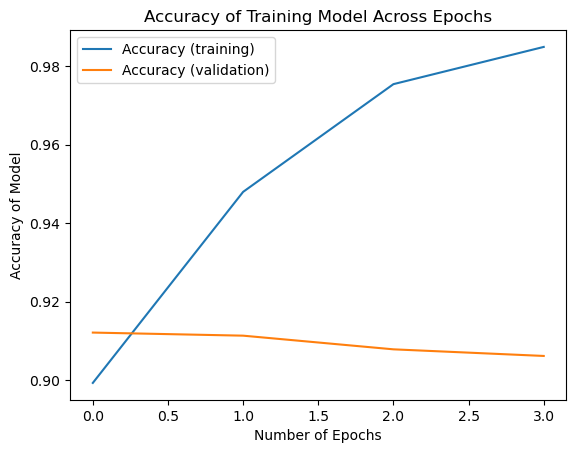

In [47]:
plt.plot(results.history['accuracy'], label= "Accuracy (training)")
plt.plot(results.history['val_accuracy'], label= "Accuracy (validation)")
plt.xlabel("Number of Epochs")
plt.ylabel("Accuracy of Model")
plt.legend()
plt.title("Accuracy of Training Model Across Epochs")
plt.show()

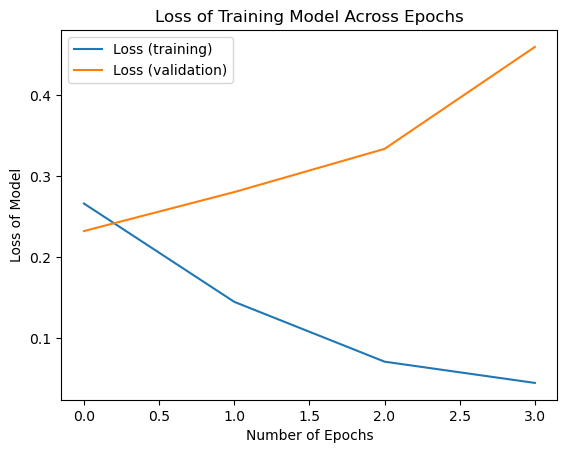

In [48]:
plt.plot(results.history['loss'], label= "Loss (training)")
plt.plot(results.history['val_loss'], label= "Loss (validation)")
plt.xlabel("Number of Epochs")
plt.ylabel("Loss of Model")
plt.legend()
plt.title("Loss of Training Model Across Epochs")
plt.show()

In the above plots, its important to note that epoch 1 actually occurs at 0 on the x-axis, epoch 2 at 1 on the x-axis, and so on. 

The above plots show pretty clearly that the predictive accuracy of the model increases as the model iterates from epoch 1 to epoch 2. The training set continues to increase in accuracy through subsequent epochs, but this is indicative of overfitting, because after this point, the validation accuracy starts to slide downwards until the early stopper is tripped to end the model training process early. 

<a id="#PartD3"></a>
## D3: Fitness of Model

We can start to examine the fitness of the model by applying the model to our test data. 

In [49]:
# Evaluate model by executing it on the test data
model.evaluate(X_test_padded_reviews, y_test)

278/278 [==============================] - 11s 40ms/step - loss: 0.5065 - accuracy: 0.9018


[0.5064610838890076, 0.9017536044120789]

The reasonably good accuracy score indicates that the model fits our test data reasonably well, but this is undermined by the loss being at 0.50. This indicates that the model isn't all that confident about its predictions. This could indicate some overfitting, but I suspect that this is more indicative of the unbalanced nature of the dataset, where games are more frequently recommended than they are not recommended. This leads to fewer datapoints expressing negative sentiments about a game, meaning that the model has fewer words to have learned from in these situations. I also suspect, though this is purely speculation based on my experiences having been playing video games for 30 years, that the verbiage around why someone didn't like a game is much more varied than what they would have to say about why they did like a game. 

The main effort put forth in this analysis to avoid overfitting the model to the training data was in isolating a specific validation set to avoid validating the model on training data, and using `EarlyStopping()` to make sure the model didn't repetitively train on itself to raise its training accuracy, instead prioritizing the validation accuracy. Beyond those efforts, the model doesn't appear to have had much of a problem with overfitting, so further action wasn't needed.  

<a id="#PartD4"></a>
## D4: Trained Predictive Accuracy

The final step of our model is to use the `evaluate()` method on our test data, as demonstrated above. In this case, we see a resulting loss of 0.50 and an accuracy of around 90%. We can also express the effectiveness of the model with a confusion matrix. 

In [50]:
# Compile predictions for y from the model's X_test data
y_pred = model.predict(X_test_padded_reviews)

278/278 [==============================] - 12s 43ms/step


In [51]:
# Round the probabilities provided by the model to the nearest integer
y_pred = np.rint(y_pred)
# Generate confusion matrix from the predictions and the y_test (truth) data
print("    PREDICTED VALUES")
print(" NO REC   |   REC")
conf_mat = confusion_matrix(y_test, y_pred)
print(f"      {conf_mat[0]}     NO REC               REAL")
print(f"     {conf_mat[1]}     REC           ('TRUE') VALUES")

    PREDICTED VALUES
 NO REC   |   REC
      [386 670]     NO REC               REAL
     [ 204 7636]     REC           ('TRUE') VALUES


Here, we can see the confusion matrix shows that we have 8000 (372 + 7628) correct predictions, and 896 (684 + 212) incorrect predictions. The bottom row of the confusion matrix represents the 7840 reviews which were recommended by users, which we're accepting as an objective truth. In this case, we can see that the model is very good at correctly predicting when games were recommended, being correct over 97% of the time for these cases. Unfortunately, we can see that the model was much less effective in handling the occasions when a game was not recommended by users, represented in the top row of 1056 games. In that situation, the model correctly predicted that a game was not recommended only around 35% of the time. In the end, the model boasts an accuracy that appears to be quite good at 89.9%, but the model lacks precision to handle the minority of situations where a user *doesn't* recommend a game.  

<a id="#PartE"></a>
## E: Trained Network Code

The model generated in this report has been saved and submitted alongside this report, in the file named Task2Model.h5.

In [52]:
# Save model to be able to be recalled later
# Establish desired file name, perform the save, and notify user of the successful outcome and file name
model_file_name = "Task2Model.h5"
model.save(model_file_name)
print(f"Model successfully saved as {model_file_name}")

Model successfully saved as Task2Model.h5


<a id="#PartF"></a>
## F: Functionality of Network 

The neural network here is moderately effective at performing the sentiment analysis that I tasked it with. It achieves an accuracy of around 90% on the test set, which is quite good. It has a higher loss value than I would've preferred at around 0.50, which indicates that it is not as confident about the correctness of its predictions as I would like. This is evident in the model's poor precision, where it is much less effective at successfully predicting that a user didn't like a game. This leaves a lot of room for improvement in the model, but I would say that this was a pretty good start, especially considering the lack of hardware to handle a more advanced neural network. Overall, I would say that this was a successful sentiment analysis. 

The network architecture itself is fairly basic, but reasonably effective and especially efficient in its performance. As mentioned previously, in developing this report I did attempt to make some models that used LSTM layers, rather than relying almost exclusively on Dense layers. This was not very successful, as it came with a moderate negative impact on accuracy, and an especially negative impact on performance, taking over 30 minutes to iterate through a single epoch. This made it prohibitive to work with, because I could not quickly iterate through my work and handle issues or try different parameters easily. In the end, the "basic" Dense layer ended up being the workhorse of this model, working quickly with a sufficient accuracy that I was able to carry on with the project. 

I was concerned that the network architecture might be too aggressive in terms of how quickly it winnows the data down from the massive inputs of 808-word reviews down to a single 1/0 output, expecting that I might have to insert additional Dense layers to work those down more slowly. I did make some attempts with more Dense layers or larger Dense layers, but these didn't really offer any meaningful increase in their predictive value, while causing an increase in execution time. Given that the performance hit came without a significant benefit in predictive value, I ended up finishing with a simpler, smaller model than I had expected to at the start of this analysis. 

<a id="#PartG"></a>
## G: Recommended Action

There are a few courses of action that I think would be worthwhile pursuits from this research. I would be very curious to continue this research with a much more powerful computer, to allow for the use of more complex network layers, to try to find a more successful model. I also think that there would be a lot of value to further refining and cleaning up the dataset, to eliminate non-English languages that appear, such as Spanish or Portugese, while leaving in common gaming vernacular. Efforts spent on preparing a cleaner dataset would not only benefit further sentiment analysis like this, but they would also be useful for extending this sentiment analysis. A refined sentiment analysis would then enable the pursuit of other projects, such as building an effective recommendation engine, as discussed at the beginning of this report. 

As a frequent Steam user and reviewer (and a big fan of indie games, in particular), I also pointed out early in this analysis about why such a recommendation engine would be important, as it becomes difficult for people to "sift through" all of the shovelware that is released on Steam to get to games that might be worth their time, and this is *especially* the case for indie developers. Many indie developers provide their games for free to streamers on sites like Twitch, to try to get their product in front of more viewers to generate profile and buzz that hopefully leads to higher sales. This is an effective method of marketing one's game, but there are only so many streamers out there with reasonably large followings and a willingness to play certain types of indie games. 

In the course of writing this report, it occurred to me that another means to try to do this same thing would be to do giveaways through Steam, to users who perform written reviews of games. Steam does aggregate reviews on its system to provide an overview of the review sentiments on a game's page on the Steam store, such as "overwhelmingly positive" or "mostly negative". In a post-blogosphere internet that has largely pivoted to video, both live and pre-produced, the written review still has value. Sentiment analysis could be performed on reviewed to actually seek out more thoughtful reviewers and fans of particular genres of video games. Once a group of desirable reviewers has been identified, gifting copies to these users contingent upon their performing a written review on Steam of the game could be an effective way of not only targetting the intended audience but of generating buzz around a product. This would be an alternative to paying streamers to play a game or using the gaming media, reaching out directly to users via Steam and generating a more "homegrown" type of buzz for a product. This sort of thing could be done either by Steam (as a means to distinguish between shovelware and more legitimate games) or by an indie publisher (as a form of marketing). 

<a id="#PartH"></a>
## H: Reporting

This section of the rubric requires that I perform various sections of the project in a development environment, such as a Jupyter Notebook. All of my projects in this program that could be completed in a Jupyter Notebook have been, including this one. As a result, this portion of the rubric is already completed as this entire assignment is submitted as both a Jupyter Notebook .ipynb file and a PDF of the same. 

<a id="#PartI"></a>
## I: Code References

[StackOverflow: Detect Strings with Non-English Character in Python](https://stackoverflow.com/questions/27084617/detect-strings-with-non-english-characters-in-python) was used for the creation of the function to check for non-ASCII (Arabic, Cyrillic, etc.) characters in the course of word tokenization.

[Samarth Agrawal @ Towards Data Science](https://towardsdatascience.com/how-to-split-data-into-three-sets-train-validation-and-test-and-why-e50d22d3e54c) was used for splitting the dataset into a training, testing, and validation set. 

<a id="#PartJ"></a>
## J: Source References

[Julian McAuley at the University of California - San Diego](https://cseweb.ucsd.edu/~jmcauley/datasets.html#steam_data) was the source for this dataset. This dataset was initially created for the 2017 report [Generating and personalizing bundle recommendations on Steam](https://cseweb.ucsd.edu/~jmcauley/pdfs/sigir17.pdf) by Apurva Pathak, Kshitiz Gupta, and Julian McAuley.

[(Analytics Vidhya, CNN vs RNN vs ANN](https://www.analyticsvidhya.com/blog/2020/02/cnn-vs-rnn-vs-mlp-analyzing-3-types-of-neural-networks-in-deep-learning/) was used for identifying types of neural networks and which one would be best suited for handling an NLP problem. 

[Alexander Chow: NLP with TensorFlow/Keras](https://medium.com/geekculture/nlp-with-tensorflow-keras-explanation-and-tutorial-cae3554b1290), [Jason Brownlee: How to Use Word Embedding LaAyers for Deep Learning with Keras](https://machinelearningmastery.com/use-word-embedding-layers-deep-learning-keras/), and [Usman Malik: Python for MLP, Word Embeddings for Deep Learning in Keras](https://stackabuse.com/python-for-nlp-word-embeddings-for-deep-learning-in-keras/) were used for understanding the process of tokenizing the data and getting it loaded into and generating the model. I was frustrated throughout this project by the lack of comprehensive tutorials or explainers, as many either glossed over important elements or omitted elements entirely. In the end, I made it work by rotating between sources as one or the other would fade in its attention to detail or would take a shortcut unavailable to me. 

[Sawan Saxena at Analytics Vidhya](https://medium.com/analytics-vidhya/understanding-embedding-layer-in-keras-bbe3ff1327ce) was used for explaining how the Embedding layer works, as well as how it interacts with the subsequent layers of our model.